<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Implementation-of-GAN" data-toc-modified-id="Implementation-of-GAN-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Implementation of GAN</a></span><ul class="toc-item"><li><span><a href="#Writing-generator-function-(1-point)" data-toc-modified-id="Writing-generator-function-(1-point)-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Writing generator function (1 point)</a></span></li><li><span><a href="#Writing-discriminator-function-(1-point)" data-toc-modified-id="Writing-discriminator-function-(1-point)-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Writing discriminator function (1 point)</a></span></li><li><span><a href="#Writing-loss-functions-(2-points)" data-toc-modified-id="Writing-loss-functions-(2-points)-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Writing loss functions (2 points)</a></span></li><li><span><a href="#Training-GAN-(1-point-+-2-for-good-results)" data-toc-modified-id="Training-GAN-(1-point-+-2-for-good-results)-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Training GAN (1 point + 2 for good results)</a></span></li><li><span><a href="#Face-interpolation-(1-point)" data-toc-modified-id="Face-interpolation-(1-point)-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>Face interpolation (1 point)</a></span></li><li><span><a href="#Adding-a-smile-(1-point-+-1-point-for-good-results)" data-toc-modified-id="Adding-a-smile-(1-point-+-1-point-for-good-results)-1.6"><span class="toc-item-num">1.6&nbsp;&nbsp;</span>Adding a smile (1 point + 1 point for good results)</a></span></li></ul></li></ul></div>

In [25]:
from __future__ import division
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from glob import glob
import time
import os
from matplotlib.image import imread
from matplotlib.pyplot import imshow

from ops import *
from utils import *
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [26]:
config = tf.ConfigProto()
config.gpu_options.allow_growth=True
sess = tf.Session(config=config)

Today we are going to train GAN for generating faces and then we will make fun playing with it. Generative adversarial networks (GANs) are deep neural net architectures comprised of two nets, pitting one against the other (thus the “adversarial”). One neural network, called the generator, generates new faces, while the other, the discriminator,  decides whether each instance of face it reviews belongs to the actual training dataset or not.

Firstly download aligned faces of celebrities from here <a href="https://yadi.sk/d/xjuClJJH3MAVXh">link</a> and extract them into folder near ipython notebook.

# Implementation of GAN

Constant variables below depends on your dataset and choosing of architecture.

In [27]:
DATA_PATH = 'celeba-dataset/face' # Path to the dataset with celebA faces
Z_DIM=100 # Dimension of face's manifold
GENERATOR_DENSE_SIZE=64*8 #64*8 # Length of first tensor in generator

IMAGE_SIZE=64 # Shapes of input image
BATCH_SIZE=64 # Batch size
N_CHANNELS = 3 # Number channels of input image

MERGE_X = 8 # Number images in merged image
MERGE_Y = 8

In [28]:
assert(os.path.exists(DATA_PATH)), 'Please, download aligned celebA to DATA_PATH folder'

Let's define GAN. To do it, we need to define generator, discriminator and loss functions.

Here are some tips on the architecture of the generator:
1. The `deeper is convolution, the less filters` is using.
2. Apply `deconvolutions-relu` layers to achieve input image shape.
3. Use `batch normalization` before nonlinearity for speed and stability of learning.
4. Use `tanh activation at the end of network` (in this case images should be scaled to [-1, 1])
5. To force generator not to collapse and produce different outputs initialize bias with zero (see linear layer).

Other useful tips: https://github.com/soumith/ganhacks. Example of architecture see below. You may also use defined layers from ops.py. <b> Please, use names for layers started with "g\_" for generator and "d_" for discriminator.</b>

<img src="https://raw.githubusercontent.com/carpedm20/DCGAN-tensorflow/master/DCGAN.png">

## Writing generator function (1 point)

In [29]:
GENERATOR_DENSE_SIZE

512

In [30]:
def generator(z, is_training, batch_norms=None):

    # input layer
    z_ = linear(z, GENERATOR_DENSE_SIZE * 4 * 4, 'g_h0_linear')
    h_in = tf.reshape(z_, [-1, 4, 4, GENERATOR_DENSE_SIZE])
    h_in = tf.nn.relu(batch_norms[0](h_in, train=is_training))
    
    # 8x8x256 layer
    h_0 = deconv2d(h_in, output_shape=[BATCH_SIZE, 8, 8, 256], name='g_h1_deconv')
    h_0 = tf.nn.relu(batch_norms[1](h_0, train=is_training))
    
    # 16x16x128 layer
    h_1 = deconv2d(h_0, output_shape=[BATCH_SIZE, 16, 16, 128], name='g_h2_deconv')
    h_1 = tf.nn.relu(batch_norms[2](h_1, train=is_training))
    
    # 32x32x64 layer
    h_2 = deconv2d(h_1, output_shape=[BATCH_SIZE, 32, 32, 64], name='g_h3_deconv')
    h_2 = tf.nn.relu(batch_norms[3](h_2, train=is_training))
    
    # 64x64x3
    h_out = deconv2d(h_2, [BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, N_CHANNELS],
            name='g_out')
    
    # use tanh for output
    return tf.nn.tanh(h_out)

Now let's define discriminator. Discriminator takes 3d tensor as input and outputs one number - probability that this is an image.

Some advice for discriminator's architecture:
1. Use `batch normalization between convolutions and nonlinearities`.
2. Use `leaky relu with the leak about 0.2`.
3. The deeper the layer, the more filters you can use.

If you use batch normalization, please define every layer in their own scope and pass is_training parameter there. Or you may use class of batch normalization from ops.py. Do not forget to fratten tensor after the convolution blocks.

## Writing discriminator function (1 point)

In [31]:
def discriminator(image, is_training, batch_norms=None):
    
    # 32x32x64 layer
    h0 = lrelu(conv2d(image, output_dim=64, name='d_h0_conv'))
    
    # 16x16x128 layer
    h1 = conv2d(h0, output_dim=128, name='d_h1_conv')
    h1 = lrelu(batch_norms[0](h1,train=is_training))
    
    # 8x8x256 layer
    h2 = conv2d(h1, output_dim=256, name='d_h2_conv')
    h2 = lrelu(batch_norms[1](h2,train=is_training))
    
    # 4x4x512 layer
    h3 = conv2d(h2, output_dim=512, name='d_h3_conv')
    h3 = lrelu(batch_norms[2](h3,train=is_training))
    
    # flatten layer 1 x 4*4*512
    h4 = tf.layers.Flatten(data_format='channels_last', name='d_h4_flatten')(h3)

    # linear layer / output layer
    linear_out = linear(h4, 1, scope='d_h5_linear')
    
    return tf.nn.sigmoid(linear_out), linear_out

Now let's define generator and discriminator.

In [32]:
tf.reset_default_graph()
is_training = tf.placeholder(tf.bool, name='is_training')

with tf.variable_scope("G") as scope:
    g_batch_norms=[batch_norm(name='g_bn0'), batch_norm(name='g_bn1'),\
                   batch_norm(name='g_bn2'), batch_norm(name='g_bn3')]
    z = tf.placeholder(tf.float32, [None, Z_DIM], name='z')
    G = generator(z, is_training, batch_norms=g_batch_norms)

with tf.variable_scope('D') as scope:
    images = tf.placeholder(tf.float32, shape=[None, IMAGE_SIZE, IMAGE_SIZE, N_CHANNELS])
    d_batch_norms=[batch_norm(name='d_bn0'), batch_norm(name='d_bn1'),\
                   batch_norm(name='d_bn2')]
    D_real, D_real_logits = discriminator(images, is_training, batch_norms=d_batch_norms)
    scope.reuse_variables()
    D_fake, D_fake_logits = discriminator(G, is_training, batch_norms=d_batch_norms)


For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



Write definition of loss funstions according to formulas:
$$ D\_loss = \frac{-1}{m} \sum_{i=1}^{m}[\log{D(x_i)} + \log{(1 - D(G(z_i)))}]$$
$$ G\_loss = \frac{1}{m} \sum_{i=1}^{m} \log{(1 - D(G(z_i)))}$$

Or for better learning you may try other loss for generator:
$$ G\_loss = \frac{-1}{m} \sum_{i=1}^{m} \log{(D(G(z_i)))}$$

## Writing loss functions (2 points)

In [33]:
"""
        You code goes here. Define discriminator and generator losses
"""
# d_loss_real = (-1)*tf.math.reduce_mean(tf.math.log(D_real))
# d_loss_fake = (-1)*tf.math.reduce_mean(tf.math.log(1 - D_fake))
# d_loss = d_loss_real + d_loss_fake
# g_loss = (-1)*tf.math.reduce_mean(tf.math.log(D_fake))

d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_real_logits,labels=tf.ones_like(D_real)))

d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_fake_logits,labels=tf.zeros_like(D_fake)))

d_loss = d_loss_real + d_loss_fake

g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_fake_logits,labels=tf.ones_like(D_fake)))

Create optimizers. We use different optimizers for discriminator and generator, so we needed a separate prefix for the discriminator and generator variables (g_ for generator, d_ for disciminator).

In [34]:
tvars = tf.trainable_variables()
## All variables of discriminator
d_vars = [v for v in tvars if 'd_' in v.name]

## All variables of generator
g_vars = [v for v in tvars if 'g_' in v.name]

LEARNING_RATE = 0.0002 # Learning rate for adam optimizer
BETA = 0.5 # Beta paramater in adam optimizer

##Optimizers - ypu may use your favourite instead.
d_optim = tf.train.AdamOptimizer(LEARNING_RATE,\
                                 beta1=BETA).minimize(d_loss, var_list=d_vars)
g_optim = tf.train.AdamOptimizer(LEARNING_RATE,\
                                 beta1=BETA).minimize(g_loss, var_list=g_vars) 

W0329 16:42:25.785002 139785137579776 deprecation.py:506] From /usr/local/lib/python3.5/dist-packages/tensorflow/python/training/slot_creator.py:187: calling Zeros.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Load data:

In [35]:
data = glob(os.path.join(DATA_PATH, "*.jpg"))
assert(len(data) > 0), "Length of training data should be more than zero"

Functions for training and evaluations.

In [36]:
def load(sess, load_dir):
    """load network's paramaters
    
    load_dir : path to load dir
    """
    saver = tf.train.Saver()
    ckpt = tf.train.get_checkpoint_state(load_dir)
    if ckpt and ckpt.model_checkpoint_path:
            saver.restore(sess, ckpt.model_checkpoint_path)

## Training GAN (1 point + 2 for good results)

In [37]:
def train(sess,\
          load_dir=None,\
          save_frequency=100,\
          sample_frequency=500,\
          sample_dir='sample_faces',\
          save_dir='checkpoint',\
          max_to_keep=1,\
          model_name='dcgan.model',
          n_epochs=25,\
          n_generator_update=2):
    """train gan
    Parameters
    -------------------------------------------
    load_dir : str, default = None
        path to the folder with parameters
    save_frequency: int, default = 100
        how often save parameters []
    sample_frequency: int, default = None (not sample)
        how often sample faces
    sample_dir: str, default = samples
        directory for sampled images
    save_dir: str, default = 'checkpoint'
        path where to save parameters
    max_to_keep: int, default = 1
        how many last checkpoints to store
    model_name: str, default='dcgan.model'
        name of model
    n_epochs: int, default = 25 
        number epochs to train
    n_generator_update: int, default = 2
        how many times run generator updates per one discriminator update
    -------------------------------------------
    """
    
    if save_frequency is not None:
        saver = tf.train.Saver(max_to_keep=max_to_keep)
        
    if load_dir is not None:
        print("Reading checkpoints...")
        load(sess, load_dir)
        print("Loaded checkpoints")
    else:
        try:
            tf.global_variables_initializer().run()
        except:
            tf.initialize_all_variables().run()

    counter=1
    start_time = time.time()
    
    for epoch in range(n_epochs): # each epoch
        batch_idxs = min(len(data), np.inf) // BATCH_SIZE # number of batches
        
        # for each batch data
        for idx in range(0, batch_idxs):
            
            # get one batch data
            batch_files = data[idx*BATCH_SIZE:(idx+1)*BATCH_SIZE]
            
            # load batch data into a list with BATCH_SIZE length
            batch = [get_image(batch_file, IMAGE_SIZE) for batch_file in batch_files]
            
            # convert to numpy from list
            batch_images = np.array(batch).astype(np.float32)
            
            # construct noise input tensor for G [BATCH_SIZE, Z_DIM(100)]
            batch_z = np.random.uniform(-1, 1, [BATCH_SIZE, Z_DIM]).astype(np.float32)

            # Update D network
            sess.run(d_optim,\
                     feed_dict={images: batch_images,\
                                z: batch_z,\
                                is_training: True})

            # Update G network
            for _ in range(n_generator_update):
                sess.run(g_optim,\
                         feed_dict={z: batch_z,\
                                    is_training: True})
            
            ''' by giving the placeholder tensor, to calculate the loss'''
            # for D, we calculate the d_loss_fake we need noise tensor
            errD_fake = d_loss_fake.eval({z: batch_z, is_training: False})
            # for D, we calculate the d_loss_real we need iamges tensor
            errD_real = d_loss_real.eval({images: batch_images, is_training: False})
            # for G, we calculate the g_loss we need noise tensor
            errG = g_loss.eval({z: batch_z, is_training: False})

            counter += 1
            print("Epoch: [{:2d}] [{:4d}/{:4d}] time: {:4.4f}, d_loss: {:.8f}, g_loss: {:.8f}".format(
                epoch, idx, batch_idxs, time.time() - start_time, errD_fake+errD_real, errG))

            if np.mod(counter, save_frequency) == 1:
                print("Saved model")
                saver.save(sess, os.path.join(save_dir, model_name))

            if np.mod(counter, sample_frequency) == 1:
                # get samples generated by G, 
                # so we feed noise tensor and we do not trainging
                samples = sess.run(G, feed_dict={z: batch_z, is_training: False})
                save_images(samples,\
                            [MERGE_X, MERGE_Y],\
                            os.path.join(sample_dir,\
                                         'train_{:02d}_{:04d}.png'.format(epoch, idx)))
                print("Save samples")

In [15]:
with tf.Session() as sess:
    train(sess, save_dir='checkpoint')

Epoch: [ 0] [   0/3092] time: 2.9970, d_loss: 1.31790376, g_loss: 0.74474269
Epoch: [ 0] [   1/3092] time: 3.1711, d_loss: 1.33640051, g_loss: 0.92267138
Epoch: [ 0] [   2/3092] time: 3.3403, d_loss: 1.53247917, g_loss: 1.34799373
Epoch: [ 0] [   3/3092] time: 3.5123, d_loss: 1.75620985, g_loss: 1.72192359
Epoch: [ 0] [   4/3092] time: 3.6845, d_loss: 2.02996707, g_loss: 2.20276475
Epoch: [ 0] [   5/3092] time: 3.8571, d_loss: 2.47141576, g_loss: 2.87911224
Epoch: [ 0] [   6/3092] time: 4.0300, d_loss: 2.90503001, g_loss: 3.50841475
Epoch: [ 0] [   7/3092] time: 4.2031, d_loss: 3.39281678, g_loss: 4.26698208
Epoch: [ 0] [   8/3092] time: 4.3768, d_loss: 2.93410659, g_loss: 4.38320160
Epoch: [ 0] [   9/3092] time: 4.5529, d_loss: 3.88841701, g_loss: 5.31753349
Epoch: [ 0] [  10/3092] time: 4.7277, d_loss: 3.56081963, g_loss: 4.77170467
Epoch: [ 0] [  11/3092] time: 4.9014, d_loss: 4.78337526, g_loss: 5.99766064
Epoch: [ 0] [  12/3092] time: 5.0682, d_loss: 3.61675262, g_loss: 4.19443417

Epoch: [ 0] [ 106/3092] time: 21.8194, d_loss: 1.85081661, g_loss: 0.59635901
Epoch: [ 0] [ 107/3092] time: 21.9954, d_loss: 2.09830475, g_loss: 0.34073800
Epoch: [ 0] [ 108/3092] time: 22.1727, d_loss: 1.61698544, g_loss: 0.83655775
Epoch: [ 0] [ 109/3092] time: 22.3512, d_loss: 1.76417303, g_loss: 1.15784597
Epoch: [ 0] [ 110/3092] time: 22.5261, d_loss: 1.58417130, g_loss: 0.94209814
Epoch: [ 0] [ 111/3092] time: 22.7003, d_loss: 1.78062797, g_loss: 1.17729974
Epoch: [ 0] [ 112/3092] time: 22.8731, d_loss: 1.54285979, g_loss: 0.38402367
Epoch: [ 0] [ 113/3092] time: 23.0427, d_loss: 2.45298219, g_loss: 1.99902439
Epoch: [ 0] [ 114/3092] time: 23.2054, d_loss: 1.96576786, g_loss: 0.27201837
Epoch: [ 0] [ 115/3092] time: 23.3742, d_loss: 1.81113803, g_loss: 1.71365535
Epoch: [ 0] [ 116/3092] time: 23.5506, d_loss: 1.83903599, g_loss: 0.74975812
Epoch: [ 0] [ 117/3092] time: 23.7317, d_loss: 2.12101102, g_loss: 0.27599245
Epoch: [ 0] [ 118/3092] time: 23.9102, d_loss: 1.79218674, g_los

Epoch: [ 0] [ 212/3092] time: 40.5487, d_loss: 1.93167424, g_loss: 0.57411891
Epoch: [ 0] [ 213/3092] time: 40.7249, d_loss: 1.87859643, g_loss: 1.01786232
Epoch: [ 0] [ 214/3092] time: 40.8997, d_loss: 1.99329162, g_loss: 0.65407586
Epoch: [ 0] [ 215/3092] time: 41.0678, d_loss: 1.96122229, g_loss: 0.86374384
Epoch: [ 0] [ 216/3092] time: 41.2312, d_loss: 1.81420851, g_loss: 0.70467561
Epoch: [ 0] [ 217/3092] time: 41.4056, d_loss: 1.94372559, g_loss: 1.04946971
Epoch: [ 0] [ 218/3092] time: 41.5812, d_loss: 1.86664033, g_loss: 0.59432596
Epoch: [ 0] [ 219/3092] time: 41.7562, d_loss: 1.66046798, g_loss: 1.57827616
Epoch: [ 0] [ 220/3092] time: 41.9318, d_loss: 1.55250216, g_loss: 0.86144662
Epoch: [ 0] [ 221/3092] time: 42.1058, d_loss: 2.19023132, g_loss: 2.05706882
Epoch: [ 0] [ 222/3092] time: 42.2801, d_loss: 1.89034283, g_loss: 0.62519741
Epoch: [ 0] [ 223/3092] time: 42.4561, d_loss: 2.11288428, g_loss: 0.87821501
Epoch: [ 0] [ 224/3092] time: 42.6316, d_loss: 3.13081956, g_los

Epoch: [ 0] [ 318/3092] time: 59.1552, d_loss: 1.62934232, g_loss: 0.60315913
Epoch: [ 0] [ 319/3092] time: 59.3205, d_loss: 2.05456424, g_loss: 0.56321949
Epoch: [ 0] [ 320/3092] time: 59.4950, d_loss: 2.76915073, g_loss: 0.16788085
Epoch: [ 0] [ 321/3092] time: 59.6695, d_loss: 1.92417479, g_loss: 1.25639188
Epoch: [ 0] [ 322/3092] time: 59.8431, d_loss: 2.18700457, g_loss: 0.36445916
Epoch: [ 0] [ 323/3092] time: 60.0169, d_loss: 2.00727797, g_loss: 0.60634840
Epoch: [ 0] [ 324/3092] time: 60.1922, d_loss: 1.63653088, g_loss: 0.97468364
Epoch: [ 0] [ 325/3092] time: 60.3691, d_loss: 1.61035025, g_loss: 0.74111009
Epoch: [ 0] [ 326/3092] time: 60.5434, d_loss: 1.72981811, g_loss: 0.88436097
Epoch: [ 0] [ 327/3092] time: 60.7170, d_loss: 1.77948928, g_loss: 0.92807490
Epoch: [ 0] [ 328/3092] time: 60.8939, d_loss: 1.55616486, g_loss: 0.97345209
Epoch: [ 0] [ 329/3092] time: 61.0619, d_loss: 1.43332636, g_loss: 0.79253387
Epoch: [ 0] [ 330/3092] time: 61.2255, d_loss: 1.41225636, g_los

Epoch: [ 0] [ 424/3092] time: 77.7547, d_loss: 1.68112111, g_loss: 0.57297093
Epoch: [ 0] [ 425/3092] time: 77.9303, d_loss: 1.54016244, g_loss: 0.57404685
Epoch: [ 0] [ 426/3092] time: 78.1055, d_loss: 1.48706985, g_loss: 0.66970438
Epoch: [ 0] [ 427/3092] time: 78.2801, d_loss: 1.30858397, g_loss: 0.90173072
Epoch: [ 0] [ 428/3092] time: 78.4552, d_loss: 1.43883610, g_loss: 0.80591875
Epoch: [ 0] [ 429/3092] time: 78.6301, d_loss: 1.66870654, g_loss: 0.57057393
Epoch: [ 0] [ 430/3092] time: 78.8057, d_loss: 1.67177653, g_loss: 0.70364761
Epoch: [ 0] [ 431/3092] time: 78.9803, d_loss: 1.59090817, g_loss: 0.60318553
Epoch: [ 0] [ 432/3092] time: 79.1436, d_loss: 1.64107442, g_loss: 0.75662559
Epoch: [ 0] [ 433/3092] time: 79.3087, d_loss: 1.50880265, g_loss: 0.78110856
Epoch: [ 0] [ 434/3092] time: 79.4847, d_loss: 1.57001829, g_loss: 1.00789642
Epoch: [ 0] [ 435/3092] time: 79.6596, d_loss: 1.54819465, g_loss: 0.58619905
Epoch: [ 0] [ 436/3092] time: 79.8328, d_loss: 1.29882789, g_los

Epoch: [ 0] [ 529/3092] time: 96.4730, d_loss: 1.43971622, g_loss: 0.59823018
Epoch: [ 0] [ 530/3092] time: 96.6483, d_loss: 1.57488966, g_loss: 1.14220214
Epoch: [ 0] [ 531/3092] time: 96.8295, d_loss: 1.66446471, g_loss: 0.47227395
Epoch: [ 0] [ 532/3092] time: 97.0101, d_loss: 1.61565995, g_loss: 0.86725819
Epoch: [ 0] [ 533/3092] time: 97.1835, d_loss: 1.44055402, g_loss: 0.78046179
Epoch: [ 0] [ 534/3092] time: 97.3611, d_loss: 1.46529448, g_loss: 0.93775380
Epoch: [ 0] [ 535/3092] time: 97.5451, d_loss: 1.41736031, g_loss: 0.80817401
Epoch: [ 0] [ 536/3092] time: 97.7277, d_loss: 1.43008614, g_loss: 1.05142808
Epoch: [ 0] [ 537/3092] time: 97.9105, d_loss: 1.63390326, g_loss: 0.58960724
Epoch: [ 0] [ 538/3092] time: 98.0939, d_loss: 1.71751165, g_loss: 0.87862796
Epoch: [ 0] [ 539/3092] time: 98.2744, d_loss: 1.72329497, g_loss: 0.46077535
Epoch: [ 0] [ 540/3092] time: 98.4564, d_loss: 1.63278604, g_loss: 0.91833854
Epoch: [ 0] [ 541/3092] time: 98.6320, d_loss: 1.68349719, g_los

Epoch: [ 0] [ 634/3092] time: 115.0487, d_loss: 1.60839498, g_loss: 0.59815079
Epoch: [ 0] [ 635/3092] time: 115.2111, d_loss: 1.57564259, g_loss: 0.61678803
Epoch: [ 0] [ 636/3092] time: 115.3836, d_loss: 1.51579142, g_loss: 0.75794137
Epoch: [ 0] [ 637/3092] time: 115.5584, d_loss: 1.68182623, g_loss: 0.51187950
Epoch: [ 0] [ 638/3092] time: 115.7341, d_loss: 1.57407486, g_loss: 0.80936205
Epoch: [ 0] [ 639/3092] time: 115.9069, d_loss: 1.66663766, g_loss: 0.48795491
Epoch: [ 0] [ 640/3092] time: 116.0800, d_loss: 1.54249167, g_loss: 1.11220860
Epoch: [ 0] [ 641/3092] time: 116.2539, d_loss: 1.48220575, g_loss: 0.68424499
Epoch: [ 0] [ 642/3092] time: 116.4275, d_loss: 2.06091809, g_loss: 1.08168578
Epoch: [ 0] [ 643/3092] time: 116.6015, d_loss: 1.78886557, g_loss: 0.48188561
Epoch: [ 0] [ 644/3092] time: 116.7729, d_loss: 2.00959206, g_loss: 0.99671125
Epoch: [ 0] [ 645/3092] time: 116.9511, d_loss: 1.86970615, g_loss: 0.45751685
Epoch: [ 0] [ 646/3092] time: 117.1156, d_loss: 1.67

Epoch: [ 0] [ 738/3092] time: 133.4012, d_loss: 1.60847425, g_loss: 0.60195482
Epoch: [ 0] [ 739/3092] time: 133.5796, d_loss: 1.64028907, g_loss: 0.70506513
Epoch: [ 0] [ 740/3092] time: 133.7547, d_loss: 1.68762922, g_loss: 0.68610889
Epoch: [ 0] [ 741/3092] time: 133.9315, d_loss: 1.73760676, g_loss: 0.57574439
Epoch: [ 0] [ 742/3092] time: 134.1072, d_loss: 1.63087952, g_loss: 0.61001503
Epoch: [ 0] [ 743/3092] time: 134.2844, d_loss: 1.55784357, g_loss: 0.87291753
Epoch: [ 0] [ 744/3092] time: 134.4603, d_loss: 1.69833052, g_loss: 0.64345598
Epoch: [ 0] [ 745/3092] time: 134.6366, d_loss: 1.57440686, g_loss: 0.90989983
Epoch: [ 0] [ 746/3092] time: 134.8140, d_loss: 1.45596743, g_loss: 0.77294338
Epoch: [ 0] [ 747/3092] time: 134.9887, d_loss: 1.44433868, g_loss: 0.75138104
Epoch: [ 0] [ 748/3092] time: 135.1541, d_loss: 1.56309795, g_loss: 0.61909300
Epoch: [ 0] [ 749/3092] time: 135.3199, d_loss: 1.43674362, g_loss: 0.70582747
Epoch: [ 0] [ 750/3092] time: 135.4965, d_loss: 1.41

Epoch: [ 0] [ 842/3092] time: 151.8081, d_loss: 1.49112630, g_loss: 0.67215407
Epoch: [ 0] [ 843/3092] time: 151.9834, d_loss: 1.53232658, g_loss: 0.54680181
Epoch: [ 0] [ 844/3092] time: 152.1599, d_loss: 1.45189738, g_loss: 0.90790540
Epoch: [ 0] [ 845/3092] time: 152.3350, d_loss: 1.52052593, g_loss: 0.60084230
Epoch: [ 0] [ 846/3092] time: 152.5120, d_loss: 1.66138554, g_loss: 0.91807103
Epoch: [ 0] [ 847/3092] time: 152.6864, d_loss: 1.63264740, g_loss: 0.40650040
Epoch: [ 0] [ 848/3092] time: 152.8620, d_loss: 1.89198005, g_loss: 1.17127526
Epoch: [ 0] [ 849/3092] time: 153.0335, d_loss: 1.62115777, g_loss: 0.49317667
Epoch: [ 0] [ 850/3092] time: 153.1983, d_loss: 1.83237624, g_loss: 1.08601952
Epoch: [ 0] [ 851/3092] time: 153.3700, d_loss: 1.74343967, g_loss: 0.73996478
Epoch: [ 0] [ 852/3092] time: 153.5465, d_loss: 1.58102143, g_loss: 0.73551524
Epoch: [ 0] [ 853/3092] time: 153.7203, d_loss: 1.68870831, g_loss: 0.59582245
Epoch: [ 0] [ 854/3092] time: 153.8979, d_loss: 1.75

Epoch: [ 0] [ 946/3092] time: 170.1724, d_loss: 1.62229824, g_loss: 0.80825937
Epoch: [ 0] [ 947/3092] time: 170.3507, d_loss: 1.81239200, g_loss: 0.50308031
Epoch: [ 0] [ 948/3092] time: 170.5272, d_loss: 1.74710369, g_loss: 0.51265550
Epoch: [ 0] [ 949/3092] time: 170.7023, d_loss: 1.49733973, g_loss: 0.89992630
Epoch: [ 0] [ 950/3092] time: 170.8814, d_loss: 1.47552979, g_loss: 0.65087044
Epoch: [ 0] [ 951/3092] time: 171.0516, d_loss: 1.44930720, g_loss: 0.91892159
Epoch: [ 0] [ 952/3092] time: 171.2160, d_loss: 1.45321763, g_loss: 0.68964362
Epoch: [ 0] [ 953/3092] time: 171.3909, d_loss: 1.63358688, g_loss: 0.96427405
Epoch: [ 0] [ 954/3092] time: 171.5665, d_loss: 1.37173033, g_loss: 0.74731928
Epoch: [ 0] [ 955/3092] time: 171.7410, d_loss: 1.51797724, g_loss: 0.93862927
Epoch: [ 0] [ 956/3092] time: 171.9168, d_loss: 1.30388618, g_loss: 0.80197304
Epoch: [ 0] [ 957/3092] time: 172.0932, d_loss: 1.32693434, g_loss: 1.15341783
Epoch: [ 0] [ 958/3092] time: 172.2689, d_loss: 1.41

Epoch: [ 0] [1051/3092] time: 188.7830, d_loss: 1.48692167, g_loss: 0.85449982
Epoch: [ 0] [1052/3092] time: 188.9589, d_loss: 1.61800945, g_loss: 0.83713365
Epoch: [ 0] [1053/3092] time: 189.1242, d_loss: 1.55016637, g_loss: 0.72497392
Epoch: [ 0] [1054/3092] time: 189.2879, d_loss: 1.86261678, g_loss: 0.88765645
Epoch: [ 0] [1055/3092] time: 189.4653, d_loss: 1.82689714, g_loss: 0.54461515
Epoch: [ 0] [1056/3092] time: 189.6423, d_loss: 1.65141129, g_loss: 0.89837229
Epoch: [ 0] [1057/3092] time: 189.8205, d_loss: 1.51394725, g_loss: 0.64661115
Epoch: [ 0] [1058/3092] time: 189.9973, d_loss: 1.68871593, g_loss: 0.66100246
Epoch: [ 0] [1059/3092] time: 190.1726, d_loss: 1.84784698, g_loss: 0.51063347
Epoch: [ 0] [1060/3092] time: 190.3485, d_loss: 1.67091584, g_loss: 0.51731253
Epoch: [ 0] [1061/3092] time: 190.5269, d_loss: 1.68808055, g_loss: 0.85570115
Epoch: [ 0] [1062/3092] time: 190.7010, d_loss: 1.45779490, g_loss: 0.81162226
Epoch: [ 0] [1063/3092] time: 190.8773, d_loss: 1.40

Epoch: [ 0] [1156/3092] time: 207.3635, d_loss: 1.57629907, g_loss: 0.51484025
Epoch: [ 0] [1157/3092] time: 207.5410, d_loss: 1.56461740, g_loss: 0.86997366
Epoch: [ 0] [1158/3092] time: 207.7159, d_loss: 1.41416693, g_loss: 0.84669983
Epoch: [ 0] [1159/3092] time: 207.8915, d_loss: 1.29566526, g_loss: 0.81347275
Epoch: [ 0] [1160/3092] time: 208.0679, d_loss: 1.46187603, g_loss: 0.63722259
Epoch: [ 0] [1161/3092] time: 208.2430, d_loss: 1.53823018, g_loss: 0.60267687
Epoch: [ 0] [1162/3092] time: 208.4189, d_loss: 1.60063958, g_loss: 0.49801946
Epoch: [ 0] [1163/3092] time: 208.5926, d_loss: 1.52509117, g_loss: 0.69170684
Epoch: [ 0] [1164/3092] time: 208.7662, d_loss: 1.51670969, g_loss: 0.79854041
Epoch: [ 0] [1165/3092] time: 208.9398, d_loss: 1.53606987, g_loss: 0.78921390
Epoch: [ 0] [1166/3092] time: 209.1047, d_loss: 1.53597307, g_loss: 0.87818754
Epoch: [ 0] [1167/3092] time: 209.2679, d_loss: 1.53062928, g_loss: 0.69850963
Epoch: [ 0] [1168/3092] time: 209.4420, d_loss: 1.51

Epoch: [ 0] [1260/3092] time: 225.8137, d_loss: 1.66672778, g_loss: 0.83706594
Epoch: [ 0] [1261/3092] time: 225.9963, d_loss: 1.48484290, g_loss: 1.29028773
Epoch: [ 0] [1262/3092] time: 226.1777, d_loss: 1.32198215, g_loss: 0.64645600
Epoch: [ 0] [1263/3092] time: 226.3586, d_loss: 1.62156749, g_loss: 1.63110316
Epoch: [ 0] [1264/3092] time: 226.5387, d_loss: 1.37693620, g_loss: 0.55616486
Epoch: [ 0] [1265/3092] time: 226.7197, d_loss: 1.51739788, g_loss: 0.96291006
Epoch: [ 0] [1266/3092] time: 226.9030, d_loss: 1.60140395, g_loss: 0.48479682
Epoch: [ 0] [1267/3092] time: 227.0813, d_loss: 1.73616576, g_loss: 0.68816805
Epoch: [ 0] [1268/3092] time: 227.2561, d_loss: 1.78012240, g_loss: 0.39715397
Epoch: [ 0] [1269/3092] time: 227.4397, d_loss: 1.99331522, g_loss: 1.33065033
Epoch: [ 0] [1270/3092] time: 227.6292, d_loss: 1.56940246, g_loss: 0.40827915
Epoch: [ 0] [1271/3092] time: 227.8205, d_loss: 1.45529807, g_loss: 0.90016407
Epoch: [ 0] [1272/3092] time: 228.0079, d_loss: 1.52

Epoch: [ 0] [1364/3092] time: 244.4770, d_loss: 1.52321529, g_loss: 0.72409213
Epoch: [ 0] [1365/3092] time: 244.6521, d_loss: 1.39703798, g_loss: 0.89112186
Epoch: [ 0] [1366/3092] time: 244.8272, d_loss: 1.47339129, g_loss: 0.76011634
Epoch: [ 0] [1367/3092] time: 245.0017, d_loss: 1.57186127, g_loss: 0.51658708
Epoch: [ 0] [1368/3092] time: 245.1661, d_loss: 1.69850898, g_loss: 0.68225121
Epoch: [ 0] [1369/3092] time: 245.3335, d_loss: 1.70631599, g_loss: 0.48032257
Epoch: [ 0] [1370/3092] time: 245.5103, d_loss: 1.52012289, g_loss: 0.69388354
Epoch: [ 0] [1371/3092] time: 245.6864, d_loss: 1.57790434, g_loss: 1.07852852
Epoch: [ 0] [1372/3092] time: 245.8633, d_loss: 1.33395362, g_loss: 0.68916291
Epoch: [ 0] [1373/3092] time: 246.0409, d_loss: 1.42802095, g_loss: 0.97175539
Epoch: [ 0] [1374/3092] time: 246.2185, d_loss: 1.48138666, g_loss: 0.81385434
Epoch: [ 0] [1375/3092] time: 246.3940, d_loss: 1.75692487, g_loss: 0.99954730
Epoch: [ 0] [1376/3092] time: 246.5698, d_loss: 1.54

Epoch: [ 0] [1468/3092] time: 262.9092, d_loss: 1.41102552, g_loss: 1.18833399
Epoch: [ 0] [1469/3092] time: 263.0777, d_loss: 1.41843987, g_loss: 0.52059996
Epoch: [ 0] [1470/3092] time: 263.2421, d_loss: 1.30616570, g_loss: 0.99607098
Epoch: [ 0] [1471/3092] time: 263.4181, d_loss: 1.56654203, g_loss: 0.50562525
Epoch: [ 0] [1472/3092] time: 263.5955, d_loss: 1.60664058, g_loss: 0.65924042
Epoch: [ 0] [1473/3092] time: 263.7723, d_loss: 1.66269553, g_loss: 0.57160950
Epoch: [ 0] [1474/3092] time: 263.9484, d_loss: 1.64377546, g_loss: 0.71757823
Epoch: [ 0] [1475/3092] time: 264.1263, d_loss: 1.54697394, g_loss: 0.58819854
Epoch: [ 0] [1476/3092] time: 264.3022, d_loss: 1.57837677, g_loss: 0.96011913
Epoch: [ 0] [1477/3092] time: 264.4789, d_loss: 1.59842658, g_loss: 0.61687553
Epoch: [ 0] [1478/3092] time: 264.6547, d_loss: 1.55130601, g_loss: 0.95295560
Epoch: [ 0] [1479/3092] time: 264.8318, d_loss: 1.45760965, g_loss: 0.71948957
Epoch: [ 0] [1480/3092] time: 265.0071, d_loss: 1.54

Epoch: [ 0] [1573/3092] time: 281.5413, d_loss: 1.69020128, g_loss: 1.31215215
Epoch: [ 0] [1574/3092] time: 281.7159, d_loss: 1.51688051, g_loss: 0.51549113
Epoch: [ 0] [1575/3092] time: 281.8932, d_loss: 1.71223080, g_loss: 1.31827927
Epoch: [ 0] [1576/3092] time: 282.0695, d_loss: 1.50331104, g_loss: 0.52051514
Epoch: [ 0] [1577/3092] time: 282.2497, d_loss: 1.46919322, g_loss: 0.87687284
Epoch: [ 0] [1578/3092] time: 282.4250, d_loss: 1.54993153, g_loss: 0.60706562
Epoch: [ 0] [1579/3092] time: 282.6038, d_loss: 1.58426213, g_loss: 0.58637857
Epoch: [ 0] [1580/3092] time: 282.7806, d_loss: 1.48360395, g_loss: 0.85310423
Epoch: [ 0] [1581/3092] time: 282.9577, d_loss: 1.46430039, g_loss: 0.76193506
Epoch: [ 0] [1582/3092] time: 283.1212, d_loss: 1.44874549, g_loss: 0.78626323
Epoch: [ 0] [1583/3092] time: 283.2863, d_loss: 1.54835212, g_loss: 0.67593169
Epoch: [ 0] [1584/3092] time: 283.4648, d_loss: 1.47750998, g_loss: 0.88648784
Epoch: [ 0] [1585/3092] time: 283.6397, d_loss: 1.38

Epoch: [ 0] [1678/3092] time: 300.1476, d_loss: 1.54000282, g_loss: 0.90947855
Epoch: [ 0] [1679/3092] time: 300.3229, d_loss: 1.44760895, g_loss: 0.55298305
Epoch: [ 0] [1680/3092] time: 300.5015, d_loss: 1.40736032, g_loss: 0.91712373
Epoch: [ 0] [1681/3092] time: 300.6788, d_loss: 1.45045304, g_loss: 0.87084979
Epoch: [ 0] [1682/3092] time: 300.8559, d_loss: 1.47616911, g_loss: 0.78746724
Epoch: [ 0] [1683/3092] time: 301.0284, d_loss: 1.53246713, g_loss: 0.69619411
Epoch: [ 0] [1684/3092] time: 301.1933, d_loss: 1.57151866, g_loss: 0.74099696
Epoch: [ 0] [1685/3092] time: 301.3637, d_loss: 1.52869987, g_loss: 1.02408290
Epoch: [ 0] [1686/3092] time: 301.5395, d_loss: 1.19094038, g_loss: 0.85928524
Epoch: [ 0] [1687/3092] time: 301.7153, d_loss: 1.27129555, g_loss: 0.82570124
Epoch: [ 0] [1688/3092] time: 301.8929, d_loss: 1.49035215, g_loss: 0.53963864
Epoch: [ 0] [1689/3092] time: 302.0694, d_loss: 1.59542561, g_loss: 0.61877626
Epoch: [ 0] [1690/3092] time: 302.2474, d_loss: 1.60

Epoch: [ 0] [1782/3092] time: 318.6741, d_loss: 1.35080099, g_loss: 0.71772164
Epoch: [ 0] [1783/3092] time: 318.8470, d_loss: 1.43620420, g_loss: 0.66166806
Epoch: [ 0] [1784/3092] time: 319.0188, d_loss: 1.48192120, g_loss: 0.63707298
Epoch: [ 0] [1785/3092] time: 319.1820, d_loss: 1.29576695, g_loss: 1.08784199
Epoch: [ 0] [1786/3092] time: 319.3528, d_loss: 1.36343396, g_loss: 0.58769405
Epoch: [ 0] [1787/3092] time: 319.5282, d_loss: 1.64325988, g_loss: 1.06030691
Epoch: [ 0] [1788/3092] time: 319.7022, d_loss: 1.51313376, g_loss: 0.63114065
Epoch: [ 0] [1789/3092] time: 319.8794, d_loss: 1.52061880, g_loss: 0.74437493
Epoch: [ 0] [1790/3092] time: 320.0572, d_loss: 1.54221654, g_loss: 0.64525795
Epoch: [ 0] [1791/3092] time: 320.2345, d_loss: 1.47261190, g_loss: 0.66148359
Epoch: [ 0] [1792/3092] time: 320.4096, d_loss: 1.55408347, g_loss: 1.06776810
Epoch: [ 0] [1793/3092] time: 320.5865, d_loss: 1.54185104, g_loss: 0.64312696
Epoch: [ 0] [1794/3092] time: 320.7629, d_loss: 1.65

Epoch: [ 0] [1886/3092] time: 337.1103, d_loss: 1.45865309, g_loss: 0.95281297
Epoch: [ 0] [1887/3092] time: 337.2744, d_loss: 1.42367840, g_loss: 0.94557607
Epoch: [ 0] [1888/3092] time: 337.4519, d_loss: 1.44657183, g_loss: 0.80157065
Epoch: [ 0] [1889/3092] time: 337.6268, d_loss: 1.36084533, g_loss: 0.91648906
Epoch: [ 0] [1890/3092] time: 337.8034, d_loss: 1.34678841, g_loss: 0.85359079
Epoch: [ 0] [1891/3092] time: 337.9808, d_loss: 1.74466586, g_loss: 0.33458209
Epoch: [ 0] [1892/3092] time: 338.1576, d_loss: 1.65039575, g_loss: 0.92935526
Epoch: [ 0] [1893/3092] time: 338.3348, d_loss: 1.84136844, g_loss: 0.34669000
Epoch: [ 0] [1894/3092] time: 338.5111, d_loss: 1.68793404, g_loss: 0.92562151
Epoch: [ 0] [1895/3092] time: 338.6882, d_loss: 1.50780809, g_loss: 0.59640586
Epoch: [ 0] [1896/3092] time: 338.8631, d_loss: 1.55676579, g_loss: 0.64025009
Epoch: [ 0] [1897/3092] time: 339.0352, d_loss: 1.62221515, g_loss: 0.70183676
Epoch: [ 0] [1898/3092] time: 339.2005, d_loss: 1.63

Epoch: [ 0] [1990/3092] time: 355.5319, d_loss: 1.55220723, g_loss: 0.87702763
Epoch: [ 0] [1991/3092] time: 355.7085, d_loss: 1.55414033, g_loss: 0.72883964
Epoch: [ 0] [1992/3092] time: 355.8857, d_loss: 1.49445641, g_loss: 0.73654675
Epoch: [ 0] [1993/3092] time: 356.0670, d_loss: 1.45420825, g_loss: 0.89530635
Epoch: [ 0] [1994/3092] time: 356.2480, d_loss: 1.56536818, g_loss: 0.56080568
Epoch: [ 0] [1995/3092] time: 356.4254, d_loss: 1.78117895, g_loss: 1.27080500
Epoch: [ 0] [1996/3092] time: 356.6008, d_loss: 1.60398555, g_loss: 0.44434455
Epoch: [ 0] [1997/3092] time: 356.7768, d_loss: 2.04683781, g_loss: 1.33629107
Epoch: [ 0] [1998/3092] time: 356.9500, d_loss: 2.05396605, g_loss: 0.26471132
Epoch: [ 0] [1999/3092] time: 357.1135, d_loss: 1.83229542, g_loss: 1.12168789
Saved model
Save samples
Epoch: [ 0] [2000/3092] time: 357.6049, d_loss: 1.59261203, g_loss: 0.50032622
Epoch: [ 0] [2001/3092] time: 357.7839, d_loss: 1.65110099, g_loss: 0.43341392
Epoch: [ 0] [2002/3092] tim

Epoch: [ 0] [2095/3092] time: 374.3860, d_loss: 1.59319830, g_loss: 0.51814795
Epoch: [ 0] [2096/3092] time: 374.5659, d_loss: 1.47782266, g_loss: 0.60680747
Epoch: [ 0] [2097/3092] time: 374.7454, d_loss: 1.43774545, g_loss: 0.84004855
Epoch: [ 0] [2098/3092] time: 374.9282, d_loss: 1.51213515, g_loss: 0.51223898
Epoch: [ 0] [2099/3092] time: 375.1053, d_loss: 1.64185548, g_loss: 0.76493680
Saved model
Epoch: [ 0] [2100/3092] time: 375.5097, d_loss: 1.79355156, g_loss: 0.31147388
Epoch: [ 0] [2101/3092] time: 375.6939, d_loss: 1.61730719, g_loss: 1.59150577
Epoch: [ 0] [2102/3092] time: 375.8805, d_loss: 1.48782098, g_loss: 0.46812528
Epoch: [ 0] [2103/3092] time: 376.0647, d_loss: 1.53643942, g_loss: 1.00814986
Epoch: [ 0] [2104/3092] time: 376.2450, d_loss: 1.50594115, g_loss: 0.68175101
Epoch: [ 0] [2105/3092] time: 376.4276, d_loss: 1.42308676, g_loss: 0.75261331
Epoch: [ 0] [2106/3092] time: 376.6068, d_loss: 1.57667017, g_loss: 0.72541893
Epoch: [ 0] [2107/3092] time: 376.7815, 

Epoch: [ 0] [2200/3092] time: 393.3045, d_loss: 1.49856186, g_loss: 0.85343856
Epoch: [ 0] [2201/3092] time: 393.4826, d_loss: 1.32178140, g_loss: 0.87805271
Epoch: [ 0] [2202/3092] time: 393.6585, d_loss: 1.31079555, g_loss: 0.76987851
Epoch: [ 0] [2203/3092] time: 393.8346, d_loss: 1.43278897, g_loss: 0.94356757
Epoch: [ 0] [2204/3092] time: 394.0131, d_loss: 1.33638620, g_loss: 0.77440429
Epoch: [ 0] [2205/3092] time: 394.1870, d_loss: 1.33855867, g_loss: 0.88902831
Epoch: [ 0] [2206/3092] time: 394.3665, d_loss: 1.34266257, g_loss: 0.69670212
Epoch: [ 0] [2207/3092] time: 394.5404, d_loss: 1.41851115, g_loss: 0.68136990
Epoch: [ 0] [2208/3092] time: 394.7146, d_loss: 1.49004769, g_loss: 0.95698535
Epoch: [ 0] [2209/3092] time: 394.8882, d_loss: 1.49053693, g_loss: 0.58764458
Epoch: [ 0] [2210/3092] time: 395.0602, d_loss: 1.59522939, g_loss: 1.15658092
Epoch: [ 0] [2211/3092] time: 395.2233, d_loss: 1.44697690, g_loss: 0.59950042
Epoch: [ 0] [2212/3092] time: 395.3966, d_loss: 1.35

Epoch: [ 0] [2304/3092] time: 411.7614, d_loss: 1.77021885, g_loss: 0.73963308
Epoch: [ 0] [2305/3092] time: 411.9364, d_loss: 1.68874776, g_loss: 0.68927258
Epoch: [ 0] [2306/3092] time: 412.1126, d_loss: 1.55200994, g_loss: 0.73234922
Epoch: [ 0] [2307/3092] time: 412.2897, d_loss: 1.22443283, g_loss: 1.21130085
Epoch: [ 0] [2308/3092] time: 412.4685, d_loss: 1.33218253, g_loss: 0.99438024
Epoch: [ 0] [2309/3092] time: 412.6452, d_loss: 1.59233868, g_loss: 1.11542010
Epoch: [ 0] [2310/3092] time: 412.8220, d_loss: 1.37157452, g_loss: 0.55200219
Epoch: [ 0] [2311/3092] time: 412.9967, d_loss: 1.83060753, g_loss: 1.65262330
Epoch: [ 0] [2312/3092] time: 413.1635, d_loss: 1.52400112, g_loss: 0.52989447
Epoch: [ 0] [2313/3092] time: 413.3300, d_loss: 1.48384619, g_loss: 1.14962411
Epoch: [ 0] [2314/3092] time: 413.5064, d_loss: 1.38056850, g_loss: 0.63062418
Epoch: [ 0] [2315/3092] time: 413.6843, d_loss: 1.43456876, g_loss: 0.57516217
Epoch: [ 0] [2316/3092] time: 413.8618, d_loss: 1.42

Epoch: [ 0] [2408/3092] time: 430.1882, d_loss: 1.67858720, g_loss: 0.56630492
Epoch: [ 0] [2409/3092] time: 430.3642, d_loss: 1.65996647, g_loss: 0.61603248
Epoch: [ 0] [2410/3092] time: 430.5399, d_loss: 1.64916039, g_loss: 0.57787275
Epoch: [ 0] [2411/3092] time: 430.7191, d_loss: 1.50787413, g_loss: 1.08337641
Epoch: [ 0] [2412/3092] time: 430.8948, d_loss: 1.40214717, g_loss: 0.69492424
Epoch: [ 0] [2413/3092] time: 431.0634, d_loss: 1.39361954, g_loss: 0.89672571
Epoch: [ 0] [2414/3092] time: 431.2287, d_loss: 1.24067771, g_loss: 1.00651681
Epoch: [ 0] [2415/3092] time: 431.4026, d_loss: 1.21949720, g_loss: 1.03608298
Epoch: [ 0] [2416/3092] time: 431.5805, d_loss: 1.07753861, g_loss: 0.81136209
Epoch: [ 0] [2417/3092] time: 431.7570, d_loss: 1.24511409, g_loss: 1.05075300
Epoch: [ 0] [2418/3092] time: 431.9319, d_loss: 1.34338903, g_loss: 0.79356563
Epoch: [ 0] [2419/3092] time: 432.1083, d_loss: 1.44872606, g_loss: 0.69462895
Epoch: [ 0] [2420/3092] time: 432.2843, d_loss: 1.43

Epoch: [ 0] [2513/3092] time: 449.0015, d_loss: 1.42085791, g_loss: 0.55416763
Epoch: [ 0] [2514/3092] time: 449.1657, d_loss: 1.41048312, g_loss: 0.92108369
Epoch: [ 0] [2515/3092] time: 449.3369, d_loss: 1.43218935, g_loss: 0.62376004
Epoch: [ 0] [2516/3092] time: 449.5174, d_loss: 1.35780919, g_loss: 0.68819416
Epoch: [ 0] [2517/3092] time: 449.6941, d_loss: 1.49673033, g_loss: 0.87371588
Epoch: [ 0] [2518/3092] time: 449.8719, d_loss: 1.43808281, g_loss: 0.55317104
Epoch: [ 0] [2519/3092] time: 450.0470, d_loss: 1.48439109, g_loss: 1.10243821
Epoch: [ 0] [2520/3092] time: 450.2226, d_loss: 1.49168277, g_loss: 0.87235892
Epoch: [ 0] [2521/3092] time: 450.3982, d_loss: 1.46431088, g_loss: 0.72543323
Epoch: [ 0] [2522/3092] time: 450.5729, d_loss: 1.54817796, g_loss: 0.86891890
Epoch: [ 0] [2523/3092] time: 450.7485, d_loss: 1.57895279, g_loss: 0.56765968
Epoch: [ 0] [2524/3092] time: 450.9263, d_loss: 1.62376904, g_loss: 0.96610814
Epoch: [ 0] [2525/3092] time: 451.0935, d_loss: 1.44

Epoch: [ 0] [2618/3092] time: 467.6858, d_loss: 1.54421997, g_loss: 0.55207705
Epoch: [ 0] [2619/3092] time: 467.8646, d_loss: 1.56809139, g_loss: 0.77495623
Epoch: [ 0] [2620/3092] time: 468.0445, d_loss: 1.54992914, g_loss: 0.81837255
Epoch: [ 0] [2621/3092] time: 468.2204, d_loss: 1.43222213, g_loss: 0.91489065
Epoch: [ 0] [2622/3092] time: 468.3957, d_loss: 1.43341279, g_loss: 0.91191208
Epoch: [ 0] [2623/3092] time: 468.5708, d_loss: 1.53014898, g_loss: 0.83759093
Epoch: [ 0] [2624/3092] time: 468.7490, d_loss: 1.56944215, g_loss: 0.84986597
Epoch: [ 0] [2625/3092] time: 468.9258, d_loss: 1.59144640, g_loss: 0.70167214
Epoch: [ 0] [2626/3092] time: 469.0937, d_loss: 1.77470899, g_loss: 0.75065207
Epoch: [ 0] [2627/3092] time: 469.2573, d_loss: 1.41458189, g_loss: 0.70652616
Epoch: [ 0] [2628/3092] time: 469.4337, d_loss: 1.42582893, g_loss: 0.91673118
Epoch: [ 0] [2629/3092] time: 469.6113, d_loss: 1.43642175, g_loss: 0.64749885
Epoch: [ 0] [2630/3092] time: 469.7872, d_loss: 1.29

Epoch: [ 0] [2722/3092] time: 486.3601, d_loss: 1.49171305, g_loss: 0.78224003
Epoch: [ 0] [2723/3092] time: 486.5390, d_loss: 1.43881583, g_loss: 0.93259585
Epoch: [ 0] [2724/3092] time: 486.7170, d_loss: 1.53805995, g_loss: 0.93870318
Epoch: [ 0] [2725/3092] time: 486.8942, d_loss: 1.54794955, g_loss: 0.68697631
Epoch: [ 0] [2726/3092] time: 487.0640, d_loss: 1.47479641, g_loss: 0.86421335
Epoch: [ 0] [2727/3092] time: 487.2276, d_loss: 1.31343389, g_loss: 0.87853384
Epoch: [ 0] [2728/3092] time: 487.4009, d_loss: 1.35460925, g_loss: 0.72388697
Epoch: [ 0] [2729/3092] time: 487.5773, d_loss: 1.30844831, g_loss: 0.88713700
Epoch: [ 0] [2730/3092] time: 487.7580, d_loss: 1.23831725, g_loss: 0.64719117
Epoch: [ 0] [2731/3092] time: 487.9343, d_loss: 1.24048352, g_loss: 0.88825142
Epoch: [ 0] [2732/3092] time: 488.1137, d_loss: 1.26463008, g_loss: 0.62321949
Epoch: [ 0] [2733/3092] time: 488.2918, d_loss: 1.24260664, g_loss: 1.06535029
Epoch: [ 0] [2734/3092] time: 488.4682, d_loss: 1.43

Epoch: [ 0] [2826/3092] time: 504.8636, d_loss: 1.49365473, g_loss: 0.73620558
Epoch: [ 0] [2827/3092] time: 505.0361, d_loss: 1.65401161, g_loss: 0.67997539
Epoch: [ 0] [2828/3092] time: 505.2019, d_loss: 1.54366350, g_loss: 0.63449627
Epoch: [ 0] [2829/3092] time: 505.3756, d_loss: 1.50798452, g_loss: 0.86404753
Epoch: [ 0] [2830/3092] time: 505.5517, d_loss: 1.51785529, g_loss: 0.52976620
Epoch: [ 0] [2831/3092] time: 505.7277, d_loss: 1.50680602, g_loss: 1.22751117
Epoch: [ 0] [2832/3092] time: 505.9080, d_loss: 1.61751926, g_loss: 0.48304349
Epoch: [ 0] [2833/3092] time: 506.0830, d_loss: 1.49732375, g_loss: 0.75034893
Epoch: [ 0] [2834/3092] time: 506.2617, d_loss: 1.42576289, g_loss: 0.95493960
Epoch: [ 0] [2835/3092] time: 506.4393, d_loss: 1.42941952, g_loss: 0.60424864
Epoch: [ 0] [2836/3092] time: 506.6166, d_loss: 1.48302746, g_loss: 0.80927801
Epoch: [ 0] [2837/3092] time: 506.7932, d_loss: 1.53820872, g_loss: 0.69422299
Epoch: [ 0] [2838/3092] time: 506.9709, d_loss: 1.56

Epoch: [ 0] [2930/3092] time: 523.3708, d_loss: 1.46279919, g_loss: 1.06129313
Epoch: [ 0] [2931/3092] time: 523.5477, d_loss: 1.38523471, g_loss: 0.59380871
Epoch: [ 0] [2932/3092] time: 523.7255, d_loss: 1.43722951, g_loss: 1.42521465
Epoch: [ 0] [2933/3092] time: 523.9035, d_loss: 1.53502846, g_loss: 0.48867515
Epoch: [ 0] [2934/3092] time: 524.0814, d_loss: 1.33667123, g_loss: 0.99948937
Epoch: [ 0] [2935/3092] time: 524.2583, d_loss: 1.24546254, g_loss: 0.96597183
Epoch: [ 0] [2936/3092] time: 524.4381, d_loss: 1.24592376, g_loss: 0.81373978
Epoch: [ 0] [2937/3092] time: 524.6147, d_loss: 1.51668632, g_loss: 1.11746907
Epoch: [ 0] [2938/3092] time: 524.7937, d_loss: 1.30056000, g_loss: 0.64580095
Epoch: [ 0] [2939/3092] time: 524.9711, d_loss: 1.36249948, g_loss: 0.93956399
Epoch: [ 0] [2940/3092] time: 525.1362, d_loss: 1.26243591, g_loss: 0.89800465
Epoch: [ 0] [2941/3092] time: 525.3032, d_loss: 1.33725166, g_loss: 0.68066955
Epoch: [ 0] [2942/3092] time: 525.4822, d_loss: 1.52

Epoch: [ 0] [3035/3092] time: 542.1481, d_loss: 1.66368663, g_loss: 1.08213902
Epoch: [ 0] [3036/3092] time: 542.3259, d_loss: 1.79040611, g_loss: 0.35387644
Epoch: [ 0] [3037/3092] time: 542.5036, d_loss: 1.55927467, g_loss: 1.11381173
Epoch: [ 0] [3038/3092] time: 542.6799, d_loss: 1.43975174, g_loss: 0.57626784
Epoch: [ 0] [3039/3092] time: 542.8561, d_loss: 1.37434030, g_loss: 0.71115637
Epoch: [ 0] [3040/3092] time: 543.0291, d_loss: 1.39256215, g_loss: 0.80884421
Epoch: [ 0] [3041/3092] time: 543.1950, d_loss: 1.23487711, g_loss: 0.90354848
Epoch: [ 0] [3042/3092] time: 543.3686, d_loss: 1.37749314, g_loss: 0.75474101
Epoch: [ 0] [3043/3092] time: 543.5466, d_loss: 1.55762124, g_loss: 1.33137858
Epoch: [ 0] [3044/3092] time: 543.7233, d_loss: 1.41683614, g_loss: 0.50962269
Epoch: [ 0] [3045/3092] time: 543.9000, d_loss: 1.44575489, g_loss: 1.19788837
Epoch: [ 0] [3046/3092] time: 544.0763, d_loss: 1.42838669, g_loss: 0.54035568
Epoch: [ 0] [3047/3092] time: 544.2536, d_loss: 1.50

Epoch: [ 1] [  48/3092] time: 560.8591, d_loss: 1.67448020, g_loss: 1.51133275
Epoch: [ 1] [  49/3092] time: 561.0343, d_loss: 1.47142529, g_loss: 0.49589819
Epoch: [ 1] [  50/3092] time: 561.2000, d_loss: 1.54021204, g_loss: 1.08646405
Epoch: [ 1] [  51/3092] time: 561.3723, d_loss: 1.52377617, g_loss: 0.75987184
Epoch: [ 1] [  52/3092] time: 561.5540, d_loss: 1.46261549, g_loss: 0.82715988
Epoch: [ 1] [  53/3092] time: 561.7308, d_loss: 1.36247122, g_loss: 0.82625300
Epoch: [ 1] [  54/3092] time: 561.9075, d_loss: 1.34640861, g_loss: 0.72494274
Epoch: [ 1] [  55/3092] time: 562.0862, d_loss: 1.27944124, g_loss: 0.98390484
Epoch: [ 1] [  56/3092] time: 562.2673, d_loss: 1.26785588, g_loss: 0.71619385
Epoch: [ 1] [  57/3092] time: 562.4444, d_loss: 1.16553938, g_loss: 1.03993237
Epoch: [ 1] [  58/3092] time: 562.6230, d_loss: 1.20645559, g_loss: 0.83690768
Epoch: [ 1] [  59/3092] time: 562.8021, d_loss: 1.21401024, g_loss: 0.88376987
Epoch: [ 1] [  60/3092] time: 562.9799, d_loss: 1.31

Epoch: [ 1] [ 152/3092] time: 579.3865, d_loss: 1.29636717, g_loss: 0.74240535
Epoch: [ 1] [ 153/3092] time: 579.5626, d_loss: 1.38831663, g_loss: 0.99882776
Epoch: [ 1] [ 154/3092] time: 579.7397, d_loss: 1.49027920, g_loss: 0.54027247
Epoch: [ 1] [ 155/3092] time: 579.9165, d_loss: 1.33560920, g_loss: 1.26575696
Epoch: [ 1] [ 156/3092] time: 580.0947, d_loss: 1.39540219, g_loss: 0.71929008
Epoch: [ 1] [ 157/3092] time: 580.2716, d_loss: 1.49712229, g_loss: 0.78539050
Epoch: [ 1] [ 158/3092] time: 580.4515, d_loss: 1.55621028, g_loss: 1.04216099
Epoch: [ 1] [ 159/3092] time: 580.6307, d_loss: 1.44914913, g_loss: 0.49619055
Epoch: [ 1] [ 160/3092] time: 580.8079, d_loss: 1.29529095, g_loss: 1.29950714
Epoch: [ 1] [ 161/3092] time: 580.9862, d_loss: 1.32800698, g_loss: 0.59652913
Epoch: [ 1] [ 162/3092] time: 581.1523, d_loss: 1.32294106, g_loss: 0.78413129
Epoch: [ 1] [ 163/3092] time: 581.3191, d_loss: 1.46321094, g_loss: 0.90734905
Epoch: [ 1] [ 164/3092] time: 581.4951, d_loss: 1.45

Epoch: [ 1] [ 256/3092] time: 597.9494, d_loss: 1.50891149, g_loss: 1.33272934
Epoch: [ 1] [ 257/3092] time: 598.1278, d_loss: 1.44470906, g_loss: 0.44495955
Epoch: [ 1] [ 258/3092] time: 598.3039, d_loss: 1.68607271, g_loss: 1.46941626
Epoch: [ 1] [ 259/3092] time: 598.4824, d_loss: 1.48031592, g_loss: 0.46893439
Epoch: [ 1] [ 260/3092] time: 598.6598, d_loss: 1.54720855, g_loss: 0.79910833
Epoch: [ 1] [ 261/3092] time: 598.8387, d_loss: 1.65203583, g_loss: 1.02771544
Epoch: [ 1] [ 262/3092] time: 599.0148, d_loss: 1.52364039, g_loss: 0.49761057
Epoch: [ 1] [ 263/3092] time: 599.1791, d_loss: 1.93019879, g_loss: 1.79829407
Epoch: [ 1] [ 264/3092] time: 599.3533, d_loss: 1.41911829, g_loss: 0.52738076
Epoch: [ 1] [ 265/3092] time: 599.5324, d_loss: 1.37360501, g_loss: 0.80140638
Epoch: [ 1] [ 266/3092] time: 599.7084, d_loss: 1.33340394, g_loss: 0.64385372
Epoch: [ 1] [ 267/3092] time: 599.8845, d_loss: 1.28272200, g_loss: 0.99200976
Epoch: [ 1] [ 268/3092] time: 600.0643, d_loss: 1.29

Epoch: [ 1] [ 360/3092] time: 616.4290, d_loss: 1.42833781, g_loss: 1.15502548
Epoch: [ 1] [ 361/3092] time: 616.5953, d_loss: 1.25033355, g_loss: 0.64169407
Epoch: [ 1] [ 362/3092] time: 616.7607, d_loss: 1.40104365, g_loss: 1.49054754
Epoch: [ 1] [ 363/3092] time: 616.9247, d_loss: 1.30797243, g_loss: 0.53114951
Epoch: [ 1] [ 364/3092] time: 617.1001, d_loss: 1.26119566, g_loss: 1.14046109
Epoch: [ 1] [ 365/3092] time: 617.2710, d_loss: 1.33752251, g_loss: 0.60823858
Epoch: [ 1] [ 366/3092] time: 617.4442, d_loss: 1.31649423, g_loss: 1.29143786
Epoch: [ 1] [ 367/3092] time: 617.6166, d_loss: 1.21699512, g_loss: 0.78146124
Epoch: [ 1] [ 368/3092] time: 617.7903, d_loss: 1.29614890, g_loss: 1.00035799
Epoch: [ 1] [ 369/3092] time: 617.9772, d_loss: 1.27432632, g_loss: 0.81638956
Epoch: [ 1] [ 370/3092] time: 618.1506, d_loss: 1.44454527, g_loss: 0.80910248
Epoch: [ 1] [ 371/3092] time: 618.3252, d_loss: 1.55497026, g_loss: 0.68314266
Epoch: [ 1] [ 372/3092] time: 618.5094, d_loss: 1.40

Epoch: [ 1] [ 465/3092] time: 634.6471, d_loss: 1.28564978, g_loss: 0.72896969
Epoch: [ 1] [ 466/3092] time: 634.8143, d_loss: 1.38395929, g_loss: 1.67767262
Epoch: [ 1] [ 467/3092] time: 634.9876, d_loss: 1.24108529, g_loss: 0.61778182
Epoch: [ 1] [ 468/3092] time: 635.1610, d_loss: 1.19191027, g_loss: 1.29327941
Epoch: [ 1] [ 469/3092] time: 635.3357, d_loss: 1.39522612, g_loss: 1.03488433
Epoch: [ 1] [ 470/3092] time: 635.5102, d_loss: 1.33223951, g_loss: 0.69409895
Epoch: [ 1] [ 471/3092] time: 635.6834, d_loss: 1.30376315, g_loss: 1.01401651
Epoch: [ 1] [ 472/3092] time: 635.8570, d_loss: 1.31083012, g_loss: 0.81465381
Epoch: [ 1] [ 473/3092] time: 636.0294, d_loss: 1.37358940, g_loss: 0.71096987
Epoch: [ 1] [ 474/3092] time: 636.2034, d_loss: 1.47887874, g_loss: 0.91324747
Epoch: [ 1] [ 475/3092] time: 636.3759, d_loss: 1.33713043, g_loss: 0.61744362
Epoch: [ 1] [ 476/3092] time: 636.5498, d_loss: 1.61502719, g_loss: 1.61349404
Epoch: [ 1] [ 477/3092] time: 636.7222, d_loss: 1.28

Epoch: [ 1] [ 570/3092] time: 652.6440, d_loss: 1.31947887, g_loss: 0.98399907
Epoch: [ 1] [ 571/3092] time: 652.8102, d_loss: 1.13609290, g_loss: 0.96737564
Epoch: [ 1] [ 572/3092] time: 652.9891, d_loss: 1.17922747, g_loss: 0.82869005
Epoch: [ 1] [ 573/3092] time: 653.1608, d_loss: 1.17526829, g_loss: 1.09061575
Epoch: [ 1] [ 574/3092] time: 653.3243, d_loss: 1.31005716, g_loss: 0.77042741
Epoch: [ 1] [ 575/3092] time: 653.4884, d_loss: 1.37399602, g_loss: 1.10782194
Epoch: [ 1] [ 576/3092] time: 653.6518, d_loss: 1.32656574, g_loss: 0.57074785
Epoch: [ 1] [ 577/3092] time: 653.8177, d_loss: 2.11357427, g_loss: 2.35474205
Epoch: [ 1] [ 578/3092] time: 653.9814, d_loss: 1.21132898, g_loss: 0.60481322
Epoch: [ 1] [ 579/3092] time: 654.1464, d_loss: 1.26163292, g_loss: 1.07489562
Epoch: [ 1] [ 580/3092] time: 654.3097, d_loss: 1.34296966, g_loss: 0.57978761
Epoch: [ 1] [ 581/3092] time: 654.4798, d_loss: 1.32355976, g_loss: 1.13195348
Epoch: [ 1] [ 582/3092] time: 654.6598, d_loss: 1.31

Epoch: [ 1] [ 674/3092] time: 671.0645, d_loss: 1.30189574, g_loss: 0.68274856
Epoch: [ 1] [ 675/3092] time: 671.2281, d_loss: 1.40929091, g_loss: 0.94118232
Epoch: [ 1] [ 676/3092] time: 671.4026, d_loss: 1.35311079, g_loss: 0.66358477
Epoch: [ 1] [ 677/3092] time: 671.5806, d_loss: 1.40683365, g_loss: 0.88689023
Epoch: [ 1] [ 678/3092] time: 671.7597, d_loss: 1.41843462, g_loss: 0.97199988
Epoch: [ 1] [ 679/3092] time: 671.9376, d_loss: 1.34036589, g_loss: 0.99733114
Epoch: [ 1] [ 680/3092] time: 672.1154, d_loss: 1.44660974, g_loss: 1.08983302
Epoch: [ 1] [ 681/3092] time: 672.2928, d_loss: 1.36846983, g_loss: 0.74515313
Epoch: [ 1] [ 682/3092] time: 672.4687, d_loss: 1.64298153, g_loss: 1.34680045
Epoch: [ 1] [ 683/3092] time: 672.6472, d_loss: 1.32219827, g_loss: 0.64943969
Epoch: [ 1] [ 684/3092] time: 672.8263, d_loss: 1.45981991, g_loss: 1.24930751
Epoch: [ 1] [ 685/3092] time: 673.0008, d_loss: 1.36716962, g_loss: 0.91532493
Epoch: [ 1] [ 686/3092] time: 673.1679, d_loss: 1.39

Epoch: [ 1] [ 778/3092] time: 689.5414, d_loss: 1.28977776, g_loss: 1.08991027
Epoch: [ 1] [ 779/3092] time: 689.7157, d_loss: 1.18256855, g_loss: 0.89972103
Epoch: [ 1] [ 780/3092] time: 689.8928, d_loss: 1.23474836, g_loss: 0.89231730
Epoch: [ 1] [ 781/3092] time: 690.0693, d_loss: 1.25228655, g_loss: 0.90621632
Epoch: [ 1] [ 782/3092] time: 690.2485, d_loss: 1.47670841, g_loss: 0.95011854
Epoch: [ 1] [ 783/3092] time: 690.4259, d_loss: 1.29714394, g_loss: 0.85019368
Epoch: [ 1] [ 784/3092] time: 690.6019, d_loss: 1.58606482, g_loss: 1.37132466
Epoch: [ 1] [ 785/3092] time: 690.7810, d_loss: 1.51026666, g_loss: 0.43137652
Epoch: [ 1] [ 786/3092] time: 690.9590, d_loss: 1.61175525, g_loss: 1.72175121
Epoch: [ 1] [ 787/3092] time: 691.1235, d_loss: 1.42272460, g_loss: 0.72625244
Epoch: [ 1] [ 788/3092] time: 691.2915, d_loss: 1.62969780, g_loss: 0.75798726
Epoch: [ 1] [ 789/3092] time: 691.4666, d_loss: 1.53554964, g_loss: 0.95259929
Epoch: [ 1] [ 790/3092] time: 691.6460, d_loss: 1.37

Epoch: [ 1] [ 882/3092] time: 708.1331, d_loss: 1.06728959, g_loss: 1.27403033
Epoch: [ 1] [ 883/3092] time: 708.3170, d_loss: 1.06777942, g_loss: 0.95250821
Epoch: [ 1] [ 884/3092] time: 708.5008, d_loss: 1.12454808, g_loss: 1.08434629
Epoch: [ 1] [ 885/3092] time: 708.6841, d_loss: 1.27691853, g_loss: 0.66556096
Epoch: [ 1] [ 886/3092] time: 708.8676, d_loss: 1.45099592, g_loss: 1.78141284
Epoch: [ 1] [ 887/3092] time: 709.0526, d_loss: 1.16659904, g_loss: 0.64054853
Epoch: [ 1] [ 888/3092] time: 709.2334, d_loss: 1.16802239, g_loss: 0.84924775
Epoch: [ 1] [ 889/3092] time: 709.4177, d_loss: 1.17057931, g_loss: 0.87542391
Epoch: [ 1] [ 890/3092] time: 709.6022, d_loss: 1.30150390, g_loss: 0.66485775
Epoch: [ 1] [ 891/3092] time: 709.7771, d_loss: 1.37540174, g_loss: 1.20142126
Epoch: [ 1] [ 892/3092] time: 709.9510, d_loss: 1.39696705, g_loss: 0.57484311
Epoch: [ 1] [ 893/3092] time: 710.1261, d_loss: 1.57830667, g_loss: 0.89031625
Epoch: [ 1] [ 894/3092] time: 710.3017, d_loss: 1.37

Epoch: [ 1] [ 987/3092] time: 726.9510, d_loss: 1.16716075, g_loss: 0.90189672
Epoch: [ 1] [ 988/3092] time: 727.1179, d_loss: 1.24588275, g_loss: 0.63601744
Epoch: [ 1] [ 989/3092] time: 727.2847, d_loss: 1.34630966, g_loss: 1.09228921
Epoch: [ 1] [ 990/3092] time: 727.4623, d_loss: 1.48309827, g_loss: 0.47491342
Epoch: [ 1] [ 991/3092] time: 727.6401, d_loss: 1.41817641, g_loss: 1.47067404
Epoch: [ 1] [ 992/3092] time: 727.8171, d_loss: 1.47123039, g_loss: 0.44689158
Epoch: [ 1] [ 993/3092] time: 727.9953, d_loss: 1.39303696, g_loss: 1.06414080
Epoch: [ 1] [ 994/3092] time: 728.1739, d_loss: 1.47203195, g_loss: 0.58817929
Epoch: [ 1] [ 995/3092] time: 728.3506, d_loss: 1.44600749, g_loss: 0.90900981
Epoch: [ 1] [ 996/3092] time: 728.5292, d_loss: 1.56649625, g_loss: 0.69013393
Epoch: [ 1] [ 997/3092] time: 728.7075, d_loss: 1.35656738, g_loss: 0.92853868
Epoch: [ 1] [ 998/3092] time: 728.8857, d_loss: 1.27453041, g_loss: 1.01224041
Epoch: [ 1] [ 999/3092] time: 729.0570, d_loss: 1.19

Epoch: [ 1] [1092/3092] time: 745.6581, d_loss: 1.33190346, g_loss: 0.75485176
Epoch: [ 1] [1093/3092] time: 745.8365, d_loss: 1.36914921, g_loss: 0.63065517
Epoch: [ 1] [1094/3092] time: 746.0125, d_loss: 1.57911944, g_loss: 0.96453130
Epoch: [ 1] [1095/3092] time: 746.1909, d_loss: 1.32891989, g_loss: 0.63352239
Epoch: [ 1] [1096/3092] time: 746.3687, d_loss: 1.27759576, g_loss: 1.38597727
Epoch: [ 1] [1097/3092] time: 746.5423, d_loss: 1.17292082, g_loss: 0.61665690
Epoch: [ 1] [1098/3092] time: 746.7208, d_loss: 1.15657544, g_loss: 1.04541159
Epoch: [ 1] [1099/3092] time: 746.8979, d_loss: 1.27620876, g_loss: 0.72461033
Epoch: [ 1] [1100/3092] time: 747.0687, d_loss: 1.11793053, g_loss: 0.84078646
Epoch: [ 1] [1101/3092] time: 747.2328, d_loss: 1.41755700, g_loss: 1.89521885
Epoch: [ 1] [1102/3092] time: 747.4092, d_loss: 1.28206277, g_loss: 0.60600603
Epoch: [ 1] [1103/3092] time: 747.5881, d_loss: 1.26930881, g_loss: 1.94277501
Epoch: [ 1] [1104/3092] time: 747.7662, d_loss: 1.07

Epoch: [ 1] [1196/3092] time: 764.1981, d_loss: 1.25032902, g_loss: 0.78269333
Epoch: [ 1] [1197/3092] time: 764.3740, d_loss: 1.28140187, g_loss: 0.99448210
Epoch: [ 1] [1198/3092] time: 764.5506, d_loss: 1.42333925, g_loss: 0.64693606
Epoch: [ 1] [1199/3092] time: 764.7285, d_loss: 1.51460695, g_loss: 1.33912826
Epoch: [ 1] [1200/3092] time: 764.9046, d_loss: 1.21452308, g_loss: 0.68939519
Epoch: [ 1] [1201/3092] time: 765.0733, d_loss: 1.21425045, g_loss: 0.86765212
Epoch: [ 1] [1202/3092] time: 765.2385, d_loss: 1.27602887, g_loss: 1.34216666
Epoch: [ 1] [1203/3092] time: 765.4142, d_loss: 1.31445503, g_loss: 0.70964694
Epoch: [ 1] [1204/3092] time: 765.5912, d_loss: 1.70159507, g_loss: 1.87187541
Epoch: [ 1] [1205/3092] time: 765.7700, d_loss: 1.19729733, g_loss: 1.15278101
Epoch: [ 1] [1206/3092] time: 765.9456, d_loss: 1.14760816, g_loss: 1.20988858
Epoch: [ 1] [1207/3092] time: 766.1221, d_loss: 1.09729636, g_loss: 0.81967485
Saved model
Epoch: [ 1] [1208/3092] time: 766.5318, 

Epoch: [ 1] [1300/3092] time: 782.9748, d_loss: 1.36330652, g_loss: 0.80796981
Epoch: [ 1] [1301/3092] time: 783.1379, d_loss: 1.41283107, g_loss: 1.46253955
Epoch: [ 1] [1302/3092] time: 783.3059, d_loss: 1.13947678, g_loss: 0.68560326
Epoch: [ 1] [1303/3092] time: 783.4817, d_loss: 1.51052547, g_loss: 2.19672251
Epoch: [ 1] [1304/3092] time: 783.6583, d_loss: 1.21834755, g_loss: 0.70737958
Epoch: [ 1] [1305/3092] time: 783.8488, d_loss: 1.20144522, g_loss: 1.41723824
Epoch: [ 1] [1306/3092] time: 784.0241, d_loss: 1.24785399, g_loss: 0.57291567
Epoch: [ 1] [1307/3092] time: 784.2017, d_loss: 1.24668252, g_loss: 1.48891664
Saved model
Epoch: [ 1] [1308/3092] time: 784.6451, d_loss: 1.18673360, g_loss: 1.21839917
Epoch: [ 1] [1309/3092] time: 784.8236, d_loss: 1.17047131, g_loss: 0.96125114
Epoch: [ 1] [1310/3092] time: 785.0013, d_loss: 1.32777071, g_loss: 1.56591833
Epoch: [ 1] [1311/3092] time: 785.1650, d_loss: 1.08385491, g_loss: 0.99609518
Epoch: [ 1] [1312/3092] time: 785.3363, 

Epoch: [ 1] [1404/3092] time: 801.6262, d_loss: 0.98574871, g_loss: 1.25831950
Epoch: [ 1] [1405/3092] time: 801.7895, d_loss: 1.34870505, g_loss: 1.06381464
Epoch: [ 1] [1406/3092] time: 801.9684, d_loss: 1.19360065, g_loss: 0.73740518
Epoch: [ 1] [1407/3092] time: 802.1409, d_loss: 1.84197545, g_loss: 2.13071489
Saved model
Save samples
Epoch: [ 1] [1408/3092] time: 802.5934, d_loss: 1.23897481, g_loss: 0.84395492
Epoch: [ 1] [1409/3092] time: 802.7689, d_loss: 1.09158540, g_loss: 1.30135345
Epoch: [ 1] [1410/3092] time: 802.9500, d_loss: 1.08120608, g_loss: 0.81072724
Epoch: [ 1] [1411/3092] time: 803.1301, d_loss: 1.24056959, g_loss: 1.00787258
Epoch: [ 1] [1412/3092] time: 803.3070, d_loss: 1.32346857, g_loss: 0.62100112
Epoch: [ 1] [1413/3092] time: 803.4805, d_loss: 1.36056519, g_loss: 1.05334961
Epoch: [ 1] [1414/3092] time: 803.6533, d_loss: 1.15699577, g_loss: 0.70975459
Epoch: [ 1] [1415/3092] time: 803.8253, d_loss: 1.02814281, g_loss: 1.23223567
Epoch: [ 1] [1416/3092] tim

Epoch: [ 1] [1508/3092] time: 820.1265, d_loss: 1.10449314, g_loss: 0.76499981
Epoch: [ 1] [1509/3092] time: 820.3098, d_loss: 0.99017835, g_loss: 1.18101728
Epoch: [ 1] [1510/3092] time: 820.4882, d_loss: 0.98410183, g_loss: 1.16998339
Epoch: [ 1] [1511/3092] time: 820.6649, d_loss: 1.18880260, g_loss: 1.39634061
Epoch: [ 1] [1512/3092] time: 820.8292, d_loss: 1.30654347, g_loss: 0.68516612
Epoch: [ 1] [1513/3092] time: 821.0002, d_loss: 1.42243123, g_loss: 1.75982594
Epoch: [ 1] [1514/3092] time: 821.1774, d_loss: 1.09077656, g_loss: 0.90683794
Epoch: [ 1] [1515/3092] time: 821.3524, d_loss: 1.18280435, g_loss: 1.53978777
Epoch: [ 1] [1516/3092] time: 821.5320, d_loss: 1.18185878, g_loss: 0.83840096
Epoch: [ 1] [1517/3092] time: 821.7131, d_loss: 1.45418572, g_loss: 1.16204667
Epoch: [ 1] [1518/3092] time: 821.9048, d_loss: 1.42234612, g_loss: 0.68190730
Epoch: [ 1] [1519/3092] time: 822.0904, d_loss: 1.45066786, g_loss: 1.45935202
Epoch: [ 1] [1520/3092] time: 822.2732, d_loss: 1.33

Epoch: [ 1] [1612/3092] time: 839.1894, d_loss: 0.98354805, g_loss: 1.10479319
Epoch: [ 1] [1613/3092] time: 839.3628, d_loss: 1.10991871, g_loss: 1.01116681
Epoch: [ 1] [1614/3092] time: 839.5361, d_loss: 1.16554904, g_loss: 0.91718352
Epoch: [ 1] [1615/3092] time: 839.7112, d_loss: 1.21191621, g_loss: 0.81181657
Epoch: [ 1] [1616/3092] time: 839.8869, d_loss: 1.24421751, g_loss: 0.71172488
Epoch: [ 1] [1617/3092] time: 840.0613, d_loss: 1.22396541, g_loss: 0.90128827
Epoch: [ 1] [1618/3092] time: 840.2392, d_loss: 1.22864151, g_loss: 0.64481646
Epoch: [ 1] [1619/3092] time: 840.4191, d_loss: 1.37015450, g_loss: 1.17013454
Epoch: [ 1] [1620/3092] time: 840.5982, d_loss: 1.60292912, g_loss: 0.33408669
Epoch: [ 1] [1621/3092] time: 840.7764, d_loss: 1.21144342, g_loss: 1.33439326
Epoch: [ 1] [1622/3092] time: 840.9527, d_loss: 1.22685707, g_loss: 0.64099264
Epoch: [ 1] [1623/3092] time: 841.1170, d_loss: 1.21353865, g_loss: 1.32688546
Epoch: [ 1] [1624/3092] time: 841.2828, d_loss: 1.19

Epoch: [ 1] [1716/3092] time: 857.6666, d_loss: 1.11418486, g_loss: 1.06036878
Epoch: [ 1] [1717/3092] time: 857.8444, d_loss: 1.30632615, g_loss: 0.99931252
Epoch: [ 1] [1718/3092] time: 858.0212, d_loss: 1.30819476, g_loss: 0.67776489
Epoch: [ 1] [1719/3092] time: 858.2004, d_loss: 1.32430911, g_loss: 0.82829642
Epoch: [ 1] [1720/3092] time: 858.3777, d_loss: 1.27657342, g_loss: 0.90427095
Epoch: [ 1] [1721/3092] time: 858.5554, d_loss: 1.20873880, g_loss: 1.04869449
Epoch: [ 1] [1722/3092] time: 858.7335, d_loss: 1.20062542, g_loss: 1.12685955
Epoch: [ 1] [1723/3092] time: 858.9087, d_loss: 1.18534839, g_loss: 0.77425498
Epoch: [ 1] [1724/3092] time: 859.0766, d_loss: 1.32120442, g_loss: 1.23777401
Epoch: [ 1] [1725/3092] time: 859.2404, d_loss: 1.28504086, g_loss: 0.76377231
Epoch: [ 1] [1726/3092] time: 859.4150, d_loss: 1.38475037, g_loss: 1.59308052
Epoch: [ 1] [1727/3092] time: 859.5895, d_loss: 1.14309728, g_loss: 0.73739004
Epoch: [ 1] [1728/3092] time: 859.7667, d_loss: 2.16

Epoch: [ 1] [1820/3092] time: 876.1691, d_loss: 1.31758428, g_loss: 0.69508982
Epoch: [ 1] [1821/3092] time: 876.3469, d_loss: 1.34202003, g_loss: 0.69543821
Epoch: [ 1] [1822/3092] time: 876.5250, d_loss: 1.37651074, g_loss: 0.74726862
Epoch: [ 1] [1823/3092] time: 876.7057, d_loss: 1.29866505, g_loss: 0.93582451
Epoch: [ 1] [1824/3092] time: 876.8828, d_loss: 1.43602395, g_loss: 0.89659727
Epoch: [ 1] [1825/3092] time: 877.0533, d_loss: 1.47583127, g_loss: 0.65236783
Epoch: [ 1] [1826/3092] time: 877.2201, d_loss: 1.51560640, g_loss: 1.27226806
Epoch: [ 1] [1827/3092] time: 877.3938, d_loss: 1.42723548, g_loss: 0.56841969
Epoch: [ 1] [1828/3092] time: 877.5714, d_loss: 1.69922209, g_loss: 1.36653733
Epoch: [ 1] [1829/3092] time: 877.7483, d_loss: 1.35526657, g_loss: 1.02517092
Epoch: [ 1] [1830/3092] time: 877.9275, d_loss: 1.35733068, g_loss: 0.72758353
Epoch: [ 1] [1831/3092] time: 878.1034, d_loss: 1.59436250, g_loss: 1.58281863
Epoch: [ 1] [1832/3092] time: 878.2812, d_loss: 1.17

Epoch: [ 1] [1925/3092] time: 894.9358, d_loss: 1.14898407, g_loss: 0.87926239
Epoch: [ 1] [1926/3092] time: 895.1014, d_loss: 1.20906615, g_loss: 1.36293578
Epoch: [ 1] [1927/3092] time: 895.2673, d_loss: 1.23118711, g_loss: 0.59399563
Epoch: [ 1] [1928/3092] time: 895.4456, d_loss: 1.10902786, g_loss: 1.77494860
Epoch: [ 1] [1929/3092] time: 895.6220, d_loss: 1.11714840, g_loss: 0.73375458
Epoch: [ 1] [1930/3092] time: 895.7990, d_loss: 1.06728506, g_loss: 1.18762159
Epoch: [ 1] [1931/3092] time: 895.9780, d_loss: 1.16835439, g_loss: 0.83408177
Epoch: [ 1] [1932/3092] time: 896.1578, d_loss: 1.22718310, g_loss: 0.93812120
Epoch: [ 1] [1933/3092] time: 896.3373, d_loss: 1.16952085, g_loss: 1.14634871
Epoch: [ 1] [1934/3092] time: 896.5153, d_loss: 1.27369261, g_loss: 0.61051804
Epoch: [ 1] [1935/3092] time: 896.6994, d_loss: 1.18612599, g_loss: 1.34524632
Epoch: [ 1] [1936/3092] time: 896.8769, d_loss: 1.05353475, g_loss: 1.03098059
Epoch: [ 1] [1937/3092] time: 897.0489, d_loss: 1.09

Epoch: [ 1] [2030/3092] time: 913.6390, d_loss: 1.03349686, g_loss: 1.02596688
Epoch: [ 1] [2031/3092] time: 913.8176, d_loss: 1.35688722, g_loss: 1.80120432
Epoch: [ 1] [2032/3092] time: 913.9963, d_loss: 0.99808145, g_loss: 0.98421729
Epoch: [ 1] [2033/3092] time: 914.1728, d_loss: 1.08342457, g_loss: 1.87723875
Epoch: [ 1] [2034/3092] time: 914.3495, d_loss: 1.02241540, g_loss: 0.70325434
Epoch: [ 1] [2035/3092] time: 914.5263, d_loss: 1.18473911, g_loss: 2.19411039
Epoch: [ 1] [2036/3092] time: 914.7039, d_loss: 0.95060235, g_loss: 0.90042788
Epoch: [ 1] [2037/3092] time: 914.8810, d_loss: 1.07882786, g_loss: 1.74430037
Epoch: [ 1] [2038/3092] time: 915.0512, d_loss: 0.98221552, g_loss: 0.80365133
Epoch: [ 1] [2039/3092] time: 915.2152, d_loss: 1.06778407, g_loss: 1.39620352
Epoch: [ 1] [2040/3092] time: 915.3883, d_loss: 1.02312195, g_loss: 0.97919708
Epoch: [ 1] [2041/3092] time: 915.5648, d_loss: 1.15589046, g_loss: 1.34022903
Epoch: [ 1] [2042/3092] time: 915.7443, d_loss: 1.05

Epoch: [ 1] [2134/3092] time: 932.1993, d_loss: 1.22528100, g_loss: 1.23865342
Epoch: [ 1] [2135/3092] time: 932.3788, d_loss: 1.20185852, g_loss: 1.21028924
Epoch: [ 1] [2136/3092] time: 932.5563, d_loss: 1.23516023, g_loss: 0.69402981
Epoch: [ 1] [2137/3092] time: 932.7332, d_loss: 1.49677324, g_loss: 2.02533627
Epoch: [ 1] [2138/3092] time: 932.9092, d_loss: 1.04920340, g_loss: 0.94591773
Epoch: [ 1] [2139/3092] time: 933.0791, d_loss: 1.65858436, g_loss: 1.63164937
Epoch: [ 1] [2140/3092] time: 933.2445, d_loss: 1.14560306, g_loss: 0.84581858
Epoch: [ 1] [2141/3092] time: 933.4177, d_loss: 1.34651268, g_loss: 1.20420516
Epoch: [ 1] [2142/3092] time: 933.5938, d_loss: 1.16109240, g_loss: 0.96973920
Epoch: [ 1] [2143/3092] time: 933.7707, d_loss: 1.34139919, g_loss: 1.18352985
Epoch: [ 1] [2144/3092] time: 933.9494, d_loss: 1.26072550, g_loss: 0.93052959
Epoch: [ 1] [2145/3092] time: 934.1263, d_loss: 1.16248047, g_loss: 0.85285747
Epoch: [ 1] [2146/3092] time: 934.3019, d_loss: 1.14

Epoch: [ 1] [2238/3092] time: 950.8844, d_loss: 1.37697148, g_loss: 2.01125169
Epoch: [ 1] [2239/3092] time: 951.0622, d_loss: 1.23114133, g_loss: 0.68234503
Epoch: [ 1] [2240/3092] time: 951.2404, d_loss: 1.15787578, g_loss: 1.53629732
Epoch: [ 1] [2241/3092] time: 951.4155, d_loss: 1.03399909, g_loss: 1.07245588
Epoch: [ 1] [2242/3092] time: 951.5905, d_loss: 1.27659464, g_loss: 1.96474051
Epoch: [ 1] [2243/3092] time: 951.7664, d_loss: 1.14313149, g_loss: 1.36378777
Epoch: [ 1] [2244/3092] time: 951.9420, d_loss: 1.20057344, g_loss: 1.60917807
Epoch: [ 1] [2245/3092] time: 952.1170, d_loss: 0.96097386, g_loss: 0.79361784
Epoch: [ 1] [2246/3092] time: 952.2926, d_loss: 1.68876290, g_loss: 2.50862169
Epoch: [ 1] [2247/3092] time: 952.4689, d_loss: 0.83763617, g_loss: 1.21597958
Epoch: [ 1] [2248/3092] time: 952.6430, d_loss: 0.74156117, g_loss: 1.24273312
Epoch: [ 1] [2249/3092] time: 952.8265, d_loss: 1.16845989, g_loss: 2.07216930
Epoch: [ 1] [2250/3092] time: 953.0022, d_loss: 0.86

Epoch: [ 1] [2342/3092] time: 969.7336, d_loss: 0.78359902, g_loss: 1.39173079
Epoch: [ 1] [2343/3092] time: 969.9156, d_loss: 0.95365107, g_loss: 1.23590612
Epoch: [ 1] [2344/3092] time: 970.1014, d_loss: 1.02394795, g_loss: 1.06167519
Epoch: [ 1] [2345/3092] time: 970.2879, d_loss: 1.23866773, g_loss: 0.81933141
Epoch: [ 1] [2346/3092] time: 970.4733, d_loss: 1.13862801, g_loss: 1.42341733
Epoch: [ 1] [2347/3092] time: 970.6562, d_loss: 1.00037849, g_loss: 0.89097804
Epoch: [ 1] [2348/3092] time: 970.8414, d_loss: 1.22420502, g_loss: 2.05478144
Epoch: [ 1] [2349/3092] time: 971.0279, d_loss: 0.98438179, g_loss: 0.75910366
Epoch: [ 1] [2350/3092] time: 971.2068, d_loss: 0.85458469, g_loss: 1.37053442
Epoch: [ 1] [2351/3092] time: 971.3932, d_loss: 1.01624966, g_loss: 1.37265837
Epoch: [ 1] [2352/3092] time: 971.5747, d_loss: 0.92404807, g_loss: 1.28135777
Epoch: [ 1] [2353/3092] time: 971.7619, d_loss: 1.18679810, g_loss: 0.80118048
Epoch: [ 1] [2354/3092] time: 971.9494, d_loss: 1.12

Epoch: [ 1] [2447/3092] time: 988.6919, d_loss: 1.18299866, g_loss: 1.15025306
Epoch: [ 1] [2448/3092] time: 988.8687, d_loss: 1.08665109, g_loss: 0.99564618
Epoch: [ 1] [2449/3092] time: 989.0406, d_loss: 1.31907129, g_loss: 1.27039516
Epoch: [ 1] [2450/3092] time: 989.2045, d_loss: 1.13317072, g_loss: 0.76733774
Epoch: [ 1] [2451/3092] time: 989.3851, d_loss: 1.46197855, g_loss: 1.73206127
Epoch: [ 1] [2452/3092] time: 989.5647, d_loss: 0.93619227, g_loss: 0.99879992
Epoch: [ 1] [2453/3092] time: 989.7423, d_loss: 1.69753623, g_loss: 2.36064911
Epoch: [ 1] [2454/3092] time: 989.9200, d_loss: 1.23213530, g_loss: 0.51262331
Epoch: [ 1] [2455/3092] time: 990.0947, d_loss: 1.08447790, g_loss: 2.27026320
Epoch: [ 1] [2456/3092] time: 990.2720, d_loss: 1.82091212, g_loss: 0.45527440
Epoch: [ 1] [2457/3092] time: 990.4520, d_loss: 0.91640449, g_loss: 2.21947575
Epoch: [ 1] [2458/3092] time: 990.6298, d_loss: 1.22759378, g_loss: 0.54513580
Epoch: [ 1] [2459/3092] time: 990.8077, d_loss: 1.15

Epoch: [ 1] [2552/3092] time: 1007.4106, d_loss: 1.11308253, g_loss: 0.99825627
Epoch: [ 1] [2553/3092] time: 1007.5906, d_loss: 1.27344084, g_loss: 1.62477612
Epoch: [ 1] [2554/3092] time: 1007.7682, d_loss: 1.13166952, g_loss: 0.70604563
Epoch: [ 1] [2555/3092] time: 1007.9476, d_loss: 1.04899907, g_loss: 1.50703859
Epoch: [ 1] [2556/3092] time: 1008.1261, d_loss: 1.06619430, g_loss: 1.30406976
Epoch: [ 1] [2557/3092] time: 1008.3038, d_loss: 1.21488142, g_loss: 1.18989992
Epoch: [ 1] [2558/3092] time: 1008.4780, d_loss: 1.25015128, g_loss: 1.12955427
Epoch: [ 1] [2559/3092] time: 1008.6553, d_loss: 1.25534773, g_loss: 1.28880203
Epoch: [ 1] [2560/3092] time: 1008.8321, d_loss: 1.22449946, g_loss: 1.08752584
Epoch: [ 1] [2561/3092] time: 1009.0076, d_loss: 1.19798088, g_loss: 1.14619899
Epoch: [ 1] [2562/3092] time: 1009.1731, d_loss: 1.05248666, g_loss: 1.14791155
Epoch: [ 1] [2563/3092] time: 1009.3420, d_loss: 1.06004632, g_loss: 1.12444389
Epoch: [ 1] [2564/3092] time: 1009.5207,

Epoch: [ 1] [2656/3092] time: 1026.0870, d_loss: 1.49799478, g_loss: 1.79399061
Epoch: [ 1] [2657/3092] time: 1026.2642, d_loss: 1.20925784, g_loss: 0.78972197
Epoch: [ 1] [2658/3092] time: 1026.4446, d_loss: 1.27239037, g_loss: 1.59438610
Epoch: [ 1] [2659/3092] time: 1026.6232, d_loss: 1.32293189, g_loss: 1.52373564
Epoch: [ 1] [2660/3092] time: 1026.8022, d_loss: 1.09399140, g_loss: 0.96958196
Epoch: [ 1] [2661/3092] time: 1026.9826, d_loss: 1.29662108, g_loss: 1.22556770
Epoch: [ 1] [2662/3092] time: 1027.1487, d_loss: 1.23402667, g_loss: 0.96374369
Epoch: [ 1] [2663/3092] time: 1027.3212, d_loss: 1.27774024, g_loss: 1.02787757
Epoch: [ 1] [2664/3092] time: 1027.4981, d_loss: 1.28822184, g_loss: 1.09939528
Epoch: [ 1] [2665/3092] time: 1027.6766, d_loss: 1.21908069, g_loss: 1.10359597
Epoch: [ 1] [2666/3092] time: 1027.8576, d_loss: 1.43464446, g_loss: 1.36532426
Epoch: [ 1] [2667/3092] time: 1028.0394, d_loss: 1.19847250, g_loss: 0.67012405
Epoch: [ 1] [2668/3092] time: 1028.2276,

Epoch: [ 1] [2760/3092] time: 1044.7970, d_loss: 1.15974593, g_loss: 1.36882734
Epoch: [ 1] [2761/3092] time: 1044.9722, d_loss: 1.22755933, g_loss: 0.81217039
Epoch: [ 1] [2762/3092] time: 1045.1386, d_loss: 1.27629495, g_loss: 1.15190339
Epoch: [ 1] [2763/3092] time: 1045.3050, d_loss: 1.33379483, g_loss: 0.80523705
Epoch: [ 1] [2764/3092] time: 1045.4838, d_loss: 1.28997779, g_loss: 0.97249997
Epoch: [ 1] [2765/3092] time: 1045.6583, d_loss: 1.35834920, g_loss: 0.79351586
Epoch: [ 1] [2766/3092] time: 1045.8361, d_loss: 1.28934836, g_loss: 1.02052307
Epoch: [ 1] [2767/3092] time: 1046.0141, d_loss: 1.21517849, g_loss: 1.19759417
Epoch: [ 1] [2768/3092] time: 1046.1923, d_loss: 1.32737255, g_loss: 0.99472731
Epoch: [ 1] [2769/3092] time: 1046.3692, d_loss: 1.40996015, g_loss: 1.29127526
Epoch: [ 1] [2770/3092] time: 1046.5467, d_loss: 1.25800872, g_loss: 0.75584877
Epoch: [ 1] [2771/3092] time: 1046.7254, d_loss: 1.75463986, g_loss: 2.38376760
Epoch: [ 1] [2772/3092] time: 1046.9018,

Epoch: [ 1] [2864/3092] time: 1063.2959, d_loss: 0.95806020, g_loss: 1.07523489
Epoch: [ 1] [2865/3092] time: 1063.4720, d_loss: 1.05847299, g_loss: 0.78366715
Epoch: [ 1] [2866/3092] time: 1063.6501, d_loss: 1.09353614, g_loss: 1.12862408
Epoch: [ 1] [2867/3092] time: 1063.8300, d_loss: 1.10802245, g_loss: 1.08168364
Epoch: [ 1] [2868/3092] time: 1064.0111, d_loss: 1.17059517, g_loss: 1.28466487
Epoch: [ 1] [2869/3092] time: 1064.1877, d_loss: 1.27043343, g_loss: 1.14693749
Epoch: [ 1] [2870/3092] time: 1064.3663, d_loss: 1.08826160, g_loss: 0.84516370
Epoch: [ 1] [2871/3092] time: 1064.5426, d_loss: 1.06290722, g_loss: 1.36537147
Epoch: [ 1] [2872/3092] time: 1064.7210, d_loss: 1.03326309, g_loss: 0.95376623
Epoch: [ 1] [2873/3092] time: 1064.8984, d_loss: 1.58664596, g_loss: 2.29497433
Epoch: [ 1] [2874/3092] time: 1065.0688, d_loss: 0.88021183, g_loss: 1.24462676
Epoch: [ 1] [2875/3092] time: 1065.2321, d_loss: 1.14998245, g_loss: 1.15695357
Epoch: [ 1] [2876/3092] time: 1065.4065,

Epoch: [ 1] [2967/3092] time: 1081.7183, d_loss: 1.03855193, g_loss: 1.63385820
Epoch: [ 1] [2968/3092] time: 1081.8955, d_loss: 1.10461760, g_loss: 0.70578521
Epoch: [ 1] [2969/3092] time: 1082.0761, d_loss: 0.91460717, g_loss: 1.64665270
Epoch: [ 1] [2970/3092] time: 1082.2553, d_loss: 0.90384638, g_loss: 1.17726183
Epoch: [ 1] [2971/3092] time: 1082.4331, d_loss: 1.04430652, g_loss: 1.27300942
Epoch: [ 1] [2972/3092] time: 1082.6131, d_loss: 1.14346123, g_loss: 1.24406731
Epoch: [ 1] [2973/3092] time: 1082.7907, d_loss: 1.27003264, g_loss: 0.99604344
Epoch: [ 1] [2974/3092] time: 1082.9691, d_loss: 1.34464812, g_loss: 0.70900178
Epoch: [ 1] [2975/3092] time: 1083.1350, d_loss: 1.11189854, g_loss: 1.34231842
Epoch: [ 1] [2976/3092] time: 1083.2993, d_loss: 1.34493220, g_loss: 0.61683273
Epoch: [ 1] [2977/3092] time: 1083.4764, d_loss: 1.54817510, g_loss: 2.36581898
Epoch: [ 1] [2978/3092] time: 1083.6541, d_loss: 1.02154517, g_loss: 0.85370308
Epoch: [ 1] [2979/3092] time: 1083.8310,

Epoch: [ 1] [3070/3092] time: 1100.1500, d_loss: 1.48134732, g_loss: 2.29272652
Epoch: [ 1] [3071/3092] time: 1100.3277, d_loss: 1.09150743, g_loss: 0.85871887
Epoch: [ 1] [3072/3092] time: 1100.5051, d_loss: 1.22683370, g_loss: 1.62960720
Epoch: [ 1] [3073/3092] time: 1100.6808, d_loss: 1.07726383, g_loss: 1.18443704
Epoch: [ 1] [3074/3092] time: 1100.8580, d_loss: 1.47679281, g_loss: 0.77506816
Epoch: [ 1] [3075/3092] time: 1101.0298, d_loss: 1.55625963, g_loss: 1.49611390
Epoch: [ 1] [3076/3092] time: 1101.1953, d_loss: 1.37338686, g_loss: 0.58340991
Epoch: [ 1] [3077/3092] time: 1101.3675, d_loss: 2.13081598, g_loss: 2.03952122
Epoch: [ 1] [3078/3092] time: 1101.5437, d_loss: 1.52952993, g_loss: 1.28540552
Epoch: [ 1] [3079/3092] time: 1101.7210, d_loss: 1.42891157, g_loss: 1.84143531
Epoch: [ 1] [3080/3092] time: 1101.8997, d_loss: 1.30627322, g_loss: 1.36314631
Epoch: [ 1] [3081/3092] time: 1102.0755, d_loss: 1.00916171, g_loss: 1.17256570
Epoch: [ 1] [3082/3092] time: 1102.2548,

Epoch: [ 2] [  82/3092] time: 1118.6986, d_loss: 1.08547354, g_loss: 0.88568616
Epoch: [ 2] [  83/3092] time: 1118.8762, d_loss: 1.46023679, g_loss: 2.37969160
Epoch: [ 2] [  84/3092] time: 1119.0481, d_loss: 1.01129258, g_loss: 1.16839814
Epoch: [ 2] [  85/3092] time: 1119.2132, d_loss: 1.01161790, g_loss: 1.03499138
Epoch: [ 2] [  86/3092] time: 1119.3865, d_loss: 1.25591910, g_loss: 1.91171873
Epoch: [ 2] [  87/3092] time: 1119.5640, d_loss: 1.05759275, g_loss: 0.70100856
Epoch: [ 2] [  88/3092] time: 1119.7405, d_loss: 1.35290623, g_loss: 2.74344730
Epoch: [ 2] [  89/3092] time: 1119.9192, d_loss: 1.47858500, g_loss: 0.55045623
Epoch: [ 2] [  90/3092] time: 1120.0954, d_loss: 0.99935275, g_loss: 2.05821562
Epoch: [ 2] [  91/3092] time: 1120.2718, d_loss: 0.76791316, g_loss: 1.19067836
Epoch: [ 2] [  92/3092] time: 1120.4520, d_loss: 1.07627404, g_loss: 1.97352886
Epoch: [ 2] [  93/3092] time: 1120.6308, d_loss: 0.90250230, g_loss: 1.19539654
Epoch: [ 2] [  94/3092] time: 1120.8087,

Epoch: [ 2] [ 186/3092] time: 1137.1979, d_loss: 1.19629657, g_loss: 1.30379081
Epoch: [ 2] [ 187/3092] time: 1137.3702, d_loss: 1.20508599, g_loss: 0.82772863
Epoch: [ 2] [ 188/3092] time: 1137.5455, d_loss: 1.17763662, g_loss: 1.53073978
Epoch: [ 2] [ 189/3092] time: 1137.7211, d_loss: 1.19062173, g_loss: 0.79075676
Epoch: [ 2] [ 190/3092] time: 1137.8977, d_loss: 1.17005467, g_loss: 1.42178965
Epoch: [ 2] [ 191/3092] time: 1138.0774, d_loss: 1.33987689, g_loss: 1.35620248
Epoch: [ 2] [ 192/3092] time: 1138.2531, d_loss: 1.28977919, g_loss: 0.86636239
Epoch: [ 2] [ 193/3092] time: 1138.4305, d_loss: 1.26343226, g_loss: 0.89528286
Epoch: [ 2] [ 194/3092] time: 1138.6088, d_loss: 1.69404066, g_loss: 1.79239929
Epoch: [ 2] [ 195/3092] time: 1138.7862, d_loss: 1.17169929, g_loss: 0.95744205
Epoch: [ 2] [ 196/3092] time: 1138.9630, d_loss: 1.25924659, g_loss: 1.37003183
Epoch: [ 2] [ 197/3092] time: 1139.1270, d_loss: 1.09633100, g_loss: 1.11162090
Epoch: [ 2] [ 198/3092] time: 1139.2935,

Epoch: [ 2] [ 290/3092] time: 1155.7823, d_loss: 1.15285873, g_loss: 2.19499207
Epoch: [ 2] [ 291/3092] time: 1155.9590, d_loss: 0.89684546, g_loss: 0.88320810
Epoch: [ 2] [ 292/3092] time: 1156.1371, d_loss: 1.36673343, g_loss: 2.52020741
Epoch: [ 2] [ 293/3092] time: 1156.3158, d_loss: 0.80258739, g_loss: 1.15231073
Epoch: [ 2] [ 294/3092] time: 1156.4921, d_loss: 1.35661852, g_loss: 2.63209820
Epoch: [ 2] [ 295/3092] time: 1156.6723, d_loss: 0.84832263, g_loss: 1.08603525
Epoch: [ 2] [ 296/3092] time: 1156.8519, d_loss: 0.93591899, g_loss: 1.96532393
Epoch: [ 2] [ 297/3092] time: 1157.0263, d_loss: 0.86785907, g_loss: 1.09585071
Epoch: [ 2] [ 298/3092] time: 1157.1920, d_loss: 1.07193983, g_loss: 1.10194063
Epoch: [ 2] [ 299/3092] time: 1157.3636, d_loss: 1.12180996, g_loss: 1.28347802
Epoch: [ 2] [ 300/3092] time: 1157.5435, d_loss: 1.04597926, g_loss: 0.97901142
Epoch: [ 2] [ 301/3092] time: 1157.7190, d_loss: 1.12475562, g_loss: 1.28956759
Epoch: [ 2] [ 302/3092] time: 1157.8935,

Epoch: [ 2] [ 393/3092] time: 1174.1697, d_loss: 0.96095586, g_loss: 0.66419172
Epoch: [ 2] [ 394/3092] time: 1174.3473, d_loss: 1.39806819, g_loss: 2.97190428
Epoch: [ 2] [ 395/3092] time: 1174.5259, d_loss: 1.17179632, g_loss: 0.64374822
Epoch: [ 2] [ 396/3092] time: 1174.7016, d_loss: 1.32849312, g_loss: 2.36557579
Epoch: [ 2] [ 397/3092] time: 1174.8816, d_loss: 0.97326040, g_loss: 1.14676273
Epoch: [ 2] [ 398/3092] time: 1175.0522, d_loss: 1.72619653, g_loss: 2.48643541
Epoch: [ 2] [ 399/3092] time: 1175.2184, d_loss: 2.05611610, g_loss: 0.49152479
Epoch: [ 2] [ 400/3092] time: 1175.3915, d_loss: 1.35382962, g_loss: 2.29885817
Epoch: [ 2] [ 401/3092] time: 1175.5668, d_loss: 1.17810965, g_loss: 0.84924370
Epoch: [ 2] [ 402/3092] time: 1175.7431, d_loss: 1.07393146, g_loss: 1.79118335
Epoch: [ 2] [ 403/3092] time: 1175.9211, d_loss: 1.13322854, g_loss: 0.68929517
Epoch: [ 2] [ 404/3092] time: 1176.0992, d_loss: 1.13542855, g_loss: 1.17073822
Epoch: [ 2] [ 405/3092] time: 1176.2752,

Epoch: [ 2] [ 496/3092] time: 1192.5188, d_loss: 1.95902276, g_loss: 3.02063560
Epoch: [ 2] [ 497/3092] time: 1192.6958, d_loss: 0.81374025, g_loss: 1.72230327
Epoch: [ 2] [ 498/3092] time: 1192.8744, d_loss: 0.99038166, g_loss: 1.75486422
Epoch: [ 2] [ 499/3092] time: 1193.0475, d_loss: 0.91747916, g_loss: 0.92354459
Epoch: [ 2] [ 500/3092] time: 1193.2127, d_loss: 1.37326849, g_loss: 2.35289812
Epoch: [ 2] [ 501/3092] time: 1193.3895, d_loss: 0.80674762, g_loss: 1.30863655
Epoch: [ 2] [ 502/3092] time: 1193.5692, d_loss: 1.09338510, g_loss: 2.32287097
Epoch: [ 2] [ 503/3092] time: 1193.7456, d_loss: 0.92309314, g_loss: 1.36541665
Epoch: [ 2] [ 504/3092] time: 1193.9233, d_loss: 0.84983480, g_loss: 1.15674424
Epoch: [ 2] [ 505/3092] time: 1194.1010, d_loss: 1.06787705, g_loss: 1.57877779
Epoch: [ 2] [ 506/3092] time: 1194.2774, d_loss: 0.94072294, g_loss: 1.08218241
Epoch: [ 2] [ 507/3092] time: 1194.4539, d_loss: 1.06861758, g_loss: 1.00020659
Epoch: [ 2] [ 508/3092] time: 1194.6328,

Epoch: [ 2] [ 600/3092] time: 1211.0529, d_loss: 1.15562594, g_loss: 1.07500887
Epoch: [ 2] [ 601/3092] time: 1211.2164, d_loss: 1.29713690, g_loss: 1.35949445
Epoch: [ 2] [ 602/3092] time: 1211.3897, d_loss: 1.14744914, g_loss: 0.91258305
Epoch: [ 2] [ 603/3092] time: 1211.5678, d_loss: 1.44452381, g_loss: 1.69114113
Epoch: [ 2] [ 604/3092] time: 1211.7461, d_loss: 1.43079805, g_loss: 1.07429743
Epoch: [ 2] [ 605/3092] time: 1211.9229, d_loss: 1.25578213, g_loss: 1.01455319
Epoch: [ 2] [ 606/3092] time: 1212.1008, d_loss: 1.25434446, g_loss: 0.82467753
Epoch: [ 2] [ 607/3092] time: 1212.2799, d_loss: 1.55419683, g_loss: 1.84430742
Epoch: [ 2] [ 608/3092] time: 1212.4569, d_loss: 0.95861530, g_loss: 1.00462723
Epoch: [ 2] [ 609/3092] time: 1212.6331, d_loss: 1.27043581, g_loss: 1.52815723
Epoch: [ 2] [ 610/3092] time: 1212.8113, d_loss: 1.23266625, g_loss: 0.98053086
Epoch: [ 2] [ 611/3092] time: 1212.9890, d_loss: 1.05912685, g_loss: 0.94938827
Epoch: [ 2] [ 612/3092] time: 1213.1562,

Epoch: [ 2] [ 704/3092] time: 1229.5764, d_loss: 1.28391838, g_loss: 1.54340363
Epoch: [ 2] [ 705/3092] time: 1229.7530, d_loss: 1.18582499, g_loss: 0.63562071
Epoch: [ 2] [ 706/3092] time: 1229.9276, d_loss: 1.38381970, g_loss: 2.63423085
Epoch: [ 2] [ 707/3092] time: 1230.1069, d_loss: 0.78731847, g_loss: 1.35447335
Epoch: [ 2] [ 708/3092] time: 1230.2840, d_loss: 0.94677544, g_loss: 0.91265333
Epoch: [ 2] [ 709/3092] time: 1230.4622, d_loss: 1.04236197, g_loss: 1.56059468
Epoch: [ 2] [ 710/3092] time: 1230.6409, d_loss: 1.06305194, g_loss: 0.80083764
Epoch: [ 2] [ 711/3092] time: 1230.8170, d_loss: 1.18747056, g_loss: 1.91375780
Epoch: [ 2] [ 712/3092] time: 1230.9942, d_loss: 1.03565097, g_loss: 1.80519795
Epoch: [ 2] [ 713/3092] time: 1231.1579, d_loss: 1.05528581, g_loss: 0.99810416
Epoch: [ 2] [ 714/3092] time: 1231.3276, d_loss: 1.33785295, g_loss: 1.61714745
Epoch: [ 2] [ 715/3092] time: 1231.5043, d_loss: 0.93828034, g_loss: 1.20745754
Saved model
Epoch: [ 2] [ 716/3092] time

Epoch: [ 2] [ 808/3092] time: 1248.1254, d_loss: 0.93657851, g_loss: 1.13417745
Epoch: [ 2] [ 809/3092] time: 1248.3023, d_loss: 1.12959814, g_loss: 2.32830524
Epoch: [ 2] [ 810/3092] time: 1248.4798, d_loss: 0.99340260, g_loss: 1.47073555
Epoch: [ 2] [ 811/3092] time: 1248.6577, d_loss: 1.15799856, g_loss: 1.31597090
Epoch: [ 2] [ 812/3092] time: 1248.8347, d_loss: 1.04208219, g_loss: 1.26246870
Epoch: [ 2] [ 813/3092] time: 1249.0102, d_loss: 1.09810781, g_loss: 1.41709673
Epoch: [ 2] [ 814/3092] time: 1249.1759, d_loss: 1.14586067, g_loss: 1.14966846
Epoch: [ 2] [ 815/3092] time: 1249.3469, d_loss: 1.32801199, g_loss: 1.33633435
Saved model
Save samples
Epoch: [ 2] [ 816/3092] time: 1249.8193, d_loss: 1.09857798, g_loss: 1.22635651
Epoch: [ 2] [ 817/3092] time: 1249.9951, d_loss: 1.19891131, g_loss: 0.82297504
Epoch: [ 2] [ 818/3092] time: 1250.1744, d_loss: 1.01558208, g_loss: 1.25896931
Epoch: [ 2] [ 819/3092] time: 1250.3536, d_loss: 1.05329955, g_loss: 1.20899677
Epoch: [ 2] [ 8

Epoch: [ 2] [ 911/3092] time: 1266.5109, d_loss: 1.24362803, g_loss: 1.73197818
Epoch: [ 2] [ 912/3092] time: 1266.6877, d_loss: 1.03506064, g_loss: 1.40974641
Epoch: [ 2] [ 913/3092] time: 1266.8683, d_loss: 1.03798008, g_loss: 0.94682133
Epoch: [ 2] [ 914/3092] time: 1267.0399, d_loss: 1.37060952, g_loss: 2.50379300
Epoch: [ 2] [ 915/3092] time: 1267.2048, d_loss: 0.85611188, g_loss: 1.38466311
Saved model
Epoch: [ 2] [ 916/3092] time: 1267.6936, d_loss: 1.14530158, g_loss: 1.18295860
Epoch: [ 2] [ 917/3092] time: 1267.8715, d_loss: 1.14990413, g_loss: 1.62369680
Epoch: [ 2] [ 918/3092] time: 1268.0473, d_loss: 1.26807714, g_loss: 0.61995280
Epoch: [ 2] [ 919/3092] time: 1268.2233, d_loss: 1.36544096, g_loss: 2.17599654
Epoch: [ 2] [ 920/3092] time: 1268.4012, d_loss: 0.86954862, g_loss: 0.98331147
Epoch: [ 2] [ 921/3092] time: 1268.5778, d_loss: 0.87546790, g_loss: 1.64152586
Epoch: [ 2] [ 922/3092] time: 1268.7558, d_loss: 1.04966414, g_loss: 0.90186083
Epoch: [ 2] [ 923/3092] time

Epoch: [ 2] [1014/3092] time: 1284.9065, d_loss: 0.97987491, g_loss: 1.20849156
Epoch: [ 2] [1015/3092] time: 1285.0750, d_loss: 1.10770142, g_loss: 2.23397374
Saved model
Epoch: [ 2] [1016/3092] time: 1285.5028, d_loss: 0.92601174, g_loss: 1.73757708
Epoch: [ 2] [1017/3092] time: 1285.6804, d_loss: 0.96451861, g_loss: 1.39007521
Epoch: [ 2] [1018/3092] time: 1285.8573, d_loss: 0.94999385, g_loss: 1.40235400
Epoch: [ 2] [1019/3092] time: 1286.0343, d_loss: 1.08035946, g_loss: 1.02876925
Epoch: [ 2] [1020/3092] time: 1286.2124, d_loss: 0.78510028, g_loss: 1.45010579
Epoch: [ 2] [1021/3092] time: 1286.3893, d_loss: 0.92340046, g_loss: 1.19995379
Epoch: [ 2] [1022/3092] time: 1286.5667, d_loss: 1.06201458, g_loss: 2.06126761
Epoch: [ 2] [1023/3092] time: 1286.7418, d_loss: 0.98232585, g_loss: 0.81116986
Epoch: [ 2] [1024/3092] time: 1286.9204, d_loss: 1.67940104, g_loss: 3.41266704
Epoch: [ 2] [1025/3092] time: 1287.0879, d_loss: 1.43674886, g_loss: 0.68533266
Epoch: [ 2] [1026/3092] time

Epoch: [ 2] [1118/3092] time: 1303.7012, d_loss: 1.04587603, g_loss: 1.24969256
Epoch: [ 2] [1119/3092] time: 1303.8789, d_loss: 1.03908730, g_loss: 1.00224996
Epoch: [ 2] [1120/3092] time: 1304.0553, d_loss: 1.46521938, g_loss: 2.04805374
Epoch: [ 2] [1121/3092] time: 1304.2347, d_loss: 1.18333972, g_loss: 1.17121494
Epoch: [ 2] [1122/3092] time: 1304.4124, d_loss: 1.41481280, g_loss: 2.13638449
Epoch: [ 2] [1123/3092] time: 1304.5896, d_loss: 1.15496016, g_loss: 0.93324906
Epoch: [ 2] [1124/3092] time: 1304.7663, d_loss: 1.44203138, g_loss: 2.14302206
Epoch: [ 2] [1125/3092] time: 1304.9425, d_loss: 1.20909262, g_loss: 1.73008919
Epoch: [ 2] [1126/3092] time: 1305.1122, d_loss: 1.05163825, g_loss: 1.30879831
Epoch: [ 2] [1127/3092] time: 1305.2760, d_loss: 1.01970518, g_loss: 1.61570287
Epoch: [ 2] [1128/3092] time: 1305.4546, d_loss: 1.01085401, g_loss: 1.12540889
Epoch: [ 2] [1129/3092] time: 1305.6315, d_loss: 1.19332325, g_loss: 1.77370405
Epoch: [ 2] [1130/3092] time: 1305.8118,

Epoch: [ 2] [1222/3092] time: 1322.2338, d_loss: 1.10479999, g_loss: 1.32391012
Epoch: [ 2] [1223/3092] time: 1322.4092, d_loss: 1.12354517, g_loss: 1.39075899
Epoch: [ 2] [1224/3092] time: 1322.5873, d_loss: 1.05861521, g_loss: 1.17636824
Epoch: [ 2] [1225/3092] time: 1322.7651, d_loss: 1.47945118, g_loss: 1.91714919
Epoch: [ 2] [1226/3092] time: 1322.9431, d_loss: 1.11848760, g_loss: 0.73520327
Epoch: [ 2] [1227/3092] time: 1323.1089, d_loss: 1.12941670, g_loss: 2.28239751
Epoch: [ 2] [1228/3092] time: 1323.2760, d_loss: 0.87934327, g_loss: 1.43219137
Epoch: [ 2] [1229/3092] time: 1323.4525, d_loss: 0.99512804, g_loss: 1.48881006
Epoch: [ 2] [1230/3092] time: 1323.6317, d_loss: 0.94673336, g_loss: 1.25064337
Epoch: [ 2] [1231/3092] time: 1323.8081, d_loss: 1.00511801, g_loss: 1.54526711
Epoch: [ 2] [1232/3092] time: 1323.9915, d_loss: 1.08142030, g_loss: 0.98830044
Epoch: [ 2] [1233/3092] time: 1324.1706, d_loss: 1.10679340, g_loss: 1.50722861
Epoch: [ 2] [1234/3092] time: 1324.3483,

Epoch: [ 2] [1325/3092] time: 1340.6407, d_loss: 0.99022526, g_loss: 1.41645217
Epoch: [ 2] [1326/3092] time: 1340.8181, d_loss: 0.88794816, g_loss: 1.27179098
Epoch: [ 2] [1327/3092] time: 1340.9945, d_loss: 1.01914263, g_loss: 1.27698112
Epoch: [ 2] [1328/3092] time: 1341.1588, d_loss: 1.02707946, g_loss: 1.19297409
Epoch: [ 2] [1329/3092] time: 1341.3280, d_loss: 1.17210257, g_loss: 0.96117043
Epoch: [ 2] [1330/3092] time: 1341.5076, d_loss: 1.44221687, g_loss: 2.17571092
Epoch: [ 2] [1331/3092] time: 1341.6859, d_loss: 0.80092269, g_loss: 0.97891015
Epoch: [ 2] [1332/3092] time: 1341.8632, d_loss: 1.24583781, g_loss: 2.66693139
Epoch: [ 2] [1333/3092] time: 1342.0467, d_loss: 0.86184794, g_loss: 0.99956000
Epoch: [ 2] [1334/3092] time: 1342.2209, d_loss: 0.76856560, g_loss: 1.57091641
Epoch: [ 2] [1335/3092] time: 1342.3979, d_loss: 0.76544845, g_loss: 1.43652511
Epoch: [ 2] [1336/3092] time: 1342.5756, d_loss: 0.89664769, g_loss: 1.74176598
Epoch: [ 2] [1337/3092] time: 1342.7529,

Epoch: [ 2] [1428/3092] time: 1358.9897, d_loss: 1.01265025, g_loss: 1.45690334
Epoch: [ 2] [1429/3092] time: 1359.1533, d_loss: 1.13768852, g_loss: 1.59300780
Epoch: [ 2] [1430/3092] time: 1359.3232, d_loss: 1.05768132, g_loss: 1.20792329
Epoch: [ 2] [1431/3092] time: 1359.5024, d_loss: 1.02889156, g_loss: 1.82293022
Epoch: [ 2] [1432/3092] time: 1359.6805, d_loss: 0.92331058, g_loss: 1.08375001
Epoch: [ 2] [1433/3092] time: 1359.8567, d_loss: 1.21502519, g_loss: 2.02197027
Epoch: [ 2] [1434/3092] time: 1360.0343, d_loss: 0.79305792, g_loss: 1.32099962
Epoch: [ 2] [1435/3092] time: 1360.2143, d_loss: 0.92129666, g_loss: 1.10760999
Epoch: [ 2] [1436/3092] time: 1360.3921, d_loss: 1.04270172, g_loss: 1.47478676
Epoch: [ 2] [1437/3092] time: 1360.5693, d_loss: 1.02152455, g_loss: 1.51549506
Epoch: [ 2] [1438/3092] time: 1360.7471, d_loss: 0.91054821, g_loss: 1.01754594
Epoch: [ 2] [1439/3092] time: 1360.9245, d_loss: 0.96145976, g_loss: 1.51768851
Epoch: [ 2] [1440/3092] time: 1361.0925,

Epoch: [ 2] [1532/3092] time: 1377.5194, d_loss: 0.88626742, g_loss: 1.32047033
Epoch: [ 2] [1533/3092] time: 1377.6983, d_loss: 0.91582668, g_loss: 1.50153017
Epoch: [ 2] [1534/3092] time: 1377.8765, d_loss: 1.00766468, g_loss: 0.99839008
Epoch: [ 2] [1535/3092] time: 1378.0552, d_loss: 0.95491821, g_loss: 1.41816306
Epoch: [ 2] [1536/3092] time: 1378.2314, d_loss: 1.20111430, g_loss: 1.21987271
Epoch: [ 2] [1537/3092] time: 1378.4129, d_loss: 1.03407288, g_loss: 1.36951137
Epoch: [ 2] [1538/3092] time: 1378.5917, d_loss: 1.09326744, g_loss: 1.72911239
Epoch: [ 2] [1539/3092] time: 1378.7700, d_loss: 0.93284035, g_loss: 1.15138435
Epoch: [ 2] [1540/3092] time: 1378.9476, d_loss: 1.13450813, g_loss: 1.65122867
Epoch: [ 2] [1541/3092] time: 1379.1117, d_loss: 1.02282631, g_loss: 1.43820465
Epoch: [ 2] [1542/3092] time: 1379.2770, d_loss: 1.11508012, g_loss: 1.32078505
Epoch: [ 2] [1543/3092] time: 1379.4519, d_loss: 1.03635907, g_loss: 1.29681301
Epoch: [ 2] [1544/3092] time: 1379.6315,

Epoch: [ 2] [1636/3092] time: 1396.0563, d_loss: 1.22026730, g_loss: 1.56512356
Epoch: [ 2] [1637/3092] time: 1396.2343, d_loss: 1.06992292, g_loss: 1.43081951
Epoch: [ 2] [1638/3092] time: 1396.4168, d_loss: 1.21560550, g_loss: 1.58476830
Epoch: [ 2] [1639/3092] time: 1396.5948, d_loss: 1.11280036, g_loss: 1.18509996
Epoch: [ 2] [1640/3092] time: 1396.7736, d_loss: 2.03119230, g_loss: 3.72088599
Epoch: [ 2] [1641/3092] time: 1396.9504, d_loss: 0.83199024, g_loss: 1.22262740
Epoch: [ 2] [1642/3092] time: 1397.1182, d_loss: 1.34640527, g_loss: 3.25627661
Epoch: [ 2] [1643/3092] time: 1397.2828, d_loss: 0.76696169, g_loss: 1.52050471
Epoch: [ 2] [1644/3092] time: 1397.4614, d_loss: 0.78700382, g_loss: 2.35597467
Epoch: [ 2] [1645/3092] time: 1397.6379, d_loss: 0.69137156, g_loss: 1.85364950
Epoch: [ 2] [1646/3092] time: 1397.8138, d_loss: 0.80832410, g_loss: 1.71685290
Epoch: [ 2] [1647/3092] time: 1397.9881, d_loss: 0.76820505, g_loss: 1.86916280
Epoch: [ 2] [1648/3092] time: 1398.1634,

Epoch: [ 2] [1740/3092] time: 1414.5810, d_loss: 0.73420781, g_loss: 2.04912996
Epoch: [ 2] [1741/3092] time: 1414.7591, d_loss: 0.87637722, g_loss: 1.21811247
Epoch: [ 2] [1742/3092] time: 1414.9373, d_loss: 0.86250794, g_loss: 1.34936702
Epoch: [ 2] [1743/3092] time: 1415.1034, d_loss: 0.87808913, g_loss: 2.05488491
Epoch: [ 2] [1744/3092] time: 1415.2695, d_loss: 0.79472148, g_loss: 1.90614104
Epoch: [ 2] [1745/3092] time: 1415.4460, d_loss: 0.87052006, g_loss: 1.70648623
Epoch: [ 2] [1746/3092] time: 1415.6227, d_loss: 0.91964912, g_loss: 1.51229465
Epoch: [ 2] [1747/3092] time: 1415.8025, d_loss: 0.86696053, g_loss: 1.23900211
Epoch: [ 2] [1748/3092] time: 1415.9783, d_loss: 0.92518044, g_loss: 1.53474164
Epoch: [ 2] [1749/3092] time: 1416.1563, d_loss: 0.83652484, g_loss: 1.31384945
Epoch: [ 2] [1750/3092] time: 1416.3341, d_loss: 0.91231799, g_loss: 1.55542386
Epoch: [ 2] [1751/3092] time: 1416.5119, d_loss: 1.01181293, g_loss: 1.11561310
Epoch: [ 2] [1752/3092] time: 1416.6915,

Epoch: [ 2] [1843/3092] time: 1432.9945, d_loss: 1.49171889, g_loss: 3.04535294
Epoch: [ 2] [1844/3092] time: 1433.1587, d_loss: 1.30108345, g_loss: 0.60026515
Epoch: [ 2] [1845/3092] time: 1433.3313, d_loss: 0.73329359, g_loss: 2.28999424
Epoch: [ 2] [1846/3092] time: 1433.5062, d_loss: 0.80322105, g_loss: 1.61539066
Epoch: [ 2] [1847/3092] time: 1433.6838, d_loss: 0.82459426, g_loss: 0.86576664
Epoch: [ 2] [1848/3092] time: 1433.8612, d_loss: 0.98472345, g_loss: 2.53647017
Epoch: [ 2] [1849/3092] time: 1434.0394, d_loss: 0.73471320, g_loss: 1.06622529
Epoch: [ 2] [1850/3092] time: 1434.2153, d_loss: 0.81730616, g_loss: 1.61703086
Epoch: [ 2] [1851/3092] time: 1434.3941, d_loss: 1.00472128, g_loss: 1.99901569
Epoch: [ 2] [1852/3092] time: 1434.5719, d_loss: 0.82169938, g_loss: 1.33434689
Epoch: [ 2] [1853/3092] time: 1434.7493, d_loss: 0.88376415, g_loss: 1.48214912
Epoch: [ 2] [1854/3092] time: 1434.9279, d_loss: 0.95312268, g_loss: 1.38872480
Epoch: [ 2] [1855/3092] time: 1435.0969,

Epoch: [ 2] [1946/3092] time: 1451.3413, d_loss: 1.08200836, g_loss: 1.79971182
Epoch: [ 2] [1947/3092] time: 1451.5205, d_loss: 1.01894748, g_loss: 1.28843760
Epoch: [ 2] [1948/3092] time: 1451.6968, d_loss: 1.14892912, g_loss: 2.09717464
Epoch: [ 2] [1949/3092] time: 1451.8752, d_loss: 0.98017853, g_loss: 1.13469172
Epoch: [ 2] [1950/3092] time: 1452.0529, d_loss: 0.98510367, g_loss: 1.68660760
Epoch: [ 2] [1951/3092] time: 1452.2278, d_loss: 1.07086444, g_loss: 1.92340827
Epoch: [ 2] [1952/3092] time: 1452.4051, d_loss: 1.05209208, g_loss: 1.92495441
Epoch: [ 2] [1953/3092] time: 1452.5834, d_loss: 0.86340046, g_loss: 1.30756116
Epoch: [ 2] [1954/3092] time: 1452.7604, d_loss: 0.96655858, g_loss: 1.84507990
Epoch: [ 2] [1955/3092] time: 1452.9425, d_loss: 0.93181491, g_loss: 1.45541251
Epoch: [ 2] [1956/3092] time: 1453.1100, d_loss: 0.91571200, g_loss: 1.29094243
Epoch: [ 2] [1957/3092] time: 1453.2746, d_loss: 1.23329961, g_loss: 1.87558985
Epoch: [ 2] [1958/3092] time: 1453.4519,

Epoch: [ 2] [2050/3092] time: 1470.0655, d_loss: 1.13780141, g_loss: 0.90891957
Epoch: [ 2] [2051/3092] time: 1470.2437, d_loss: 1.16324425, g_loss: 1.77054513
Epoch: [ 2] [2052/3092] time: 1470.4189, d_loss: 1.12450898, g_loss: 1.44219232
Epoch: [ 2] [2053/3092] time: 1470.5929, d_loss: 1.24677968, g_loss: 1.45717323
Epoch: [ 2] [2054/3092] time: 1470.7678, d_loss: 1.06840444, g_loss: 1.47163844
Epoch: [ 2] [2055/3092] time: 1470.9451, d_loss: 1.22647953, g_loss: 1.40199542
Epoch: [ 2] [2056/3092] time: 1471.1133, d_loss: 1.26244140, g_loss: 0.99612558
Epoch: [ 2] [2057/3092] time: 1471.2794, d_loss: 1.37494493, g_loss: 1.53035104
Epoch: [ 2] [2058/3092] time: 1471.4561, d_loss: 1.10383213, g_loss: 1.11752152
Epoch: [ 2] [2059/3092] time: 1471.6340, d_loss: 1.41978133, g_loss: 2.13627839
Epoch: [ 2] [2060/3092] time: 1471.8140, d_loss: 0.95728064, g_loss: 1.23285270
Epoch: [ 2] [2061/3092] time: 1471.9908, d_loss: 1.17954493, g_loss: 1.48736906
Epoch: [ 2] [2062/3092] time: 1472.1812,

Epoch: [ 2] [2154/3092] time: 1489.1127, d_loss: 1.07370889, g_loss: 1.28537881
Epoch: [ 2] [2155/3092] time: 1489.2784, d_loss: 1.01975632, g_loss: 1.60054302
Epoch: [ 2] [2156/3092] time: 1489.4548, d_loss: 1.12076616, g_loss: 1.62549114
Epoch: [ 2] [2157/3092] time: 1489.6331, d_loss: 0.91439247, g_loss: 1.45870948
Epoch: [ 2] [2158/3092] time: 1489.8118, d_loss: 1.07883334, g_loss: 1.49479938
Epoch: [ 2] [2159/3092] time: 1489.9911, d_loss: 0.89085948, g_loss: 1.33551204
Epoch: [ 2] [2160/3092] time: 1490.1688, d_loss: 1.09814930, g_loss: 1.06248522
Epoch: [ 2] [2161/3092] time: 1490.3569, d_loss: 1.13247049, g_loss: 1.87889719
Epoch: [ 2] [2162/3092] time: 1490.5427, d_loss: 1.00857806, g_loss: 1.46704960
Epoch: [ 2] [2163/3092] time: 1490.7265, d_loss: 1.13536990, g_loss: 1.20015526
Epoch: [ 2] [2164/3092] time: 1490.9037, d_loss: 1.22343898, g_loss: 2.33476305
Epoch: [ 2] [2165/3092] time: 1491.0712, d_loss: 1.14457107, g_loss: 2.46431136
Epoch: [ 2] [2166/3092] time: 1491.2372,

Epoch: [ 2] [2258/3092] time: 1507.6911, d_loss: 0.98198479, g_loss: 0.98671716
Epoch: [ 2] [2259/3092] time: 1507.8696, d_loss: 1.62407529, g_loss: 3.75014448
Epoch: [ 2] [2260/3092] time: 1508.0485, d_loss: 0.73031211, g_loss: 1.80135322
Epoch: [ 2] [2261/3092] time: 1508.2265, d_loss: 0.81707442, g_loss: 1.52786636
Epoch: [ 2] [2262/3092] time: 1508.4061, d_loss: 0.90166450, g_loss: 2.04639482
Epoch: [ 2] [2263/3092] time: 1508.5846, d_loss: 0.88026327, g_loss: 1.47632587
Epoch: [ 2] [2264/3092] time: 1508.7607, d_loss: 0.86075467, g_loss: 1.51558542
Epoch: [ 2] [2265/3092] time: 1508.9371, d_loss: 0.96792018, g_loss: 1.38934207
Epoch: [ 2] [2266/3092] time: 1509.1037, d_loss: 1.00683224, g_loss: 1.64876878
Epoch: [ 2] [2267/3092] time: 1509.2686, d_loss: 0.95909303, g_loss: 0.93385053
Epoch: [ 2] [2268/3092] time: 1509.4469, d_loss: 0.93546259, g_loss: 2.15371323
Epoch: [ 2] [2269/3092] time: 1509.6231, d_loss: 1.13844407, g_loss: 1.89766395
Epoch: [ 2] [2270/3092] time: 1509.8011,

Epoch: [ 2] [2361/3092] time: 1526.0989, d_loss: 0.98756635, g_loss: 1.40410841
Epoch: [ 2] [2362/3092] time: 1526.2755, d_loss: 0.93401718, g_loss: 1.54195368
Epoch: [ 2] [2363/3092] time: 1526.4528, d_loss: 1.01223922, g_loss: 1.11473632
Epoch: [ 2] [2364/3092] time: 1526.6314, d_loss: 0.97508049, g_loss: 1.40611553
Epoch: [ 2] [2365/3092] time: 1526.8087, d_loss: 1.15356469, g_loss: 1.44103050
Epoch: [ 2] [2366/3092] time: 1526.9848, d_loss: 1.07032204, g_loss: 1.47659564
Epoch: [ 2] [2367/3092] time: 1527.1501, d_loss: 0.76327771, g_loss: 1.22085583
Epoch: [ 2] [2368/3092] time: 1527.3169, d_loss: 0.90718055, g_loss: 1.46646035
Epoch: [ 2] [2369/3092] time: 1527.4952, d_loss: 0.75563550, g_loss: 1.48550010
Epoch: [ 2] [2370/3092] time: 1527.6703, d_loss: 0.91539973, g_loss: 1.48559546
Epoch: [ 2] [2371/3092] time: 1527.8469, d_loss: 0.91394079, g_loss: 2.02202868
Epoch: [ 2] [2372/3092] time: 1528.0246, d_loss: 0.80193293, g_loss: 1.17185235
Epoch: [ 2] [2373/3092] time: 1528.2028,

Epoch: [ 2] [2464/3092] time: 1544.4852, d_loss: 1.04639363, g_loss: 1.76976669
Epoch: [ 2] [2465/3092] time: 1544.6638, d_loss: 0.90592527, g_loss: 1.46801710
Epoch: [ 2] [2466/3092] time: 1544.8403, d_loss: 0.86448991, g_loss: 1.94748616
Epoch: [ 2] [2467/3092] time: 1545.0153, d_loss: 0.85608357, g_loss: 2.04396963
Epoch: [ 2] [2468/3092] time: 1545.1814, d_loss: 0.93588972, g_loss: 1.23651409
Epoch: [ 2] [2469/3092] time: 1545.3512, d_loss: 1.09673452, g_loss: 2.94343519
Epoch: [ 2] [2470/3092] time: 1545.5315, d_loss: 0.67824340, g_loss: 1.24601948
Epoch: [ 2] [2471/3092] time: 1545.7095, d_loss: 0.85806763, g_loss: 2.28430557
Epoch: [ 2] [2472/3092] time: 1545.8883, d_loss: 1.05523348, g_loss: 2.20844102
Epoch: [ 2] [2473/3092] time: 1546.0657, d_loss: 0.95555258, g_loss: 1.38430893
Epoch: [ 2] [2474/3092] time: 1546.2417, d_loss: 1.20659590, g_loss: 1.69087648
Epoch: [ 2] [2475/3092] time: 1546.4185, d_loss: 1.20628190, g_loss: 1.41954708
Epoch: [ 2] [2476/3092] time: 1546.5975,

Epoch: [ 2] [2568/3092] time: 1562.9985, d_loss: 1.09522772, g_loss: 1.09012055
Epoch: [ 2] [2569/3092] time: 1563.1628, d_loss: 1.55633879, g_loss: 1.89386940
Epoch: [ 2] [2570/3092] time: 1563.3327, d_loss: 1.85662293, g_loss: 0.40192124
Epoch: [ 2] [2571/3092] time: 1563.5097, d_loss: 6.54231596, g_loss: 8.49368668
Epoch: [ 2] [2572/3092] time: 1563.6893, d_loss: 5.40389872, g_loss: 0.54060769
Epoch: [ 2] [2573/3092] time: 1563.8700, d_loss: 3.79016781, g_loss: 4.75368023
Epoch: [ 2] [2574/3092] time: 1564.0491, d_loss: 1.97475696, g_loss: 0.74417162
Epoch: [ 2] [2575/3092] time: 1564.2269, d_loss: 1.49775302, g_loss: 1.62462294
Epoch: [ 2] [2576/3092] time: 1564.4036, d_loss: 2.16320872, g_loss: 0.34457016
Epoch: [ 2] [2577/3092] time: 1564.5830, d_loss: 1.52912438, g_loss: 2.20651937
Epoch: [ 2] [2578/3092] time: 1564.7623, d_loss: 1.13868487, g_loss: 0.94215715
Epoch: [ 2] [2579/3092] time: 1564.9382, d_loss: 0.94641328, g_loss: 1.04374444
Epoch: [ 2] [2580/3092] time: 1565.1059,

Epoch: [ 2] [2672/3092] time: 1581.5266, d_loss: 1.20069218, g_loss: 1.35489702
Epoch: [ 2] [2673/3092] time: 1581.7042, d_loss: 1.11586869, g_loss: 1.29155254
Epoch: [ 2] [2674/3092] time: 1581.8824, d_loss: 1.05093741, g_loss: 0.95796078
Epoch: [ 2] [2675/3092] time: 1582.0608, d_loss: 1.38286042, g_loss: 2.27721453
Epoch: [ 2] [2676/3092] time: 1582.2400, d_loss: 1.07149053, g_loss: 1.63110971
Epoch: [ 2] [2677/3092] time: 1582.4154, d_loss: 1.02971554, g_loss: 1.39919007
Epoch: [ 2] [2678/3092] time: 1582.5919, d_loss: 1.25467741, g_loss: 2.35682607
Epoch: [ 2] [2679/3092] time: 1582.7700, d_loss: 0.71160185, g_loss: 1.54011345
Epoch: [ 2] [2680/3092] time: 1582.9458, d_loss: 1.05130959, g_loss: 1.43934894
Epoch: [ 2] [2681/3092] time: 1583.1100, d_loss: 1.00028658, g_loss: 1.11911035
Epoch: [ 2] [2682/3092] time: 1583.2759, d_loss: 0.93595046, g_loss: 1.26806021
Epoch: [ 2] [2683/3092] time: 1583.4542, d_loss: 1.04134846, g_loss: 1.30951929
Epoch: [ 2] [2684/3092] time: 1583.6321,

Epoch: [ 2] [2776/3092] time: 1600.0748, d_loss: 0.93906665, g_loss: 1.59048200
Epoch: [ 2] [2777/3092] time: 1600.2525, d_loss: 1.15196800, g_loss: 1.81177545
Epoch: [ 2] [2778/3092] time: 1600.4295, d_loss: 0.81570953, g_loss: 1.03337693
Epoch: [ 2] [2779/3092] time: 1600.6087, d_loss: 1.63536239, g_loss: 3.62840366
Epoch: [ 2] [2780/3092] time: 1600.7886, d_loss: 0.90373707, g_loss: 1.02092373
Epoch: [ 2] [2781/3092] time: 1600.9662, d_loss: 0.84044266, g_loss: 1.64451814
Epoch: [ 2] [2782/3092] time: 1601.1327, d_loss: 0.77798402, g_loss: 1.76236701
Epoch: [ 2] [2783/3092] time: 1601.2973, d_loss: 0.82974291, g_loss: 1.37644684
Epoch: [ 2] [2784/3092] time: 1601.4730, d_loss: 0.77089047, g_loss: 1.52624464
Epoch: [ 2] [2785/3092] time: 1601.6501, d_loss: 0.83453506, g_loss: 2.11476970
Epoch: [ 2] [2786/3092] time: 1601.8266, d_loss: 0.91261816, g_loss: 1.81969345
Epoch: [ 2] [2787/3092] time: 1602.0061, d_loss: 0.87386656, g_loss: 2.18089890
Epoch: [ 2] [2788/3092] time: 1602.1853,

Epoch: [ 2] [2879/3092] time: 1618.4568, d_loss: 1.12558639, g_loss: 1.94155645
Epoch: [ 2] [2880/3092] time: 1618.6335, d_loss: 1.20658827, g_loss: 0.92866457
Epoch: [ 2] [2881/3092] time: 1618.8117, d_loss: 1.33089328, g_loss: 3.15777159
Epoch: [ 2] [2882/3092] time: 1618.9885, d_loss: 1.17311609, g_loss: 0.71819103
Epoch: [ 2] [2883/3092] time: 1619.1548, d_loss: 1.28570104, g_loss: 3.58412933
Epoch: [ 2] [2884/3092] time: 1619.3226, d_loss: 0.87990564, g_loss: 2.43816614
Epoch: [ 2] [2885/3092] time: 1619.4999, d_loss: 0.83203453, g_loss: 1.66839147
Epoch: [ 2] [2886/3092] time: 1619.6782, d_loss: 0.83541918, g_loss: 1.61660862
Epoch: [ 2] [2887/3092] time: 1619.8579, d_loss: 0.95331204, g_loss: 1.85496891
Epoch: [ 2] [2888/3092] time: 1620.0359, d_loss: 1.04700875, g_loss: 1.59154248
Epoch: [ 2] [2889/3092] time: 1620.2126, d_loss: 1.01169002, g_loss: 1.29049420
Epoch: [ 2] [2890/3092] time: 1620.3895, d_loss: 0.97457087, g_loss: 1.28936708
Epoch: [ 2] [2891/3092] time: 1620.5681,

Epoch: [ 2] [2982/3092] time: 1636.8196, d_loss: 1.22925305, g_loss: 1.37038517
Epoch: [ 2] [2983/3092] time: 1636.9955, d_loss: 1.45697546, g_loss: 2.57550573
Epoch: [ 2] [2984/3092] time: 1637.1606, d_loss: 1.02230763, g_loss: 1.35212708
Epoch: [ 2] [2985/3092] time: 1637.3295, d_loss: 1.39329469, g_loss: 2.50575638
Epoch: [ 2] [2986/3092] time: 1637.5071, d_loss: 1.35672402, g_loss: 2.10758829
Epoch: [ 2] [2987/3092] time: 1637.6854, d_loss: 1.14528251, g_loss: 1.17980921
Epoch: [ 2] [2988/3092] time: 1637.8614, d_loss: 1.18578482, g_loss: 1.52145088
Epoch: [ 2] [2989/3092] time: 1638.0377, d_loss: 1.20873082, g_loss: 1.76636553
Epoch: [ 2] [2990/3092] time: 1638.2152, d_loss: 1.19655836, g_loss: 0.81217289
Epoch: [ 2] [2991/3092] time: 1638.3941, d_loss: 2.44640803, g_loss: 3.96201563
Epoch: [ 2] [2992/3092] time: 1638.5728, d_loss: 0.66272664, g_loss: 2.08840132
Epoch: [ 2] [2993/3092] time: 1638.7476, d_loss: 0.87705690, g_loss: 1.78433371
Epoch: [ 2] [2994/3092] time: 1638.9252,

Epoch: [ 2] [3086/3092] time: 1655.3278, d_loss: 1.09336388, g_loss: 1.42122018
Epoch: [ 2] [3087/3092] time: 1655.5040, d_loss: 0.96122122, g_loss: 1.75015950
Epoch: [ 2] [3088/3092] time: 1655.6799, d_loss: 0.94841695, g_loss: 1.60949290
Epoch: [ 2] [3089/3092] time: 1655.8565, d_loss: 1.00923896, g_loss: 1.96532893
Epoch: [ 2] [3090/3092] time: 1656.0329, d_loss: 1.04833257, g_loss: 1.86908150
Epoch: [ 2] [3091/3092] time: 1656.2105, d_loss: 1.14420629, g_loss: 1.88741815
Epoch: [ 3] [   0/3092] time: 1656.3901, d_loss: 1.09412241, g_loss: 1.96823823
Epoch: [ 3] [   1/3092] time: 1656.5672, d_loss: 0.97061718, g_loss: 1.29349899
Epoch: [ 3] [   2/3092] time: 1656.7455, d_loss: 0.92165303, g_loss: 1.76668787
Epoch: [ 3] [   3/3092] time: 1656.9221, d_loss: 0.94019794, g_loss: 1.91620946
Epoch: [ 3] [   4/3092] time: 1657.0889, d_loss: 0.96119153, g_loss: 1.02714491
Epoch: [ 3] [   5/3092] time: 1657.2525, d_loss: 1.62152028, g_loss: 3.49926996
Epoch: [ 3] [   6/3092] time: 1657.4292,

Epoch: [ 3] [  98/3092] time: 1673.8242, d_loss: 1.03566217, g_loss: 0.97599155
Epoch: [ 3] [  99/3092] time: 1674.0010, d_loss: 1.46993470, g_loss: 1.98375833
Epoch: [ 3] [ 100/3092] time: 1674.1800, d_loss: 1.15259385, g_loss: 0.73814553
Epoch: [ 3] [ 101/3092] time: 1674.3568, d_loss: 1.28637612, g_loss: 2.68425775
Epoch: [ 3] [ 102/3092] time: 1674.5330, d_loss: 0.94578671, g_loss: 1.65503621
Epoch: [ 3] [ 103/3092] time: 1674.7102, d_loss: 1.26341307, g_loss: 2.61004615
Epoch: [ 3] [ 104/3092] time: 1674.8881, d_loss: 1.13199914, g_loss: 2.14519930
Epoch: [ 3] [ 105/3092] time: 1675.0585, d_loss: 1.17221522, g_loss: 1.69551396
Epoch: [ 3] [ 106/3092] time: 1675.2246, d_loss: 1.17149079, g_loss: 1.86024594
Epoch: [ 3] [ 107/3092] time: 1675.3989, d_loss: 1.16299105, g_loss: 1.17040384
Epoch: [ 3] [ 108/3092] time: 1675.5757, d_loss: 1.81696093, g_loss: 3.42211223
Epoch: [ 3] [ 109/3092] time: 1675.7506, d_loss: 0.84626901, g_loss: 1.29244637
Epoch: [ 3] [ 110/3092] time: 1675.9268,

Epoch: [ 3] [ 202/3092] time: 1692.3127, d_loss: 0.87888163, g_loss: 1.03726685
Epoch: [ 3] [ 203/3092] time: 1692.4928, d_loss: 0.64535081, g_loss: 1.38704085
Epoch: [ 3] [ 204/3092] time: 1692.6716, d_loss: 1.03186131, g_loss: 3.01741648
Epoch: [ 3] [ 205/3092] time: 1692.8479, d_loss: 0.67599642, g_loss: 1.56182015
Epoch: [ 3] [ 206/3092] time: 1693.0218, d_loss: 0.73565996, g_loss: 1.25900054
Epoch: [ 3] [ 207/3092] time: 1693.1858, d_loss: 0.83834946, g_loss: 2.17521501
Epoch: [ 3] [ 208/3092] time: 1693.3590, d_loss: 0.83803082, g_loss: 1.68735087
Epoch: [ 3] [ 209/3092] time: 1693.5357, d_loss: 0.94632828, g_loss: 1.45004272
Epoch: [ 3] [ 210/3092] time: 1693.7140, d_loss: 1.03347778, g_loss: 1.39650631
Epoch: [ 3] [ 211/3092] time: 1693.8921, d_loss: 1.16447139, g_loss: 1.30823445
Epoch: [ 3] [ 212/3092] time: 1694.0691, d_loss: 1.16027701, g_loss: 0.95886344
Epoch: [ 3] [ 213/3092] time: 1694.2469, d_loss: 1.16685796, g_loss: 1.64111912
Epoch: [ 3] [ 214/3092] time: 1694.4242,

Epoch: [ 3] [ 305/3092] time: 1710.7057, d_loss: 1.43430817, g_loss: 1.28113782
Epoch: [ 3] [ 306/3092] time: 1710.8850, d_loss: 1.37866795, g_loss: 1.41142201
Epoch: [ 3] [ 307/3092] time: 1711.0578, d_loss: 1.47942424, g_loss: 1.39494777
Epoch: [ 3] [ 308/3092] time: 1711.2217, d_loss: 1.05616844, g_loss: 1.10240269
Epoch: [ 3] [ 309/3092] time: 1711.3951, d_loss: 1.35131788, g_loss: 1.89509571
Epoch: [ 3] [ 310/3092] time: 1711.5718, d_loss: 0.82764244, g_loss: 1.10022521
Epoch: [ 3] [ 311/3092] time: 1711.7487, d_loss: 0.92893982, g_loss: 2.04543757
Epoch: [ 3] [ 312/3092] time: 1711.9257, d_loss: 1.15714467, g_loss: 1.89689898
Epoch: [ 3] [ 313/3092] time: 1712.1030, d_loss: 1.01868188, g_loss: 1.93459463
Epoch: [ 3] [ 314/3092] time: 1712.2806, d_loss: 1.00233793, g_loss: 1.65843904
Epoch: [ 3] [ 315/3092] time: 1712.4592, d_loss: 1.01722693, g_loss: 1.37613678
Epoch: [ 3] [ 316/3092] time: 1712.6359, d_loss: 0.94813538, g_loss: 1.66113591
Epoch: [ 3] [ 317/3092] time: 1712.8149,

Epoch: [ 3] [ 408/3092] time: 1729.0481, d_loss: 1.19516253, g_loss: 1.34942412
Epoch: [ 3] [ 409/3092] time: 1729.2119, d_loss: 1.07142675, g_loss: 1.31091654
Epoch: [ 3] [ 410/3092] time: 1729.3838, d_loss: 1.12234378, g_loss: 1.30306578
Epoch: [ 3] [ 411/3092] time: 1729.5592, d_loss: 1.15017593, g_loss: 1.85195994
Epoch: [ 3] [ 412/3092] time: 1729.7378, d_loss: 0.96098840, g_loss: 1.26975644
Epoch: [ 3] [ 413/3092] time: 1729.9170, d_loss: 1.88850451, g_loss: 2.95649147
Epoch: [ 3] [ 414/3092] time: 1730.0970, d_loss: 0.81380832, g_loss: 1.57469249
Epoch: [ 3] [ 415/3092] time: 1730.2757, d_loss: 1.06317413, g_loss: 2.87816381
Epoch: [ 3] [ 416/3092] time: 1730.4506, d_loss: 0.74053323, g_loss: 1.76031160
Epoch: [ 3] [ 417/3092] time: 1730.6258, d_loss: 0.86180055, g_loss: 1.35764086
Epoch: [ 3] [ 418/3092] time: 1730.7997, d_loss: 0.79066753, g_loss: 1.89073336
Epoch: [ 3] [ 419/3092] time: 1730.9771, d_loss: 0.92912656, g_loss: 1.61749983
Epoch: [ 3] [ 420/3092] time: 1731.1430,

Epoch: [ 3] [ 512/3092] time: 1747.5841, d_loss: 0.92901629, g_loss: 2.07334518
Epoch: [ 3] [ 513/3092] time: 1747.7631, d_loss: 0.82084608, g_loss: 2.20862150
Epoch: [ 3] [ 514/3092] time: 1747.9410, d_loss: 0.83612919, g_loss: 2.24951839
Epoch: [ 3] [ 515/3092] time: 1748.1215, d_loss: 0.72943366, g_loss: 1.48152363
Epoch: [ 3] [ 516/3092] time: 1748.2986, d_loss: 0.76670146, g_loss: 1.99315667
Epoch: [ 3] [ 517/3092] time: 1748.4773, d_loss: 0.59075189, g_loss: 2.26758385
Epoch: [ 3] [ 518/3092] time: 1748.6546, d_loss: 0.54932529, g_loss: 2.11762571
Epoch: [ 3] [ 519/3092] time: 1748.8312, d_loss: 0.88681757, g_loss: 3.12128663
Epoch: [ 3] [ 520/3092] time: 1749.0043, d_loss: 0.66046762, g_loss: 2.41866875
Epoch: [ 3] [ 521/3092] time: 1749.1693, d_loss: 1.00971544, g_loss: 3.19712687
Epoch: [ 3] [ 522/3092] time: 1749.3408, d_loss: 0.58474410, g_loss: 1.87076569
Epoch: [ 3] [ 523/3092] time: 1749.5187, d_loss: 0.59917736, g_loss: 1.88789916
Saved model
Epoch: [ 3] [ 524/3092] time

Epoch: [ 3] [ 616/3092] time: 1766.1471, d_loss: 0.91117972, g_loss: 1.44175816
Epoch: [ 3] [ 617/3092] time: 1766.3239, d_loss: 1.40570414, g_loss: 2.56542778
Epoch: [ 3] [ 618/3092] time: 1766.5031, d_loss: 0.94249642, g_loss: 1.30918491
Epoch: [ 3] [ 619/3092] time: 1766.6806, d_loss: 0.90084481, g_loss: 1.44414759
Epoch: [ 3] [ 620/3092] time: 1766.8589, d_loss: 1.34113550, g_loss: 2.17572761
Epoch: [ 3] [ 621/3092] time: 1767.0313, d_loss: 1.12890017, g_loss: 1.70946312
Epoch: [ 3] [ 622/3092] time: 1767.1988, d_loss: 1.26871932, g_loss: 1.73530054
Epoch: [ 3] [ 623/3092] time: 1767.3703, d_loss: 1.12218189, g_loss: 2.13009286
Saved model
Epoch: [ 3] [ 624/3092] time: 1767.8007, d_loss: 1.31570220, g_loss: 1.79581237
Epoch: [ 3] [ 625/3092] time: 1767.9783, d_loss: 1.01423120, g_loss: 1.33309746
Epoch: [ 3] [ 626/3092] time: 1768.1553, d_loss: 1.25741971, g_loss: 2.21123505
Epoch: [ 3] [ 627/3092] time: 1768.3345, d_loss: 0.92736578, g_loss: 1.37073946
Epoch: [ 3] [ 628/3092] time

Epoch: [ 3] [ 720/3092] time: 1784.7041, d_loss: 1.78510785, g_loss: 0.61511600
Epoch: [ 3] [ 721/3092] time: 1784.8816, d_loss: 3.39133811, g_loss: 3.40120745
Epoch: [ 3] [ 722/3092] time: 1785.0525, d_loss: 1.30830216, g_loss: 1.36869788
Epoch: [ 3] [ 723/3092] time: 1785.2167, d_loss: 1.08528841, g_loss: 2.25626183
Saved model
Save samples
Epoch: [ 3] [ 724/3092] time: 1785.7230, d_loss: 1.32460940, g_loss: 0.56330097
Epoch: [ 3] [ 725/3092] time: 1785.9011, d_loss: 0.77446681, g_loss: 1.83746362
Epoch: [ 3] [ 726/3092] time: 1786.0784, d_loss: 0.92473495, g_loss: 2.26614380
Epoch: [ 3] [ 727/3092] time: 1786.2546, d_loss: 0.83482170, g_loss: 2.10240817
Epoch: [ 3] [ 728/3092] time: 1786.4308, d_loss: 1.61386514, g_loss: 2.88010502
Epoch: [ 3] [ 729/3092] time: 1786.6074, d_loss: 0.83829141, g_loss: 1.15513039
Epoch: [ 3] [ 730/3092] time: 1786.7833, d_loss: 1.15667057, g_loss: 1.49229026
Epoch: [ 3] [ 731/3092] time: 1786.9606, d_loss: 0.73499876, g_loss: 1.64151335
Epoch: [ 3] [ 7

Epoch: [ 3] [ 823/3092] time: 1803.1015, d_loss: 0.78714758, g_loss: 1.75971508
Saved model
Epoch: [ 3] [ 824/3092] time: 1803.5302, d_loss: 0.94975448, g_loss: 2.76062155
Epoch: [ 3] [ 825/3092] time: 1803.7077, d_loss: 0.60932589, g_loss: 1.51403379
Epoch: [ 3] [ 826/3092] time: 1803.8852, d_loss: 0.60570484, g_loss: 1.59640312
Epoch: [ 3] [ 827/3092] time: 1804.0639, d_loss: 0.84466869, g_loss: 1.68172145
Epoch: [ 3] [ 828/3092] time: 1804.2414, d_loss: 0.76704198, g_loss: 1.60500097
Epoch: [ 3] [ 829/3092] time: 1804.4191, d_loss: 0.75722241, g_loss: 1.56733680
Epoch: [ 3] [ 830/3092] time: 1804.5977, d_loss: 0.94167042, g_loss: 2.11184311
Epoch: [ 3] [ 831/3092] time: 1804.7753, d_loss: 0.90069020, g_loss: 1.92029512
Epoch: [ 3] [ 832/3092] time: 1804.9519, d_loss: 0.80127311, g_loss: 1.94848359
Epoch: [ 3] [ 833/3092] time: 1805.1164, d_loss: 0.95430076, g_loss: 1.50140715
Epoch: [ 3] [ 834/3092] time: 1805.2835, d_loss: 0.86671901, g_loss: 1.64338553
Epoch: [ 3] [ 835/3092] time

Epoch: [ 3] [ 926/3092] time: 1821.6754, d_loss: 1.35696650, g_loss: 2.46474457
Epoch: [ 3] [ 927/3092] time: 1821.8525, d_loss: 1.29992223, g_loss: 1.28083491
Epoch: [ 3] [ 928/3092] time: 1822.0296, d_loss: 2.15202856, g_loss: 3.61731672
Epoch: [ 3] [ 929/3092] time: 1822.2064, d_loss: 0.79820520, g_loss: 1.16865289
Epoch: [ 3] [ 930/3092] time: 1822.3843, d_loss: 1.35039353, g_loss: 2.48096609
Epoch: [ 3] [ 931/3092] time: 1822.5627, d_loss: 0.85074794, g_loss: 1.38437808
Epoch: [ 3] [ 932/3092] time: 1822.7400, d_loss: 0.88551027, g_loss: 2.15371037
Epoch: [ 3] [ 933/3092] time: 1822.9175, d_loss: 1.30307174, g_loss: 2.18302464
Epoch: [ 3] [ 934/3092] time: 1823.0842, d_loss: 0.78004265, g_loss: 1.21665716
Epoch: [ 3] [ 935/3092] time: 1823.2488, d_loss: 1.00603724, g_loss: 1.91692388
Epoch: [ 3] [ 936/3092] time: 1823.4258, d_loss: 1.08513308, g_loss: 1.27046347
Epoch: [ 3] [ 937/3092] time: 1823.6062, d_loss: 0.93358892, g_loss: 1.20301604
Epoch: [ 3] [ 938/3092] time: 1823.7819,

Epoch: [ 3] [1030/3092] time: 1840.1642, d_loss: 0.82735491, g_loss: 2.54180765
Epoch: [ 3] [1031/3092] time: 1840.3438, d_loss: 0.73285097, g_loss: 1.85923159
Epoch: [ 3] [1032/3092] time: 1840.5204, d_loss: 0.90429735, g_loss: 2.01417923
Epoch: [ 3] [1033/3092] time: 1840.6961, d_loss: 0.74424827, g_loss: 2.10490179
Epoch: [ 3] [1034/3092] time: 1840.8739, d_loss: 0.61832786, g_loss: 1.48609948
Epoch: [ 3] [1035/3092] time: 1841.0450, d_loss: 0.78438258, g_loss: 1.79188728
Epoch: [ 3] [1036/3092] time: 1841.2107, d_loss: 0.71265888, g_loss: 1.95790267
Epoch: [ 3] [1037/3092] time: 1841.3840, d_loss: 0.71895856, g_loss: 2.13453436
Epoch: [ 3] [1038/3092] time: 1841.5618, d_loss: 0.68399286, g_loss: 2.30807948
Epoch: [ 3] [1039/3092] time: 1841.7433, d_loss: 0.79474115, g_loss: 1.69691873
Epoch: [ 3] [1040/3092] time: 1841.9196, d_loss: 0.69768471, g_loss: 2.45826554
Epoch: [ 3] [1041/3092] time: 1842.0956, d_loss: 0.86945647, g_loss: 2.08711815
Epoch: [ 3] [1042/3092] time: 1842.2742,

Epoch: [ 3] [1134/3092] time: 1858.6795, d_loss: 1.29938209, g_loss: 1.90839088
Epoch: [ 3] [1135/3092] time: 1858.8575, d_loss: 0.86962229, g_loss: 1.28703117
Epoch: [ 3] [1136/3092] time: 1859.0294, d_loss: 1.13986909, g_loss: 1.97271109
Epoch: [ 3] [1137/3092] time: 1859.1933, d_loss: 1.29712081, g_loss: 1.96732068
Epoch: [ 3] [1138/3092] time: 1859.3667, d_loss: 1.23317587, g_loss: 2.16233063
Epoch: [ 3] [1139/3092] time: 1859.5434, d_loss: 0.97053689, g_loss: 2.26597261
Epoch: [ 3] [1140/3092] time: 1859.7222, d_loss: 0.87346137, g_loss: 1.38054967
Epoch: [ 3] [1141/3092] time: 1859.9037, d_loss: 1.00868082, g_loss: 1.45574546
Epoch: [ 3] [1142/3092] time: 1860.0811, d_loss: 1.18213356, g_loss: 1.64623284
Epoch: [ 3] [1143/3092] time: 1860.2606, d_loss: 0.73235607, g_loss: 1.38415897
Epoch: [ 3] [1144/3092] time: 1860.4365, d_loss: 2.55152988, g_loss: 4.45849180
Epoch: [ 3] [1145/3092] time: 1860.6130, d_loss: 0.76129729, g_loss: 2.07860231
Epoch: [ 3] [1146/3092] time: 1860.7916,

Epoch: [ 3] [1237/3092] time: 1877.1200, d_loss: 0.90220112, g_loss: 1.74666047
Epoch: [ 3] [1238/3092] time: 1877.2845, d_loss: 0.86107087, g_loss: 1.80096674
Epoch: [ 3] [1239/3092] time: 1877.4601, d_loss: 1.20583689, g_loss: 1.96111858
Epoch: [ 3] [1240/3092] time: 1877.6373, d_loss: 1.00088263, g_loss: 1.63820839
Epoch: [ 3] [1241/3092] time: 1877.8126, d_loss: 0.94838828, g_loss: 1.70568037
Epoch: [ 3] [1242/3092] time: 1877.9893, d_loss: 1.17162430, g_loss: 1.74611235
Epoch: [ 3] [1243/3092] time: 1878.1678, d_loss: 1.08721936, g_loss: 1.63923931
Epoch: [ 3] [1244/3092] time: 1878.3438, d_loss: 1.24505615, g_loss: 2.07061815
Epoch: [ 3] [1245/3092] time: 1878.5213, d_loss: 0.98583037, g_loss: 1.14674842
Epoch: [ 3] [1246/3092] time: 1878.6962, d_loss: 1.91996646, g_loss: 2.78741407
Epoch: [ 3] [1247/3092] time: 1878.8757, d_loss: 0.77013350, g_loss: 1.30611849
Epoch: [ 3] [1248/3092] time: 1879.0475, d_loss: 1.01513159, g_loss: 2.19021034
Epoch: [ 3] [1249/3092] time: 1879.2142,

Epoch: [ 3] [1340/3092] time: 1895.4635, d_loss: 0.92730737, g_loss: 2.26416397
Epoch: [ 3] [1341/3092] time: 1895.6396, d_loss: 0.87708110, g_loss: 1.91019857
Epoch: [ 3] [1342/3092] time: 1895.8174, d_loss: 1.05042839, g_loss: 2.05349207
Epoch: [ 3] [1343/3092] time: 1895.9954, d_loss: 1.10722733, g_loss: 2.13986468
Epoch: [ 3] [1344/3092] time: 1896.1743, d_loss: 0.89536077, g_loss: 1.49048579
Epoch: [ 3] [1345/3092] time: 1896.3508, d_loss: 0.73992968, g_loss: 1.75833392
Epoch: [ 3] [1346/3092] time: 1896.5280, d_loss: 0.91535389, g_loss: 2.16263866
Epoch: [ 3] [1347/3092] time: 1896.7071, d_loss: 0.84652573, g_loss: 1.97522724
Epoch: [ 3] [1348/3092] time: 1896.8836, d_loss: 1.09093738, g_loss: 1.85615885
Epoch: [ 3] [1349/3092] time: 1897.0534, d_loss: 1.35157907, g_loss: 2.00663280
Epoch: [ 3] [1350/3092] time: 1897.2192, d_loss: 1.59080184, g_loss: 2.47568750
Epoch: [ 3] [1351/3092] time: 1897.3945, d_loss: 0.94235647, g_loss: 1.58201742
Epoch: [ 3] [1352/3092] time: 1897.5707,

Epoch: [ 3] [1444/3092] time: 1913.9969, d_loss: 0.80140972, g_loss: 1.21697783
Epoch: [ 3] [1445/3092] time: 1914.1724, d_loss: 1.71861184, g_loss: 4.11578274
Epoch: [ 3] [1446/3092] time: 1914.3512, d_loss: 0.90155894, g_loss: 1.21265519
Epoch: [ 3] [1447/3092] time: 1914.5271, d_loss: 0.75651968, g_loss: 1.67414141
Epoch: [ 3] [1448/3092] time: 1914.7055, d_loss: 0.57425636, g_loss: 1.75689197
Epoch: [ 3] [1449/3092] time: 1914.8817, d_loss: 0.67181373, g_loss: 1.48931170
Epoch: [ 3] [1450/3092] time: 1915.0535, d_loss: 0.70006013, g_loss: 2.74783230
Epoch: [ 3] [1451/3092] time: 1915.2169, d_loss: 0.96575952, g_loss: 0.96036190
Epoch: [ 3] [1452/3092] time: 1915.3899, d_loss: 0.83180177, g_loss: 3.81213140
Epoch: [ 3] [1453/3092] time: 1915.5670, d_loss: 0.62867510, g_loss: 1.48947537
Epoch: [ 3] [1454/3092] time: 1915.7459, d_loss: 0.80061179, g_loss: 1.75678802
Epoch: [ 3] [1455/3092] time: 1915.9230, d_loss: 0.81672275, g_loss: 2.42677259
Epoch: [ 3] [1456/3092] time: 1916.1003,

Epoch: [ 3] [1548/3092] time: 1932.5293, d_loss: 1.27772784, g_loss: 1.60306144
Epoch: [ 3] [1549/3092] time: 1932.7067, d_loss: 1.10910797, g_loss: 2.16432190
Epoch: [ 3] [1550/3092] time: 1932.8831, d_loss: 0.91283745, g_loss: 1.34426689
Epoch: [ 3] [1551/3092] time: 1933.0557, d_loss: 1.31766629, g_loss: 3.37648344
Epoch: [ 3] [1552/3092] time: 1933.2207, d_loss: 0.51304740, g_loss: 2.19498062
Epoch: [ 3] [1553/3092] time: 1933.3946, d_loss: 0.65814680, g_loss: 2.36854315
Epoch: [ 3] [1554/3092] time: 1933.5731, d_loss: 0.81842721, g_loss: 2.61679316
Epoch: [ 3] [1555/3092] time: 1933.7508, d_loss: 0.87674242, g_loss: 3.00783348
Epoch: [ 3] [1556/3092] time: 1933.9283, d_loss: 0.82368016, g_loss: 1.97891259
Epoch: [ 3] [1557/3092] time: 1934.1060, d_loss: 1.09010994, g_loss: 2.17973328
Epoch: [ 3] [1558/3092] time: 1934.2839, d_loss: 1.06491220, g_loss: 2.38897109
Epoch: [ 3] [1559/3092] time: 1934.4638, d_loss: 0.84700799, g_loss: 1.44983792
Epoch: [ 3] [1560/3092] time: 1934.6408,

Epoch: [ 3] [1652/3092] time: 1951.0649, d_loss: 1.04336131, g_loss: 0.99415898
Epoch: [ 3] [1653/3092] time: 1951.2292, d_loss: 2.38485932, g_loss: 5.36079025
Epoch: [ 3] [1654/3092] time: 1951.4044, d_loss: 0.73790812, g_loss: 2.28347349
Epoch: [ 3] [1655/3092] time: 1951.5829, d_loss: 1.17461371, g_loss: 3.44230461
Epoch: [ 3] [1656/3092] time: 1951.7610, d_loss: 0.70848703, g_loss: 2.62825537
Epoch: [ 3] [1657/3092] time: 1951.9406, d_loss: 0.58614492, g_loss: 1.97254324
Epoch: [ 3] [1658/3092] time: 1952.1197, d_loss: 0.78349078, g_loss: 2.04238415
Epoch: [ 3] [1659/3092] time: 1952.2975, d_loss: 0.82553661, g_loss: 1.82236195
Epoch: [ 3] [1660/3092] time: 1952.4744, d_loss: 0.74464464, g_loss: 1.78782308
Epoch: [ 3] [1661/3092] time: 1952.6534, d_loss: 0.69236422, g_loss: 1.66279793
Epoch: [ 3] [1662/3092] time: 1952.8310, d_loss: 0.62682021, g_loss: 1.80583000
Epoch: [ 3] [1663/3092] time: 1953.0038, d_loss: 0.81571263, g_loss: 1.84068918
Epoch: [ 3] [1664/3092] time: 1953.1709,

Epoch: [ 3] [1755/3092] time: 1969.4674, d_loss: 0.71933341, g_loss: 2.78487897
Epoch: [ 3] [1756/3092] time: 1969.6435, d_loss: 0.87405688, g_loss: 3.21235681
Epoch: [ 3] [1757/3092] time: 1969.8216, d_loss: 0.98885685, g_loss: 3.12336493
Epoch: [ 3] [1758/3092] time: 1969.9989, d_loss: 0.83604777, g_loss: 2.71361995
Epoch: [ 3] [1759/3092] time: 1970.1751, d_loss: 0.76489872, g_loss: 2.51143599
Epoch: [ 3] [1760/3092] time: 1970.3535, d_loss: 1.10665607, g_loss: 3.22683454
Epoch: [ 3] [1761/3092] time: 1970.5278, d_loss: 0.91472936, g_loss: 3.41833973
Epoch: [ 3] [1762/3092] time: 1970.7075, d_loss: 0.91789436, g_loss: 2.82521129
Epoch: [ 3] [1763/3092] time: 1970.8829, d_loss: 0.75080359, g_loss: 2.91858125
Epoch: [ 3] [1764/3092] time: 1971.0501, d_loss: 0.75092810, g_loss: 2.09740925
Epoch: [ 3] [1765/3092] time: 1971.2160, d_loss: 0.70731437, g_loss: 2.83560157
Epoch: [ 3] [1766/3092] time: 1971.3867, d_loss: 0.74404418, g_loss: 2.89418530
Epoch: [ 3] [1767/3092] time: 1971.5633,

Epoch: [ 3] [1858/3092] time: 1987.7854, d_loss: 0.82483941, g_loss: 1.28517687
Epoch: [ 3] [1859/3092] time: 1987.9614, d_loss: 0.91094100, g_loss: 1.64681172
Epoch: [ 3] [1860/3092] time: 1988.1411, d_loss: 0.90626490, g_loss: 1.90621209
Epoch: [ 3] [1861/3092] time: 1988.3202, d_loss: 1.07657635, g_loss: 1.23793983
Epoch: [ 3] [1862/3092] time: 1988.4978, d_loss: 1.25538445, g_loss: 1.37639999
Epoch: [ 3] [1863/3092] time: 1988.6754, d_loss: 1.22596276, g_loss: 1.38098979
Epoch: [ 3] [1864/3092] time: 1988.8539, d_loss: 1.40979886, g_loss: 1.45022964
Epoch: [ 3] [1865/3092] time: 1989.0291, d_loss: 1.40844417, g_loss: 1.14269352
Epoch: [ 3] [1866/3092] time: 1989.1947, d_loss: 1.69392276, g_loss: 1.78053665
Epoch: [ 3] [1867/3092] time: 1989.3704, d_loss: 1.22522187, g_loss: 0.84960985
Epoch: [ 3] [1868/3092] time: 1989.5437, d_loss: 2.47339845, g_loss: 3.48829317
Epoch: [ 3] [1869/3092] time: 1989.7164, d_loss: 0.98594010, g_loss: 1.52761817
Epoch: [ 3] [1870/3092] time: 1989.8913,

Epoch: [ 3] [1962/3092] time: 2006.2599, d_loss: 0.95533597, g_loss: 1.81526470
Epoch: [ 3] [1963/3092] time: 2006.4354, d_loss: 0.97088236, g_loss: 1.40351784
Epoch: [ 3] [1964/3092] time: 2006.6147, d_loss: 1.29478157, g_loss: 2.27531028
Epoch: [ 3] [1965/3092] time: 2006.7941, d_loss: 0.72159570, g_loss: 1.65090299
Epoch: [ 3] [1966/3092] time: 2006.9758, d_loss: 0.96699929, g_loss: 1.72936797
Epoch: [ 3] [1967/3092] time: 2007.1392, d_loss: 1.10134387, g_loss: 2.81986213
Epoch: [ 3] [1968/3092] time: 2007.3055, d_loss: 1.22486937, g_loss: 2.53848743
Epoch: [ 3] [1969/3092] time: 2007.4826, d_loss: 0.89157611, g_loss: 1.63668120
Epoch: [ 3] [1970/3092] time: 2007.6579, d_loss: 0.86330199, g_loss: 2.46052361
Epoch: [ 3] [1971/3092] time: 2007.8358, d_loss: 0.79963982, g_loss: 1.60040545
Epoch: [ 3] [1972/3092] time: 2008.0158, d_loss: 0.80556822, g_loss: 1.80758071
Epoch: [ 3] [1973/3092] time: 2008.1935, d_loss: 1.01567209, g_loss: 2.12255573
Epoch: [ 3] [1974/3092] time: 2008.3705,

Epoch: [ 3] [2066/3092] time: 2024.7500, d_loss: 0.48967716, g_loss: 1.93349004
Epoch: [ 3] [2067/3092] time: 2024.9257, d_loss: 0.48516527, g_loss: 1.96504617
Epoch: [ 3] [2068/3092] time: 2025.0933, d_loss: 1.01137006, g_loss: 3.23229289
Epoch: [ 3] [2069/3092] time: 2025.2563, d_loss: 0.51621401, g_loss: 2.16806650
Epoch: [ 3] [2070/3092] time: 2025.4302, d_loss: 0.70688313, g_loss: 2.32936478
Epoch: [ 3] [2071/3092] time: 2025.6059, d_loss: 0.80839163, g_loss: 2.09825373
Epoch: [ 3] [2072/3092] time: 2025.7823, d_loss: 0.93517172, g_loss: 1.93025291
Epoch: [ 3] [2073/3092] time: 2025.9600, d_loss: 0.77189839, g_loss: 1.34198427
Epoch: [ 3] [2074/3092] time: 2026.1374, d_loss: 0.84975302, g_loss: 1.89199638
Epoch: [ 3] [2075/3092] time: 2026.3145, d_loss: 0.83759266, g_loss: 1.78600514
Epoch: [ 3] [2076/3092] time: 2026.4912, d_loss: 0.81102616, g_loss: 1.60594022
Epoch: [ 3] [2077/3092] time: 2026.6688, d_loss: 0.88974142, g_loss: 1.78855932
Epoch: [ 3] [2078/3092] time: 2026.8459,

Epoch: [ 3] [2170/3092] time: 2043.1294, d_loss: 1.30142117, g_loss: 2.09479141
Epoch: [ 3] [2171/3092] time: 2043.2950, d_loss: 1.18023264, g_loss: 1.46214557
Epoch: [ 3] [2172/3092] time: 2043.4714, d_loss: 1.15633047, g_loss: 2.37280107
Epoch: [ 3] [2173/3092] time: 2043.6477, d_loss: 0.79011846, g_loss: 1.44275463
Epoch: [ 3] [2174/3092] time: 2043.8244, d_loss: 0.94196856, g_loss: 2.15645289
Epoch: [ 3] [2175/3092] time: 2044.0001, d_loss: 1.23366117, g_loss: 2.57442951
Epoch: [ 3] [2176/3092] time: 2044.1782, d_loss: 1.03113413, g_loss: 1.92957091
Epoch: [ 3] [2177/3092] time: 2044.3550, d_loss: 1.01357198, g_loss: 1.52069724
Epoch: [ 3] [2178/3092] time: 2044.5310, d_loss: 1.45461833, g_loss: 2.36372399
Epoch: [ 3] [2179/3092] time: 2044.7084, d_loss: 1.47491300, g_loss: 2.56423903
Epoch: [ 3] [2180/3092] time: 2044.8826, d_loss: 1.16813922, g_loss: 2.08338475
Epoch: [ 3] [2181/3092] time: 2045.0520, d_loss: 1.22402692, g_loss: 2.21705151
Epoch: [ 3] [2182/3092] time: 2045.2182,

Epoch: [ 3] [2273/3092] time: 2061.4060, d_loss: 1.38204408, g_loss: 2.02894783
Epoch: [ 3] [2274/3092] time: 2061.5806, d_loss: 1.51364553, g_loss: 1.93338954
Epoch: [ 3] [2275/3092] time: 2061.7573, d_loss: 1.24379086, g_loss: 1.61347103
Epoch: [ 3] [2276/3092] time: 2061.9337, d_loss: 1.27288270, g_loss: 2.20064902
Epoch: [ 3] [2277/3092] time: 2062.1133, d_loss: 1.13595843, g_loss: 2.09032178
Epoch: [ 3] [2278/3092] time: 2062.2899, d_loss: 1.17852545, g_loss: 1.90794098
Epoch: [ 3] [2279/3092] time: 2062.4640, d_loss: 2.11887407, g_loss: 3.69861174
Epoch: [ 3] [2280/3092] time: 2062.6401, d_loss: 0.66653407, g_loss: 2.28621197
Epoch: [ 3] [2281/3092] time: 2062.8146, d_loss: 0.86008155, g_loss: 1.67502964
Epoch: [ 3] [2282/3092] time: 2062.9922, d_loss: 0.99909163, g_loss: 2.33092260
Epoch: [ 3] [2283/3092] time: 2063.1568, d_loss: 0.83030736, g_loss: 2.13741684
Epoch: [ 3] [2284/3092] time: 2063.3230, d_loss: 0.87209857, g_loss: 1.90004849
Epoch: [ 3] [2285/3092] time: 2063.4993,

Epoch: [ 3] [2376/3092] time: 2079.6634, d_loss: 1.46750581, g_loss: 2.47952676
Epoch: [ 3] [2377/3092] time: 2079.8388, d_loss: 1.04785860, g_loss: 2.00249386
Epoch: [ 3] [2378/3092] time: 2080.0153, d_loss: 1.01947582, g_loss: 1.77342284
Epoch: [ 3] [2379/3092] time: 2080.1921, d_loss: 1.04422843, g_loss: 1.89391208
Epoch: [ 3] [2380/3092] time: 2080.3685, d_loss: 1.17306685, g_loss: 2.45545316
Epoch: [ 3] [2381/3092] time: 2080.5470, d_loss: 0.78074789, g_loss: 2.04590821
Epoch: [ 3] [2382/3092] time: 2080.7258, d_loss: 0.92496532, g_loss: 1.74423206
Epoch: [ 3] [2383/3092] time: 2080.9009, d_loss: 1.22526574, g_loss: 2.27111006
Epoch: [ 3] [2384/3092] time: 2081.0700, d_loss: 1.06196761, g_loss: 1.84815812
Epoch: [ 3] [2385/3092] time: 2081.2333, d_loss: 1.00386667, g_loss: 1.68269467
Epoch: [ 3] [2386/3092] time: 2081.4097, d_loss: 0.89749789, g_loss: 2.05205679
Epoch: [ 3] [2387/3092] time: 2081.5860, d_loss: 0.99584699, g_loss: 2.37393904
Epoch: [ 3] [2388/3092] time: 2081.7617,

Epoch: [ 3] [2480/3092] time: 2098.0746, d_loss: 0.77668035, g_loss: 2.18932629
Epoch: [ 3] [2481/3092] time: 2098.2508, d_loss: 0.71751618, g_loss: 2.39888287
Epoch: [ 3] [2482/3092] time: 2098.4278, d_loss: 0.72126567, g_loss: 2.42640305
Epoch: [ 3] [2483/3092] time: 2098.6043, d_loss: 0.82603741, g_loss: 2.17874694
Epoch: [ 3] [2484/3092] time: 2098.7814, d_loss: 0.93687540, g_loss: 2.01442528
Epoch: [ 3] [2485/3092] time: 2098.9577, d_loss: 0.81708622, g_loss: 2.27769256
Epoch: [ 3] [2486/3092] time: 2099.1227, d_loss: 0.93652296, g_loss: 2.03313732
Epoch: [ 3] [2487/3092] time: 2099.2873, d_loss: 1.04496264, g_loss: 1.96132874
Epoch: [ 3] [2488/3092] time: 2099.4637, d_loss: 1.44669926, g_loss: 2.93340325
Epoch: [ 3] [2489/3092] time: 2099.6413, d_loss: 1.11480367, g_loss: 2.92642307
Epoch: [ 3] [2490/3092] time: 2099.8189, d_loss: 1.01214933, g_loss: 2.17108822
Epoch: [ 3] [2491/3092] time: 2099.9957, d_loss: 0.92668653, g_loss: 2.89765453
Epoch: [ 3] [2492/3092] time: 2100.1727,

Epoch: [ 3] [2584/3092] time: 2116.5062, d_loss: 0.90910208, g_loss: 2.13083720
Epoch: [ 3] [2585/3092] time: 2116.6824, d_loss: 0.84074831, g_loss: 2.37535453
Epoch: [ 3] [2586/3092] time: 2116.8569, d_loss: 0.85085446, g_loss: 2.18546343
Epoch: [ 3] [2587/3092] time: 2117.0286, d_loss: 1.04846382, g_loss: 2.74912310
Epoch: [ 3] [2588/3092] time: 2117.1933, d_loss: 1.05914772, g_loss: 2.89881325
Epoch: [ 3] [2589/3092] time: 2117.3658, d_loss: 0.67076588, g_loss: 1.56556761
Epoch: [ 3] [2590/3092] time: 2117.5418, d_loss: 1.81682920, g_loss: 4.88608551
Epoch: [ 3] [2591/3092] time: 2117.7176, d_loss: 0.94001406, g_loss: 1.94968188
Epoch: [ 3] [2592/3092] time: 2117.8961, d_loss: 2.35328913, g_loss: 5.55572605
Epoch: [ 3] [2593/3092] time: 2118.0736, d_loss: 1.28721964, g_loss: 0.80856073
Epoch: [ 3] [2594/3092] time: 2118.2507, d_loss: 1.41493022, g_loss: 5.11982775
Epoch: [ 3] [2595/3092] time: 2118.4275, d_loss: 0.81624764, g_loss: 1.25557125
Epoch: [ 3] [2596/3092] time: 2118.6047,

Epoch: [ 3] [2688/3092] time: 2134.9499, d_loss: 0.90228438, g_loss: 2.06132841
Epoch: [ 3] [2689/3092] time: 2135.1153, d_loss: 0.83605707, g_loss: 2.23079491
Epoch: [ 3] [2690/3092] time: 2135.2810, d_loss: 0.84846532, g_loss: 1.82066274
Epoch: [ 3] [2691/3092] time: 2135.4588, d_loss: 0.81408060, g_loss: 1.59331727
Epoch: [ 3] [2692/3092] time: 2135.6379, d_loss: 0.83019543, g_loss: 2.37811470
Epoch: [ 3] [2693/3092] time: 2135.8153, d_loss: 0.97505933, g_loss: 2.48459482
Epoch: [ 3] [2694/3092] time: 2135.9950, d_loss: 1.10427809, g_loss: 1.98740363
Epoch: [ 3] [2695/3092] time: 2136.1716, d_loss: 1.00984645, g_loss: 1.75317514
Epoch: [ 3] [2696/3092] time: 2136.3474, d_loss: 0.99668741, g_loss: 1.43120050
Epoch: [ 3] [2697/3092] time: 2136.5234, d_loss: 0.89537895, g_loss: 1.67538071
Epoch: [ 3] [2698/3092] time: 2136.7012, d_loss: 1.09641099, g_loss: 1.82777011
Epoch: [ 3] [2699/3092] time: 2136.8779, d_loss: 1.06946111, g_loss: 1.50065041
Epoch: [ 3] [2700/3092] time: 2137.0506,

Epoch: [ 3] [2791/3092] time: 2153.2409, d_loss: 1.16579986, g_loss: 2.68347979
Epoch: [ 3] [2792/3092] time: 2153.4162, d_loss: 0.69340074, g_loss: 1.65904474
Epoch: [ 3] [2793/3092] time: 2153.5937, d_loss: 1.42686379, g_loss: 3.49299645
Epoch: [ 3] [2794/3092] time: 2153.7678, d_loss: 1.17030358, g_loss: 3.15200233
Epoch: [ 3] [2795/3092] time: 2153.9440, d_loss: 0.87799865, g_loss: 1.99847567
Epoch: [ 3] [2796/3092] time: 2154.1223, d_loss: 0.78685862, g_loss: 1.81916511
Epoch: [ 3] [2797/3092] time: 2154.3008, d_loss: 1.16622353, g_loss: 2.79359055
Epoch: [ 3] [2798/3092] time: 2154.4779, d_loss: 0.77590787, g_loss: 2.39638805
Epoch: [ 3] [2799/3092] time: 2154.6547, d_loss: 0.81980008, g_loss: 2.13565302
Epoch: [ 3] [2800/3092] time: 2154.8331, d_loss: 0.84065348, g_loss: 2.76809382
Epoch: [ 3] [2801/3092] time: 2155.0061, d_loss: 0.96664375, g_loss: 1.90862548
Epoch: [ 3] [2802/3092] time: 2155.1692, d_loss: 0.87966114, g_loss: 1.99757874
Epoch: [ 3] [2803/3092] time: 2155.3395,

Epoch: [ 3] [2894/3092] time: 2171.5428, d_loss: 1.06253481, g_loss: 1.90512419
Epoch: [ 3] [2895/3092] time: 2171.7202, d_loss: 1.06104171, g_loss: 1.78491187
Epoch: [ 3] [2896/3092] time: 2171.8973, d_loss: 1.56684601, g_loss: 3.03940153
Epoch: [ 3] [2897/3092] time: 2172.0800, d_loss: 0.91021526, g_loss: 2.20015860
Epoch: [ 3] [2898/3092] time: 2172.2557, d_loss: 1.06862652, g_loss: 2.15301394
Epoch: [ 3] [2899/3092] time: 2172.4323, d_loss: 1.23586977, g_loss: 2.30998325
Epoch: [ 3] [2900/3092] time: 2172.6105, d_loss: 0.97805959, g_loss: 2.37098217
Epoch: [ 3] [2901/3092] time: 2172.7885, d_loss: 1.09335279, g_loss: 1.80673933
Epoch: [ 3] [2902/3092] time: 2172.9646, d_loss: 1.16392696, g_loss: 1.55179858
Epoch: [ 3] [2903/3092] time: 2173.1278, d_loss: 1.04929423, g_loss: 1.89756370
Epoch: [ 3] [2904/3092] time: 2173.2953, d_loss: 1.13832700, g_loss: 1.49975789
Epoch: [ 3] [2905/3092] time: 2173.4721, d_loss: 1.23625481, g_loss: 1.78981435
Epoch: [ 3] [2906/3092] time: 2173.6488,

Epoch: [ 3] [2998/3092] time: 2190.0568, d_loss: 1.48144209, g_loss: 2.18297005
Epoch: [ 3] [2999/3092] time: 2190.2374, d_loss: 1.35149813, g_loss: 1.68186975
Epoch: [ 3] [3000/3092] time: 2190.4165, d_loss: 1.32269561, g_loss: 2.19212151
Epoch: [ 3] [3001/3092] time: 2190.5930, d_loss: 1.32939553, g_loss: 1.56280231
Epoch: [ 3] [3002/3092] time: 2190.7698, d_loss: 1.22035682, g_loss: 1.54417241
Epoch: [ 3] [3003/3092] time: 2190.9479, d_loss: 1.45284843, g_loss: 2.03551126
Epoch: [ 3] [3004/3092] time: 2191.1134, d_loss: 1.32211351, g_loss: 1.56142497
Epoch: [ 3] [3005/3092] time: 2191.2770, d_loss: 1.18188167, g_loss: 2.13442254
Epoch: [ 3] [3006/3092] time: 2191.4520, d_loss: 1.50652182, g_loss: 2.20513821
Epoch: [ 3] [3007/3092] time: 2191.6285, d_loss: 1.13112032, g_loss: 1.63165808
Epoch: [ 3] [3008/3092] time: 2191.8050, d_loss: 1.91733372, g_loss: 3.32489276
Epoch: [ 3] [3009/3092] time: 2191.9847, d_loss: 0.82523155, g_loss: 1.29347515
Epoch: [ 3] [3010/3092] time: 2192.1607,

Epoch: [ 4] [  10/3092] time: 2208.5884, d_loss: 0.70875871, g_loss: 1.57965171
Epoch: [ 4] [  11/3092] time: 2208.7680, d_loss: 1.26131511, g_loss: 2.82171154
Epoch: [ 4] [  12/3092] time: 2208.9461, d_loss: 0.72179484, g_loss: 2.14187694
Epoch: [ 4] [  13/3092] time: 2209.1103, d_loss: 0.82613343, g_loss: 2.77659535
Epoch: [ 4] [  14/3092] time: 2209.2761, d_loss: 0.90852714, g_loss: 2.53804541
Epoch: [ 4] [  15/3092] time: 2209.4531, d_loss: 0.62159419, g_loss: 2.18292904
Epoch: [ 4] [  16/3092] time: 2209.6326, d_loss: 0.71126544, g_loss: 2.34377480
Epoch: [ 4] [  17/3092] time: 2209.8088, d_loss: 1.00865579, g_loss: 2.24691439
Epoch: [ 4] [  18/3092] time: 2209.9837, d_loss: 0.78158510, g_loss: 2.09853125
Epoch: [ 4] [  19/3092] time: 2210.1601, d_loss: 0.85239059, g_loss: 1.93929267
Epoch: [ 4] [  20/3092] time: 2210.3410, d_loss: 0.86288100, g_loss: 2.33440447
Epoch: [ 4] [  21/3092] time: 2210.5188, d_loss: 0.97387844, g_loss: 2.14673090
Epoch: [ 4] [  22/3092] time: 2210.6930,

Epoch: [ 4] [ 114/3092] time: 2227.0770, d_loss: 1.70652008, g_loss: 4.45285225
Epoch: [ 4] [ 115/3092] time: 2227.2427, d_loss: 0.66103178, g_loss: 1.55264306
Epoch: [ 4] [ 116/3092] time: 2227.4215, d_loss: 1.18536687, g_loss: 4.52628469
Epoch: [ 4] [ 117/3092] time: 2227.6002, d_loss: 4.67514133, g_loss: 0.08294971
Epoch: [ 4] [ 118/3092] time: 2227.7778, d_loss: 1.12362647, g_loss: 5.65969992
Epoch: [ 4] [ 119/3092] time: 2227.9551, d_loss: 2.91228414, g_loss: 0.54764187
Epoch: [ 4] [ 120/3092] time: 2228.1322, d_loss: 0.81399965, g_loss: 3.87180018
Epoch: [ 4] [ 121/3092] time: 2228.3087, d_loss: 0.45908475, g_loss: 1.79853058
Epoch: [ 4] [ 122/3092] time: 2228.4850, d_loss: 0.76624823, g_loss: 1.08288157
Epoch: [ 4] [ 123/3092] time: 2228.6628, d_loss: 0.72630697, g_loss: 1.62256455
Epoch: [ 4] [ 124/3092] time: 2228.8404, d_loss: 0.76359928, g_loss: 2.40151501
Epoch: [ 4] [ 125/3092] time: 2229.0141, d_loss: 0.58446497, g_loss: 1.55211771
Epoch: [ 4] [ 126/3092] time: 2229.1793,

Epoch: [ 4] [ 217/3092] time: 2245.4997, d_loss: 0.75326300, g_loss: 1.48768020
Epoch: [ 4] [ 218/3092] time: 2245.6772, d_loss: 0.79588628, g_loss: 1.57756054
Epoch: [ 4] [ 219/3092] time: 2245.8532, d_loss: 1.09183550, g_loss: 1.59842944
Epoch: [ 4] [ 220/3092] time: 2246.0297, d_loss: 1.10055184, g_loss: 1.79614878
Epoch: [ 4] [ 221/3092] time: 2246.2085, d_loss: 0.89494908, g_loss: 1.08097410
Epoch: [ 4] [ 222/3092] time: 2246.3836, d_loss: 1.20550120, g_loss: 2.25449872
Epoch: [ 4] [ 223/3092] time: 2246.5607, d_loss: 0.83068031, g_loss: 1.17055225
Epoch: [ 4] [ 224/3092] time: 2246.7385, d_loss: 1.40453684, g_loss: 2.85328531
Epoch: [ 4] [ 225/3092] time: 2246.9160, d_loss: 0.95818198, g_loss: 2.21185327
Epoch: [ 4] [ 226/3092] time: 2247.0826, d_loss: 0.94789660, g_loss: 1.49407685
Epoch: [ 4] [ 227/3092] time: 2247.2485, d_loss: 1.09016883, g_loss: 1.54109800
Epoch: [ 4] [ 228/3092] time: 2247.4242, d_loss: 1.15799916, g_loss: 1.67654669
Epoch: [ 4] [ 229/3092] time: 2247.6024,

Epoch: [ 4] [ 320/3092] time: 2263.8177, d_loss: 1.01607561, g_loss: 1.72462654
Epoch: [ 4] [ 321/3092] time: 2263.9945, d_loss: 0.77994084, g_loss: 1.43098831
Epoch: [ 4] [ 322/3092] time: 2264.1711, d_loss: 0.86972773, g_loss: 1.23012054
Epoch: [ 4] [ 323/3092] time: 2264.3482, d_loss: 0.92648524, g_loss: 1.56807625
Epoch: [ 4] [ 324/3092] time: 2264.5252, d_loss: 1.34344244, g_loss: 1.78588915
Epoch: [ 4] [ 325/3092] time: 2264.7017, d_loss: 1.05939054, g_loss: 1.37320948
Epoch: [ 4] [ 326/3092] time: 2264.8799, d_loss: 1.16768146, g_loss: 2.42792106
Epoch: [ 4] [ 327/3092] time: 2265.0526, d_loss: 0.79459643, g_loss: 1.77972388
Epoch: [ 4] [ 328/3092] time: 2265.2179, d_loss: 0.95838988, g_loss: 1.56267953
Epoch: [ 4] [ 329/3092] time: 2265.3910, d_loss: 0.97043443, g_loss: 2.37994623
Epoch: [ 4] [ 330/3092] time: 2265.5696, d_loss: 0.70268548, g_loss: 1.92133784
Epoch: [ 4] [ 331/3092] time: 2265.7486, d_loss: 0.97186744, g_loss: 1.62402558
Saved model
Epoch: [ 4] [ 332/3092] time

Epoch: [ 4] [ 424/3092] time: 2282.2897, d_loss: 1.13838851, g_loss: 2.65047574
Epoch: [ 4] [ 425/3092] time: 2282.4642, d_loss: 1.14606595, g_loss: 2.47534347
Epoch: [ 4] [ 426/3092] time: 2282.6407, d_loss: 1.05368602, g_loss: 2.04041862
Epoch: [ 4] [ 427/3092] time: 2282.8186, d_loss: 1.06976151, g_loss: 2.39976215
Epoch: [ 4] [ 428/3092] time: 2282.9971, d_loss: 0.99041176, g_loss: 1.70807302
Epoch: [ 4] [ 429/3092] time: 2283.1603, d_loss: 0.80079222, g_loss: 2.20290208
Epoch: [ 4] [ 430/3092] time: 2283.3324, d_loss: 1.07160819, g_loss: 2.63438034
Epoch: [ 4] [ 431/3092] time: 2283.5104, d_loss: 1.33421719, g_loss: 2.40275908
Saved model
Epoch: [ 4] [ 432/3092] time: 2283.9587, d_loss: 1.23898268, g_loss: 2.21795845
Epoch: [ 4] [ 433/3092] time: 2284.1351, d_loss: 1.21978223, g_loss: 2.08890152
Epoch: [ 4] [ 434/3092] time: 2284.3118, d_loss: 1.26043439, g_loss: 2.42430782
Epoch: [ 4] [ 435/3092] time: 2284.4886, d_loss: 1.32487941, g_loss: 2.04510498
Epoch: [ 4] [ 436/3092] time

Epoch: [ 4] [ 528/3092] time: 2300.7960, d_loss: 1.09760928, g_loss: 1.90319610
Epoch: [ 4] [ 529/3092] time: 2300.9724, d_loss: 0.94359916, g_loss: 1.84260345
Epoch: [ 4] [ 530/3092] time: 2301.1392, d_loss: 1.22227216, g_loss: 1.52640736
Epoch: [ 4] [ 531/3092] time: 2301.3053, d_loss: 1.17044878, g_loss: 1.68016088
Saved model
Epoch: [ 4] [ 532/3092] time: 2301.7103, d_loss: 1.88741696, g_loss: 3.07022953
Epoch: [ 4] [ 533/3092] time: 2301.8877, d_loss: 1.00942516, g_loss: 1.96418715
Epoch: [ 4] [ 534/3092] time: 2302.0637, d_loss: 1.00175428, g_loss: 1.53106475
Epoch: [ 4] [ 535/3092] time: 2302.2403, d_loss: 1.35650659, g_loss: 2.61970162
Epoch: [ 4] [ 536/3092] time: 2302.4160, d_loss: 1.21709001, g_loss: 3.02468777
Epoch: [ 4] [ 537/3092] time: 2302.5932, d_loss: 1.31839609, g_loss: 2.53698921
Epoch: [ 4] [ 538/3092] time: 2302.7700, d_loss: 1.16195881, g_loss: 2.28560162
Epoch: [ 4] [ 539/3092] time: 2302.9471, d_loss: 1.18261218, g_loss: 1.97374725
Epoch: [ 4] [ 540/3092] time

Save samples
Epoch: [ 4] [ 632/3092] time: 2319.5962, d_loss: 1.12859964, g_loss: 1.83307374
Epoch: [ 4] [ 633/3092] time: 2319.7734, d_loss: 1.39260745, g_loss: 2.61581039
Epoch: [ 4] [ 634/3092] time: 2319.9492, d_loss: 0.80062199, g_loss: 1.55303931
Epoch: [ 4] [ 635/3092] time: 2320.1245, d_loss: 1.79379702, g_loss: 4.16126299
Epoch: [ 4] [ 636/3092] time: 2320.3035, d_loss: 1.01417625, g_loss: 1.14563823
Epoch: [ 4] [ 637/3092] time: 2320.4810, d_loss: 3.44369292, g_loss: 5.38158894
Epoch: [ 4] [ 638/3092] time: 2320.6574, d_loss: 2.75062513, g_loss: 0.59188807
Epoch: [ 4] [ 639/3092] time: 2320.8338, d_loss: 0.95947111, g_loss: 1.02608895
Epoch: [ 4] [ 640/3092] time: 2321.0091, d_loss: 0.95540243, g_loss: 1.41721320
Epoch: [ 4] [ 641/3092] time: 2321.1749, d_loss: 0.95612186, g_loss: 1.31357789
Epoch: [ 4] [ 642/3092] time: 2321.3457, d_loss: 1.18030286, g_loss: 2.76813602
Epoch: [ 4] [ 643/3092] time: 2321.5227, d_loss: 0.62715483, g_loss: 1.56913412
Epoch: [ 4] [ 644/3092] tim

Epoch: [ 4] [ 736/3092] time: 2338.0864, d_loss: 0.63459969, g_loss: 1.29466772
Epoch: [ 4] [ 737/3092] time: 2338.2620, d_loss: 0.54240954, g_loss: 2.13292170
Epoch: [ 4] [ 738/3092] time: 2338.4391, d_loss: 0.58462155, g_loss: 1.66956544
Epoch: [ 4] [ 739/3092] time: 2338.6152, d_loss: 0.75499809, g_loss: 2.25585961
Epoch: [ 4] [ 740/3092] time: 2338.7925, d_loss: 0.70844698, g_loss: 2.04324722
Epoch: [ 4] [ 741/3092] time: 2338.9690, d_loss: 0.63120949, g_loss: 2.11129498
Epoch: [ 4] [ 742/3092] time: 2339.1346, d_loss: 1.07211959, g_loss: 2.24195933
Epoch: [ 4] [ 743/3092] time: 2339.2997, d_loss: 0.69928241, g_loss: 1.40865707
Epoch: [ 4] [ 744/3092] time: 2339.4782, d_loss: 1.34911549, g_loss: 3.84881949
Epoch: [ 4] [ 745/3092] time: 2339.6565, d_loss: 0.77489996, g_loss: 1.63977063
Epoch: [ 4] [ 746/3092] time: 2339.8327, d_loss: 0.84121466, g_loss: 1.52693915
Epoch: [ 4] [ 747/3092] time: 2340.0103, d_loss: 1.40297925, g_loss: 2.12844992
Epoch: [ 4] [ 748/3092] time: 2340.1880,

Epoch: [ 4] [ 840/3092] time: 2356.5965, d_loss: 1.48210478, g_loss: 2.53116918
Epoch: [ 4] [ 841/3092] time: 2356.7726, d_loss: 1.16359496, g_loss: 2.29276800
Epoch: [ 4] [ 842/3092] time: 2356.9513, d_loss: 1.19385540, g_loss: 1.89472222
Epoch: [ 4] [ 843/3092] time: 2357.1151, d_loss: 1.30474126, g_loss: 1.88161576
Epoch: [ 4] [ 844/3092] time: 2357.2812, d_loss: 1.15533447, g_loss: 2.12187672
Epoch: [ 4] [ 845/3092] time: 2357.4591, d_loss: 1.28740788, g_loss: 1.81242776
Epoch: [ 4] [ 846/3092] time: 2357.6381, d_loss: 0.93146527, g_loss: 1.73341298
Epoch: [ 4] [ 847/3092] time: 2357.8156, d_loss: 1.50866258, g_loss: 2.79629612
Epoch: [ 4] [ 848/3092] time: 2357.9914, d_loss: 0.82275552, g_loss: 1.83935452
Epoch: [ 4] [ 849/3092] time: 2358.1696, d_loss: 0.82571739, g_loss: 1.97537804
Epoch: [ 4] [ 850/3092] time: 2358.3458, d_loss: 0.79277050, g_loss: 1.66152203
Epoch: [ 4] [ 851/3092] time: 2358.5224, d_loss: 0.86374706, g_loss: 1.94849348
Epoch: [ 4] [ 852/3092] time: 2358.6981,

Epoch: [ 4] [ 944/3092] time: 2375.1184, d_loss: 1.18124604, g_loss: 1.98766851
Epoch: [ 4] [ 945/3092] time: 2375.2832, d_loss: 1.16500735, g_loss: 1.80723202
Epoch: [ 4] [ 946/3092] time: 2375.4619, d_loss: 0.95882767, g_loss: 1.99856758
Epoch: [ 4] [ 947/3092] time: 2375.6410, d_loss: 1.06049418, g_loss: 1.68582058
Epoch: [ 4] [ 948/3092] time: 2375.8197, d_loss: 1.18941188, g_loss: 1.80007732
Epoch: [ 4] [ 949/3092] time: 2375.9963, d_loss: 1.07289338, g_loss: 1.66785979
Epoch: [ 4] [ 950/3092] time: 2376.1733, d_loss: 1.35009301, g_loss: 2.60853457
Epoch: [ 4] [ 951/3092] time: 2376.3513, d_loss: 1.04986620, g_loss: 2.15819073
Epoch: [ 4] [ 952/3092] time: 2376.5279, d_loss: 0.90685976, g_loss: 1.61291516
Epoch: [ 4] [ 953/3092] time: 2376.7048, d_loss: 1.05562234, g_loss: 2.06663132
Epoch: [ 4] [ 954/3092] time: 2376.8801, d_loss: 1.08481455, g_loss: 2.81657887
Epoch: [ 4] [ 955/3092] time: 2377.0501, d_loss: 1.32283235, g_loss: 2.40196705
Epoch: [ 4] [ 956/3092] time: 2377.2152,

Epoch: [ 4] [1048/3092] time: 2393.6042, d_loss: 1.19099259, g_loss: 2.06835866
Epoch: [ 4] [1049/3092] time: 2393.7823, d_loss: 0.71244097, g_loss: 1.62135303
Epoch: [ 4] [1050/3092] time: 2393.9595, d_loss: 0.79656804, g_loss: 1.69212174
Epoch: [ 4] [1051/3092] time: 2394.1392, d_loss: 1.73665535, g_loss: 4.73681641
Epoch: [ 4] [1052/3092] time: 2394.3185, d_loss: 0.83820790, g_loss: 3.97832489
Epoch: [ 4] [1053/3092] time: 2394.4948, d_loss: 0.78391385, g_loss: 2.01497078
Epoch: [ 4] [1054/3092] time: 2394.6692, d_loss: 0.78193527, g_loss: 2.39920616
Epoch: [ 4] [1055/3092] time: 2394.8482, d_loss: 0.82406694, g_loss: 2.61035442
Epoch: [ 4] [1056/3092] time: 2395.0228, d_loss: 0.99924779, g_loss: 2.35039330
Epoch: [ 4] [1057/3092] time: 2395.1862, d_loss: 0.86640555, g_loss: 2.68706608
Epoch: [ 4] [1058/3092] time: 2395.3565, d_loss: 0.94430846, g_loss: 2.50332975
Epoch: [ 4] [1059/3092] time: 2395.5352, d_loss: 0.83828235, g_loss: 2.26482391
Epoch: [ 4] [1060/3092] time: 2395.7136,

Epoch: [ 4] [1151/3092] time: 2411.9756, d_loss: 0.76295495, g_loss: 2.09604788
Epoch: [ 4] [1152/3092] time: 2412.1534, d_loss: 0.81386054, g_loss: 1.94645047
Epoch: [ 4] [1153/3092] time: 2412.3306, d_loss: 0.77672374, g_loss: 2.16199064
Epoch: [ 4] [1154/3092] time: 2412.5093, d_loss: 0.81112373, g_loss: 1.58993804
Epoch: [ 4] [1155/3092] time: 2412.6894, d_loss: 0.92452192, g_loss: 2.04600096
Epoch: [ 4] [1156/3092] time: 2412.8670, d_loss: 0.98664534, g_loss: 1.88826287
Epoch: [ 4] [1157/3092] time: 2413.0396, d_loss: 1.08002222, g_loss: 1.71765184
Epoch: [ 4] [1158/3092] time: 2413.2031, d_loss: 1.21887720, g_loss: 2.27003264
Epoch: [ 4] [1159/3092] time: 2413.3772, d_loss: 1.18129301, g_loss: 2.45490742
Epoch: [ 4] [1160/3092] time: 2413.5528, d_loss: 1.34184265, g_loss: 2.08904743
Epoch: [ 4] [1161/3092] time: 2413.7306, d_loss: 1.39605129, g_loss: 1.87931633
Epoch: [ 4] [1162/3092] time: 2413.9059, d_loss: 1.35745847, g_loss: 2.66287231
Epoch: [ 4] [1163/3092] time: 2414.0832,

Epoch: [ 4] [1254/3092] time: 2430.2982, d_loss: 0.86767399, g_loss: 1.36876512
Epoch: [ 4] [1255/3092] time: 2430.4779, d_loss: 0.91642809, g_loss: 1.82273650
Epoch: [ 4] [1256/3092] time: 2430.6549, d_loss: 0.84312499, g_loss: 1.63475680
Epoch: [ 4] [1257/3092] time: 2430.8323, d_loss: 1.10990977, g_loss: 1.84859419
Epoch: [ 4] [1258/3092] time: 2431.0087, d_loss: 1.65051162, g_loss: 3.22072935
Epoch: [ 4] [1259/3092] time: 2431.1724, d_loss: 1.00671852, g_loss: 1.10409832
Epoch: [ 4] [1260/3092] time: 2431.3432, d_loss: 2.49627495, g_loss: 5.11268663
Epoch: [ 4] [1261/3092] time: 2431.5179, d_loss: 0.55156499, g_loss: 2.18507004
Epoch: [ 4] [1262/3092] time: 2431.6968, d_loss: 0.74021649, g_loss: 2.16204977
Epoch: [ 4] [1263/3092] time: 2431.8746, d_loss: 0.74626499, g_loss: 1.88619030
Epoch: [ 4] [1264/3092] time: 2432.0546, d_loss: 0.75279272, g_loss: 1.19167864
Epoch: [ 4] [1265/3092] time: 2432.2314, d_loss: 0.79156870, g_loss: 2.78058720
Epoch: [ 4] [1266/3092] time: 2432.4062,

Epoch: [ 4] [1358/3092] time: 2448.8334, d_loss: 1.10115862, g_loss: 1.78656340
Epoch: [ 4] [1359/3092] time: 2449.0076, d_loss: 1.15922117, g_loss: 1.50888956
Epoch: [ 4] [1360/3092] time: 2449.1729, d_loss: 1.31961238, g_loss: 2.08501577
Epoch: [ 4] [1361/3092] time: 2449.3420, d_loss: 1.24887109, g_loss: 1.65624428
Epoch: [ 4] [1362/3092] time: 2449.5216, d_loss: 1.31928933, g_loss: 1.59488583
Epoch: [ 4] [1363/3092] time: 2449.7007, d_loss: 1.25331914, g_loss: 1.58921647
Epoch: [ 4] [1364/3092] time: 2449.8786, d_loss: 1.30515718, g_loss: 1.77010739
Epoch: [ 4] [1365/3092] time: 2450.0568, d_loss: 1.36163998, g_loss: 1.56535625
Epoch: [ 4] [1366/3092] time: 2450.2368, d_loss: 1.88220704, g_loss: 2.62521648
Epoch: [ 4] [1367/3092] time: 2450.4123, d_loss: 0.88653427, g_loss: 1.24962544
Epoch: [ 4] [1368/3092] time: 2450.5861, d_loss: 1.69616461, g_loss: 3.97283840
Epoch: [ 4] [1369/3092] time: 2450.7594, d_loss: 0.80257189, g_loss: 1.95032454
Epoch: [ 4] [1370/3092] time: 2450.9332,

Epoch: [ 4] [1462/3092] time: 2467.3160, d_loss: 1.68514073, g_loss: 2.32979059
Epoch: [ 4] [1463/3092] time: 2467.4953, d_loss: 0.96494949, g_loss: 1.51736605
Epoch: [ 4] [1464/3092] time: 2467.6718, d_loss: 1.26296949, g_loss: 2.23871851
Epoch: [ 4] [1465/3092] time: 2467.8492, d_loss: 1.41653240, g_loss: 2.19827271
Epoch: [ 4] [1466/3092] time: 2468.0269, d_loss: 0.86433184, g_loss: 1.46259618
Epoch: [ 4] [1467/3092] time: 2468.2029, d_loss: 1.15613651, g_loss: 2.59411407
Epoch: [ 4] [1468/3092] time: 2468.3802, d_loss: 1.09892702, g_loss: 2.49366736
Epoch: [ 4] [1469/3092] time: 2468.5562, d_loss: 1.07446015, g_loss: 1.98831224
Epoch: [ 4] [1470/3092] time: 2468.7320, d_loss: 1.29940343, g_loss: 2.06496549
Epoch: [ 4] [1471/3092] time: 2468.9098, d_loss: 1.05182552, g_loss: 1.96574175
Epoch: [ 4] [1472/3092] time: 2469.0766, d_loss: 1.43370509, g_loss: 1.99327111
Epoch: [ 4] [1473/3092] time: 2469.2401, d_loss: 1.43433619, g_loss: 2.27639890
Epoch: [ 4] [1474/3092] time: 2469.4155,

Epoch: [ 4] [1566/3092] time: 2485.8460, d_loss: 0.88583505, g_loss: 1.94332397
Epoch: [ 4] [1567/3092] time: 2486.0240, d_loss: 0.85958666, g_loss: 2.06158686
Epoch: [ 4] [1568/3092] time: 2486.2008, d_loss: 0.92586017, g_loss: 2.02094531
Epoch: [ 4] [1569/3092] time: 2486.3790, d_loss: 1.12499166, g_loss: 2.01019716
Epoch: [ 4] [1570/3092] time: 2486.5570, d_loss: 1.27371907, g_loss: 1.89497793
Epoch: [ 4] [1571/3092] time: 2486.7353, d_loss: 0.96204138, g_loss: 1.59616113
Epoch: [ 4] [1572/3092] time: 2486.9147, d_loss: 0.82546800, g_loss: 1.81737113
Epoch: [ 4] [1573/3092] time: 2487.0829, d_loss: 1.06190991, g_loss: 2.48634577
Epoch: [ 4] [1574/3092] time: 2487.2485, d_loss: 0.91297102, g_loss: 1.70854151
Epoch: [ 4] [1575/3092] time: 2487.4247, d_loss: 1.33665633, g_loss: 2.20274019
Epoch: [ 4] [1576/3092] time: 2487.6018, d_loss: 1.08771181, g_loss: 2.22149706
Epoch: [ 4] [1577/3092] time: 2487.7800, d_loss: 1.00093722, g_loss: 1.86994338
Epoch: [ 4] [1578/3092] time: 2487.9581,

Epoch: [ 4] [1669/3092] time: 2504.2202, d_loss: 0.95963079, g_loss: 2.23479748
Epoch: [ 4] [1670/3092] time: 2504.3996, d_loss: 1.17724717, g_loss: 2.05049968
Epoch: [ 4] [1671/3092] time: 2504.5764, d_loss: 1.08907390, g_loss: 2.36641049
Epoch: [ 4] [1672/3092] time: 2504.7536, d_loss: 0.98152268, g_loss: 2.52020407
Epoch: [ 4] [1673/3092] time: 2504.9309, d_loss: 1.28574944, g_loss: 2.21389127
Epoch: [ 4] [1674/3092] time: 2505.0976, d_loss: 1.18547773, g_loss: 1.92953396
Epoch: [ 4] [1675/3092] time: 2505.2630, d_loss: 1.16030192, g_loss: 2.57386732
Epoch: [ 4] [1676/3092] time: 2505.4394, d_loss: 0.89190179, g_loss: 2.26097107
Epoch: [ 4] [1677/3092] time: 2505.6177, d_loss: 1.27893531, g_loss: 3.43656397
Epoch: [ 4] [1678/3092] time: 2505.7937, d_loss: 0.92706776, g_loss: 2.66036725
Epoch: [ 4] [1679/3092] time: 2505.9713, d_loss: 0.94698036, g_loss: 2.17864895
Epoch: [ 4] [1680/3092] time: 2506.1462, d_loss: 0.84008932, g_loss: 2.57899642
Epoch: [ 4] [1681/3092] time: 2506.3238,

Epoch: [ 4] [1772/3092] time: 2522.5311, d_loss: 0.58041859, g_loss: 2.59197736
Epoch: [ 4] [1773/3092] time: 2522.7146, d_loss: 0.48657754, g_loss: 2.72962976
Epoch: [ 4] [1774/3092] time: 2522.8933, d_loss: 0.49290240, g_loss: 2.88068533
Epoch: [ 4] [1775/3092] time: 2523.0641, d_loss: 0.55636764, g_loss: 3.13131189
Epoch: [ 4] [1776/3092] time: 2523.2295, d_loss: 0.48250026, g_loss: 1.99006450
Epoch: [ 4] [1777/3092] time: 2523.4043, d_loss: 0.54090029, g_loss: 2.59389114
Epoch: [ 4] [1778/3092] time: 2523.5805, d_loss: 0.79757351, g_loss: 2.94471455
Epoch: [ 4] [1779/3092] time: 2523.7605, d_loss: 0.81473768, g_loss: 2.28314137
Epoch: [ 4] [1780/3092] time: 2523.9380, d_loss: 0.92431319, g_loss: 1.76669192
Epoch: [ 4] [1781/3092] time: 2524.1136, d_loss: 0.92953467, g_loss: 1.53703833
Epoch: [ 4] [1782/3092] time: 2524.2925, d_loss: 1.01858091, g_loss: 2.06598425
Epoch: [ 4] [1783/3092] time: 2524.4704, d_loss: 1.10309863, g_loss: 2.36961532
Epoch: [ 4] [1784/3092] time: 2524.6468,

Epoch: [ 4] [1876/3092] time: 2541.0338, d_loss: 1.15717101, g_loss: 2.08151603
Epoch: [ 4] [1877/3092] time: 2541.1974, d_loss: 1.35734248, g_loss: 3.24181819
Epoch: [ 4] [1878/3092] time: 2541.3707, d_loss: 1.01370549, g_loss: 2.24692512
Epoch: [ 4] [1879/3092] time: 2541.5471, d_loss: 0.89638108, g_loss: 1.75089312
Epoch: [ 4] [1880/3092] time: 2541.7259, d_loss: 2.34153438, g_loss: 4.66704178
Epoch: [ 4] [1881/3092] time: 2541.9029, d_loss: 0.81771231, g_loss: 2.90016937
Epoch: [ 4] [1882/3092] time: 2542.0785, d_loss: 0.90826321, g_loss: 1.80492091
Epoch: [ 4] [1883/3092] time: 2542.2555, d_loss: 0.89010000, g_loss: 2.18432021
Epoch: [ 4] [1884/3092] time: 2542.4325, d_loss: 0.74527252, g_loss: 2.03639197
Epoch: [ 4] [1885/3092] time: 2542.6081, d_loss: 0.97168028, g_loss: 2.17920065
Epoch: [ 4] [1886/3092] time: 2542.7836, d_loss: 0.99056667, g_loss: 1.82054591
Epoch: [ 4] [1887/3092] time: 2542.9664, d_loss: 1.20274842, g_loss: 2.04866409
Epoch: [ 4] [1888/3092] time: 2543.1317,

Epoch: [ 4] [1980/3092] time: 2559.5187, d_loss: 1.28152335, g_loss: 2.14523697
Epoch: [ 4] [1981/3092] time: 2559.6969, d_loss: 1.31880116, g_loss: 2.17787457
Epoch: [ 4] [1982/3092] time: 2559.8750, d_loss: 1.10377789, g_loss: 2.65255427
Epoch: [ 4] [1983/3092] time: 2560.0545, d_loss: 1.20286775, g_loss: 1.96350050
Epoch: [ 4] [1984/3092] time: 2560.2293, d_loss: 1.18189311, g_loss: 2.06466150
Epoch: [ 4] [1985/3092] time: 2560.4059, d_loss: 1.12900996, g_loss: 2.08928251
Epoch: [ 4] [1986/3092] time: 2560.5814, d_loss: 1.18497086, g_loss: 2.22485280
Epoch: [ 4] [1987/3092] time: 2560.7585, d_loss: 1.25642407, g_loss: 2.49214363
Epoch: [ 4] [1988/3092] time: 2560.9353, d_loss: 1.36952305, g_loss: 1.62023616
Epoch: [ 4] [1989/3092] time: 2561.1016, d_loss: 2.29120374, g_loss: 3.94475794
Epoch: [ 4] [1990/3092] time: 2561.2671, d_loss: 1.30814791, g_loss: 3.79948115
Epoch: [ 4] [1991/3092] time: 2561.4443, d_loss: 1.33859670, g_loss: 2.66234231
Epoch: [ 4] [1992/3092] time: 2561.6199,

Epoch: [ 4] [2084/3092] time: 2577.9900, d_loss: 0.95487630, g_loss: 1.81109357
Epoch: [ 4] [2085/3092] time: 2578.1660, d_loss: 0.77369642, g_loss: 2.13364267
Epoch: [ 4] [2086/3092] time: 2578.3439, d_loss: 1.01635337, g_loss: 1.58400965
Epoch: [ 4] [2087/3092] time: 2578.5210, d_loss: 1.13800418, g_loss: 2.20959520
Epoch: [ 4] [2088/3092] time: 2578.6976, d_loss: 1.29802036, g_loss: 2.29942799
Epoch: [ 4] [2089/3092] time: 2578.8734, d_loss: 0.95780444, g_loss: 1.85213757
Epoch: [ 4] [2090/3092] time: 2579.0459, d_loss: 1.09559286, g_loss: 2.24844551
Epoch: [ 4] [2091/3092] time: 2579.2108, d_loss: 0.92786610, g_loss: 1.97470713
Epoch: [ 4] [2092/3092] time: 2579.3860, d_loss: 1.03044772, g_loss: 1.94931805
Epoch: [ 4] [2093/3092] time: 2579.5618, d_loss: 1.29643488, g_loss: 1.96604705
Epoch: [ 4] [2094/3092] time: 2579.7403, d_loss: 1.34970164, g_loss: 1.96832657
Epoch: [ 4] [2095/3092] time: 2579.9180, d_loss: 1.32911384, g_loss: 2.09862781
Epoch: [ 4] [2096/3092] time: 2580.0960,

Epoch: [ 4] [2187/3092] time: 2596.3696, d_loss: 1.22401619, g_loss: 1.59472609
Epoch: [ 4] [2188/3092] time: 2596.5463, d_loss: 1.23914337, g_loss: 1.71151483
Epoch: [ 4] [2189/3092] time: 2596.7237, d_loss: 1.43591261, g_loss: 1.81624389
Epoch: [ 4] [2190/3092] time: 2596.9024, d_loss: 1.91821516, g_loss: 2.05560398
Epoch: [ 4] [2191/3092] time: 2597.0712, d_loss: 1.24798989, g_loss: 1.93379974
Epoch: [ 4] [2192/3092] time: 2597.2371, d_loss: 1.57643080, g_loss: 1.55579877
Epoch: [ 4] [2193/3092] time: 2597.4142, d_loss: 1.64158058, g_loss: 1.86374474
Epoch: [ 4] [2194/3092] time: 2597.5914, d_loss: 1.55257440, g_loss: 1.68987894
Epoch: [ 4] [2195/3092] time: 2597.7710, d_loss: 1.63506413, g_loss: 1.67451048
Epoch: [ 4] [2196/3092] time: 2597.9496, d_loss: 2.00234556, g_loss: 1.82170808
Epoch: [ 4] [2197/3092] time: 2598.1247, d_loss: 1.37708259, g_loss: 1.67943668
Epoch: [ 4] [2198/3092] time: 2598.3039, d_loss: 1.61191595, g_loss: 2.09029722
Epoch: [ 4] [2199/3092] time: 2598.4801,

Epoch: [ 4] [2290/3092] time: 2614.7008, d_loss: 0.67425370, g_loss: 2.11685944
Epoch: [ 4] [2291/3092] time: 2614.8784, d_loss: 0.61103147, g_loss: 2.06489038
Epoch: [ 4] [2292/3092] time: 2615.0488, d_loss: 0.89264220, g_loss: 2.19602442
Epoch: [ 4] [2293/3092] time: 2615.2124, d_loss: 0.92413670, g_loss: 2.15761948
Epoch: [ 4] [2294/3092] time: 2615.3869, d_loss: 0.77329087, g_loss: 1.67842734
Epoch: [ 4] [2295/3092] time: 2615.5659, d_loss: 1.03516209, g_loss: 2.61306047
Epoch: [ 4] [2296/3092] time: 2615.7433, d_loss: 0.94293308, g_loss: 2.98931670
Epoch: [ 4] [2297/3092] time: 2615.9222, d_loss: 0.78431344, g_loss: 2.04818249
Epoch: [ 4] [2298/3092] time: 2616.1015, d_loss: 1.12165725, g_loss: 2.03271151
Epoch: [ 4] [2299/3092] time: 2616.2778, d_loss: 1.04858303, g_loss: 2.64340925
Epoch: [ 4] [2300/3092] time: 2616.4551, d_loss: 1.29849052, g_loss: 2.62313294
Epoch: [ 4] [2301/3092] time: 2616.6317, d_loss: 1.30044508, g_loss: 2.50142717
Epoch: [ 4] [2302/3092] time: 2616.8069,

Epoch: [ 4] [2394/3092] time: 2633.2104, d_loss: 1.04739594, g_loss: 2.44972253
Epoch: [ 4] [2395/3092] time: 2633.3832, d_loss: 1.25658178, g_loss: 1.97276390
Epoch: [ 4] [2396/3092] time: 2633.5622, d_loss: 1.40915024, g_loss: 2.22778964
Epoch: [ 4] [2397/3092] time: 2633.7400, d_loss: 1.33445704, g_loss: 2.72991204
Epoch: [ 4] [2398/3092] time: 2633.9167, d_loss: 1.14207649, g_loss: 2.41588593
Epoch: [ 4] [2399/3092] time: 2634.0946, d_loss: 1.32431865, g_loss: 2.37343454
Epoch: [ 4] [2400/3092] time: 2634.2713, d_loss: 1.43543684, g_loss: 2.06135821
Epoch: [ 4] [2401/3092] time: 2634.4502, d_loss: 1.45480514, g_loss: 2.08787632
Epoch: [ 4] [2402/3092] time: 2634.6267, d_loss: 1.26982307, g_loss: 2.75440931
Epoch: [ 4] [2403/3092] time: 2634.8024, d_loss: 1.39295840, g_loss: 2.31818318
Epoch: [ 4] [2404/3092] time: 2634.9813, d_loss: 1.47510409, g_loss: 2.34119391
Epoch: [ 4] [2405/3092] time: 2635.1446, d_loss: 1.52939367, g_loss: 2.14131093
Epoch: [ 4] [2406/3092] time: 2635.3138,

Epoch: [ 4] [2498/3092] time: 2651.7288, d_loss: 0.54717880, g_loss: 2.68041635
Epoch: [ 4] [2499/3092] time: 2651.9053, d_loss: 0.94887847, g_loss: 2.68147564
Epoch: [ 4] [2500/3092] time: 2652.0815, d_loss: 1.33272660, g_loss: 3.90839911
Epoch: [ 4] [2501/3092] time: 2652.2578, d_loss: 0.59656221, g_loss: 2.66105938
Epoch: [ 4] [2502/3092] time: 2652.4338, d_loss: 0.64346761, g_loss: 2.01013184
Epoch: [ 4] [2503/3092] time: 2652.6114, d_loss: 0.91357881, g_loss: 3.42951584
Epoch: [ 4] [2504/3092] time: 2652.7891, d_loss: 0.72283059, g_loss: 2.96625781
Epoch: [ 4] [2505/3092] time: 2652.9675, d_loss: 1.04848421, g_loss: 2.65288019
Epoch: [ 4] [2506/3092] time: 2653.1332, d_loss: 0.85435051, g_loss: 2.64667273
Epoch: [ 4] [2507/3092] time: 2653.2976, d_loss: 0.83864295, g_loss: 3.04468203
Epoch: [ 4] [2508/3092] time: 2653.4752, d_loss: 0.93406254, g_loss: 3.14639616
Epoch: [ 4] [2509/3092] time: 2653.6536, d_loss: 0.96123677, g_loss: 3.20600033
Epoch: [ 4] [2510/3092] time: 2653.8312,

Epoch: [ 4] [2602/3092] time: 2670.2140, d_loss: 1.73213029, g_loss: 3.40673161
Epoch: [ 4] [2603/3092] time: 2670.3897, d_loss: 1.12162852, g_loss: 2.25241256
Epoch: [ 4] [2604/3092] time: 2670.5681, d_loss: 1.21254921, g_loss: 1.98328805
Epoch: [ 4] [2605/3092] time: 2670.7469, d_loss: 1.20491898, g_loss: 2.11942458
Epoch: [ 4] [2606/3092] time: 2670.9247, d_loss: 1.24724174, g_loss: 2.61860132
Epoch: [ 4] [2607/3092] time: 2671.0913, d_loss: 1.45629656, g_loss: 2.10434842
Epoch: [ 4] [2608/3092] time: 2671.2570, d_loss: 1.22715437, g_loss: 2.22735167
Epoch: [ 4] [2609/3092] time: 2671.4339, d_loss: 1.55340052, g_loss: 2.40791845
Epoch: [ 4] [2610/3092] time: 2671.6115, d_loss: 1.67336369, g_loss: 2.56268978
Epoch: [ 4] [2611/3092] time: 2671.7903, d_loss: 1.52351916, g_loss: 2.46989202
Epoch: [ 4] [2612/3092] time: 2671.9657, d_loss: 1.54843652, g_loss: 2.29938459
Epoch: [ 4] [2613/3092] time: 2672.1439, d_loss: 1.46483779, g_loss: 1.95474529
Epoch: [ 4] [2614/3092] time: 2672.3211,

Epoch: [ 4] [2705/3092] time: 2688.6002, d_loss: 1.19431543, g_loss: 1.80655873
Epoch: [ 4] [2706/3092] time: 2688.7784, d_loss: 1.28172886, g_loss: 2.50395489
Epoch: [ 4] [2707/3092] time: 2688.9561, d_loss: 1.27157378, g_loss: 2.40119696
Epoch: [ 4] [2708/3092] time: 2689.1211, d_loss: 0.92193246, g_loss: 1.87301147
Epoch: [ 4] [2709/3092] time: 2689.2873, d_loss: 1.69996190, g_loss: 3.66728020
Epoch: [ 4] [2710/3092] time: 2689.4643, d_loss: 1.81892395, g_loss: 3.30354214
Epoch: [ 4] [2711/3092] time: 2689.6404, d_loss: 1.12593055, g_loss: 1.87674665
Epoch: [ 4] [2712/3092] time: 2689.8164, d_loss: 1.15656996, g_loss: 1.83972931
Epoch: [ 4] [2713/3092] time: 2689.9961, d_loss: 1.34015059, g_loss: 2.37044024
Epoch: [ 4] [2714/3092] time: 2690.1721, d_loss: 1.23272586, g_loss: 2.51406765
Epoch: [ 4] [2715/3092] time: 2690.3519, d_loss: 1.77622402, g_loss: 2.50206327
Epoch: [ 4] [2716/3092] time: 2690.5272, d_loss: 1.48734379, g_loss: 2.46693778
Epoch: [ 4] [2717/3092] time: 2690.7040,

Epoch: [ 4] [2808/3092] time: 2706.9312, d_loss: 0.66407382, g_loss: 2.21269155
Epoch: [ 4] [2809/3092] time: 2707.0983, d_loss: 0.69995272, g_loss: 1.91111636
Epoch: [ 4] [2810/3092] time: 2707.2633, d_loss: 0.80204099, g_loss: 2.54050994
Epoch: [ 4] [2811/3092] time: 2707.4407, d_loss: 1.12214708, g_loss: 2.41099119
Epoch: [ 4] [2812/3092] time: 2707.6188, d_loss: 1.00147676, g_loss: 1.65275764
Epoch: [ 4] [2813/3092] time: 2707.7954, d_loss: 1.01592302, g_loss: 1.85800850
Epoch: [ 4] [2814/3092] time: 2707.9699, d_loss: 1.08241081, g_loss: 2.31310248
Epoch: [ 4] [2815/3092] time: 2708.1520, d_loss: 1.16966283, g_loss: 1.72693133
Epoch: [ 4] [2816/3092] time: 2708.3279, d_loss: 1.17543018, g_loss: 2.01609254
Epoch: [ 4] [2817/3092] time: 2708.5056, d_loss: 1.25039697, g_loss: 1.42869830
Epoch: [ 4] [2818/3092] time: 2708.6838, d_loss: 1.56494331, g_loss: 2.36115265
Epoch: [ 4] [2819/3092] time: 2708.8620, d_loss: 1.49173391, g_loss: 2.54740810
Epoch: [ 4] [2820/3092] time: 2709.0346,

Epoch: [ 4] [2912/3092] time: 2725.3994, d_loss: 1.15182793, g_loss: 1.91095591
Epoch: [ 4] [2913/3092] time: 2725.5756, d_loss: 1.05131185, g_loss: 2.16937542
Epoch: [ 4] [2914/3092] time: 2725.7519, d_loss: 1.28482151, g_loss: 2.06328964
Epoch: [ 4] [2915/3092] time: 2725.9290, d_loss: 1.16317809, g_loss: 2.05406356
Epoch: [ 4] [2916/3092] time: 2726.1070, d_loss: 1.57016778, g_loss: 2.43780947
Epoch: [ 4] [2917/3092] time: 2726.2858, d_loss: 1.36061299, g_loss: 2.58187366
Epoch: [ 4] [2918/3092] time: 2726.4608, d_loss: 1.61834347, g_loss: 1.91161180
Epoch: [ 4] [2919/3092] time: 2726.6373, d_loss: 1.37253654, g_loss: 2.36467314
Epoch: [ 4] [2920/3092] time: 2726.8137, d_loss: 1.33291674, g_loss: 2.24939632
Epoch: [ 4] [2921/3092] time: 2726.9908, d_loss: 1.59293842, g_loss: 2.43918514
Epoch: [ 4] [2922/3092] time: 2727.1563, d_loss: 1.43139303, g_loss: 2.29269314
Epoch: [ 4] [2923/3092] time: 2727.3252, d_loss: 1.54310036, g_loss: 2.14155626
Epoch: [ 4] [2924/3092] time: 2727.5032,

Epoch: [ 4] [3016/3092] time: 2743.9056, d_loss: 1.34136403, g_loss: 2.12991667
Epoch: [ 4] [3017/3092] time: 2744.0812, d_loss: 1.27448225, g_loss: 2.50894213
Epoch: [ 4] [3018/3092] time: 2744.2588, d_loss: 1.18288958, g_loss: 2.04149508
Epoch: [ 4] [3019/3092] time: 2744.4382, d_loss: 1.14725661, g_loss: 2.79121566
Epoch: [ 4] [3020/3092] time: 2744.6170, d_loss: 1.30899918, g_loss: 2.82169652
Epoch: [ 4] [3021/3092] time: 2744.7935, d_loss: 1.20095515, g_loss: 2.80195141
Epoch: [ 4] [3022/3092] time: 2744.9712, d_loss: 1.39482629, g_loss: 2.21769428
Epoch: [ 4] [3023/3092] time: 2745.1351, d_loss: 1.29019332, g_loss: 1.88587356
Epoch: [ 4] [3024/3092] time: 2745.3028, d_loss: 3.47148061, g_loss: 5.29329967
Epoch: [ 4] [3025/3092] time: 2745.4799, d_loss: 0.73679686, g_loss: 1.59854233
Epoch: [ 4] [3026/3092] time: 2745.6590, d_loss: 4.74572706, g_loss: 7.84732962
Epoch: [ 4] [3027/3092] time: 2745.8367, d_loss: 1.69578886, g_loss: 0.87952882
Epoch: [ 4] [3028/3092] time: 2746.0131,

Epoch: [ 5] [  28/3092] time: 2762.3668, d_loss: 0.67724925, g_loss: 2.13322210
Epoch: [ 5] [  29/3092] time: 2762.5447, d_loss: 0.66874546, g_loss: 2.28918457
Epoch: [ 5] [  30/3092] time: 2762.7206, d_loss: 0.67591012, g_loss: 2.08452225
Epoch: [ 5] [  31/3092] time: 2762.8969, d_loss: 0.70318323, g_loss: 1.93638217
Epoch: [ 5] [  32/3092] time: 2763.0666, d_loss: 0.83463174, g_loss: 2.26678896
Epoch: [ 5] [  33/3092] time: 2763.2300, d_loss: 0.65128493, g_loss: 1.33468366
Epoch: [ 5] [  34/3092] time: 2763.4038, d_loss: 1.27506268, g_loss: 3.13073874
Epoch: [ 5] [  35/3092] time: 2763.5808, d_loss: 0.63586497, g_loss: 1.89236951
Epoch: [ 5] [  36/3092] time: 2763.7569, d_loss: 0.78762257, g_loss: 1.66256845
Epoch: [ 5] [  37/3092] time: 2763.9363, d_loss: 0.83700359, g_loss: 1.92744613
Epoch: [ 5] [  38/3092] time: 2764.1132, d_loss: 1.06913865, g_loss: 1.75648713
Epoch: [ 5] [  39/3092] time: 2764.2920, d_loss: 1.26647305, g_loss: 1.90923631
Saved model
Save samples
Epoch: [ 5] [  

Epoch: [ 5] [ 131/3092] time: 2780.7717, d_loss: 1.19860148, g_loss: 1.64697492
Epoch: [ 5] [ 132/3092] time: 2780.9474, d_loss: 1.35301697, g_loss: 2.74131393
Epoch: [ 5] [ 133/3092] time: 2781.1151, d_loss: 0.94804299, g_loss: 2.04352760
Epoch: [ 5] [ 134/3092] time: 2781.2816, d_loss: 1.26247215, g_loss: 1.99427652
Epoch: [ 5] [ 135/3092] time: 2781.4601, d_loss: 1.16790462, g_loss: 2.09745240
Epoch: [ 5] [ 136/3092] time: 2781.6360, d_loss: 1.09526753, g_loss: 2.08572340
Epoch: [ 5] [ 137/3092] time: 2781.8127, d_loss: 0.83001560, g_loss: 1.77735257
Epoch: [ 5] [ 138/3092] time: 2781.9910, d_loss: 1.23884678, g_loss: 1.73255801
Epoch: [ 5] [ 139/3092] time: 2782.1687, d_loss: 1.10885215, g_loss: 1.86556804
Saved model
Epoch: [ 5] [ 140/3092] time: 2782.5902, d_loss: 1.25710011, g_loss: 2.27498198
Epoch: [ 5] [ 141/3092] time: 2782.7691, d_loss: 1.13709164, g_loss: 1.96356308
Epoch: [ 5] [ 142/3092] time: 2782.9437, d_loss: 1.11018372, g_loss: 1.90696800
Epoch: [ 5] [ 143/3092] time

Epoch: [ 5] [ 234/3092] time: 2799.0676, d_loss: 0.54752004, g_loss: 1.93404174
Epoch: [ 5] [ 235/3092] time: 2799.2316, d_loss: 0.65675491, g_loss: 2.45916700
Epoch: [ 5] [ 236/3092] time: 2799.4045, d_loss: 0.63258028, g_loss: 2.44190741
Epoch: [ 5] [ 237/3092] time: 2799.5826, d_loss: 0.62673223, g_loss: 1.44994164
Epoch: [ 5] [ 238/3092] time: 2799.7606, d_loss: 0.67962426, g_loss: 2.00091624
Epoch: [ 5] [ 239/3092] time: 2799.9371, d_loss: 0.70564485, g_loss: 1.92924380
Saved model
Epoch: [ 5] [ 240/3092] time: 2800.3713, d_loss: 0.72988534, g_loss: 1.83137071
Epoch: [ 5] [ 241/3092] time: 2800.5481, d_loss: 0.84772027, g_loss: 2.98190832
Epoch: [ 5] [ 242/3092] time: 2800.7283, d_loss: 0.88530540, g_loss: 2.53074265
Epoch: [ 5] [ 243/3092] time: 2800.9070, d_loss: 0.78341126, g_loss: 1.92071903
Epoch: [ 5] [ 244/3092] time: 2801.0757, d_loss: 0.83898479, g_loss: 1.94691658
Epoch: [ 5] [ 245/3092] time: 2801.2396, d_loss: 1.05907154, g_loss: 1.67386377
Epoch: [ 5] [ 246/3092] time

Epoch: [ 5] [ 338/3092] time: 2817.5415, d_loss: 1.02875578, g_loss: 2.46207690
Epoch: [ 5] [ 339/3092] time: 2817.7186, d_loss: 0.88885880, g_loss: 2.39974952
Saved model
Epoch: [ 5] [ 340/3092] time: 2818.1565, d_loss: 1.00389743, g_loss: 2.33368182
Epoch: [ 5] [ 341/3092] time: 2818.3355, d_loss: 1.15034437, g_loss: 2.32163382
Epoch: [ 5] [ 342/3092] time: 2818.5119, d_loss: 1.20862019, g_loss: 2.11915445
Epoch: [ 5] [ 343/3092] time: 2818.6914, d_loss: 1.19080675, g_loss: 2.40143204
Epoch: [ 5] [ 344/3092] time: 2818.8698, d_loss: 1.55655921, g_loss: 2.67935348
Epoch: [ 5] [ 345/3092] time: 2819.0427, d_loss: 1.10727668, g_loss: 2.26843286
Epoch: [ 5] [ 346/3092] time: 2819.2088, d_loss: 1.19762826, g_loss: 1.77305746
Epoch: [ 5] [ 347/3092] time: 2819.3828, d_loss: 1.42614496, g_loss: 2.82670164
Epoch: [ 5] [ 348/3092] time: 2819.5617, d_loss: 1.10375440, g_loss: 2.45771098
Epoch: [ 5] [ 349/3092] time: 2819.7391, d_loss: 1.10234654, g_loss: 1.88895106
Epoch: [ 5] [ 350/3092] time

Epoch: [ 5] [ 442/3092] time: 2836.3174, d_loss: 0.92377424, g_loss: 2.53114891
Epoch: [ 5] [ 443/3092] time: 2836.4936, d_loss: 0.89626801, g_loss: 1.88644493
Epoch: [ 5] [ 444/3092] time: 2836.6711, d_loss: 0.91316187, g_loss: 2.99756289
Epoch: [ 5] [ 445/3092] time: 2836.8505, d_loss: 1.10172176, g_loss: 3.33991027
Epoch: [ 5] [ 446/3092] time: 2837.0250, d_loss: 1.33757305, g_loss: 3.22467422
Epoch: [ 5] [ 447/3092] time: 2837.1888, d_loss: 0.95154005, g_loss: 3.43801212
Epoch: [ 5] [ 448/3092] time: 2837.3635, d_loss: 0.87160772, g_loss: 2.27775908
Epoch: [ 5] [ 449/3092] time: 2837.5419, d_loss: 1.44555080, g_loss: 3.62599516
Epoch: [ 5] [ 450/3092] time: 2837.7183, d_loss: 1.08780611, g_loss: 3.24164653
Epoch: [ 5] [ 451/3092] time: 2837.8946, d_loss: 0.94761437, g_loss: 2.42721295
Epoch: [ 5] [ 452/3092] time: 2838.0703, d_loss: 1.88764620, g_loss: 4.53015041
Epoch: [ 5] [ 453/3092] time: 2838.2483, d_loss: 0.47390538, g_loss: 2.12054062
Epoch: [ 5] [ 454/3092] time: 2838.4257,

Epoch: [ 5] [ 545/3092] time: 2854.6931, d_loss: 2.17268991, g_loss: 2.70578718
Epoch: [ 5] [ 546/3092] time: 2854.8720, d_loss: 1.82373488, g_loss: 3.02727365
Epoch: [ 5] [ 547/3092] time: 2855.0435, d_loss: 1.96846211, g_loss: 2.79204059
Epoch: [ 5] [ 548/3092] time: 2855.2089, d_loss: 1.58736312, g_loss: 2.62372398
Epoch: [ 5] [ 549/3092] time: 2855.3832, d_loss: 1.38622689, g_loss: 1.96647942
Epoch: [ 5] [ 550/3092] time: 2855.5609, d_loss: 1.40525687, g_loss: 1.78926075
Epoch: [ 5] [ 551/3092] time: 2855.7376, d_loss: 1.58068168, g_loss: 2.78633547
Epoch: [ 5] [ 552/3092] time: 2855.9165, d_loss: 1.20634449, g_loss: 2.28527594
Epoch: [ 5] [ 553/3092] time: 2856.0943, d_loss: 1.26414609, g_loss: 2.05830145
Epoch: [ 5] [ 554/3092] time: 2856.2712, d_loss: 1.54685855, g_loss: 3.17471552
Epoch: [ 5] [ 555/3092] time: 2856.4481, d_loss: 1.00570345, g_loss: 2.42891741
Epoch: [ 5] [ 556/3092] time: 2856.6264, d_loss: 1.09737134, g_loss: 2.26574230
Epoch: [ 5] [ 557/3092] time: 2856.8047,

Epoch: [ 5] [ 648/3092] time: 2873.0152, d_loss: 1.19205737, g_loss: 2.72566938
Epoch: [ 5] [ 649/3092] time: 2873.1784, d_loss: 1.11110318, g_loss: 2.29186893
Epoch: [ 5] [ 650/3092] time: 2873.3500, d_loss: 1.29557657, g_loss: 2.04882717
Epoch: [ 5] [ 651/3092] time: 2873.5276, d_loss: 2.68734217, g_loss: 6.33213282
Epoch: [ 5] [ 652/3092] time: 2873.7037, d_loss: 1.74050725, g_loss: 0.67152476
Epoch: [ 5] [ 653/3092] time: 2873.8815, d_loss: 3.45396280, g_loss: 7.36586571
Epoch: [ 5] [ 654/3092] time: 2874.0607, d_loss: 0.51465774, g_loss: 2.71059465
Epoch: [ 5] [ 655/3092] time: 2874.2372, d_loss: 0.52067226, g_loss: 1.76506495
Epoch: [ 5] [ 656/3092] time: 2874.4178, d_loss: 0.66278362, g_loss: 3.31582284
Epoch: [ 5] [ 657/3092] time: 2874.5955, d_loss: 0.60489839, g_loss: 1.56318140
Epoch: [ 5] [ 658/3092] time: 2874.7765, d_loss: 0.42529470, g_loss: 2.17705584
Epoch: [ 5] [ 659/3092] time: 2874.9558, d_loss: 0.38981533, g_loss: 2.77446771
Epoch: [ 5] [ 660/3092] time: 2875.1219,

Epoch: [ 5] [ 752/3092] time: 2891.5217, d_loss: 1.29127038, g_loss: 2.46776652
Epoch: [ 5] [ 753/3092] time: 2891.7006, d_loss: 1.32964659, g_loss: 2.64734650
Epoch: [ 5] [ 754/3092] time: 2891.8773, d_loss: 1.07176447, g_loss: 2.07903337
Epoch: [ 5] [ 755/3092] time: 2892.0557, d_loss: 1.31190848, g_loss: 1.87788343
Epoch: [ 5] [ 756/3092] time: 2892.2330, d_loss: 1.34815204, g_loss: 2.48042130
Epoch: [ 5] [ 757/3092] time: 2892.4098, d_loss: 1.46620464, g_loss: 2.45856953
Epoch: [ 5] [ 758/3092] time: 2892.5874, d_loss: 1.14313889, g_loss: 2.46292090
Epoch: [ 5] [ 759/3092] time: 2892.7657, d_loss: 1.06898224, g_loss: 2.02578783
Epoch: [ 5] [ 760/3092] time: 2892.9450, d_loss: 2.34813023, g_loss: 4.18936634
Epoch: [ 5] [ 761/3092] time: 2893.1097, d_loss: 0.66088915, g_loss: 2.79656029
Epoch: [ 5] [ 762/3092] time: 2893.2763, d_loss: 1.10718453, g_loss: 3.21447134
Epoch: [ 5] [ 763/3092] time: 2893.4552, d_loss: 0.54792774, g_loss: 1.63341200
Epoch: [ 5] [ 764/3092] time: 2893.6331,

Epoch: [ 5] [ 856/3092] time: 2910.0782, d_loss: 0.79517388, g_loss: 2.22018719
Epoch: [ 5] [ 857/3092] time: 2910.2542, d_loss: 0.71908605, g_loss: 1.91924071
Epoch: [ 5] [ 858/3092] time: 2910.4303, d_loss: 0.89475185, g_loss: 1.97529399
Epoch: [ 5] [ 859/3092] time: 2910.6078, d_loss: 1.14016664, g_loss: 2.50684404
Epoch: [ 5] [ 860/3092] time: 2910.7827, d_loss: 1.14947498, g_loss: 2.42179513
Epoch: [ 5] [ 861/3092] time: 2910.9623, d_loss: 1.08722293, g_loss: 2.76156378
Epoch: [ 5] [ 862/3092] time: 2911.1277, d_loss: 1.16577816, g_loss: 2.65551949
Epoch: [ 5] [ 863/3092] time: 2911.2913, d_loss: 1.12340236, g_loss: 2.11588979
Epoch: [ 5] [ 864/3092] time: 2911.4698, d_loss: 1.34232879, g_loss: 1.94455481
Epoch: [ 5] [ 865/3092] time: 2911.6495, d_loss: 1.22080553, g_loss: 2.17997289
Epoch: [ 5] [ 866/3092] time: 2911.8260, d_loss: 1.19224286, g_loss: 2.27519512
Epoch: [ 5] [ 867/3092] time: 2912.0043, d_loss: 1.10490465, g_loss: 2.50103998
Epoch: [ 5] [ 868/3092] time: 2912.1838,

Epoch: [ 5] [ 960/3092] time: 2928.6176, d_loss: 1.35048652, g_loss: 2.05551624
Epoch: [ 5] [ 961/3092] time: 2928.7941, d_loss: 1.31086242, g_loss: 2.42656851
Epoch: [ 5] [ 962/3092] time: 2928.9734, d_loss: 1.43944991, g_loss: 3.37401152
Epoch: [ 5] [ 963/3092] time: 2929.1372, d_loss: 1.12705231, g_loss: 2.96092987
Epoch: [ 5] [ 964/3092] time: 2929.3052, d_loss: 1.03616166, g_loss: 2.53939962
Epoch: [ 5] [ 965/3092] time: 2929.4816, d_loss: 1.37942171, g_loss: 3.28453541
Epoch: [ 5] [ 966/3092] time: 2929.6587, d_loss: 1.33486319, g_loss: 3.34414434
Epoch: [ 5] [ 967/3092] time: 2929.8369, d_loss: 1.36161458, g_loss: 2.82119656
Epoch: [ 5] [ 968/3092] time: 2930.0151, d_loss: 1.14930224, g_loss: 2.45124817
Epoch: [ 5] [ 969/3092] time: 2930.1926, d_loss: 1.39930880, g_loss: 3.26074624
Epoch: [ 5] [ 970/3092] time: 2930.3713, d_loss: 1.48499453, g_loss: 3.26506639
Epoch: [ 5] [ 971/3092] time: 2930.5438, d_loss: 0.94103110, g_loss: 2.87689614
Epoch: [ 5] [ 972/3092] time: 2930.7190,

Epoch: [ 5] [1063/3092] time: 2947.0025, d_loss: 1.00844789, g_loss: 3.37013960
Epoch: [ 5] [1064/3092] time: 2947.1658, d_loss: 0.93620098, g_loss: 3.04970241
Epoch: [ 5] [1065/3092] time: 2947.3369, d_loss: 0.90789545, g_loss: 2.30028391
Epoch: [ 5] [1066/3092] time: 2947.5141, d_loss: 0.75950193, g_loss: 2.26447201
Epoch: [ 5] [1067/3092] time: 2947.6927, d_loss: 0.78875124, g_loss: 2.32882738
Epoch: [ 5] [1068/3092] time: 2947.8684, d_loss: 0.89330471, g_loss: 2.59304523
Epoch: [ 5] [1069/3092] time: 2948.0447, d_loss: 1.01223600, g_loss: 2.72963953
Epoch: [ 5] [1070/3092] time: 2948.2218, d_loss: 0.97942698, g_loss: 2.69762516
Epoch: [ 5] [1071/3092] time: 2948.3984, d_loss: 0.87697333, g_loss: 2.54198527
Epoch: [ 5] [1072/3092] time: 2948.5765, d_loss: 0.94203430, g_loss: 2.55664682
Epoch: [ 5] [1073/3092] time: 2948.7527, d_loss: 0.96840626, g_loss: 2.64990926
Epoch: [ 5] [1074/3092] time: 2948.9281, d_loss: 0.86247164, g_loss: 2.65079355
Epoch: [ 5] [1075/3092] time: 2949.0941,

Epoch: [ 5] [1166/3092] time: 2965.3166, d_loss: 1.58086264, g_loss: 2.80478263
Epoch: [ 5] [1167/3092] time: 2965.4936, d_loss: 1.16702580, g_loss: 3.05600882
Epoch: [ 5] [1168/3092] time: 2965.6711, d_loss: 1.07006204, g_loss: 2.52234411
Epoch: [ 5] [1169/3092] time: 2965.8466, d_loss: 1.46015859, g_loss: 3.47933722
Epoch: [ 5] [1170/3092] time: 2966.0253, d_loss: 1.35192692, g_loss: 3.39409637
Epoch: [ 5] [1171/3092] time: 2966.2036, d_loss: 0.96389884, g_loss: 2.86637688
Epoch: [ 5] [1172/3092] time: 2966.3821, d_loss: 0.91962242, g_loss: 2.55010462
Epoch: [ 5] [1173/3092] time: 2966.5608, d_loss: 1.02883947, g_loss: 2.82573986
Epoch: [ 5] [1174/3092] time: 2966.7387, d_loss: 1.35238600, g_loss: 2.94864416
Epoch: [ 5] [1175/3092] time: 2966.9155, d_loss: 1.31712866, g_loss: 2.83039141
Epoch: [ 5] [1176/3092] time: 2967.0834, d_loss: 1.09874344, g_loss: 2.38598442
Epoch: [ 5] [1177/3092] time: 2967.2470, d_loss: 1.13832355, g_loss: 2.14123750
Epoch: [ 5] [1178/3092] time: 2967.4228,

Epoch: [ 5] [1270/3092] time: 2983.8069, d_loss: 0.95772064, g_loss: 2.03932071
Epoch: [ 5] [1271/3092] time: 2983.9853, d_loss: 1.05062807, g_loss: 2.29215527
Epoch: [ 5] [1272/3092] time: 2984.1651, d_loss: 1.05168271, g_loss: 2.88852978
Epoch: [ 5] [1273/3092] time: 2984.3426, d_loss: 0.78231561, g_loss: 1.12841392
Epoch: [ 5] [1274/3092] time: 2984.5192, d_loss: 1.09256494, g_loss: 4.41784096
Epoch: [ 5] [1275/3092] time: 2984.6941, d_loss: 1.92122722, g_loss: 0.79788715
Epoch: [ 5] [1276/3092] time: 2984.8713, d_loss: 0.90552294, g_loss: 1.58784437
Epoch: [ 5] [1277/3092] time: 2985.0425, d_loss: 1.03341579, g_loss: 2.01262021
Epoch: [ 5] [1278/3092] time: 2985.2101, d_loss: 0.70955622, g_loss: 1.27945817
Epoch: [ 5] [1279/3092] time: 2985.3831, d_loss: 0.61136419, g_loss: 1.59400475
Epoch: [ 5] [1280/3092] time: 2985.5598, d_loss: 0.65321958, g_loss: 1.70228696
Epoch: [ 5] [1281/3092] time: 2985.7367, d_loss: 0.59660268, g_loss: 1.87307501
Epoch: [ 5] [1282/3092] time: 2985.9117,

Epoch: [ 5] [1374/3092] time: 3002.2937, d_loss: 1.04949057, g_loss: 1.96100891
Epoch: [ 5] [1375/3092] time: 3002.4712, d_loss: 1.53591383, g_loss: 2.70366192
Epoch: [ 5] [1376/3092] time: 3002.6473, d_loss: 0.74914914, g_loss: 1.65187287
Epoch: [ 5] [1377/3092] time: 3002.8233, d_loss: 0.92605293, g_loss: 2.37141657
Epoch: [ 5] [1378/3092] time: 3002.9991, d_loss: 0.95302320, g_loss: 2.57120967
Epoch: [ 5] [1379/3092] time: 3003.1626, d_loss: 0.89590007, g_loss: 2.06376529
Epoch: [ 5] [1380/3092] time: 3003.3328, d_loss: 0.90831435, g_loss: 2.30766964
Epoch: [ 5] [1381/3092] time: 3003.5097, d_loss: 1.31888783, g_loss: 2.18009424
Epoch: [ 5] [1382/3092] time: 3003.6886, d_loss: 1.13130116, g_loss: 2.14229441
Epoch: [ 5] [1383/3092] time: 3003.8651, d_loss: 1.32351875, g_loss: 2.38208604
Epoch: [ 5] [1384/3092] time: 3004.0401, d_loss: 1.24148166, g_loss: 2.68064475
Epoch: [ 5] [1385/3092] time: 3004.2169, d_loss: 1.16331494, g_loss: 2.28772354
Epoch: [ 5] [1386/3092] time: 3004.3945,

Epoch: [ 5] [1478/3092] time: 3020.7758, d_loss: 1.40230191, g_loss: 3.91590977
Epoch: [ 5] [1479/3092] time: 3020.9533, d_loss: 0.54340696, g_loss: 2.42933512
Epoch: [ 5] [1480/3092] time: 3021.1186, d_loss: 1.42109442, g_loss: 4.09793472
Epoch: [ 5] [1481/3092] time: 3021.2836, d_loss: 0.85575283, g_loss: 1.25771618
Epoch: [ 5] [1482/3092] time: 3021.4607, d_loss: 2.15919280, g_loss: 5.17516041
Epoch: [ 5] [1483/3092] time: 3021.6390, d_loss: 0.92446268, g_loss: 1.22423232
Epoch: [ 5] [1484/3092] time: 3021.8159, d_loss: 0.50709128, g_loss: 1.71807647
Epoch: [ 5] [1485/3092] time: 3021.9927, d_loss: 0.66350693, g_loss: 3.08612609
Epoch: [ 5] [1486/3092] time: 3022.1715, d_loss: 0.45395222, g_loss: 1.92852116
Epoch: [ 5] [1487/3092] time: 3022.3483, d_loss: 0.40709469, g_loss: 1.97626162
Epoch: [ 5] [1488/3092] time: 3022.5288, d_loss: 0.41392595, g_loss: 2.25742102
Epoch: [ 5] [1489/3092] time: 3022.7056, d_loss: 0.44332686, g_loss: 3.04031706
Epoch: [ 5] [1490/3092] time: 3022.8846,

Epoch: [ 5] [1581/3092] time: 3039.1341, d_loss: 0.70583445, g_loss: 2.16534424
Epoch: [ 5] [1582/3092] time: 3039.3002, d_loss: 0.84641474, g_loss: 2.25085425
Epoch: [ 5] [1583/3092] time: 3039.4798, d_loss: 0.95103961, g_loss: 2.18307734
Epoch: [ 5] [1584/3092] time: 3039.6572, d_loss: 0.92385894, g_loss: 2.33736467
Epoch: [ 5] [1585/3092] time: 3039.8326, d_loss: 1.06693268, g_loss: 2.32012463
Epoch: [ 5] [1586/3092] time: 3040.0096, d_loss: 1.02839994, g_loss: 1.90110326
Epoch: [ 5] [1587/3092] time: 3040.1879, d_loss: 1.14625621, g_loss: 1.58398306
Epoch: [ 5] [1588/3092] time: 3040.3652, d_loss: 1.36394870, g_loss: 1.71073961
Epoch: [ 5] [1589/3092] time: 3040.5468, d_loss: 1.35398078, g_loss: 2.43386483
Epoch: [ 5] [1590/3092] time: 3040.7263, d_loss: 1.16009879, g_loss: 1.73461711
Epoch: [ 5] [1591/3092] time: 3040.9031, d_loss: 1.65172672, g_loss: 2.55839443
Epoch: [ 5] [1592/3092] time: 3041.0720, d_loss: 1.55280435, g_loss: 2.44891262
Epoch: [ 5] [1593/3092] time: 3041.2371,

Epoch: [ 5] [1684/3092] time: 3057.4721, d_loss: 1.37456155, g_loss: 1.75949192
Epoch: [ 5] [1685/3092] time: 3057.6481, d_loss: 1.26067746, g_loss: 2.94538808
Epoch: [ 5] [1686/3092] time: 3057.8242, d_loss: 1.36363971, g_loss: 2.69331932
Epoch: [ 5] [1687/3092] time: 3058.0031, d_loss: 1.41097701, g_loss: 2.50554609
Epoch: [ 5] [1688/3092] time: 3058.1806, d_loss: 1.25390923, g_loss: 2.41287565
Epoch: [ 5] [1689/3092] time: 3058.3577, d_loss: 1.40124941, g_loss: 2.83431554
Epoch: [ 5] [1690/3092] time: 3058.5346, d_loss: 1.69620419, g_loss: 2.69104457
Epoch: [ 5] [1691/3092] time: 3058.7123, d_loss: 1.16903353, g_loss: 2.04486036
Epoch: [ 5] [1692/3092] time: 3058.8894, d_loss: 1.01044178, g_loss: 1.82953179
Epoch: [ 5] [1693/3092] time: 3059.0601, d_loss: 1.50196266, g_loss: 2.54857779
Epoch: [ 5] [1694/3092] time: 3059.2261, d_loss: 1.82946932, g_loss: 3.04209614
Epoch: [ 5] [1695/3092] time: 3059.3994, d_loss: 0.87715697, g_loss: 2.09574246
Epoch: [ 5] [1696/3092] time: 3059.5764,

Epoch: [ 5] [1788/3092] time: 3076.0078, d_loss: 0.79444808, g_loss: 1.86906934
Epoch: [ 5] [1789/3092] time: 3076.1866, d_loss: 0.89241391, g_loss: 2.12021065
Epoch: [ 5] [1790/3092] time: 3076.3638, d_loss: 0.77095264, g_loss: 2.15565658
Epoch: [ 5] [1791/3092] time: 3076.5397, d_loss: 1.02715838, g_loss: 2.05051088
Epoch: [ 5] [1792/3092] time: 3076.7174, d_loss: 0.93651342, g_loss: 1.99603343
Epoch: [ 5] [1793/3092] time: 3076.8957, d_loss: 1.00734603, g_loss: 1.95321965
Epoch: [ 5] [1794/3092] time: 3077.0668, d_loss: 1.12517762, g_loss: 2.11735082
Epoch: [ 5] [1795/3092] time: 3077.2301, d_loss: 1.21618104, g_loss: 1.94165587
Epoch: [ 5] [1796/3092] time: 3077.4044, d_loss: 1.48603046, g_loss: 1.91191578
Epoch: [ 5] [1797/3092] time: 3077.5813, d_loss: 1.67336059, g_loss: 1.58190358
Epoch: [ 5] [1798/3092] time: 3077.7576, d_loss: 1.68271208, g_loss: 1.82069886
Epoch: [ 5] [1799/3092] time: 3077.9341, d_loss: 2.02924323, g_loss: 2.79188919
Epoch: [ 5] [1800/3092] time: 3078.1137,

Epoch: [ 5] [1892/3092] time: 3094.5497, d_loss: 0.71771216, g_loss: 1.15701711
Epoch: [ 5] [1893/3092] time: 3094.7271, d_loss: 1.00567627, g_loss: 2.84157515
Epoch: [ 5] [1894/3092] time: 3094.9052, d_loss: 0.63907444, g_loss: 1.29045784
Epoch: [ 5] [1895/3092] time: 3095.0727, d_loss: 0.83565933, g_loss: 2.18632174
Epoch: [ 5] [1896/3092] time: 3095.2382, d_loss: 0.61966795, g_loss: 1.64851046
Epoch: [ 5] [1897/3092] time: 3095.4126, d_loss: 0.85382867, g_loss: 1.77688241
Epoch: [ 5] [1898/3092] time: 3095.5904, d_loss: 0.71995002, g_loss: 2.03599548
Epoch: [ 5] [1899/3092] time: 3095.7685, d_loss: 0.57850385, g_loss: 1.76385546
Epoch: [ 5] [1900/3092] time: 3095.9490, d_loss: 0.86952925, g_loss: 1.33866930
Epoch: [ 5] [1901/3092] time: 3096.1254, d_loss: 0.60645795, g_loss: 1.80567789
Epoch: [ 5] [1902/3092] time: 3096.3037, d_loss: 0.69083804, g_loss: 1.26376688
Epoch: [ 5] [1903/3092] time: 3096.4806, d_loss: 0.87868661, g_loss: 2.30244493
Epoch: [ 5] [1904/3092] time: 3096.6588,

Epoch: [ 5] [1996/3092] time: 3113.0563, d_loss: 1.47259378, g_loss: 2.43566561
Epoch: [ 5] [1997/3092] time: 3113.2203, d_loss: 1.09642041, g_loss: 1.58655965
Epoch: [ 5] [1998/3092] time: 3113.3941, d_loss: 1.04081023, g_loss: 1.87106192
Epoch: [ 5] [1999/3092] time: 3113.5721, d_loss: 1.60127449, g_loss: 2.78206158
Epoch: [ 5] [2000/3092] time: 3113.7488, d_loss: 1.59580553, g_loss: 2.49816394
Epoch: [ 5] [2001/3092] time: 3113.9266, d_loss: 1.25826836, g_loss: 2.35470057
Epoch: [ 5] [2002/3092] time: 3114.1066, d_loss: 1.32378197, g_loss: 2.46819019
Epoch: [ 5] [2003/3092] time: 3114.2837, d_loss: 1.24790943, g_loss: 2.22859073
Epoch: [ 5] [2004/3092] time: 3114.4603, d_loss: 1.21980906, g_loss: 2.12268162
Epoch: [ 5] [2005/3092] time: 3114.6356, d_loss: 0.91788656, g_loss: 1.95581770
Epoch: [ 5] [2006/3092] time: 3114.8141, d_loss: 1.79089367, g_loss: 3.67767262
Epoch: [ 5] [2007/3092] time: 3114.9902, d_loss: 1.76943684, g_loss: 3.67148066
Epoch: [ 5] [2008/3092] time: 3115.1574,

Epoch: [ 5] [2099/3092] time: 3131.4443, d_loss: 1.66852045, g_loss: 1.94907010
Epoch: [ 5] [2100/3092] time: 3131.6220, d_loss: 1.65841889, g_loss: 1.80266106
Epoch: [ 5] [2101/3092] time: 3131.7964, d_loss: 1.82684278, g_loss: 1.24867058
Epoch: [ 5] [2102/3092] time: 3131.9716, d_loss: 1.82110953, g_loss: 1.76717699
Epoch: [ 5] [2103/3092] time: 3132.1507, d_loss: 1.75470877, g_loss: 2.16192865
Epoch: [ 5] [2104/3092] time: 3132.3270, d_loss: 1.61240852, g_loss: 2.47155905
Epoch: [ 5] [2105/3092] time: 3132.5033, d_loss: 1.71930814, g_loss: 1.96127617
Epoch: [ 5] [2106/3092] time: 3132.6799, d_loss: 1.55016851, g_loss: 2.50547290
Epoch: [ 5] [2107/3092] time: 3132.8582, d_loss: 1.55686939, g_loss: 2.42867661
Epoch: [ 5] [2108/3092] time: 3133.0297, d_loss: 1.59048557, g_loss: 1.88831007
Epoch: [ 5] [2109/3092] time: 3133.1972, d_loss: 1.60254931, g_loss: 2.13041449
Epoch: [ 5] [2110/3092] time: 3133.3721, d_loss: 1.64522576, g_loss: 1.98301756
Epoch: [ 5] [2111/3092] time: 3133.5493,

Epoch: [ 5] [2202/3092] time: 3149.7508, d_loss: 1.43866372, g_loss: 2.39931321
Epoch: [ 5] [2203/3092] time: 3149.9267, d_loss: 1.33645654, g_loss: 2.20892835
Epoch: [ 5] [2204/3092] time: 3150.1033, d_loss: 1.13756740, g_loss: 2.28358984
Epoch: [ 5] [2205/3092] time: 3150.2820, d_loss: 1.17081738, g_loss: 1.82347345
Epoch: [ 5] [2206/3092] time: 3150.4607, d_loss: 1.45013297, g_loss: 2.60837579
Epoch: [ 5] [2207/3092] time: 3150.6369, d_loss: 1.39051008, g_loss: 2.63649035
Epoch: [ 5] [2208/3092] time: 3150.8139, d_loss: 1.20291543, g_loss: 2.46507978
Epoch: [ 5] [2209/3092] time: 3150.9904, d_loss: 1.38408327, g_loss: 2.49909711
Epoch: [ 5] [2210/3092] time: 3151.1551, d_loss: 1.56481695, g_loss: 2.47737122
Epoch: [ 5] [2211/3092] time: 3151.3225, d_loss: 1.42919588, g_loss: 2.26746535
Epoch: [ 5] [2212/3092] time: 3151.5010, d_loss: 1.35851717, g_loss: 2.55828047
Epoch: [ 5] [2213/3092] time: 3151.6788, d_loss: 1.27126443, g_loss: 2.57467604
Epoch: [ 5] [2214/3092] time: 3151.8559,

Epoch: [ 5] [2306/3092] time: 3168.2630, d_loss: 0.96776950, g_loss: 2.89478374
Epoch: [ 5] [2307/3092] time: 3168.4423, d_loss: 1.47317600, g_loss: 3.46327209
Epoch: [ 5] [2308/3092] time: 3168.6200, d_loss: 0.59816974, g_loss: 2.10084295
Epoch: [ 5] [2309/3092] time: 3168.7946, d_loss: 0.89711940, g_loss: 3.19294548
Epoch: [ 5] [2310/3092] time: 3168.9722, d_loss: 1.09048474, g_loss: 3.15098381
Epoch: [ 5] [2311/3092] time: 3169.1359, d_loss: 0.84271491, g_loss: 3.32565832
Epoch: [ 5] [2312/3092] time: 3169.3026, d_loss: 0.79311657, g_loss: 2.58160257
Epoch: [ 5] [2313/3092] time: 3169.4840, d_loss: 0.64267319, g_loss: 2.65588331
Epoch: [ 5] [2314/3092] time: 3169.6603, d_loss: 1.02027988, g_loss: 2.48127079
Epoch: [ 5] [2315/3092] time: 3169.8379, d_loss: 1.08273339, g_loss: 3.03573775
Epoch: [ 5] [2316/3092] time: 3170.0157, d_loss: 1.13345850, g_loss: 2.90685964
Epoch: [ 5] [2317/3092] time: 3170.1936, d_loss: 1.15646183, g_loss: 3.00382566
Epoch: [ 5] [2318/3092] time: 3170.3716,

Epoch: [ 5] [2410/3092] time: 3186.7334, d_loss: 0.73973888, g_loss: 2.69948864
Epoch: [ 5] [2411/3092] time: 3186.9106, d_loss: 1.13989472, g_loss: 3.02292633
Epoch: [ 5] [2412/3092] time: 3187.0796, d_loss: 1.12487042, g_loss: 3.23355174
Epoch: [ 5] [2413/3092] time: 3187.2436, d_loss: 1.07138205, g_loss: 2.87425613
Epoch: [ 5] [2414/3092] time: 3187.4203, d_loss: 1.03773201, g_loss: 2.46500421
Epoch: [ 5] [2415/3092] time: 3187.5971, d_loss: 0.93631715, g_loss: 2.35155296
Epoch: [ 5] [2416/3092] time: 3187.7748, d_loss: 0.88281888, g_loss: 2.45738649
Epoch: [ 5] [2417/3092] time: 3187.9528, d_loss: 0.95955259, g_loss: 2.44618130
Epoch: [ 5] [2418/3092] time: 3188.1293, d_loss: 1.10164261, g_loss: 2.56634521
Epoch: [ 5] [2419/3092] time: 3188.3085, d_loss: 0.93378019, g_loss: 2.16965008
Epoch: [ 5] [2420/3092] time: 3188.4851, d_loss: 0.98231155, g_loss: 2.40479183
Epoch: [ 5] [2421/3092] time: 3188.6600, d_loss: 1.17077184, g_loss: 2.77577829
Epoch: [ 5] [2422/3092] time: 3188.8362,

Epoch: [ 5] [2514/3092] time: 3205.2314, d_loss: 1.48642468, g_loss: 2.98538113
Epoch: [ 5] [2515/3092] time: 3205.4068, d_loss: 1.33372140, g_loss: 2.60439515
Epoch: [ 5] [2516/3092] time: 3205.5840, d_loss: 1.43283093, g_loss: 2.27640772
Epoch: [ 5] [2517/3092] time: 3205.7622, d_loss: 1.47612643, g_loss: 2.34101748
Epoch: [ 5] [2518/3092] time: 3205.9400, d_loss: 1.09924376, g_loss: 2.23031282
Epoch: [ 5] [2519/3092] time: 3206.1176, d_loss: 1.03854096, g_loss: 2.15998983
Epoch: [ 5] [2520/3092] time: 3206.2942, d_loss: 1.40431249, g_loss: 2.37725806
Epoch: [ 5] [2521/3092] time: 3206.4714, d_loss: 1.33003247, g_loss: 2.47989345
Epoch: [ 5] [2522/3092] time: 3206.6483, d_loss: 1.49980259, g_loss: 2.53020048
Epoch: [ 5] [2523/3092] time: 3206.8245, d_loss: 1.41395271, g_loss: 2.08020592
Epoch: [ 5] [2524/3092] time: 3207.0011, d_loss: 1.62251091, g_loss: 3.24572802
Epoch: [ 5] [2525/3092] time: 3207.1644, d_loss: 1.55201912, g_loss: 3.08028460
Epoch: [ 5] [2526/3092] time: 3207.3338,

Epoch: [ 5] [2617/3092] time: 3223.6388, d_loss: 0.43510425, g_loss: 1.98254442
Epoch: [ 5] [2618/3092] time: 3223.8153, d_loss: 0.58155900, g_loss: 2.48425412
Epoch: [ 5] [2619/3092] time: 3223.9930, d_loss: 0.48989493, g_loss: 1.75107622
Epoch: [ 5] [2620/3092] time: 3224.1717, d_loss: 0.64010149, g_loss: 1.64892483
Epoch: [ 5] [2621/3092] time: 3224.3482, d_loss: 0.92577744, g_loss: 3.71914434
Epoch: [ 5] [2622/3092] time: 3224.5251, d_loss: 0.65236592, g_loss: 1.88447726
Epoch: [ 5] [2623/3092] time: 3224.7032, d_loss: 0.69541210, g_loss: 2.45274568
Epoch: [ 5] [2624/3092] time: 3224.8797, d_loss: 0.57879096, g_loss: 2.72576571
Epoch: [ 5] [2625/3092] time: 3225.0501, d_loss: 0.79193091, g_loss: 2.47879338
Epoch: [ 5] [2626/3092] time: 3225.2141, d_loss: 0.81005454, g_loss: 2.37291336
Epoch: [ 5] [2627/3092] time: 3225.3873, d_loss: 1.07270586, g_loss: 2.09374714
Epoch: [ 5] [2628/3092] time: 3225.5633, d_loss: 1.20520210, g_loss: 2.16356444
Epoch: [ 5] [2629/3092] time: 3225.7401,

Epoch: [ 5] [2720/3092] time: 3241.9969, d_loss: 1.43670309, g_loss: 1.44944179
Epoch: [ 5] [2721/3092] time: 3242.1742, d_loss: 1.42316568, g_loss: 2.43301463
Epoch: [ 5] [2722/3092] time: 3242.3515, d_loss: 1.42447352, g_loss: 2.47792983
Epoch: [ 5] [2723/3092] time: 3242.5313, d_loss: 1.16262484, g_loss: 1.99200976
Epoch: [ 5] [2724/3092] time: 3242.7109, d_loss: 1.24827611, g_loss: 2.27659273
Epoch: [ 5] [2725/3092] time: 3242.8873, d_loss: 2.15034890, g_loss: 4.53925037
Epoch: [ 5] [2726/3092] time: 3243.0585, d_loss: 0.63183177, g_loss: 1.98744059
Epoch: [ 5] [2727/3092] time: 3243.2222, d_loss: 1.17191589, g_loss: 2.64868712
Epoch: [ 5] [2728/3092] time: 3243.3952, d_loss: 1.10496950, g_loss: 2.78039932
Epoch: [ 5] [2729/3092] time: 3243.5753, d_loss: 0.64610314, g_loss: 1.46070588
Epoch: [ 5] [2730/3092] time: 3243.7521, d_loss: 1.56664908, g_loss: 4.44475651
Epoch: [ 5] [2731/3092] time: 3243.9307, d_loss: 0.52468705, g_loss: 2.73882031
Epoch: [ 5] [2732/3092] time: 3244.1091,

Epoch: [ 5] [2824/3092] time: 3260.5396, d_loss: 1.30588520, g_loss: 3.24241710
Epoch: [ 5] [2825/3092] time: 3260.7164, d_loss: 0.88459355, g_loss: 2.35390687
Epoch: [ 5] [2826/3092] time: 3260.8931, d_loss: 1.53067207, g_loss: 3.61050749
Epoch: [ 5] [2827/3092] time: 3261.0627, d_loss: 1.48992252, g_loss: 3.82227182
Epoch: [ 5] [2828/3092] time: 3261.2282, d_loss: 0.87800837, g_loss: 2.87859130
Epoch: [ 5] [2829/3092] time: 3261.4027, d_loss: 0.96975535, g_loss: 2.37683392
Epoch: [ 5] [2830/3092] time: 3261.5791, d_loss: 1.09396636, g_loss: 2.04105258
Epoch: [ 5] [2831/3092] time: 3261.7571, d_loss: 1.39760721, g_loss: 2.17937183
Epoch: [ 5] [2832/3092] time: 3261.9343, d_loss: 1.39757371, g_loss: 2.50950122
Epoch: [ 5] [2833/3092] time: 3262.1119, d_loss: 1.18542933, g_loss: 2.41429996
Epoch: [ 5] [2834/3092] time: 3262.2918, d_loss: 1.45505977, g_loss: 3.35537148
Epoch: [ 5] [2835/3092] time: 3262.4667, d_loss: 1.02259600, g_loss: 2.59064579
Epoch: [ 5] [2836/3092] time: 3262.6447,

Epoch: [ 5] [2928/3092] time: 3279.0238, d_loss: 1.20772994, g_loss: 2.21966124
Epoch: [ 5] [2929/3092] time: 3279.1902, d_loss: 1.09272027, g_loss: 2.04454660
Epoch: [ 5] [2930/3092] time: 3279.3639, d_loss: 0.90197575, g_loss: 2.16250467
Epoch: [ 5] [2931/3092] time: 3279.5392, d_loss: 1.09245718, g_loss: 2.05692863
Epoch: [ 5] [2932/3092] time: 3279.7178, d_loss: 0.85240197, g_loss: 1.41771173
Epoch: [ 5] [2933/3092] time: 3279.8956, d_loss: 1.84902740, g_loss: 3.67911148
Epoch: [ 5] [2934/3092] time: 3280.0727, d_loss: 0.83213568, g_loss: 2.13071537
Epoch: [ 5] [2935/3092] time: 3280.2509, d_loss: 0.91537559, g_loss: 1.12219667
Epoch: [ 5] [2936/3092] time: 3280.4253, d_loss: 2.42137837, g_loss: 5.17881918
Epoch: [ 5] [2937/3092] time: 3280.6018, d_loss: 0.99846029, g_loss: 2.24794865
Epoch: [ 5] [2938/3092] time: 3280.7789, d_loss: 0.86250997, g_loss: 2.49381924
Epoch: [ 5] [2939/3092] time: 3280.9574, d_loss: 0.82209945, g_loss: 3.16350603
Saved model
Epoch: [ 5] [2940/3092] time

Epoch: [ 5] [3032/3092] time: 3297.5395, d_loss: 0.71988702, g_loss: 3.45646715
Epoch: [ 5] [3033/3092] time: 3297.7182, d_loss: 0.52296460, g_loss: 2.13106012
Epoch: [ 5] [3034/3092] time: 3297.8960, d_loss: 0.69908917, g_loss: 3.42119861
Epoch: [ 5] [3035/3092] time: 3298.0710, d_loss: 0.38053030, g_loss: 2.69940948
Epoch: [ 5] [3036/3092] time: 3298.2502, d_loss: 0.38722157, g_loss: 2.18757248
Epoch: [ 5] [3037/3092] time: 3298.4300, d_loss: 0.48226100, g_loss: 2.31469631
Epoch: [ 5] [3038/3092] time: 3298.6085, d_loss: 0.46817029, g_loss: 2.77929759
Epoch: [ 5] [3039/3092] time: 3298.7856, d_loss: 0.54846090, g_loss: 2.80461121
Saved model
Save samples
Epoch: [ 5] [3040/3092] time: 3299.2509, d_loss: 0.52729368, g_loss: 2.40109825
Epoch: [ 5] [3041/3092] time: 3299.4269, d_loss: 0.56077898, g_loss: 2.37389660
Epoch: [ 5] [3042/3092] time: 3299.6045, d_loss: 0.67832243, g_loss: 2.82062960
Epoch: [ 5] [3043/3092] time: 3299.7806, d_loss: 0.59053540, g_loss: 2.59395528
Epoch: [ 5] [30

Epoch: [ 6] [  43/3092] time: 3315.9185, d_loss: 1.55422568, g_loss: 2.95260811
Epoch: [ 6] [  44/3092] time: 3316.0951, d_loss: 1.23693299, g_loss: 2.91583180
Epoch: [ 6] [  45/3092] time: 3316.2731, d_loss: 1.10265899, g_loss: 2.86819696
Epoch: [ 6] [  46/3092] time: 3316.4512, d_loss: 1.22420967, g_loss: 2.29443598
Epoch: [ 6] [  47/3092] time: 3316.6285, d_loss: 1.45153666, g_loss: 2.86498928
Saved model
Epoch: [ 6] [  48/3092] time: 3317.0627, d_loss: 1.46410906, g_loss: 2.75704217
Epoch: [ 6] [  49/3092] time: 3317.2263, d_loss: 1.26610506, g_loss: 2.83797312
Epoch: [ 6] [  50/3092] time: 3317.3990, d_loss: 1.38974166, g_loss: 2.85952926
Epoch: [ 6] [  51/3092] time: 3317.5751, d_loss: 1.09940910, g_loss: 2.50345564
Epoch: [ 6] [  52/3092] time: 3317.7506, d_loss: 1.22063100, g_loss: 2.12180257
Epoch: [ 6] [  53/3092] time: 3317.9258, d_loss: 1.07581902, g_loss: 2.26405191
Epoch: [ 6] [  54/3092] time: 3318.1026, d_loss: 1.28674960, g_loss: 2.46464586
Epoch: [ 6] [  55/3092] time

Epoch: [ 6] [ 146/3092] time: 3334.2583, d_loss: 0.46127623, g_loss: 1.68949771
Epoch: [ 6] [ 147/3092] time: 3334.4362, d_loss: 0.54083341, g_loss: 2.23558378
Saved model
Epoch: [ 6] [ 148/3092] time: 3334.9091, d_loss: 0.49077445, g_loss: 2.28747797
Epoch: [ 6] [ 149/3092] time: 3335.0776, d_loss: 0.50824803, g_loss: 2.00576520
Epoch: [ 6] [ 150/3092] time: 3335.2430, d_loss: 0.76608002, g_loss: 2.78488374
Epoch: [ 6] [ 151/3092] time: 3335.4176, d_loss: 0.53244239, g_loss: 2.39784241
Epoch: [ 6] [ 152/3092] time: 3335.5948, d_loss: 0.67387414, g_loss: 1.58660424
Epoch: [ 6] [ 153/3092] time: 3335.7713, d_loss: 0.53289294, g_loss: 2.51727843
Epoch: [ 6] [ 154/3092] time: 3335.9488, d_loss: 0.58994830, g_loss: 2.58475018
Epoch: [ 6] [ 155/3092] time: 3336.1242, d_loss: 0.68997931, g_loss: 2.48076391
Epoch: [ 6] [ 156/3092] time: 3336.3022, d_loss: 0.53537273, g_loss: 2.22482681
Epoch: [ 6] [ 157/3092] time: 3336.4807, d_loss: 0.68566471, g_loss: 2.15495682
Epoch: [ 6] [ 158/3092] time

Epoch: [ 6] [ 250/3092] time: 3353.0413, d_loss: 1.25435531, g_loss: 2.72870064
Epoch: [ 6] [ 251/3092] time: 3353.2054, d_loss: 1.19504452, g_loss: 2.76776242
Epoch: [ 6] [ 252/3092] time: 3353.3770, d_loss: 0.86613953, g_loss: 2.31453323
Epoch: [ 6] [ 253/3092] time: 3353.5528, d_loss: 0.97129691, g_loss: 1.86529911
Epoch: [ 6] [ 254/3092] time: 3353.7303, d_loss: 1.35899067, g_loss: 1.99465322
Epoch: [ 6] [ 255/3092] time: 3353.9090, d_loss: 1.24691856, g_loss: 2.35260057
Epoch: [ 6] [ 256/3092] time: 3354.0870, d_loss: 1.17627835, g_loss: 2.01863146
Epoch: [ 6] [ 257/3092] time: 3354.2660, d_loss: 1.07857442, g_loss: 2.06111765
Epoch: [ 6] [ 258/3092] time: 3354.4439, d_loss: 1.92253780, g_loss: 3.13522387
Epoch: [ 6] [ 259/3092] time: 3354.6202, d_loss: 1.06635273, g_loss: 2.52878213
Epoch: [ 6] [ 260/3092] time: 3354.7971, d_loss: 1.11696506, g_loss: 1.69288754
Epoch: [ 6] [ 261/3092] time: 3354.9756, d_loss: 0.97452468, g_loss: 2.09751225
Epoch: [ 6] [ 262/3092] time: 3355.1412,

Epoch: [ 6] [ 354/3092] time: 3371.4971, d_loss: 1.46866703, g_loss: 2.13632417
Epoch: [ 6] [ 355/3092] time: 3371.6735, d_loss: 1.47756040, g_loss: 2.27296829
Epoch: [ 6] [ 356/3092] time: 3371.8521, d_loss: 1.33927369, g_loss: 2.32957721
Epoch: [ 6] [ 357/3092] time: 3372.0303, d_loss: 1.49546814, g_loss: 2.43510103
Epoch: [ 6] [ 358/3092] time: 3372.2089, d_loss: 1.34261131, g_loss: 2.49390411
Epoch: [ 6] [ 359/3092] time: 3372.3877, d_loss: 1.55474126, g_loss: 2.62782001
Epoch: [ 6] [ 360/3092] time: 3372.5651, d_loss: 1.37925303, g_loss: 2.45669556
Epoch: [ 6] [ 361/3092] time: 3372.7421, d_loss: 1.43153846, g_loss: 2.37282085
Epoch: [ 6] [ 362/3092] time: 3372.9186, d_loss: 1.47696245, g_loss: 2.55341911
Epoch: [ 6] [ 363/3092] time: 3373.0879, d_loss: 0.94004005, g_loss: 1.31410956
Epoch: [ 6] [ 364/3092] time: 3373.2531, d_loss: 1.44951129, g_loss: 2.77845907
Epoch: [ 6] [ 365/3092] time: 3373.4293, d_loss: 1.59538877, g_loss: 2.82047606
Epoch: [ 6] [ 366/3092] time: 3373.6081,

Epoch: [ 6] [ 457/3092] time: 3389.8509, d_loss: 0.75776756, g_loss: 1.61786294
Epoch: [ 6] [ 458/3092] time: 3390.0271, d_loss: 1.17226231, g_loss: 3.13921094
Epoch: [ 6] [ 459/3092] time: 3390.2024, d_loss: 0.67209119, g_loss: 1.51792765
Epoch: [ 6] [ 460/3092] time: 3390.3798, d_loss: 0.95472300, g_loss: 2.93558121
Epoch: [ 6] [ 461/3092] time: 3390.5571, d_loss: 0.71082652, g_loss: 2.53771877
Epoch: [ 6] [ 462/3092] time: 3390.7344, d_loss: 0.70385671, g_loss: 2.26615047
Epoch: [ 6] [ 463/3092] time: 3390.9121, d_loss: 0.89695591, g_loss: 1.76474416
Epoch: [ 6] [ 464/3092] time: 3391.0824, d_loss: 0.82538843, g_loss: 1.99953520
Epoch: [ 6] [ 465/3092] time: 3391.2476, d_loss: 1.06090224, g_loss: 2.25683832
Epoch: [ 6] [ 466/3092] time: 3391.4246, d_loss: 0.99734259, g_loss: 1.91129589
Epoch: [ 6] [ 467/3092] time: 3391.6020, d_loss: 1.18057501, g_loss: 2.03158045
Epoch: [ 6] [ 468/3092] time: 3391.7804, d_loss: 0.98817348, g_loss: 2.12884450
Epoch: [ 6] [ 469/3092] time: 3391.9584,

Epoch: [ 6] [ 560/3092] time: 3408.2075, d_loss: 1.14078557, g_loss: 2.05210495
Epoch: [ 6] [ 561/3092] time: 3408.3839, d_loss: 1.50291812, g_loss: 2.04429150
Epoch: [ 6] [ 562/3092] time: 3408.5617, d_loss: 1.74497390, g_loss: 2.81440067
Epoch: [ 6] [ 563/3092] time: 3408.7393, d_loss: 1.75461340, g_loss: 2.68619180
Epoch: [ 6] [ 564/3092] time: 3408.9175, d_loss: 1.12690270, g_loss: 2.16484427
Epoch: [ 6] [ 565/3092] time: 3409.0861, d_loss: 1.57083201, g_loss: 2.15482998
Epoch: [ 6] [ 566/3092] time: 3409.2532, d_loss: 1.55955708, g_loss: 2.62463570
Epoch: [ 6] [ 567/3092] time: 3409.4272, d_loss: 1.21425319, g_loss: 2.45706964
Epoch: [ 6] [ 568/3092] time: 3409.6041, d_loss: 1.33804154, g_loss: 2.34997702
Epoch: [ 6] [ 569/3092] time: 3409.7810, d_loss: 1.54359519, g_loss: 2.39735794
Epoch: [ 6] [ 570/3092] time: 3409.9594, d_loss: 1.32964396, g_loss: 2.20497704
Epoch: [ 6] [ 571/3092] time: 3410.1357, d_loss: 2.22132897, g_loss: 3.40378380
Epoch: [ 6] [ 572/3092] time: 3410.3154,

Epoch: [ 6] [ 664/3092] time: 3426.6711, d_loss: 0.90632164, g_loss: 2.42673588
Epoch: [ 6] [ 665/3092] time: 3426.8474, d_loss: 1.04766405, g_loss: 2.69011784
Epoch: [ 6] [ 666/3092] time: 3427.0219, d_loss: 1.16565466, g_loss: 2.67707253
Epoch: [ 6] [ 667/3092] time: 3427.1861, d_loss: 1.30939949, g_loss: 3.08459878
Epoch: [ 6] [ 668/3092] time: 3427.3596, d_loss: 1.07382107, g_loss: 2.93289113
Epoch: [ 6] [ 669/3092] time: 3427.5363, d_loss: 1.18035769, g_loss: 2.53815627
Epoch: [ 6] [ 670/3092] time: 3427.7147, d_loss: 1.16815710, g_loss: 1.89356220
Epoch: [ 6] [ 671/3092] time: 3427.8937, d_loss: 1.07075918, g_loss: 2.51212764
Epoch: [ 6] [ 672/3092] time: 3428.0716, d_loss: 1.27594960, g_loss: 2.85520649
Epoch: [ 6] [ 673/3092] time: 3428.2493, d_loss: 1.17839575, g_loss: 2.84267759
Epoch: [ 6] [ 674/3092] time: 3428.4267, d_loss: 1.34609246, g_loss: 2.49021292
Epoch: [ 6] [ 675/3092] time: 3428.6036, d_loss: 1.56267226, g_loss: 2.55581188
Epoch: [ 6] [ 676/3092] time: 3428.7822,

Epoch: [ 6] [ 768/3092] time: 3445.1726, d_loss: 1.41632378, g_loss: 2.91089153
Epoch: [ 6] [ 769/3092] time: 3445.3417, d_loss: 1.40263963, g_loss: 2.92351031
Epoch: [ 6] [ 770/3092] time: 3445.5226, d_loss: 1.39350140, g_loss: 2.66192079
Epoch: [ 6] [ 771/3092] time: 3445.7010, d_loss: 1.38400030, g_loss: 2.18614960
Epoch: [ 6] [ 772/3092] time: 3445.8799, d_loss: 1.24651575, g_loss: 2.33067679
Epoch: [ 6] [ 773/3092] time: 3446.0574, d_loss: 1.07955348, g_loss: 2.42433596
Epoch: [ 6] [ 774/3092] time: 3446.2353, d_loss: 1.20225716, g_loss: 1.85346103
Epoch: [ 6] [ 775/3092] time: 3446.4118, d_loss: 1.36352706, g_loss: 2.80397010
Epoch: [ 6] [ 776/3092] time: 3446.5896, d_loss: 1.43901825, g_loss: 2.90514660
Epoch: [ 6] [ 777/3092] time: 3446.7675, d_loss: 0.88104987, g_loss: 1.88301885
Epoch: [ 6] [ 778/3092] time: 3446.9461, d_loss: 2.01197219, g_loss: 3.95124984
Epoch: [ 6] [ 779/3092] time: 3447.1123, d_loss: 0.47496921, g_loss: 2.57128048
Epoch: [ 6] [ 780/3092] time: 3447.2779,

Epoch: [ 6] [ 872/3092] time: 3463.6826, d_loss: 0.61653769, g_loss: 2.06715965
Epoch: [ 6] [ 873/3092] time: 3463.8594, d_loss: 0.80950737, g_loss: 2.41606426
Epoch: [ 6] [ 874/3092] time: 3464.0371, d_loss: 0.82762420, g_loss: 1.27332735
Epoch: [ 6] [ 875/3092] time: 3464.2135, d_loss: 0.90475905, g_loss: 3.33226776
Epoch: [ 6] [ 876/3092] time: 3464.3880, d_loss: 1.08883965, g_loss: 3.81783366
Epoch: [ 6] [ 877/3092] time: 3464.5673, d_loss: 0.88471019, g_loss: 3.27740765
Epoch: [ 6] [ 878/3092] time: 3464.7448, d_loss: 0.75020701, g_loss: 2.88990307
Epoch: [ 6] [ 879/3092] time: 3464.9226, d_loss: 0.90818900, g_loss: 2.00195312
Epoch: [ 6] [ 880/3092] time: 3465.0885, d_loss: 0.97264558, g_loss: 2.26028299
Epoch: [ 6] [ 881/3092] time: 3465.2526, d_loss: 0.93393809, g_loss: 2.17174339
Epoch: [ 6] [ 882/3092] time: 3465.4287, d_loss: 1.13055456, g_loss: 2.21397281
Epoch: [ 6] [ 883/3092] time: 3465.6056, d_loss: 0.96093887, g_loss: 2.01587725
Epoch: [ 6] [ 884/3092] time: 3465.7825,

Epoch: [ 6] [ 975/3092] time: 3482.0926, d_loss: 0.75020534, g_loss: 2.11967230
Epoch: [ 6] [ 976/3092] time: 3482.2692, d_loss: 0.75776935, g_loss: 2.26971245
Epoch: [ 6] [ 977/3092] time: 3482.4470, d_loss: 0.88369000, g_loss: 2.37679935
Epoch: [ 6] [ 978/3092] time: 3482.6244, d_loss: 0.85886151, g_loss: 2.58765364
Epoch: [ 6] [ 979/3092] time: 3482.8029, d_loss: 0.80758339, g_loss: 2.49870062
Epoch: [ 6] [ 980/3092] time: 3482.9789, d_loss: 1.04935229, g_loss: 2.66497707
Epoch: [ 6] [ 981/3092] time: 3483.1449, d_loss: 1.13268030, g_loss: 2.84744072
Epoch: [ 6] [ 982/3092] time: 3483.3127, d_loss: 0.98994648, g_loss: 2.72799349
Epoch: [ 6] [ 983/3092] time: 3483.4897, d_loss: 0.93908221, g_loss: 2.30163646
Epoch: [ 6] [ 984/3092] time: 3483.6661, d_loss: 0.93514550, g_loss: 2.26081061
Epoch: [ 6] [ 985/3092] time: 3483.8445, d_loss: 0.97160304, g_loss: 2.39320016
Epoch: [ 6] [ 986/3092] time: 3484.0202, d_loss: 0.93209863, g_loss: 2.25726795
Epoch: [ 6] [ 987/3092] time: 3484.1982,

Epoch: [ 6] [1078/3092] time: 3500.4840, d_loss: 1.25625420, g_loss: 2.32058287
Epoch: [ 6] [1079/3092] time: 3500.6616, d_loss: 1.26912236, g_loss: 2.49605036
Epoch: [ 6] [1080/3092] time: 3500.8383, d_loss: 1.19381917, g_loss: 2.36596465
Epoch: [ 6] [1081/3092] time: 3501.0138, d_loss: 1.36886728, g_loss: 2.63635969
Epoch: [ 6] [1082/3092] time: 3501.1801, d_loss: 1.22309053, g_loss: 2.44653964
Epoch: [ 6] [1083/3092] time: 3501.3516, d_loss: 1.17335331, g_loss: 1.99931335
Epoch: [ 6] [1084/3092] time: 3501.5295, d_loss: 1.22371900, g_loss: 2.29829931
Epoch: [ 6] [1085/3092] time: 3501.7071, d_loss: 1.28119063, g_loss: 2.59638786
Epoch: [ 6] [1086/3092] time: 3501.8852, d_loss: 1.04275441, g_loss: 1.64023423
Epoch: [ 6] [1087/3092] time: 3502.0617, d_loss: 2.36020207, g_loss: 4.77749348
Epoch: [ 6] [1088/3092] time: 3502.2384, d_loss: 0.59937215, g_loss: 1.52612722
Epoch: [ 6] [1089/3092] time: 3502.4152, d_loss: 1.43756127, g_loss: 5.96574402
Epoch: [ 6] [1090/3092] time: 3502.5907,

Epoch: [ 6] [1182/3092] time: 3518.9975, d_loss: 1.02433693, g_loss: 2.18883061
Epoch: [ 6] [1183/3092] time: 3519.1615, d_loss: 1.19566798, g_loss: 3.12348318
Epoch: [ 6] [1184/3092] time: 3519.3334, d_loss: 0.98304868, g_loss: 2.40530586
Epoch: [ 6] [1185/3092] time: 3519.5124, d_loss: 1.03833699, g_loss: 2.53524303
Epoch: [ 6] [1186/3092] time: 3519.6873, d_loss: 0.85745478, g_loss: 2.28303719
Epoch: [ 6] [1187/3092] time: 3519.8671, d_loss: 1.22899461, g_loss: 2.41797447
Epoch: [ 6] [1188/3092] time: 3520.0467, d_loss: 1.28775382, g_loss: 2.50206733
Epoch: [ 6] [1189/3092] time: 3520.2251, d_loss: 0.95416474, g_loss: 1.74502110
Epoch: [ 6] [1190/3092] time: 3520.4025, d_loss: 1.75061953, g_loss: 4.09359360
Epoch: [ 6] [1191/3092] time: 3520.5806, d_loss: 1.21334124, g_loss: 3.71107626
Epoch: [ 6] [1192/3092] time: 3520.7553, d_loss: 0.64014816, g_loss: 1.82214224
Epoch: [ 6] [1193/3092] time: 3520.9344, d_loss: 0.78971982, g_loss: 1.78468728
Epoch: [ 6] [1194/3092] time: 3521.1013,

Epoch: [ 6] [1286/3092] time: 3537.4861, d_loss: 1.35263097, g_loss: 2.75020528
Epoch: [ 6] [1287/3092] time: 3537.6650, d_loss: 1.29715466, g_loss: 2.77439165
Epoch: [ 6] [1288/3092] time: 3537.8422, d_loss: 1.44436634, g_loss: 2.64939475
Epoch: [ 6] [1289/3092] time: 3538.0197, d_loss: 1.26842082, g_loss: 2.39863253
Epoch: [ 6] [1290/3092] time: 3538.2030, d_loss: 1.34796441, g_loss: 2.69809771
Epoch: [ 6] [1291/3092] time: 3538.3794, d_loss: 1.33501267, g_loss: 3.08317184
Epoch: [ 6] [1292/3092] time: 3538.5564, d_loss: 1.01560068, g_loss: 2.29920721
Epoch: [ 6] [1293/3092] time: 3538.7346, d_loss: 1.17298770, g_loss: 2.28475523
Epoch: [ 6] [1294/3092] time: 3538.9118, d_loss: 1.26850510, g_loss: 3.14543915
Epoch: [ 6] [1295/3092] time: 3539.0794, d_loss: 1.51846230, g_loss: 3.71413088
Epoch: [ 6] [1296/3092] time: 3539.2450, d_loss: 1.56383455, g_loss: 3.96093631
Epoch: [ 6] [1297/3092] time: 3539.4202, d_loss: 1.32068765, g_loss: 3.07998133
Epoch: [ 6] [1298/3092] time: 3539.5964,

Epoch: [ 6] [1390/3092] time: 3555.9923, d_loss: 2.09415913, g_loss: 4.28376484
Epoch: [ 6] [1391/3092] time: 3556.1678, d_loss: 1.56497276, g_loss: 3.89380407
Epoch: [ 6] [1392/3092] time: 3556.3514, d_loss: 1.98875105, g_loss: 3.89786363
Epoch: [ 6] [1393/3092] time: 3556.5306, d_loss: 1.49418449, g_loss: 3.36270237
Epoch: [ 6] [1394/3092] time: 3556.7083, d_loss: 1.92541730, g_loss: 3.95689988
Epoch: [ 6] [1395/3092] time: 3556.8851, d_loss: 2.13203955, g_loss: 4.45991945
Epoch: [ 6] [1396/3092] time: 3557.0562, d_loss: 1.75029683, g_loss: 4.27272892
Epoch: [ 6] [1397/3092] time: 3557.2200, d_loss: 1.50577712, g_loss: 3.36133671
Epoch: [ 6] [1398/3092] time: 3557.3956, d_loss: 1.18090725, g_loss: 2.55142832
Epoch: [ 6] [1399/3092] time: 3557.5718, d_loss: 1.31587887, g_loss: 3.16789389
Epoch: [ 6] [1400/3092] time: 3557.7502, d_loss: 1.78769124, g_loss: 3.99051976
Epoch: [ 6] [1401/3092] time: 3557.9279, d_loss: 1.77064836, g_loss: 4.52636719
Epoch: [ 6] [1402/3092] time: 3558.1035,

Epoch: [ 6] [1493/3092] time: 3574.3818, d_loss: 0.86829269, g_loss: 1.44515133
Epoch: [ 6] [1494/3092] time: 3574.5581, d_loss: 1.02774906, g_loss: 1.87985969
Epoch: [ 6] [1495/3092] time: 3574.7330, d_loss: 1.15314400, g_loss: 2.61052179
Epoch: [ 6] [1496/3092] time: 3574.9106, d_loss: 0.99890941, g_loss: 2.49167299
Epoch: [ 6] [1497/3092] time: 3575.0790, d_loss: 1.27040446, g_loss: 2.66762733
Epoch: [ 6] [1498/3092] time: 3575.2419, d_loss: 0.97078216, g_loss: 2.52879977
Epoch: [ 6] [1499/3092] time: 3575.4178, d_loss: 1.13288510, g_loss: 2.47501302
Epoch: [ 6] [1500/3092] time: 3575.5964, d_loss: 1.33227849, g_loss: 2.56725454
Epoch: [ 6] [1501/3092] time: 3575.7728, d_loss: 1.36790657, g_loss: 2.74728727
Epoch: [ 6] [1502/3092] time: 3575.9500, d_loss: 0.98929548, g_loss: 1.68171918
Epoch: [ 6] [1503/3092] time: 3576.1266, d_loss: 1.26497531, g_loss: 1.96160865
Epoch: [ 6] [1504/3092] time: 3576.3033, d_loss: 1.32056308, g_loss: 2.34672165
Epoch: [ 6] [1505/3092] time: 3576.4831,

Epoch: [ 6] [1596/3092] time: 3592.6661, d_loss: 1.35527170, g_loss: 2.18198681
Epoch: [ 6] [1597/3092] time: 3592.8462, d_loss: 1.42360365, g_loss: 2.66892624
Epoch: [ 6] [1598/3092] time: 3593.0199, d_loss: 1.54550183, g_loss: 2.24877310
Epoch: [ 6] [1599/3092] time: 3593.1835, d_loss: 1.34364605, g_loss: 2.08385944
Epoch: [ 6] [1600/3092] time: 3593.3552, d_loss: 1.72482777, g_loss: 2.80337811
Epoch: [ 6] [1601/3092] time: 3593.5322, d_loss: 1.35227847, g_loss: 2.13821316
Epoch: [ 6] [1602/3092] time: 3593.7091, d_loss: 1.42958701, g_loss: 2.05839944
Epoch: [ 6] [1603/3092] time: 3593.8872, d_loss: 1.56070030, g_loss: 2.27578020
Epoch: [ 6] [1604/3092] time: 3594.0633, d_loss: 1.66039431, g_loss: 2.49305677
Epoch: [ 6] [1605/3092] time: 3594.2412, d_loss: 1.58379328, g_loss: 2.43719363
Epoch: [ 6] [1606/3092] time: 3594.4160, d_loss: 1.73757100, g_loss: 2.15926290
Epoch: [ 6] [1607/3092] time: 3594.5934, d_loss: 1.48302054, g_loss: 1.79705584
Epoch: [ 6] [1608/3092] time: 3594.7698,

Epoch: [ 6] [1700/3092] time: 3611.2219, d_loss: 0.40832719, g_loss: 2.44135404
Epoch: [ 6] [1701/3092] time: 3611.3937, d_loss: 0.61819595, g_loss: 3.06123233
Epoch: [ 6] [1702/3092] time: 3611.5693, d_loss: 0.47320998, g_loss: 3.03430486
Epoch: [ 6] [1703/3092] time: 3611.7469, d_loss: 0.52715194, g_loss: 2.45482683
Epoch: [ 6] [1704/3092] time: 3611.9234, d_loss: 0.55379385, g_loss: 2.50241828
Epoch: [ 6] [1705/3092] time: 3612.1012, d_loss: 0.55375975, g_loss: 2.50665188
Epoch: [ 6] [1706/3092] time: 3612.2786, d_loss: 0.50562257, g_loss: 2.24840951
Epoch: [ 6] [1707/3092] time: 3612.4564, d_loss: 0.58772576, g_loss: 2.14331269
Epoch: [ 6] [1708/3092] time: 3612.6371, d_loss: 0.66072851, g_loss: 1.97265840
Epoch: [ 6] [1709/3092] time: 3612.8150, d_loss: 0.57443678, g_loss: 1.87902606
Epoch: [ 6] [1710/3092] time: 3612.9922, d_loss: 0.58657289, g_loss: 2.24939632
Epoch: [ 6] [1711/3092] time: 3613.1559, d_loss: 0.65097678, g_loss: 1.98277330
Epoch: [ 6] [1712/3092] time: 3613.3251,

Epoch: [ 6] [1804/3092] time: 3629.7383, d_loss: 0.78280461, g_loss: 1.68483138
Epoch: [ 6] [1805/3092] time: 3629.9149, d_loss: 0.56112009, g_loss: 1.51216793
Epoch: [ 6] [1806/3092] time: 3630.0927, d_loss: 1.09743130, g_loss: 3.55056620
Epoch: [ 6] [1807/3092] time: 3630.2694, d_loss: 0.59099746, g_loss: 1.96210957
Epoch: [ 6] [1808/3092] time: 3630.4461, d_loss: 0.60522139, g_loss: 2.91107893
Epoch: [ 6] [1809/3092] time: 3630.6231, d_loss: 0.49869686, g_loss: 1.53161097
Epoch: [ 6] [1810/3092] time: 3630.7998, d_loss: 0.63060796, g_loss: 1.73007703
Epoch: [ 6] [1811/3092] time: 3630.9755, d_loss: 0.74978429, g_loss: 2.31847453
Epoch: [ 6] [1812/3092] time: 3631.1405, d_loss: 0.77945799, g_loss: 2.35405397
Epoch: [ 6] [1813/3092] time: 3631.3054, d_loss: 0.50719714, g_loss: 1.72396743
Epoch: [ 6] [1814/3092] time: 3631.4828, d_loss: 0.71186626, g_loss: 2.29266405
Epoch: [ 6] [1815/3092] time: 3631.6583, d_loss: 0.72911423, g_loss: 2.02589512
Epoch: [ 6] [1816/3092] time: 3631.8327,

Epoch: [ 6] [1908/3092] time: 3648.2259, d_loss: 1.61122012, g_loss: 2.43198729
Epoch: [ 6] [1909/3092] time: 3648.4046, d_loss: 1.46440601, g_loss: 2.58957076
Epoch: [ 6] [1910/3092] time: 3648.5807, d_loss: 1.03432631, g_loss: 2.22971725
Epoch: [ 6] [1911/3092] time: 3648.7573, d_loss: 1.26215637, g_loss: 1.93223810
Epoch: [ 6] [1912/3092] time: 3648.9349, d_loss: 1.42779338, g_loss: 2.89133453
Epoch: [ 6] [1913/3092] time: 3649.1021, d_loss: 1.45905852, g_loss: 2.52075386
Epoch: [ 6] [1914/3092] time: 3649.2671, d_loss: 1.35469234, g_loss: 2.53475428
Epoch: [ 6] [1915/3092] time: 3649.4430, d_loss: 1.28437102, g_loss: 2.50227499
Epoch: [ 6] [1916/3092] time: 3649.6200, d_loss: 1.41544950, g_loss: 2.58843899
Epoch: [ 6] [1917/3092] time: 3649.7964, d_loss: 1.32135403, g_loss: 2.75088096
Epoch: [ 6] [1918/3092] time: 3649.9749, d_loss: 1.27252328, g_loss: 2.85261488
Epoch: [ 6] [1919/3092] time: 3650.1505, d_loss: 1.13786161, g_loss: 1.76440144
Epoch: [ 6] [1920/3092] time: 3650.3308,

Epoch: [ 6] [2011/3092] time: 3666.5914, d_loss: 0.91123492, g_loss: 2.47597909
Epoch: [ 6] [2012/3092] time: 3666.7682, d_loss: 1.06875122, g_loss: 3.05912375
Epoch: [ 6] [2013/3092] time: 3666.9430, d_loss: 0.97438365, g_loss: 3.17603016
Epoch: [ 6] [2014/3092] time: 3667.1107, d_loss: 1.01029754, g_loss: 2.85727406
Epoch: [ 6] [2015/3092] time: 3667.2768, d_loss: 0.94916975, g_loss: 2.36874843
Epoch: [ 6] [2016/3092] time: 3667.4535, d_loss: 0.91414696, g_loss: 2.14836502
Epoch: [ 6] [2017/3092] time: 3667.6301, d_loss: 1.21809316, g_loss: 2.26602364
Epoch: [ 6] [2018/3092] time: 3667.8060, d_loss: 1.33707523, g_loss: 2.19680262
Epoch: [ 6] [2019/3092] time: 3667.9839, d_loss: 1.45159316, g_loss: 2.27531719
Epoch: [ 6] [2020/3092] time: 3668.1607, d_loss: 1.18091524, g_loss: 2.22665834
Epoch: [ 6] [2021/3092] time: 3668.3401, d_loss: 1.39080095, g_loss: 2.47940445
Epoch: [ 6] [2022/3092] time: 3668.5159, d_loss: 1.35832667, g_loss: 2.25187445
Epoch: [ 6] [2023/3092] time: 3668.6914,

Epoch: [ 6] [2114/3092] time: 3684.9464, d_loss: 2.23829460, g_loss: 3.37513399
Epoch: [ 6] [2115/3092] time: 3685.1116, d_loss: 0.94849330, g_loss: 3.30846596
Epoch: [ 6] [2116/3092] time: 3685.2800, d_loss: 1.14806759, g_loss: 2.68594551
Epoch: [ 6] [2117/3092] time: 3685.4599, d_loss: 1.35975075, g_loss: 3.49059868
Epoch: [ 6] [2118/3092] time: 3685.6381, d_loss: 1.47607946, g_loss: 3.51136732
Epoch: [ 6] [2119/3092] time: 3685.8140, d_loss: 1.05732238, g_loss: 2.62912440
Epoch: [ 6] [2120/3092] time: 3685.9919, d_loss: 1.01429152, g_loss: 2.31567192
Epoch: [ 6] [2121/3092] time: 3686.1686, d_loss: 1.03027582, g_loss: 3.08332562
Epoch: [ 6] [2122/3092] time: 3686.3463, d_loss: 1.52474403, g_loss: 3.25957203
Epoch: [ 6] [2123/3092] time: 3686.5250, d_loss: 1.69259703, g_loss: 3.01867914
Epoch: [ 6] [2124/3092] time: 3686.7011, d_loss: 1.14144015, g_loss: 2.86251020
Epoch: [ 6] [2125/3092] time: 3686.8787, d_loss: 1.02036989, g_loss: 2.46672940
Epoch: [ 6] [2126/3092] time: 3687.0515,

Epoch: [ 6] [2218/3092] time: 3703.4374, d_loss: 1.27946138, g_loss: 3.75205636
Epoch: [ 6] [2219/3092] time: 3703.6149, d_loss: 1.18686914, g_loss: 4.16644764
Epoch: [ 6] [2220/3092] time: 3703.7935, d_loss: 0.77458024, g_loss: 3.22862864
Epoch: [ 6] [2221/3092] time: 3703.9711, d_loss: 0.64845169, g_loss: 2.35400462
Epoch: [ 6] [2222/3092] time: 3704.1474, d_loss: 0.61454839, g_loss: 2.65199375
Epoch: [ 6] [2223/3092] time: 3704.3237, d_loss: 0.86392426, g_loss: 3.35564041
Epoch: [ 6] [2224/3092] time: 3704.5023, d_loss: 0.79937941, g_loss: 3.56482363
Epoch: [ 6] [2225/3092] time: 3704.6794, d_loss: 1.02607214, g_loss: 2.78941584
Epoch: [ 6] [2226/3092] time: 3704.8563, d_loss: 0.88674575, g_loss: 3.26576424
Epoch: [ 6] [2227/3092] time: 3705.0287, d_loss: 0.84598207, g_loss: 2.90834451
Epoch: [ 6] [2228/3092] time: 3705.1943, d_loss: 0.69036800, g_loss: 2.74939227
Epoch: [ 6] [2229/3092] time: 3705.3671, d_loss: 0.80428022, g_loss: 2.92675209
Epoch: [ 6] [2230/3092] time: 3705.5427,

Epoch: [ 6] [2322/3092] time: 3721.9588, d_loss: 1.06644487, g_loss: 3.01852536
Epoch: [ 6] [2323/3092] time: 3722.1355, d_loss: 1.18408954, g_loss: 2.81709146
Epoch: [ 6] [2324/3092] time: 3722.3117, d_loss: 1.12236130, g_loss: 3.03038812
Epoch: [ 6] [2325/3092] time: 3722.4892, d_loss: 1.32755351, g_loss: 2.77459574
Epoch: [ 6] [2326/3092] time: 3722.6679, d_loss: 1.22716761, g_loss: 3.06129503
Epoch: [ 6] [2327/3092] time: 3722.8444, d_loss: 1.21567774, g_loss: 2.81598711
Epoch: [ 6] [2328/3092] time: 3723.0181, d_loss: 0.94761145, g_loss: 2.85760427
Epoch: [ 6] [2329/3092] time: 3723.1819, d_loss: 0.93188226, g_loss: 2.76101685
Epoch: [ 6] [2330/3092] time: 3723.3530, d_loss: 1.03127980, g_loss: 2.68884993
Epoch: [ 6] [2331/3092] time: 3723.5317, d_loss: 1.07790136, g_loss: 2.90338159
Epoch: [ 6] [2332/3092] time: 3723.7070, d_loss: 1.30499053, g_loss: 2.91691160
Epoch: [ 6] [2333/3092] time: 3723.8859, d_loss: 1.29662800, g_loss: 3.32009578
Epoch: [ 6] [2334/3092] time: 3724.0624,

Epoch: [ 6] [2426/3092] time: 3740.4831, d_loss: 0.78337520, g_loss: 3.12084007
Epoch: [ 6] [2427/3092] time: 3740.6603, d_loss: 0.83810318, g_loss: 2.92796969
Epoch: [ 6] [2428/3092] time: 3740.8401, d_loss: 0.68312031, g_loss: 2.90003204
Epoch: [ 6] [2429/3092] time: 3741.0151, d_loss: 0.82262176, g_loss: 3.07528663
Epoch: [ 6] [2430/3092] time: 3741.1809, d_loss: 0.72666967, g_loss: 3.07124019
Epoch: [ 6] [2431/3092] time: 3741.3512, d_loss: 0.68051797, g_loss: 2.68612695
Epoch: [ 6] [2432/3092] time: 3741.5266, d_loss: 0.73190624, g_loss: 2.93213010
Epoch: [ 6] [2433/3092] time: 3741.7074, d_loss: 0.69506180, g_loss: 2.69523907
Epoch: [ 6] [2434/3092] time: 3741.8852, d_loss: 0.72312534, g_loss: 2.84648013
Epoch: [ 6] [2435/3092] time: 3742.0649, d_loss: 0.85343552, g_loss: 2.86727071
Epoch: [ 6] [2436/3092] time: 3742.2434, d_loss: 0.84642279, g_loss: 3.12914324
Epoch: [ 6] [2437/3092] time: 3742.4212, d_loss: 0.79206967, g_loss: 3.17745066
Epoch: [ 6] [2438/3092] time: 3742.5997,

Epoch: [ 6] [2529/3092] time: 3758.8441, d_loss: 0.49510515, g_loss: 2.81544638
Epoch: [ 6] [2530/3092] time: 3759.0166, d_loss: 0.69127715, g_loss: 3.35921001
Epoch: [ 6] [2531/3092] time: 3759.1816, d_loss: 0.61739367, g_loss: 2.91810322
Epoch: [ 6] [2532/3092] time: 3759.3518, d_loss: 0.71858597, g_loss: 2.95611358
Epoch: [ 6] [2533/3092] time: 3759.5321, d_loss: 0.63245517, g_loss: 2.79960299
Epoch: [ 6] [2534/3092] time: 3759.7095, d_loss: 0.77115697, g_loss: 2.65326929
Epoch: [ 6] [2535/3092] time: 3759.8885, d_loss: 0.74692065, g_loss: 3.80487823
Epoch: [ 6] [2536/3092] time: 3760.0662, d_loss: 0.78294635, g_loss: 3.64438629
Epoch: [ 6] [2537/3092] time: 3760.2448, d_loss: 0.80982637, g_loss: 3.44253993
Epoch: [ 6] [2538/3092] time: 3760.4212, d_loss: 0.95717835, g_loss: 3.39922404
Epoch: [ 6] [2539/3092] time: 3760.5995, d_loss: 0.91965735, g_loss: 3.32255578
Epoch: [ 6] [2540/3092] time: 3760.7759, d_loss: 0.95522672, g_loss: 3.32202649
Epoch: [ 6] [2541/3092] time: 3760.9511,

Epoch: [ 6] [2632/3092] time: 3777.1397, d_loss: 5.78363085, g_loss: 10.08489418
Epoch: [ 6] [2633/3092] time: 3777.3065, d_loss: 2.96468902, g_loss: 0.69882745
Epoch: [ 6] [2634/3092] time: 3777.4846, d_loss: 1.74462986, g_loss: 5.60845661
Epoch: [ 6] [2635/3092] time: 3777.6636, d_loss: 1.03013110, g_loss: 1.67117620
Epoch: [ 6] [2636/3092] time: 3777.8472, d_loss: 1.32629716, g_loss: 3.69062328
Epoch: [ 6] [2637/3092] time: 3778.0249, d_loss: 0.87280792, g_loss: 3.52232623
Epoch: [ 6] [2638/3092] time: 3778.2048, d_loss: 0.98614502, g_loss: 2.46640539
Epoch: [ 6] [2639/3092] time: 3778.3796, d_loss: 1.02228189, g_loss: 2.15001059
Epoch: [ 6] [2640/3092] time: 3778.5549, d_loss: 0.54442853, g_loss: 2.68078828
Epoch: [ 6] [2641/3092] time: 3778.7294, d_loss: 0.63939571, g_loss: 2.10659003
Epoch: [ 6] [2642/3092] time: 3778.9054, d_loss: 0.90275216, g_loss: 2.17645407
Epoch: [ 6] [2643/3092] time: 3779.0727, d_loss: 0.69199556, g_loss: 2.43953466
Epoch: [ 6] [2644/3092] time: 3779.2391

Epoch: [ 6] [2736/3092] time: 3795.6452, d_loss: 0.64587927, g_loss: 2.36596346
Epoch: [ 6] [2737/3092] time: 3795.8232, d_loss: 0.75264108, g_loss: 1.29740250
Epoch: [ 6] [2738/3092] time: 3796.0006, d_loss: 1.34412968, g_loss: 5.07346821
Epoch: [ 6] [2739/3092] time: 3796.1791, d_loss: 0.80779666, g_loss: 1.51801920
Epoch: [ 6] [2740/3092] time: 3796.3554, d_loss: 1.36303461, g_loss: 5.74734926
Epoch: [ 6] [2741/3092] time: 3796.5333, d_loss: 0.49230736, g_loss: 2.26635981
Epoch: [ 6] [2742/3092] time: 3796.7130, d_loss: 0.47646433, g_loss: 2.20211935
Epoch: [ 6] [2743/3092] time: 3796.8904, d_loss: 0.51079679, g_loss: 3.11755848
Epoch: [ 6] [2744/3092] time: 3797.0602, d_loss: 0.39548051, g_loss: 2.22938490
Epoch: [ 6] [2745/3092] time: 3797.2237, d_loss: 0.66135126, g_loss: 1.80209923
Epoch: [ 6] [2746/3092] time: 3797.3966, d_loss: 0.54404724, g_loss: 2.70133448
Epoch: [ 6] [2747/3092] time: 3797.5728, d_loss: 0.46599379, g_loss: 2.31981373
Saved model
Epoch: [ 6] [2748/3092] time

Epoch: [ 6] [2840/3092] time: 3814.1615, d_loss: 0.90909147, g_loss: 2.22662306
Epoch: [ 6] [2841/3092] time: 3814.3381, d_loss: 0.68866742, g_loss: 2.66994023
Epoch: [ 6] [2842/3092] time: 3814.5164, d_loss: 0.96227211, g_loss: 2.01744246
Epoch: [ 6] [2843/3092] time: 3814.6952, d_loss: 0.79818827, g_loss: 2.72412586
Epoch: [ 6] [2844/3092] time: 3814.8736, d_loss: 0.95025563, g_loss: 2.80555820
Epoch: [ 6] [2845/3092] time: 3815.0443, d_loss: 1.07385957, g_loss: 3.09581041
Epoch: [ 6] [2846/3092] time: 3815.2098, d_loss: 0.85498232, g_loss: 2.17484355
Epoch: [ 6] [2847/3092] time: 3815.3821, d_loss: 0.87426543, g_loss: 2.56556225
Saved model
Epoch: [ 6] [2848/3092] time: 3815.8422, d_loss: 0.87970507, g_loss: 1.68721282
Epoch: [ 6] [2849/3092] time: 3816.0194, d_loss: 0.70793587, g_loss: 1.98550153
Epoch: [ 6] [2850/3092] time: 3816.1988, d_loss: 1.04789138, g_loss: 2.27466202
Epoch: [ 6] [2851/3092] time: 3816.3753, d_loss: 0.66140425, g_loss: 1.76289999
Epoch: [ 6] [2852/3092] time

Epoch: [ 6] [2944/3092] time: 3832.6734, d_loss: 1.66438198, g_loss: 2.81586933
Epoch: [ 6] [2945/3092] time: 3832.8508, d_loss: 1.02271807, g_loss: 1.75323129
Epoch: [ 6] [2946/3092] time: 3833.0245, d_loss: 2.71491241, g_loss: 4.69244480
Epoch: [ 6] [2947/3092] time: 3833.1884, d_loss: 0.56664371, g_loss: 2.17252731
Saved model
Save samples
Epoch: [ 6] [2948/3092] time: 3833.6542, d_loss: 2.71261835, g_loss: 6.01001453
Epoch: [ 6] [2949/3092] time: 3833.8309, d_loss: 0.65476346, g_loss: 1.51900172
Epoch: [ 6] [2950/3092] time: 3834.0101, d_loss: 1.43589354, g_loss: 4.55918217
Epoch: [ 6] [2951/3092] time: 3834.1880, d_loss: 0.66980863, g_loss: 2.39734554
Epoch: [ 6] [2952/3092] time: 3834.3654, d_loss: 0.61909312, g_loss: 1.56400239
Epoch: [ 6] [2953/3092] time: 3834.5444, d_loss: 0.63334513, g_loss: 2.53392649
Epoch: [ 6] [2954/3092] time: 3834.7215, d_loss: 0.68658245, g_loss: 2.63103390
Epoch: [ 6] [2955/3092] time: 3834.9010, d_loss: 0.65340775, g_loss: 2.19357228
Epoch: [ 6] [29

Epoch: [ 6] [3047/3092] time: 3851.0517, d_loss: 0.74682832, g_loss: 1.97902918
Saved model
Epoch: [ 6] [3048/3092] time: 3851.4932, d_loss: 1.12505925, g_loss: 3.96501398
Epoch: [ 6] [3049/3092] time: 3851.6713, d_loss: 0.47857326, g_loss: 2.31584406
Epoch: [ 6] [3050/3092] time: 3851.8498, d_loss: 0.48187733, g_loss: 2.02780914
Epoch: [ 6] [3051/3092] time: 3852.0306, d_loss: 0.64237249, g_loss: 2.05973530
Epoch: [ 6] [3052/3092] time: 3852.2090, d_loss: 0.78344595, g_loss: 2.32766867
Epoch: [ 6] [3053/3092] time: 3852.3866, d_loss: 0.84198576, g_loss: 2.07411599
Epoch: [ 6] [3054/3092] time: 3852.5732, d_loss: 0.77139300, g_loss: 2.06104374
Epoch: [ 6] [3055/3092] time: 3852.7498, d_loss: 0.75901496, g_loss: 1.83083534
Epoch: [ 6] [3056/3092] time: 3852.9261, d_loss: 1.03032231, g_loss: 1.71853542
Epoch: [ 6] [3057/3092] time: 3853.0931, d_loss: 1.12533271, g_loss: 1.85552835
Epoch: [ 6] [3058/3092] time: 3853.2579, d_loss: 1.16856050, g_loss: 2.08001661
Epoch: [ 6] [3059/3092] time

Epoch: [ 7] [  58/3092] time: 3869.6745, d_loss: 0.37664768, g_loss: 3.13615394
Epoch: [ 7] [  59/3092] time: 3869.8529, d_loss: 0.54662210, g_loss: 1.43192971
Epoch: [ 7] [  60/3092] time: 3870.0304, d_loss: 0.34871894, g_loss: 2.81841969
Epoch: [ 7] [  61/3092] time: 3870.2091, d_loss: 0.53916103, g_loss: 3.15056705
Epoch: [ 7] [  62/3092] time: 3870.3878, d_loss: 0.42736560, g_loss: 2.56665182
Epoch: [ 7] [  63/3092] time: 3870.5650, d_loss: 0.47690985, g_loss: 1.75224805
Epoch: [ 7] [  64/3092] time: 3870.7428, d_loss: 0.45261127, g_loss: 2.49434638
Epoch: [ 7] [  65/3092] time: 3870.9202, d_loss: 0.44916344, g_loss: 1.91757131
Epoch: [ 7] [  66/3092] time: 3871.0880, d_loss: 0.47820267, g_loss: 1.77643311
Epoch: [ 7] [  67/3092] time: 3871.2519, d_loss: 0.58205652, g_loss: 2.28168344
Epoch: [ 7] [  68/3092] time: 3871.4301, d_loss: 0.45295167, g_loss: 1.97001338
Epoch: [ 7] [  69/3092] time: 3871.6074, d_loss: 0.56352222, g_loss: 1.66743922
Epoch: [ 7] [  70/3092] time: 3871.7845,

Epoch: [ 7] [ 162/3092] time: 3888.1883, d_loss: 1.19911528, g_loss: 2.07857132
Epoch: [ 7] [ 163/3092] time: 3888.3651, d_loss: 1.36423278, g_loss: 1.94013119
Epoch: [ 7] [ 164/3092] time: 3888.5407, d_loss: 1.55328214, g_loss: 2.34768295
Epoch: [ 7] [ 165/3092] time: 3888.7227, d_loss: 1.42020655, g_loss: 2.04019046
Epoch: [ 7] [ 166/3092] time: 3888.9002, d_loss: 1.65112686, g_loss: 1.80311811
Epoch: [ 7] [ 167/3092] time: 3889.0706, d_loss: 1.65990162, g_loss: 1.71132708
Epoch: [ 7] [ 168/3092] time: 3889.2361, d_loss: 1.82994723, g_loss: 2.37824440
Epoch: [ 7] [ 169/3092] time: 3889.4102, d_loss: 1.81487477, g_loss: 2.42094803
Epoch: [ 7] [ 170/3092] time: 3889.5872, d_loss: 1.76543546, g_loss: 2.14602566
Epoch: [ 7] [ 171/3092] time: 3889.7636, d_loss: 1.84003496, g_loss: 2.53379750
Epoch: [ 7] [ 172/3092] time: 3889.9406, d_loss: 2.63182425, g_loss: 3.37245941
Epoch: [ 7] [ 173/3092] time: 3890.1191, d_loss: 1.18206990, g_loss: 2.60844994
Epoch: [ 7] [ 174/3092] time: 3890.2979,

Epoch: [ 7] [ 266/3092] time: 3906.6992, d_loss: 0.96351129, g_loss: 4.82283974
Epoch: [ 7] [ 267/3092] time: 3906.8751, d_loss: 0.32524079, g_loss: 2.50092387
Epoch: [ 7] [ 268/3092] time: 3907.0479, d_loss: 0.43322688, g_loss: 2.21049619
Epoch: [ 7] [ 269/3092] time: 3907.2114, d_loss: 0.51131254, g_loss: 3.19088411
Epoch: [ 7] [ 270/3092] time: 3907.3857, d_loss: 0.43049693, g_loss: 3.00742817
Epoch: [ 7] [ 271/3092] time: 3907.5637, d_loss: 0.43672609, g_loss: 1.71672571
Epoch: [ 7] [ 272/3092] time: 3907.7424, d_loss: 0.38240406, g_loss: 2.30155230
Epoch: [ 7] [ 273/3092] time: 3907.9194, d_loss: 0.39610013, g_loss: 2.67984438
Epoch: [ 7] [ 274/3092] time: 3908.0956, d_loss: 0.50817335, g_loss: 2.42919207
Epoch: [ 7] [ 275/3092] time: 3908.2722, d_loss: 0.42009258, g_loss: 2.01351213
Epoch: [ 7] [ 276/3092] time: 3908.4513, d_loss: 0.79229146, g_loss: 3.34860063
Epoch: [ 7] [ 277/3092] time: 3908.6264, d_loss: 0.64162660, g_loss: 2.98446846
Epoch: [ 7] [ 278/3092] time: 3908.8034,

Epoch: [ 7] [ 369/3092] time: 3925.0769, d_loss: 0.79317307, g_loss: 2.62158728
Epoch: [ 7] [ 370/3092] time: 3925.2421, d_loss: 0.68249750, g_loss: 2.34490108
Epoch: [ 7] [ 371/3092] time: 3925.4192, d_loss: 0.74235702, g_loss: 2.29113173
Epoch: [ 7] [ 372/3092] time: 3925.5963, d_loss: 1.13863146, g_loss: 2.60508680
Epoch: [ 7] [ 373/3092] time: 3925.7743, d_loss: 1.18825686, g_loss: 3.35289836
Epoch: [ 7] [ 374/3092] time: 3925.9534, d_loss: 1.36112070, g_loss: 3.29012728
Epoch: [ 7] [ 375/3092] time: 3926.1312, d_loss: 1.07689154, g_loss: 2.75436234
Epoch: [ 7] [ 376/3092] time: 3926.3091, d_loss: 0.96885312, g_loss: 2.59970188
Epoch: [ 7] [ 377/3092] time: 3926.4873, d_loss: 1.37772298, g_loss: 2.78697443
Epoch: [ 7] [ 378/3092] time: 3926.6638, d_loss: 1.31751335, g_loss: 3.06269431
Epoch: [ 7] [ 379/3092] time: 3926.8411, d_loss: 1.36425471, g_loss: 2.88086700
Epoch: [ 7] [ 380/3092] time: 3927.0198, d_loss: 1.28922033, g_loss: 2.46862602
Epoch: [ 7] [ 381/3092] time: 3927.1856,

Epoch: [ 7] [ 472/3092] time: 3943.4060, d_loss: 1.59141147, g_loss: 2.93635130
Epoch: [ 7] [ 473/3092] time: 3943.5843, d_loss: 1.47216046, g_loss: 2.58502960
Epoch: [ 7] [ 474/3092] time: 3943.7616, d_loss: 1.49712825, g_loss: 2.11248994
Epoch: [ 7] [ 475/3092] time: 3943.9404, d_loss: 1.49113035, g_loss: 2.24128008
Epoch: [ 7] [ 476/3092] time: 3944.1184, d_loss: 1.49259412, g_loss: 2.56791735
Epoch: [ 7] [ 477/3092] time: 3944.2961, d_loss: 1.46635139, g_loss: 2.32958436
Epoch: [ 7] [ 478/3092] time: 3944.4735, d_loss: 1.62561858, g_loss: 1.91707778
Epoch: [ 7] [ 479/3092] time: 3944.6501, d_loss: 2.05952024, g_loss: 3.30832243
Epoch: [ 7] [ 480/3092] time: 3944.8270, d_loss: 1.66004717, g_loss: 2.65314817
Epoch: [ 7] [ 481/3092] time: 3945.0025, d_loss: 1.17532933, g_loss: 2.82384968
Epoch: [ 7] [ 482/3092] time: 3945.1706, d_loss: 2.64169526, g_loss: 4.53447628
Epoch: [ 7] [ 483/3092] time: 3945.3418, d_loss: 0.99286664, g_loss: 2.88144445
Epoch: [ 7] [ 484/3092] time: 3945.5194,

Epoch: [ 7] [ 576/3092] time: 3961.8923, d_loss: 0.47078040, g_loss: 2.23715210
Epoch: [ 7] [ 577/3092] time: 3962.0684, d_loss: 0.56513846, g_loss: 2.86342096
Epoch: [ 7] [ 578/3092] time: 3962.2456, d_loss: 0.57680368, g_loss: 2.92442322
Epoch: [ 7] [ 579/3092] time: 3962.4219, d_loss: 0.46574271, g_loss: 2.43613434
Epoch: [ 7] [ 580/3092] time: 3962.5980, d_loss: 0.52789962, g_loss: 2.03104353
Epoch: [ 7] [ 581/3092] time: 3962.7739, d_loss: 0.67274767, g_loss: 2.16442680
Epoch: [ 7] [ 582/3092] time: 3962.9532, d_loss: 0.60731906, g_loss: 2.70894861
Epoch: [ 7] [ 583/3092] time: 3963.1182, d_loss: 0.71052122, g_loss: 2.24063301
Epoch: [ 7] [ 584/3092] time: 3963.2873, d_loss: 0.70649636, g_loss: 1.91482401
Epoch: [ 7] [ 585/3092] time: 3963.4637, d_loss: 0.67322487, g_loss: 1.79194760
Epoch: [ 7] [ 586/3092] time: 3963.6393, d_loss: 0.76754260, g_loss: 2.22247434
Epoch: [ 7] [ 587/3092] time: 3963.8177, d_loss: 0.72310728, g_loss: 1.52047753
Epoch: [ 7] [ 588/3092] time: 3963.9942,

Epoch: [ 7] [ 680/3092] time: 3980.3754, d_loss: 1.27972293, g_loss: 2.05224586
Epoch: [ 7] [ 681/3092] time: 3980.5533, d_loss: 1.38730741, g_loss: 2.15186739
Epoch: [ 7] [ 682/3092] time: 3980.7301, d_loss: 1.55352187, g_loss: 2.59406662
Epoch: [ 7] [ 683/3092] time: 3980.9081, d_loss: 1.32698441, g_loss: 2.44173574
Epoch: [ 7] [ 684/3092] time: 3981.0755, d_loss: 1.61972475, g_loss: 2.86765575
Epoch: [ 7] [ 685/3092] time: 3981.2394, d_loss: 1.36983275, g_loss: 2.10596800
Epoch: [ 7] [ 686/3092] time: 3981.4185, d_loss: 1.37543726, g_loss: 2.29861116
Epoch: [ 7] [ 687/3092] time: 3981.5954, d_loss: 1.44348574, g_loss: 2.30362606
Epoch: [ 7] [ 688/3092] time: 3981.7702, d_loss: 1.59608614, g_loss: 2.26523829
Epoch: [ 7] [ 689/3092] time: 3981.9500, d_loss: 1.49636269, g_loss: 2.37205076
Epoch: [ 7] [ 690/3092] time: 3982.1288, d_loss: 2.11487913, g_loss: 3.56783199
Epoch: [ 7] [ 691/3092] time: 3982.3046, d_loss: 1.19816935, g_loss: 2.24380255
Epoch: [ 7] [ 692/3092] time: 3982.4835,

Epoch: [ 7] [ 784/3092] time: 3998.8910, d_loss: 0.90419251, g_loss: 3.33815670
Epoch: [ 7] [ 785/3092] time: 3999.0616, d_loss: 0.40055567, g_loss: 2.42096424
Epoch: [ 7] [ 786/3092] time: 3999.2275, d_loss: 0.85217357, g_loss: 3.65033913
Epoch: [ 7] [ 787/3092] time: 3999.4003, d_loss: 1.27027225, g_loss: 3.82448816
Epoch: [ 7] [ 788/3092] time: 3999.5785, d_loss: 0.71848375, g_loss: 3.60225105
Epoch: [ 7] [ 789/3092] time: 3999.7548, d_loss: 0.81708723, g_loss: 2.98062801
Epoch: [ 7] [ 790/3092] time: 3999.9313, d_loss: 0.74342126, g_loss: 2.84930563
Epoch: [ 7] [ 791/3092] time: 4000.1110, d_loss: 0.91065973, g_loss: 3.22869706
Epoch: [ 7] [ 792/3092] time: 4000.2886, d_loss: 0.95053709, g_loss: 3.08678079
Epoch: [ 7] [ 793/3092] time: 4000.4653, d_loss: 1.29228401, g_loss: 3.33359027
Epoch: [ 7] [ 794/3092] time: 4000.6424, d_loss: 1.11048508, g_loss: 3.30676866
Epoch: [ 7] [ 795/3092] time: 4000.8194, d_loss: 1.00775290, g_loss: 3.20983005
Epoch: [ 7] [ 796/3092] time: 4000.9965,

Epoch: [ 7] [ 887/3092] time: 4017.2372, d_loss: 1.06523311, g_loss: 2.55417132
Epoch: [ 7] [ 888/3092] time: 4017.4124, d_loss: 1.18819904, g_loss: 2.85191631
Epoch: [ 7] [ 889/3092] time: 4017.5899, d_loss: 0.92134833, g_loss: 2.54214478
Epoch: [ 7] [ 890/3092] time: 4017.7666, d_loss: 1.10085356, g_loss: 1.84983063
Epoch: [ 7] [ 891/3092] time: 4017.9459, d_loss: 1.38503957, g_loss: 3.03955650
Epoch: [ 7] [ 892/3092] time: 4018.1229, d_loss: 1.44452107, g_loss: 3.39047599
Epoch: [ 7] [ 893/3092] time: 4018.2970, d_loss: 1.36488616, g_loss: 3.16809082
Epoch: [ 7] [ 894/3092] time: 4018.4756, d_loss: 1.18603230, g_loss: 3.15455651
Epoch: [ 7] [ 895/3092] time: 4018.6540, d_loss: 1.14597404, g_loss: 2.81685495
Epoch: [ 7] [ 896/3092] time: 4018.8312, d_loss: 1.14769995, g_loss: 2.30464339
Epoch: [ 7] [ 897/3092] time: 4019.0074, d_loss: 1.23930705, g_loss: 2.45687652
Epoch: [ 7] [ 898/3092] time: 4019.1710, d_loss: 1.54216361, g_loss: 3.54379630
Epoch: [ 7] [ 899/3092] time: 4019.3433,

Epoch: [ 7] [ 990/3092] time: 4035.5815, d_loss: 1.73521888, g_loss: 3.19111466
Epoch: [ 7] [ 991/3092] time: 4035.7610, d_loss: 1.95643187, g_loss: 3.16939664
Epoch: [ 7] [ 992/3092] time: 4035.9400, d_loss: 1.41958332, g_loss: 3.39692640
Epoch: [ 7] [ 993/3092] time: 4036.1153, d_loss: 1.39760995, g_loss: 3.09354258
Epoch: [ 7] [ 994/3092] time: 4036.2947, d_loss: 1.53733850, g_loss: 2.97775435
Epoch: [ 7] [ 995/3092] time: 4036.4722, d_loss: 1.73524058, g_loss: 3.33057737
Epoch: [ 7] [ 996/3092] time: 4036.6487, d_loss: 1.84296679, g_loss: 2.90326166
Epoch: [ 7] [ 997/3092] time: 4036.8259, d_loss: 1.26097727, g_loss: 3.09641075
Epoch: [ 7] [ 998/3092] time: 4037.0044, d_loss: 1.54998434, g_loss: 2.91789150
Epoch: [ 7] [ 999/3092] time: 4037.1676, d_loss: 1.23226917, g_loss: 2.66029143
Epoch: [ 7] [1000/3092] time: 4037.3418, d_loss: 1.51930416, g_loss: 3.11413002
Epoch: [ 7] [1001/3092] time: 4037.5192, d_loss: 1.56713009, g_loss: 3.67281437
Epoch: [ 7] [1002/3092] time: 4037.6988,

Epoch: [ 7] [1094/3092] time: 4054.1203, d_loss: 0.78389955, g_loss: 2.88162374
Epoch: [ 7] [1095/3092] time: 4054.2979, d_loss: 0.73954630, g_loss: 2.57409668
Epoch: [ 7] [1096/3092] time: 4054.4747, d_loss: 0.73138893, g_loss: 1.94254827
Epoch: [ 7] [1097/3092] time: 4054.6541, d_loss: 0.80404592, g_loss: 2.11016607
Epoch: [ 7] [1098/3092] time: 4054.8305, d_loss: 1.26780701, g_loss: 2.55908251
Epoch: [ 7] [1099/3092] time: 4055.0071, d_loss: 0.94738758, g_loss: 2.97696090
Epoch: [ 7] [1100/3092] time: 4055.1720, d_loss: 0.87581658, g_loss: 2.42723036
Epoch: [ 7] [1101/3092] time: 4055.3400, d_loss: 0.94939470, g_loss: 2.30565357
Epoch: [ 7] [1102/3092] time: 4055.5176, d_loss: 0.95656788, g_loss: 2.60327196
Epoch: [ 7] [1103/3092] time: 4055.6938, d_loss: 1.24540997, g_loss: 2.47925448
Epoch: [ 7] [1104/3092] time: 4055.8702, d_loss: 1.27246249, g_loss: 2.34278440
Epoch: [ 7] [1105/3092] time: 4056.0480, d_loss: 1.63936710, g_loss: 2.89034915
Epoch: [ 7] [1106/3092] time: 4056.2255,

Epoch: [ 7] [1198/3092] time: 4072.6087, d_loss: 1.74052346, g_loss: 2.66607428
Epoch: [ 7] [1199/3092] time: 4072.7873, d_loss: 1.23343384, g_loss: 1.88572466
Epoch: [ 7] [1200/3092] time: 4072.9628, d_loss: 2.14672017, g_loss: 3.37983537
Epoch: [ 7] [1201/3092] time: 4073.1263, d_loss: 1.85106277, g_loss: 3.51787138
Epoch: [ 7] [1202/3092] time: 4073.2924, d_loss: 1.70914721, g_loss: 3.36285877
Epoch: [ 7] [1203/3092] time: 4073.4711, d_loss: 1.67530370, g_loss: 2.65549135
Epoch: [ 7] [1204/3092] time: 4073.6494, d_loss: 1.34382176, g_loss: 2.45536947
Epoch: [ 7] [1205/3092] time: 4073.8259, d_loss: 1.32544565, g_loss: 1.88045073
Epoch: [ 7] [1206/3092] time: 4074.0015, d_loss: 1.47615731, g_loss: 2.47607064
Epoch: [ 7] [1207/3092] time: 4074.1808, d_loss: 1.09568560, g_loss: 2.24015999
Epoch: [ 7] [1208/3092] time: 4074.3596, d_loss: 1.64369476, g_loss: 1.99091077
Epoch: [ 7] [1209/3092] time: 4074.5369, d_loss: 1.58603799, g_loss: 1.83733308
Epoch: [ 7] [1210/3092] time: 4074.7117,

Epoch: [ 7] [1302/3092] time: 4091.1319, d_loss: 1.63089776, g_loss: 2.60323882
Epoch: [ 7] [1303/3092] time: 4091.2974, d_loss: 1.56600165, g_loss: 2.33182573
Epoch: [ 7] [1304/3092] time: 4091.4756, d_loss: 1.68610096, g_loss: 2.28722906
Epoch: [ 7] [1305/3092] time: 4091.6535, d_loss: 1.66227937, g_loss: 2.75697708
Epoch: [ 7] [1306/3092] time: 4091.8310, d_loss: 1.22231483, g_loss: 2.41658831
Epoch: [ 7] [1307/3092] time: 4092.0092, d_loss: 1.24977922, g_loss: 2.15402985
Epoch: [ 7] [1308/3092] time: 4092.1885, d_loss: 1.47392964, g_loss: 2.62015581
Epoch: [ 7] [1309/3092] time: 4092.3672, d_loss: 1.29230142, g_loss: 2.13266945
Epoch: [ 7] [1310/3092] time: 4092.5423, d_loss: 1.41746759, g_loss: 2.47312784
Epoch: [ 7] [1311/3092] time: 4092.7186, d_loss: 1.48199153, g_loss: 2.15032649
Epoch: [ 7] [1312/3092] time: 4092.8957, d_loss: 1.37523794, g_loss: 2.74628878
Epoch: [ 7] [1313/3092] time: 4093.0663, d_loss: 1.40825820, g_loss: 2.66099977
Epoch: [ 7] [1314/3092] time: 4093.2320,

Epoch: [ 7] [1405/3092] time: 4109.5093, d_loss: 1.20553327, g_loss: 2.25337076
Epoch: [ 7] [1406/3092] time: 4109.6884, d_loss: 1.24537444, g_loss: 2.30290699
Epoch: [ 7] [1407/3092] time: 4109.8649, d_loss: 2.06840467, g_loss: 3.82767320
Epoch: [ 7] [1408/3092] time: 4110.0421, d_loss: 1.59599531, g_loss: 3.66743803
Epoch: [ 7] [1409/3092] time: 4110.2181, d_loss: 1.46360838, g_loss: 3.71358395
Epoch: [ 7] [1410/3092] time: 4110.3957, d_loss: 1.63427258, g_loss: 3.04644632
Epoch: [ 7] [1411/3092] time: 4110.5745, d_loss: 1.31525731, g_loss: 2.96291924
Epoch: [ 7] [1412/3092] time: 4110.7518, d_loss: 1.20064259, g_loss: 2.70378423
Epoch: [ 7] [1413/3092] time: 4110.9270, d_loss: 1.16990244, g_loss: 2.65465212
Epoch: [ 7] [1414/3092] time: 4111.0945, d_loss: 1.15935993, g_loss: 2.59411335
Epoch: [ 7] [1415/3092] time: 4111.2599, d_loss: 0.99897999, g_loss: 2.89856887
Epoch: [ 7] [1416/3092] time: 4111.4358, d_loss: 1.22420681, g_loss: 2.94155669
Epoch: [ 7] [1417/3092] time: 4111.6107,

Epoch: [ 7] [1508/3092] time: 4127.8177, d_loss: 0.28960520, g_loss: 2.36146522
Epoch: [ 7] [1509/3092] time: 4127.9976, d_loss: 0.31052977, g_loss: 2.59849501
Epoch: [ 7] [1510/3092] time: 4128.1771, d_loss: 0.32206708, g_loss: 2.32387614
Epoch: [ 7] [1511/3092] time: 4128.3544, d_loss: 0.30992013, g_loss: 2.96410036
Epoch: [ 7] [1512/3092] time: 4128.5326, d_loss: 0.35163909, g_loss: 2.23327398
Epoch: [ 7] [1513/3092] time: 4128.7112, d_loss: 0.42292738, g_loss: 2.48566532
Epoch: [ 7] [1514/3092] time: 4128.8909, d_loss: 0.36258656, g_loss: 2.62125206
Epoch: [ 7] [1515/3092] time: 4129.0609, d_loss: 0.30550048, g_loss: 3.08886623
Epoch: [ 7] [1516/3092] time: 4129.2263, d_loss: 0.32721394, g_loss: 1.88959646
Epoch: [ 7] [1517/3092] time: 4129.4007, d_loss: 0.34698200, g_loss: 3.10397339
Epoch: [ 7] [1518/3092] time: 4129.5767, d_loss: 0.26837254, g_loss: 2.76402116
Epoch: [ 7] [1519/3092] time: 4129.7529, d_loss: 0.48999834, g_loss: 1.68577039
Epoch: [ 7] [1520/3092] time: 4129.9311,

Epoch: [ 7] [1612/3092] time: 4146.2911, d_loss: 1.36771584, g_loss: 2.29858780
Epoch: [ 7] [1613/3092] time: 4146.4692, d_loss: 1.40222406, g_loss: 2.09247184
Epoch: [ 7] [1614/3092] time: 4146.6455, d_loss: 1.90295720, g_loss: 2.93127918
Epoch: [ 7] [1615/3092] time: 4146.8214, d_loss: 2.25367737, g_loss: 3.11656475
Epoch: [ 7] [1616/3092] time: 4146.9984, d_loss: 2.08752966, g_loss: 3.52807570
Epoch: [ 7] [1617/3092] time: 4147.1631, d_loss: 1.77263165, g_loss: 2.83650255
Epoch: [ 7] [1618/3092] time: 4147.3342, d_loss: 1.78421223, g_loss: 2.74751139
Epoch: [ 7] [1619/3092] time: 4147.5143, d_loss: 1.94042695, g_loss: 2.66022706
Epoch: [ 7] [1620/3092] time: 4147.6905, d_loss: 1.27693760, g_loss: 2.16869354
Epoch: [ 7] [1621/3092] time: 4147.8693, d_loss: 1.73784375, g_loss: 2.82258034
Epoch: [ 7] [1622/3092] time: 4148.0441, d_loss: 2.32179475, g_loss: 2.52176189
Epoch: [ 7] [1623/3092] time: 4148.2223, d_loss: 2.37489772, g_loss: 3.02433395
Epoch: [ 7] [1624/3092] time: 4148.3999,

Epoch: [ 7] [1716/3092] time: 4164.7674, d_loss: 0.35681957, g_loss: 2.36410856
Epoch: [ 7] [1717/3092] time: 4164.9440, d_loss: 0.50945461, g_loss: 2.78844237
Epoch: [ 7] [1718/3092] time: 4165.1111, d_loss: 0.36407399, g_loss: 2.80184412
Epoch: [ 7] [1719/3092] time: 4165.2750, d_loss: 0.36872876, g_loss: 2.58860922
Epoch: [ 7] [1720/3092] time: 4165.4522, d_loss: 0.43917722, g_loss: 2.82446957
Epoch: [ 7] [1721/3092] time: 4165.6276, d_loss: 0.56813484, g_loss: 3.10941434
Epoch: [ 7] [1722/3092] time: 4165.8053, d_loss: 0.52901727, g_loss: 1.92420423
Epoch: [ 7] [1723/3092] time: 4165.9850, d_loss: 0.75233537, g_loss: 3.37001514
Epoch: [ 7] [1724/3092] time: 4166.1614, d_loss: 0.63857794, g_loss: 3.18159866
Epoch: [ 7] [1725/3092] time: 4166.3398, d_loss: 0.61069900, g_loss: 2.66732645
Epoch: [ 7] [1726/3092] time: 4166.5167, d_loss: 0.61228389, g_loss: 2.75392032
Epoch: [ 7] [1727/3092] time: 4166.6946, d_loss: 0.77268851, g_loss: 2.25907278
Epoch: [ 7] [1728/3092] time: 4166.8727,

Epoch: [ 7] [1820/3092] time: 4183.2914, d_loss: 1.34965742, g_loss: 1.77954793
Epoch: [ 7] [1821/3092] time: 4183.4683, d_loss: 1.10671318, g_loss: 1.62637329
Epoch: [ 7] [1822/3092] time: 4183.6453, d_loss: 2.79336262, g_loss: 4.39794636
Epoch: [ 7] [1823/3092] time: 4183.8238, d_loss: 1.20423460, g_loss: 1.24875534
Epoch: [ 7] [1824/3092] time: 4184.0015, d_loss: 1.77494097, g_loss: 3.90331864
Epoch: [ 7] [1825/3092] time: 4184.1765, d_loss: 1.29524505, g_loss: 0.77145898
Epoch: [ 7] [1826/3092] time: 4184.3522, d_loss: 2.87145042, g_loss: 6.36215401
Epoch: [ 7] [1827/3092] time: 4184.5298, d_loss: 0.58424139, g_loss: 2.24897647
Epoch: [ 7] [1828/3092] time: 4184.7058, d_loss: 0.59239030, g_loss: 2.19657159
Epoch: [ 7] [1829/3092] time: 4184.8820, d_loss: 0.52529669, g_loss: 2.75639558
Epoch: [ 7] [1830/3092] time: 4185.0516, d_loss: 0.62620676, g_loss: 1.41151905
Epoch: [ 7] [1831/3092] time: 4185.2154, d_loss: 0.47551322, g_loss: 2.60162401
Epoch: [ 7] [1832/3092] time: 4185.3883,

Epoch: [ 7] [1923/3092] time: 4201.6411, d_loss: 0.74749947, g_loss: 1.97647774
Epoch: [ 7] [1924/3092] time: 4201.8196, d_loss: 0.97844297, g_loss: 2.56167078
Epoch: [ 7] [1925/3092] time: 4201.9980, d_loss: 0.86870587, g_loss: 2.42928314
Epoch: [ 7] [1926/3092] time: 4202.1752, d_loss: 0.74799454, g_loss: 2.13135958
Epoch: [ 7] [1927/3092] time: 4202.3518, d_loss: 0.96479332, g_loss: 1.72880805
Epoch: [ 7] [1928/3092] time: 4202.5276, d_loss: 0.85496366, g_loss: 2.36247540
Epoch: [ 7] [1929/3092] time: 4202.7029, d_loss: 0.89956194, g_loss: 2.53518462
Epoch: [ 7] [1930/3092] time: 4202.8801, d_loss: 1.05561757, g_loss: 2.93264794
Epoch: [ 7] [1931/3092] time: 4203.0518, d_loss: 1.00191796, g_loss: 2.11173964
Epoch: [ 7] [1932/3092] time: 4203.2152, d_loss: 0.92818695, g_loss: 2.09197140
Epoch: [ 7] [1933/3092] time: 4203.3884, d_loss: 1.10512805, g_loss: 2.26703262
Epoch: [ 7] [1934/3092] time: 4203.5639, d_loss: 0.88162339, g_loss: 1.57271576
Epoch: [ 7] [1935/3092] time: 4203.7418,

Epoch: [ 7] [2026/3092] time: 4219.9475, d_loss: 1.47772837, g_loss: 2.90503788
Epoch: [ 7] [2027/3092] time: 4220.1259, d_loss: 0.85725236, g_loss: 0.98962688
Epoch: [ 7] [2028/3092] time: 4220.3079, d_loss: 1.29014885, g_loss: 3.84116459
Epoch: [ 7] [2029/3092] time: 4220.4851, d_loss: 0.97652078, g_loss: 2.24817109
Epoch: [ 7] [2030/3092] time: 4220.6636, d_loss: 1.15539002, g_loss: 3.19046593
Epoch: [ 7] [2031/3092] time: 4220.8398, d_loss: 0.57603252, g_loss: 2.18846893
Epoch: [ 7] [2032/3092] time: 4221.0127, d_loss: 1.30757928, g_loss: 4.02187634
Epoch: [ 7] [2033/3092] time: 4221.1794, d_loss: 0.55118483, g_loss: 3.42174625
Epoch: [ 7] [2034/3092] time: 4221.3505, d_loss: 0.51058483, g_loss: 2.78478670
Epoch: [ 7] [2035/3092] time: 4221.5271, d_loss: 0.73641640, g_loss: 2.91572666
Epoch: [ 7] [2036/3092] time: 4221.7015, d_loss: 0.82323569, g_loss: 2.87481761
Epoch: [ 7] [2037/3092] time: 4221.8780, d_loss: 0.80325574, g_loss: 2.53034401
Epoch: [ 7] [2038/3092] time: 4222.0522,

Epoch: [ 7] [2130/3092] time: 4238.4311, d_loss: 1.76035643, g_loss: 2.49111390
Epoch: [ 7] [2131/3092] time: 4238.6078, d_loss: 1.74677014, g_loss: 2.67275620
Epoch: [ 7] [2132/3092] time: 4238.7825, d_loss: 1.68398106, g_loss: 2.46492863
Epoch: [ 7] [2133/3092] time: 4238.9598, d_loss: 1.66723025, g_loss: 2.36761284
Epoch: [ 7] [2134/3092] time: 4239.1253, d_loss: 1.23330808, g_loss: 2.41980362
Epoch: [ 7] [2135/3092] time: 4239.2900, d_loss: 1.30532444, g_loss: 2.26568365
Epoch: [ 7] [2136/3092] time: 4239.4667, d_loss: 1.16504169, g_loss: 2.05155182
Epoch: [ 7] [2137/3092] time: 4239.6458, d_loss: 1.37112010, g_loss: 2.22357655
Epoch: [ 7] [2138/3092] time: 4239.8231, d_loss: 1.38425624, g_loss: 2.81551838
Epoch: [ 7] [2139/3092] time: 4240.0009, d_loss: 1.48221946, g_loss: 2.73337555
Epoch: [ 7] [2140/3092] time: 4240.1768, d_loss: 1.48706067, g_loss: 2.54074025
Epoch: [ 7] [2141/3092] time: 4240.3519, d_loss: 1.01563835, g_loss: 2.32540584
Epoch: [ 7] [2142/3092] time: 4240.5283,

Epoch: [ 7] [2234/3092] time: 4256.8980, d_loss: 1.32657290, g_loss: 2.21651435
Epoch: [ 7] [2235/3092] time: 4257.0687, d_loss: 1.24086761, g_loss: 2.53067493
Epoch: [ 7] [2236/3092] time: 4257.2343, d_loss: 1.31847930, g_loss: 2.64973450
Epoch: [ 7] [2237/3092] time: 4257.4138, d_loss: 0.94578171, g_loss: 2.35882902
Epoch: [ 7] [2238/3092] time: 4257.5907, d_loss: 1.08347261, g_loss: 2.12092137
Epoch: [ 7] [2239/3092] time: 4257.7684, d_loss: 1.03123450, g_loss: 2.35871315
Epoch: [ 7] [2240/3092] time: 4257.9471, d_loss: 1.14824605, g_loss: 2.42125964
Epoch: [ 7] [2241/3092] time: 4258.1244, d_loss: 1.42230940, g_loss: 2.88314223
Epoch: [ 7] [2242/3092] time: 4258.3010, d_loss: 1.31720400, g_loss: 2.53673196
Epoch: [ 7] [2243/3092] time: 4258.4786, d_loss: 1.31301129, g_loss: 2.86742210
Epoch: [ 7] [2244/3092] time: 4258.6542, d_loss: 1.11197197, g_loss: 2.26793146
Epoch: [ 7] [2245/3092] time: 4258.8307, d_loss: 1.26105177, g_loss: 2.77293777
Epoch: [ 7] [2246/3092] time: 4259.0076,

Epoch: [ 7] [2338/3092] time: 4275.3961, d_loss: 0.37917855, g_loss: 2.13521385
Epoch: [ 7] [2339/3092] time: 4275.5762, d_loss: 0.46917450, g_loss: 2.08660221
Epoch: [ 7] [2340/3092] time: 4275.7523, d_loss: 0.48745087, g_loss: 2.39055681
Epoch: [ 7] [2341/3092] time: 4275.9311, d_loss: 0.51750839, g_loss: 2.15954041
Epoch: [ 7] [2342/3092] time: 4276.1096, d_loss: 0.54138935, g_loss: 3.16704369
Epoch: [ 7] [2343/3092] time: 4276.2892, d_loss: 0.40771607, g_loss: 2.49465013
Epoch: [ 7] [2344/3092] time: 4276.4643, d_loss: 0.50155735, g_loss: 2.36399198
Epoch: [ 7] [2345/3092] time: 4276.6412, d_loss: 0.57880270, g_loss: 3.16835761
Epoch: [ 7] [2346/3092] time: 4276.8187, d_loss: 0.47960025, g_loss: 2.67961621
Epoch: [ 7] [2347/3092] time: 4276.9957, d_loss: 0.34937358, g_loss: 2.85245609
Epoch: [ 7] [2348/3092] time: 4277.1609, d_loss: 0.49436033, g_loss: 3.34536767
Epoch: [ 7] [2349/3092] time: 4277.3288, d_loss: 0.37143904, g_loss: 2.72861862
Epoch: [ 7] [2350/3092] time: 4277.5063,

Epoch: [ 7] [2441/3092] time: 4293.7704, d_loss: 1.03407645, g_loss: 2.38843107
Epoch: [ 7] [2442/3092] time: 4293.9451, d_loss: 1.53916848, g_loss: 3.91873121
Epoch: [ 7] [2443/3092] time: 4294.1230, d_loss: 1.51931500, g_loss: 4.21799183
Epoch: [ 7] [2444/3092] time: 4294.3003, d_loss: 0.75930691, g_loss: 2.79820681
Epoch: [ 7] [2445/3092] time: 4294.4791, d_loss: 0.94982278, g_loss: 2.98711538
Epoch: [ 7] [2446/3092] time: 4294.6585, d_loss: 1.22903419, g_loss: 3.27015305
Epoch: [ 7] [2447/3092] time: 4294.8379, d_loss: 1.52990139, g_loss: 3.90542936
Epoch: [ 7] [2448/3092] time: 4295.0125, d_loss: 1.68650651, g_loss: 4.14105129
Epoch: [ 7] [2449/3092] time: 4295.1782, d_loss: 1.49166739, g_loss: 4.01396561
Epoch: [ 7] [2450/3092] time: 4295.3491, d_loss: 1.26464593, g_loss: 3.24689436
Epoch: [ 7] [2451/3092] time: 4295.5279, d_loss: 1.34023166, g_loss: 3.22566652
Epoch: [ 7] [2452/3092] time: 4295.7070, d_loss: 1.22494912, g_loss: 3.57296634
Epoch: [ 7] [2453/3092] time: 4295.8868,

Epoch: [ 7] [2544/3092] time: 4312.0931, d_loss: 1.63866794, g_loss: 2.66356754
Epoch: [ 7] [2545/3092] time: 4312.2693, d_loss: 1.32242870, g_loss: 2.59923840
Epoch: [ 7] [2546/3092] time: 4312.4469, d_loss: 1.97617078, g_loss: 3.73331642
Epoch: [ 7] [2547/3092] time: 4312.6237, d_loss: 0.75360501, g_loss: 1.41574156
Epoch: [ 7] [2548/3092] time: 4312.8032, d_loss: 1.54906702, g_loss: 4.86456394
Epoch: [ 7] [2549/3092] time: 4312.9777, d_loss: 0.57073921, g_loss: 2.44154119
Epoch: [ 7] [2550/3092] time: 4313.1426, d_loss: 6.44798279, g_loss: 11.65434265
Epoch: [ 7] [2551/3092] time: 4313.3091, d_loss: 1.77971697, g_loss: 1.10210979
Epoch: [ 7] [2552/3092] time: 4313.4862, d_loss: 2.01834321, g_loss: 6.01308250
Epoch: [ 7] [2553/3092] time: 4313.6629, d_loss: 2.50111508, g_loss: 0.54178393
Epoch: [ 7] [2554/3092] time: 4313.8411, d_loss: 1.09583521, g_loss: 4.48442316
Epoch: [ 7] [2555/3092] time: 4314.0185, d_loss: 0.80240732, g_loss: 2.12616014
Saved model
Epoch: [ 7] [2556/3092] tim

Epoch: [ 7] [2648/3092] time: 4330.5854, d_loss: 0.50303781, g_loss: 1.67363548
Epoch: [ 7] [2649/3092] time: 4330.7644, d_loss: 2.51256585, g_loss: 6.31502628
Epoch: [ 7] [2650/3092] time: 4330.9412, d_loss: 1.42038989, g_loss: 0.76923710
Epoch: [ 7] [2651/3092] time: 4331.1070, d_loss: 1.03210521, g_loss: 4.12755442
Epoch: [ 7] [2652/3092] time: 4331.2746, d_loss: 0.82944202, g_loss: 2.84001756
Epoch: [ 7] [2653/3092] time: 4331.4558, d_loss: 0.51479161, g_loss: 2.52744293
Epoch: [ 7] [2654/3092] time: 4331.6316, d_loss: 0.61737710, g_loss: 2.37254930
Epoch: [ 7] [2655/3092] time: 4331.8077, d_loss: 0.72731763, g_loss: 2.66164207
Saved model
Epoch: [ 7] [2656/3092] time: 4332.2412, d_loss: 0.53019029, g_loss: 2.49595070
Epoch: [ 7] [2657/3092] time: 4332.4171, d_loss: 0.69850218, g_loss: 2.34449816
Epoch: [ 7] [2658/3092] time: 4332.5937, d_loss: 0.67626798, g_loss: 2.82454348
Epoch: [ 7] [2659/3092] time: 4332.7715, d_loss: 0.90907425, g_loss: 2.71026087
Epoch: [ 7] [2660/3092] time

Epoch: [ 7] [2752/3092] time: 4349.0499, d_loss: 0.53612900, g_loss: 2.24111891
Epoch: [ 7] [2753/3092] time: 4349.2137, d_loss: 2.07966065, g_loss: 5.34816170
Epoch: [ 7] [2754/3092] time: 4349.3871, d_loss: 0.48122904, g_loss: 3.20510364
Epoch: [ 7] [2755/3092] time: 4349.5633, d_loss: 0.33762902, g_loss: 2.71363735
Saved model
Epoch: [ 7] [2756/3092] time: 4350.0642, d_loss: 0.53567201, g_loss: 2.69841790
Epoch: [ 7] [2757/3092] time: 4350.2420, d_loss: 0.59246206, g_loss: 2.90148640
Epoch: [ 7] [2758/3092] time: 4350.4192, d_loss: 0.52899456, g_loss: 2.44703341
Epoch: [ 7] [2759/3092] time: 4350.5953, d_loss: 0.67172784, g_loss: 2.76398611
Epoch: [ 7] [2760/3092] time: 4350.7716, d_loss: 0.80748028, g_loss: 2.81238580
Epoch: [ 7] [2761/3092] time: 4350.9479, d_loss: 0.70733416, g_loss: 2.89978790
Epoch: [ 7] [2762/3092] time: 4351.1148, d_loss: 0.80664062, g_loss: 2.89989543
Epoch: [ 7] [2763/3092] time: 4351.2790, d_loss: 0.75102329, g_loss: 2.65704870
Epoch: [ 7] [2764/3092] time

Save samples
Epoch: [ 7] [2856/3092] time: 4367.8885, d_loss: 0.48728764, g_loss: 2.65925026
Epoch: [ 7] [2857/3092] time: 4368.0651, d_loss: 0.45382470, g_loss: 2.80755806
Epoch: [ 7] [2858/3092] time: 4368.2481, d_loss: 0.50623816, g_loss: 2.53295517
Epoch: [ 7] [2859/3092] time: 4368.4248, d_loss: 0.48993212, g_loss: 2.41581821
Epoch: [ 7] [2860/3092] time: 4368.6029, d_loss: 0.60920227, g_loss: 2.90697956
Epoch: [ 7] [2861/3092] time: 4368.7807, d_loss: 0.61031675, g_loss: 2.55106211
Epoch: [ 7] [2862/3092] time: 4368.9585, d_loss: 0.47724822, g_loss: 2.10888839
Epoch: [ 7] [2863/3092] time: 4369.1242, d_loss: 1.33807611, g_loss: 4.97879219
Epoch: [ 7] [2864/3092] time: 4369.2889, d_loss: 0.39825922, g_loss: 2.57146478
Epoch: [ 7] [2865/3092] time: 4369.4662, d_loss: 0.46340132, g_loss: 1.92996585
Epoch: [ 7] [2866/3092] time: 4369.6406, d_loss: 0.45638859, g_loss: 1.98450899
Epoch: [ 7] [2867/3092] time: 4369.8204, d_loss: 0.65435076, g_loss: 2.81290245
Epoch: [ 7] [2868/3092] tim

Epoch: [ 7] [2960/3092] time: 4386.4399, d_loss: 1.26551342, g_loss: 2.52746749
Epoch: [ 7] [2961/3092] time: 4386.6159, d_loss: 1.72154057, g_loss: 2.71396971
Epoch: [ 7] [2962/3092] time: 4386.7915, d_loss: 1.74854517, g_loss: 3.05997038
Epoch: [ 7] [2963/3092] time: 4386.9700, d_loss: 2.16951847, g_loss: 2.80006123
Epoch: [ 7] [2964/3092] time: 4387.1355, d_loss: 2.00682092, g_loss: 3.09817433
Epoch: [ 7] [2965/3092] time: 4387.3022, d_loss: 2.17462802, g_loss: 2.68754983
Epoch: [ 7] [2966/3092] time: 4387.4791, d_loss: 2.03406525, g_loss: 3.12188125
Epoch: [ 7] [2967/3092] time: 4387.6562, d_loss: 1.96977448, g_loss: 3.30061579
Epoch: [ 7] [2968/3092] time: 4387.8351, d_loss: 1.39545560, g_loss: 2.65096855
Epoch: [ 7] [2969/3092] time: 4388.0114, d_loss: 1.89842355, g_loss: 4.11239243
Epoch: [ 7] [2970/3092] time: 4388.1882, d_loss: 1.91623986, g_loss: 3.96093297
Epoch: [ 7] [2971/3092] time: 4388.3660, d_loss: 1.54734159, g_loss: 3.28928900
Epoch: [ 7] [2972/3092] time: 4388.5429,

Epoch: [ 7] [3064/3092] time: 4404.9421, d_loss: 1.20390868, g_loss: 2.76659536
Epoch: [ 7] [3065/3092] time: 4405.1078, d_loss: 1.23749244, g_loss: 3.14129591
Epoch: [ 7] [3066/3092] time: 4405.2740, d_loss: 1.81025815, g_loss: 3.37923312
Epoch: [ 7] [3067/3092] time: 4405.4521, d_loss: 1.29181695, g_loss: 3.32610703
Epoch: [ 7] [3068/3092] time: 4405.6310, d_loss: 1.31064701, g_loss: 2.77586126
Epoch: [ 7] [3069/3092] time: 4405.8076, d_loss: 1.20458186, g_loss: 2.35914421
Epoch: [ 7] [3070/3092] time: 4405.9866, d_loss: 1.12703037, g_loss: 2.44625831
Epoch: [ 7] [3071/3092] time: 4406.1673, d_loss: 1.06588423, g_loss: 2.66059685
Epoch: [ 7] [3072/3092] time: 4406.3449, d_loss: 1.22087049, g_loss: 2.74042368
Epoch: [ 7] [3073/3092] time: 4406.5278, d_loss: 1.30193007, g_loss: 3.25893688
Epoch: [ 7] [3074/3092] time: 4406.7064, d_loss: 1.58778238, g_loss: 3.65019464
Epoch: [ 7] [3075/3092] time: 4406.8847, d_loss: 1.50991440, g_loss: 3.25333810
Epoch: [ 7] [3076/3092] time: 4407.0553,

Epoch: [ 8] [  76/3092] time: 4423.4526, d_loss: 0.28699419, g_loss: 2.72967577
Epoch: [ 8] [  77/3092] time: 4423.6319, d_loss: 0.43599826, g_loss: 2.99843097
Epoch: [ 8] [  78/3092] time: 4423.8112, d_loss: 0.35786647, g_loss: 2.45629001
Epoch: [ 8] [  79/3092] time: 4423.9874, d_loss: 0.37624192, g_loss: 2.64840269
Epoch: [ 8] [  80/3092] time: 4424.1639, d_loss: 0.35039252, g_loss: 2.26910663
Epoch: [ 8] [  81/3092] time: 4424.3402, d_loss: 0.37700087, g_loss: 3.13829517
Epoch: [ 8] [  82/3092] time: 4424.5171, d_loss: 0.44388127, g_loss: 2.92629814
Epoch: [ 8] [  83/3092] time: 4424.6956, d_loss: 0.52985555, g_loss: 2.59493852
Epoch: [ 8] [  84/3092] time: 4424.8734, d_loss: 0.43543935, g_loss: 2.58858252
Epoch: [ 8] [  85/3092] time: 4425.0456, d_loss: 0.40996802, g_loss: 2.83437395
Epoch: [ 8] [  86/3092] time: 4425.2109, d_loss: 0.52341843, g_loss: 2.53872919
Epoch: [ 8] [  87/3092] time: 4425.3876, d_loss: 0.42241281, g_loss: 1.88061213
Epoch: [ 8] [  88/3092] time: 4425.5645,

Epoch: [ 8] [ 180/3092] time: 4441.9536, d_loss: 1.46801043, g_loss: 2.29593468
Epoch: [ 8] [ 181/3092] time: 4442.1310, d_loss: 1.50949168, g_loss: 2.26935172
Epoch: [ 8] [ 182/3092] time: 4442.3082, d_loss: 1.64845967, g_loss: 2.19196558
Epoch: [ 8] [ 183/3092] time: 4442.4839, d_loss: 1.60592127, g_loss: 2.60826349
Epoch: [ 8] [ 184/3092] time: 4442.6612, d_loss: 1.18485594, g_loss: 1.78772342
Epoch: [ 8] [ 185/3092] time: 4442.8363, d_loss: 3.64979935, g_loss: 6.11668253
Epoch: [ 8] [ 186/3092] time: 4443.0104, d_loss: 2.25382948, g_loss: 0.45321000
Epoch: [ 8] [ 187/3092] time: 4443.1739, d_loss: 1.93228614, g_loss: 6.32963371
Epoch: [ 8] [ 188/3092] time: 4443.3458, d_loss: 0.61157393, g_loss: 2.66049576
Epoch: [ 8] [ 189/3092] time: 4443.5218, d_loss: 1.05683458, g_loss: 5.79505348
Epoch: [ 8] [ 190/3092] time: 4443.6993, d_loss: 0.42171043, g_loss: 3.62533259
Epoch: [ 8] [ 191/3092] time: 4443.8772, d_loss: 0.37178808, g_loss: 2.53267026
Epoch: [ 8] [ 192/3092] time: 4444.0560,

Epoch: [ 8] [ 283/3092] time: 4460.3392, d_loss: 1.18535662, g_loss: 2.67474937
Epoch: [ 8] [ 284/3092] time: 4460.5166, d_loss: 1.62085986, g_loss: 3.00279045
Epoch: [ 8] [ 285/3092] time: 4460.6953, d_loss: 2.52181625, g_loss: 5.19351196
Epoch: [ 8] [ 286/3092] time: 4460.8694, d_loss: 1.46067655, g_loss: 4.05505562
Epoch: [ 8] [ 287/3092] time: 4461.0436, d_loss: 1.08866608, g_loss: 3.17315364
Epoch: [ 8] [ 288/3092] time: 4461.2072, d_loss: 1.63460922, g_loss: 2.27909112
Epoch: [ 8] [ 289/3092] time: 4461.3820, d_loss: 1.29158330, g_loss: 2.51383591
Epoch: [ 8] [ 290/3092] time: 4461.5601, d_loss: 1.35382295, g_loss: 2.98636889
Epoch: [ 8] [ 291/3092] time: 4461.7374, d_loss: 1.35251951, g_loss: 2.55247450
Epoch: [ 8] [ 292/3092] time: 4461.9157, d_loss: 1.55098414, g_loss: 2.00637293
Epoch: [ 8] [ 293/3092] time: 4462.0944, d_loss: 1.41123426, g_loss: 2.39778757
Epoch: [ 8] [ 294/3092] time: 4462.2706, d_loss: 1.48329079, g_loss: 2.48340988
Epoch: [ 8] [ 295/3092] time: 4462.4474,

Epoch: [ 8] [ 386/3092] time: 4478.6492, d_loss: 1.38951695, g_loss: 3.36289740
Epoch: [ 8] [ 387/3092] time: 4478.8251, d_loss: 1.45724010, g_loss: 3.07088518
Epoch: [ 8] [ 388/3092] time: 4479.0031, d_loss: 1.41903353, g_loss: 3.57559919
Epoch: [ 8] [ 389/3092] time: 4479.1679, d_loss: 1.36594570, g_loss: 3.64864683
Epoch: [ 8] [ 390/3092] time: 4479.3372, d_loss: 1.02831101, g_loss: 2.99213028
Epoch: [ 8] [ 391/3092] time: 4479.5155, d_loss: 1.13885415, g_loss: 2.82124901
Epoch: [ 8] [ 392/3092] time: 4479.6950, d_loss: 1.03672278, g_loss: 2.93232012
Epoch: [ 8] [ 393/3092] time: 4479.8724, d_loss: 0.95571047, g_loss: 3.15006113
Epoch: [ 8] [ 394/3092] time: 4480.0485, d_loss: 0.94559455, g_loss: 2.84030151
Epoch: [ 8] [ 395/3092] time: 4480.2258, d_loss: 0.94972813, g_loss: 2.62960243
Epoch: [ 8] [ 396/3092] time: 4480.4037, d_loss: 0.81973422, g_loss: 2.65099192
Epoch: [ 8] [ 397/3092] time: 4480.5800, d_loss: 0.84749287, g_loss: 2.87580967
Epoch: [ 8] [ 398/3092] time: 4480.7550,

Epoch: [ 8] [ 490/3092] time: 4497.1243, d_loss: 1.26806247, g_loss: 3.96688414
Epoch: [ 8] [ 491/3092] time: 4497.2902, d_loss: 0.98953050, g_loss: 3.20727444
Epoch: [ 8] [ 492/3092] time: 4497.4662, d_loss: 1.12947500, g_loss: 2.72165871
Epoch: [ 8] [ 493/3092] time: 4497.6431, d_loss: 1.14399838, g_loss: 2.60209703
Epoch: [ 8] [ 494/3092] time: 4497.8192, d_loss: 1.31053281, g_loss: 2.57316303
Epoch: [ 8] [ 495/3092] time: 4497.9973, d_loss: 1.85919499, g_loss: 4.10235453
Epoch: [ 8] [ 496/3092] time: 4498.1750, d_loss: 0.63074571, g_loss: 2.84401131
Epoch: [ 8] [ 497/3092] time: 4498.3527, d_loss: 1.64011621, g_loss: 4.48974895
Epoch: [ 8] [ 498/3092] time: 4498.5280, d_loss: 0.63580298, g_loss: 2.57525921
Epoch: [ 8] [ 499/3092] time: 4498.7066, d_loss: 0.90202546, g_loss: 1.86259663
Epoch: [ 8] [ 500/3092] time: 4498.8821, d_loss: 0.73198706, g_loss: 2.78841877
Epoch: [ 8] [ 501/3092] time: 4499.0525, d_loss: 0.89941025, g_loss: 2.91870332
Epoch: [ 8] [ 502/3092] time: 4499.2197,

Epoch: [ 8] [ 594/3092] time: 4515.6146, d_loss: 1.65850258, g_loss: 2.69842768
Epoch: [ 8] [ 595/3092] time: 4515.7935, d_loss: 1.61999011, g_loss: 2.55901861
Epoch: [ 8] [ 596/3092] time: 4515.9719, d_loss: 1.70983195, g_loss: 2.49853992
Epoch: [ 8] [ 597/3092] time: 4516.1506, d_loss: 2.04499936, g_loss: 3.34367800
Epoch: [ 8] [ 598/3092] time: 4516.3287, d_loss: 1.39083540, g_loss: 2.61549854
Epoch: [ 8] [ 599/3092] time: 4516.5060, d_loss: 1.46976721, g_loss: 2.31208229
Epoch: [ 8] [ 600/3092] time: 4516.6840, d_loss: 1.71068430, g_loss: 3.26860571
Epoch: [ 8] [ 601/3092] time: 4516.8622, d_loss: 1.15746236, g_loss: 2.93056107
Epoch: [ 8] [ 602/3092] time: 4517.0340, d_loss: 1.23927474, g_loss: 2.00291276
Epoch: [ 8] [ 603/3092] time: 4517.1977, d_loss: 1.34035742, g_loss: 2.43453455
Epoch: [ 8] [ 604/3092] time: 4517.3723, d_loss: 1.32106173, g_loss: 2.68593025
Epoch: [ 8] [ 605/3092] time: 4517.5473, d_loss: 1.28394890, g_loss: 2.89847732
Epoch: [ 8] [ 606/3092] time: 4517.7252,

Epoch: [ 8] [ 698/3092] time: 4534.0990, d_loss: 1.16861391, g_loss: 2.26422906
Epoch: [ 8] [ 699/3092] time: 4534.2775, d_loss: 1.59495449, g_loss: 2.60613990
Epoch: [ 8] [ 700/3092] time: 4534.4565, d_loss: 1.59113359, g_loss: 2.61340666
Epoch: [ 8] [ 701/3092] time: 4534.6331, d_loss: 1.42012060, g_loss: 2.64843678
Epoch: [ 8] [ 702/3092] time: 4534.8126, d_loss: 1.32294631, g_loss: 2.17872787
Epoch: [ 8] [ 703/3092] time: 4534.9888, d_loss: 1.30566823, g_loss: 2.48718214
Epoch: [ 8] [ 704/3092] time: 4535.1536, d_loss: 1.98763299, g_loss: 2.53923035
Epoch: [ 8] [ 705/3092] time: 4535.3207, d_loss: 1.83394313, g_loss: 2.99242496
Epoch: [ 8] [ 706/3092] time: 4535.5004, d_loss: 2.01532674, g_loss: 2.89794493
Epoch: [ 8] [ 707/3092] time: 4535.6764, d_loss: 2.02359128, g_loss: 2.88259983
Epoch: [ 8] [ 708/3092] time: 4535.8539, d_loss: 1.77452409, g_loss: 2.55264711
Epoch: [ 8] [ 709/3092] time: 4536.0315, d_loss: 1.87998462, g_loss: 3.08781242
Epoch: [ 8] [ 710/3092] time: 4536.2085,

Epoch: [ 8] [ 801/3092] time: 4552.5049, d_loss: 2.13492107, g_loss: 4.56579590
Epoch: [ 8] [ 802/3092] time: 4552.6810, d_loss: 1.47677231, g_loss: 3.31987262
Epoch: [ 8] [ 803/3092] time: 4552.8610, d_loss: 1.37588525, g_loss: 2.82868099
Epoch: [ 8] [ 804/3092] time: 4553.0334, d_loss: 1.15331900, g_loss: 2.04308605
Epoch: [ 8] [ 805/3092] time: 4553.1994, d_loss: 1.16501534, g_loss: 2.05232143
Epoch: [ 8] [ 806/3092] time: 4553.3726, d_loss: 1.02009439, g_loss: 2.41817045
Epoch: [ 8] [ 807/3092] time: 4553.5503, d_loss: 1.18585503, g_loss: 2.06470823
Epoch: [ 8] [ 808/3092] time: 4553.7332, d_loss: 1.89404225, g_loss: 2.44518900
Epoch: [ 8] [ 809/3092] time: 4553.9119, d_loss: 1.66149640, g_loss: 2.38221264
Epoch: [ 8] [ 810/3092] time: 4554.0896, d_loss: 2.67439485, g_loss: 3.37762284
Epoch: [ 8] [ 811/3092] time: 4554.2661, d_loss: 1.10885191, g_loss: 1.89086103
Epoch: [ 8] [ 812/3092] time: 4554.4442, d_loss: 1.29284585, g_loss: 2.91447759
Epoch: [ 8] [ 813/3092] time: 4554.6232,

Epoch: [ 8] [ 904/3092] time: 4570.8326, d_loss: 1.41831839, g_loss: 2.36952543
Epoch: [ 8] [ 905/3092] time: 4571.0056, d_loss: 1.28008199, g_loss: 2.63346577
Epoch: [ 8] [ 906/3092] time: 4571.1707, d_loss: 1.62787879, g_loss: 2.38843584
Epoch: [ 8] [ 907/3092] time: 4571.3407, d_loss: 1.47268510, g_loss: 2.52551985
Epoch: [ 8] [ 908/3092] time: 4571.5169, d_loss: 1.36449456, g_loss: 2.61817527
Epoch: [ 8] [ 909/3092] time: 4571.6938, d_loss: 2.45340347, g_loss: 4.13103247
Epoch: [ 8] [ 910/3092] time: 4571.8729, d_loss: 0.62323755, g_loss: 2.10591388
Epoch: [ 8] [ 911/3092] time: 4572.0509, d_loss: 1.87853289, g_loss: 4.39723301
Epoch: [ 8] [ 912/3092] time: 4572.2306, d_loss: 0.49842203, g_loss: 2.21625566
Epoch: [ 8] [ 913/3092] time: 4572.4092, d_loss: 1.91577768, g_loss: 5.13664341
Epoch: [ 8] [ 914/3092] time: 4572.5859, d_loss: 0.73862755, g_loss: 2.41108394
Epoch: [ 8] [ 915/3092] time: 4572.7628, d_loss: 0.74739635, g_loss: 2.72719097
Epoch: [ 8] [ 916/3092] time: 4572.9429,

Epoch: [ 8] [1008/3092] time: 4589.3367, d_loss: 1.24023438, g_loss: 2.05399609
Epoch: [ 8] [1009/3092] time: 4589.5132, d_loss: 1.58187604, g_loss: 2.51462412
Epoch: [ 8] [1010/3092] time: 4589.6900, d_loss: 1.39053142, g_loss: 2.58022642
Epoch: [ 8] [1011/3092] time: 4589.8702, d_loss: 1.62786245, g_loss: 2.79152226
Epoch: [ 8] [1012/3092] time: 4590.0455, d_loss: 1.16957498, g_loss: 2.43462229
Epoch: [ 8] [1013/3092] time: 4590.2208, d_loss: 1.17294931, g_loss: 2.02913761
Epoch: [ 8] [1014/3092] time: 4590.3968, d_loss: 1.88479614, g_loss: 3.45261908
Epoch: [ 8] [1015/3092] time: 4590.5718, d_loss: 2.15585303, g_loss: 3.18150496
Epoch: [ 8] [1016/3092] time: 4590.7491, d_loss: 1.63342535, g_loss: 3.54786777
Epoch: [ 8] [1017/3092] time: 4590.9274, d_loss: 2.45378828, g_loss: 3.88966131
Epoch: [ 8] [1018/3092] time: 4591.0973, d_loss: 2.19418359, g_loss: 3.34070373
Epoch: [ 8] [1019/3092] time: 4591.2606, d_loss: 2.09639645, g_loss: 3.07084179
Epoch: [ 8] [1020/3092] time: 4591.4373,

Epoch: [ 8] [1112/3092] time: 4607.8430, d_loss: 1.59557188, g_loss: 3.13328671
Epoch: [ 8] [1113/3092] time: 4608.0247, d_loss: 1.71737242, g_loss: 3.20875597
Epoch: [ 8] [1114/3092] time: 4608.2044, d_loss: 1.58319032, g_loss: 3.11484909
Epoch: [ 8] [1115/3092] time: 4608.3812, d_loss: 1.35238731, g_loss: 2.99520850
Epoch: [ 8] [1116/3092] time: 4608.5554, d_loss: 1.32887793, g_loss: 2.80866337
Epoch: [ 8] [1117/3092] time: 4608.7322, d_loss: 1.27226913, g_loss: 3.11508703
Epoch: [ 8] [1118/3092] time: 4608.9087, d_loss: 0.84533775, g_loss: 1.93443334
Epoch: [ 8] [1119/3092] time: 4609.0768, d_loss: 1.36240733, g_loss: 4.58405781
Epoch: [ 8] [1120/3092] time: 4609.2430, d_loss: 0.82240987, g_loss: 3.69276905
Epoch: [ 8] [1121/3092] time: 4609.4192, d_loss: 0.75727570, g_loss: 3.11240864
Epoch: [ 8] [1122/3092] time: 4609.5984, d_loss: 0.76622677, g_loss: 3.01024008
Epoch: [ 8] [1123/3092] time: 4609.7738, d_loss: 0.86289555, g_loss: 3.16147947
Epoch: [ 8] [1124/3092] time: 4609.9525,

Epoch: [ 8] [1216/3092] time: 4626.3642, d_loss: 0.30694896, g_loss: 3.69651604
Epoch: [ 8] [1217/3092] time: 4626.5397, d_loss: 0.32139564, g_loss: 3.52475262
Epoch: [ 8] [1218/3092] time: 4626.7196, d_loss: 0.35651562, g_loss: 2.29443264
Epoch: [ 8] [1219/3092] time: 4626.8973, d_loss: 0.31142035, g_loss: 2.54778719
Epoch: [ 8] [1220/3092] time: 4627.0662, d_loss: 0.45134354, g_loss: 3.52966166
Epoch: [ 8] [1221/3092] time: 4627.2295, d_loss: 0.41334617, g_loss: 3.40765762
Epoch: [ 8] [1222/3092] time: 4627.4047, d_loss: 0.49637192, g_loss: 3.07726717
Epoch: [ 8] [1223/3092] time: 4627.5838, d_loss: 0.47056946, g_loss: 3.26310205
Epoch: [ 8] [1224/3092] time: 4627.7617, d_loss: 0.39200410, g_loss: 3.07870531
Epoch: [ 8] [1225/3092] time: 4627.9385, d_loss: 0.61936486, g_loss: 3.00268030
Epoch: [ 8] [1226/3092] time: 4628.1160, d_loss: 0.61997145, g_loss: 2.82340145
Epoch: [ 8] [1227/3092] time: 4628.2944, d_loss: 0.63257152, g_loss: 2.85299492
Epoch: [ 8] [1228/3092] time: 4628.4746,

Epoch: [ 8] [1319/3092] time: 4644.7652, d_loss: 1.64110219, g_loss: 2.98695254
Epoch: [ 8] [1320/3092] time: 4644.9423, d_loss: 1.58099186, g_loss: 3.00460839
Epoch: [ 8] [1321/3092] time: 4645.1094, d_loss: 1.47628164, g_loss: 3.13775635
Epoch: [ 8] [1322/3092] time: 4645.2730, d_loss: 1.76269865, g_loss: 2.97941780
Epoch: [ 8] [1323/3092] time: 4645.4498, d_loss: 1.79086375, g_loss: 2.88985777
Epoch: [ 8] [1324/3092] time: 4645.6259, d_loss: 1.87560177, g_loss: 3.60422754
Epoch: [ 8] [1325/3092] time: 4645.8034, d_loss: 1.86518896, g_loss: 3.31412768
Epoch: [ 8] [1326/3092] time: 4645.9823, d_loss: 1.91738701, g_loss: 3.08662701
Epoch: [ 8] [1327/3092] time: 4646.1600, d_loss: 1.73137116, g_loss: 3.54332352
Epoch: [ 8] [1328/3092] time: 4646.3382, d_loss: 1.74946439, g_loss: 2.60661077
Epoch: [ 8] [1329/3092] time: 4646.5160, d_loss: 1.60698354, g_loss: 2.25293136
Epoch: [ 8] [1330/3092] time: 4646.6938, d_loss: 1.60387063, g_loss: 1.98067605
Epoch: [ 8] [1331/3092] time: 4646.8710,

Epoch: [ 8] [1422/3092] time: 4663.1120, d_loss: 1.01125193, g_loss: 2.46789837
Epoch: [ 8] [1423/3092] time: 4663.2775, d_loss: 0.98889476, g_loss: 2.00151491
Epoch: [ 8] [1424/3092] time: 4663.4553, d_loss: 1.04904723, g_loss: 2.13396788
Epoch: [ 8] [1425/3092] time: 4663.6325, d_loss: 1.18890607, g_loss: 2.91648674
Epoch: [ 8] [1426/3092] time: 4663.8099, d_loss: 0.91943085, g_loss: 2.41312790
Epoch: [ 8] [1427/3092] time: 4663.9851, d_loss: 1.21725726, g_loss: 2.41170692
Epoch: [ 8] [1428/3092] time: 4664.1613, d_loss: 1.45335674, g_loss: 2.50895500
Epoch: [ 8] [1429/3092] time: 4664.3380, d_loss: 1.35104859, g_loss: 2.66731977
Epoch: [ 8] [1430/3092] time: 4664.5161, d_loss: 1.25260544, g_loss: 2.78296232
Epoch: [ 8] [1431/3092] time: 4664.6920, d_loss: 1.39261603, g_loss: 2.50207543
Epoch: [ 8] [1432/3092] time: 4664.8696, d_loss: 1.22120571, g_loss: 2.14814901
Epoch: [ 8] [1433/3092] time: 4665.0420, d_loss: 2.04757905, g_loss: 3.41850758
Epoch: [ 8] [1434/3092] time: 4665.2089,

Epoch: [ 8] [1526/3092] time: 4681.5969, d_loss: 1.64503193, g_loss: 2.61114979
Epoch: [ 8] [1527/3092] time: 4681.7741, d_loss: 1.85125005, g_loss: 2.89503479
Epoch: [ 8] [1528/3092] time: 4681.9524, d_loss: 1.51983619, g_loss: 2.64621568
Epoch: [ 8] [1529/3092] time: 4682.1289, d_loss: 1.21096778, g_loss: 2.09071541
Epoch: [ 8] [1530/3092] time: 4682.3053, d_loss: 1.33791935, g_loss: 2.36940956
Epoch: [ 8] [1531/3092] time: 4682.4803, d_loss: 1.54144871, g_loss: 2.67403603
Epoch: [ 8] [1532/3092] time: 4682.6572, d_loss: 1.27988219, g_loss: 2.46695662
Epoch: [ 8] [1533/3092] time: 4682.8341, d_loss: 1.88810873, g_loss: 2.68598700
Epoch: [ 8] [1534/3092] time: 4683.0083, d_loss: 1.43468976, g_loss: 2.87634397
Epoch: [ 8] [1535/3092] time: 4683.1717, d_loss: 1.29196775, g_loss: 2.34105468
Epoch: [ 8] [1536/3092] time: 4683.3427, d_loss: 1.84935784, g_loss: 3.34952617
Epoch: [ 8] [1537/3092] time: 4683.5188, d_loss: 1.85542083, g_loss: 3.43089390
Epoch: [ 8] [1538/3092] time: 4683.6972,

Epoch: [ 8] [1630/3092] time: 4700.0978, d_loss: 1.18416727, g_loss: 2.75576138
Epoch: [ 8] [1631/3092] time: 4700.2749, d_loss: 1.13549590, g_loss: 2.49475217
Epoch: [ 8] [1632/3092] time: 4700.4513, d_loss: 1.11177647, g_loss: 2.18163681
Epoch: [ 8] [1633/3092] time: 4700.6316, d_loss: 1.27084708, g_loss: 2.69604111
Epoch: [ 8] [1634/3092] time: 4700.8109, d_loss: 1.48487842, g_loss: 3.15672183
Epoch: [ 8] [1635/3092] time: 4700.9887, d_loss: 1.22603273, g_loss: 3.11678815
Epoch: [ 8] [1636/3092] time: 4701.1536, d_loss: 0.98412877, g_loss: 2.33070207
Epoch: [ 8] [1637/3092] time: 4701.3208, d_loss: 1.35245085, g_loss: 3.17688203
Epoch: [ 8] [1638/3092] time: 4701.4985, d_loss: 1.40471232, g_loss: 3.21112299
Epoch: [ 8] [1639/3092] time: 4701.6749, d_loss: 0.89977187, g_loss: 2.88034487
Epoch: [ 8] [1640/3092] time: 4701.8522, d_loss: 1.26333964, g_loss: 3.39435196
Epoch: [ 8] [1641/3092] time: 4702.0297, d_loss: 1.17278302, g_loss: 3.25715280
Epoch: [ 8] [1642/3092] time: 4702.2053,

Epoch: [ 8] [1734/3092] time: 4718.6257, d_loss: 1.44104409, g_loss: 3.58372569
Epoch: [ 8] [1735/3092] time: 4718.8035, d_loss: 1.26463592, g_loss: 3.24723673
Epoch: [ 8] [1736/3092] time: 4718.9814, d_loss: 1.27727902, g_loss: 2.90102863
Epoch: [ 8] [1737/3092] time: 4719.1449, d_loss: 1.04053068, g_loss: 2.67131138
Epoch: [ 8] [1738/3092] time: 4719.3130, d_loss: 1.06804800, g_loss: 2.79835320
Epoch: [ 8] [1739/3092] time: 4719.4904, d_loss: 1.07159662, g_loss: 2.73979473
Epoch: [ 8] [1740/3092] time: 4719.6669, d_loss: 1.13531530, g_loss: 3.10997272
Epoch: [ 8] [1741/3092] time: 4719.8436, d_loss: 1.17429268, g_loss: 3.04760790
Epoch: [ 8] [1742/3092] time: 4720.0227, d_loss: 1.00814605, g_loss: 3.01979160
Epoch: [ 8] [1743/3092] time: 4720.1979, d_loss: 1.09926152, g_loss: 3.11627722
Epoch: [ 8] [1744/3092] time: 4720.3771, d_loss: 1.03507602, g_loss: 3.23868370
Epoch: [ 8] [1745/3092] time: 4720.5546, d_loss: 1.28901505, g_loss: 2.81851864
Epoch: [ 8] [1746/3092] time: 4720.7313,

Epoch: [ 8] [1837/3092] time: 4736.9914, d_loss: 0.33982033, g_loss: 2.44842720
Epoch: [ 8] [1838/3092] time: 4737.1543, d_loss: 0.39091477, g_loss: 3.29400182
Epoch: [ 8] [1839/3092] time: 4737.3223, d_loss: 0.34730083, g_loss: 2.69532347
Epoch: [ 8] [1840/3092] time: 4737.4976, d_loss: 0.34548584, g_loss: 2.32524991
Epoch: [ 8] [1841/3092] time: 4737.6749, d_loss: 0.33740923, g_loss: 3.45353961
Epoch: [ 8] [1842/3092] time: 4737.8509, d_loss: 0.34842697, g_loss: 2.75515580
Epoch: [ 8] [1843/3092] time: 4738.0284, d_loss: 0.26798618, g_loss: 3.46607661
Epoch: [ 8] [1844/3092] time: 4738.2047, d_loss: 0.26386863, g_loss: 2.86807990
Epoch: [ 8] [1845/3092] time: 4738.3800, d_loss: 0.38622087, g_loss: 2.56749868
Epoch: [ 8] [1846/3092] time: 4738.5565, d_loss: 0.41837007, g_loss: 2.75867653
Epoch: [ 8] [1847/3092] time: 4738.7330, d_loss: 0.35513869, g_loss: 2.84009194
Epoch: [ 8] [1848/3092] time: 4738.9095, d_loss: 0.36595213, g_loss: 2.30255938
Epoch: [ 8] [1849/3092] time: 4739.0785,

Epoch: [ 8] [1940/3092] time: 4755.2928, d_loss: 0.57198596, g_loss: 2.03561020
Epoch: [ 8] [1941/3092] time: 4755.4690, d_loss: 0.52964503, g_loss: 2.45375943
Epoch: [ 8] [1942/3092] time: 4755.6437, d_loss: 0.73966700, g_loss: 2.89652920
Epoch: [ 8] [1943/3092] time: 4755.8232, d_loss: 0.57869732, g_loss: 1.82788885
Epoch: [ 8] [1944/3092] time: 4756.0026, d_loss: 0.98030978, g_loss: 3.93012667
Epoch: [ 8] [1945/3092] time: 4756.1805, d_loss: 0.59242594, g_loss: 1.43451822
Epoch: [ 8] [1946/3092] time: 4756.3583, d_loss: 0.52212250, g_loss: 2.06104708
Epoch: [ 8] [1947/3092] time: 4756.5364, d_loss: 0.64539254, g_loss: 2.58968592
Epoch: [ 8] [1948/3092] time: 4756.7115, d_loss: 0.63385880, g_loss: 2.27519417
Epoch: [ 8] [1949/3092] time: 4756.8914, d_loss: 0.70998448, g_loss: 2.33734179
Epoch: [ 8] [1950/3092] time: 4757.0634, d_loss: 0.95247996, g_loss: 3.13722992
Epoch: [ 8] [1951/3092] time: 4757.2293, d_loss: 1.20533800, g_loss: 3.17565775
Epoch: [ 8] [1952/3092] time: 4757.4036,

Epoch: [ 8] [2044/3092] time: 4773.7962, d_loss: 1.94607973, g_loss: 2.68755913
Epoch: [ 8] [2045/3092] time: 4773.9743, d_loss: 1.61998487, g_loss: 2.76373148
Epoch: [ 8] [2046/3092] time: 4774.1512, d_loss: 1.45977569, g_loss: 1.92173004
Epoch: [ 8] [2047/3092] time: 4774.3258, d_loss: 1.44825137, g_loss: 1.87871802
Epoch: [ 8] [2048/3092] time: 4774.5034, d_loss: 1.44326675, g_loss: 2.36240625
Epoch: [ 8] [2049/3092] time: 4774.6793, d_loss: 1.80585277, g_loss: 2.30369473
Epoch: [ 8] [2050/3092] time: 4774.8556, d_loss: 1.26799726, g_loss: 1.76142859
Epoch: [ 8] [2051/3092] time: 4775.0280, d_loss: 1.63249826, g_loss: 3.36325026
Epoch: [ 8] [2052/3092] time: 4775.1930, d_loss: 1.38406563, g_loss: 2.54012966
Epoch: [ 8] [2053/3092] time: 4775.3669, d_loss: 1.35853767, g_loss: 2.24329329
Epoch: [ 8] [2054/3092] time: 4775.5450, d_loss: 1.10297155, g_loss: 2.49097872
Epoch: [ 8] [2055/3092] time: 4775.7232, d_loss: 1.41392124, g_loss: 1.96280861
Epoch: [ 8] [2056/3092] time: 4775.8994,

Epoch: [ 8] [2148/3092] time: 4792.2729, d_loss: 0.94719321, g_loss: 2.34680080
Epoch: [ 8] [2149/3092] time: 4792.4513, d_loss: 1.10166943, g_loss: 2.22529340
Epoch: [ 8] [2150/3092] time: 4792.6289, d_loss: 1.39451122, g_loss: 2.50743270
Epoch: [ 8] [2151/3092] time: 4792.8072, d_loss: 1.44837666, g_loss: 3.00362682
Epoch: [ 8] [2152/3092] time: 4792.9832, d_loss: 1.04127109, g_loss: 2.89180613
Epoch: [ 8] [2153/3092] time: 4793.1471, d_loss: 0.88716012, g_loss: 0.92555654
Epoch: [ 8] [2154/3092] time: 4793.3168, d_loss: 4.58787107, g_loss: 8.06641483
Epoch: [ 8] [2155/3092] time: 4793.4951, d_loss: 0.89382827, g_loss: 2.54701138
Epoch: [ 8] [2156/3092] time: 4793.6724, d_loss: 0.96316391, g_loss: 1.03560853
Epoch: [ 8] [2157/3092] time: 4793.8505, d_loss: 2.52271676, g_loss: 6.41121864
Epoch: [ 8] [2158/3092] time: 4794.0282, d_loss: 0.79266405, g_loss: 1.51387453
Epoch: [ 8] [2159/3092] time: 4794.2060, d_loss: 0.42365617, g_loss: 2.49931455
Epoch: [ 8] [2160/3092] time: 4794.3844,

Epoch: [ 8] [2252/3092] time: 4810.7728, d_loss: 1.34962881, g_loss: 2.30766225
Epoch: [ 8] [2253/3092] time: 4810.9526, d_loss: 1.27220440, g_loss: 2.72669744
Epoch: [ 8] [2254/3092] time: 4811.1172, d_loss: 1.38566446, g_loss: 3.05684352
Epoch: [ 8] [2255/3092] time: 4811.2808, d_loss: 1.54174602, g_loss: 2.80185056
Epoch: [ 8] [2256/3092] time: 4811.4597, d_loss: 1.58934569, g_loss: 3.03922796
Epoch: [ 8] [2257/3092] time: 4811.6360, d_loss: 1.38287687, g_loss: 2.64057493
Epoch: [ 8] [2258/3092] time: 4811.8121, d_loss: 1.58627808, g_loss: 2.54258728
Epoch: [ 8] [2259/3092] time: 4811.9893, d_loss: 1.83620846, g_loss: 3.04398251
Epoch: [ 8] [2260/3092] time: 4812.1657, d_loss: 2.47197556, g_loss: 4.07964039
Epoch: [ 8] [2261/3092] time: 4812.3436, d_loss: 2.12062502, g_loss: 3.83626032
Epoch: [ 8] [2262/3092] time: 4812.5209, d_loss: 2.07211733, g_loss: 3.57269955
Epoch: [ 8] [2263/3092] time: 4812.6979, d_loss: 1.78533316, g_loss: 3.39280438
Saved model
Save samples
Epoch: [ 8] [22

Epoch: [ 8] [2355/3092] time: 4829.0929, d_loss: 0.84086764, g_loss: 3.35811710
Epoch: [ 8] [2356/3092] time: 4829.2563, d_loss: 0.97112954, g_loss: 3.14285994
Epoch: [ 8] [2357/3092] time: 4829.4346, d_loss: 0.78541464, g_loss: 2.94533014
Epoch: [ 8] [2358/3092] time: 4829.6123, d_loss: 0.68544751, g_loss: 2.78523970
Epoch: [ 8] [2359/3092] time: 4829.7904, d_loss: 0.95653099, g_loss: 2.57441068
Epoch: [ 8] [2360/3092] time: 4829.9678, d_loss: 0.87867081, g_loss: 3.14031863
Epoch: [ 8] [2361/3092] time: 4830.1443, d_loss: 0.71263051, g_loss: 2.30040359
Epoch: [ 8] [2362/3092] time: 4830.3206, d_loss: 0.88148892, g_loss: 2.37165260
Epoch: [ 8] [2363/3092] time: 4830.4978, d_loss: 0.98096275, g_loss: 3.24237466
Saved model
Epoch: [ 8] [2364/3092] time: 4830.9313, d_loss: 0.72757447, g_loss: 2.89669490
Epoch: [ 8] [2365/3092] time: 4831.0976, d_loss: 0.68786973, g_loss: 2.71733236
Epoch: [ 8] [2366/3092] time: 4831.2629, d_loss: 1.06779802, g_loss: 2.83270240
Epoch: [ 8] [2367/3092] time

Epoch: [ 8] [2458/3092] time: 4847.3946, d_loss: 0.33385852, g_loss: 2.69589019
Epoch: [ 8] [2459/3092] time: 4847.5702, d_loss: 0.34659931, g_loss: 2.07709360
Epoch: [ 8] [2460/3092] time: 4847.7495, d_loss: 0.31399989, g_loss: 2.79140902
Epoch: [ 8] [2461/3092] time: 4847.9256, d_loss: 0.38190159, g_loss: 2.19384766
Epoch: [ 8] [2462/3092] time: 4848.1020, d_loss: 0.40598688, g_loss: 1.99885297
Epoch: [ 8] [2463/3092] time: 4848.2807, d_loss: 0.44997969, g_loss: 2.69485331
Saved model
Epoch: [ 8] [2464/3092] time: 4848.7541, d_loss: 0.37227577, g_loss: 2.12978125
Epoch: [ 8] [2465/3092] time: 4848.9307, d_loss: 0.46913785, g_loss: 2.20794582
Epoch: [ 8] [2466/3092] time: 4849.0981, d_loss: 0.45912427, g_loss: 2.17727947
Epoch: [ 8] [2467/3092] time: 4849.2617, d_loss: 0.48099449, g_loss: 2.70124435
Epoch: [ 8] [2468/3092] time: 4849.4380, d_loss: 0.61820030, g_loss: 2.49762154
Epoch: [ 8] [2469/3092] time: 4849.6138, d_loss: 0.55573583, g_loss: 2.49784040
Epoch: [ 8] [2470/3092] time

Epoch: [ 8] [2562/3092] time: 4865.9327, d_loss: 2.43194509, g_loss: 2.97886634
Epoch: [ 8] [2563/3092] time: 4866.1102, d_loss: 2.12913132, g_loss: 3.02226138
Saved model
Epoch: [ 8] [2564/3092] time: 4866.5439, d_loss: 2.22104812, g_loss: 2.69790173
Epoch: [ 8] [2565/3092] time: 4866.7207, d_loss: 1.83131194, g_loss: 2.36177015
Epoch: [ 8] [2566/3092] time: 4866.8967, d_loss: 1.63166547, g_loss: 2.50848627
Epoch: [ 8] [2567/3092] time: 4867.0655, d_loss: 2.23625755, g_loss: 2.82511449
Epoch: [ 8] [2568/3092] time: 4867.2297, d_loss: 2.20093727, g_loss: 2.93085861
Epoch: [ 8] [2569/3092] time: 4867.4042, d_loss: 1.94997048, g_loss: 2.92100573
Epoch: [ 8] [2570/3092] time: 4867.5822, d_loss: 2.15379739, g_loss: 2.07977581
Epoch: [ 8] [2571/3092] time: 4867.7586, d_loss: 1.82018721, g_loss: 2.54792356
Epoch: [ 8] [2572/3092] time: 4867.9375, d_loss: 1.92801273, g_loss: 2.32089448
Epoch: [ 8] [2573/3092] time: 4868.1167, d_loss: 1.87799382, g_loss: 1.91177797
Epoch: [ 8] [2574/3092] time

Epoch: [ 8] [2666/3092] time: 4884.6554, d_loss: 1.48666930, g_loss: 1.82597423
Epoch: [ 8] [2667/3092] time: 4884.8354, d_loss: 1.83603454, g_loss: 1.89820504
Epoch: [ 8] [2668/3092] time: 4885.0078, d_loss: 1.42427015, g_loss: 1.95743644
Epoch: [ 8] [2669/3092] time: 4885.1716, d_loss: 1.57726359, g_loss: 2.32882810
Epoch: [ 8] [2670/3092] time: 4885.3433, d_loss: 1.74772847, g_loss: 2.40393090
Epoch: [ 8] [2671/3092] time: 4885.5177, d_loss: 1.51066136, g_loss: 1.92549562
Epoch: [ 8] [2672/3092] time: 4885.6958, d_loss: 1.95623803, g_loss: 2.79234886
Epoch: [ 8] [2673/3092] time: 4885.8714, d_loss: 2.55105972, g_loss: 2.69525647
Epoch: [ 8] [2674/3092] time: 4886.0484, d_loss: 1.98561168, g_loss: 2.74326396
Epoch: [ 8] [2675/3092] time: 4886.2273, d_loss: 1.75768757, g_loss: 2.39326525
Epoch: [ 8] [2676/3092] time: 4886.4021, d_loss: 1.83773589, g_loss: 2.22464466
Epoch: [ 8] [2677/3092] time: 4886.5788, d_loss: 1.68295681, g_loss: 1.92408490
Epoch: [ 8] [2678/3092] time: 4886.7560,

Epoch: [ 8] [2769/3092] time: 4903.0343, d_loss: 2.29985785, g_loss: 2.81142449
Epoch: [ 8] [2770/3092] time: 4903.1975, d_loss: 1.88426208, g_loss: 2.71908832
Epoch: [ 8] [2771/3092] time: 4903.3710, d_loss: 1.59142470, g_loss: 2.44202685
Epoch: [ 8] [2772/3092] time: 4903.5467, d_loss: 1.91768432, g_loss: 2.30872011
Epoch: [ 8] [2773/3092] time: 4903.7237, d_loss: 2.19268751, g_loss: 2.21970654
Epoch: [ 8] [2774/3092] time: 4903.9022, d_loss: 2.03231835, g_loss: 2.34026837
Epoch: [ 8] [2775/3092] time: 4904.0799, d_loss: 1.74513888, g_loss: 2.25579453
Epoch: [ 8] [2776/3092] time: 4904.2566, d_loss: 1.46940899, g_loss: 2.13372469
Epoch: [ 8] [2777/3092] time: 4904.4339, d_loss: 2.04270959, g_loss: 2.22427011
Epoch: [ 8] [2778/3092] time: 4904.6129, d_loss: 1.44413424, g_loss: 1.75184417
Epoch: [ 8] [2779/3092] time: 4904.7892, d_loss: 2.01280570, g_loss: 2.64241266
Epoch: [ 8] [2780/3092] time: 4904.9685, d_loss: 1.04312348, g_loss: 2.03612375
Epoch: [ 8] [2781/3092] time: 4905.1351,

Epoch: [ 8] [2872/3092] time: 4921.3011, d_loss: 1.46769130, g_loss: 2.63856506
Epoch: [ 8] [2873/3092] time: 4921.4780, d_loss: 0.95822859, g_loss: 1.54070210
Epoch: [ 8] [2874/3092] time: 4921.6548, d_loss: 1.54973507, g_loss: 3.53852701
Epoch: [ 8] [2875/3092] time: 4921.8322, d_loss: 1.39196002, g_loss: 2.86881089
Epoch: [ 8] [2876/3092] time: 4922.0106, d_loss: 1.23977852, g_loss: 3.11841249
Epoch: [ 8] [2877/3092] time: 4922.1868, d_loss: 1.23460007, g_loss: 2.31524372
Epoch: [ 8] [2878/3092] time: 4922.3657, d_loss: 1.39870906, g_loss: 2.69488287
Epoch: [ 8] [2879/3092] time: 4922.5445, d_loss: 1.81487250, g_loss: 2.57588625
Epoch: [ 8] [2880/3092] time: 4922.7216, d_loss: 1.45915377, g_loss: 2.72894192
Epoch: [ 8] [2881/3092] time: 4922.8979, d_loss: 1.66562319, g_loss: 2.25743079
Epoch: [ 8] [2882/3092] time: 4923.0676, d_loss: 1.49390709, g_loss: 2.36791325
Epoch: [ 8] [2883/3092] time: 4923.2308, d_loss: 1.70084190, g_loss: 1.89357424
Epoch: [ 8] [2884/3092] time: 4923.4048,

Epoch: [ 8] [2976/3092] time: 4939.7920, d_loss: 0.76378083, g_loss: 2.03994370
Epoch: [ 8] [2977/3092] time: 4939.9683, d_loss: 0.71227062, g_loss: 1.93903589
Epoch: [ 8] [2978/3092] time: 4940.1462, d_loss: 0.64871168, g_loss: 2.04524136
Epoch: [ 8] [2979/3092] time: 4940.3231, d_loss: 0.97389781, g_loss: 2.47308636
Epoch: [ 8] [2980/3092] time: 4940.5056, d_loss: 0.83704638, g_loss: 2.25368929
Epoch: [ 8] [2981/3092] time: 4940.6837, d_loss: 0.80582589, g_loss: 2.45483375
Epoch: [ 8] [2982/3092] time: 4940.8603, d_loss: 0.93658000, g_loss: 2.47847748
Epoch: [ 8] [2983/3092] time: 4941.0333, d_loss: 1.18395603, g_loss: 2.53455973
Epoch: [ 8] [2984/3092] time: 4941.1986, d_loss: 1.03415275, g_loss: 2.72853470
Epoch: [ 8] [2985/3092] time: 4941.3730, d_loss: 1.04027677, g_loss: 2.47476006
Epoch: [ 8] [2986/3092] time: 4941.5479, d_loss: 1.31529117, g_loss: 3.19101954
Epoch: [ 8] [2987/3092] time: 4941.7275, d_loss: 1.06492817, g_loss: 2.61258078
Epoch: [ 8] [2988/3092] time: 4941.9047,

Epoch: [ 8] [3080/3092] time: 4958.3180, d_loss: 1.58629537, g_loss: 3.14672256
Epoch: [ 8] [3081/3092] time: 4958.4955, d_loss: 1.66175711, g_loss: 2.90648174
Epoch: [ 8] [3082/3092] time: 4958.6745, d_loss: 1.92016959, g_loss: 2.62127733
Epoch: [ 8] [3083/3092] time: 4958.8553, d_loss: 1.60740173, g_loss: 2.76902294
Epoch: [ 8] [3084/3092] time: 4959.0289, d_loss: 1.80184174, g_loss: 2.85476041
Epoch: [ 8] [3085/3092] time: 4959.1930, d_loss: 1.77987325, g_loss: 3.26586390
Epoch: [ 8] [3086/3092] time: 4959.3661, d_loss: 1.00547016, g_loss: 2.18456650
Epoch: [ 8] [3087/3092] time: 4959.5439, d_loss: 1.01278925, g_loss: 2.20735645
Epoch: [ 8] [3088/3092] time: 4959.7215, d_loss: 1.17618656, g_loss: 3.09104419
Epoch: [ 8] [3089/3092] time: 4959.8967, d_loss: 1.06504619, g_loss: 3.39067221
Epoch: [ 8] [3090/3092] time: 4960.0754, d_loss: 1.29324472, g_loss: 2.79057360
Epoch: [ 8] [3091/3092] time: 4960.2516, d_loss: 1.00432551, g_loss: 2.56812286
Epoch: [ 9] [   0/3092] time: 4960.4296,

Epoch: [ 9] [  92/3092] time: 4976.8094, d_loss: 1.34184968, g_loss: 3.13467836
Epoch: [ 9] [  93/3092] time: 4976.9856, d_loss: 1.45238078, g_loss: 2.90827751
Epoch: [ 9] [  94/3092] time: 4977.1508, d_loss: 1.31804740, g_loss: 3.07106209
Epoch: [ 9] [  95/3092] time: 4977.3181, d_loss: 1.62172568, g_loss: 3.09748411
Epoch: [ 9] [  96/3092] time: 4977.4951, d_loss: 1.50784385, g_loss: 3.40657711
Epoch: [ 9] [  97/3092] time: 4977.6714, d_loss: 1.91003454, g_loss: 3.80761480
Epoch: [ 9] [  98/3092] time: 4977.8492, d_loss: 1.37899148, g_loss: 3.58549166
Epoch: [ 9] [  99/3092] time: 4978.0269, d_loss: 1.54536152, g_loss: 3.44745922
Epoch: [ 9] [ 100/3092] time: 4978.2048, d_loss: 1.43003082, g_loss: 3.44059801
Epoch: [ 9] [ 101/3092] time: 4978.3832, d_loss: 1.32805276, g_loss: 3.15294886
Epoch: [ 9] [ 102/3092] time: 4978.5596, d_loss: 1.53552055, g_loss: 2.82483530
Epoch: [ 9] [ 103/3092] time: 4978.7388, d_loss: 1.39169109, g_loss: 3.19348288
Epoch: [ 9] [ 104/3092] time: 4978.9170,

Epoch: [ 9] [ 195/3092] time: 4995.1657, d_loss: 1.03902423, g_loss: 3.88788867
Epoch: [ 9] [ 196/3092] time: 4995.3346, d_loss: 1.17620063, g_loss: 3.38582134
Epoch: [ 9] [ 197/3092] time: 4995.5116, d_loss: 1.04004037, g_loss: 3.23869252
Epoch: [ 9] [ 198/3092] time: 4995.6887, d_loss: 1.13719189, g_loss: 3.28763008
Epoch: [ 9] [ 199/3092] time: 4995.8659, d_loss: 1.08777857, g_loss: 3.44141102
Epoch: [ 9] [ 200/3092] time: 4996.0427, d_loss: 1.28797293, g_loss: 3.70895052
Epoch: [ 9] [ 201/3092] time: 4996.2202, d_loss: 1.49080837, g_loss: 3.14916444
Epoch: [ 9] [ 202/3092] time: 4996.3982, d_loss: 1.14629912, g_loss: 2.86008310
Epoch: [ 9] [ 203/3092] time: 4996.5761, d_loss: 1.07472527, g_loss: 3.00309992
Epoch: [ 9] [ 204/3092] time: 4996.7536, d_loss: 1.16224277, g_loss: 3.07762861
Epoch: [ 9] [ 205/3092] time: 4996.9351, d_loss: 1.42764401, g_loss: 3.09814954
Epoch: [ 9] [ 206/3092] time: 4997.1014, d_loss: 1.25845313, g_loss: 3.10908031
Epoch: [ 9] [ 207/3092] time: 4997.2671,

Epoch: [ 9] [ 298/3092] time: 5013.5327, d_loss: 1.27079904, g_loss: 2.62820292
Epoch: [ 9] [ 299/3092] time: 5013.7077, d_loss: 1.04297602, g_loss: 2.82462716
Epoch: [ 9] [ 300/3092] time: 5013.8869, d_loss: 1.09609103, g_loss: 3.02181053
Epoch: [ 9] [ 301/3092] time: 5014.0664, d_loss: 1.08494806, g_loss: 2.74620819
Epoch: [ 9] [ 302/3092] time: 5014.2414, d_loss: 1.36538374, g_loss: 2.75181961
Epoch: [ 9] [ 303/3092] time: 5014.4183, d_loss: 1.31608140, g_loss: 2.65398359
Epoch: [ 9] [ 304/3092] time: 5014.5972, d_loss: 1.28684390, g_loss: 3.27402925
Epoch: [ 9] [ 305/3092] time: 5014.7739, d_loss: 1.34686434, g_loss: 2.73392534
Epoch: [ 9] [ 306/3092] time: 5014.9519, d_loss: 1.50291765, g_loss: 2.23848867
Epoch: [ 9] [ 307/3092] time: 5015.1170, d_loss: 1.41353178, g_loss: 2.63612461
Epoch: [ 9] [ 308/3092] time: 5015.2842, d_loss: 1.72322536, g_loss: 2.87396431
Epoch: [ 9] [ 309/3092] time: 5015.4621, d_loss: 1.04546857, g_loss: 2.33808613
Epoch: [ 9] [ 310/3092] time: 5015.6382,

Epoch: [ 9] [ 402/3092] time: 5032.0477, d_loss: 1.84161150, g_loss: 3.56112719
Epoch: [ 9] [ 403/3092] time: 5032.2232, d_loss: 1.63323963, g_loss: 3.45389771
Epoch: [ 9] [ 404/3092] time: 5032.4000, d_loss: 1.97877085, g_loss: 3.27551556
Epoch: [ 9] [ 405/3092] time: 5032.5797, d_loss: 1.56694150, g_loss: 3.02593589
Epoch: [ 9] [ 406/3092] time: 5032.7577, d_loss: 1.52458179, g_loss: 3.02719975
Epoch: [ 9] [ 407/3092] time: 5032.9362, d_loss: 1.66175151, g_loss: 2.67971587
Epoch: [ 9] [ 408/3092] time: 5033.1050, d_loss: 1.08674455, g_loss: 2.22711492
Epoch: [ 9] [ 409/3092] time: 5033.2719, d_loss: 1.20326662, g_loss: 2.26624060
Epoch: [ 9] [ 410/3092] time: 5033.4493, d_loss: 1.42501867, g_loss: 2.94474125
Epoch: [ 9] [ 411/3092] time: 5033.6269, d_loss: 1.55778110, g_loss: 3.03258491
Epoch: [ 9] [ 412/3092] time: 5033.8041, d_loss: 1.22642910, g_loss: 3.01986694
Epoch: [ 9] [ 413/3092] time: 5033.9810, d_loss: 1.29203725, g_loss: 2.79244518
Epoch: [ 9] [ 414/3092] time: 5034.1603,

Epoch: [ 9] [ 506/3092] time: 5050.5682, d_loss: 0.65457571, g_loss: 2.57317448
Epoch: [ 9] [ 507/3092] time: 5050.7447, d_loss: 0.81737500, g_loss: 2.39151955
Epoch: [ 9] [ 508/3092] time: 5050.9218, d_loss: 0.77615672, g_loss: 2.74419498
Epoch: [ 9] [ 509/3092] time: 5051.0890, d_loss: 0.60726464, g_loss: 2.03389740
Epoch: [ 9] [ 510/3092] time: 5051.2551, d_loss: 0.89062834, g_loss: 2.87069440
Epoch: [ 9] [ 511/3092] time: 5051.4346, d_loss: 0.79434776, g_loss: 2.44448137
Epoch: [ 9] [ 512/3092] time: 5051.6105, d_loss: 1.03918839, g_loss: 2.42255306
Epoch: [ 9] [ 513/3092] time: 5051.7882, d_loss: 0.79466802, g_loss: 2.60558915
Epoch: [ 9] [ 514/3092] time: 5051.9660, d_loss: 0.70687181, g_loss: 2.04229665
Epoch: [ 9] [ 515/3092] time: 5052.1444, d_loss: 1.59298623, g_loss: 3.64669943
Epoch: [ 9] [ 516/3092] time: 5052.3218, d_loss: 0.91907090, g_loss: 2.98264360
Epoch: [ 9] [ 517/3092] time: 5052.4995, d_loss: 0.67960078, g_loss: 2.42520142
Epoch: [ 9] [ 518/3092] time: 5052.6761,

Epoch: [ 9] [ 610/3092] time: 5069.0682, d_loss: 0.65693074, g_loss: 4.21518898
Epoch: [ 9] [ 611/3092] time: 5069.2312, d_loss: 0.37249944, g_loss: 1.89366555
Epoch: [ 9] [ 612/3092] time: 5069.4059, d_loss: 0.27584538, g_loss: 3.24254060
Epoch: [ 9] [ 613/3092] time: 5069.5854, d_loss: 0.36331534, g_loss: 3.59978151
Epoch: [ 9] [ 614/3092] time: 5069.7640, d_loss: 0.37329614, g_loss: 2.98740196
Epoch: [ 9] [ 615/3092] time: 5069.9403, d_loss: 0.40700799, g_loss: 3.18410873
Epoch: [ 9] [ 616/3092] time: 5070.1185, d_loss: 0.43153667, g_loss: 2.76004839
Epoch: [ 9] [ 617/3092] time: 5070.2946, d_loss: 0.36381429, g_loss: 2.18300605
Epoch: [ 9] [ 618/3092] time: 5070.4719, d_loss: 0.33469221, g_loss: 2.76950741
Epoch: [ 9] [ 619/3092] time: 5070.6508, d_loss: 0.46708137, g_loss: 2.80500031
Epoch: [ 9] [ 620/3092] time: 5070.8282, d_loss: 0.42935765, g_loss: 2.36102080
Epoch: [ 9] [ 621/3092] time: 5071.0036, d_loss: 0.37468225, g_loss: 2.53257513
Epoch: [ 9] [ 622/3092] time: 5071.1688,

Epoch: [ 9] [ 713/3092] time: 5087.4419, d_loss: 1.63910186, g_loss: 2.97741628
Epoch: [ 9] [ 714/3092] time: 5087.6184, d_loss: 1.73476005, g_loss: 2.50535297
Epoch: [ 9] [ 715/3092] time: 5087.7955, d_loss: 1.28925765, g_loss: 2.79380083
Epoch: [ 9] [ 716/3092] time: 5087.9729, d_loss: 1.74792290, g_loss: 2.74894524
Epoch: [ 9] [ 717/3092] time: 5088.1495, d_loss: 1.89368522, g_loss: 2.47882652
Epoch: [ 9] [ 718/3092] time: 5088.3245, d_loss: 1.45577240, g_loss: 2.60807180
Epoch: [ 9] [ 719/3092] time: 5088.5009, d_loss: 1.39666462, g_loss: 2.31371760
Epoch: [ 9] [ 720/3092] time: 5088.6778, d_loss: 1.56725407, g_loss: 2.98893785
Epoch: [ 9] [ 721/3092] time: 5088.8531, d_loss: 1.86717272, g_loss: 3.38789988
Epoch: [ 9] [ 722/3092] time: 5089.0259, d_loss: 1.81686151, g_loss: 3.03346872
Epoch: [ 9] [ 723/3092] time: 5089.1917, d_loss: 1.63861573, g_loss: 2.96218872
Epoch: [ 9] [ 724/3092] time: 5089.3617, d_loss: 1.82235336, g_loss: 3.07807875
Epoch: [ 9] [ 725/3092] time: 5089.5399,

Epoch: [ 9] [ 816/3092] time: 5105.7109, d_loss: 0.76786685, g_loss: 2.79097939
Epoch: [ 9] [ 817/3092] time: 5105.8870, d_loss: 0.51585424, g_loss: 1.88074946
Epoch: [ 9] [ 818/3092] time: 5106.0651, d_loss: 0.54566336, g_loss: 1.97435427
Epoch: [ 9] [ 819/3092] time: 5106.2408, d_loss: 0.53050458, g_loss: 2.25872803
Epoch: [ 9] [ 820/3092] time: 5106.4209, d_loss: 0.77218413, g_loss: 3.01339984
Epoch: [ 9] [ 821/3092] time: 5106.5974, d_loss: 0.70739126, g_loss: 2.52615333
Epoch: [ 9] [ 822/3092] time: 5106.7732, d_loss: 0.70378697, g_loss: 2.55299020
Epoch: [ 9] [ 823/3092] time: 5106.9488, d_loss: 0.86140478, g_loss: 2.91540790
Epoch: [ 9] [ 824/3092] time: 5107.1140, d_loss: 0.68864685, g_loss: 1.72888231
Epoch: [ 9] [ 825/3092] time: 5107.2775, d_loss: 1.16289437, g_loss: 3.66468620
Epoch: [ 9] [ 826/3092] time: 5107.4526, d_loss: 0.69629043, g_loss: 2.41666269
Epoch: [ 9] [ 827/3092] time: 5107.6289, d_loss: 0.69583315, g_loss: 2.51509404
Epoch: [ 9] [ 828/3092] time: 5107.8069,

Epoch: [ 9] [ 920/3092] time: 5124.1788, d_loss: 1.60569763, g_loss: 2.63186073
Epoch: [ 9] [ 921/3092] time: 5124.3579, d_loss: 1.50542974, g_loss: 2.69007254
Epoch: [ 9] [ 922/3092] time: 5124.5374, d_loss: 1.01787043, g_loss: 1.22989225
Epoch: [ 9] [ 923/3092] time: 5124.7154, d_loss: 4.34396219, g_loss: 7.78183508
Epoch: [ 9] [ 924/3092] time: 5124.8915, d_loss: 0.69317454, g_loss: 1.98452055
Epoch: [ 9] [ 925/3092] time: 5125.0615, d_loss: 2.92507887, g_loss: 7.92039299
Epoch: [ 9] [ 926/3092] time: 5125.2270, d_loss: 0.58942646, g_loss: 2.41177058
Epoch: [ 9] [ 927/3092] time: 5125.4010, d_loss: 1.15583003, g_loss: 4.32665491
Epoch: [ 9] [ 928/3092] time: 5125.5795, d_loss: 0.58588910, g_loss: 1.67004800
Epoch: [ 9] [ 929/3092] time: 5125.7567, d_loss: 0.55607152, g_loss: 1.75220609
Epoch: [ 9] [ 930/3092] time: 5125.9348, d_loss: 0.58047199, g_loss: 3.07736349
Epoch: [ 9] [ 931/3092] time: 5126.1107, d_loss: 0.46506393, g_loss: 2.36036205
Epoch: [ 9] [ 932/3092] time: 5126.2871,

Epoch: [ 9] [1024/3092] time: 5142.6934, d_loss: 1.30163383, g_loss: 2.43664455
Epoch: [ 9] [1025/3092] time: 5142.8715, d_loss: 1.35418844, g_loss: 3.00779438
Epoch: [ 9] [1026/3092] time: 5143.0428, d_loss: 1.43410373, g_loss: 2.60182357
Epoch: [ 9] [1027/3092] time: 5143.2066, d_loss: 1.51450419, g_loss: 2.51944542
Epoch: [ 9] [1028/3092] time: 5143.3804, d_loss: 1.71049464, g_loss: 2.48968792
Epoch: [ 9] [1029/3092] time: 5143.5583, d_loss: 1.93274641, g_loss: 2.75821733
Epoch: [ 9] [1030/3092] time: 5143.7355, d_loss: 1.75582480, g_loss: 2.52826095
Epoch: [ 9] [1031/3092] time: 5143.9121, d_loss: 1.90726435, g_loss: 2.17697668
Epoch: [ 9] [1032/3092] time: 5144.0923, d_loss: 1.98897219, g_loss: 3.43134570
Epoch: [ 9] [1033/3092] time: 5144.2691, d_loss: 2.24490094, g_loss: 3.18414736
Epoch: [ 9] [1034/3092] time: 5144.4463, d_loss: 1.63474584, g_loss: 2.88702846
Epoch: [ 9] [1035/3092] time: 5144.6213, d_loss: 2.06528711, g_loss: 2.98212075
Epoch: [ 9] [1036/3092] time: 5144.7987,

Epoch: [ 9] [1128/3092] time: 5161.1625, d_loss: 1.35386813, g_loss: 1.83298409
Epoch: [ 9] [1129/3092] time: 5161.3319, d_loss: 1.28453398, g_loss: 1.83458018
Epoch: [ 9] [1130/3092] time: 5161.5075, d_loss: 1.78044963, g_loss: 2.36108685
Epoch: [ 9] [1131/3092] time: 5161.6833, d_loss: 1.69589019, g_loss: 2.36302471
Epoch: [ 9] [1132/3092] time: 5161.8633, d_loss: 1.36599267, g_loss: 1.93643045
Epoch: [ 9] [1133/3092] time: 5162.0392, d_loss: 1.45979762, g_loss: 2.35112095
Epoch: [ 9] [1134/3092] time: 5162.2203, d_loss: 2.05064940, g_loss: 2.83013415
Epoch: [ 9] [1135/3092] time: 5162.3975, d_loss: 1.37773418, g_loss: 2.26576138
Epoch: [ 9] [1136/3092] time: 5162.5759, d_loss: 1.47631562, g_loss: 2.50152397
Epoch: [ 9] [1137/3092] time: 5162.7506, d_loss: 1.84470820, g_loss: 2.42739606
Epoch: [ 9] [1138/3092] time: 5162.9279, d_loss: 1.88936818, g_loss: 2.54141641
Epoch: [ 9] [1139/3092] time: 5163.0965, d_loss: 1.72965658, g_loss: 2.55550289
Epoch: [ 9] [1140/3092] time: 5163.2614,

Epoch: [ 9] [1231/3092] time: 5179.5448, d_loss: 1.68548775, g_loss: 2.84934187
Epoch: [ 9] [1232/3092] time: 5179.7244, d_loss: 1.41514838, g_loss: 2.46543169
Epoch: [ 9] [1233/3092] time: 5179.9039, d_loss: 1.84500980, g_loss: 3.39930820
Epoch: [ 9] [1234/3092] time: 5180.0807, d_loss: 1.84157813, g_loss: 3.43732834
Epoch: [ 9] [1235/3092] time: 5180.2588, d_loss: 1.69796574, g_loss: 2.82507515
Epoch: [ 9] [1236/3092] time: 5180.4345, d_loss: 1.67075968, g_loss: 3.07610273
Epoch: [ 9] [1237/3092] time: 5180.6139, d_loss: 1.37287271, g_loss: 3.06536007
Epoch: [ 9] [1238/3092] time: 5180.7894, d_loss: 1.70358539, g_loss: 3.05094910
Epoch: [ 9] [1239/3092] time: 5180.9658, d_loss: 1.53117335, g_loss: 2.15473890
Epoch: [ 9] [1240/3092] time: 5181.1305, d_loss: 1.65804195, g_loss: 1.87638569
Epoch: [ 9] [1241/3092] time: 5181.2977, d_loss: 1.53572977, g_loss: 2.23136902
Epoch: [ 9] [1242/3092] time: 5181.4742, d_loss: 1.68414009, g_loss: 2.64649916
Epoch: [ 9] [1243/3092] time: 5181.6494,

Epoch: [ 9] [1334/3092] time: 5197.8854, d_loss: 0.68035674, g_loss: 1.39632750
Epoch: [ 9] [1335/3092] time: 5198.0607, d_loss: 1.39007843, g_loss: 4.40963030
Epoch: [ 9] [1336/3092] time: 5198.2397, d_loss: 0.49752873, g_loss: 2.15673256
Epoch: [ 9] [1337/3092] time: 5198.4206, d_loss: 0.60160238, g_loss: 3.62456083
Epoch: [ 9] [1338/3092] time: 5198.5971, d_loss: 0.44593450, g_loss: 3.16400290
Epoch: [ 9] [1339/3092] time: 5198.7754, d_loss: 0.41966289, g_loss: 2.43185973
Epoch: [ 9] [1340/3092] time: 5198.9535, d_loss: 0.38699397, g_loss: 2.96356368
Epoch: [ 9] [1341/3092] time: 5199.1186, d_loss: 0.41990262, g_loss: 2.65396261
Epoch: [ 9] [1342/3092] time: 5199.2851, d_loss: 0.46528751, g_loss: 2.90244913
Epoch: [ 9] [1343/3092] time: 5199.4608, d_loss: 0.55831718, g_loss: 2.85336566
Epoch: [ 9] [1344/3092] time: 5199.6373, d_loss: 0.50075364, g_loss: 2.80629420
Epoch: [ 9] [1345/3092] time: 5199.8126, d_loss: 0.48175186, g_loss: 2.20293212
Epoch: [ 9] [1346/3092] time: 5199.9916,

Epoch: [ 9] [1438/3092] time: 5216.3844, d_loss: 1.41441453, g_loss: 2.51143742
Epoch: [ 9] [1439/3092] time: 5216.5645, d_loss: 1.02550471, g_loss: 2.22806454
Epoch: [ 9] [1440/3092] time: 5216.7396, d_loss: 1.24346626, g_loss: 2.12511253
Epoch: [ 9] [1441/3092] time: 5216.9164, d_loss: 1.48146963, g_loss: 2.32083535
Epoch: [ 9] [1442/3092] time: 5217.0847, d_loss: 1.44832385, g_loss: 2.56757092
Epoch: [ 9] [1443/3092] time: 5217.2482, d_loss: 1.64784431, g_loss: 2.87457657
Epoch: [ 9] [1444/3092] time: 5217.4234, d_loss: 1.24313498, g_loss: 2.62445593
Epoch: [ 9] [1445/3092] time: 5217.6018, d_loss: 1.48681438, g_loss: 2.34492564
Epoch: [ 9] [1446/3092] time: 5217.7775, d_loss: 1.93329251, g_loss: 2.78322554
Epoch: [ 9] [1447/3092] time: 5217.9544, d_loss: 1.77318799, g_loss: 2.45311451
Epoch: [ 9] [1448/3092] time: 5218.1302, d_loss: 1.48242807, g_loss: 2.73877811
Epoch: [ 9] [1449/3092] time: 5218.3065, d_loss: 1.37520564, g_loss: 2.37831020
Epoch: [ 9] [1450/3092] time: 5218.4828,

Epoch: [ 9] [1542/3092] time: 5234.8973, d_loss: 1.91835856, g_loss: 2.53114438
Epoch: [ 9] [1543/3092] time: 5235.0669, d_loss: 1.98428822, g_loss: 2.84797978
Epoch: [ 9] [1544/3092] time: 5235.2326, d_loss: 1.78145027, g_loss: 2.56445551
Epoch: [ 9] [1545/3092] time: 5235.4071, d_loss: 2.15378046, g_loss: 2.70408463
Epoch: [ 9] [1546/3092] time: 5235.5835, d_loss: 1.94346750, g_loss: 2.49589491
Epoch: [ 9] [1547/3092] time: 5235.7589, d_loss: 1.88793409, g_loss: 1.94778669
Epoch: [ 9] [1548/3092] time: 5235.9371, d_loss: 1.90903175, g_loss: 2.45358253
Epoch: [ 9] [1549/3092] time: 5236.1153, d_loss: 2.25761580, g_loss: 2.57976604
Epoch: [ 9] [1550/3092] time: 5236.2917, d_loss: 1.97363448, g_loss: 2.16027761
Epoch: [ 9] [1551/3092] time: 5236.4688, d_loss: 2.27043152, g_loss: 3.59562182
Epoch: [ 9] [1552/3092] time: 5236.6455, d_loss: 1.97382796, g_loss: 3.44671297
Epoch: [ 9] [1553/3092] time: 5236.8222, d_loss: 1.94597149, g_loss: 3.25851583
Epoch: [ 9] [1554/3092] time: 5237.0002,

Epoch: [ 9] [1646/3092] time: 5253.3896, d_loss: 1.17492425, g_loss: 3.07922244
Epoch: [ 9] [1647/3092] time: 5253.5665, d_loss: 1.34180033, g_loss: 2.90658832
Epoch: [ 9] [1648/3092] time: 5253.7427, d_loss: 1.02868021, g_loss: 2.62006903
Epoch: [ 9] [1649/3092] time: 5253.9200, d_loss: 1.30544662, g_loss: 2.90622401
Epoch: [ 9] [1650/3092] time: 5254.0966, d_loss: 1.27636957, g_loss: 2.88103557
Epoch: [ 9] [1651/3092] time: 5254.2730, d_loss: 0.74716741, g_loss: 1.97303605
Epoch: [ 9] [1652/3092] time: 5254.4504, d_loss: 0.91330481, g_loss: 2.45598149
Epoch: [ 9] [1653/3092] time: 5254.6288, d_loss: 1.04037738, g_loss: 3.17667866
Epoch: [ 9] [1654/3092] time: 5254.8094, d_loss: 1.21170127, g_loss: 3.45419884
Epoch: [ 9] [1655/3092] time: 5254.9863, d_loss: 0.95315588, g_loss: 3.50929856
Epoch: [ 9] [1656/3092] time: 5255.1526, d_loss: 0.95316273, g_loss: 3.14318705
Epoch: [ 9] [1657/3092] time: 5255.3205, d_loss: 0.89428174, g_loss: 3.16517067
Epoch: [ 9] [1658/3092] time: 5255.5000,

Epoch: [ 9] [1749/3092] time: 5271.7878, d_loss: 1.05157745, g_loss: 2.99092436
Epoch: [ 9] [1750/3092] time: 5271.9654, d_loss: 1.19549704, g_loss: 2.87868786
Epoch: [ 9] [1751/3092] time: 5272.1417, d_loss: 1.24715805, g_loss: 3.14247942
Epoch: [ 9] [1752/3092] time: 5272.3182, d_loss: 1.15777433, g_loss: 3.26029873
Epoch: [ 9] [1753/3092] time: 5272.4939, d_loss: 1.24115181, g_loss: 2.92300797
Epoch: [ 9] [1754/3092] time: 5272.6703, d_loss: 0.82552260, g_loss: 2.71951342
Epoch: [ 9] [1755/3092] time: 5272.8491, d_loss: 1.21894133, g_loss: 3.06646061
Epoch: [ 9] [1756/3092] time: 5273.0232, d_loss: 1.06157994, g_loss: 2.62963629
Epoch: [ 9] [1757/3092] time: 5273.1889, d_loss: 1.66476119, g_loss: 4.29585934
Epoch: [ 9] [1758/3092] time: 5273.3604, d_loss: 1.22254133, g_loss: 4.66161633
Epoch: [ 9] [1759/3092] time: 5273.5387, d_loss: 1.09167290, g_loss: 3.63999891
Epoch: [ 9] [1760/3092] time: 5273.7150, d_loss: 0.98348463, g_loss: 3.87273717
Epoch: [ 9] [1761/3092] time: 5273.8900,

Epoch: [ 9] [1852/3092] time: 5290.0992, d_loss: 1.22330952, g_loss: 2.67149711
Epoch: [ 9] [1853/3092] time: 5290.2755, d_loss: 1.42952311, g_loss: 2.99623299
Epoch: [ 9] [1854/3092] time: 5290.4509, d_loss: 1.29226542, g_loss: 3.07121801
Epoch: [ 9] [1855/3092] time: 5290.6259, d_loss: 1.23544240, g_loss: 3.22295451
Epoch: [ 9] [1856/3092] time: 5290.8029, d_loss: 1.14141369, g_loss: 3.04004240
Epoch: [ 9] [1857/3092] time: 5290.9798, d_loss: 1.01327813, g_loss: 2.79740667
Epoch: [ 9] [1858/3092] time: 5291.1509, d_loss: 1.11975265, g_loss: 3.07135391
Epoch: [ 9] [1859/3092] time: 5291.3182, d_loss: 1.19833827, g_loss: 2.99784875
Epoch: [ 9] [1860/3092] time: 5291.4965, d_loss: 1.29455745, g_loss: 3.84785938
Epoch: [ 9] [1861/3092] time: 5291.6741, d_loss: 1.07001114, g_loss: 3.12527704
Epoch: [ 9] [1862/3092] time: 5291.8532, d_loss: 0.99820757, g_loss: 3.13711882
Epoch: [ 9] [1863/3092] time: 5292.0305, d_loss: 1.00138843, g_loss: 3.07475090
Epoch: [ 9] [1864/3092] time: 5292.2060,

Epoch: [ 9] [1956/3092] time: 5308.6185, d_loss: 0.96969700, g_loss: 3.55734563
Epoch: [ 9] [1957/3092] time: 5308.7960, d_loss: 1.06835103, g_loss: 3.52802324
Epoch: [ 9] [1958/3092] time: 5308.9723, d_loss: 1.05772257, g_loss: 3.22891426
Epoch: [ 9] [1959/3092] time: 5309.1358, d_loss: 1.05599582, g_loss: 3.23587966
Epoch: [ 9] [1960/3092] time: 5309.3054, d_loss: 0.89745188, g_loss: 3.51801252
Epoch: [ 9] [1961/3092] time: 5309.4851, d_loss: 1.00665259, g_loss: 3.16823435
Epoch: [ 9] [1962/3092] time: 5309.6630, d_loss: 1.18578458, g_loss: 4.08514786
Epoch: [ 9] [1963/3092] time: 5309.8395, d_loss: 0.56071049, g_loss: 3.08896780
Epoch: [ 9] [1964/3092] time: 5310.0158, d_loss: 0.69452345, g_loss: 2.87390733
Epoch: [ 9] [1965/3092] time: 5310.1924, d_loss: 0.83763301, g_loss: 3.59814978
Epoch: [ 9] [1966/3092] time: 5310.3707, d_loss: 1.16355026, g_loss: 4.05029488
Epoch: [ 9] [1967/3092] time: 5310.5481, d_loss: 1.29936898, g_loss: 4.78814459
Epoch: [ 9] [1968/3092] time: 5310.7273,

Epoch: [ 9] [2060/3092] time: 5327.1146, d_loss: 0.70399827, g_loss: 2.95731044
Epoch: [ 9] [2061/3092] time: 5327.2783, d_loss: 1.23161638, g_loss: 4.87152481
Epoch: [ 9] [2062/3092] time: 5327.4564, d_loss: 1.26052737, g_loss: 5.24850702
Epoch: [ 9] [2063/3092] time: 5327.6323, d_loss: 0.70526546, g_loss: 4.16670656
Epoch: [ 9] [2064/3092] time: 5327.8100, d_loss: 0.48680520, g_loss: 3.61709166
Epoch: [ 9] [2065/3092] time: 5327.9860, d_loss: 0.49822727, g_loss: 3.74365568
Epoch: [ 9] [2066/3092] time: 5328.1643, d_loss: 0.62797654, g_loss: 4.03736115
Epoch: [ 9] [2067/3092] time: 5328.3437, d_loss: 0.67986917, g_loss: 3.69584060
Epoch: [ 9] [2068/3092] time: 5328.5216, d_loss: 0.61739659, g_loss: 4.08895350
Epoch: [ 9] [2069/3092] time: 5328.6982, d_loss: 0.79388368, g_loss: 3.74139190
Epoch: [ 9] [2070/3092] time: 5328.8743, d_loss: 0.74213171, g_loss: 3.88480783
Epoch: [ 9] [2071/3092] time: 5329.0469, d_loss: 0.76746845, g_loss: 3.68550014
Saved model
Epoch: [ 9] [2072/3092] time

Epoch: [ 9] [2164/3092] time: 5345.6112, d_loss: 0.31668988, g_loss: 4.77143574
Epoch: [ 9] [2165/3092] time: 5345.7878, d_loss: 0.30622962, g_loss: 3.53323078
Epoch: [ 9] [2166/3092] time: 5345.9643, d_loss: 0.31328496, g_loss: 3.32044983
Epoch: [ 9] [2167/3092] time: 5346.1420, d_loss: 0.25192946, g_loss: 3.59564185
Epoch: [ 9] [2168/3092] time: 5346.3170, d_loss: 0.31841066, g_loss: 3.24148083
Epoch: [ 9] [2169/3092] time: 5346.4962, d_loss: 0.41859585, g_loss: 3.74455214
Epoch: [ 9] [2170/3092] time: 5346.6756, d_loss: 0.26097810, g_loss: 3.40808678
Epoch: [ 9] [2171/3092] time: 5346.8521, d_loss: 0.22932178, g_loss: 3.48340130
Saved model
Save samples
Epoch: [ 9] [2172/3092] time: 5347.3268, d_loss: 0.31306896, g_loss: 3.49446774
Epoch: [ 9] [2173/3092] time: 5347.5054, d_loss: 0.25812954, g_loss: 3.13659286
Epoch: [ 9] [2174/3092] time: 5347.6824, d_loss: 0.27530888, g_loss: 3.15871954
Epoch: [ 9] [2175/3092] time: 5347.8601, d_loss: 0.35839814, g_loss: 3.29539204
Epoch: [ 9] [21

Epoch: [ 9] [2267/3092] time: 5364.0070, d_loss: 0.84157252, g_loss: 3.31452274
Epoch: [ 9] [2268/3092] time: 5364.1814, d_loss: 0.89976722, g_loss: 3.43456554
Epoch: [ 9] [2269/3092] time: 5364.3590, d_loss: 1.15060270, g_loss: 3.01306629
Epoch: [ 9] [2270/3092] time: 5364.5350, d_loss: 0.92173719, g_loss: 2.75348854
Epoch: [ 9] [2271/3092] time: 5364.7116, d_loss: 0.88529253, g_loss: 3.23076177
Saved model
Epoch: [ 9] [2272/3092] time: 5365.1194, d_loss: 1.04315686, g_loss: 3.17654324
Epoch: [ 9] [2273/3092] time: 5365.2829, d_loss: 1.08715320, g_loss: 3.30455112
Epoch: [ 9] [2274/3092] time: 5365.4600, d_loss: 1.19621265, g_loss: 2.92951632
Epoch: [ 9] [2275/3092] time: 5365.6379, d_loss: 1.06177783, g_loss: 2.77190447
Epoch: [ 9] [2276/3092] time: 5365.8141, d_loss: 1.10698926, g_loss: 3.01288724
Epoch: [ 9] [2277/3092] time: 5365.9920, d_loss: 0.99392378, g_loss: 2.60342026
Epoch: [ 9] [2278/3092] time: 5366.1668, d_loss: 0.98520291, g_loss: 2.27763939
Epoch: [ 9] [2279/3092] time

Epoch: [ 9] [2370/3092] time: 5382.2931, d_loss: 1.32451272, g_loss: 4.01242352
Epoch: [ 9] [2371/3092] time: 5382.4698, d_loss: 1.14302158, g_loss: 3.98831582
Saved model
Epoch: [ 9] [2372/3092] time: 5382.9108, d_loss: 0.76093805, g_loss: 3.66848421
Epoch: [ 9] [2373/3092] time: 5383.0791, d_loss: 0.71398962, g_loss: 3.51493526
Epoch: [ 9] [2374/3092] time: 5383.2443, d_loss: 1.00513983, g_loss: 4.24259472
Epoch: [ 9] [2375/3092] time: 5383.4225, d_loss: 1.21344948, g_loss: 4.38242340
Epoch: [ 9] [2376/3092] time: 5383.6012, d_loss: 1.00218654, g_loss: 3.74125433
Epoch: [ 9] [2377/3092] time: 5383.7847, d_loss: 0.80984300, g_loss: 3.77826524
Epoch: [ 9] [2378/3092] time: 5383.9639, d_loss: 1.05695081, g_loss: 3.03929806
Epoch: [ 9] [2379/3092] time: 5384.1402, d_loss: 0.74450910, g_loss: 3.00395775
Epoch: [ 9] [2380/3092] time: 5384.3146, d_loss: 1.02333784, g_loss: 3.49316835
Epoch: [ 9] [2381/3092] time: 5384.4921, d_loss: 0.85150844, g_loss: 4.26440763
Epoch: [ 9] [2382/3092] time

Epoch: [ 9] [2474/3092] time: 5401.0362, d_loss: 0.67675799, g_loss: 3.25454092
Epoch: [ 9] [2475/3092] time: 5401.1993, d_loss: 0.74921978, g_loss: 3.32725763
Epoch: [ 9] [2476/3092] time: 5401.3708, d_loss: 0.73885852, g_loss: 3.56699252
Epoch: [ 9] [2477/3092] time: 5401.5459, d_loss: 0.55284083, g_loss: 3.28357816
Epoch: [ 9] [2478/3092] time: 5401.7278, d_loss: 0.66173106, g_loss: 2.83630085
Epoch: [ 9] [2479/3092] time: 5401.9143, d_loss: 0.88628113, g_loss: 3.63688564
Epoch: [ 9] [2480/3092] time: 5402.0921, d_loss: 0.87575448, g_loss: 3.84163427
Epoch: [ 9] [2481/3092] time: 5402.2687, d_loss: 0.66504347, g_loss: 3.44375396
Epoch: [ 9] [2482/3092] time: 5402.4457, d_loss: 0.60811746, g_loss: 3.12310123
Epoch: [ 9] [2483/3092] time: 5402.6222, d_loss: 0.80314791, g_loss: 2.92235374
Epoch: [ 9] [2484/3092] time: 5402.8000, d_loss: 0.79002833, g_loss: 3.00807095
Epoch: [ 9] [2485/3092] time: 5402.9763, d_loss: 0.66414082, g_loss: 2.79152203
Epoch: [ 9] [2486/3092] time: 5403.1413,

Epoch: [ 9] [2578/3092] time: 5419.4909, d_loss: 1.15688324, g_loss: 2.50004292
Epoch: [ 9] [2579/3092] time: 5419.6662, d_loss: 1.12424898, g_loss: 2.89584565
Epoch: [ 9] [2580/3092] time: 5419.8424, d_loss: 1.16749454, g_loss: 2.93391728
Epoch: [ 9] [2581/3092] time: 5420.0282, d_loss: 1.01137006, g_loss: 2.73222542
Epoch: [ 9] [2582/3092] time: 5420.2074, d_loss: 1.01744652, g_loss: 2.97974801
Epoch: [ 9] [2583/3092] time: 5420.3835, d_loss: 1.48253858, g_loss: 4.41611671
Epoch: [ 9] [2584/3092] time: 5420.5611, d_loss: 1.47793806, g_loss: 4.17196274
Epoch: [ 9] [2585/3092] time: 5420.7369, d_loss: 1.17407465, g_loss: 3.66378450
Epoch: [ 9] [2586/3092] time: 5420.9142, d_loss: 1.06238437, g_loss: 3.08933330
Epoch: [ 9] [2587/3092] time: 5421.0833, d_loss: 1.61166227, g_loss: 3.32441568
Epoch: [ 9] [2588/3092] time: 5421.2480, d_loss: 1.49165368, g_loss: 4.01978683
Epoch: [ 9] [2589/3092] time: 5421.4250, d_loss: 1.14247048, g_loss: 2.91966820
Epoch: [ 9] [2590/3092] time: 5421.6017,

Epoch: [ 9] [2681/3092] time: 5437.8642, d_loss: 0.51674640, g_loss: 2.87087011
Epoch: [ 9] [2682/3092] time: 5438.0417, d_loss: 0.46068466, g_loss: 2.80211926
Epoch: [ 9] [2683/3092] time: 5438.2247, d_loss: 0.61359859, g_loss: 3.35075569
Epoch: [ 9] [2684/3092] time: 5438.4014, d_loss: 0.79093677, g_loss: 2.92817354
Epoch: [ 9] [2685/3092] time: 5438.5795, d_loss: 0.58466035, g_loss: 2.67914009
Epoch: [ 9] [2686/3092] time: 5438.7565, d_loss: 0.85631526, g_loss: 2.62813091
Epoch: [ 9] [2687/3092] time: 5438.9354, d_loss: 0.70666057, g_loss: 3.03371692
Epoch: [ 9] [2688/3092] time: 5439.1011, d_loss: 0.97800243, g_loss: 2.54866362
Epoch: [ 9] [2689/3092] time: 5439.2673, d_loss: 0.66411150, g_loss: 1.79165637
Epoch: [ 9] [2690/3092] time: 5439.4453, d_loss: 1.71357906, g_loss: 5.34638309
Epoch: [ 9] [2691/3092] time: 5439.6230, d_loss: 1.08830571, g_loss: 0.89330733
Epoch: [ 9] [2692/3092] time: 5439.7998, d_loss: 1.56309605, g_loss: 6.92502117
Epoch: [ 9] [2693/3092] time: 5439.9750,

Epoch: [ 9] [2784/3092] time: 5456.1786, d_loss: 1.15376186, g_loss: 4.51988173
Epoch: [ 9] [2785/3092] time: 5456.3574, d_loss: 0.64602369, g_loss: 3.76626492
Epoch: [ 9] [2786/3092] time: 5456.5356, d_loss: 0.79961514, g_loss: 2.94205713
Epoch: [ 9] [2787/3092] time: 5456.7109, d_loss: 0.57292616, g_loss: 3.02565527
Epoch: [ 9] [2788/3092] time: 5456.8877, d_loss: 0.51968193, g_loss: 2.83195972
Epoch: [ 9] [2789/3092] time: 5457.0588, d_loss: 0.80168307, g_loss: 2.83969402
Epoch: [ 9] [2790/3092] time: 5457.2240, d_loss: 0.91466588, g_loss: 2.48356199
Epoch: [ 9] [2791/3092] time: 5457.3974, d_loss: 1.07467580, g_loss: 2.63828468
Epoch: [ 9] [2792/3092] time: 5457.5733, d_loss: 1.00456905, g_loss: 2.96304560
Epoch: [ 9] [2793/3092] time: 5457.7515, d_loss: 1.14967132, g_loss: 3.16483378
Epoch: [ 9] [2794/3092] time: 5457.9285, d_loss: 1.21983266, g_loss: 3.09117937
Epoch: [ 9] [2795/3092] time: 5458.1054, d_loss: 1.27512336, g_loss: 2.88333845
Epoch: [ 9] [2796/3092] time: 5458.2844,

Epoch: [ 9] [2888/3092] time: 5474.6625, d_loss: 1.22038281, g_loss: 3.76252794
Epoch: [ 9] [2889/3092] time: 5474.8389, d_loss: 0.96930283, g_loss: 1.54927421
Epoch: [ 9] [2890/3092] time: 5475.0132, d_loss: 0.52104259, g_loss: 3.11601758
Epoch: [ 9] [2891/3092] time: 5475.1778, d_loss: 0.62076020, g_loss: 2.00324416
Epoch: [ 9] [2892/3092] time: 5475.3504, d_loss: 0.52019155, g_loss: 2.08182931
Epoch: [ 9] [2893/3092] time: 5475.5283, d_loss: 0.67503893, g_loss: 2.44788384
Epoch: [ 9] [2894/3092] time: 5475.7064, d_loss: 0.77384895, g_loss: 2.39421034
Epoch: [ 9] [2895/3092] time: 5475.8846, d_loss: 0.56620163, g_loss: 2.28817248
Epoch: [ 9] [2896/3092] time: 5476.0647, d_loss: 0.76487690, g_loss: 1.94091249
Epoch: [ 9] [2897/3092] time: 5476.2417, d_loss: 0.63674068, g_loss: 2.10841894
Epoch: [ 9] [2898/3092] time: 5476.4205, d_loss: 0.80010468, g_loss: 2.71903563
Epoch: [ 9] [2899/3092] time: 5476.5978, d_loss: 0.63933033, g_loss: 1.77508450
Epoch: [ 9] [2900/3092] time: 5476.7746,

Epoch: [ 9] [2992/3092] time: 5493.1391, d_loss: 1.38865113, g_loss: 3.15256691
Epoch: [ 9] [2993/3092] time: 5493.3062, d_loss: 1.27684104, g_loss: 2.12480235
Epoch: [ 9] [2994/3092] time: 5493.4830, d_loss: 1.11680388, g_loss: 2.16904426
Epoch: [ 9] [2995/3092] time: 5493.6596, d_loss: 1.44003916, g_loss: 3.03573370
Epoch: [ 9] [2996/3092] time: 5493.8372, d_loss: 1.11795020, g_loss: 2.21793079
Epoch: [ 9] [2997/3092] time: 5494.0147, d_loss: 1.26458693, g_loss: 3.27906418
Epoch: [ 9] [2998/3092] time: 5494.1904, d_loss: 1.46026695, g_loss: 3.46723676
Epoch: [ 9] [2999/3092] time: 5494.3686, d_loss: 1.06601930, g_loss: 2.53259468
Epoch: [ 9] [3000/3092] time: 5494.5457, d_loss: 0.94500172, g_loss: 2.14317298
Epoch: [ 9] [3001/3092] time: 5494.7202, d_loss: 1.32542896, g_loss: 3.20237017
Epoch: [ 9] [3002/3092] time: 5494.8988, d_loss: 1.03022027, g_loss: 3.61196899
Epoch: [ 9] [3003/3092] time: 5495.0677, d_loss: 1.10182440, g_loss: 2.86709595
Epoch: [ 9] [3004/3092] time: 5495.2325,

Epoch: [10] [   4/3092] time: 5511.6303, d_loss: 1.14788282, g_loss: 2.99572825
Epoch: [10] [   5/3092] time: 5511.8070, d_loss: 1.54554927, g_loss: 3.64957261
Epoch: [10] [   6/3092] time: 5511.9835, d_loss: 1.62597954, g_loss: 3.22293472
Epoch: [10] [   7/3092] time: 5512.1608, d_loss: 1.50797224, g_loss: 2.79364920
Epoch: [10] [   8/3092] time: 5512.3367, d_loss: 1.25401771, g_loss: 2.65903592
Epoch: [10] [   9/3092] time: 5512.5133, d_loss: 1.20178342, g_loss: 2.75233650
Epoch: [10] [  10/3092] time: 5512.6888, d_loss: 1.49515033, g_loss: 2.82242155
Epoch: [10] [  11/3092] time: 5512.8677, d_loss: 1.35809195, g_loss: 2.73810983
Epoch: [10] [  12/3092] time: 5513.0385, d_loss: 0.87978810, g_loss: 1.80200160
Epoch: [10] [  13/3092] time: 5513.2019, d_loss: 3.00085330, g_loss: 5.97537851
Epoch: [10] [  14/3092] time: 5513.3741, d_loss: 0.64928365, g_loss: 2.13089371
Epoch: [10] [  15/3092] time: 5513.5515, d_loss: 0.73546946, g_loss: 3.20435905
Epoch: [10] [  16/3092] time: 5513.7274,

Epoch: [10] [ 107/3092] time: 5529.9983, d_loss: 1.42034543, g_loss: 2.13595295
Epoch: [10] [ 108/3092] time: 5530.1746, d_loss: 1.81189787, g_loss: 2.39072418
Epoch: [10] [ 109/3092] time: 5530.3527, d_loss: 1.70400786, g_loss: 2.77013588
Epoch: [10] [ 110/3092] time: 5530.5302, d_loss: 1.38569558, g_loss: 2.65920353
Epoch: [10] [ 111/3092] time: 5530.7079, d_loss: 2.71314692, g_loss: 4.40870714
Epoch: [10] [ 112/3092] time: 5530.8877, d_loss: 0.68061584, g_loss: 2.01637483
Epoch: [10] [ 113/3092] time: 5531.0573, d_loss: 2.12831473, g_loss: 4.44963455
Epoch: [10] [ 114/3092] time: 5531.2215, d_loss: 0.60726780, g_loss: 2.03890848
Epoch: [10] [ 115/3092] time: 5531.3959, d_loss: 0.84491968, g_loss: 2.92565107
Epoch: [10] [ 116/3092] time: 5531.5730, d_loss: 0.86894298, g_loss: 3.04601765
Epoch: [10] [ 117/3092] time: 5531.7497, d_loss: 1.08926260, g_loss: 3.57129812
Epoch: [10] [ 118/3092] time: 5531.9257, d_loss: 1.04792678, g_loss: 3.29658556
Epoch: [10] [ 119/3092] time: 5532.1044,

Epoch: [10] [ 210/3092] time: 5548.3618, d_loss: 1.28564584, g_loss: 2.46667337
Epoch: [10] [ 211/3092] time: 5548.5382, d_loss: 1.18438292, g_loss: 2.60754490
Epoch: [10] [ 212/3092] time: 5548.7169, d_loss: 1.32020152, g_loss: 2.47361469
Epoch: [10] [ 213/3092] time: 5548.8937, d_loss: 1.42791474, g_loss: 2.79180932
Epoch: [10] [ 214/3092] time: 5549.0632, d_loss: 1.41172135, g_loss: 2.63761020
Epoch: [10] [ 215/3092] time: 5549.2268, d_loss: 1.62154031, g_loss: 2.48730469
Epoch: [10] [ 216/3092] time: 5549.4015, d_loss: 1.53949583, g_loss: 3.51456141
Epoch: [10] [ 217/3092] time: 5549.5787, d_loss: 1.20912266, g_loss: 2.95364475
Epoch: [10] [ 218/3092] time: 5549.7560, d_loss: 1.20208120, g_loss: 2.81653643
Epoch: [10] [ 219/3092] time: 5549.9339, d_loss: 1.08586657, g_loss: 2.57504272
Epoch: [10] [ 220/3092] time: 5550.1129, d_loss: 1.04169273, g_loss: 2.48049235
Epoch: [10] [ 221/3092] time: 5550.2892, d_loss: 1.99966478, g_loss: 4.00354576
Epoch: [10] [ 222/3092] time: 5550.4655,

Epoch: [10] [ 314/3092] time: 5566.8525, d_loss: 0.46661267, g_loss: 2.68912220
Epoch: [10] [ 315/3092] time: 5567.0276, d_loss: 0.58389449, g_loss: 2.85465622
Epoch: [10] [ 316/3092] time: 5567.1948, d_loss: 0.41638947, g_loss: 2.56490302
Epoch: [10] [ 317/3092] time: 5567.3634, d_loss: 0.38733447, g_loss: 2.27949572
Epoch: [10] [ 318/3092] time: 5567.5403, d_loss: 0.56057340, g_loss: 2.57357359
Epoch: [10] [ 319/3092] time: 5567.7179, d_loss: 0.49054316, g_loss: 2.33150911
Epoch: [10] [ 320/3092] time: 5567.8969, d_loss: 0.44716251, g_loss: 1.72763765
Epoch: [10] [ 321/3092] time: 5568.0727, d_loss: 0.50353920, g_loss: 2.66737747
Epoch: [10] [ 322/3092] time: 5568.2498, d_loss: 0.46341959, g_loss: 2.56730866
Epoch: [10] [ 323/3092] time: 5568.4244, d_loss: 0.43742767, g_loss: 2.43983841
Epoch: [10] [ 324/3092] time: 5568.6038, d_loss: 0.53257203, g_loss: 3.03289413
Epoch: [10] [ 325/3092] time: 5568.7805, d_loss: 0.50099134, g_loss: 2.30894518
Epoch: [10] [ 326/3092] time: 5568.9599,

Epoch: [10] [ 418/3092] time: 5585.3487, d_loss: 1.56773770, g_loss: 1.97944844
Epoch: [10] [ 419/3092] time: 5585.5280, d_loss: 1.76259947, g_loss: 2.43402290
Epoch: [10] [ 420/3092] time: 5585.7034, d_loss: 1.66106629, g_loss: 2.56471419
Epoch: [10] [ 421/3092] time: 5585.8801, d_loss: 2.05369592, g_loss: 3.22172618
Epoch: [10] [ 422/3092] time: 5586.0570, d_loss: 2.15290689, g_loss: 3.52710319
Epoch: [10] [ 423/3092] time: 5586.2338, d_loss: 1.88197148, g_loss: 3.18214250
Epoch: [10] [ 424/3092] time: 5586.4117, d_loss: 2.14266682, g_loss: 2.94315624
Epoch: [10] [ 425/3092] time: 5586.5909, d_loss: 2.24404192, g_loss: 3.04148197
Epoch: [10] [ 426/3092] time: 5586.7692, d_loss: 1.99654627, g_loss: 2.51794338
Epoch: [10] [ 427/3092] time: 5586.9461, d_loss: 1.73467994, g_loss: 2.80470753
Epoch: [10] [ 428/3092] time: 5587.1131, d_loss: 2.17604685, g_loss: 3.06938386
Epoch: [10] [ 429/3092] time: 5587.2777, d_loss: 1.60236323, g_loss: 2.41695428
Epoch: [10] [ 430/3092] time: 5587.4552,

Epoch: [10] [ 522/3092] time: 5603.8600, d_loss: 0.80195946, g_loss: 2.96363521
Epoch: [10] [ 523/3092] time: 5604.0366, d_loss: 1.00707436, g_loss: 3.17720079
Epoch: [10] [ 524/3092] time: 5604.2141, d_loss: 0.76757896, g_loss: 2.77567601
Epoch: [10] [ 525/3092] time: 5604.3933, d_loss: 0.48686618, g_loss: 2.21307468
Epoch: [10] [ 526/3092] time: 5604.5709, d_loss: 0.75064200, g_loss: 3.11507249
Epoch: [10] [ 527/3092] time: 5604.7478, d_loss: 0.92809689, g_loss: 3.55514503
Epoch: [10] [ 528/3092] time: 5604.9270, d_loss: 0.73026872, g_loss: 3.12813830
Epoch: [10] [ 529/3092] time: 5605.0945, d_loss: 0.84282595, g_loss: 2.63364029
Epoch: [10] [ 530/3092] time: 5605.2600, d_loss: 0.72145498, g_loss: 2.37644911
Epoch: [10] [ 531/3092] time: 5605.4367, d_loss: 0.80196565, g_loss: 2.52315760
Epoch: [10] [ 532/3092] time: 5605.6149, d_loss: 0.97753835, g_loss: 2.33173537
Epoch: [10] [ 533/3092] time: 5605.7914, d_loss: 0.99341500, g_loss: 2.49246383
Epoch: [10] [ 534/3092] time: 5605.9685,

Epoch: [10] [ 625/3092] time: 5622.2317, d_loss: 1.30944777, g_loss: 2.18355107
Epoch: [10] [ 626/3092] time: 5622.4085, d_loss: 1.37329376, g_loss: 2.49634290
Epoch: [10] [ 627/3092] time: 5622.5862, d_loss: 1.30035102, g_loss: 2.09693384
Epoch: [10] [ 628/3092] time: 5622.7627, d_loss: 1.37163246, g_loss: 2.10820246
Epoch: [10] [ 629/3092] time: 5622.9402, d_loss: 1.26151180, g_loss: 2.25485468
Epoch: [10] [ 630/3092] time: 5623.1056, d_loss: 0.98428321, g_loss: 1.64714503
Epoch: [10] [ 631/3092] time: 5623.2712, d_loss: 1.33970594, g_loss: 2.58934879
Epoch: [10] [ 632/3092] time: 5623.4470, d_loss: 1.77907646, g_loss: 2.55130816
Epoch: [10] [ 633/3092] time: 5623.6263, d_loss: 1.34640396, g_loss: 2.50701594
Epoch: [10] [ 634/3092] time: 5623.8034, d_loss: 1.14447796, g_loss: 2.19081831
Epoch: [10] [ 635/3092] time: 5623.9814, d_loss: 1.47429037, g_loss: 2.45024252
Epoch: [10] [ 636/3092] time: 5624.1595, d_loss: 1.33777440, g_loss: 2.36719632
Epoch: [10] [ 637/3092] time: 5624.3360,

Epoch: [10] [ 728/3092] time: 5640.6105, d_loss: 1.65919816, g_loss: 2.95011473
Epoch: [10] [ 729/3092] time: 5640.7874, d_loss: 2.02288151, g_loss: 2.93368411
Epoch: [10] [ 730/3092] time: 5640.9640, d_loss: 1.61107206, g_loss: 2.50541377
Epoch: [10] [ 731/3092] time: 5641.1278, d_loss: 1.25799787, g_loss: 2.50050783
Epoch: [10] [ 732/3092] time: 5641.2975, d_loss: 1.42258596, g_loss: 2.69670343
Epoch: [10] [ 733/3092] time: 5641.4745, d_loss: 1.65003276, g_loss: 2.92503405
Epoch: [10] [ 734/3092] time: 5641.6515, d_loss: 1.79685116, g_loss: 2.98291922
Epoch: [10] [ 735/3092] time: 5641.8285, d_loss: 1.74242306, g_loss: 2.90743756
Epoch: [10] [ 736/3092] time: 5642.0080, d_loss: 1.84716785, g_loss: 2.90174365
Epoch: [10] [ 737/3092] time: 5642.1836, d_loss: 1.52355409, g_loss: 2.79937410
Epoch: [10] [ 738/3092] time: 5642.3594, d_loss: 1.65280437, g_loss: 2.47968030
Epoch: [10] [ 739/3092] time: 5642.5380, d_loss: 1.63331521, g_loss: 2.53515100
Epoch: [10] [ 740/3092] time: 5642.7136,

Epoch: [10] [ 832/3092] time: 5659.1033, d_loss: 0.95146149, g_loss: 2.39964604
Epoch: [10] [ 833/3092] time: 5659.2672, d_loss: 1.01917076, g_loss: 2.53744006
Epoch: [10] [ 834/3092] time: 5659.4443, d_loss: 0.95895910, g_loss: 2.20298791
Epoch: [10] [ 835/3092] time: 5659.6222, d_loss: 1.00641048, g_loss: 2.32790852
Epoch: [10] [ 836/3092] time: 5659.7988, d_loss: 1.26168466, g_loss: 2.33352804
Epoch: [10] [ 837/3092] time: 5659.9756, d_loss: 1.40589213, g_loss: 2.49285841
Epoch: [10] [ 838/3092] time: 5660.1523, d_loss: 1.55039668, g_loss: 2.23978353
Epoch: [10] [ 839/3092] time: 5660.3279, d_loss: 1.60645413, g_loss: 2.65502882
Epoch: [10] [ 840/3092] time: 5660.5048, d_loss: 1.48703814, g_loss: 3.19479609
Epoch: [10] [ 841/3092] time: 5660.6801, d_loss: 1.58467329, g_loss: 2.76296473
Epoch: [10] [ 842/3092] time: 5660.8599, d_loss: 1.99843895, g_loss: 2.76172161
Epoch: [10] [ 843/3092] time: 5661.0330, d_loss: 2.21011519, g_loss: 2.88689494
Epoch: [10] [ 844/3092] time: 5661.1986,

Epoch: [10] [ 936/3092] time: 5677.5607, d_loss: 1.28933537, g_loss: 3.55840921
Epoch: [10] [ 937/3092] time: 5677.7395, d_loss: 1.20919633, g_loss: 2.63119459
Epoch: [10] [ 938/3092] time: 5677.9220, d_loss: 1.07044828, g_loss: 2.42620707
Epoch: [10] [ 939/3092] time: 5678.1002, d_loss: 1.15126204, g_loss: 2.68677998
Epoch: [10] [ 940/3092] time: 5678.2775, d_loss: 1.43336523, g_loss: 3.68192840
Epoch: [10] [ 941/3092] time: 5678.4554, d_loss: 1.35911977, g_loss: 3.44782591
Epoch: [10] [ 942/3092] time: 5678.6311, d_loss: 1.21501279, g_loss: 2.72251797
Epoch: [10] [ 943/3092] time: 5678.8075, d_loss: 1.13504648, g_loss: 2.44744062
Epoch: [10] [ 944/3092] time: 5678.9852, d_loss: 1.25142384, g_loss: 3.05252242
Epoch: [10] [ 945/3092] time: 5679.1484, d_loss: 1.30707026, g_loss: 2.91404104
Epoch: [10] [ 946/3092] time: 5679.3179, d_loss: 1.17421484, g_loss: 3.06732464
Epoch: [10] [ 947/3092] time: 5679.4957, d_loss: 1.22852504, g_loss: 2.93204832
Epoch: [10] [ 948/3092] time: 5679.6734,

Epoch: [10] [1040/3092] time: 5696.0781, d_loss: 1.55008709, g_loss: 2.87272787
Epoch: [10] [1041/3092] time: 5696.2539, d_loss: 1.56803739, g_loss: 3.18774629
Epoch: [10] [1042/3092] time: 5696.4290, d_loss: 1.53251278, g_loss: 2.69285250
Epoch: [10] [1043/3092] time: 5696.6075, d_loss: 1.41087794, g_loss: 2.84664488
Epoch: [10] [1044/3092] time: 5696.7866, d_loss: 1.98243010, g_loss: 2.57156563
Epoch: [10] [1045/3092] time: 5696.9628, d_loss: 1.52973795, g_loss: 2.92418599
Epoch: [10] [1046/3092] time: 5697.1287, d_loss: 2.07525802, g_loss: 2.72391939
Epoch: [10] [1047/3092] time: 5697.2950, d_loss: 1.76140261, g_loss: 2.25124168
Epoch: [10] [1048/3092] time: 5697.4750, d_loss: 1.99277592, g_loss: 2.86747503
Epoch: [10] [1049/3092] time: 5697.6520, d_loss: 1.59768665, g_loss: 2.57286310
Epoch: [10] [1050/3092] time: 5697.8274, d_loss: 1.77235746, g_loss: 2.37487030
Epoch: [10] [1051/3092] time: 5698.0066, d_loss: 1.70847750, g_loss: 2.10766125
Epoch: [10] [1052/3092] time: 5698.1848,

Epoch: [10] [1143/3092] time: 5714.4915, d_loss: 1.53533018, g_loss: 2.63328719
Epoch: [10] [1144/3092] time: 5714.6684, d_loss: 1.67210388, g_loss: 2.40698957
Epoch: [10] [1145/3092] time: 5714.8458, d_loss: 1.58470082, g_loss: 3.12471104
Epoch: [10] [1146/3092] time: 5715.0192, d_loss: 1.95802474, g_loss: 3.43634391
Epoch: [10] [1147/3092] time: 5715.1844, d_loss: 2.03209567, g_loss: 3.89714670
Epoch: [10] [1148/3092] time: 5715.3563, d_loss: 1.86651742, g_loss: 3.69319820
Epoch: [10] [1149/3092] time: 5715.5336, d_loss: 1.84762526, g_loss: 3.33913350
Epoch: [10] [1150/3092] time: 5715.7117, d_loss: 1.45657587, g_loss: 2.70390606
Epoch: [10] [1151/3092] time: 5715.8913, d_loss: 1.81005204, g_loss: 2.38971472
Epoch: [10] [1152/3092] time: 5716.0694, d_loss: 1.47097480, g_loss: 2.44903493
Epoch: [10] [1153/3092] time: 5716.2532, d_loss: 1.52726305, g_loss: 2.43972015
Epoch: [10] [1154/3092] time: 5716.4306, d_loss: 1.40755796, g_loss: 2.61712408
Epoch: [10] [1155/3092] time: 5716.6069,

Epoch: [10] [1246/3092] time: 5732.8497, d_loss: 1.18432438, g_loss: 2.87038159
Epoch: [10] [1247/3092] time: 5733.0238, d_loss: 1.13922942, g_loss: 2.65122223
Epoch: [10] [1248/3092] time: 5733.1890, d_loss: 1.41485667, g_loss: 2.81994009
Epoch: [10] [1249/3092] time: 5733.3627, d_loss: 1.00702405, g_loss: 3.11130619
Epoch: [10] [1250/3092] time: 5733.5390, d_loss: 1.31852901, g_loss: 2.85979557
Epoch: [10] [1251/3092] time: 5733.7150, d_loss: 1.33277655, g_loss: 2.95430946
Epoch: [10] [1252/3092] time: 5733.8911, d_loss: 1.38525701, g_loss: 2.88440418
Epoch: [10] [1253/3092] time: 5734.0676, d_loss: 1.47719073, g_loss: 3.03029227
Epoch: [10] [1254/3092] time: 5734.2451, d_loss: 1.42418694, g_loss: 2.93895149
Epoch: [10] [1255/3092] time: 5734.4220, d_loss: 1.37623060, g_loss: 3.22602749
Epoch: [10] [1256/3092] time: 5734.6015, d_loss: 1.47616065, g_loss: 2.91036725
Epoch: [10] [1257/3092] time: 5734.7775, d_loss: 1.92326188, g_loss: 4.41867256
Epoch: [10] [1258/3092] time: 5734.9558,

Epoch: [10] [1350/3092] time: 5751.3496, d_loss: 1.09438109, g_loss: 3.24084997
Epoch: [10] [1351/3092] time: 5751.5244, d_loss: 1.29973686, g_loss: 4.05118322
Epoch: [10] [1352/3092] time: 5751.7011, d_loss: 1.22633767, g_loss: 3.87327266
Epoch: [10] [1353/3092] time: 5751.8784, d_loss: 0.69872624, g_loss: 3.28682232
Epoch: [10] [1354/3092] time: 5752.0565, d_loss: 0.89431858, g_loss: 3.11371613
Epoch: [10] [1355/3092] time: 5752.2334, d_loss: 1.02371502, g_loss: 3.28438807
Epoch: [10] [1356/3092] time: 5752.4105, d_loss: 0.93809634, g_loss: 3.71334600
Epoch: [10] [1357/3092] time: 5752.5866, d_loss: 0.93814784, g_loss: 3.53389549
Epoch: [10] [1358/3092] time: 5752.7664, d_loss: 1.16048300, g_loss: 4.01317883
Epoch: [10] [1359/3092] time: 5752.9425, d_loss: 1.26750946, g_loss: 3.33023548
Epoch: [10] [1360/3092] time: 5753.1097, d_loss: 0.82005054, g_loss: 3.31799579
Epoch: [10] [1361/3092] time: 5753.2735, d_loss: 1.08228683, g_loss: 3.23480272
Epoch: [10] [1362/3092] time: 5753.4504,

Epoch: [10] [1454/3092] time: 5769.8809, d_loss: 0.98938304, g_loss: 2.85608244
Epoch: [10] [1455/3092] time: 5770.0580, d_loss: 1.05769730, g_loss: 3.19835806
Epoch: [10] [1456/3092] time: 5770.2353, d_loss: 0.78609580, g_loss: 3.29280567
Epoch: [10] [1457/3092] time: 5770.4142, d_loss: 0.87414730, g_loss: 2.57258010
Epoch: [10] [1458/3092] time: 5770.5935, d_loss: 1.11416721, g_loss: 3.00180864
Epoch: [10] [1459/3092] time: 5770.7692, d_loss: 1.08336973, g_loss: 3.50375223
Epoch: [10] [1460/3092] time: 5770.9457, d_loss: 1.30493200, g_loss: 3.19582367
Epoch: [10] [1461/3092] time: 5771.1102, d_loss: 1.07773757, g_loss: 3.93270683
Epoch: [10] [1462/3092] time: 5771.2760, d_loss: 1.27926850, g_loss: 3.57822752
Epoch: [10] [1463/3092] time: 5771.4513, d_loss: 1.06303954, g_loss: 3.13623476
Epoch: [10] [1464/3092] time: 5771.6293, d_loss: 1.10700452, g_loss: 2.73105907
Epoch: [10] [1465/3092] time: 5771.8054, d_loss: 1.19424057, g_loss: 3.75219727
Epoch: [10] [1466/3092] time: 5771.9829,

Epoch: [10] [1558/3092] time: 5788.3959, d_loss: 0.58376199, g_loss: 3.36380816
Epoch: [10] [1559/3092] time: 5788.5718, d_loss: 0.50526321, g_loss: 3.48919773
Epoch: [10] [1560/3092] time: 5788.7524, d_loss: 0.58236790, g_loss: 3.26658392
Epoch: [10] [1561/3092] time: 5788.9321, d_loss: 0.66297019, g_loss: 3.10829735
Epoch: [10] [1562/3092] time: 5789.0997, d_loss: 0.66320443, g_loss: 2.79906082
Epoch: [10] [1563/3092] time: 5789.2632, d_loss: 0.52442688, g_loss: 2.85517526
Epoch: [10] [1564/3092] time: 5789.4431, d_loss: 0.78997850, g_loss: 3.74698544
Epoch: [10] [1565/3092] time: 5789.6227, d_loss: 0.52866280, g_loss: 3.03526425
Epoch: [10] [1566/3092] time: 5789.8021, d_loss: 0.90603572, g_loss: 4.30032539
Epoch: [10] [1567/3092] time: 5789.9805, d_loss: 0.91089851, g_loss: 4.19148350
Epoch: [10] [1568/3092] time: 5790.1579, d_loss: 0.95309323, g_loss: 3.67693233
Epoch: [10] [1569/3092] time: 5790.3350, d_loss: 0.57039458, g_loss: 3.14407372
Epoch: [10] [1570/3092] time: 5790.5118,

Epoch: [10] [1661/3092] time: 5806.8140, d_loss: 1.09903836, g_loss: 2.83832884
Epoch: [10] [1662/3092] time: 5806.9909, d_loss: 1.52564204, g_loss: 3.74595237
Epoch: [10] [1663/3092] time: 5807.1563, d_loss: 2.20648742, g_loss: 4.81663036
Epoch: [10] [1664/3092] time: 5807.3237, d_loss: 0.85571623, g_loss: 3.57587457
Epoch: [10] [1665/3092] time: 5807.4998, d_loss: 1.20452785, g_loss: 3.68518019
Epoch: [10] [1666/3092] time: 5807.6767, d_loss: 0.91595358, g_loss: 3.38082361
Epoch: [10] [1667/3092] time: 5807.8540, d_loss: 1.43545175, g_loss: 3.71615982
Epoch: [10] [1668/3092] time: 5808.0307, d_loss: 1.34811330, g_loss: 3.75297713
Epoch: [10] [1669/3092] time: 5808.2093, d_loss: 1.14047384, g_loss: 3.98725843
Epoch: [10] [1670/3092] time: 5808.3880, d_loss: 1.12600935, g_loss: 2.93956017
Epoch: [10] [1671/3092] time: 5808.5648, d_loss: 1.16920054, g_loss: 3.32651210
Epoch: [10] [1672/3092] time: 5808.7423, d_loss: 1.31560421, g_loss: 3.64427948
Epoch: [10] [1673/3092] time: 5808.9199,

Epoch: [10] [1764/3092] time: 5825.1151, d_loss: 0.51406312, g_loss: 4.25924253
Epoch: [10] [1765/3092] time: 5825.2795, d_loss: 0.52145123, g_loss: 2.85715199
Epoch: [10] [1766/3092] time: 5825.4581, d_loss: 0.59519196, g_loss: 2.49914074
Epoch: [10] [1767/3092] time: 5825.6336, d_loss: 0.68313992, g_loss: 3.07058477
Epoch: [10] [1768/3092] time: 5825.8128, d_loss: 0.74353713, g_loss: 3.54478312
Epoch: [10] [1769/3092] time: 5825.9895, d_loss: 0.74206346, g_loss: 3.19596052
Epoch: [10] [1770/3092] time: 5826.1672, d_loss: 0.78626812, g_loss: 3.64801717
Epoch: [10] [1771/3092] time: 5826.3440, d_loss: 0.60116750, g_loss: 3.06591678
Epoch: [10] [1772/3092] time: 5826.5204, d_loss: 0.75723404, g_loss: 3.18861294
Epoch: [10] [1773/3092] time: 5826.6956, d_loss: 0.92493773, g_loss: 3.38512683
Epoch: [10] [1774/3092] time: 5826.8720, d_loss: 0.63440657, g_loss: 3.11553431
Epoch: [10] [1775/3092] time: 5827.0444, d_loss: 0.80353266, g_loss: 3.17049217
Epoch: [10] [1776/3092] time: 5827.2093,

Epoch: [10] [1868/3092] time: 5843.6419, d_loss: 0.51085621, g_loss: 2.85954094
Epoch: [10] [1869/3092] time: 5843.8212, d_loss: 0.45079255, g_loss: 2.80590391
Epoch: [10] [1870/3092] time: 5843.9990, d_loss: 0.61128783, g_loss: 1.55125523
Epoch: [10] [1871/3092] time: 5844.1758, d_loss: 0.64053291, g_loss: 4.23793793
Epoch: [10] [1872/3092] time: 5844.3541, d_loss: 0.45720452, g_loss: 1.92688715
Epoch: [10] [1873/3092] time: 5844.5325, d_loss: 0.34686273, g_loss: 2.61743212
Epoch: [10] [1874/3092] time: 5844.7122, d_loss: 0.35334617, g_loss: 2.98651266
Epoch: [10] [1875/3092] time: 5844.8901, d_loss: 0.40345615, g_loss: 2.88249302
Epoch: [10] [1876/3092] time: 5845.0601, d_loss: 0.38306630, g_loss: 2.56002545
Epoch: [10] [1877/3092] time: 5845.2257, d_loss: 0.47684002, g_loss: 2.62362194
Epoch: [10] [1878/3092] time: 5845.4003, d_loss: 0.36684042, g_loss: 2.46271849
Epoch: [10] [1879/3092] time: 5845.5785, d_loss: 0.37011623, g_loss: 2.44340944
Saved model
Epoch: [10] [1880/3092] time

Epoch: [10] [1972/3092] time: 5862.1112, d_loss: 0.86996686, g_loss: 2.51271105
Epoch: [10] [1973/3092] time: 5862.2882, d_loss: 1.77013850, g_loss: 4.14604282
Epoch: [10] [1974/3092] time: 5862.4666, d_loss: 1.85177302, g_loss: 4.17794704
Epoch: [10] [1975/3092] time: 5862.6413, d_loss: 1.36504233, g_loss: 3.78784180
Epoch: [10] [1976/3092] time: 5862.8184, d_loss: 0.71838450, g_loss: 2.78073788
Epoch: [10] [1977/3092] time: 5862.9951, d_loss: 0.78702742, g_loss: 2.09717727
Epoch: [10] [1978/3092] time: 5863.1609, d_loss: 1.05180120, g_loss: 2.51300812
Epoch: [10] [1979/3092] time: 5863.3301, d_loss: 1.26390922, g_loss: 3.08358049
Saved model
Epoch: [10] [1980/3092] time: 5863.7706, d_loss: 1.15068257, g_loss: 2.56960320
Epoch: [10] [1981/3092] time: 5863.9459, d_loss: 1.21757090, g_loss: 2.30441451
Epoch: [10] [1982/3092] time: 5864.1234, d_loss: 1.37633669, g_loss: 3.16650915
Epoch: [10] [1983/3092] time: 5864.2999, d_loss: 1.38907254, g_loss: 2.99510384
Epoch: [10] [1984/3092] time

Epoch: [10] [2076/3092] time: 5880.6109, d_loss: 1.80305529, g_loss: 2.25023365
Epoch: [10] [2077/3092] time: 5880.7870, d_loss: 1.60157108, g_loss: 2.36623383
Epoch: [10] [2078/3092] time: 5880.9632, d_loss: 1.70772791, g_loss: 2.53066111
Epoch: [10] [2079/3092] time: 5881.1277, d_loss: 1.92344081, g_loss: 2.89452028
Saved model
Save samples
Epoch: [10] [2080/3092] time: 5881.5605, d_loss: 2.31541514, g_loss: 2.66122723
Epoch: [10] [2081/3092] time: 5881.7370, d_loss: 1.72538972, g_loss: 2.20395565
Epoch: [10] [2082/3092] time: 5881.9138, d_loss: 2.80652785, g_loss: 3.81591892
Epoch: [10] [2083/3092] time: 5882.0903, d_loss: 0.87414455, g_loss: 1.33966923
Epoch: [10] [2084/3092] time: 5882.2676, d_loss: 3.00179505, g_loss: 5.39343357
Epoch: [10] [2085/3092] time: 5882.4450, d_loss: 0.58458304, g_loss: 2.78086305
Epoch: [10] [2086/3092] time: 5882.6212, d_loss: 2.04266238, g_loss: 5.05851126
Epoch: [10] [2087/3092] time: 5882.7991, d_loss: 0.43154344, g_loss: 2.65347767
Epoch: [10] [20

Epoch: [10] [2179/3092] time: 5898.9346, d_loss: 1.80187976, g_loss: 3.65827394
Saved model
Epoch: [10] [2180/3092] time: 5899.3517, d_loss: 1.76937330, g_loss: 3.50783825
Epoch: [10] [2181/3092] time: 5899.5289, d_loss: 1.37273002, g_loss: 3.19875765
Epoch: [10] [2182/3092] time: 5899.7085, d_loss: 1.33139729, g_loss: 2.73542571
Epoch: [10] [2183/3092] time: 5899.8878, d_loss: 1.94392037, g_loss: 3.51684093
Epoch: [10] [2184/3092] time: 5900.0643, d_loss: 2.07768583, g_loss: 4.37471151
Epoch: [10] [2185/3092] time: 5900.2411, d_loss: 1.60293376, g_loss: 3.59075832
Epoch: [10] [2186/3092] time: 5900.4179, d_loss: 1.47156346, g_loss: 3.36426687
Epoch: [10] [2187/3092] time: 5900.5930, d_loss: 1.50435114, g_loss: 2.68517756
Epoch: [10] [2188/3092] time: 5900.7720, d_loss: 1.43995273, g_loss: 3.37305021
Epoch: [10] [2189/3092] time: 5900.9486, d_loss: 1.57532382, g_loss: 3.23146462
Epoch: [10] [2190/3092] time: 5901.1160, d_loss: 2.01846504, g_loss: 3.55324292
Epoch: [10] [2191/3092] time

Epoch: [10] [2282/3092] time: 5917.4861, d_loss: 1.22388411, g_loss: 3.88797045
Epoch: [10] [2283/3092] time: 5917.6626, d_loss: 1.04806960, g_loss: 3.47054052
Epoch: [10] [2284/3092] time: 5917.8393, d_loss: 1.25947154, g_loss: 3.79864931
Epoch: [10] [2285/3092] time: 5918.0163, d_loss: 1.42901683, g_loss: 3.56622362
Epoch: [10] [2286/3092] time: 5918.1958, d_loss: 1.22699249, g_loss: 3.57154560
Epoch: [10] [2287/3092] time: 5918.3744, d_loss: 1.45827723, g_loss: 2.91831040
Epoch: [10] [2288/3092] time: 5918.5519, d_loss: 0.96852010, g_loss: 3.04434943
Epoch: [10] [2289/3092] time: 5918.7275, d_loss: 1.15474069, g_loss: 2.77292347
Epoch: [10] [2290/3092] time: 5918.9041, d_loss: 1.09174073, g_loss: 2.95463705
Epoch: [10] [2291/3092] time: 5919.0730, d_loss: 1.12125659, g_loss: 2.75472760
Epoch: [10] [2292/3092] time: 5919.2390, d_loss: 1.35656738, g_loss: 3.13027525
Epoch: [10] [2293/3092] time: 5919.4152, d_loss: 1.48446786, g_loss: 3.20398927
Epoch: [10] [2294/3092] time: 5919.5921,

Epoch: [10] [2386/3092] time: 5935.9849, d_loss: 0.64757937, g_loss: 3.12779617
Epoch: [10] [2387/3092] time: 5936.1624, d_loss: 0.80487335, g_loss: 3.02965021
Epoch: [10] [2388/3092] time: 5936.3397, d_loss: 1.01856124, g_loss: 2.93248868
Epoch: [10] [2389/3092] time: 5936.5176, d_loss: 0.73228937, g_loss: 3.01286173
Epoch: [10] [2390/3092] time: 5936.6926, d_loss: 1.26010048, g_loss: 3.69693422
Epoch: [10] [2391/3092] time: 5936.8685, d_loss: 0.81746721, g_loss: 3.17367983
Epoch: [10] [2392/3092] time: 5937.0396, d_loss: 0.70311576, g_loss: 2.95721340
Epoch: [10] [2393/3092] time: 5937.2034, d_loss: 1.08846426, g_loss: 3.29627848
Epoch: [10] [2394/3092] time: 5937.3775, d_loss: 0.98908186, g_loss: 3.08393216
Epoch: [10] [2395/3092] time: 5937.5538, d_loss: 0.89394128, g_loss: 2.93084192
Epoch: [10] [2396/3092] time: 5937.7334, d_loss: 1.03514421, g_loss: 2.83354616
Epoch: [10] [2397/3092] time: 5937.9099, d_loss: 0.97950494, g_loss: 2.56903696
Epoch: [10] [2398/3092] time: 5938.0882,

Epoch: [10] [2490/3092] time: 5954.4729, d_loss: 0.53676391, g_loss: 2.15946770
Epoch: [10] [2491/3092] time: 5954.6505, d_loss: 0.50011188, g_loss: 2.87482238
Epoch: [10] [2492/3092] time: 5954.8265, d_loss: 0.57394302, g_loss: 1.99728191
Epoch: [10] [2493/3092] time: 5955.0001, d_loss: 0.56796777, g_loss: 2.51854515
Epoch: [10] [2494/3092] time: 5955.1657, d_loss: 0.63722599, g_loss: 2.35692644
Epoch: [10] [2495/3092] time: 5955.3347, d_loss: 0.51715606, g_loss: 2.81279325
Epoch: [10] [2496/3092] time: 5955.5134, d_loss: 0.42979634, g_loss: 1.97433114
Epoch: [10] [2497/3092] time: 5955.6897, d_loss: 0.73583615, g_loss: 3.87542725
Epoch: [10] [2498/3092] time: 5955.8657, d_loss: 0.77319765, g_loss: 3.84079909
Epoch: [10] [2499/3092] time: 5956.0443, d_loss: 0.61006534, g_loss: 1.42708862
Epoch: [10] [2500/3092] time: 5956.2227, d_loss: 0.67473376, g_loss: 3.80174685
Epoch: [10] [2501/3092] time: 5956.3994, d_loss: 0.95648056, g_loss: 3.72954464
Epoch: [10] [2502/3092] time: 5956.5755,

Epoch: [10] [2593/3092] time: 5972.8366, d_loss: 2.17662454, g_loss: 3.28386593
Epoch: [10] [2594/3092] time: 5973.0113, d_loss: 1.46805239, g_loss: 3.22008991
Epoch: [10] [2595/3092] time: 5973.1769, d_loss: 1.41250169, g_loss: 2.60714769
Epoch: [10] [2596/3092] time: 5973.3453, d_loss: 1.66797328, g_loss: 2.33428383
Epoch: [10] [2597/3092] time: 5973.5228, d_loss: 1.97477651, g_loss: 3.61411405
Epoch: [10] [2598/3092] time: 5973.7024, d_loss: 1.59517145, g_loss: 3.07091832
Epoch: [10] [2599/3092] time: 5973.8788, d_loss: 1.56381953, g_loss: 2.42002487
Epoch: [10] [2600/3092] time: 5974.0573, d_loss: 1.39275622, g_loss: 2.28710175
Epoch: [10] [2601/3092] time: 5974.2340, d_loss: 1.20108223, g_loss: 1.75749135
Epoch: [10] [2602/3092] time: 5974.4119, d_loss: 2.15647817, g_loss: 3.33351421
Epoch: [10] [2603/3092] time: 5974.5903, d_loss: 2.23908186, g_loss: 3.39831066
Epoch: [10] [2604/3092] time: 5974.7698, d_loss: 1.69461191, g_loss: 2.53842735
Epoch: [10] [2605/3092] time: 5974.9469,

Epoch: [10] [2696/3092] time: 5991.1408, d_loss: 1.60006607, g_loss: 3.64879298
Epoch: [10] [2697/3092] time: 5991.3065, d_loss: 1.39911783, g_loss: 2.87026048
Epoch: [10] [2698/3092] time: 5991.4817, d_loss: 1.49956965, g_loss: 3.31034327
Epoch: [10] [2699/3092] time: 5991.6571, d_loss: 1.76847053, g_loss: 3.38699651
Epoch: [10] [2700/3092] time: 5991.8338, d_loss: 1.74587917, g_loss: 3.17969036
Epoch: [10] [2701/3092] time: 5992.0117, d_loss: 1.69193935, g_loss: 3.26682353
Epoch: [10] [2702/3092] time: 5992.1892, d_loss: 1.77363312, g_loss: 3.28945708
Epoch: [10] [2703/3092] time: 5992.3671, d_loss: 1.58613205, g_loss: 2.92253900
Epoch: [10] [2704/3092] time: 5992.5444, d_loss: 1.23101890, g_loss: 2.59544539
Epoch: [10] [2705/3092] time: 5992.7239, d_loss: 1.46400785, g_loss: 2.90823698
Epoch: [10] [2706/3092] time: 5992.9021, d_loss: 1.61036801, g_loss: 3.39557433
Epoch: [10] [2707/3092] time: 5993.0707, d_loss: 1.76661503, g_loss: 3.04487085
Epoch: [10] [2708/3092] time: 5993.2372,

Epoch: [10] [2800/3092] time: 6009.6974, d_loss: 0.44113934, g_loss: 3.00164366
Epoch: [10] [2801/3092] time: 6009.8756, d_loss: 0.39776707, g_loss: 2.78609037
Epoch: [10] [2802/3092] time: 6010.0530, d_loss: 0.49347788, g_loss: 2.62569952
Epoch: [10] [2803/3092] time: 6010.2306, d_loss: 0.43346238, g_loss: 2.53291941
Epoch: [10] [2804/3092] time: 6010.4106, d_loss: 0.41435933, g_loss: 2.34288216
Epoch: [10] [2805/3092] time: 6010.5900, d_loss: 0.47661790, g_loss: 2.67043924
Epoch: [10] [2806/3092] time: 6010.7669, d_loss: 0.50964910, g_loss: 3.04624796
Epoch: [10] [2807/3092] time: 6010.9427, d_loss: 0.53901815, g_loss: 3.01078224
Epoch: [10] [2808/3092] time: 6011.1094, d_loss: 0.48851636, g_loss: 2.98670101
Epoch: [10] [2809/3092] time: 6011.2736, d_loss: 0.44495994, g_loss: 2.41053534
Epoch: [10] [2810/3092] time: 6011.4509, d_loss: 0.47428373, g_loss: 2.99079657
Epoch: [10] [2811/3092] time: 6011.6291, d_loss: 0.55522931, g_loss: 2.56046033
Epoch: [10] [2812/3092] time: 6011.8058,

Epoch: [10] [2904/3092] time: 6028.2093, d_loss: 0.62519592, g_loss: 2.65935564
Epoch: [10] [2905/3092] time: 6028.3850, d_loss: 0.72805470, g_loss: 2.69740725
Epoch: [10] [2906/3092] time: 6028.5625, d_loss: 0.79285407, g_loss: 3.27926946
Epoch: [10] [2907/3092] time: 6028.7394, d_loss: 0.89079106, g_loss: 3.77292395
Epoch: [10] [2908/3092] time: 6028.9155, d_loss: 0.61024958, g_loss: 3.28560615
Epoch: [10] [2909/3092] time: 6029.0847, d_loss: 0.71486789, g_loss: 2.54474592
Epoch: [10] [2910/3092] time: 6029.2504, d_loss: 0.84110326, g_loss: 2.60507751
Epoch: [10] [2911/3092] time: 6029.4267, d_loss: 1.05419707, g_loss: 2.54362059
Epoch: [10] [2912/3092] time: 6029.6040, d_loss: 1.14292645, g_loss: 2.86294460
Epoch: [10] [2913/3092] time: 6029.7820, d_loss: 1.22087693, g_loss: 3.19511127
Epoch: [10] [2914/3092] time: 6029.9599, d_loss: 1.15177262, g_loss: 3.06619024
Epoch: [10] [2915/3092] time: 6030.1372, d_loss: 1.21223831, g_loss: 2.60997939
Epoch: [10] [2916/3092] time: 6030.3146,

Epoch: [10] [3008/3092] time: 6046.6904, d_loss: 0.60082173, g_loss: 2.20423841
Epoch: [10] [3009/3092] time: 6046.8686, d_loss: 0.96164256, g_loss: 3.08637142
Epoch: [10] [3010/3092] time: 6047.0426, d_loss: 0.66727525, g_loss: 2.77756667
Epoch: [10] [3011/3092] time: 6047.2061, d_loss: 0.94031984, g_loss: 3.07603550
Epoch: [10] [3012/3092] time: 6047.3805, d_loss: 0.63562191, g_loss: 2.70485973
Epoch: [10] [3013/3092] time: 6047.5580, d_loss: 0.78614563, g_loss: 2.46417570
Epoch: [10] [3014/3092] time: 6047.7349, d_loss: 0.98296392, g_loss: 3.00489521
Epoch: [10] [3015/3092] time: 6047.9126, d_loss: 0.73691821, g_loss: 3.21455979
Epoch: [10] [3016/3092] time: 6048.0899, d_loss: 0.73480719, g_loss: 2.12456393
Epoch: [10] [3017/3092] time: 6048.2679, d_loss: 0.89940429, g_loss: 2.36696482
Epoch: [10] [3018/3092] time: 6048.4468, d_loss: 1.03607547, g_loss: 3.38254237
Epoch: [10] [3019/3092] time: 6048.6257, d_loss: 1.15690112, g_loss: 2.75996232
Epoch: [10] [3020/3092] time: 6048.8023,

Epoch: [11] [  19/3092] time: 6065.0359, d_loss: 0.81442201, g_loss: 2.37967587
Epoch: [11] [  20/3092] time: 6065.2000, d_loss: 0.78785920, g_loss: 2.84002113
Epoch: [11] [  21/3092] time: 6065.3749, d_loss: 0.56592804, g_loss: 2.44131470
Epoch: [11] [  22/3092] time: 6065.5542, d_loss: 0.66992009, g_loss: 2.16778278
Epoch: [11] [  23/3092] time: 6065.7321, d_loss: 0.61969709, g_loss: 2.33744621
Epoch: [11] [  24/3092] time: 6065.9096, d_loss: 0.68776971, g_loss: 2.46272087
Epoch: [11] [  25/3092] time: 6066.0881, d_loss: 0.65168822, g_loss: 2.32511902
Epoch: [11] [  26/3092] time: 6066.2644, d_loss: 0.73399067, g_loss: 2.17536163
Epoch: [11] [  27/3092] time: 6066.4431, d_loss: 0.75858521, g_loss: 2.25044513
Epoch: [11] [  28/3092] time: 6066.6189, d_loss: 0.84518337, g_loss: 2.11125755
Epoch: [11] [  29/3092] time: 6066.7978, d_loss: 0.88926232, g_loss: 2.60069799
Epoch: [11] [  30/3092] time: 6066.9756, d_loss: 1.16845775, g_loss: 2.16539001
Epoch: [11] [  31/3092] time: 6067.1414,

Epoch: [11] [ 122/3092] time: 6083.3734, d_loss: 1.65027344, g_loss: 2.61505198
Epoch: [11] [ 123/3092] time: 6083.5509, d_loss: 1.70423627, g_loss: 2.58581376
Epoch: [11] [ 124/3092] time: 6083.7279, d_loss: 1.76620102, g_loss: 2.49291945
Epoch: [11] [ 125/3092] time: 6083.9048, d_loss: 1.72306859, g_loss: 2.11915183
Epoch: [11] [ 126/3092] time: 6084.0812, d_loss: 2.25972629, g_loss: 2.34173203
Epoch: [11] [ 127/3092] time: 6084.2600, d_loss: 1.77097607, g_loss: 2.73722553
Epoch: [11] [ 128/3092] time: 6084.4389, d_loss: 1.55491006, g_loss: 2.72851801
Epoch: [11] [ 129/3092] time: 6084.6148, d_loss: 1.55711961, g_loss: 2.31981087
Epoch: [11] [ 130/3092] time: 6084.7933, d_loss: 1.67062008, g_loss: 2.78224134
Epoch: [11] [ 131/3092] time: 6084.9726, d_loss: 1.87404954, g_loss: 2.69568443
Epoch: [11] [ 132/3092] time: 6085.1384, d_loss: 1.85201311, g_loss: 3.05257320
Epoch: [11] [ 133/3092] time: 6085.3035, d_loss: 1.64377546, g_loss: 2.26094317
Epoch: [11] [ 134/3092] time: 6085.4821,

Epoch: [11] [ 226/3092] time: 6101.8825, d_loss: 1.21315181, g_loss: 2.29685068
Epoch: [11] [ 227/3092] time: 6102.0593, d_loss: 1.43487382, g_loss: 2.31207895
Epoch: [11] [ 228/3092] time: 6102.2364, d_loss: 1.26895487, g_loss: 2.46639442
Epoch: [11] [ 229/3092] time: 6102.4132, d_loss: 1.29261720, g_loss: 2.47489834
Epoch: [11] [ 230/3092] time: 6102.5893, d_loss: 1.32038867, g_loss: 2.56964540
Epoch: [11] [ 231/3092] time: 6102.7661, d_loss: 1.06827915, g_loss: 2.27216697
Epoch: [11] [ 232/3092] time: 6102.9440, d_loss: 1.49498713, g_loss: 2.57777882
Epoch: [11] [ 233/3092] time: 6103.1126, d_loss: 1.27958763, g_loss: 2.64324617
Epoch: [11] [ 234/3092] time: 6103.2781, d_loss: 1.14853346, g_loss: 2.21045947
Epoch: [11] [ 235/3092] time: 6103.4545, d_loss: 1.41230547, g_loss: 2.00548220
Epoch: [11] [ 236/3092] time: 6103.6329, d_loss: 1.45116079, g_loss: 2.93387365
Epoch: [11] [ 237/3092] time: 6103.8113, d_loss: 0.93712723, g_loss: 1.76153493
Epoch: [11] [ 238/3092] time: 6103.9884,

Epoch: [11] [ 330/3092] time: 6120.3802, d_loss: 1.72285151, g_loss: 2.43177462
Epoch: [11] [ 331/3092] time: 6120.5559, d_loss: 1.65114093, g_loss: 2.73234820
Epoch: [11] [ 332/3092] time: 6120.7344, d_loss: 2.05432606, g_loss: 3.62835312
Epoch: [11] [ 333/3092] time: 6120.9112, d_loss: 1.41110051, g_loss: 2.54242682
Epoch: [11] [ 334/3092] time: 6121.0795, d_loss: 1.32189763, g_loss: 2.48229980
Epoch: [11] [ 335/3092] time: 6121.2450, d_loss: 1.53131986, g_loss: 2.39274955
Epoch: [11] [ 336/3092] time: 6121.4249, d_loss: 1.24913692, g_loss: 2.56179094
Epoch: [11] [ 337/3092] time: 6121.6009, d_loss: 1.47278941, g_loss: 2.57557154
Epoch: [11] [ 338/3092] time: 6121.7788, d_loss: 1.29564726, g_loss: 3.21759367
Epoch: [11] [ 339/3092] time: 6121.9556, d_loss: 2.00759435, g_loss: 3.64659691
Epoch: [11] [ 340/3092] time: 6122.1314, d_loss: 1.63906550, g_loss: 3.30593824
Epoch: [11] [ 341/3092] time: 6122.3074, d_loss: 1.68244994, g_loss: 2.74296474
Epoch: [11] [ 342/3092] time: 6122.4848,

Epoch: [11] [ 434/3092] time: 6138.8542, d_loss: 1.59782791, g_loss: 4.57070637
Epoch: [11] [ 435/3092] time: 6139.0260, d_loss: 1.35884511, g_loss: 3.96401834
Epoch: [11] [ 436/3092] time: 6139.1912, d_loss: 1.10780597, g_loss: 3.50067973
Epoch: [11] [ 437/3092] time: 6139.3658, d_loss: 1.10764027, g_loss: 3.26188517
Epoch: [11] [ 438/3092] time: 6139.5426, d_loss: 1.03942978, g_loss: 3.33685088
Epoch: [11] [ 439/3092] time: 6139.7202, d_loss: 1.06169271, g_loss: 3.14837861
Epoch: [11] [ 440/3092] time: 6139.8980, d_loss: 1.31339765, g_loss: 3.15838814
Epoch: [11] [ 441/3092] time: 6140.0747, d_loss: 1.21593237, g_loss: 2.86728525
Epoch: [11] [ 442/3092] time: 6140.2519, d_loss: 1.06890297, g_loss: 2.85663295
Epoch: [11] [ 443/3092] time: 6140.4288, d_loss: 1.10402787, g_loss: 2.77016807
Epoch: [11] [ 444/3092] time: 6140.6087, d_loss: 2.05958223, g_loss: 5.21925640
Epoch: [11] [ 445/3092] time: 6140.7861, d_loss: 0.62696016, g_loss: 4.12917614
Epoch: [11] [ 446/3092] time: 6140.9617,

Epoch: [11] [ 537/3092] time: 6157.2145, d_loss: 1.28895402, g_loss: 3.39469695
Epoch: [11] [ 538/3092] time: 6157.3872, d_loss: 1.31391037, g_loss: 3.14739561
Epoch: [11] [ 539/3092] time: 6157.5642, d_loss: 1.18993449, g_loss: 3.12308407
Epoch: [11] [ 540/3092] time: 6157.7419, d_loss: 1.14867079, g_loss: 3.41286516
Epoch: [11] [ 541/3092] time: 6157.9208, d_loss: 1.26455593, g_loss: 3.26846886
Epoch: [11] [ 542/3092] time: 6158.0980, d_loss: 1.56882179, g_loss: 3.77685404
Epoch: [11] [ 543/3092] time: 6158.2736, d_loss: 1.33425665, g_loss: 3.34373021
Epoch: [11] [ 544/3092] time: 6158.4531, d_loss: 1.15350151, g_loss: 3.35008740
Epoch: [11] [ 545/3092] time: 6158.6317, d_loss: 1.04637575, g_loss: 3.57143497
Epoch: [11] [ 546/3092] time: 6158.8075, d_loss: 1.00239086, g_loss: 3.63561368
Epoch: [11] [ 547/3092] time: 6158.9832, d_loss: 1.43515146, g_loss: 3.55804157
Epoch: [11] [ 548/3092] time: 6159.1469, d_loss: 1.46549141, g_loss: 3.49621201
Epoch: [11] [ 549/3092] time: 6159.3161,

Epoch: [11] [ 640/3092] time: 6175.5259, d_loss: 0.28108257, g_loss: 3.48223209
Epoch: [11] [ 641/3092] time: 6175.7018, d_loss: 0.26277485, g_loss: 3.23464537
Epoch: [11] [ 642/3092] time: 6175.8794, d_loss: 0.25577122, g_loss: 3.25957823
Epoch: [11] [ 643/3092] time: 6176.0589, d_loss: 0.27729401, g_loss: 2.99493814
Epoch: [11] [ 644/3092] time: 6176.2370, d_loss: 0.25403336, g_loss: 2.92088079
Epoch: [11] [ 645/3092] time: 6176.4169, d_loss: 0.22587717, g_loss: 3.61188269
Epoch: [11] [ 646/3092] time: 6176.5933, d_loss: 0.30083287, g_loss: 3.04218507
Epoch: [11] [ 647/3092] time: 6176.7687, d_loss: 0.27102894, g_loss: 3.19581604
Epoch: [11] [ 648/3092] time: 6176.9467, d_loss: 0.24822497, g_loss: 3.18671513
Epoch: [11] [ 649/3092] time: 6177.1117, d_loss: 0.27700457, g_loss: 3.13290167
Epoch: [11] [ 650/3092] time: 6177.2780, d_loss: 0.23622477, g_loss: 3.22999048
Epoch: [11] [ 651/3092] time: 6177.4550, d_loss: 0.30610004, g_loss: 3.25821257
Epoch: [11] [ 652/3092] time: 6177.6324,

Epoch: [11] [ 744/3092] time: 6194.0461, d_loss: 1.69751143, g_loss: 3.28002548
Epoch: [11] [ 745/3092] time: 6194.2216, d_loss: 1.48088634, g_loss: 3.23906946
Epoch: [11] [ 746/3092] time: 6194.3991, d_loss: 1.53157794, g_loss: 3.29523420
Epoch: [11] [ 747/3092] time: 6194.5752, d_loss: 1.53727007, g_loss: 3.05194616
Epoch: [11] [ 748/3092] time: 6194.7521, d_loss: 1.72761083, g_loss: 3.50306606
Epoch: [11] [ 749/3092] time: 6194.9287, d_loss: 1.77083492, g_loss: 3.56811953
Epoch: [11] [ 750/3092] time: 6195.0979, d_loss: 2.05615354, g_loss: 3.79867840
Epoch: [11] [ 751/3092] time: 6195.2619, d_loss: 1.64523983, g_loss: 3.43119144
Epoch: [11] [ 752/3092] time: 6195.4371, d_loss: 1.24527180, g_loss: 2.91962695
Epoch: [11] [ 753/3092] time: 6195.6163, d_loss: 1.38434756, g_loss: 2.92909956
Epoch: [11] [ 754/3092] time: 6195.7956, d_loss: 1.33347833, g_loss: 2.43799114
Epoch: [11] [ 755/3092] time: 6195.9735, d_loss: 1.60108387, g_loss: 3.68722558
Epoch: [11] [ 756/3092] time: 6196.1514,

Epoch: [11] [ 848/3092] time: 6212.6046, d_loss: 1.41896844, g_loss: 2.97022104
Epoch: [11] [ 849/3092] time: 6212.7808, d_loss: 1.15219629, g_loss: 2.83523989
Epoch: [11] [ 850/3092] time: 6212.9569, d_loss: 1.28437829, g_loss: 2.93935633
Epoch: [11] [ 851/3092] time: 6213.1209, d_loss: 1.20138788, g_loss: 3.61837125
Epoch: [11] [ 852/3092] time: 6213.2871, d_loss: 1.24306357, g_loss: 3.11025476
Epoch: [11] [ 853/3092] time: 6213.4645, d_loss: 1.28247392, g_loss: 3.26833439
Epoch: [11] [ 854/3092] time: 6213.6418, d_loss: 1.39119637, g_loss: 3.40295482
Epoch: [11] [ 855/3092] time: 6213.8228, d_loss: 1.25301874, g_loss: 3.23946238
Epoch: [11] [ 856/3092] time: 6214.0019, d_loss: 1.07734931, g_loss: 3.23600054
Epoch: [11] [ 857/3092] time: 6214.1816, d_loss: 1.19860613, g_loss: 3.24937153
Epoch: [11] [ 858/3092] time: 6214.3580, d_loss: 1.28459764, g_loss: 3.06980395
Epoch: [11] [ 859/3092] time: 6214.5331, d_loss: 1.49667478, g_loss: 3.00391269
Epoch: [11] [ 860/3092] time: 6214.7115,

Epoch: [11] [ 952/3092] time: 6231.1151, d_loss: 0.34920466, g_loss: 2.21666384
Epoch: [11] [ 953/3092] time: 6231.2795, d_loss: 0.51237094, g_loss: 3.25292969
Epoch: [11] [ 954/3092] time: 6231.4551, d_loss: 0.58190787, g_loss: 3.76832700
Epoch: [11] [ 955/3092] time: 6231.6303, d_loss: 0.57141346, g_loss: 2.60790634
Epoch: [11] [ 956/3092] time: 6231.8054, d_loss: 0.55856061, g_loss: 3.01199436
Epoch: [11] [ 957/3092] time: 6231.9891, d_loss: 0.47181326, g_loss: 2.70624113
Epoch: [11] [ 958/3092] time: 6232.1653, d_loss: 0.46716934, g_loss: 2.25249791
Epoch: [11] [ 959/3092] time: 6232.3438, d_loss: 0.42733201, g_loss: 2.82826614
Epoch: [11] [ 960/3092] time: 6232.5216, d_loss: 0.40045163, g_loss: 2.92818975
Epoch: [11] [ 961/3092] time: 6232.6979, d_loss: 0.67049825, g_loss: 3.56757450
Epoch: [11] [ 962/3092] time: 6232.8752, d_loss: 0.50651431, g_loss: 3.10367250
Epoch: [11] [ 963/3092] time: 6233.0465, d_loss: 0.62717450, g_loss: 2.95831966
Epoch: [11] [ 964/3092] time: 6233.2118,

Epoch: [11] [1055/3092] time: 6249.4416, d_loss: 1.50833249, g_loss: 3.58834171
Epoch: [11] [1056/3092] time: 6249.6187, d_loss: 1.31624961, g_loss: 2.95614409
Epoch: [11] [1057/3092] time: 6249.7968, d_loss: 1.25955653, g_loss: 2.73207521
Epoch: [11] [1058/3092] time: 6249.9739, d_loss: 1.31809640, g_loss: 2.81441689
Epoch: [11] [1059/3092] time: 6250.1533, d_loss: 1.34133673, g_loss: 2.70711470
Epoch: [11] [1060/3092] time: 6250.3295, d_loss: 1.59155715, g_loss: 2.59844732
Epoch: [11] [1061/3092] time: 6250.5078, d_loss: 1.48427057, g_loss: 2.25789499
Epoch: [11] [1062/3092] time: 6250.6817, d_loss: 1.53526175, g_loss: 2.34322786
Epoch: [11] [1063/3092] time: 6250.8594, d_loss: 1.42592132, g_loss: 2.78640890
Epoch: [11] [1064/3092] time: 6251.0329, d_loss: 1.71874654, g_loss: 2.58077526
Epoch: [11] [1065/3092] time: 6251.1983, d_loss: 1.59254873, g_loss: 2.38470745
Epoch: [11] [1066/3092] time: 6251.3702, d_loss: 2.11501932, g_loss: 3.90031219
Epoch: [11] [1067/3092] time: 6251.5492,

Epoch: [11] [1158/3092] time: 6267.7705, d_loss: 1.16208637, g_loss: 3.93531871
Epoch: [11] [1159/3092] time: 6267.9473, d_loss: 0.85666597, g_loss: 2.52544308
Epoch: [11] [1160/3092] time: 6268.1248, d_loss: 3.79181981, g_loss: 7.09109211
Epoch: [11] [1161/3092] time: 6268.3024, d_loss: 3.31704354, g_loss: 0.46523365
Epoch: [11] [1162/3092] time: 6268.4796, d_loss: 5.72353125, g_loss: 11.60946274
Epoch: [11] [1163/3092] time: 6268.6565, d_loss: 5.26060677, g_loss: 0.20139074
Epoch: [11] [1164/3092] time: 6268.8337, d_loss: 3.96357608, g_loss: 8.98514652
Epoch: [11] [1165/3092] time: 6269.0102, d_loss: 0.67680597, g_loss: 2.35749912
Epoch: [11] [1166/3092] time: 6269.1755, d_loss: 0.67773259, g_loss: 3.04011035
Epoch: [11] [1167/3092] time: 6269.3448, d_loss: 1.06554127, g_loss: 4.10228586
Epoch: [11] [1168/3092] time: 6269.5218, d_loss: 0.44146314, g_loss: 2.39278269
Epoch: [11] [1169/3092] time: 6269.6986, d_loss: 0.62828177, g_loss: 2.03362179
Epoch: [11] [1170/3092] time: 6269.8749

Epoch: [11] [1262/3092] time: 6286.2870, d_loss: 0.39856881, g_loss: 3.07507896
Epoch: [11] [1263/3092] time: 6286.4660, d_loss: 0.45072028, g_loss: 2.97309589
Epoch: [11] [1264/3092] time: 6286.6424, d_loss: 0.39533961, g_loss: 1.83765578
Epoch: [11] [1265/3092] time: 6286.8208, d_loss: 0.51018119, g_loss: 2.94081736
Epoch: [11] [1266/3092] time: 6286.9952, d_loss: 0.36143392, g_loss: 2.94367170
Epoch: [11] [1267/3092] time: 6287.1586, d_loss: 0.37449276, g_loss: 2.58038568
Epoch: [11] [1268/3092] time: 6287.3263, d_loss: 0.38794029, g_loss: 2.62451100
Epoch: [11] [1269/3092] time: 6287.5020, d_loss: 0.53832054, g_loss: 2.88437653
Epoch: [11] [1270/3092] time: 6287.6785, d_loss: 0.44640815, g_loss: 3.60719776
Epoch: [11] [1271/3092] time: 6287.8558, d_loss: 0.59643537, g_loss: 1.47342992
Epoch: [11] [1272/3092] time: 6288.0315, d_loss: 1.38516343, g_loss: 5.85424185
Epoch: [11] [1273/3092] time: 6288.2097, d_loss: 0.36197913, g_loss: 3.08322382
Epoch: [11] [1274/3092] time: 6288.3901,

Epoch: [11] [1366/3092] time: 6304.7692, d_loss: 1.25162828, g_loss: 2.43110967
Epoch: [11] [1367/3092] time: 6304.9452, d_loss: 1.05993438, g_loss: 1.73416328
Epoch: [11] [1368/3092] time: 6305.1121, d_loss: 2.43781900, g_loss: 4.29545641
Epoch: [11] [1369/3092] time: 6305.2765, d_loss: 2.32293630, g_loss: 4.58798504
Epoch: [11] [1370/3092] time: 6305.4548, d_loss: 0.87906086, g_loss: 2.91956544
Epoch: [11] [1371/3092] time: 6305.6314, d_loss: 0.91628462, g_loss: 2.60424709
Epoch: [11] [1372/3092] time: 6305.8079, d_loss: 1.43195939, g_loss: 3.24028540
Epoch: [11] [1373/3092] time: 6305.9850, d_loss: 1.13302445, g_loss: 3.31489635
Epoch: [11] [1374/3092] time: 6306.1617, d_loss: 1.23395228, g_loss: 2.66764021
Epoch: [11] [1375/3092] time: 6306.3389, d_loss: 1.24436426, g_loss: 2.61266518
Epoch: [11] [1376/3092] time: 6306.5193, d_loss: 1.23032522, g_loss: 2.14826131
Epoch: [11] [1377/3092] time: 6306.6973, d_loss: 1.14888740, g_loss: 2.35041499
Epoch: [11] [1378/3092] time: 6306.8755,

Epoch: [11] [1470/3092] time: 6323.2479, d_loss: 0.45700878, g_loss: 2.12824416
Epoch: [11] [1471/3092] time: 6323.4225, d_loss: 0.82894439, g_loss: 2.20275259
Epoch: [11] [1472/3092] time: 6323.6015, d_loss: 0.44089767, g_loss: 2.18858194
Epoch: [11] [1473/3092] time: 6323.7768, d_loss: 0.58953375, g_loss: 1.89922857
Epoch: [11] [1474/3092] time: 6323.9557, d_loss: 0.41440123, g_loss: 2.30037451
Epoch: [11] [1475/3092] time: 6324.1318, d_loss: 0.45612037, g_loss: 2.03838181
Epoch: [11] [1476/3092] time: 6324.3080, d_loss: 0.54553950, g_loss: 2.44356823
Epoch: [11] [1477/3092] time: 6324.4860, d_loss: 0.44486290, g_loss: 1.96399593
Epoch: [11] [1478/3092] time: 6324.6622, d_loss: 0.86288172, g_loss: 3.04570913
Epoch: [11] [1479/3092] time: 6324.8403, d_loss: 0.61146134, g_loss: 1.33893919
Epoch: [11] [1480/3092] time: 6325.0147, d_loss: 0.65210205, g_loss: 3.03378534
Epoch: [11] [1481/3092] time: 6325.1779, d_loss: 0.52018452, g_loss: 2.54527545
Epoch: [11] [1482/3092] time: 6325.3498,

Epoch: [11] [1573/3092] time: 6341.6182, d_loss: 2.33171344, g_loss: 2.84122419
Epoch: [11] [1574/3092] time: 6341.7946, d_loss: 2.42803288, g_loss: 2.71504951
Epoch: [11] [1575/3092] time: 6341.9740, d_loss: 2.42051578, g_loss: 2.86407423
Epoch: [11] [1576/3092] time: 6342.1504, d_loss: 2.57386827, g_loss: 2.67980099
Epoch: [11] [1577/3092] time: 6342.3271, d_loss: 2.56729627, g_loss: 2.26933789
Epoch: [11] [1578/3092] time: 6342.5054, d_loss: 2.25944304, g_loss: 2.37264585
Epoch: [11] [1579/3092] time: 6342.6823, d_loss: 1.74515474, g_loss: 2.11580896
Epoch: [11] [1580/3092] time: 6342.8625, d_loss: 2.21043587, g_loss: 2.92337036
Epoch: [11] [1581/3092] time: 6343.0345, d_loss: 2.38177943, g_loss: 2.74056721
Epoch: [11] [1582/3092] time: 6343.1975, d_loss: 2.17790389, g_loss: 2.81434894
Epoch: [11] [1583/3092] time: 6343.3722, d_loss: 2.32210493, g_loss: 2.54833937
Epoch: [11] [1584/3092] time: 6343.5496, d_loss: 2.03906870, g_loss: 2.58138824
Epoch: [11] [1585/3092] time: 6343.7295,

Epoch: [11] [1676/3092] time: 6359.9578, d_loss: 1.79706836, g_loss: 2.95618629
Epoch: [11] [1677/3092] time: 6360.1357, d_loss: 1.64841747, g_loss: 2.83009791
Epoch: [11] [1678/3092] time: 6360.3122, d_loss: 1.62462556, g_loss: 2.77074528
Epoch: [11] [1679/3092] time: 6360.4880, d_loss: 1.76531231, g_loss: 2.83369517
Epoch: [11] [1680/3092] time: 6360.6674, d_loss: 1.38470459, g_loss: 2.51399326
Epoch: [11] [1681/3092] time: 6360.8432, d_loss: 1.61724949, g_loss: 2.66730738
Epoch: [11] [1682/3092] time: 6361.0187, d_loss: 1.54342997, g_loss: 2.48057485
Epoch: [11] [1683/3092] time: 6361.1825, d_loss: 1.59577727, g_loss: 2.99429178
Epoch: [11] [1684/3092] time: 6361.3540, d_loss: 1.81969166, g_loss: 2.65059233
Epoch: [11] [1685/3092] time: 6361.5300, d_loss: 1.85016572, g_loss: 2.94859767
Epoch: [11] [1686/3092] time: 6361.7102, d_loss: 1.47451878, g_loss: 2.86494827
Epoch: [11] [1687/3092] time: 6361.8873, d_loss: 1.31895232, g_loss: 2.36657763
Saved model
Epoch: [11] [1688/3092] time

Epoch: [11] [1780/3092] time: 6378.4059, d_loss: 1.42447126, g_loss: 3.00894761
Epoch: [11] [1781/3092] time: 6378.5845, d_loss: 1.47034156, g_loss: 2.88905358
Epoch: [11] [1782/3092] time: 6378.7606, d_loss: 1.46361029, g_loss: 3.07320952
Epoch: [11] [1783/3092] time: 6378.9359, d_loss: 1.25743032, g_loss: 2.67970514
Epoch: [11] [1784/3092] time: 6379.1036, d_loss: 1.53694630, g_loss: 3.39268398
Epoch: [11] [1785/3092] time: 6379.2671, d_loss: 1.67888868, g_loss: 3.43888426
Epoch: [11] [1786/3092] time: 6379.4444, d_loss: 1.61600614, g_loss: 3.39910007
Epoch: [11] [1787/3092] time: 6379.6196, d_loss: 1.68066812, g_loss: 3.25513148
Saved model
Epoch: [11] [1788/3092] time: 6380.0615, d_loss: 1.74058592, g_loss: 3.50388002
Epoch: [11] [1789/3092] time: 6380.2389, d_loss: 1.69248211, g_loss: 3.58979797
Epoch: [11] [1790/3092] time: 6380.4165, d_loss: 2.27738452, g_loss: 4.25866461
Epoch: [11] [1791/3092] time: 6380.5928, d_loss: 0.56727976, g_loss: 2.68825388
Epoch: [11] [1792/3092] time

Epoch: [11] [1884/3092] time: 6396.9172, d_loss: 1.48484337, g_loss: 3.05263615
Epoch: [11] [1885/3092] time: 6397.0841, d_loss: 1.52134633, g_loss: 2.85561037
Epoch: [11] [1886/3092] time: 6397.2510, d_loss: 1.65566885, g_loss: 3.22639561
Epoch: [11] [1887/3092] time: 6397.4277, d_loss: 1.69196534, g_loss: 3.33904028
Saved model
Epoch: [11] [1888/3092] time: 6397.8596, d_loss: 1.77856779, g_loss: 3.45383120
Epoch: [11] [1889/3092] time: 6398.0373, d_loss: 1.73083019, g_loss: 3.04225492
Epoch: [11] [1890/3092] time: 6398.2150, d_loss: 1.49763012, g_loss: 2.92994094
Epoch: [11] [1891/3092] time: 6398.3928, d_loss: 1.44043338, g_loss: 2.74953389
Epoch: [11] [1892/3092] time: 6398.5709, d_loss: 1.40975726, g_loss: 2.55580711
Epoch: [11] [1893/3092] time: 6398.7485, d_loss: 1.50699675, g_loss: 2.52130389
Epoch: [11] [1894/3092] time: 6398.9248, d_loss: 1.59981596, g_loss: 2.32187867
Epoch: [11] [1895/3092] time: 6399.0920, d_loss: 1.43101442, g_loss: 2.22436190
Epoch: [11] [1896/3092] time

Save samples
Epoch: [11] [1988/3092] time: 6415.6899, d_loss: 1.85537446, g_loss: 3.07844329
Epoch: [11] [1989/3092] time: 6415.8680, d_loss: 1.86174738, g_loss: 3.00224781
Epoch: [11] [1990/3092] time: 6416.0445, d_loss: 2.41746020, g_loss: 3.04150486
Epoch: [11] [1991/3092] time: 6416.2212, d_loss: 1.88933027, g_loss: 3.24993348
Epoch: [11] [1992/3092] time: 6416.3991, d_loss: 1.97055674, g_loss: 2.54405808
Epoch: [11] [1993/3092] time: 6416.5752, d_loss: 1.46007252, g_loss: 2.67049217
Epoch: [11] [1994/3092] time: 6416.7526, d_loss: 1.59367120, g_loss: 2.55802226
Epoch: [11] [1995/3092] time: 6416.9296, d_loss: 1.76279712, g_loss: 2.28641272
Epoch: [11] [1996/3092] time: 6417.0955, d_loss: 1.76497674, g_loss: 2.56978273
Epoch: [11] [1997/3092] time: 6417.2619, d_loss: 1.92821598, g_loss: 2.20217371
Epoch: [11] [1998/3092] time: 6417.4376, d_loss: 1.86686182, g_loss: 2.43493056
Epoch: [11] [1999/3092] time: 6417.6155, d_loss: 1.64742315, g_loss: 2.10818958
Epoch: [11] [2000/3092] tim

Epoch: [11] [2092/3092] time: 6434.1971, d_loss: 0.61855602, g_loss: 2.74225140
Epoch: [11] [2093/3092] time: 6434.3731, d_loss: 0.50695270, g_loss: 2.53007340
Epoch: [11] [2094/3092] time: 6434.5506, d_loss: 0.70644450, g_loss: 2.73237276
Epoch: [11] [2095/3092] time: 6434.7284, d_loss: 0.80707675, g_loss: 3.15717363
Epoch: [11] [2096/3092] time: 6434.9024, d_loss: 0.63627452, g_loss: 2.84183216
Epoch: [11] [2097/3092] time: 6435.0729, d_loss: 0.64097095, g_loss: 2.53574657
Epoch: [11] [2098/3092] time: 6435.2378, d_loss: 0.54129279, g_loss: 2.60890245
Epoch: [11] [2099/3092] time: 6435.4131, d_loss: 0.68711925, g_loss: 2.56900430
Epoch: [11] [2100/3092] time: 6435.5893, d_loss: 0.68430775, g_loss: 2.77125764
Epoch: [11] [2101/3092] time: 6435.7677, d_loss: 0.81740171, g_loss: 1.86861897
Epoch: [11] [2102/3092] time: 6435.9450, d_loss: 0.76956743, g_loss: 2.27993870
Epoch: [11] [2103/3092] time: 6436.1226, d_loss: 0.95320368, g_loss: 2.26066589
Epoch: [11] [2104/3092] time: 6436.2987,

Epoch: [11] [2196/3092] time: 6452.6822, d_loss: 1.67536259, g_loss: 2.67059088
Epoch: [11] [2197/3092] time: 6452.8601, d_loss: 1.48499560, g_loss: 2.70314550
Epoch: [11] [2198/3092] time: 6453.0317, d_loss: 1.58982110, g_loss: 2.43362665
Epoch: [11] [2199/3092] time: 6453.1959, d_loss: 1.69545484, g_loss: 2.37857294
Epoch: [11] [2200/3092] time: 6453.3682, d_loss: 1.71996641, g_loss: 2.32961273
Epoch: [11] [2201/3092] time: 6453.5495, d_loss: 1.45889854, g_loss: 2.33792400
Epoch: [11] [2202/3092] time: 6453.7260, d_loss: 1.82999587, g_loss: 2.56069136
Epoch: [11] [2203/3092] time: 6453.9013, d_loss: 1.80505848, g_loss: 2.62843585
Epoch: [11] [2204/3092] time: 6454.0779, d_loss: 1.99196362, g_loss: 2.52332306
Epoch: [11] [2205/3092] time: 6454.2561, d_loss: 1.72792172, g_loss: 2.60920882
Epoch: [11] [2206/3092] time: 6454.4341, d_loss: 1.61625290, g_loss: 2.38906693
Epoch: [11] [2207/3092] time: 6454.6141, d_loss: 1.69293141, g_loss: 2.53968716
Epoch: [11] [2208/3092] time: 6454.7908,

Epoch: [11] [2300/3092] time: 6471.1467, d_loss: 0.42758039, g_loss: 2.81168222
Epoch: [11] [2301/3092] time: 6471.3126, d_loss: 0.53879958, g_loss: 3.04628634
Epoch: [11] [2302/3092] time: 6471.4875, d_loss: 0.69567734, g_loss: 3.84453177
Epoch: [11] [2303/3092] time: 6471.6641, d_loss: 0.54417121, g_loss: 3.42737389
Epoch: [11] [2304/3092] time: 6471.8408, d_loss: 0.58297372, g_loss: 3.38684177
Epoch: [11] [2305/3092] time: 6472.0189, d_loss: 0.63678920, g_loss: 2.77358580
Epoch: [11] [2306/3092] time: 6472.1961, d_loss: 0.76454198, g_loss: 2.71523571
Epoch: [11] [2307/3092] time: 6472.3749, d_loss: 0.76027226, g_loss: 3.03825951
Epoch: [11] [2308/3092] time: 6472.5501, d_loss: 0.77103984, g_loss: 2.94338083
Epoch: [11] [2309/3092] time: 6472.7282, d_loss: 0.71531045, g_loss: 2.84992671
Epoch: [11] [2310/3092] time: 6472.9057, d_loss: 0.79132742, g_loss: 3.25771308
Epoch: [11] [2311/3092] time: 6473.0749, d_loss: 0.73648846, g_loss: 3.26758957
Epoch: [11] [2312/3092] time: 6473.2402,

Epoch: [11] [2404/3092] time: 6489.6137, d_loss: 2.09181929, g_loss: 3.00259733
Epoch: [11] [2405/3092] time: 6489.7930, d_loss: 2.07977939, g_loss: 2.90966296
Epoch: [11] [2406/3092] time: 6489.9705, d_loss: 1.97767723, g_loss: 2.75638723
Epoch: [11] [2407/3092] time: 6490.1478, d_loss: 1.71291971, g_loss: 2.65370369
Epoch: [11] [2408/3092] time: 6490.3253, d_loss: 1.57307994, g_loss: 2.61842632
Epoch: [11] [2409/3092] time: 6490.5037, d_loss: 2.00501394, g_loss: 2.74396372
Epoch: [11] [2410/3092] time: 6490.6805, d_loss: 2.32081509, g_loss: 2.82880640
Epoch: [11] [2411/3092] time: 6490.8569, d_loss: 2.17488694, g_loss: 3.12376881
Epoch: [11] [2412/3092] time: 6491.0288, d_loss: 1.97980654, g_loss: 2.83909774
Epoch: [11] [2413/3092] time: 6491.1919, d_loss: 2.01945949, g_loss: 2.83581209
Epoch: [11] [2414/3092] time: 6491.3638, d_loss: 2.37664104, g_loss: 3.31797361
Epoch: [11] [2415/3092] time: 6491.5410, d_loss: 2.01340556, g_loss: 2.81195784
Epoch: [11] [2416/3092] time: 6491.7177,

Epoch: [11] [2507/3092] time: 6507.9899, d_loss: 0.37703851, g_loss: 2.52477884
Epoch: [11] [2508/3092] time: 6508.1696, d_loss: 0.47081956, g_loss: 3.65084076
Epoch: [11] [2509/3092] time: 6508.3472, d_loss: 0.42787191, g_loss: 3.87600994
Epoch: [11] [2510/3092] time: 6508.5253, d_loss: 0.27379835, g_loss: 2.72138643
Epoch: [11] [2511/3092] time: 6508.7019, d_loss: 0.62140900, g_loss: 4.54219437
Epoch: [11] [2512/3092] time: 6508.8798, d_loss: 0.32265860, g_loss: 3.42497063
Epoch: [11] [2513/3092] time: 6509.0525, d_loss: 0.37074903, g_loss: 2.63575530
Epoch: [11] [2514/3092] time: 6509.2159, d_loss: 0.33393389, g_loss: 2.86628580
Epoch: [11] [2515/3092] time: 6509.3930, d_loss: 0.38423780, g_loss: 2.79779911
Epoch: [11] [2516/3092] time: 6509.5692, d_loss: 0.31878096, g_loss: 2.90247869
Epoch: [11] [2517/3092] time: 6509.7448, d_loss: 0.40519851, g_loss: 2.53034782
Epoch: [11] [2518/3092] time: 6509.9230, d_loss: 0.31223598, g_loss: 3.14673018
Epoch: [11] [2519/3092] time: 6510.1014,

Epoch: [11] [2610/3092] time: 6526.3590, d_loss: 1.32773900, g_loss: 3.09072137
Epoch: [11] [2611/3092] time: 6526.5367, d_loss: 1.27048886, g_loss: 2.73500729
Epoch: [11] [2612/3092] time: 6526.7115, d_loss: 1.44632018, g_loss: 3.11911631
Epoch: [11] [2613/3092] time: 6526.8890, d_loss: 1.28141057, g_loss: 2.86933422
Epoch: [11] [2614/3092] time: 6527.0590, d_loss: 1.66959310, g_loss: 2.45456791
Epoch: [11] [2615/3092] time: 6527.2230, d_loss: 2.49243569, g_loss: 4.05702734
Epoch: [11] [2616/3092] time: 6527.3968, d_loss: 1.36181641, g_loss: 3.06462431
Epoch: [11] [2617/3092] time: 6527.5747, d_loss: 1.16651821, g_loss: 2.80248761
Epoch: [11] [2618/3092] time: 6527.7523, d_loss: 1.44682026, g_loss: 2.76840353
Epoch: [11] [2619/3092] time: 6527.9296, d_loss: 1.34979427, g_loss: 2.85485291
Epoch: [11] [2620/3092] time: 6528.1091, d_loss: 1.89247930, g_loss: 4.06525040
Epoch: [11] [2621/3092] time: 6528.2845, d_loss: 1.39431071, g_loss: 3.41444802
Epoch: [11] [2622/3092] time: 6528.4629,

Epoch: [11] [2714/3092] time: 6544.8332, d_loss: 0.35665685, g_loss: 3.18586111
Epoch: [11] [2715/3092] time: 6545.0074, d_loss: 0.55624360, g_loss: 2.82720089
Epoch: [11] [2716/3092] time: 6545.1723, d_loss: 0.61320150, g_loss: 2.80379629
Epoch: [11] [2717/3092] time: 6545.3403, d_loss: 0.45150453, g_loss: 2.61889029
Epoch: [11] [2718/3092] time: 6545.5169, d_loss: 0.52115977, g_loss: 2.44422436
Epoch: [11] [2719/3092] time: 6545.6942, d_loss: 0.57899731, g_loss: 2.92484331
Epoch: [11] [2720/3092] time: 6545.8709, d_loss: 0.50259644, g_loss: 2.55088520
Epoch: [11] [2721/3092] time: 6546.0474, d_loss: 0.48139074, g_loss: 2.54166722
Epoch: [11] [2722/3092] time: 6546.2236, d_loss: 0.41854718, g_loss: 2.91668558
Epoch: [11] [2723/3092] time: 6546.4011, d_loss: 0.64696640, g_loss: 3.01761007
Epoch: [11] [2724/3092] time: 6546.5780, d_loss: 0.43752745, g_loss: 2.09435654
Epoch: [11] [2725/3092] time: 6546.7561, d_loss: 0.56058359, g_loss: 2.46746993
Epoch: [11] [2726/3092] time: 6546.9309,

Epoch: [11] [2818/3092] time: 6563.2854, d_loss: 2.24101567, g_loss: 2.73883772
Epoch: [11] [2819/3092] time: 6563.4611, d_loss: 2.25259066, g_loss: 2.93624687
Epoch: [11] [2820/3092] time: 6563.6402, d_loss: 1.81298018, g_loss: 3.07803011
Epoch: [11] [2821/3092] time: 6563.8175, d_loss: 1.59512174, g_loss: 2.44377518
Epoch: [11] [2822/3092] time: 6563.9951, d_loss: 1.66780424, g_loss: 2.20834875
Epoch: [11] [2823/3092] time: 6564.1735, d_loss: 1.78447032, g_loss: 3.26125431
Epoch: [11] [2824/3092] time: 6564.3526, d_loss: 2.42709088, g_loss: 4.11607075
Epoch: [11] [2825/3092] time: 6564.5287, d_loss: 1.92428553, g_loss: 3.41802692
Epoch: [11] [2826/3092] time: 6564.7058, d_loss: 1.51548195, g_loss: 2.41583490
Epoch: [11] [2827/3092] time: 6564.8826, d_loss: 1.16649675, g_loss: 2.15023756
Epoch: [11] [2828/3092] time: 6565.0534, d_loss: 1.92045331, g_loss: 3.52316356
Epoch: [11] [2829/3092] time: 6565.2173, d_loss: 2.56401873, g_loss: 4.70365620
Epoch: [11] [2830/3092] time: 6565.3901,

Epoch: [11] [2922/3092] time: 6581.7924, d_loss: 0.58681107, g_loss: 2.88329244
Epoch: [11] [2923/3092] time: 6581.9695, d_loss: 0.48737639, g_loss: 2.28407097
Epoch: [11] [2924/3092] time: 6582.1460, d_loss: 0.70720994, g_loss: 2.84031367
Epoch: [11] [2925/3092] time: 6582.3211, d_loss: 0.84507531, g_loss: 3.25974369
Epoch: [11] [2926/3092] time: 6582.4997, d_loss: 0.48391795, g_loss: 1.69555879
Epoch: [11] [2927/3092] time: 6582.6796, d_loss: 0.70092803, g_loss: 3.32768583
Epoch: [11] [2928/3092] time: 6582.8557, d_loss: 0.65242410, g_loss: 3.40374470
Epoch: [11] [2929/3092] time: 6583.0289, d_loss: 0.48569697, g_loss: 3.23110008
Epoch: [11] [2930/3092] time: 6583.1947, d_loss: 0.58889222, g_loss: 2.15196157
Epoch: [11] [2931/3092] time: 6583.3684, d_loss: 0.56797165, g_loss: 2.79597259
Epoch: [11] [2932/3092] time: 6583.5466, d_loss: 0.50506759, g_loss: 1.90973163
Epoch: [11] [2933/3092] time: 6583.7221, d_loss: 0.53116405, g_loss: 2.73465300
Epoch: [11] [2934/3092] time: 6583.8985,

Epoch: [11] [3025/3092] time: 6600.1606, d_loss: 1.51882565, g_loss: 3.80516052
Epoch: [11] [3026/3092] time: 6600.3380, d_loss: 1.23353827, g_loss: 3.48437715
Epoch: [11] [3027/3092] time: 6600.5159, d_loss: 0.82253462, g_loss: 2.66313791
Epoch: [11] [3028/3092] time: 6600.6904, d_loss: 1.17653000, g_loss: 3.01548958
Epoch: [11] [3029/3092] time: 6600.8683, d_loss: 1.63112783, g_loss: 3.31603146
Epoch: [11] [3030/3092] time: 6601.0401, d_loss: 1.51188624, g_loss: 3.24860430
Epoch: [11] [3031/3092] time: 6601.2058, d_loss: 1.47764778, g_loss: 3.13764644
Epoch: [11] [3032/3092] time: 6601.3785, d_loss: 1.38818967, g_loss: 2.83378458
Epoch: [11] [3033/3092] time: 6601.5547, d_loss: 1.69974971, g_loss: 3.05753541
Epoch: [11] [3034/3092] time: 6601.7317, d_loss: 1.74460185, g_loss: 2.93564749
Epoch: [11] [3035/3092] time: 6601.9072, d_loss: 1.52745056, g_loss: 3.31487846
Epoch: [11] [3036/3092] time: 6602.0863, d_loss: 1.54429007, g_loss: 2.78878546
Epoch: [11] [3037/3092] time: 6602.2635,

Epoch: [12] [  36/3092] time: 6618.4868, d_loss: 2.23864508, g_loss: 3.63881516
Epoch: [12] [  37/3092] time: 6618.6645, d_loss: 1.79106379, g_loss: 3.23262763
Epoch: [12] [  38/3092] time: 6618.8406, d_loss: 2.07273483, g_loss: 3.80927634
Epoch: [12] [  39/3092] time: 6619.0155, d_loss: 2.16555738, g_loss: 3.90366435
Epoch: [12] [  40/3092] time: 6619.1810, d_loss: 2.21679425, g_loss: 3.93545628
Epoch: [12] [  41/3092] time: 6619.3512, d_loss: 1.79014146, g_loss: 3.56417227
Epoch: [12] [  42/3092] time: 6619.5298, d_loss: 1.94546700, g_loss: 3.70354939
Epoch: [12] [  43/3092] time: 6619.7076, d_loss: 1.45949090, g_loss: 3.06811762
Epoch: [12] [  44/3092] time: 6619.8864, d_loss: 1.38015115, g_loss: 3.07177591
Epoch: [12] [  45/3092] time: 6620.0635, d_loss: 1.42544937, g_loss: 2.43739271
Epoch: [12] [  46/3092] time: 6620.2390, d_loss: 1.31445265, g_loss: 2.61792541
Epoch: [12] [  47/3092] time: 6620.4157, d_loss: 1.69943428, g_loss: 3.05817986
Epoch: [12] [  48/3092] time: 6620.5919,

Epoch: [12] [ 140/3092] time: 6637.0312, d_loss: 1.14738274, g_loss: 3.30990744
Epoch: [12] [ 141/3092] time: 6637.1952, d_loss: 1.64918470, g_loss: 3.35161877
Epoch: [12] [ 142/3092] time: 6637.3682, d_loss: 1.50529218, g_loss: 3.39104748
Epoch: [12] [ 143/3092] time: 6637.5429, d_loss: 1.22997952, g_loss: 2.91049051
Epoch: [12] [ 144/3092] time: 6637.7197, d_loss: 1.79501152, g_loss: 4.02898502
Epoch: [12] [ 145/3092] time: 6637.8991, d_loss: 0.70950782, g_loss: 2.74496913
Epoch: [12] [ 146/3092] time: 6638.0751, d_loss: 0.87768644, g_loss: 2.59421873
Epoch: [12] [ 147/3092] time: 6638.2519, d_loss: 1.04439509, g_loss: 4.00831461
Epoch: [12] [ 148/3092] time: 6638.4292, d_loss: 1.42746603, g_loss: 4.10488129
Epoch: [12] [ 149/3092] time: 6638.6050, d_loss: 1.07181621, g_loss: 3.44946456
Epoch: [12] [ 150/3092] time: 6638.7834, d_loss: 1.16164565, g_loss: 3.65795565
Epoch: [12] [ 151/3092] time: 6638.9645, d_loss: 0.91657454, g_loss: 3.00393629
Epoch: [12] [ 152/3092] time: 6639.1303,

Epoch: [12] [ 244/3092] time: 6655.5065, d_loss: 1.04647946, g_loss: 3.66908407
Epoch: [12] [ 245/3092] time: 6655.6835, d_loss: 0.98150492, g_loss: 3.52008867
Epoch: [12] [ 246/3092] time: 6655.8599, d_loss: 1.07848597, g_loss: 3.72098446
Epoch: [12] [ 247/3092] time: 6656.0353, d_loss: 1.09295416, g_loss: 3.79977775
Epoch: [12] [ 248/3092] time: 6656.2122, d_loss: 0.97067219, g_loss: 3.59576273
Epoch: [12] [ 249/3092] time: 6656.3903, d_loss: 1.12393296, g_loss: 3.40969157
Epoch: [12] [ 250/3092] time: 6656.5679, d_loss: 0.95699811, g_loss: 3.43441558
Epoch: [12] [ 251/3092] time: 6656.7479, d_loss: 1.15757155, g_loss: 3.46293855
Epoch: [12] [ 252/3092] time: 6656.9261, d_loss: 1.01278508, g_loss: 3.67577410
Epoch: [12] [ 253/3092] time: 6657.0941, d_loss: 1.14927828, g_loss: 3.25441027
Epoch: [12] [ 254/3092] time: 6657.2598, d_loss: 1.16727746, g_loss: 3.03614187
Epoch: [12] [ 255/3092] time: 6657.4464, d_loss: 1.05122411, g_loss: 3.23034358
Epoch: [12] [ 256/3092] time: 6657.6228,

Epoch: [12] [ 348/3092] time: 6674.0631, d_loss: 0.49542379, g_loss: 2.94458652
Epoch: [12] [ 349/3092] time: 6674.2386, d_loss: 0.67241538, g_loss: 2.24294472
Epoch: [12] [ 350/3092] time: 6674.4153, d_loss: 0.56210804, g_loss: 3.43488359
Epoch: [12] [ 351/3092] time: 6674.5926, d_loss: 0.59550726, g_loss: 3.61866641
Epoch: [12] [ 352/3092] time: 6674.7702, d_loss: 0.39020598, g_loss: 2.83948278
Epoch: [12] [ 353/3092] time: 6674.9471, d_loss: 0.91805339, g_loss: 3.83119082
Epoch: [12] [ 354/3092] time: 6675.1135, d_loss: 0.27632776, g_loss: 2.81600952
Epoch: [12] [ 355/3092] time: 6675.2790, d_loss: 0.29641908, g_loss: 2.96647644
Epoch: [12] [ 356/3092] time: 6675.4542, d_loss: 0.54451340, g_loss: 3.37769079
Epoch: [12] [ 357/3092] time: 6675.6330, d_loss: 0.50955963, g_loss: 3.46863961
Epoch: [12] [ 358/3092] time: 6675.8115, d_loss: 0.47514644, g_loss: 3.44027400
Epoch: [12] [ 359/3092] time: 6675.9897, d_loss: 0.42912635, g_loss: 3.21467352
Epoch: [12] [ 360/3092] time: 6676.1689,

Epoch: [12] [ 451/3092] time: 6692.4132, d_loss: 5.00126028, g_loss: 9.86576366
Epoch: [12] [ 452/3092] time: 6692.5902, d_loss: 1.14822125, g_loss: 1.71345472
Epoch: [12] [ 453/3092] time: 6692.7656, d_loss: 0.94694471, g_loss: 3.73899364
Epoch: [12] [ 454/3092] time: 6692.9417, d_loss: 0.75919318, g_loss: 1.75923872
Epoch: [12] [ 455/3092] time: 6693.1097, d_loss: 0.45901096, g_loss: 3.66925907
Epoch: [12] [ 456/3092] time: 6693.2727, d_loss: 0.48487261, g_loss: 3.76744270
Epoch: [12] [ 457/3092] time: 6693.4496, d_loss: 0.41747606, g_loss: 3.19321060
Epoch: [12] [ 458/3092] time: 6693.6268, d_loss: 0.43107077, g_loss: 3.13457465
Epoch: [12] [ 459/3092] time: 6693.8038, d_loss: 0.92838508, g_loss: 3.49737620
Epoch: [12] [ 460/3092] time: 6693.9801, d_loss: 0.61941862, g_loss: 3.51763964
Epoch: [12] [ 461/3092] time: 6694.1584, d_loss: 0.35745424, g_loss: 3.00541830
Epoch: [12] [ 462/3092] time: 6694.3361, d_loss: 0.33034396, g_loss: 3.03846288
Epoch: [12] [ 463/3092] time: 6694.5137,

Epoch: [12] [ 554/3092] time: 6710.7375, d_loss: 1.27216256, g_loss: 2.89876342
Epoch: [12] [ 555/3092] time: 6710.9108, d_loss: 1.06617677, g_loss: 2.70242643
Epoch: [12] [ 556/3092] time: 6711.0765, d_loss: 1.20174325, g_loss: 2.48142123
Epoch: [12] [ 557/3092] time: 6711.2403, d_loss: 1.16354513, g_loss: 2.53330326
Epoch: [12] [ 558/3092] time: 6711.4135, d_loss: 1.05891299, g_loss: 2.30120516
Epoch: [12] [ 559/3092] time: 6711.5890, d_loss: 1.21677649, g_loss: 2.21159816
Epoch: [12] [ 560/3092] time: 6711.7665, d_loss: 1.17909896, g_loss: 3.27496886
Epoch: [12] [ 561/3092] time: 6711.9462, d_loss: 1.53331828, g_loss: 3.04471016
Epoch: [12] [ 562/3092] time: 6712.1235, d_loss: 1.31799304, g_loss: 2.88992476
Epoch: [12] [ 563/3092] time: 6712.2988, d_loss: 1.28545368, g_loss: 2.37388873
Epoch: [12] [ 564/3092] time: 6712.4752, d_loss: 1.21546674, g_loss: 2.12884974
Epoch: [12] [ 565/3092] time: 6712.6510, d_loss: 1.42752254, g_loss: 3.21464705
Epoch: [12] [ 566/3092] time: 6712.8280,

Epoch: [12] [ 658/3092] time: 6729.2004, d_loss: 0.62582541, g_loss: 3.15434027
Epoch: [12] [ 659/3092] time: 6729.3728, d_loss: 0.63520712, g_loss: 3.62138271
Epoch: [12] [ 660/3092] time: 6729.5502, d_loss: 0.35685545, g_loss: 2.68667412
Epoch: [12] [ 661/3092] time: 6729.7272, d_loss: 0.53232241, g_loss: 2.90942550
Epoch: [12] [ 662/3092] time: 6729.9057, d_loss: 0.46864328, g_loss: 2.63647175
Epoch: [12] [ 663/3092] time: 6730.0829, d_loss: 0.47056204, g_loss: 3.36271644
Epoch: [12] [ 664/3092] time: 6730.2620, d_loss: 0.68027180, g_loss: 3.06008959
Epoch: [12] [ 665/3092] time: 6730.4385, d_loss: 0.52402323, g_loss: 2.89344621
Epoch: [12] [ 666/3092] time: 6730.6160, d_loss: 0.51116395, g_loss: 2.68128061
Epoch: [12] [ 667/3092] time: 6730.7931, d_loss: 0.62287867, g_loss: 2.59892273
Epoch: [12] [ 668/3092] time: 6730.9699, d_loss: 0.72860479, g_loss: 3.04372978
Epoch: [12] [ 669/3092] time: 6731.1351, d_loss: 0.79000646, g_loss: 2.35024285
Epoch: [12] [ 670/3092] time: 6731.3027,

Epoch: [12] [ 762/3092] time: 6747.6959, d_loss: 0.49176443, g_loss: 2.12745953
Epoch: [12] [ 763/3092] time: 6747.8739, d_loss: 0.50725234, g_loss: 2.50977564
Epoch: [12] [ 764/3092] time: 6748.0503, d_loss: 0.53426534, g_loss: 2.46343970
Epoch: [12] [ 765/3092] time: 6748.2282, d_loss: 0.37980255, g_loss: 2.62002850
Epoch: [12] [ 766/3092] time: 6748.4043, d_loss: 0.44513088, g_loss: 2.26132488
Epoch: [12] [ 767/3092] time: 6748.5821, d_loss: 0.51095593, g_loss: 3.28079391
Epoch: [12] [ 768/3092] time: 6748.7596, d_loss: 0.39070249, g_loss: 2.94787812
Epoch: [12] [ 769/3092] time: 6748.9376, d_loss: 0.47531262, g_loss: 2.95255327
Epoch: [12] [ 770/3092] time: 6749.1064, d_loss: 0.42540526, g_loss: 2.98925209
Epoch: [12] [ 771/3092] time: 6749.2700, d_loss: 0.36976457, g_loss: 3.04938650
Epoch: [12] [ 772/3092] time: 6749.4464, d_loss: 0.35184783, g_loss: 3.06296897
Epoch: [12] [ 773/3092] time: 6749.6229, d_loss: 0.27996799, g_loss: 2.68610334
Epoch: [12] [ 774/3092] time: 6749.8023,

Epoch: [12] [ 866/3092] time: 6766.1529, d_loss: 1.47012067, g_loss: 2.88593841
Epoch: [12] [ 867/3092] time: 6766.3300, d_loss: 1.74203408, g_loss: 3.02675533
Epoch: [12] [ 868/3092] time: 6766.5075, d_loss: 1.92216074, g_loss: 3.26249504
Epoch: [12] [ 869/3092] time: 6766.6854, d_loss: 2.40982318, g_loss: 3.56751823
Epoch: [12] [ 870/3092] time: 6766.8628, d_loss: 1.75472236, g_loss: 2.77226448
Epoch: [12] [ 871/3092] time: 6767.0355, d_loss: 2.00122976, g_loss: 2.85877109
Epoch: [12] [ 872/3092] time: 6767.2008, d_loss: 1.60618663, g_loss: 2.86808848
Epoch: [12] [ 873/3092] time: 6767.3734, d_loss: 1.73426247, g_loss: 2.69679856
Epoch: [12] [ 874/3092] time: 6767.5508, d_loss: 2.04298353, g_loss: 2.66092920
Epoch: [12] [ 875/3092] time: 6767.7297, d_loss: 1.92191958, g_loss: 2.86179256
Epoch: [12] [ 876/3092] time: 6767.9080, d_loss: 1.51794350, g_loss: 2.76607275
Epoch: [12] [ 877/3092] time: 6768.0831, d_loss: 1.84618568, g_loss: 2.73477411
Epoch: [12] [ 878/3092] time: 6768.2601,

Epoch: [12] [ 969/3092] time: 6784.5501, d_loss: 1.84879053, g_loss: 2.56803393
Epoch: [12] [ 970/3092] time: 6784.7280, d_loss: 1.67910349, g_loss: 2.77226734
Epoch: [12] [ 971/3092] time: 6784.9048, d_loss: 2.05728173, g_loss: 3.19400620
Epoch: [12] [ 972/3092] time: 6785.0747, d_loss: 1.99069130, g_loss: 3.12438202
Epoch: [12] [ 973/3092] time: 6785.2400, d_loss: 1.79394507, g_loss: 2.48333454
Epoch: [12] [ 974/3092] time: 6785.4156, d_loss: 1.83991146, g_loss: 2.07373476
Epoch: [12] [ 975/3092] time: 6785.5924, d_loss: 2.18482947, g_loss: 2.57168055
Epoch: [12] [ 976/3092] time: 6785.7691, d_loss: 2.22238016, g_loss: 2.72145653
Epoch: [12] [ 977/3092] time: 6785.9452, d_loss: 2.30233431, g_loss: 2.92397261
Epoch: [12] [ 978/3092] time: 6786.1258, d_loss: 2.07944632, g_loss: 2.30989885
Epoch: [12] [ 979/3092] time: 6786.3030, d_loss: 1.85289383, g_loss: 2.08668590
Epoch: [12] [ 980/3092] time: 6786.4799, d_loss: 2.61658931, g_loss: 3.46797824
Epoch: [12] [ 981/3092] time: 6786.6585,

Epoch: [12] [1072/3092] time: 6802.8614, d_loss: 0.50347346, g_loss: 2.38161087
Epoch: [12] [1073/3092] time: 6803.0337, d_loss: 0.55945051, g_loss: 2.46044350
Epoch: [12] [1074/3092] time: 6803.1989, d_loss: 0.53920758, g_loss: 2.45163631
Epoch: [12] [1075/3092] time: 6803.3704, d_loss: 0.66584343, g_loss: 2.37993670
Epoch: [12] [1076/3092] time: 6803.5469, d_loss: 0.56644690, g_loss: 2.54317999
Epoch: [12] [1077/3092] time: 6803.7255, d_loss: 0.60231149, g_loss: 2.62927055
Epoch: [12] [1078/3092] time: 6803.9033, d_loss: 0.80683327, g_loss: 2.44924879
Epoch: [12] [1079/3092] time: 6804.0809, d_loss: 0.71356905, g_loss: 1.80250335
Epoch: [12] [1080/3092] time: 6804.2570, d_loss: 0.80332303, g_loss: 3.61880374
Epoch: [12] [1081/3092] time: 6804.4347, d_loss: 0.61027277, g_loss: 2.85537124
Epoch: [12] [1082/3092] time: 6804.6130, d_loss: 0.67539752, g_loss: 2.31799912
Epoch: [12] [1083/3092] time: 6804.7917, d_loss: 0.67763269, g_loss: 2.36262918
Epoch: [12] [1084/3092] time: 6804.9686,

Epoch: [12] [1176/3092] time: 6821.3552, d_loss: 1.74248111, g_loss: 3.03085899
Epoch: [12] [1177/3092] time: 6821.5321, d_loss: 2.06072831, g_loss: 2.91001844
Epoch: [12] [1178/3092] time: 6821.7107, d_loss: 1.68368602, g_loss: 2.52701998
Epoch: [12] [1179/3092] time: 6821.8868, d_loss: 1.65428698, g_loss: 2.38926458
Epoch: [12] [1180/3092] time: 6822.0645, d_loss: 1.44670296, g_loss: 2.79940176
Epoch: [12] [1181/3092] time: 6822.2404, d_loss: 1.87985194, g_loss: 2.31494093
Epoch: [12] [1182/3092] time: 6822.4186, d_loss: 1.57003558, g_loss: 2.76364398
Epoch: [12] [1183/3092] time: 6822.5949, d_loss: 2.36696148, g_loss: 3.70708966
Epoch: [12] [1184/3092] time: 6822.7726, d_loss: 1.89238811, g_loss: 3.17629337
Epoch: [12] [1185/3092] time: 6822.9525, d_loss: 1.74585986, g_loss: 3.22832203
Epoch: [12] [1186/3092] time: 6823.1183, d_loss: 1.84216785, g_loss: 3.40232062
Epoch: [12] [1187/3092] time: 6823.2827, d_loss: 1.98993623, g_loss: 3.40771008
Epoch: [12] [1188/3092] time: 6823.4604,

Epoch: [12] [1280/3092] time: 6839.8397, d_loss: 1.49362290, g_loss: 3.70916247
Epoch: [12] [1281/3092] time: 6840.0173, d_loss: 1.91519845, g_loss: 3.88996267
Epoch: [12] [1282/3092] time: 6840.1962, d_loss: 1.74733126, g_loss: 3.80840302
Epoch: [12] [1283/3092] time: 6840.3711, d_loss: 1.67540169, g_loss: 3.45905161
Epoch: [12] [1284/3092] time: 6840.5502, d_loss: 1.60423100, g_loss: 3.40182829
Epoch: [12] [1285/3092] time: 6840.7279, d_loss: 1.43229902, g_loss: 2.85616231
Epoch: [12] [1286/3092] time: 6840.9047, d_loss: 1.48602188, g_loss: 2.79515719
Epoch: [12] [1287/3092] time: 6841.0734, d_loss: 1.07908881, g_loss: 2.73098230
Epoch: [12] [1288/3092] time: 6841.2388, d_loss: 1.44795620, g_loss: 2.84271479
Epoch: [12] [1289/3092] time: 6841.4148, d_loss: 1.46710157, g_loss: 3.46991515
Epoch: [12] [1290/3092] time: 6841.5915, d_loss: 1.70628464, g_loss: 3.97616386
Epoch: [12] [1291/3092] time: 6841.7708, d_loss: 1.32950962, g_loss: 3.55644941
Epoch: [12] [1292/3092] time: 6841.9476,

Epoch: [12] [1384/3092] time: 6858.3238, d_loss: 1.27448630, g_loss: 3.11801910
Epoch: [12] [1385/3092] time: 6858.4997, d_loss: 1.20450699, g_loss: 3.14534235
Epoch: [12] [1386/3092] time: 6858.6778, d_loss: 1.34129941, g_loss: 3.55215764
Epoch: [12] [1387/3092] time: 6858.8544, d_loss: 1.50297379, g_loss: 3.56576753
Epoch: [12] [1388/3092] time: 6859.0266, d_loss: 1.55833638, g_loss: 3.81038094
Epoch: [12] [1389/3092] time: 6859.1904, d_loss: 1.46723711, g_loss: 3.29339266
Epoch: [12] [1390/3092] time: 6859.3624, d_loss: 1.42859185, g_loss: 3.14505768
Epoch: [12] [1391/3092] time: 6859.5395, d_loss: 1.00837684, g_loss: 2.79589367
Epoch: [12] [1392/3092] time: 6859.7200, d_loss: 1.56304598, g_loss: 2.79109049
Epoch: [12] [1393/3092] time: 6859.8974, d_loss: 1.52262068, g_loss: 3.76298094
Epoch: [12] [1394/3092] time: 6860.0749, d_loss: 1.84204459, g_loss: 3.35444260
Epoch: [12] [1395/3092] time: 6860.2523, d_loss: 1.40657246, g_loss: 3.44731832
Saved model
Save samples
Epoch: [12] [13

Epoch: [12] [1487/3092] time: 6876.7093, d_loss: 1.11121142, g_loss: 3.86034393
Epoch: [12] [1488/3092] time: 6876.8882, d_loss: 1.21317923, g_loss: 3.97645020
Epoch: [12] [1489/3092] time: 6877.0579, d_loss: 0.96424037, g_loss: 3.66296625
Epoch: [12] [1490/3092] time: 6877.2215, d_loss: 0.82662541, g_loss: 3.44024134
Epoch: [12] [1491/3092] time: 6877.3975, d_loss: 0.93341506, g_loss: 3.03378391
Epoch: [12] [1492/3092] time: 6877.5750, d_loss: 0.89772111, g_loss: 3.12559843
Epoch: [12] [1493/3092] time: 6877.7528, d_loss: 0.76224810, g_loss: 2.90141582
Epoch: [12] [1494/3092] time: 6877.9309, d_loss: 1.08072853, g_loss: 3.23864317
Epoch: [12] [1495/3092] time: 6878.1072, d_loss: 0.85000831, g_loss: 3.16469860
Saved model
Epoch: [12] [1496/3092] time: 6878.5327, d_loss: 0.82583648, g_loss: 3.31083918
Epoch: [12] [1497/3092] time: 6878.7116, d_loss: 1.27605021, g_loss: 3.93600893
Epoch: [12] [1498/3092] time: 6878.8875, d_loss: 0.97545099, g_loss: 3.36449957
Epoch: [12] [1499/3092] time

Epoch: [12] [1590/3092] time: 6895.0144, d_loss: 0.88313985, g_loss: 3.89935493
Epoch: [12] [1591/3092] time: 6895.1781, d_loss: 0.94089520, g_loss: 3.18367362
Epoch: [12] [1592/3092] time: 6895.3467, d_loss: 1.01719630, g_loss: 3.69379640
Epoch: [12] [1593/3092] time: 6895.5231, d_loss: 0.98385167, g_loss: 3.13430738
Epoch: [12] [1594/3092] time: 6895.7027, d_loss: 1.01288247, g_loss: 3.72857189
Epoch: [12] [1595/3092] time: 6895.8823, d_loss: 0.97766513, g_loss: 3.22434711
Saved model
Epoch: [12] [1596/3092] time: 6896.3074, d_loss: 1.03209233, g_loss: 3.51264310
Epoch: [12] [1597/3092] time: 6896.4849, d_loss: 1.53503549, g_loss: 4.25249338
Epoch: [12] [1598/3092] time: 6896.6610, d_loss: 1.36918747, g_loss: 4.46726656
Epoch: [12] [1599/3092] time: 6896.8375, d_loss: 0.98691350, g_loss: 3.87159896
Epoch: [12] [1600/3092] time: 6897.0123, d_loss: 1.13488102, g_loss: 3.77663732
Epoch: [12] [1601/3092] time: 6897.1758, d_loss: 0.96343493, g_loss: 3.71581554
Epoch: [12] [1602/3092] time

Epoch: [12] [1694/3092] time: 6913.4998, d_loss: 0.34134695, g_loss: 4.37754536
Epoch: [12] [1695/3092] time: 6913.6759, d_loss: 0.27986300, g_loss: 4.45066690
Saved model
Epoch: [12] [1696/3092] time: 6914.1186, d_loss: 0.27588382, g_loss: 3.51660919
Epoch: [12] [1697/3092] time: 6914.2950, d_loss: 0.22472849, g_loss: 3.11070371
Epoch: [12] [1698/3092] time: 6914.4710, d_loss: 0.26390779, g_loss: 3.40493727
Epoch: [12] [1699/3092] time: 6914.6490, d_loss: 0.16878732, g_loss: 3.21382523
Epoch: [12] [1700/3092] time: 6914.8256, d_loss: 0.22735704, g_loss: 3.23887372
Epoch: [12] [1701/3092] time: 6915.0047, d_loss: 0.24268949, g_loss: 3.41628885
Epoch: [12] [1702/3092] time: 6915.1698, d_loss: 0.28994459, g_loss: 2.91437650
Epoch: [12] [1703/3092] time: 6915.3378, d_loss: 0.42216620, g_loss: 2.95263124
Epoch: [12] [1704/3092] time: 6915.5168, d_loss: 0.24999410, g_loss: 2.99891877
Epoch: [12] [1705/3092] time: 6915.6943, d_loss: 0.41310593, g_loss: 3.15464544
Epoch: [12] [1706/3092] time

Epoch: [12] [1798/3092] time: 6932.2644, d_loss: 1.10876215, g_loss: 2.75553322
Epoch: [12] [1799/3092] time: 6932.4407, d_loss: 1.39808130, g_loss: 3.06367731
Epoch: [12] [1800/3092] time: 6932.6179, d_loss: 1.61474609, g_loss: 3.52220607
Epoch: [12] [1801/3092] time: 6932.7954, d_loss: 1.61246490, g_loss: 3.30196071
Epoch: [12] [1802/3092] time: 6932.9751, d_loss: 1.37450385, g_loss: 3.02430296
Epoch: [12] [1803/3092] time: 6933.1403, d_loss: 1.83941996, g_loss: 2.73836851
Epoch: [12] [1804/3092] time: 6933.3085, d_loss: 1.44341445, g_loss: 3.05257797
Epoch: [12] [1805/3092] time: 6933.4841, d_loss: 1.81999481, g_loss: 3.50899696
Epoch: [12] [1806/3092] time: 6933.6627, d_loss: 1.32721269, g_loss: 2.50952649
Epoch: [12] [1807/3092] time: 6933.8399, d_loss: 2.16285515, g_loss: 3.02468824
Epoch: [12] [1808/3092] time: 6934.0165, d_loss: 2.18572307, g_loss: 3.89023781
Epoch: [12] [1809/3092] time: 6934.1938, d_loss: 1.74193347, g_loss: 3.16232634
Epoch: [12] [1810/3092] time: 6934.3745,

Epoch: [12] [1901/3092] time: 6950.6541, d_loss: 1.23854840, g_loss: 3.25522709
Epoch: [12] [1902/3092] time: 6950.8278, d_loss: 1.45034289, g_loss: 3.63071251
Epoch: [12] [1903/3092] time: 6951.0013, d_loss: 1.75291538, g_loss: 3.61901689
Epoch: [12] [1904/3092] time: 6951.1642, d_loss: 1.37163281, g_loss: 3.19836307
Epoch: [12] [1905/3092] time: 6951.3379, d_loss: 1.71340430, g_loss: 3.40899944
Epoch: [12] [1906/3092] time: 6951.5117, d_loss: 1.49449790, g_loss: 3.44199824
Epoch: [12] [1907/3092] time: 6951.6854, d_loss: 1.56704068, g_loss: 3.59473705
Epoch: [12] [1908/3092] time: 6951.8644, d_loss: 1.58264709, g_loss: 3.24966598
Epoch: [12] [1909/3092] time: 6952.0401, d_loss: 1.69511211, g_loss: 3.24193048
Epoch: [12] [1910/3092] time: 6952.2175, d_loss: 1.42649209, g_loss: 3.16290092
Epoch: [12] [1911/3092] time: 6952.3956, d_loss: 1.43579304, g_loss: 2.99507761
Epoch: [12] [1912/3092] time: 6952.5723, d_loss: 1.62548351, g_loss: 3.35050750
Epoch: [12] [1913/3092] time: 6952.7522,

Epoch: [12] [2004/3092] time: 6968.9993, d_loss: 0.50343257, g_loss: 3.26177263
Epoch: [12] [2005/3092] time: 6969.1630, d_loss: 0.70731467, g_loss: 3.68002844
Epoch: [12] [2006/3092] time: 6969.3336, d_loss: 0.79584837, g_loss: 3.66649723
Epoch: [12] [2007/3092] time: 6969.5111, d_loss: 0.84820485, g_loss: 3.80454540
Epoch: [12] [2008/3092] time: 6969.6880, d_loss: 0.62681210, g_loss: 2.99820995
Epoch: [12] [2009/3092] time: 6969.8664, d_loss: 0.70986295, g_loss: 2.85566425
Epoch: [12] [2010/3092] time: 6970.0427, d_loss: 0.96586198, g_loss: 3.52784395
Epoch: [12] [2011/3092] time: 6970.2204, d_loss: 0.93993980, g_loss: 2.92320728
Epoch: [12] [2012/3092] time: 6970.3955, d_loss: 0.76946771, g_loss: 2.76931143
Epoch: [12] [2013/3092] time: 6970.5712, d_loss: 0.72685832, g_loss: 3.12412572
Epoch: [12] [2014/3092] time: 6970.7472, d_loss: 1.09547651, g_loss: 3.03814936
Epoch: [12] [2015/3092] time: 6970.9251, d_loss: 1.09653854, g_loss: 3.02100110
Epoch: [12] [2016/3092] time: 6971.0917,

Epoch: [12] [2108/3092] time: 6987.5008, d_loss: 1.10655129, g_loss: 3.03153610
Epoch: [12] [2109/3092] time: 6987.6791, d_loss: 0.98112679, g_loss: 2.81673455
Epoch: [12] [2110/3092] time: 6987.8557, d_loss: 1.71648681, g_loss: 3.97366786
Epoch: [12] [2111/3092] time: 6988.0351, d_loss: 1.09022653, g_loss: 3.41261244
Epoch: [12] [2112/3092] time: 6988.2141, d_loss: 1.52864110, g_loss: 3.76851368
Epoch: [12] [2113/3092] time: 6988.3921, d_loss: 1.69756424, g_loss: 3.61519074
Epoch: [12] [2114/3092] time: 6988.5691, d_loss: 1.85447669, g_loss: 3.37464142
Epoch: [12] [2115/3092] time: 6988.7454, d_loss: 1.60923076, g_loss: 2.84702110
Epoch: [12] [2116/3092] time: 6988.9237, d_loss: 1.48241937, g_loss: 3.06620502
Epoch: [12] [2117/3092] time: 6989.0905, d_loss: 1.48356378, g_loss: 2.92880440
Epoch: [12] [2118/3092] time: 6989.2548, d_loss: 1.64098430, g_loss: 2.69686222
Epoch: [12] [2119/3092] time: 6989.4319, d_loss: 1.53944135, g_loss: 2.62293053
Epoch: [12] [2120/3092] time: 6989.6109,

Epoch: [12] [2212/3092] time: 7006.0333, d_loss: 1.79066098, g_loss: 2.46142626
Epoch: [12] [2213/3092] time: 7006.2091, d_loss: 1.83642626, g_loss: 2.38616776
Epoch: [12] [2214/3092] time: 7006.3855, d_loss: 1.84823108, g_loss: 2.71362305
Epoch: [12] [2215/3092] time: 7006.5617, d_loss: 1.84555244, g_loss: 2.85255289
Epoch: [12] [2216/3092] time: 7006.7405, d_loss: 1.86278629, g_loss: 2.87085414
Epoch: [12] [2217/3092] time: 7006.9174, d_loss: 1.60628963, g_loss: 2.69028521
Epoch: [12] [2218/3092] time: 7007.0843, d_loss: 1.86854112, g_loss: 2.60894752
Epoch: [12] [2219/3092] time: 7007.2479, d_loss: 1.78104877, g_loss: 2.67450643
Epoch: [12] [2220/3092] time: 7007.4252, d_loss: 1.71439886, g_loss: 2.27624941
Epoch: [12] [2221/3092] time: 7007.6017, d_loss: 1.38385665, g_loss: 2.41742277
Epoch: [12] [2222/3092] time: 7007.7796, d_loss: 1.64871693, g_loss: 2.49223185
Epoch: [12] [2223/3092] time: 7007.9564, d_loss: 2.08054900, g_loss: 3.30976868
Epoch: [12] [2224/3092] time: 7008.1332,

Epoch: [12] [2316/3092] time: 7024.4840, d_loss: 0.61863565, g_loss: 2.55506659
Epoch: [12] [2317/3092] time: 7024.6614, d_loss: 0.52900469, g_loss: 3.36261272
Epoch: [12] [2318/3092] time: 7024.8373, d_loss: 0.44057795, g_loss: 2.23364210
Epoch: [12] [2319/3092] time: 7025.0110, d_loss: 0.53218591, g_loss: 2.82744479
Epoch: [12] [2320/3092] time: 7025.1759, d_loss: 0.67934489, g_loss: 3.05110359
Epoch: [12] [2321/3092] time: 7025.3476, d_loss: 0.57743347, g_loss: 3.05637956
Epoch: [12] [2322/3092] time: 7025.5240, d_loss: 0.57363933, g_loss: 3.05447292
Epoch: [12] [2323/3092] time: 7025.7037, d_loss: 0.69458210, g_loss: 3.10602188
Epoch: [12] [2324/3092] time: 7025.8825, d_loss: 0.69659841, g_loss: 3.17435598
Epoch: [12] [2325/3092] time: 7026.0577, d_loss: 0.61729944, g_loss: 3.02431297
Epoch: [12] [2326/3092] time: 7026.2365, d_loss: 0.78839833, g_loss: 2.32036901
Epoch: [12] [2327/3092] time: 7026.4110, d_loss: 0.85097700, g_loss: 1.58351207
Epoch: [12] [2328/3092] time: 7026.5884,

Epoch: [12] [2419/3092] time: 7042.8609, d_loss: 0.96453905, g_loss: 2.69558072
Epoch: [12] [2420/3092] time: 7043.0326, d_loss: 1.03394234, g_loss: 2.96751308
Epoch: [12] [2421/3092] time: 7043.1979, d_loss: 1.28862548, g_loss: 2.73790121
Epoch: [12] [2422/3092] time: 7043.3708, d_loss: 1.39512348, g_loss: 2.38815117
Epoch: [12] [2423/3092] time: 7043.5484, d_loss: 1.31122673, g_loss: 2.78290749
Epoch: [12] [2424/3092] time: 7043.7263, d_loss: 1.69714057, g_loss: 2.57594347
Epoch: [12] [2425/3092] time: 7043.9048, d_loss: 1.59422779, g_loss: 2.86543632
Epoch: [12] [2426/3092] time: 7044.0827, d_loss: 1.92258775, g_loss: 3.41867518
Epoch: [12] [2427/3092] time: 7044.2596, d_loss: 1.42604923, g_loss: 2.72458792
Epoch: [12] [2428/3092] time: 7044.4389, d_loss: 1.29028893, g_loss: 2.48450899
Epoch: [12] [2429/3092] time: 7044.6168, d_loss: 1.67232776, g_loss: 2.15439844
Epoch: [12] [2430/3092] time: 7044.7932, d_loss: 1.26619422, g_loss: 2.25079489
Epoch: [12] [2431/3092] time: 7044.9700,

Epoch: [12] [2522/3092] time: 7061.2012, d_loss: 1.68058455, g_loss: 2.86237288
Epoch: [12] [2523/3092] time: 7061.3753, d_loss: 1.66691756, g_loss: 2.51310873
Epoch: [12] [2524/3092] time: 7061.5518, d_loss: 1.67668796, g_loss: 2.85840130
Epoch: [12] [2525/3092] time: 7061.7297, d_loss: 1.66734636, g_loss: 2.91508198
Epoch: [12] [2526/3092] time: 7061.9077, d_loss: 1.56190526, g_loss: 2.96125150
Epoch: [12] [2527/3092] time: 7062.0846, d_loss: 1.70742321, g_loss: 3.27296209
Epoch: [12] [2528/3092] time: 7062.2642, d_loss: 1.95645070, g_loss: 3.69528985
Epoch: [12] [2529/3092] time: 7062.4415, d_loss: 1.10861874, g_loss: 2.78104353
Epoch: [12] [2530/3092] time: 7062.6206, d_loss: 0.94860959, g_loss: 2.33718872
Epoch: [12] [2531/3092] time: 7062.7971, d_loss: 1.65958619, g_loss: 4.16318321
Epoch: [12] [2532/3092] time: 7062.9748, d_loss: 1.72687948, g_loss: 4.18231392
Epoch: [12] [2533/3092] time: 7063.1383, d_loss: 0.60610521, g_loss: 2.54564047
Epoch: [12] [2534/3092] time: 7063.3069,

Epoch: [12] [2626/3092] time: 7079.6817, d_loss: 1.18709922, g_loss: 3.02428508
Epoch: [12] [2627/3092] time: 7079.8576, d_loss: 1.32119167, g_loss: 3.63951135
Epoch: [12] [2628/3092] time: 7080.0330, d_loss: 1.40103376, g_loss: 3.82519650
Epoch: [12] [2629/3092] time: 7080.2097, d_loss: 1.40827739, g_loss: 3.80120134
Epoch: [12] [2630/3092] time: 7080.3864, d_loss: 1.25486922, g_loss: 3.29742408
Epoch: [12] [2631/3092] time: 7080.5656, d_loss: 1.15141296, g_loss: 3.06109238
Epoch: [12] [2632/3092] time: 7080.7422, d_loss: 1.11033678, g_loss: 2.83570766
Epoch: [12] [2633/3092] time: 7080.9200, d_loss: 1.05481482, g_loss: 2.88098049
Epoch: [12] [2634/3092] time: 7081.0872, d_loss: 1.35653841, g_loss: 3.20979333
Epoch: [12] [2635/3092] time: 7081.2506, d_loss: 1.22136784, g_loss: 2.72073388
Epoch: [12] [2636/3092] time: 7081.4255, d_loss: 1.06503177, g_loss: 2.44391966
Epoch: [12] [2637/3092] time: 7081.6029, d_loss: 1.47657549, g_loss: 3.70034409
Epoch: [12] [2638/3092] time: 7081.7835,

Epoch: [12] [2730/3092] time: 7098.1802, d_loss: 1.18581021, g_loss: 2.65185261
Epoch: [12] [2731/3092] time: 7098.3579, d_loss: 1.35093188, g_loss: 3.28458214
Epoch: [12] [2732/3092] time: 7098.5347, d_loss: 0.97387952, g_loss: 3.37957096
Epoch: [12] [2733/3092] time: 7098.7141, d_loss: 1.21986485, g_loss: 2.87489820
Epoch: [12] [2734/3092] time: 7098.8904, d_loss: 1.09981453, g_loss: 2.77255893
Epoch: [12] [2735/3092] time: 7099.0597, d_loss: 1.17093027, g_loss: 3.23764968
Epoch: [12] [2736/3092] time: 7099.2251, d_loss: 1.21976757, g_loss: 3.74878049
Epoch: [12] [2737/3092] time: 7099.3987, d_loss: 1.30838478, g_loss: 3.70755768
Epoch: [12] [2738/3092] time: 7099.5743, d_loss: 1.21575892, g_loss: 3.03406525
Epoch: [12] [2739/3092] time: 7099.7506, d_loss: 1.16014242, g_loss: 3.28327703
Epoch: [12] [2740/3092] time: 7099.9283, d_loss: 1.12749624, g_loss: 3.00161171
Epoch: [12] [2741/3092] time: 7100.1054, d_loss: 1.13726664, g_loss: 3.02709413
Epoch: [12] [2742/3092] time: 7100.2819,

Epoch: [12] [2834/3092] time: 7116.6694, d_loss: 0.71868217, g_loss: 2.72672057
Epoch: [12] [2835/3092] time: 7116.8457, d_loss: 0.64218402, g_loss: 3.00534129
Epoch: [12] [2836/3092] time: 7117.0212, d_loss: 0.73436809, g_loss: 2.82060719
Epoch: [12] [2837/3092] time: 7117.1846, d_loss: 1.02374840, g_loss: 3.10943484
Epoch: [12] [2838/3092] time: 7117.3553, d_loss: 0.93972170, g_loss: 3.17301893
Epoch: [12] [2839/3092] time: 7117.5338, d_loss: 1.04420793, g_loss: 3.14976597
Epoch: [12] [2840/3092] time: 7117.7104, d_loss: 1.08538914, g_loss: 3.42705631
Epoch: [12] [2841/3092] time: 7117.8893, d_loss: 0.99547368, g_loss: 3.08916616
Epoch: [12] [2842/3092] time: 7118.0653, d_loss: 1.28720915, g_loss: 3.10807896
Epoch: [12] [2843/3092] time: 7118.2429, d_loss: 0.94451660, g_loss: 2.90351057
Epoch: [12] [2844/3092] time: 7118.4181, d_loss: 0.89501911, g_loss: 2.96126318
Epoch: [12] [2845/3092] time: 7118.5975, d_loss: 1.22454333, g_loss: 3.16801262
Epoch: [12] [2846/3092] time: 7118.7746,

Epoch: [12] [2937/3092] time: 7135.0274, d_loss: 2.38663554, g_loss: 3.34453321
Epoch: [12] [2938/3092] time: 7135.1903, d_loss: 2.40684295, g_loss: 3.05206919
Epoch: [12] [2939/3092] time: 7135.3629, d_loss: 1.93814480, g_loss: 2.84378171
Epoch: [12] [2940/3092] time: 7135.5402, d_loss: 2.28270888, g_loss: 3.21645784
Epoch: [12] [2941/3092] time: 7135.7165, d_loss: 2.34705949, g_loss: 2.93732214
Epoch: [12] [2942/3092] time: 7135.8946, d_loss: 2.87711835, g_loss: 2.98986077
Epoch: [12] [2943/3092] time: 7136.0722, d_loss: 2.29583669, g_loss: 3.28244567
Epoch: [12] [2944/3092] time: 7136.2512, d_loss: 1.94285810, g_loss: 3.24145865
Epoch: [12] [2945/3092] time: 7136.4289, d_loss: 2.57408571, g_loss: 2.87605143
Epoch: [12] [2946/3092] time: 7136.6060, d_loss: 2.77287745, g_loss: 3.51317930
Epoch: [12] [2947/3092] time: 7136.7844, d_loss: 2.02087402, g_loss: 3.42172623
Epoch: [12] [2948/3092] time: 7136.9603, d_loss: 1.72968280, g_loss: 3.01197433
Epoch: [12] [2949/3092] time: 7137.1264,

Epoch: [12] [3040/3092] time: 7153.3355, d_loss: 1.08914244, g_loss: 3.03681421
Epoch: [12] [3041/3092] time: 7153.5160, d_loss: 1.04083657, g_loss: 3.02811456
Epoch: [12] [3042/3092] time: 7153.7011, d_loss: 0.91760606, g_loss: 2.27373791
Epoch: [12] [3043/3092] time: 7153.8822, d_loss: 1.19820428, g_loss: 3.51703119
Epoch: [12] [3044/3092] time: 7154.0618, d_loss: 1.67683804, g_loss: 3.35220242
Epoch: [12] [3045/3092] time: 7154.2390, d_loss: 1.80556548, g_loss: 3.13752580
Epoch: [12] [3046/3092] time: 7154.4173, d_loss: 1.20150268, g_loss: 2.92621231
Epoch: [12] [3047/3092] time: 7154.5954, d_loss: 1.49441266, g_loss: 2.08266640
Epoch: [12] [3048/3092] time: 7154.7741, d_loss: 1.59655190, g_loss: 2.82189894
Epoch: [12] [3049/3092] time: 7154.9493, d_loss: 1.71377003, g_loss: 3.44605684
Epoch: [12] [3050/3092] time: 7155.1173, d_loss: 1.69096529, g_loss: 3.12104464
Epoch: [12] [3051/3092] time: 7155.2810, d_loss: 1.72044551, g_loss: 2.22275305
Epoch: [12] [3052/3092] time: 7155.4578,

Epoch: [13] [  52/3092] time: 7171.8423, d_loss: 1.00793827, g_loss: 5.09120131
Epoch: [13] [  53/3092] time: 7172.0187, d_loss: 0.51496357, g_loss: 4.16631222
Epoch: [13] [  54/3092] time: 7172.1951, d_loss: 0.47494674, g_loss: 3.64125204
Epoch: [13] [  55/3092] time: 7172.3714, d_loss: 0.47357398, g_loss: 2.86803031
Epoch: [13] [  56/3092] time: 7172.5506, d_loss: 0.43219811, g_loss: 3.05357933
Epoch: [13] [  57/3092] time: 7172.7271, d_loss: 0.60577083, g_loss: 3.34209156
Epoch: [13] [  58/3092] time: 7172.9085, d_loss: 0.69553387, g_loss: 3.42395067
Epoch: [13] [  59/3092] time: 7173.0772, d_loss: 0.51325572, g_loss: 3.00179076
Epoch: [13] [  60/3092] time: 7173.2417, d_loss: 0.86568367, g_loss: 4.01780319
Epoch: [13] [  61/3092] time: 7173.4167, d_loss: 0.84260088, g_loss: 4.30122042
Epoch: [13] [  62/3092] time: 7173.5956, d_loss: 0.54947835, g_loss: 2.38945198
Epoch: [13] [  63/3092] time: 7173.7732, d_loss: 0.54148436, g_loss: 3.37142301
Epoch: [13] [  64/3092] time: 7173.9501,

Epoch: [13] [ 156/3092] time: 7190.3478, d_loss: 2.21591735, g_loss: 3.38211179
Epoch: [13] [ 157/3092] time: 7190.5221, d_loss: 2.10087967, g_loss: 3.04448652
Epoch: [13] [ 158/3092] time: 7190.6968, d_loss: 1.87095010, g_loss: 2.68633366
Epoch: [13] [ 159/3092] time: 7190.8712, d_loss: 2.24822092, g_loss: 2.91233397
Epoch: [13] [ 160/3092] time: 7191.0411, d_loss: 2.26697922, g_loss: 3.56173968
Epoch: [13] [ 161/3092] time: 7191.2051, d_loss: 2.18973160, g_loss: 2.99693823
Epoch: [13] [ 162/3092] time: 7191.3774, d_loss: 2.30305099, g_loss: 3.07117820
Epoch: [13] [ 163/3092] time: 7191.5521, d_loss: 1.98469234, g_loss: 2.68738246
Epoch: [13] [ 164/3092] time: 7191.7318, d_loss: 1.80811334, g_loss: 2.47136784
Epoch: [13] [ 165/3092] time: 7191.9082, d_loss: 1.89331698, g_loss: 2.78266215
Epoch: [13] [ 166/3092] time: 7192.0854, d_loss: 1.88227284, g_loss: 3.04865336
Epoch: [13] [ 167/3092] time: 7192.2631, d_loss: 2.15751266, g_loss: 2.78505969
Epoch: [13] [ 168/3092] time: 7192.4397,

Epoch: [13] [ 260/3092] time: 7208.8444, d_loss: 1.39836740, g_loss: 3.58126163
Epoch: [13] [ 261/3092] time: 7209.0195, d_loss: 1.12120831, g_loss: 3.17419863
Epoch: [13] [ 262/3092] time: 7209.1861, d_loss: 1.50746620, g_loss: 3.82044220
Epoch: [13] [ 263/3092] time: 7209.3563, d_loss: 1.41977954, g_loss: 3.44586086
Epoch: [13] [ 264/3092] time: 7209.5324, d_loss: 1.45113969, g_loss: 3.50791359
Epoch: [13] [ 265/3092] time: 7209.7110, d_loss: 1.27454662, g_loss: 3.11840391
Epoch: [13] [ 266/3092] time: 7209.8909, d_loss: 1.23437357, g_loss: 2.89420843
Epoch: [13] [ 267/3092] time: 7210.0687, d_loss: 1.60980213, g_loss: 3.24582291
Epoch: [13] [ 268/3092] time: 7210.2445, d_loss: 1.30854177, g_loss: 3.40926838
Epoch: [13] [ 269/3092] time: 7210.4233, d_loss: 1.89661562, g_loss: 3.73255229
Epoch: [13] [ 270/3092] time: 7210.5988, d_loss: 1.67688608, g_loss: 3.74421501
Epoch: [13] [ 271/3092] time: 7210.7756, d_loss: 1.63639164, g_loss: 4.19098663
Epoch: [13] [ 272/3092] time: 7210.9520,

Epoch: [13] [ 363/3092] time: 7227.1926, d_loss: 1.23925638, g_loss: 3.25549102
Epoch: [13] [ 364/3092] time: 7227.3678, d_loss: 0.99017811, g_loss: 3.55548453
Epoch: [13] [ 365/3092] time: 7227.5443, d_loss: 1.03165877, g_loss: 3.04624796
Epoch: [13] [ 366/3092] time: 7227.7222, d_loss: 0.97979647, g_loss: 3.16059589
Epoch: [13] [ 367/3092] time: 7227.8999, d_loss: 1.19873834, g_loss: 2.70086884
Epoch: [13] [ 368/3092] time: 7228.0757, d_loss: 1.01225996, g_loss: 2.91824579
Epoch: [13] [ 369/3092] time: 7228.2542, d_loss: 1.17920780, g_loss: 2.69244599
Epoch: [13] [ 370/3092] time: 7228.4319, d_loss: 1.07773507, g_loss: 2.78847885
Epoch: [13] [ 371/3092] time: 7228.6084, d_loss: 1.28990877, g_loss: 2.83670187
Epoch: [13] [ 372/3092] time: 7228.7881, d_loss: 1.49599981, g_loss: 3.22437048
Epoch: [13] [ 373/3092] time: 7228.9646, d_loss: 1.42164409, g_loss: 3.81239319
Epoch: [13] [ 374/3092] time: 7229.1286, d_loss: 1.62052047, g_loss: 3.77216530
Epoch: [13] [ 375/3092] time: 7229.2979,

Epoch: [13] [ 466/3092] time: 7245.4923, d_loss: 1.20293999, g_loss: 3.50173068
Epoch: [13] [ 467/3092] time: 7245.6687, d_loss: 1.00305200, g_loss: 3.38362074
Epoch: [13] [ 468/3092] time: 7245.8466, d_loss: 0.96352774, g_loss: 3.77957773
Epoch: [13] [ 469/3092] time: 7246.0257, d_loss: 1.03837240, g_loss: 3.33860993
Epoch: [13] [ 470/3092] time: 7246.2030, d_loss: 1.09198534, g_loss: 3.23661518
Epoch: [13] [ 471/3092] time: 7246.3800, d_loss: 0.94909018, g_loss: 3.53456116
Epoch: [13] [ 472/3092] time: 7246.5580, d_loss: 1.02906513, g_loss: 2.86895370
Epoch: [13] [ 473/3092] time: 7246.7359, d_loss: 1.13564563, g_loss: 3.29585648
Epoch: [13] [ 474/3092] time: 7246.9139, d_loss: 1.25428665, g_loss: 3.76992893
Epoch: [13] [ 475/3092] time: 7247.0822, d_loss: 1.48129654, g_loss: 4.03431082
Epoch: [13] [ 476/3092] time: 7247.2478, d_loss: 1.82750571, g_loss: 4.49893856
Epoch: [13] [ 477/3092] time: 7247.4231, d_loss: 1.59385002, g_loss: 4.41115093
Epoch: [13] [ 478/3092] time: 7247.5995,

Epoch: [13] [ 570/3092] time: 7263.9838, d_loss: 0.83120465, g_loss: 2.75416517
Epoch: [13] [ 571/3092] time: 7264.1601, d_loss: 1.11143327, g_loss: 3.45803452
Epoch: [13] [ 572/3092] time: 7264.3364, d_loss: 0.94674188, g_loss: 3.37867308
Epoch: [13] [ 573/3092] time: 7264.5138, d_loss: 1.79633307, g_loss: 4.48046112
Epoch: [13] [ 574/3092] time: 7264.6887, d_loss: 1.63319695, g_loss: 4.04670620
Epoch: [13] [ 575/3092] time: 7264.8664, d_loss: 1.17315459, g_loss: 3.86095738
Epoch: [13] [ 576/3092] time: 7265.0367, d_loss: 1.21852767, g_loss: 3.59949851
Epoch: [13] [ 577/3092] time: 7265.1998, d_loss: 1.05169690, g_loss: 3.57474327
Epoch: [13] [ 578/3092] time: 7265.3738, d_loss: 1.17112267, g_loss: 3.80844784
Epoch: [13] [ 579/3092] time: 7265.5526, d_loss: 1.13377392, g_loss: 3.94604564
Epoch: [13] [ 580/3092] time: 7265.7315, d_loss: 1.55266714, g_loss: 4.26071358
Epoch: [13] [ 581/3092] time: 7265.9070, d_loss: 1.30034101, g_loss: 4.07713509
Epoch: [13] [ 582/3092] time: 7266.0856,

Epoch: [13] [ 674/3092] time: 7282.4782, d_loss: 0.68719918, g_loss: 3.08275819
Epoch: [13] [ 675/3092] time: 7282.6563, d_loss: 0.92776018, g_loss: 3.87912989
Epoch: [13] [ 676/3092] time: 7282.8332, d_loss: 0.72636658, g_loss: 3.70044804
Epoch: [13] [ 677/3092] time: 7283.0082, d_loss: 0.65021646, g_loss: 2.79937458
Epoch: [13] [ 678/3092] time: 7283.1742, d_loss: 0.79250598, g_loss: 3.30386400
Epoch: [13] [ 679/3092] time: 7283.3461, d_loss: 0.63960648, g_loss: 3.10873508
Epoch: [13] [ 680/3092] time: 7283.5218, d_loss: 0.56024694, g_loss: 3.00344205
Epoch: [13] [ 681/3092] time: 7283.6976, d_loss: 0.79369533, g_loss: 3.35419512
Epoch: [13] [ 682/3092] time: 7283.8738, d_loss: 0.74525362, g_loss: 3.73653078
Epoch: [13] [ 683/3092] time: 7284.0522, d_loss: 0.82579958, g_loss: 3.64688158
Epoch: [13] [ 684/3092] time: 7284.2296, d_loss: 1.10359514, g_loss: 3.18621349
Epoch: [13] [ 685/3092] time: 7284.4081, d_loss: 0.75702786, g_loss: 2.99852371
Epoch: [13] [ 686/3092] time: 7284.5863,

Epoch: [13] [ 778/3092] time: 7300.9869, d_loss: 0.48839408, g_loss: 2.88307548
Epoch: [13] [ 779/3092] time: 7301.1498, d_loss: 0.37565291, g_loss: 3.05019283
Epoch: [13] [ 780/3092] time: 7301.3177, d_loss: 0.54459012, g_loss: 3.31395960
Epoch: [13] [ 781/3092] time: 7301.4949, d_loss: 0.52220041, g_loss: 3.04548216
Epoch: [13] [ 782/3092] time: 7301.6723, d_loss: 0.49657166, g_loss: 2.71304059
Epoch: [13] [ 783/3092] time: 7301.8513, d_loss: 0.51563185, g_loss: 3.12490082
Epoch: [13] [ 784/3092] time: 7302.0298, d_loss: 0.59629542, g_loss: 4.05803680
Epoch: [13] [ 785/3092] time: 7302.2056, d_loss: 0.39598024, g_loss: 2.91584611
Epoch: [13] [ 786/3092] time: 7302.3832, d_loss: 0.60194409, g_loss: 3.79747438
Epoch: [13] [ 787/3092] time: 7302.5616, d_loss: 0.56858939, g_loss: 3.90736246
Epoch: [13] [ 788/3092] time: 7302.7377, d_loss: 0.59584534, g_loss: 3.48344111
Epoch: [13] [ 789/3092] time: 7302.9156, d_loss: 0.66373372, g_loss: 3.13981009
Epoch: [13] [ 790/3092] time: 7303.0829,

Epoch: [13] [ 881/3092] time: 7319.3605, d_loss: 1.31959033, g_loss: 2.84109497
Epoch: [13] [ 882/3092] time: 7319.5393, d_loss: 1.68122542, g_loss: 3.57385492
Epoch: [13] [ 883/3092] time: 7319.7178, d_loss: 1.43334973, g_loss: 3.17103314
Epoch: [13] [ 884/3092] time: 7319.8969, d_loss: 1.34014332, g_loss: 2.45758772
Epoch: [13] [ 885/3092] time: 7320.0758, d_loss: 1.34891915, g_loss: 2.10021973
Epoch: [13] [ 886/3092] time: 7320.2513, d_loss: 1.26245165, g_loss: 2.01915121
Epoch: [13] [ 887/3092] time: 7320.4276, d_loss: 1.65371525, g_loss: 2.74138093
Epoch: [13] [ 888/3092] time: 7320.6023, d_loss: 2.11653399, g_loss: 2.82637668
Epoch: [13] [ 889/3092] time: 7320.7806, d_loss: 2.09512091, g_loss: 2.74073076
Epoch: [13] [ 890/3092] time: 7320.9568, d_loss: 1.64863777, g_loss: 2.29539251
Epoch: [13] [ 891/3092] time: 7321.1221, d_loss: 2.62741995, g_loss: 4.59465408
Epoch: [13] [ 892/3092] time: 7321.2861, d_loss: 1.24546432, g_loss: 2.27107239
Epoch: [13] [ 893/3092] time: 7321.4627,

Epoch: [13] [ 984/3092] time: 7337.7156, d_loss: 1.15442991, g_loss: 3.12018037
Epoch: [13] [ 985/3092] time: 7337.8948, d_loss: 0.91454530, g_loss: 2.72612047
Epoch: [13] [ 986/3092] time: 7338.0738, d_loss: 0.87442529, g_loss: 2.73538971
Epoch: [13] [ 987/3092] time: 7338.2522, d_loss: 1.04459095, g_loss: 3.24149561
Epoch: [13] [ 988/3092] time: 7338.4292, d_loss: 1.00006723, g_loss: 2.42140484
Epoch: [13] [ 989/3092] time: 7338.6075, d_loss: 0.92915684, g_loss: 2.40696764
Epoch: [13] [ 990/3092] time: 7338.7857, d_loss: 1.16455173, g_loss: 3.51674461
Epoch: [13] [ 991/3092] time: 7338.9629, d_loss: 1.60305071, g_loss: 2.88977051
Epoch: [13] [ 992/3092] time: 7339.1293, d_loss: 1.50920463, g_loss: 2.61067700
Epoch: [13] [ 993/3092] time: 7339.2932, d_loss: 1.41857719, g_loss: 2.69888592
Epoch: [13] [ 994/3092] time: 7339.4720, d_loss: 1.50753069, g_loss: 2.84791851
Epoch: [13] [ 995/3092] time: 7339.6505, d_loss: 1.63578844, g_loss: 2.45090461
Epoch: [13] [ 996/3092] time: 7339.8294,

Epoch: [13] [1088/3092] time: 7356.2133, d_loss: 0.70866847, g_loss: 2.71599817
Epoch: [13] [1089/3092] time: 7356.3910, d_loss: 0.52390122, g_loss: 2.63682199
Epoch: [13] [1090/3092] time: 7356.5682, d_loss: 0.57105505, g_loss: 2.30902433
Epoch: [13] [1091/3092] time: 7356.7455, d_loss: 0.65109825, g_loss: 3.57021427
Epoch: [13] [1092/3092] time: 7356.9236, d_loss: 0.57037407, g_loss: 1.81580877
Epoch: [13] [1093/3092] time: 7357.0920, d_loss: 0.54031682, g_loss: 2.25331688
Epoch: [13] [1094/3092] time: 7357.2570, d_loss: 0.57906127, g_loss: 1.91861725
Epoch: [13] [1095/3092] time: 7357.4327, d_loss: 0.89706588, g_loss: 3.19613218
Epoch: [13] [1096/3092] time: 7357.6112, d_loss: 0.49517846, g_loss: 2.39069438
Epoch: [13] [1097/3092] time: 7357.7873, d_loss: 0.70882273, g_loss: 2.02151108
Epoch: [13] [1098/3092] time: 7357.9661, d_loss: 0.71744281, g_loss: 2.84979749
Epoch: [13] [1099/3092] time: 7358.1418, d_loss: 0.65364289, g_loss: 2.21897912
Epoch: [13] [1100/3092] time: 7358.3188,

Epoch: [13] [1192/3092] time: 7374.7251, d_loss: 1.56829691, g_loss: 3.33522224
Epoch: [13] [1193/3092] time: 7374.9017, d_loss: 1.63926542, g_loss: 3.22685194
Epoch: [13] [1194/3092] time: 7375.0712, d_loss: 1.40702760, g_loss: 3.21599865
Epoch: [13] [1195/3092] time: 7375.2350, d_loss: 1.69194758, g_loss: 3.38752675
Epoch: [13] [1196/3092] time: 7375.4100, d_loss: 1.85676908, g_loss: 3.14230609
Epoch: [13] [1197/3092] time: 7375.5870, d_loss: 1.85741603, g_loss: 3.18090773
Epoch: [13] [1198/3092] time: 7375.7654, d_loss: 1.23267305, g_loss: 3.14133072
Epoch: [13] [1199/3092] time: 7375.9432, d_loss: 1.46267915, g_loss: 2.34174490
Epoch: [13] [1200/3092] time: 7376.1206, d_loss: 1.44141912, g_loss: 2.25358915
Epoch: [13] [1201/3092] time: 7376.2986, d_loss: 1.85100794, g_loss: 2.54897070
Epoch: [13] [1202/3092] time: 7376.4795, d_loss: 1.42020369, g_loss: 2.57651281
Epoch: [13] [1203/3092] time: 7376.6560, d_loss: 1.55083942, g_loss: 2.41266155
Saved model
Epoch: [13] [1204/3092] time

Epoch: [13] [1296/3092] time: 7393.2560, d_loss: 0.35863787, g_loss: 2.66404819
Epoch: [13] [1297/3092] time: 7393.4313, d_loss: 0.49540108, g_loss: 3.16143656
Epoch: [13] [1298/3092] time: 7393.6091, d_loss: 0.55107725, g_loss: 3.27238274
Epoch: [13] [1299/3092] time: 7393.7911, d_loss: 0.42369172, g_loss: 2.96135330
Epoch: [13] [1300/3092] time: 7393.9686, d_loss: 0.45436323, g_loss: 3.06000471
Epoch: [13] [1301/3092] time: 7394.1465, d_loss: 0.37774241, g_loss: 3.22953272
Epoch: [13] [1302/3092] time: 7394.3246, d_loss: 0.49720132, g_loss: 2.64368463
Epoch: [13] [1303/3092] time: 7394.5009, d_loss: 0.54007292, g_loss: 3.14444113
Saved model
Save samples
Epoch: [13] [1304/3092] time: 7394.9805, d_loss: 0.44214076, g_loss: 2.75034094
Epoch: [13] [1305/3092] time: 7395.1461, d_loss: 0.43752131, g_loss: 2.89831638
Epoch: [13] [1306/3092] time: 7395.3118, d_loss: 0.46308210, g_loss: 3.20422935
Epoch: [13] [1307/3092] time: 7395.4885, d_loss: 0.49926004, g_loss: 3.37389469
Epoch: [13] [13

Epoch: [13] [1399/3092] time: 7411.6147, d_loss: 1.00314558, g_loss: 2.72614002
Epoch: [13] [1400/3092] time: 7411.7914, d_loss: 1.03768671, g_loss: 2.92690516
Epoch: [13] [1401/3092] time: 7411.9705, d_loss: 1.26754200, g_loss: 3.06812811
Epoch: [13] [1402/3092] time: 7412.1459, d_loss: 1.64012635, g_loss: 3.32529545
Epoch: [13] [1403/3092] time: 7412.3230, d_loss: 1.40764594, g_loss: 2.86017919
Saved model
Epoch: [13] [1404/3092] time: 7412.8080, d_loss: 1.48436344, g_loss: 3.08755898
Epoch: [13] [1405/3092] time: 7412.9826, d_loss: 1.33318424, g_loss: 3.16389060
Epoch: [13] [1406/3092] time: 7413.1483, d_loss: 1.28650260, g_loss: 2.97603178
Epoch: [13] [1407/3092] time: 7413.3170, d_loss: 1.22658968, g_loss: 2.93871450
Epoch: [13] [1408/3092] time: 7413.4959, d_loss: 1.47058749, g_loss: 2.91424727
Epoch: [13] [1409/3092] time: 7413.6721, d_loss: 1.49013472, g_loss: 2.63269043
Epoch: [13] [1410/3092] time: 7413.8486, d_loss: 1.71787369, g_loss: 3.17165184
Epoch: [13] [1411/3092] time

Epoch: [13] [1502/3092] time: 7429.9734, d_loss: 1.36918390, g_loss: 3.89056301
Epoch: [13] [1503/3092] time: 7430.1516, d_loss: 1.22264242, g_loss: 3.98923206
Saved model
Epoch: [13] [1504/3092] time: 7430.5814, d_loss: 1.37826681, g_loss: 3.43195963
Epoch: [13] [1505/3092] time: 7430.7566, d_loss: 1.18152356, g_loss: 3.49028397
Epoch: [13] [1506/3092] time: 7430.9307, d_loss: 1.42472982, g_loss: 3.62400961
Epoch: [13] [1507/3092] time: 7431.0963, d_loss: 1.37077856, g_loss: 3.30283165
Epoch: [13] [1508/3092] time: 7431.2606, d_loss: 1.44964492, g_loss: 2.98587155
Epoch: [13] [1509/3092] time: 7431.4350, d_loss: 1.19965434, g_loss: 3.03645420
Epoch: [13] [1510/3092] time: 7431.6090, d_loss: 1.19401443, g_loss: 3.41477585
Epoch: [13] [1511/3092] time: 7431.7858, d_loss: 1.01521015, g_loss: 3.14850235
Epoch: [13] [1512/3092] time: 7431.9634, d_loss: 1.05009949, g_loss: 3.09796715
Epoch: [13] [1513/3092] time: 7432.1426, d_loss: 1.18887615, g_loss: 3.08384967
Epoch: [13] [1514/3092] time

Epoch: [13] [1606/3092] time: 7448.7291, d_loss: 1.83610916, g_loss: 2.78280497
Epoch: [13] [1607/3092] time: 7448.9122, d_loss: 1.65116286, g_loss: 2.38714886
Epoch: [13] [1608/3092] time: 7449.0801, d_loss: 1.52949178, g_loss: 2.22486544
Epoch: [13] [1609/3092] time: 7449.2440, d_loss: 1.47204900, g_loss: 2.16964436
Epoch: [13] [1610/3092] time: 7449.4206, d_loss: 1.59775198, g_loss: 2.82840824
Epoch: [13] [1611/3092] time: 7449.5980, d_loss: 1.95123744, g_loss: 3.48545933
Epoch: [13] [1612/3092] time: 7449.7757, d_loss: 1.68032122, g_loss: 2.66008973
Epoch: [13] [1613/3092] time: 7449.9522, d_loss: 1.69637263, g_loss: 2.38303494
Epoch: [13] [1614/3092] time: 7450.1272, d_loss: 1.46595037, g_loss: 2.55263662
Epoch: [13] [1615/3092] time: 7450.3062, d_loss: 2.01147509, g_loss: 2.94101906
Epoch: [13] [1616/3092] time: 7450.4834, d_loss: 2.22757697, g_loss: 3.17480803
Epoch: [13] [1617/3092] time: 7450.6601, d_loss: 1.63373423, g_loss: 2.85214376
Epoch: [13] [1618/3092] time: 7450.8384,

Epoch: [13] [1710/3092] time: 7467.2162, d_loss: 1.34440804, g_loss: 3.33195066
Epoch: [13] [1711/3092] time: 7467.3902, d_loss: 1.80409837, g_loss: 3.48669004
Epoch: [13] [1712/3092] time: 7467.5668, d_loss: 2.08811998, g_loss: 3.66885853
Epoch: [13] [1713/3092] time: 7467.7428, d_loss: 2.30058670, g_loss: 3.79458332
Epoch: [13] [1714/3092] time: 7467.9221, d_loss: 1.75221360, g_loss: 3.43594837
Epoch: [13] [1715/3092] time: 7468.0985, d_loss: 1.77591562, g_loss: 3.17943954
Epoch: [13] [1716/3092] time: 7468.2756, d_loss: 1.57459354, g_loss: 3.14173293
Epoch: [13] [1717/3092] time: 7468.4525, d_loss: 1.61807942, g_loss: 3.26827669
Epoch: [13] [1718/3092] time: 7468.6315, d_loss: 1.67817068, g_loss: 2.83077288
Epoch: [13] [1719/3092] time: 7468.8083, d_loss: 1.50095344, g_loss: 2.57198167
Epoch: [13] [1720/3092] time: 7468.9908, d_loss: 1.66474032, g_loss: 3.56839514
Epoch: [13] [1721/3092] time: 7469.1549, d_loss: 1.86560321, g_loss: 3.53580379
Epoch: [13] [1722/3092] time: 7469.3256,

Epoch: [13] [1813/3092] time: 7485.5740, d_loss: 1.44549572, g_loss: 3.59065628
Epoch: [13] [1814/3092] time: 7485.7507, d_loss: 1.17566097, g_loss: 3.44271803
Epoch: [13] [1815/3092] time: 7485.9266, d_loss: 1.11990321, g_loss: 3.50414181
Epoch: [13] [1816/3092] time: 7486.1050, d_loss: 1.21703005, g_loss: 3.79766512
Epoch: [13] [1817/3092] time: 7486.2822, d_loss: 1.26710153, g_loss: 3.75601840
Epoch: [13] [1818/3092] time: 7486.4596, d_loss: 1.33177674, g_loss: 3.30692625
Epoch: [13] [1819/3092] time: 7486.6355, d_loss: 1.29582894, g_loss: 3.42040396
Epoch: [13] [1820/3092] time: 7486.8104, d_loss: 1.15578842, g_loss: 3.48772931
Epoch: [13] [1821/3092] time: 7486.9880, d_loss: 1.01851082, g_loss: 3.19338942
Epoch: [13] [1822/3092] time: 7487.1532, d_loss: 1.16731215, g_loss: 2.89843702
Epoch: [13] [1823/3092] time: 7487.3229, d_loss: 1.17941332, g_loss: 3.47071362
Epoch: [13] [1824/3092] time: 7487.5009, d_loss: 1.16461253, g_loss: 3.40219569
Epoch: [13] [1825/3092] time: 7487.6778,

Epoch: [13] [1916/3092] time: 7503.8920, d_loss: 1.24494398, g_loss: 3.43057966
Epoch: [13] [1917/3092] time: 7504.0682, d_loss: 1.12026882, g_loss: 3.28670311
Epoch: [13] [1918/3092] time: 7504.2466, d_loss: 1.08738673, g_loss: 3.35430241
Epoch: [13] [1919/3092] time: 7504.4226, d_loss: 1.35657239, g_loss: 3.50017071
Epoch: [13] [1920/3092] time: 7504.5993, d_loss: 1.17275202, g_loss: 2.92646694
Epoch: [13] [1921/3092] time: 7504.7752, d_loss: 1.39218450, g_loss: 3.99205184
Epoch: [13] [1922/3092] time: 7504.9552, d_loss: 1.57508135, g_loss: 4.29621220
Epoch: [13] [1923/3092] time: 7505.1189, d_loss: 1.72350144, g_loss: 4.72383499
Epoch: [13] [1924/3092] time: 7505.2876, d_loss: 1.79719698, g_loss: 4.40629578
Epoch: [13] [1925/3092] time: 7505.4639, d_loss: 1.72086918, g_loss: 4.35312843
Epoch: [13] [1926/3092] time: 7505.6424, d_loss: 1.27972043, g_loss: 3.64748669
Epoch: [13] [1927/3092] time: 7505.8181, d_loss: 1.63091707, g_loss: 4.12961483
Epoch: [13] [1928/3092] time: 7505.9929,

Epoch: [13] [2020/3092] time: 7522.3897, d_loss: 1.31319094, g_loss: 3.41891527
Epoch: [13] [2021/3092] time: 7522.5684, d_loss: 1.22727227, g_loss: 3.37233210
Epoch: [13] [2022/3092] time: 7522.7457, d_loss: 1.65118957, g_loss: 4.17279148
Epoch: [13] [2023/3092] time: 7522.9208, d_loss: 1.77176368, g_loss: 4.88060999
Epoch: [13] [2024/3092] time: 7523.0905, d_loss: 1.71200562, g_loss: 4.91034031
Epoch: [13] [2025/3092] time: 7523.2538, d_loss: 1.27482378, g_loss: 3.91130352
Epoch: [13] [2026/3092] time: 7523.4350, d_loss: 1.04463983, g_loss: 3.79548264
Epoch: [13] [2027/3092] time: 7523.6108, d_loss: 0.95346135, g_loss: 3.10382748
Epoch: [13] [2028/3092] time: 7523.7897, d_loss: 1.28111315, g_loss: 3.89527535
Epoch: [13] [2029/3092] time: 7523.9670, d_loss: 1.44459116, g_loss: 4.50868225
Epoch: [13] [2030/3092] time: 7524.1449, d_loss: 1.63993227, g_loss: 4.14487839
Epoch: [13] [2031/3092] time: 7524.3199, d_loss: 1.29838991, g_loss: 4.09287214
Epoch: [13] [2032/3092] time: 7524.4972,

Epoch: [13] [2124/3092] time: 7540.9555, d_loss: 0.81578672, g_loss: 3.20537186
Epoch: [13] [2125/3092] time: 7541.1216, d_loss: 0.84604537, g_loss: 2.74918747
Epoch: [13] [2126/3092] time: 7541.2872, d_loss: 0.94652355, g_loss: 2.86077023
Epoch: [13] [2127/3092] time: 7541.4649, d_loss: 1.21539795, g_loss: 3.28518867
Epoch: [13] [2128/3092] time: 7541.6459, d_loss: 1.53326869, g_loss: 3.33529902
Epoch: [13] [2129/3092] time: 7541.8243, d_loss: 1.06766522, g_loss: 3.46725202
Epoch: [13] [2130/3092] time: 7542.0034, d_loss: 1.30913806, g_loss: 3.06144381
Epoch: [13] [2131/3092] time: 7542.1803, d_loss: 1.38349652, g_loss: 2.64087224
Epoch: [13] [2132/3092] time: 7542.3563, d_loss: 1.13098884, g_loss: 2.84132481
Epoch: [13] [2133/3092] time: 7542.5341, d_loss: 1.22541940, g_loss: 2.61717892
Epoch: [13] [2134/3092] time: 7542.7139, d_loss: 1.26027453, g_loss: 3.20216084
Epoch: [13] [2135/3092] time: 7542.8905, d_loss: 1.54547083, g_loss: 3.36495829
Epoch: [13] [2136/3092] time: 7543.0605,

Epoch: [13] [2228/3092] time: 7559.4858, d_loss: 0.43959883, g_loss: 4.26728010
Epoch: [13] [2229/3092] time: 7559.6649, d_loss: 0.58484721, g_loss: 3.06063080
Epoch: [13] [2230/3092] time: 7559.8425, d_loss: 0.41731328, g_loss: 3.46835327
Epoch: [13] [2231/3092] time: 7560.0195, d_loss: 0.97779649, g_loss: 3.71421385
Epoch: [13] [2232/3092] time: 7560.1988, d_loss: 0.35510004, g_loss: 4.07244301
Epoch: [13] [2233/3092] time: 7560.3765, d_loss: 0.39387622, g_loss: 2.59252596
Epoch: [13] [2234/3092] time: 7560.5549, d_loss: 0.55459112, g_loss: 3.05343699
Epoch: [13] [2235/3092] time: 7560.7302, d_loss: 0.36952537, g_loss: 3.05196404
Epoch: [13] [2236/3092] time: 7560.9088, d_loss: 0.44138813, g_loss: 3.00935745
Epoch: [13] [2237/3092] time: 7561.0772, d_loss: 0.54860270, g_loss: 3.69807458
Epoch: [13] [2238/3092] time: 7561.2419, d_loss: 0.42466176, g_loss: 2.89382410
Epoch: [13] [2239/3092] time: 7561.4172, d_loss: 0.47413474, g_loss: 3.51663685
Epoch: [13] [2240/3092] time: 7561.5943,

Epoch: [13] [2331/3092] time: 7577.8649, d_loss: 1.29182148, g_loss: 2.86799550
Epoch: [13] [2332/3092] time: 7578.0435, d_loss: 1.47789192, g_loss: 3.03635359
Epoch: [13] [2333/3092] time: 7578.2227, d_loss: 1.74105096, g_loss: 3.44977474
Epoch: [13] [2334/3092] time: 7578.4013, d_loss: 1.61746848, g_loss: 2.83187294
Epoch: [13] [2335/3092] time: 7578.5773, d_loss: 1.44104636, g_loss: 2.76429415
Epoch: [13] [2336/3092] time: 7578.7546, d_loss: 1.82301426, g_loss: 2.77457857
Epoch: [13] [2337/3092] time: 7578.9327, d_loss: 1.73224306, g_loss: 3.93698931
Epoch: [13] [2338/3092] time: 7579.0989, d_loss: 1.66141939, g_loss: 3.31484699
Epoch: [13] [2339/3092] time: 7579.2644, d_loss: 1.85552680, g_loss: 2.98825979
Epoch: [13] [2340/3092] time: 7579.4406, d_loss: 1.49391484, g_loss: 1.92062187
Epoch: [13] [2341/3092] time: 7579.6156, d_loss: 1.85109925, g_loss: 3.69853306
Epoch: [13] [2342/3092] time: 7579.7917, d_loss: 1.26739609, g_loss: 3.73249102
Epoch: [13] [2343/3092] time: 7579.9708,

Epoch: [13] [2434/3092] time: 7596.1652, d_loss: 0.61231947, g_loss: 3.19858408
Epoch: [13] [2435/3092] time: 7596.3422, d_loss: 0.36440277, g_loss: 2.57739425
Epoch: [13] [2436/3092] time: 7596.5204, d_loss: 0.52292198, g_loss: 2.83558083
Epoch: [13] [2437/3092] time: 7596.6989, d_loss: 0.39737421, g_loss: 2.91113830
Epoch: [13] [2438/3092] time: 7596.8775, d_loss: 0.39004850, g_loss: 2.58505821
Epoch: [13] [2439/3092] time: 7597.0504, d_loss: 0.53500068, g_loss: 2.93480015
Epoch: [13] [2440/3092] time: 7597.2157, d_loss: 0.43903351, g_loss: 2.58453035
Epoch: [13] [2441/3092] time: 7597.3899, d_loss: 0.36740071, g_loss: 2.14939308
Epoch: [13] [2442/3092] time: 7597.5678, d_loss: 0.72030759, g_loss: 5.03088808
Epoch: [13] [2443/3092] time: 7597.7450, d_loss: 0.32099977, g_loss: 3.21244049
Epoch: [13] [2444/3092] time: 7597.9284, d_loss: 0.29798037, g_loss: 2.69540191
Epoch: [13] [2445/3092] time: 7598.1079, d_loss: 0.38280985, g_loss: 2.89865589
Epoch: [13] [2446/3092] time: 7598.2838,

Epoch: [13] [2538/3092] time: 7614.6528, d_loss: 1.92443478, g_loss: 2.71126175
Epoch: [13] [2539/3092] time: 7614.8283, d_loss: 2.10642028, g_loss: 2.75420928
Epoch: [13] [2540/3092] time: 7615.0049, d_loss: 1.88258195, g_loss: 2.99638319
Epoch: [13] [2541/3092] time: 7615.1686, d_loss: 2.00837636, g_loss: 2.95278788
Epoch: [13] [2542/3092] time: 7615.3406, d_loss: 1.99069881, g_loss: 2.91806364
Epoch: [13] [2543/3092] time: 7615.5169, d_loss: 1.85315549, g_loss: 2.36486721
Epoch: [13] [2544/3092] time: 7615.6965, d_loss: 1.67724884, g_loss: 2.00810385
Epoch: [13] [2545/3092] time: 7615.8746, d_loss: 1.75556433, g_loss: 2.41824293
Epoch: [13] [2546/3092] time: 7616.0522, d_loss: 1.78333235, g_loss: 2.52448702
Epoch: [13] [2547/3092] time: 7616.2300, d_loss: 1.90321040, g_loss: 3.23294735
Epoch: [13] [2548/3092] time: 7616.4066, d_loss: 1.20460439, g_loss: 1.49793983
Epoch: [13] [2549/3092] time: 7616.5844, d_loss: 2.70662522, g_loss: 3.86426497
Epoch: [13] [2550/3092] time: 7616.7598,

Epoch: [13] [2642/3092] time: 7633.1328, d_loss: 0.91200858, g_loss: 3.67948842
Epoch: [13] [2643/3092] time: 7633.2983, d_loss: 0.97987825, g_loss: 3.84524345
Epoch: [13] [2644/3092] time: 7633.4758, d_loss: 0.89143413, g_loss: 3.20355844
Epoch: [13] [2645/3092] time: 7633.6535, d_loss: 1.09454894, g_loss: 3.80513716
Epoch: [13] [2646/3092] time: 7633.8369, d_loss: 0.82574874, g_loss: 3.55202436
Epoch: [13] [2647/3092] time: 7634.0144, d_loss: 0.98245287, g_loss: 2.87996340
Epoch: [13] [2648/3092] time: 7634.1924, d_loss: 1.03729677, g_loss: 2.94637585
Epoch: [13] [2649/3092] time: 7634.3706, d_loss: 1.14386380, g_loss: 3.39273691
Epoch: [13] [2650/3092] time: 7634.5493, d_loss: 0.79152781, g_loss: 2.78916311
Epoch: [13] [2651/3092] time: 7634.7275, d_loss: 0.71571219, g_loss: 2.19463968
Epoch: [13] [2652/3092] time: 7634.9031, d_loss: 0.62355340, g_loss: 2.61368608
Epoch: [13] [2653/3092] time: 7635.0727, d_loss: 0.88997763, g_loss: 3.13217735
Epoch: [13] [2654/3092] time: 7635.2371,

Epoch: [13] [2746/3092] time: 7651.6249, d_loss: 0.54670012, g_loss: 2.98660254
Epoch: [13] [2747/3092] time: 7651.8041, d_loss: 0.39852828, g_loss: 3.01741409
Epoch: [13] [2748/3092] time: 7651.9803, d_loss: 0.53533047, g_loss: 3.27456331
Epoch: [13] [2749/3092] time: 7652.1573, d_loss: 0.32177415, g_loss: 2.71710348
Epoch: [13] [2750/3092] time: 7652.3356, d_loss: 0.37515652, g_loss: 2.67734194
Epoch: [13] [2751/3092] time: 7652.5139, d_loss: 0.62694800, g_loss: 3.29690266
Epoch: [13] [2752/3092] time: 7652.6906, d_loss: 0.35958371, g_loss: 2.96600294
Epoch: [13] [2753/3092] time: 7652.8697, d_loss: 0.42018393, g_loss: 2.64495444
Epoch: [13] [2754/3092] time: 7653.0407, d_loss: 0.65328884, g_loss: 3.49957442
Epoch: [13] [2755/3092] time: 7653.2040, d_loss: 0.51928478, g_loss: 3.44801664
Epoch: [13] [2756/3092] time: 7653.3760, d_loss: 0.43277556, g_loss: 2.51621723
Epoch: [13] [2757/3092] time: 7653.5533, d_loss: 0.50556314, g_loss: 2.42488837
Epoch: [13] [2758/3092] time: 7653.7314,

Epoch: [13] [2849/3092] time: 7670.0358, d_loss: 1.06092954, g_loss: 2.22111654
Epoch: [13] [2850/3092] time: 7670.2139, d_loss: 1.26614809, g_loss: 2.39934707
Epoch: [13] [2851/3092] time: 7670.3912, d_loss: 1.76440811, g_loss: 3.46904397
Epoch: [13] [2852/3092] time: 7670.5666, d_loss: 1.93463767, g_loss: 3.40402794
Epoch: [13] [2853/3092] time: 7670.7413, d_loss: 1.65930188, g_loss: 2.97680688
Epoch: [13] [2854/3092] time: 7670.9158, d_loss: 1.74393070, g_loss: 2.56750631
Epoch: [13] [2855/3092] time: 7671.0821, d_loss: 1.92369676, g_loss: 2.60007381
Epoch: [13] [2856/3092] time: 7671.2458, d_loss: 1.65781307, g_loss: 2.61503363
Epoch: [13] [2857/3092] time: 7671.4215, d_loss: 1.74863613, g_loss: 2.57538128
Epoch: [13] [2858/3092] time: 7671.5971, d_loss: 2.05431819, g_loss: 2.62233305
Epoch: [13] [2859/3092] time: 7671.7773, d_loss: 1.39788294, g_loss: 2.55263281
Epoch: [13] [2860/3092] time: 7671.9550, d_loss: 1.82659531, g_loss: 2.80127501
Epoch: [13] [2861/3092] time: 7672.1307,

Epoch: [13] [2952/3092] time: 7688.3682, d_loss: 0.50736880, g_loss: 3.14847469
Epoch: [13] [2953/3092] time: 7688.5451, d_loss: 0.94507432, g_loss: 2.89369202
Epoch: [13] [2954/3092] time: 7688.7275, d_loss: 0.51374143, g_loss: 3.27635145
Epoch: [13] [2955/3092] time: 7688.9045, d_loss: 0.54778934, g_loss: 2.68114924
Epoch: [13] [2956/3092] time: 7689.0742, d_loss: 0.54297435, g_loss: 2.80329895
Epoch: [13] [2957/3092] time: 7689.2374, d_loss: 0.47414955, g_loss: 3.22763610
Epoch: [13] [2958/3092] time: 7689.4146, d_loss: 0.66976482, g_loss: 2.46762490
Epoch: [13] [2959/3092] time: 7689.5897, d_loss: 0.62600017, g_loss: 2.38822007
Epoch: [13] [2960/3092] time: 7689.7690, d_loss: 0.48423398, g_loss: 2.64254045
Epoch: [13] [2961/3092] time: 7689.9449, d_loss: 0.68200088, g_loss: 2.97986841
Epoch: [13] [2962/3092] time: 7690.1214, d_loss: 0.62776029, g_loss: 3.47130466
Epoch: [13] [2963/3092] time: 7690.2991, d_loss: 0.65767550, g_loss: 3.02660680
Epoch: [13] [2964/3092] time: 7690.4786,

Epoch: [13] [3056/3092] time: 7706.9302, d_loss: 2.62584329, g_loss: 5.87390137
Epoch: [13] [3057/3092] time: 7707.0961, d_loss: 1.11165476, g_loss: 4.62834263
Epoch: [13] [3058/3092] time: 7707.2616, d_loss: 1.49420404, g_loss: 3.79331970
Epoch: [13] [3059/3092] time: 7707.4393, d_loss: 1.15893972, g_loss: 3.34302378
Epoch: [13] [3060/3092] time: 7707.6178, d_loss: 1.13611341, g_loss: 3.03687263
Epoch: [13] [3061/3092] time: 7707.7931, d_loss: 0.86583924, g_loss: 2.74930716
Epoch: [13] [3062/3092] time: 7707.9720, d_loss: 0.82359922, g_loss: 2.76943326
Epoch: [13] [3063/3092] time: 7708.1509, d_loss: 0.88773775, g_loss: 3.33013368
Epoch: [13] [3064/3092] time: 7708.3284, d_loss: 1.33979940, g_loss: 4.63715076
Epoch: [13] [3065/3092] time: 7708.5082, d_loss: 1.67804921, g_loss: 4.75339699
Epoch: [13] [3066/3092] time: 7708.6868, d_loss: 1.61303771, g_loss: 4.34050083
Epoch: [13] [3067/3092] time: 7708.8659, d_loss: 1.28198040, g_loss: 4.18050671
Epoch: [13] [3068/3092] time: 7709.0375,

Epoch: [14] [  68/3092] time: 7725.4112, d_loss: 1.78469968, g_loss: 3.78920412
Epoch: [14] [  69/3092] time: 7725.5892, d_loss: 1.99795556, g_loss: 3.73398542
Epoch: [14] [  70/3092] time: 7725.7654, d_loss: 2.75571132, g_loss: 5.25518942
Epoch: [14] [  71/3092] time: 7725.9417, d_loss: 2.22529960, g_loss: 4.49244547
Epoch: [14] [  72/3092] time: 7726.1201, d_loss: 2.61968422, g_loss: 4.72961140
Epoch: [14] [  73/3092] time: 7726.2969, d_loss: 2.23151994, g_loss: 4.00704098
Epoch: [14] [  74/3092] time: 7726.4731, d_loss: 2.02433896, g_loss: 3.75538731
Epoch: [14] [  75/3092] time: 7726.6508, d_loss: 1.99011195, g_loss: 3.78214812
Epoch: [14] [  76/3092] time: 7726.8263, d_loss: 1.92929423, g_loss: 3.51635647
Epoch: [14] [  77/3092] time: 7727.0017, d_loss: 1.49298668, g_loss: 3.22871113
Epoch: [14] [  78/3092] time: 7727.1672, d_loss: 1.76763988, g_loss: 3.26941657
Epoch: [14] [  79/3092] time: 7727.3406, d_loss: 1.68485844, g_loss: 2.96562028
Epoch: [14] [  80/3092] time: 7727.5186,

Epoch: [14] [ 172/3092] time: 7743.9310, d_loss: 1.48457479, g_loss: 3.32171106
Epoch: [14] [ 173/3092] time: 7744.1066, d_loss: 1.35811532, g_loss: 3.01369667
Epoch: [14] [ 174/3092] time: 7744.2830, d_loss: 1.67091525, g_loss: 3.71709585
Epoch: [14] [ 175/3092] time: 7744.4612, d_loss: 2.25546479, g_loss: 4.40033197
Epoch: [14] [ 176/3092] time: 7744.6383, d_loss: 1.62972975, g_loss: 4.02233267
Epoch: [14] [ 177/3092] time: 7744.8152, d_loss: 1.67120326, g_loss: 3.49904466
Epoch: [14] [ 178/3092] time: 7744.9914, d_loss: 1.46420801, g_loss: 3.29743624
Epoch: [14] [ 179/3092] time: 7745.1563, d_loss: 1.36987948, g_loss: 3.18716955
Epoch: [14] [ 180/3092] time: 7745.3261, d_loss: 1.62158120, g_loss: 3.65094495
Epoch: [14] [ 181/3092] time: 7745.5036, d_loss: 1.63563275, g_loss: 3.15104771
Epoch: [14] [ 182/3092] time: 7745.6821, d_loss: 1.94936061, g_loss: 3.80712247
Epoch: [14] [ 183/3092] time: 7745.8585, d_loss: 1.90417087, g_loss: 4.05290699
Epoch: [14] [ 184/3092] time: 7746.0364,

Epoch: [14] [ 275/3092] time: 7762.3680, d_loss: 1.84247184, g_loss: 3.58730698
Epoch: [14] [ 276/3092] time: 7762.5462, d_loss: 2.23774862, g_loss: 3.89833975
Epoch: [14] [ 277/3092] time: 7762.7237, d_loss: 1.74901736, g_loss: 3.93542290
Epoch: [14] [ 278/3092] time: 7762.9002, d_loss: 1.90588760, g_loss: 3.52285075
Epoch: [14] [ 279/3092] time: 7763.0699, d_loss: 1.67500675, g_loss: 3.16231728
Epoch: [14] [ 280/3092] time: 7763.2365, d_loss: 1.77934301, g_loss: 3.16137242
Epoch: [14] [ 281/3092] time: 7763.4109, d_loss: 1.50416076, g_loss: 2.63098621
Epoch: [14] [ 282/3092] time: 7763.5869, d_loss: 1.43718421, g_loss: 2.85652781
Epoch: [14] [ 283/3092] time: 7763.7651, d_loss: 1.59181941, g_loss: 3.21631718
Epoch: [14] [ 284/3092] time: 7763.9427, d_loss: 1.42964792, g_loss: 3.05142832
Epoch: [14] [ 285/3092] time: 7764.1180, d_loss: 1.38352835, g_loss: 2.94194579
Epoch: [14] [ 286/3092] time: 7764.2972, d_loss: 1.46699882, g_loss: 3.19694996
Epoch: [14] [ 287/3092] time: 7764.4736,

Epoch: [14] [ 378/3092] time: 7780.6735, d_loss: 2.28839707, g_loss: 8.14845848
Epoch: [14] [ 379/3092] time: 7780.8486, d_loss: 3.39385033, g_loss: 0.41513735
Epoch: [14] [ 380/3092] time: 7781.0234, d_loss: 1.65988111, g_loss: 8.63597107
Epoch: [14] [ 381/3092] time: 7781.1870, d_loss: 0.58133268, g_loss: 5.81570625
Epoch: [14] [ 382/3092] time: 7781.3596, d_loss: 0.34105733, g_loss: 3.06858468
Epoch: [14] [ 383/3092] time: 7781.5352, d_loss: 0.29468995, g_loss: 2.67388296
Epoch: [14] [ 384/3092] time: 7781.7126, d_loss: 0.63547623, g_loss: 4.43379593
Epoch: [14] [ 385/3092] time: 7781.8925, d_loss: 0.24319355, g_loss: 4.66303730
Epoch: [14] [ 386/3092] time: 7782.0691, d_loss: 0.36594528, g_loss: 3.77873087
Epoch: [14] [ 387/3092] time: 7782.2458, d_loss: 0.37712291, g_loss: 2.77591944
Epoch: [14] [ 388/3092] time: 7782.4245, d_loss: 0.46880084, g_loss: 3.20835304
Epoch: [14] [ 389/3092] time: 7782.6007, d_loss: 0.37327471, g_loss: 3.85056162
Epoch: [14] [ 390/3092] time: 7782.7769,

Epoch: [14] [ 482/3092] time: 7799.1669, d_loss: 0.69101381, g_loss: 3.03271818
Epoch: [14] [ 483/3092] time: 7799.3354, d_loss: 0.69998127, g_loss: 3.29470778
Epoch: [14] [ 484/3092] time: 7799.5136, d_loss: 0.99754989, g_loss: 2.88051128
Epoch: [14] [ 485/3092] time: 7799.6911, d_loss: 0.71585941, g_loss: 2.95064592
Epoch: [14] [ 486/3092] time: 7799.8677, d_loss: 0.59246600, g_loss: 2.53286028
Epoch: [14] [ 487/3092] time: 7800.0455, d_loss: 0.87978196, g_loss: 2.29336119
Epoch: [14] [ 488/3092] time: 7800.2229, d_loss: 0.86547965, g_loss: 2.85774708
Epoch: [14] [ 489/3092] time: 7800.4008, d_loss: 0.76571697, g_loss: 2.22371101
Epoch: [14] [ 490/3092] time: 7800.5796, d_loss: 0.90631557, g_loss: 2.35411453
Epoch: [14] [ 491/3092] time: 7800.7563, d_loss: 1.55597246, g_loss: 3.54564071
Epoch: [14] [ 492/3092] time: 7800.9342, d_loss: 1.70602489, g_loss: 3.51140261
Epoch: [14] [ 493/3092] time: 7801.1033, d_loss: 1.28000236, g_loss: 3.35698080
Epoch: [14] [ 494/3092] time: 7801.2688,

Epoch: [14] [ 586/3092] time: 7817.6314, d_loss: 1.81369948, g_loss: 0.97267228
Epoch: [14] [ 587/3092] time: 7817.8089, d_loss: 7.04080200, g_loss: 10.50726604
Epoch: [14] [ 588/3092] time: 7817.9870, d_loss: 2.17954803, g_loss: 1.37638211
Epoch: [14] [ 589/3092] time: 7818.1632, d_loss: 1.93089652, g_loss: 6.46178913
Epoch: [14] [ 590/3092] time: 7818.3404, d_loss: 0.81577742, g_loss: 1.92512453
Epoch: [14] [ 591/3092] time: 7818.5193, d_loss: 0.46056145, g_loss: 2.40031457
Epoch: [14] [ 592/3092] time: 7818.6964, d_loss: 0.45208502, g_loss: 2.67753649
Epoch: [14] [ 593/3092] time: 7818.8728, d_loss: 0.32296896, g_loss: 2.76189685
Epoch: [14] [ 594/3092] time: 7819.0445, d_loss: 0.40920055, g_loss: 2.11613274
Epoch: [14] [ 595/3092] time: 7819.2085, d_loss: 0.51448786, g_loss: 2.18738508
Epoch: [14] [ 596/3092] time: 7819.3804, d_loss: 0.45681614, g_loss: 3.01312637
Epoch: [14] [ 597/3092] time: 7819.5611, d_loss: 0.40608737, g_loss: 2.33259630
Epoch: [14] [ 598/3092] time: 7819.7389

Epoch: [14] [ 690/3092] time: 7836.0974, d_loss: 0.76136225, g_loss: 3.39519215
Epoch: [14] [ 691/3092] time: 7836.2742, d_loss: 0.95922875, g_loss: 3.54119921
Epoch: [14] [ 692/3092] time: 7836.4506, d_loss: 0.72043145, g_loss: 3.13488674
Epoch: [14] [ 693/3092] time: 7836.6281, d_loss: 0.68590873, g_loss: 2.81566000
Epoch: [14] [ 694/3092] time: 7836.8072, d_loss: 1.06729066, g_loss: 3.55761886
Epoch: [14] [ 695/3092] time: 7836.9847, d_loss: 0.53278577, g_loss: 2.36559772
Epoch: [14] [ 696/3092] time: 7837.1496, d_loss: 0.81994838, g_loss: 2.86751127
Epoch: [14] [ 697/3092] time: 7837.3169, d_loss: 0.92014527, g_loss: 3.79575515
Epoch: [14] [ 698/3092] time: 7837.4939, d_loss: 1.49603701, g_loss: 3.96387982
Epoch: [14] [ 699/3092] time: 7837.6716, d_loss: 0.84868473, g_loss: 3.64417887
Epoch: [14] [ 700/3092] time: 7837.8484, d_loss: 0.99422669, g_loss: 2.93753791
Epoch: [14] [ 701/3092] time: 7838.0253, d_loss: 1.29008889, g_loss: 4.13657045
Epoch: [14] [ 702/3092] time: 7838.2024,

Epoch: [14] [ 793/3092] time: 7854.4602, d_loss: 1.70513308, g_loss: 2.75852919
Epoch: [14] [ 794/3092] time: 7854.6357, d_loss: 1.73648989, g_loss: 2.18674922
Epoch: [14] [ 795/3092] time: 7854.8133, d_loss: 1.70955575, g_loss: 2.61284065
Epoch: [14] [ 796/3092] time: 7854.9907, d_loss: 1.87950957, g_loss: 2.52096272
Epoch: [14] [ 797/3092] time: 7855.1558, d_loss: 1.56506586, g_loss: 1.85993481
Epoch: [14] [ 798/3092] time: 7855.3229, d_loss: 1.72423506, g_loss: 2.59565306
Epoch: [14] [ 799/3092] time: 7855.5019, d_loss: 1.89386594, g_loss: 2.68522072
Epoch: [14] [ 800/3092] time: 7855.6780, d_loss: 1.65390372, g_loss: 3.14525509
Epoch: [14] [ 801/3092] time: 7855.8565, d_loss: 1.48255229, g_loss: 2.26133204
Epoch: [14] [ 802/3092] time: 7856.0324, d_loss: 1.41970706, g_loss: 2.29122591
Epoch: [14] [ 803/3092] time: 7856.2077, d_loss: 1.72415245, g_loss: 2.37017059
Epoch: [14] [ 804/3092] time: 7856.3826, d_loss: 2.25027895, g_loss: 2.94509554
Epoch: [14] [ 805/3092] time: 7856.5600,

Epoch: [14] [ 896/3092] time: 7872.7840, d_loss: 2.12307692, g_loss: 2.77431273
Epoch: [14] [ 897/3092] time: 7872.9609, d_loss: 2.38397408, g_loss: 2.86623168
Epoch: [14] [ 898/3092] time: 7873.1276, d_loss: 2.02592206, g_loss: 2.46796560
Epoch: [14] [ 899/3092] time: 7873.2924, d_loss: 2.05094671, g_loss: 2.48622537
Epoch: [14] [ 900/3092] time: 7873.4705, d_loss: 2.35810518, g_loss: 2.67878556
Epoch: [14] [ 901/3092] time: 7873.6472, d_loss: 2.48518348, g_loss: 3.13166738
Epoch: [14] [ 902/3092] time: 7873.8285, d_loss: 2.23995113, g_loss: 3.06842637
Epoch: [14] [ 903/3092] time: 7874.0072, d_loss: 2.38264871, g_loss: 2.51891088
Epoch: [14] [ 904/3092] time: 7874.1863, d_loss: 1.88016486, g_loss: 2.64765239
Epoch: [14] [ 905/3092] time: 7874.3621, d_loss: 2.38577509, g_loss: 2.97409391
Epoch: [14] [ 906/3092] time: 7874.5398, d_loss: 3.19365597, g_loss: 3.76210308
Epoch: [14] [ 907/3092] time: 7874.7176, d_loss: 2.72191978, g_loss: 3.87975979
Epoch: [14] [ 908/3092] time: 7874.8964,

Epoch: [14] [1000/3092] time: 7891.2577, d_loss: 1.57667160, g_loss: 2.90587831
Epoch: [14] [1001/3092] time: 7891.4356, d_loss: 1.53004622, g_loss: 3.19431067
Epoch: [14] [1002/3092] time: 7891.6132, d_loss: 2.11356211, g_loss: 3.48873281
Epoch: [14] [1003/3092] time: 7891.7872, d_loss: 2.61576676, g_loss: 3.58759999
Epoch: [14] [1004/3092] time: 7891.9667, d_loss: 2.34205842, g_loss: 3.88303757
Epoch: [14] [1005/3092] time: 7892.1417, d_loss: 2.36111927, g_loss: 3.44523287
Epoch: [14] [1006/3092] time: 7892.3200, d_loss: 1.96819293, g_loss: 3.05564833
Epoch: [14] [1007/3092] time: 7892.4974, d_loss: 1.69219482, g_loss: 3.03318882
Epoch: [14] [1008/3092] time: 7892.6750, d_loss: 1.93846226, g_loss: 2.78305387
Epoch: [14] [1009/3092] time: 7892.8533, d_loss: 1.60864437, g_loss: 2.53877831
Epoch: [14] [1010/3092] time: 7893.0261, d_loss: 1.32970107, g_loss: 2.78865623
Epoch: [14] [1011/3092] time: 7893.1900, d_loss: 1.67843616, g_loss: 2.70419145
Saved model
Epoch: [14] [1012/3092] time

Epoch: [14] [1104/3092] time: 7909.7388, d_loss: 1.89991057, g_loss: 3.03913498
Epoch: [14] [1105/3092] time: 7909.9175, d_loss: 2.08035302, g_loss: 3.11433506
Epoch: [14] [1106/3092] time: 7910.0954, d_loss: 2.40050530, g_loss: 3.71815157
Epoch: [14] [1107/3092] time: 7910.2750, d_loss: 2.31683683, g_loss: 3.33539391
Epoch: [14] [1108/3092] time: 7910.4495, d_loss: 1.74078238, g_loss: 2.92099571
Epoch: [14] [1109/3092] time: 7910.6253, d_loss: 2.20347857, g_loss: 2.74358034
Epoch: [14] [1110/3092] time: 7910.8003, d_loss: 1.99366736, g_loss: 3.19353342
Epoch: [14] [1111/3092] time: 7910.9745, d_loss: 1.85992301, g_loss: 2.88100791
Saved model
Epoch: [14] [1112/3092] time: 7911.4028, d_loss: 1.91170442, g_loss: 2.97239995
Epoch: [14] [1113/3092] time: 7911.5771, d_loss: 2.23480821, g_loss: 3.15352106
Epoch: [14] [1114/3092] time: 7911.7561, d_loss: 1.99752235, g_loss: 3.27284431
Epoch: [14] [1115/3092] time: 7911.9328, d_loss: 2.08774090, g_loss: 2.71104121
Epoch: [14] [1116/3092] time

Epoch: [14] [1208/3092] time: 7928.2536, d_loss: 1.27319455, g_loss: 3.03132272
Epoch: [14] [1209/3092] time: 7928.4329, d_loss: 1.43150878, g_loss: 3.25935483
Epoch: [14] [1210/3092] time: 7928.6090, d_loss: 1.34881139, g_loss: 3.43370867
Epoch: [14] [1211/3092] time: 7928.7871, d_loss: 1.10785568, g_loss: 3.04906678
Saved model
Save samples
Epoch: [14] [1212/3092] time: 7929.2477, d_loss: 1.10651076, g_loss: 2.79222822
Epoch: [14] [1213/3092] time: 7929.4237, d_loss: 1.07290578, g_loss: 2.41535592
Epoch: [14] [1214/3092] time: 7929.6010, d_loss: 1.32602322, g_loss: 1.97903526
Epoch: [14] [1215/3092] time: 7929.7800, d_loss: 1.42819333, g_loss: 2.52560329
Epoch: [14] [1216/3092] time: 7929.9551, d_loss: 1.62120628, g_loss: 2.88055205
Epoch: [14] [1217/3092] time: 7930.1342, d_loss: 1.55963600, g_loss: 3.15096998
Epoch: [14] [1218/3092] time: 7930.3120, d_loss: 1.96409631, g_loss: 2.78697276
Epoch: [14] [1219/3092] time: 7930.4923, d_loss: 0.92575228, g_loss: 1.35603940
Epoch: [14] [12

Epoch: [14] [1311/3092] time: 7946.6318, d_loss: 1.95585716, g_loss: 3.39001727
Saved model
Epoch: [14] [1312/3092] time: 7947.0902, d_loss: 1.94527745, g_loss: 3.08615756
Epoch: [14] [1313/3092] time: 7947.2535, d_loss: 1.88097882, g_loss: 2.56622958
Epoch: [14] [1314/3092] time: 7947.4290, d_loss: 1.75376344, g_loss: 3.03272343
Epoch: [14] [1315/3092] time: 7947.6058, d_loss: 2.13031173, g_loss: 2.67288208
Epoch: [14] [1316/3092] time: 7947.7843, d_loss: 1.74022317, g_loss: 2.82907414
Epoch: [14] [1317/3092] time: 7947.9621, d_loss: 1.93279445, g_loss: 2.61548471
Epoch: [14] [1318/3092] time: 7948.1397, d_loss: 1.53624749, g_loss: 2.16845560
Epoch: [14] [1319/3092] time: 7948.3167, d_loss: 1.75945675, g_loss: 2.12461281
Epoch: [14] [1320/3092] time: 7948.4962, d_loss: 1.75344050, g_loss: 2.25125074
Epoch: [14] [1321/3092] time: 7948.6731, d_loss: 2.07908869, g_loss: 3.24676108
Epoch: [14] [1322/3092] time: 7948.8512, d_loss: 2.09337068, g_loss: 2.60683727
Epoch: [14] [1323/3092] time

Epoch: [14] [1414/3092] time: 7965.2273, d_loss: 1.67918897, g_loss: 3.16725874
Epoch: [14] [1415/3092] time: 7965.4009, d_loss: 1.47915876, g_loss: 2.83969903
Epoch: [14] [1416/3092] time: 7965.5781, d_loss: 1.44127524, g_loss: 3.01756048
Epoch: [14] [1417/3092] time: 7965.7535, d_loss: 1.37047219, g_loss: 2.60770273
Epoch: [14] [1418/3092] time: 7965.9326, d_loss: 1.23212886, g_loss: 2.76762438
Epoch: [14] [1419/3092] time: 7966.1117, d_loss: 1.26170421, g_loss: 2.91338444
Epoch: [14] [1420/3092] time: 7966.2893, d_loss: 1.54426742, g_loss: 2.78657961
Epoch: [14] [1421/3092] time: 7966.4650, d_loss: 1.37966681, g_loss: 2.96225119
Epoch: [14] [1422/3092] time: 7966.6432, d_loss: 1.45399356, g_loss: 2.97396564
Epoch: [14] [1423/3092] time: 7966.8215, d_loss: 1.29064548, g_loss: 2.66060114
Epoch: [14] [1424/3092] time: 7966.9975, d_loss: 1.41632879, g_loss: 2.60684872
Epoch: [14] [1425/3092] time: 7967.1608, d_loss: 1.74392581, g_loss: 3.28814864
Epoch: [14] [1426/3092] time: 7967.3296,

Epoch: [14] [1518/3092] time: 7983.6622, d_loss: 1.32602978, g_loss: 3.37126589
Epoch: [14] [1519/3092] time: 7983.8398, d_loss: 1.41441965, g_loss: 3.49458981
Epoch: [14] [1520/3092] time: 7984.0158, d_loss: 1.33099079, g_loss: 3.09212613
Epoch: [14] [1521/3092] time: 7984.1919, d_loss: 1.13628745, g_loss: 2.92901063
Epoch: [14] [1522/3092] time: 7984.3701, d_loss: 1.31269896, g_loss: 2.85718799
Epoch: [14] [1523/3092] time: 7984.5485, d_loss: 1.44968927, g_loss: 3.48546886
Epoch: [14] [1524/3092] time: 7984.7256, d_loss: 1.19442856, g_loss: 3.52277780
Epoch: [14] [1525/3092] time: 7984.9035, d_loss: 1.15979326, g_loss: 2.89728284
Epoch: [14] [1526/3092] time: 7985.0708, d_loss: 1.26075959, g_loss: 3.05612803
Epoch: [14] [1527/3092] time: 7985.2343, d_loss: 1.25414860, g_loss: 2.91884589
Epoch: [14] [1528/3092] time: 7985.4090, d_loss: 0.72019029, g_loss: 2.09029198
Epoch: [14] [1529/3092] time: 7985.5845, d_loss: 1.12280786, g_loss: 2.96876168
Epoch: [14] [1530/3092] time: 7985.7636,

Epoch: [14] [1622/3092] time: 8002.1339, d_loss: 1.41228890, g_loss: 3.01456261
Epoch: [14] [1623/3092] time: 8002.3112, d_loss: 1.40985072, g_loss: 2.93593121
Epoch: [14] [1624/3092] time: 8002.4885, d_loss: 1.22452378, g_loss: 2.74851227
Epoch: [14] [1625/3092] time: 8002.6663, d_loss: 0.81134999, g_loss: 2.60012698
Epoch: [14] [1626/3092] time: 8002.8427, d_loss: 0.86044919, g_loss: 2.40649056
Epoch: [14] [1627/3092] time: 8003.0192, d_loss: 1.44089937, g_loss: 3.09294558
Epoch: [14] [1628/3092] time: 8003.1847, d_loss: 1.80190456, g_loss: 4.38151026
Epoch: [14] [1629/3092] time: 8003.3558, d_loss: 1.62382197, g_loss: 4.33339977
Epoch: [14] [1630/3092] time: 8003.5325, d_loss: 1.72133410, g_loss: 4.09060383
Epoch: [14] [1631/3092] time: 8003.7110, d_loss: 1.44490874, g_loss: 3.60792017
Epoch: [14] [1632/3092] time: 8003.8854, d_loss: 1.17156434, g_loss: 2.90210485
Epoch: [14] [1633/3092] time: 8004.0639, d_loss: 1.35766423, g_loss: 3.22712183
Epoch: [14] [1634/3092] time: 8004.2425,

Epoch: [14] [1725/3092] time: 8020.5014, d_loss: 0.74840492, g_loss: 3.27076721
Epoch: [14] [1726/3092] time: 8020.6783, d_loss: 0.83515733, g_loss: 3.85186958
Epoch: [14] [1727/3092] time: 8020.8560, d_loss: 0.53077495, g_loss: 3.48088360
Epoch: [14] [1728/3092] time: 8021.0274, d_loss: 0.74411464, g_loss: 2.84966159
Epoch: [14] [1729/3092] time: 8021.1953, d_loss: 0.80488670, g_loss: 3.34653425
Epoch: [14] [1730/3092] time: 8021.3689, d_loss: 0.84451026, g_loss: 3.37522554
Epoch: [14] [1731/3092] time: 8021.5464, d_loss: 0.75137752, g_loss: 3.54783726
Epoch: [14] [1732/3092] time: 8021.7223, d_loss: 0.92416662, g_loss: 3.52600598
Epoch: [14] [1733/3092] time: 8021.9004, d_loss: 0.80684960, g_loss: 3.15640163
Epoch: [14] [1734/3092] time: 8022.0772, d_loss: 0.82367694, g_loss: 2.99905896
Epoch: [14] [1735/3092] time: 8022.2533, d_loss: 1.01933765, g_loss: 3.06792760
Epoch: [14] [1736/3092] time: 8022.4295, d_loss: 0.55616593, g_loss: 2.90262175
Epoch: [14] [1737/3092] time: 8022.6067,

Epoch: [14] [1828/3092] time: 8038.8230, d_loss: 1.20399451, g_loss: 2.27645183
Epoch: [14] [1829/3092] time: 8039.0012, d_loss: 0.92786002, g_loss: 2.71469355
Epoch: [14] [1830/3092] time: 8039.1666, d_loss: 1.18242741, g_loss: 2.76922536
Epoch: [14] [1831/3092] time: 8039.3368, d_loss: 1.77998471, g_loss: 2.93234372
Epoch: [14] [1832/3092] time: 8039.5121, d_loss: 1.66481161, g_loss: 3.23412752
Epoch: [14] [1833/3092] time: 8039.6877, d_loss: 1.15060711, g_loss: 3.58277988
Epoch: [14] [1834/3092] time: 8039.8617, d_loss: 1.32834077, g_loss: 2.73633718
Epoch: [14] [1835/3092] time: 8040.0380, d_loss: 1.79479492, g_loss: 3.76800442
Epoch: [14] [1836/3092] time: 8040.2152, d_loss: 1.32266414, g_loss: 3.43383598
Epoch: [14] [1837/3092] time: 8040.3927, d_loss: 1.07270384, g_loss: 2.75008249
Epoch: [14] [1838/3092] time: 8040.5700, d_loss: 0.99800980, g_loss: 3.05649734
Epoch: [14] [1839/3092] time: 8040.7471, d_loss: 1.25068367, g_loss: 3.05455327
Epoch: [14] [1840/3092] time: 8040.9242,

Epoch: [14] [1932/3092] time: 8057.2870, d_loss: 2.59894395, g_loss: 4.70645618
Epoch: [14] [1933/3092] time: 8057.4630, d_loss: 2.14821172, g_loss: 4.28541708
Epoch: [14] [1934/3092] time: 8057.6396, d_loss: 2.29979491, g_loss: 3.64215088
Epoch: [14] [1935/3092] time: 8057.8160, d_loss: 2.65375066, g_loss: 4.22264910
Epoch: [14] [1936/3092] time: 8057.9935, d_loss: 2.00259304, g_loss: 4.04106617
Epoch: [14] [1937/3092] time: 8058.1718, d_loss: 2.01300597, g_loss: 3.72249413
Epoch: [14] [1938/3092] time: 8058.3483, d_loss: 1.85631847, g_loss: 3.54745460
Epoch: [14] [1939/3092] time: 8058.5270, d_loss: 2.18817019, g_loss: 3.58236480
Epoch: [14] [1940/3092] time: 8058.7030, d_loss: 2.09862494, g_loss: 3.60137820
Epoch: [14] [1941/3092] time: 8058.8833, d_loss: 1.62704051, g_loss: 2.97655344
Epoch: [14] [1942/3092] time: 8059.0548, d_loss: 1.68048573, g_loss: 3.10073185
Epoch: [14] [1943/3092] time: 8059.2182, d_loss: 1.82228529, g_loss: 3.34490991
Epoch: [14] [1944/3092] time: 8059.3923,

Epoch: [14] [2036/3092] time: 8075.7973, d_loss: 2.51301813, g_loss: 4.57313871
Epoch: [14] [2037/3092] time: 8075.9758, d_loss: 2.36064768, g_loss: 4.30731392
Epoch: [14] [2038/3092] time: 8076.1526, d_loss: 2.07763720, g_loss: 3.90488148
Epoch: [14] [2039/3092] time: 8076.3289, d_loss: 1.85764730, g_loss: 3.26330376
Epoch: [14] [2040/3092] time: 8076.5059, d_loss: 1.81111550, g_loss: 2.89826822
Epoch: [14] [2041/3092] time: 8076.6849, d_loss: 2.08236146, g_loss: 3.94135666
Epoch: [14] [2042/3092] time: 8076.8613, d_loss: 2.73740125, g_loss: 3.83601046
Epoch: [14] [2043/3092] time: 8077.0333, d_loss: 1.25512123, g_loss: 2.56385803
Epoch: [14] [2044/3092] time: 8077.1993, d_loss: 1.89525461, g_loss: 4.24422264
Epoch: [14] [2045/3092] time: 8077.3728, d_loss: 1.06594133, g_loss: 2.45234966
Epoch: [14] [2046/3092] time: 8077.5520, d_loss: 1.38253844, g_loss: 3.17640233
Epoch: [14] [2047/3092] time: 8077.7271, d_loss: 1.45969570, g_loss: 3.34668636
Epoch: [14] [2048/3092] time: 8077.9044,

Epoch: [14] [2140/3092] time: 8094.3138, d_loss: 0.97546029, g_loss: 2.08737087
Epoch: [14] [2141/3092] time: 8094.4907, d_loss: 1.02136672, g_loss: 3.77722335
Epoch: [14] [2142/3092] time: 8094.6665, d_loss: 0.68955141, g_loss: 3.18371534
Epoch: [14] [2143/3092] time: 8094.8441, d_loss: 0.69642723, g_loss: 3.62162900
Epoch: [14] [2144/3092] time: 8095.0183, d_loss: 0.58555114, g_loss: 3.07331872
Epoch: [14] [2145/3092] time: 8095.1822, d_loss: 0.43503916, g_loss: 2.58757973
Epoch: [14] [2146/3092] time: 8095.3548, d_loss: 0.38564283, g_loss: 3.50590563
Epoch: [14] [2147/3092] time: 8095.5318, d_loss: 0.25041664, g_loss: 2.48741436
Epoch: [14] [2148/3092] time: 8095.7084, d_loss: 0.41693458, g_loss: 3.83643842
Epoch: [14] [2149/3092] time: 8095.8879, d_loss: 0.33576369, g_loss: 3.97853494
Epoch: [14] [2150/3092] time: 8096.0658, d_loss: 0.24104896, g_loss: 3.20596886
Epoch: [14] [2151/3092] time: 8096.2447, d_loss: 0.31941015, g_loss: 2.76384759
Epoch: [14] [2152/3092] time: 8096.4204,

Epoch: [14] [2243/3092] time: 8112.7093, d_loss: 1.45598531, g_loss: 2.88481808
Epoch: [14] [2244/3092] time: 8112.8887, d_loss: 1.23652494, g_loss: 3.11393070
Epoch: [14] [2245/3092] time: 8113.0603, d_loss: 1.05058086, g_loss: 2.34968901
Epoch: [14] [2246/3092] time: 8113.2239, d_loss: 1.09229922, g_loss: 2.51179957
Epoch: [14] [2247/3092] time: 8113.3985, d_loss: 1.40386856, g_loss: 2.50458527
Epoch: [14] [2248/3092] time: 8113.5763, d_loss: 1.70544481, g_loss: 3.12385726
Epoch: [14] [2249/3092] time: 8113.7557, d_loss: 1.55720222, g_loss: 2.63773680
Epoch: [14] [2250/3092] time: 8113.9328, d_loss: 1.24709773, g_loss: 2.26360607
Epoch: [14] [2251/3092] time: 8114.1124, d_loss: 1.48299885, g_loss: 3.31784487
Epoch: [14] [2252/3092] time: 8114.2896, d_loss: 1.94103682, g_loss: 3.21278238
Epoch: [14] [2253/3092] time: 8114.4659, d_loss: 1.60204685, g_loss: 2.79251242
Epoch: [14] [2254/3092] time: 8114.6413, d_loss: 1.72400868, g_loss: 2.50176120
Epoch: [14] [2255/3092] time: 8114.8181,

Epoch: [14] [2346/3092] time: 8131.0320, d_loss: 2.58799887, g_loss: 5.62586498
Epoch: [14] [2347/3092] time: 8131.1955, d_loss: 1.51987267, g_loss: 3.91265845
Epoch: [14] [2348/3092] time: 8131.3683, d_loss: 1.33648455, g_loss: 3.31852436
Epoch: [14] [2349/3092] time: 8131.5466, d_loss: 1.53479588, g_loss: 3.29278803
Epoch: [14] [2350/3092] time: 8131.7248, d_loss: 2.61482263, g_loss: 4.82146072
Epoch: [14] [2351/3092] time: 8131.9031, d_loss: 2.77075815, g_loss: 4.63188314
Epoch: [14] [2352/3092] time: 8132.0805, d_loss: 2.07389355, g_loss: 4.30575848
Epoch: [14] [2353/3092] time: 8132.2558, d_loss: 1.40596795, g_loss: 3.92131829
Epoch: [14] [2354/3092] time: 8132.4345, d_loss: 1.64170659, g_loss: 3.31948137
Epoch: [14] [2355/3092] time: 8132.6130, d_loss: 1.55979097, g_loss: 3.71440244
Epoch: [14] [2356/3092] time: 8132.7919, d_loss: 1.89328122, g_loss: 3.35812211
Epoch: [14] [2357/3092] time: 8132.9686, d_loss: 1.93111002, g_loss: 3.36792994
Epoch: [14] [2358/3092] time: 8133.1339,

Epoch: [14] [2450/3092] time: 8149.5452, d_loss: 1.41946280, g_loss: 3.34149528
Epoch: [14] [2451/3092] time: 8149.7212, d_loss: 1.54025018, g_loss: 2.98817611
Epoch: [14] [2452/3092] time: 8149.8996, d_loss: 1.31254423, g_loss: 2.61455965
Epoch: [14] [2453/3092] time: 8150.0790, d_loss: 1.35712147, g_loss: 3.12884331
Epoch: [14] [2454/3092] time: 8150.2573, d_loss: 1.10006869, g_loss: 2.21876097
Epoch: [14] [2455/3092] time: 8150.4359, d_loss: 1.19325233, g_loss: 2.51648092
Epoch: [14] [2456/3092] time: 8150.6098, d_loss: 1.13946462, g_loss: 2.55228281
Epoch: [14] [2457/3092] time: 8150.7852, d_loss: 1.50007391, g_loss: 2.87017202
Epoch: [14] [2458/3092] time: 8150.9600, d_loss: 1.37193263, g_loss: 2.65555859
Epoch: [14] [2459/3092] time: 8151.1236, d_loss: 1.12587011, g_loss: 3.21122241
Epoch: [14] [2460/3092] time: 8151.2921, d_loss: 1.67087829, g_loss: 2.69468856
Epoch: [14] [2461/3092] time: 8151.4680, d_loss: 1.47482252, g_loss: 3.24799609
Epoch: [14] [2462/3092] time: 8151.6434,

Epoch: [14] [2554/3092] time: 8168.0545, d_loss: 0.50713468, g_loss: 3.34837723
Epoch: [14] [2555/3092] time: 8168.2342, d_loss: 0.42972833, g_loss: 2.26500559
Epoch: [14] [2556/3092] time: 8168.4122, d_loss: 0.23852348, g_loss: 3.13646364
Epoch: [14] [2557/3092] time: 8168.5887, d_loss: 0.43330151, g_loss: 3.07470512
Epoch: [14] [2558/3092] time: 8168.7652, d_loss: 0.47090358, g_loss: 3.18381786
Epoch: [14] [2559/3092] time: 8168.9414, d_loss: 0.34090507, g_loss: 3.39340591
Epoch: [14] [2560/3092] time: 8169.1084, d_loss: 0.45639893, g_loss: 2.52062058
Epoch: [14] [2561/3092] time: 8169.2719, d_loss: 0.77149773, g_loss: 3.67485094
Epoch: [14] [2562/3092] time: 8169.4520, d_loss: 0.73598248, g_loss: 4.08552933
Epoch: [14] [2563/3092] time: 8169.6287, d_loss: 0.45297611, g_loss: 1.91633606
Epoch: [14] [2564/3092] time: 8169.8038, d_loss: 0.79353428, g_loss: 4.44142675
Epoch: [14] [2565/3092] time: 8169.9805, d_loss: 0.36799183, g_loss: 3.15311408
Epoch: [14] [2566/3092] time: 8170.1577,

Epoch: [14] [2658/3092] time: 8186.5447, d_loss: 0.66801023, g_loss: 2.30492091
Epoch: [14] [2659/3092] time: 8186.7239, d_loss: 0.80835283, g_loss: 2.58613920
Epoch: [14] [2660/3092] time: 8186.9008, d_loss: 0.95046657, g_loss: 4.57135010
Epoch: [14] [2661/3092] time: 8187.0692, d_loss: 1.46518636, g_loss: 1.02570105
Epoch: [14] [2662/3092] time: 8187.2346, d_loss: 0.66701126, g_loss: 4.35884857
Epoch: [14] [2663/3092] time: 8187.4104, d_loss: 0.50888729, g_loss: 3.97738838
Epoch: [14] [2664/3092] time: 8187.5880, d_loss: 0.43224806, g_loss: 3.05479503
Epoch: [14] [2665/3092] time: 8187.7643, d_loss: 0.45928931, g_loss: 2.84952450
Epoch: [14] [2666/3092] time: 8187.9419, d_loss: 0.44369966, g_loss: 2.89303732
Epoch: [14] [2667/3092] time: 8188.1188, d_loss: 1.10240209, g_loss: 4.56134033
Epoch: [14] [2668/3092] time: 8188.2996, d_loss: 0.37056893, g_loss: 3.29691219
Epoch: [14] [2669/3092] time: 8188.4771, d_loss: 0.34889382, g_loss: 2.69755864
Epoch: [14] [2670/3092] time: 8188.6570,

Epoch: [14] [2761/3092] time: 8204.9493, d_loss: 2.35291505, g_loss: 2.88546705
Epoch: [14] [2762/3092] time: 8205.1144, d_loss: 2.00790024, g_loss: 2.81252170
Epoch: [14] [2763/3092] time: 8205.2796, d_loss: 1.83005679, g_loss: 2.50499701
Epoch: [14] [2764/3092] time: 8205.4548, d_loss: 2.58762121, g_loss: 3.29624414
Epoch: [14] [2765/3092] time: 8205.6307, d_loss: 2.23304009, g_loss: 2.59936738
Epoch: [14] [2766/3092] time: 8205.8082, d_loss: 2.71321368, g_loss: 3.79253983
Epoch: [14] [2767/3092] time: 8205.9844, d_loss: 1.92159152, g_loss: 2.90729856
Epoch: [14] [2768/3092] time: 8206.1628, d_loss: 2.04121184, g_loss: 2.97687864
Epoch: [14] [2769/3092] time: 8206.3390, d_loss: 2.01556802, g_loss: 2.42385697
Epoch: [14] [2770/3092] time: 8206.5154, d_loss: 1.63562155, g_loss: 2.37621546
Epoch: [14] [2771/3092] time: 8206.6922, d_loss: 1.83698940, g_loss: 2.83834267
Epoch: [14] [2772/3092] time: 8206.8675, d_loss: 2.53569341, g_loss: 3.17025208
Epoch: [14] [2773/3092] time: 8207.0390,

Epoch: [14] [2864/3092] time: 8223.2284, d_loss: 0.48045018, g_loss: 2.60399818
Epoch: [14] [2865/3092] time: 8223.4046, d_loss: 0.70823020, g_loss: 3.30213547
Epoch: [14] [2866/3092] time: 8223.5823, d_loss: 0.42323574, g_loss: 2.43341303
Epoch: [14] [2867/3092] time: 8223.7605, d_loss: 0.69572020, g_loss: 2.86763692
Epoch: [14] [2868/3092] time: 8223.9377, d_loss: 0.79004008, g_loss: 3.27179790
Epoch: [14] [2869/3092] time: 8224.1150, d_loss: 0.61503768, g_loss: 2.22503376
Epoch: [14] [2870/3092] time: 8224.2923, d_loss: 0.44949436, g_loss: 2.55009460
Epoch: [14] [2871/3092] time: 8224.4680, d_loss: 0.52799863, g_loss: 2.66232252
Epoch: [14] [2872/3092] time: 8224.6451, d_loss: 0.58553320, g_loss: 2.47116852
Epoch: [14] [2873/3092] time: 8224.8242, d_loss: 0.53294331, g_loss: 1.75798345
Epoch: [14] [2874/3092] time: 8224.9984, d_loss: 1.00618148, g_loss: 4.36429262
Epoch: [14] [2875/3092] time: 8225.1623, d_loss: 0.39899412, g_loss: 2.99276829
Epoch: [14] [2876/3092] time: 8225.3316,

Epoch: [14] [2968/3092] time: 8241.7007, d_loss: 1.86252165, g_loss: 2.55620670
Epoch: [14] [2969/3092] time: 8241.8774, d_loss: 1.71651876, g_loss: 2.77316308
Epoch: [14] [2970/3092] time: 8242.0566, d_loss: 2.05557346, g_loss: 2.73427963
Epoch: [14] [2971/3092] time: 8242.2334, d_loss: 1.81950474, g_loss: 2.67994499
Epoch: [14] [2972/3092] time: 8242.4112, d_loss: 1.77517593, g_loss: 2.18269014
Epoch: [14] [2973/3092] time: 8242.5888, d_loss: 1.87618089, g_loss: 2.85527730
Epoch: [14] [2974/3092] time: 8242.7686, d_loss: 2.60458016, g_loss: 3.01797175
Epoch: [14] [2975/3092] time: 8242.9445, d_loss: 1.83547449, g_loss: 2.53725004
Epoch: [14] [2976/3092] time: 8243.1107, d_loss: 2.30360842, g_loss: 2.81669140
Epoch: [14] [2977/3092] time: 8243.2739, d_loss: 2.05818534, g_loss: 3.18828321
Epoch: [14] [2978/3092] time: 8243.4491, d_loss: 2.09274197, g_loss: 2.81369042
Epoch: [14] [2979/3092] time: 8243.6268, d_loss: 1.82587230, g_loss: 2.59788322
Epoch: [14] [2980/3092] time: 8243.8032,

Epoch: [14] [3072/3092] time: 8260.2311, d_loss: 1.48174810, g_loss: 3.02227163
Epoch: [14] [3073/3092] time: 8260.4085, d_loss: 2.17559171, g_loss: 4.34064960
Epoch: [14] [3074/3092] time: 8260.5875, d_loss: 2.68796396, g_loss: 4.95557785
Epoch: [14] [3075/3092] time: 8260.7634, d_loss: 2.01811433, g_loss: 4.44781446
Epoch: [14] [3076/3092] time: 8260.9437, d_loss: 1.75775242, g_loss: 3.25235033
Epoch: [14] [3077/3092] time: 8261.1105, d_loss: 1.65700316, g_loss: 2.68466973
Epoch: [14] [3078/3092] time: 8261.2765, d_loss: 2.06633449, g_loss: 4.67094994
Epoch: [14] [3079/3092] time: 8261.4544, d_loss: 3.06191421, g_loss: 5.86406612
Epoch: [14] [3080/3092] time: 8261.6295, d_loss: 2.50731134, g_loss: 5.61127090
Epoch: [14] [3081/3092] time: 8261.8087, d_loss: 2.17020535, g_loss: 4.94368315
Epoch: [14] [3082/3092] time: 8261.9880, d_loss: 2.42208886, g_loss: 4.29486561
Epoch: [14] [3083/3092] time: 8262.1632, d_loss: 1.51316679, g_loss: 3.66246152
Epoch: [14] [3084/3092] time: 8262.3432,

Epoch: [15] [  84/3092] time: 8278.7666, d_loss: 2.20302677, g_loss: 4.07552433
Epoch: [15] [  85/3092] time: 8278.9450, d_loss: 2.26802754, g_loss: 4.35189676
Epoch: [15] [  86/3092] time: 8279.1112, d_loss: 1.66071475, g_loss: 3.57682323
Epoch: [15] [  87/3092] time: 8279.2762, d_loss: 2.11596847, g_loss: 4.11021042
Epoch: [15] [  88/3092] time: 8279.4542, d_loss: 1.65805507, g_loss: 3.82800722
Epoch: [15] [  89/3092] time: 8279.6324, d_loss: 1.47967577, g_loss: 3.69551325
Epoch: [15] [  90/3092] time: 8279.8105, d_loss: 1.99990284, g_loss: 3.56519747
Epoch: [15] [  91/3092] time: 8279.9863, d_loss: 1.55582535, g_loss: 3.30005312
Epoch: [15] [  92/3092] time: 8280.1627, d_loss: 1.48393381, g_loss: 3.29493403
Epoch: [15] [  93/3092] time: 8280.3405, d_loss: 1.65353298, g_loss: 3.17654037
Epoch: [15] [  94/3092] time: 8280.5169, d_loss: 1.58843994, g_loss: 3.17032242
Epoch: [15] [  95/3092] time: 8280.6939, d_loss: 1.87036228, g_loss: 3.41138268
Epoch: [15] [  96/3092] time: 8280.8724,

Epoch: [15] [ 187/3092] time: 8297.1488, d_loss: 0.93147159, g_loss: 2.32531810
Epoch: [15] [ 188/3092] time: 8297.3172, d_loss: 0.82594889, g_loss: 2.69103861
Epoch: [15] [ 189/3092] time: 8297.4928, d_loss: 0.91228598, g_loss: 2.64344263
Epoch: [15] [ 190/3092] time: 8297.6718, d_loss: 1.16423547, g_loss: 2.95661831
Epoch: [15] [ 191/3092] time: 8297.8496, d_loss: 1.00496292, g_loss: 2.89363194
Epoch: [15] [ 192/3092] time: 8298.0270, d_loss: 0.94522595, g_loss: 3.02570891
Epoch: [15] [ 193/3092] time: 8298.2055, d_loss: 1.13197243, g_loss: 3.06908154
Epoch: [15] [ 194/3092] time: 8298.3815, d_loss: 1.32300806, g_loss: 3.63606739
Epoch: [15] [ 195/3092] time: 8298.5599, d_loss: 1.10005617, g_loss: 3.09523678
Epoch: [15] [ 196/3092] time: 8298.7367, d_loss: 0.74712837, g_loss: 2.61568928
Epoch: [15] [ 197/3092] time: 8298.9134, d_loss: 0.97476506, g_loss: 3.37787580
Epoch: [15] [ 198/3092] time: 8299.0808, d_loss: 1.22877085, g_loss: 3.58227921
Epoch: [15] [ 199/3092] time: 8299.2470,

Epoch: [15] [ 290/3092] time: 8315.4717, d_loss: 2.14380121, g_loss: 2.71167898
Epoch: [15] [ 291/3092] time: 8315.6496, d_loss: 2.23858309, g_loss: 3.14715409
Epoch: [15] [ 292/3092] time: 8315.8268, d_loss: 2.06521416, g_loss: 2.99802041
Epoch: [15] [ 293/3092] time: 8316.0040, d_loss: 2.42562079, g_loss: 3.01087236
Epoch: [15] [ 294/3092] time: 8316.1808, d_loss: 2.37865067, g_loss: 3.21558976
Epoch: [15] [ 295/3092] time: 8316.3588, d_loss: 2.35938644, g_loss: 3.00985098
Epoch: [15] [ 296/3092] time: 8316.5370, d_loss: 2.26214623, g_loss: 3.17253995
Epoch: [15] [ 297/3092] time: 8316.7141, d_loss: 2.45584416, g_loss: 3.29319024
Epoch: [15] [ 298/3092] time: 8316.8917, d_loss: 2.42015171, g_loss: 3.13184452
Epoch: [15] [ 299/3092] time: 8317.0625, d_loss: 2.20770764, g_loss: 3.22811508
Epoch: [15] [ 300/3092] time: 8317.2292, d_loss: 2.11130047, g_loss: 3.16604328
Epoch: [15] [ 301/3092] time: 8317.4044, d_loss: 2.12432766, g_loss: 3.09986949
Epoch: [15] [ 302/3092] time: 8317.5808,

Epoch: [15] [ 394/3092] time: 8333.9578, d_loss: 0.65388596, g_loss: 2.32769299
Epoch: [15] [ 395/3092] time: 8334.1355, d_loss: 3.57116199, g_loss: 7.97407627
Epoch: [15] [ 396/3092] time: 8334.3130, d_loss: 0.74828064, g_loss: 1.99927592
Epoch: [15] [ 397/3092] time: 8334.4887, d_loss: 0.90887868, g_loss: 6.13862562
Epoch: [15] [ 398/3092] time: 8334.6661, d_loss: 0.53543067, g_loss: 3.16603971
Epoch: [15] [ 399/3092] time: 8334.8428, d_loss: 0.39707890, g_loss: 3.90941572
Epoch: [15] [ 400/3092] time: 8335.0177, d_loss: 0.37381202, g_loss: 3.97158599
Epoch: [15] [ 401/3092] time: 8335.1823, d_loss: 1.06937611, g_loss: 6.53221798
Epoch: [15] [ 402/3092] time: 8335.3561, d_loss: 0.22072306, g_loss: 2.83323050
Epoch: [15] [ 403/3092] time: 8335.5337, d_loss: 0.28843695, g_loss: 2.67581463
Epoch: [15] [ 404/3092] time: 8335.7106, d_loss: 0.43741012, g_loss: 4.44643354
Epoch: [15] [ 405/3092] time: 8335.8891, d_loss: 0.19168736, g_loss: 3.78617477
Epoch: [15] [ 406/3092] time: 8336.0660,

Epoch: [15] [ 498/3092] time: 8352.4670, d_loss: 0.84607077, g_loss: 3.63179445
Epoch: [15] [ 499/3092] time: 8352.6429, d_loss: 0.51682800, g_loss: 2.83670616
Epoch: [15] [ 500/3092] time: 8352.8209, d_loss: 0.63759470, g_loss: 3.01439357
Epoch: [15] [ 501/3092] time: 8352.9968, d_loss: 0.95041060, g_loss: 3.03824234
Epoch: [15] [ 502/3092] time: 8353.1612, d_loss: 0.99027759, g_loss: 3.05793405
Epoch: [15] [ 503/3092] time: 8353.3307, d_loss: 0.84812707, g_loss: 2.87065578
Epoch: [15] [ 504/3092] time: 8353.5066, d_loss: 0.74613845, g_loss: 3.42858624
Epoch: [15] [ 505/3092] time: 8353.6846, d_loss: 0.91970646, g_loss: 3.05696392
Epoch: [15] [ 506/3092] time: 8353.8634, d_loss: 0.76968718, g_loss: 2.78096390
Epoch: [15] [ 507/3092] time: 8354.0392, d_loss: 0.94988513, g_loss: 2.76218176
Epoch: [15] [ 508/3092] time: 8354.2187, d_loss: 0.94792038, g_loss: 3.02434230
Epoch: [15] [ 509/3092] time: 8354.3962, d_loss: 1.07184327, g_loss: 3.14706969
Epoch: [15] [ 510/3092] time: 8354.5726,

Epoch: [15] [ 602/3092] time: 8370.9920, d_loss: 0.79009062, g_loss: 3.10743093
Epoch: [15] [ 603/3092] time: 8371.1554, d_loss: 1.22343969, g_loss: 3.24959993
Epoch: [15] [ 604/3092] time: 8371.3246, d_loss: 1.14672959, g_loss: 3.26953316
Epoch: [15] [ 605/3092] time: 8371.5017, d_loss: 0.97249192, g_loss: 3.31041574
Epoch: [15] [ 606/3092] time: 8371.6826, d_loss: 1.19665122, g_loss: 3.36669445
Epoch: [15] [ 607/3092] time: 8371.8602, d_loss: 1.22730708, g_loss: 3.29259062
Epoch: [15] [ 608/3092] time: 8372.0345, d_loss: 1.23093438, g_loss: 2.91710901
Epoch: [15] [ 609/3092] time: 8372.2122, d_loss: 1.24428916, g_loss: 2.85675120
Epoch: [15] [ 610/3092] time: 8372.3882, d_loss: 1.17632902, g_loss: 2.96207142
Epoch: [15] [ 611/3092] time: 8372.5646, d_loss: 1.20100749, g_loss: 3.27222848
Epoch: [15] [ 612/3092] time: 8372.7417, d_loss: 1.54185522, g_loss: 3.27834439
Epoch: [15] [ 613/3092] time: 8372.9175, d_loss: 1.71799898, g_loss: 3.44726610
Epoch: [15] [ 614/3092] time: 8373.0862,

Epoch: [15] [ 705/3092] time: 8389.3314, d_loss: 0.60111874, g_loss: 3.69229937
Epoch: [15] [ 706/3092] time: 8389.5079, d_loss: 0.40956751, g_loss: 2.92468262
Epoch: [15] [ 707/3092] time: 8389.6850, d_loss: 0.50238258, g_loss: 2.96559405
Epoch: [15] [ 708/3092] time: 8389.8649, d_loss: 0.61011171, g_loss: 3.40248966
Epoch: [15] [ 709/3092] time: 8390.0410, d_loss: 0.41530582, g_loss: 3.10355759
Epoch: [15] [ 710/3092] time: 8390.2175, d_loss: 0.67993867, g_loss: 3.75409341
Epoch: [15] [ 711/3092] time: 8390.3967, d_loss: 0.54853499, g_loss: 2.94054031
Epoch: [15] [ 712/3092] time: 8390.5721, d_loss: 0.48459601, g_loss: 2.36408663
Epoch: [15] [ 713/3092] time: 8390.7464, d_loss: 0.65101093, g_loss: 2.93981075
Epoch: [15] [ 714/3092] time: 8390.9217, d_loss: 0.81131476, g_loss: 3.77515483
Epoch: [15] [ 715/3092] time: 8391.0890, d_loss: 0.67408973, g_loss: 3.81476879
Epoch: [15] [ 716/3092] time: 8391.2536, d_loss: 0.65854198, g_loss: 3.95240068
Epoch: [15] [ 717/3092] time: 8391.4287,

Epoch: [15] [ 808/3092] time: 8407.6430, d_loss: 1.18783545, g_loss: 3.01131201
Epoch: [15] [ 809/3092] time: 8407.8206, d_loss: 1.51646197, g_loss: 3.45489836
Epoch: [15] [ 810/3092] time: 8407.9980, d_loss: 1.49070597, g_loss: 3.53843307
Epoch: [15] [ 811/3092] time: 8408.1773, d_loss: 1.26677501, g_loss: 2.88002610
Epoch: [15] [ 812/3092] time: 8408.3538, d_loss: 1.49274623, g_loss: 3.97771215
Epoch: [15] [ 813/3092] time: 8408.5311, d_loss: 1.82406425, g_loss: 4.30575657
Epoch: [15] [ 814/3092] time: 8408.7071, d_loss: 1.90241158, g_loss: 4.26842308
Epoch: [15] [ 815/3092] time: 8408.8846, d_loss: 1.66201615, g_loss: 4.18774176
Epoch: [15] [ 816/3092] time: 8409.0557, d_loss: 1.52302265, g_loss: 3.55361891
Epoch: [15] [ 817/3092] time: 8409.2195, d_loss: 1.61183059, g_loss: 2.73947334
Epoch: [15] [ 818/3092] time: 8409.3937, d_loss: 1.35842204, g_loss: 3.07517052
Epoch: [15] [ 819/3092] time: 8409.5730, d_loss: 1.04608917, g_loss: 2.46044707
Saved model
Epoch: [15] [ 820/3092] time

Epoch: [15] [ 912/3092] time: 8426.1760, d_loss: 0.74220985, g_loss: 3.26104784
Epoch: [15] [ 913/3092] time: 8426.3523, d_loss: 0.97073740, g_loss: 3.12688565
Epoch: [15] [ 914/3092] time: 8426.5304, d_loss: 1.00576854, g_loss: 3.36623049
Epoch: [15] [ 915/3092] time: 8426.7082, d_loss: 0.78067631, g_loss: 3.22990823
Epoch: [15] [ 916/3092] time: 8426.8855, d_loss: 0.89649189, g_loss: 3.10580158
Epoch: [15] [ 917/3092] time: 8427.0565, d_loss: 1.01528430, g_loss: 2.83244371
Epoch: [15] [ 918/3092] time: 8427.2220, d_loss: 1.17033589, g_loss: 2.68002748
Epoch: [15] [ 919/3092] time: 8427.3958, d_loss: 0.70980096, g_loss: 2.85155416
Saved model
Epoch: [15] [ 920/3092] time: 8427.8204, d_loss: 0.97366369, g_loss: 2.96495771
Epoch: [15] [ 921/3092] time: 8427.9963, d_loss: 1.38803709, g_loss: 3.10542631
Epoch: [15] [ 922/3092] time: 8428.1734, d_loss: 1.10290504, g_loss: 3.10422373
Epoch: [15] [ 923/3092] time: 8428.3532, d_loss: 0.97165805, g_loss: 3.09711266
Epoch: [15] [ 924/3092] time

Epoch: [15] [1016/3092] time: 8444.6558, d_loss: 1.75756967, g_loss: 4.30651188
Epoch: [15] [1017/3092] time: 8444.8324, d_loss: 1.82373548, g_loss: 4.20726538
Epoch: [15] [1018/3092] time: 8445.0079, d_loss: 1.64403510, g_loss: 3.45779657
Epoch: [15] [1019/3092] time: 8445.1713, d_loss: 1.53962350, g_loss: 3.29474068
Saved model
Epoch: [15] [1020/3092] time: 8445.6212, d_loss: 1.20659864, g_loss: 2.92918587
Epoch: [15] [1021/3092] time: 8445.7985, d_loss: 1.60408306, g_loss: 3.34496975
Epoch: [15] [1022/3092] time: 8445.9758, d_loss: 2.15358591, g_loss: 4.02417374
Epoch: [15] [1023/3092] time: 8446.1536, d_loss: 1.52506626, g_loss: 3.16791606
Epoch: [15] [1024/3092] time: 8446.3315, d_loss: 1.37907696, g_loss: 2.82402134
Epoch: [15] [1025/3092] time: 8446.5091, d_loss: 1.38626862, g_loss: 3.01296520
Epoch: [15] [1026/3092] time: 8446.6855, d_loss: 2.09376597, g_loss: 3.91898727
Epoch: [15] [1027/3092] time: 8446.8639, d_loss: 2.30826259, g_loss: 4.27537298
Epoch: [15] [1028/3092] time

Save samples
Epoch: [15] [1120/3092] time: 8463.4255, d_loss: 1.28679335, g_loss: 3.27775812
Epoch: [15] [1121/3092] time: 8463.6016, d_loss: 1.36482906, g_loss: 3.12275696
Epoch: [15] [1122/3092] time: 8463.7782, d_loss: 1.73204732, g_loss: 3.83974409
Epoch: [15] [1123/3092] time: 8463.9572, d_loss: 1.94099748, g_loss: 3.37383270
Epoch: [15] [1124/3092] time: 8464.1333, d_loss: 1.73948681, g_loss: 3.22923994
Epoch: [15] [1125/3092] time: 8464.3102, d_loss: 1.27286875, g_loss: 3.08013082
Epoch: [15] [1126/3092] time: 8464.4857, d_loss: 1.35561013, g_loss: 2.89947414
Epoch: [15] [1127/3092] time: 8464.6640, d_loss: 1.41713142, g_loss: 2.74557543
Epoch: [15] [1128/3092] time: 8464.8432, d_loss: 1.83536875, g_loss: 3.75717831
Epoch: [15] [1129/3092] time: 8465.0171, d_loss: 2.09407187, g_loss: 3.40827775
Epoch: [15] [1130/3092] time: 8465.1808, d_loss: 1.86017025, g_loss: 3.08897281
Epoch: [15] [1131/3092] time: 8465.3528, d_loss: 1.68645895, g_loss: 2.59567308
Epoch: [15] [1132/3092] tim

Epoch: [15] [1224/3092] time: 8481.9980, d_loss: 0.44952255, g_loss: 2.51586652
Epoch: [15] [1225/3092] time: 8482.1746, d_loss: 0.43731025, g_loss: 3.04815674
Epoch: [15] [1226/3092] time: 8482.3518, d_loss: 0.49566326, g_loss: 3.12782073
Epoch: [15] [1227/3092] time: 8482.5300, d_loss: 0.40881693, g_loss: 2.67328572
Epoch: [15] [1228/3092] time: 8482.7113, d_loss: 0.44716626, g_loss: 3.15891480
Epoch: [15] [1229/3092] time: 8482.8875, d_loss: 0.50059563, g_loss: 3.01910448
Epoch: [15] [1230/3092] time: 8483.0572, d_loss: 0.38612026, g_loss: 3.54779172
Epoch: [15] [1231/3092] time: 8483.2206, d_loss: 0.39149782, g_loss: 2.22298694
Epoch: [15] [1232/3092] time: 8483.3927, d_loss: 0.77973014, g_loss: 5.10901213
Epoch: [15] [1233/3092] time: 8483.5696, d_loss: 0.36003190, g_loss: 4.00101423
Epoch: [15] [1234/3092] time: 8483.7460, d_loss: 0.43988031, g_loss: 2.93906593
Epoch: [15] [1235/3092] time: 8483.9232, d_loss: 0.36321771, g_loss: 3.16037083
Epoch: [15] [1236/3092] time: 8484.0996,

Epoch: [15] [1328/3092] time: 8500.4633, d_loss: 2.04591250, g_loss: 2.91606331
Epoch: [15] [1329/3092] time: 8500.6434, d_loss: 1.56719184, g_loss: 2.30005980
Epoch: [15] [1330/3092] time: 8500.8213, d_loss: 1.47206414, g_loss: 2.84456348
Epoch: [15] [1331/3092] time: 8500.9962, d_loss: 1.76688433, g_loss: 2.62477469
Epoch: [15] [1332/3092] time: 8501.1612, d_loss: 1.78099692, g_loss: 3.28820562
Epoch: [15] [1333/3092] time: 8501.3306, d_loss: 1.73071218, g_loss: 3.19477820
Epoch: [15] [1334/3092] time: 8501.5077, d_loss: 1.74795103, g_loss: 3.20919490
Epoch: [15] [1335/3092] time: 8501.6850, d_loss: 1.87981856, g_loss: 3.53886271
Epoch: [15] [1336/3092] time: 8501.8620, d_loss: 2.08423662, g_loss: 3.57209182
Epoch: [15] [1337/3092] time: 8502.0410, d_loss: 1.95204818, g_loss: 3.36672449
Epoch: [15] [1338/3092] time: 8502.2170, d_loss: 2.03034902, g_loss: 2.85475206
Epoch: [15] [1339/3092] time: 8502.3923, d_loss: 2.21488857, g_loss: 2.98019123
Epoch: [15] [1340/3092] time: 8502.5708,

Epoch: [15] [1432/3092] time: 8518.9568, d_loss: 1.60890281, g_loss: 3.39940023
Epoch: [15] [1433/3092] time: 8519.1208, d_loss: 1.95381558, g_loss: 3.52869606
Epoch: [15] [1434/3092] time: 8519.2878, d_loss: 1.26322782, g_loss: 2.74564910
Epoch: [15] [1435/3092] time: 8519.4623, d_loss: 1.11232090, g_loss: 2.78831601
Epoch: [15] [1436/3092] time: 8519.6397, d_loss: 1.17254090, g_loss: 2.57695222
Epoch: [15] [1437/3092] time: 8519.8161, d_loss: 1.28896308, g_loss: 2.78008175
Epoch: [15] [1438/3092] time: 8519.9930, d_loss: 1.19157553, g_loss: 3.09797001
Epoch: [15] [1439/3092] time: 8520.1702, d_loss: 1.55774689, g_loss: 3.04275107
Epoch: [15] [1440/3092] time: 8520.3466, d_loss: 1.59704626, g_loss: 3.06099367
Epoch: [15] [1441/3092] time: 8520.5236, d_loss: 1.36343086, g_loss: 3.18178439
Epoch: [15] [1442/3092] time: 8520.7021, d_loss: 1.40260839, g_loss: 3.18096113
Epoch: [15] [1443/3092] time: 8520.8787, d_loss: 1.58624351, g_loss: 3.05875731
Epoch: [15] [1444/3092] time: 8521.0514,

Epoch: [15] [1536/3092] time: 8537.4231, d_loss: 2.11947942, g_loss: 4.47400570
Epoch: [15] [1537/3092] time: 8537.6009, d_loss: 2.31916642, g_loss: 4.47995853
Epoch: [15] [1538/3092] time: 8537.7775, d_loss: 0.69627094, g_loss: 2.53196192
Epoch: [15] [1539/3092] time: 8537.9543, d_loss: 1.31484008, g_loss: 3.94102454
Epoch: [15] [1540/3092] time: 8538.1314, d_loss: 1.45432568, g_loss: 3.83826661
Epoch: [15] [1541/3092] time: 8538.3087, d_loss: 1.75797760, g_loss: 4.84721756
Epoch: [15] [1542/3092] time: 8538.4857, d_loss: 1.27526617, g_loss: 4.51331711
Epoch: [15] [1543/3092] time: 8538.6618, d_loss: 1.34089553, g_loss: 4.30064869
Epoch: [15] [1544/3092] time: 8538.8433, d_loss: 1.07650161, g_loss: 3.71934557
Epoch: [15] [1545/3092] time: 8539.0194, d_loss: 1.08544028, g_loss: 3.68612599
Epoch: [15] [1546/3092] time: 8539.1857, d_loss: 1.60988986, g_loss: 4.00376272
Epoch: [15] [1547/3092] time: 8539.3552, d_loss: 1.69084859, g_loss: 4.16882658
Epoch: [15] [1548/3092] time: 8539.5345,

Epoch: [15] [1639/3092] time: 8555.8419, d_loss: 0.55596268, g_loss: 3.21724391
Epoch: [15] [1640/3092] time: 8556.0189, d_loss: 0.63373548, g_loss: 2.82479548
Epoch: [15] [1641/3092] time: 8556.1981, d_loss: 0.83967292, g_loss: 3.46375799
Epoch: [15] [1642/3092] time: 8556.3747, d_loss: 1.08451295, g_loss: 3.43945789
Epoch: [15] [1643/3092] time: 8556.5525, d_loss: 1.00813711, g_loss: 3.87040949
Epoch: [15] [1644/3092] time: 8556.7298, d_loss: 0.77996618, g_loss: 3.19350624
Epoch: [15] [1645/3092] time: 8556.9054, d_loss: 1.03325474, g_loss: 3.41847372
Epoch: [15] [1646/3092] time: 8557.0784, d_loss: 1.08527625, g_loss: 3.95702124
Epoch: [15] [1647/3092] time: 8557.2448, d_loss: 1.08692884, g_loss: 3.77810574
Epoch: [15] [1648/3092] time: 8557.4229, d_loss: 1.05519021, g_loss: 3.41772890
Epoch: [15] [1649/3092] time: 8557.6000, d_loss: 1.40125489, g_loss: 4.01883030
Epoch: [15] [1650/3092] time: 8557.7774, d_loss: 1.37796164, g_loss: 3.99310994
Epoch: [15] [1651/3092] time: 8557.9548,

Epoch: [15] [1742/3092] time: 8574.1653, d_loss: 0.37915254, g_loss: 2.70696878
Epoch: [15] [1743/3092] time: 8574.3408, d_loss: 0.32343715, g_loss: 2.84042978
Epoch: [15] [1744/3092] time: 8574.5198, d_loss: 0.45901406, g_loss: 3.45960569
Epoch: [15] [1745/3092] time: 8574.6984, d_loss: 0.33184737, g_loss: 3.01738024
Epoch: [15] [1746/3092] time: 8574.8765, d_loss: 0.29392168, g_loss: 3.27069187
Epoch: [15] [1747/3092] time: 8575.0476, d_loss: 0.33767056, g_loss: 2.38103580
Epoch: [15] [1748/3092] time: 8575.2202, d_loss: 0.54313833, g_loss: 3.87506151
Epoch: [15] [1749/3092] time: 8575.3941, d_loss: 0.47769541, g_loss: 1.77532423
Epoch: [15] [1750/3092] time: 8575.5715, d_loss: 0.20390575, g_loss: 3.47409010
Epoch: [15] [1751/3092] time: 8575.7515, d_loss: 0.30397135, g_loss: 3.77043104
Epoch: [15] [1752/3092] time: 8575.9293, d_loss: 0.23717946, g_loss: 3.02418661
Epoch: [15] [1753/3092] time: 8576.1064, d_loss: 0.29795575, g_loss: 2.92885661
Epoch: [15] [1754/3092] time: 8576.2836,

Epoch: [15] [1846/3092] time: 8592.6632, d_loss: 0.46082440, g_loss: 3.19194674
Epoch: [15] [1847/3092] time: 8592.8392, d_loss: 0.35953736, g_loss: 2.71688461
Epoch: [15] [1848/3092] time: 8593.0137, d_loss: 0.59887850, g_loss: 4.12217569
Epoch: [15] [1849/3092] time: 8593.1777, d_loss: 0.60190040, g_loss: 3.87046647
Epoch: [15] [1850/3092] time: 8593.3502, d_loss: 0.56480598, g_loss: 2.78208256
Epoch: [15] [1851/3092] time: 8593.5272, d_loss: 0.54044032, g_loss: 2.89180517
Epoch: [15] [1852/3092] time: 8593.7061, d_loss: 0.61001146, g_loss: 3.29168653
Epoch: [15] [1853/3092] time: 8593.8876, d_loss: 0.43576223, g_loss: 3.23647070
Epoch: [15] [1854/3092] time: 8594.0676, d_loss: 0.58408260, g_loss: 2.42291212
Epoch: [15] [1855/3092] time: 8594.2440, d_loss: 0.71623898, g_loss: 2.91007733
Epoch: [15] [1856/3092] time: 8594.4215, d_loss: 0.69981265, g_loss: 3.71340990
Epoch: [15] [1857/3092] time: 8594.6004, d_loss: 0.70643187, g_loss: 3.43113160
Epoch: [15] [1858/3092] time: 8594.7769,

Epoch: [15] [1950/3092] time: 8611.1887, d_loss: 0.47217804, g_loss: 2.44410896
Epoch: [15] [1951/3092] time: 8611.3588, d_loss: 0.51943004, g_loss: 2.17511654
Epoch: [15] [1952/3092] time: 8611.5362, d_loss: 0.89010608, g_loss: 3.65414882
Epoch: [15] [1953/3092] time: 8611.7146, d_loss: 0.86394066, g_loss: 3.41458464
Epoch: [15] [1954/3092] time: 8611.8911, d_loss: 0.88321161, g_loss: 3.45920038
Epoch: [15] [1955/3092] time: 8612.0677, d_loss: 0.94251323, g_loss: 2.88673711
Epoch: [15] [1956/3092] time: 8612.2461, d_loss: 0.70548350, g_loss: 2.04949379
Epoch: [15] [1957/3092] time: 8612.4240, d_loss: 0.92697775, g_loss: 1.95387864
Epoch: [15] [1958/3092] time: 8612.6024, d_loss: 1.45805562, g_loss: 3.70706511
Epoch: [15] [1959/3092] time: 8612.7786, d_loss: 1.99934673, g_loss: 4.19983959
Epoch: [15] [1960/3092] time: 8612.9558, d_loss: 1.71942329, g_loss: 4.00462532
Epoch: [15] [1961/3092] time: 8613.1199, d_loss: 1.59414053, g_loss: 3.31570983
Epoch: [15] [1962/3092] time: 8613.2863,

Epoch: [15] [2054/3092] time: 8629.6973, d_loss: 0.98113000, g_loss: 3.11297464
Epoch: [15] [2055/3092] time: 8629.8754, d_loss: 1.10750842, g_loss: 2.94965029
Epoch: [15] [2056/3092] time: 8630.0543, d_loss: 1.49914157, g_loss: 2.49675465
Epoch: [15] [2057/3092] time: 8630.2360, d_loss: 1.33202195, g_loss: 3.19930816
Epoch: [15] [2058/3092] time: 8630.4153, d_loss: 1.53259504, g_loss: 3.25006580
Epoch: [15] [2059/3092] time: 8630.5894, d_loss: 1.92515016, g_loss: 3.83372307
Epoch: [15] [2060/3092] time: 8630.7655, d_loss: 1.62723649, g_loss: 3.46479273
Epoch: [15] [2061/3092] time: 8630.9380, d_loss: 1.38728428, g_loss: 3.01454639
Epoch: [15] [2062/3092] time: 8631.1039, d_loss: 1.53482163, g_loss: 3.02978516
Epoch: [15] [2063/3092] time: 8631.2679, d_loss: 1.25166190, g_loss: 2.10637474
Epoch: [15] [2064/3092] time: 8631.4424, d_loss: 1.36804485, g_loss: 1.89104772
Epoch: [15] [2065/3092] time: 8631.6177, d_loss: 1.41163409, g_loss: 2.25358009
Epoch: [15] [2066/3092] time: 8631.7944,

Epoch: [15] [2157/3092] time: 8648.1044, d_loss: 0.88068199, g_loss: 2.77910423
Epoch: [15] [2158/3092] time: 8648.2803, d_loss: 0.98549002, g_loss: 2.60353088
Epoch: [15] [2159/3092] time: 8648.4577, d_loss: 0.72698021, g_loss: 2.63980794
Epoch: [15] [2160/3092] time: 8648.6334, d_loss: 0.83462375, g_loss: 2.69715476
Epoch: [15] [2161/3092] time: 8648.8093, d_loss: 0.76558483, g_loss: 3.70590758
Epoch: [15] [2162/3092] time: 8648.9843, d_loss: 1.34912062, g_loss: 2.84346724
Epoch: [15] [2163/3092] time: 8649.1502, d_loss: 0.70469475, g_loss: 2.30740905
Epoch: [15] [2164/3092] time: 8649.3159, d_loss: 1.04275441, g_loss: 2.40681458
Epoch: [15] [2165/3092] time: 8649.4941, d_loss: 0.81981003, g_loss: 3.32445407
Epoch: [15] [2166/3092] time: 8649.6701, d_loss: 1.02607024, g_loss: 3.15106297
Epoch: [15] [2167/3092] time: 8649.8464, d_loss: 1.05670524, g_loss: 2.67484283
Epoch: [15] [2168/3092] time: 8650.0225, d_loss: 1.01540780, g_loss: 2.62858343
Epoch: [15] [2169/3092] time: 8650.1986,

Epoch: [15] [2260/3092] time: 8666.4204, d_loss: 1.52071953, g_loss: 2.69141579
Epoch: [15] [2261/3092] time: 8666.5974, d_loss: 1.59828198, g_loss: 2.79934788
Epoch: [15] [2262/3092] time: 8666.7749, d_loss: 1.54952562, g_loss: 2.42644930
Epoch: [15] [2263/3092] time: 8666.9528, d_loss: 1.64879501, g_loss: 2.74097872
Epoch: [15] [2264/3092] time: 8667.1203, d_loss: 1.71739447, g_loss: 2.52924204
Epoch: [15] [2265/3092] time: 8667.2845, d_loss: 1.23656988, g_loss: 2.22314024
Epoch: [15] [2266/3092] time: 8667.4630, d_loss: 1.28273273, g_loss: 2.80644464
Epoch: [15] [2267/3092] time: 8667.6402, d_loss: 2.09826922, g_loss: 3.70748615
Epoch: [15] [2268/3092] time: 8667.8163, d_loss: 3.32462430, g_loss: 4.89102459
Epoch: [15] [2269/3092] time: 8667.9923, d_loss: 2.86554360, g_loss: 4.71160221
Epoch: [15] [2270/3092] time: 8668.1707, d_loss: 2.24699283, g_loss: 4.17946529
Epoch: [15] [2271/3092] time: 8668.3470, d_loss: 2.07615447, g_loss: 3.69328070
Epoch: [15] [2272/3092] time: 8668.5246,

Epoch: [15] [2364/3092] time: 8684.8566, d_loss: 1.47382927, g_loss: 3.47575569
Epoch: [15] [2365/3092] time: 8685.0297, d_loss: 1.96555591, g_loss: 3.80572462
Epoch: [15] [2366/3092] time: 8685.1946, d_loss: 1.38685524, g_loss: 2.78257847
Epoch: [15] [2367/3092] time: 8685.3662, d_loss: 0.95109737, g_loss: 2.61032915
Epoch: [15] [2368/3092] time: 8685.5436, d_loss: 1.11209488, g_loss: 2.44905186
Epoch: [15] [2369/3092] time: 8685.7201, d_loss: 1.46218967, g_loss: 2.55641174
Epoch: [15] [2370/3092] time: 8685.8972, d_loss: 1.32691205, g_loss: 2.84659338
Epoch: [15] [2371/3092] time: 8686.0765, d_loss: 1.70506632, g_loss: 3.16400671
Epoch: [15] [2372/3092] time: 8686.2524, d_loss: 1.66362107, g_loss: 3.32634449
Epoch: [15] [2373/3092] time: 8686.4300, d_loss: 1.45415246, g_loss: 2.93870068
Epoch: [15] [2374/3092] time: 8686.6071, d_loss: 1.35291898, g_loss: 2.66126680
Epoch: [15] [2375/3092] time: 8686.7814, d_loss: 1.54941940, g_loss: 2.59396434
Epoch: [15] [2376/3092] time: 8686.9604,

Epoch: [15] [2468/3092] time: 8703.3241, d_loss: 0.29994786, g_loss: 2.94905949
Epoch: [15] [2469/3092] time: 8703.5032, d_loss: 0.24548851, g_loss: 3.38323927
Epoch: [15] [2470/3092] time: 8703.6804, d_loss: 0.25553709, g_loss: 2.76789045
Epoch: [15] [2471/3092] time: 8703.8576, d_loss: 0.28694063, g_loss: 3.15793848
Epoch: [15] [2472/3092] time: 8704.0353, d_loss: 0.25267714, g_loss: 3.59816813
Epoch: [15] [2473/3092] time: 8704.2117, d_loss: 0.31837031, g_loss: 2.68568563
Epoch: [15] [2474/3092] time: 8704.3885, d_loss: 0.43004030, g_loss: 4.22382164
Epoch: [15] [2475/3092] time: 8704.5658, d_loss: 0.34374836, g_loss: 4.17267895
Epoch: [15] [2476/3092] time: 8704.7437, d_loss: 0.22881684, g_loss: 3.15530801
Epoch: [15] [2477/3092] time: 8704.9214, d_loss: 0.34784219, g_loss: 4.32071018
Epoch: [15] [2478/3092] time: 8705.0888, d_loss: 0.18176016, g_loss: 3.54934263
Epoch: [15] [2479/3092] time: 8705.2528, d_loss: 0.22931877, g_loss: 3.09679413
Epoch: [15] [2480/3092] time: 8705.4310,

Epoch: [15] [2572/3092] time: 8721.7983, d_loss: 1.69108438, g_loss: 2.55263281
Epoch: [15] [2573/3092] time: 8721.9757, d_loss: 1.58982992, g_loss: 3.15149069
Epoch: [15] [2574/3092] time: 8722.1534, d_loss: 1.63999200, g_loss: 2.78080392
Epoch: [15] [2575/3092] time: 8722.3340, d_loss: 1.57139826, g_loss: 3.13002539
Epoch: [15] [2576/3092] time: 8722.5086, d_loss: 1.88178909, g_loss: 2.97250986
Epoch: [15] [2577/3092] time: 8722.6861, d_loss: 1.91878140, g_loss: 2.64213800
Epoch: [15] [2578/3092] time: 8722.8621, d_loss: 1.78699958, g_loss: 2.40336370
Epoch: [15] [2579/3092] time: 8723.0358, d_loss: 1.88228822, g_loss: 2.97560143
Epoch: [15] [2580/3092] time: 8723.2010, d_loss: 1.85257638, g_loss: 3.01137280
Epoch: [15] [2581/3092] time: 8723.3741, d_loss: 1.91809809, g_loss: 3.16893220
Epoch: [15] [2582/3092] time: 8723.5497, d_loss: 2.23474741, g_loss: 3.04315829
Epoch: [15] [2583/3092] time: 8723.7283, d_loss: 1.88284469, g_loss: 2.95862389
Epoch: [15] [2584/3092] time: 8723.9076,

Epoch: [15] [2675/3092] time: 8740.1710, d_loss: 1.83932400, g_loss: 3.42674613
Epoch: [15] [2676/3092] time: 8740.3487, d_loss: 1.58835387, g_loss: 3.88468313
Epoch: [15] [2677/3092] time: 8740.5268, d_loss: 1.43194103, g_loss: 3.49883175
Epoch: [15] [2678/3092] time: 8740.7024, d_loss: 1.48637426, g_loss: 3.35315657
Epoch: [15] [2679/3092] time: 8740.8786, d_loss: 1.62242258, g_loss: 2.95675850
Epoch: [15] [2680/3092] time: 8741.0507, d_loss: 1.40250754, g_loss: 3.10141850
Epoch: [15] [2681/3092] time: 8741.2171, d_loss: 1.30733764, g_loss: 2.73760891
Epoch: [15] [2682/3092] time: 8741.3905, d_loss: 1.86908805, g_loss: 3.92781520
Epoch: [15] [2683/3092] time: 8741.5697, d_loss: 2.39658070, g_loss: 4.39043331
Epoch: [15] [2684/3092] time: 8741.7468, d_loss: 1.50438333, g_loss: 4.10052204
Epoch: [15] [2685/3092] time: 8741.9255, d_loss: 1.02270031, g_loss: 2.62616014
Epoch: [15] [2686/3092] time: 8742.1016, d_loss: 1.38810742, g_loss: 3.25259876
Epoch: [15] [2687/3092] time: 8742.2799,

Epoch: [15] [2778/3092] time: 8758.5096, d_loss: 2.23236847, g_loss: 3.66196895
Epoch: [15] [2779/3092] time: 8758.6865, d_loss: 1.70624781, g_loss: 3.20027971
Epoch: [15] [2780/3092] time: 8758.8634, d_loss: 1.62660122, g_loss: 2.94866300
Epoch: [15] [2781/3092] time: 8759.0351, d_loss: 1.48004007, g_loss: 2.63447356
Epoch: [15] [2782/3092] time: 8759.2012, d_loss: 1.08854139, g_loss: 2.70134282
Epoch: [15] [2783/3092] time: 8759.3725, d_loss: 1.43701804, g_loss: 3.06458664
Epoch: [15] [2784/3092] time: 8759.5501, d_loss: 1.66999900, g_loss: 3.46157694
Epoch: [15] [2785/3092] time: 8759.7269, d_loss: 1.95799410, g_loss: 3.78248429
Epoch: [15] [2786/3092] time: 8759.9041, d_loss: 2.12912512, g_loss: 3.92652702
Epoch: [15] [2787/3092] time: 8760.0801, d_loss: 2.26283407, g_loss: 4.53181648
Epoch: [15] [2788/3092] time: 8760.2566, d_loss: 2.06588054, g_loss: 4.30014706
Epoch: [15] [2789/3092] time: 8760.4354, d_loss: 1.95551407, g_loss: 3.70216942
Epoch: [15] [2790/3092] time: 8760.6139,

Epoch: [15] [2882/3092] time: 8777.0079, d_loss: 1.00945711, g_loss: 3.27940178
Epoch: [15] [2883/3092] time: 8777.1709, d_loss: 1.24925005, g_loss: 2.66718817
Epoch: [15] [2884/3092] time: 8777.3426, d_loss: 1.06248796, g_loss: 2.38469982
Epoch: [15] [2885/3092] time: 8777.5191, d_loss: 1.11884296, g_loss: 2.87750053
Epoch: [15] [2886/3092] time: 8777.6964, d_loss: 1.09067523, g_loss: 2.88144541
Epoch: [15] [2887/3092] time: 8777.8722, d_loss: 1.27377152, g_loss: 3.44604015
Epoch: [15] [2888/3092] time: 8778.0482, d_loss: 1.93839443, g_loss: 3.95498562
Epoch: [15] [2889/3092] time: 8778.2262, d_loss: 1.41739380, g_loss: 3.92601776
Epoch: [15] [2890/3092] time: 8778.4030, d_loss: 1.32257640, g_loss: 3.67386580
Epoch: [15] [2891/3092] time: 8778.5803, d_loss: 1.37322533, g_loss: 3.38551950
Epoch: [15] [2892/3092] time: 8778.7597, d_loss: 1.53406239, g_loss: 3.55863619
Epoch: [15] [2893/3092] time: 8778.9365, d_loss: 1.49515831, g_loss: 3.46272397
Epoch: [15] [2894/3092] time: 8779.1039,

Epoch: [15] [2986/3092] time: 8795.4879, d_loss: 0.77563637, g_loss: 3.80058265
Epoch: [15] [2987/3092] time: 8795.6646, d_loss: 0.72163785, g_loss: 4.12263107
Epoch: [15] [2988/3092] time: 8795.8430, d_loss: 0.52020609, g_loss: 3.25442100
Epoch: [15] [2989/3092] time: 8796.0213, d_loss: 0.56971645, g_loss: 3.05775976
Epoch: [15] [2990/3092] time: 8796.1983, d_loss: 0.70581150, g_loss: 2.67244244
Epoch: [15] [2991/3092] time: 8796.3763, d_loss: 0.93536627, g_loss: 3.72143221
Epoch: [15] [2992/3092] time: 8796.5553, d_loss: 1.00636756, g_loss: 4.30093384
Epoch: [15] [2993/3092] time: 8796.7350, d_loss: 0.75571597, g_loss: 3.65136385
Epoch: [15] [2994/3092] time: 8796.9139, d_loss: 0.71227503, g_loss: 3.25885630
Epoch: [15] [2995/3092] time: 8797.0808, d_loss: 0.83615220, g_loss: 2.83742881
Epoch: [15] [2996/3092] time: 8797.2475, d_loss: 0.87673324, g_loss: 3.11866045
Epoch: [15] [2997/3092] time: 8797.4226, d_loss: 0.99841911, g_loss: 3.13439560
Epoch: [15] [2998/3092] time: 8797.5995,

Epoch: [15] [3090/3092] time: 8813.9758, d_loss: 1.69107044, g_loss: 3.05262136
Epoch: [15] [3091/3092] time: 8814.1508, d_loss: 1.42668509, g_loss: 2.86863756
Epoch: [16] [   0/3092] time: 8814.3299, d_loss: 1.55906522, g_loss: 3.27695847
Epoch: [16] [   1/3092] time: 8814.5077, d_loss: 1.57514644, g_loss: 3.15964222
Epoch: [16] [   2/3092] time: 8814.6857, d_loss: 1.29229558, g_loss: 2.78126407
Epoch: [16] [   3/3092] time: 8814.8684, d_loss: 1.32714808, g_loss: 2.30156446
Epoch: [16] [   4/3092] time: 8815.0396, d_loss: 1.19356835, g_loss: 2.32580376
Epoch: [16] [   5/3092] time: 8815.2025, d_loss: 1.20681691, g_loss: 2.29437804
Epoch: [16] [   6/3092] time: 8815.3771, d_loss: 1.60411990, g_loss: 2.87594509
Epoch: [16] [   7/3092] time: 8815.5545, d_loss: 2.00919676, g_loss: 3.11790061
Epoch: [16] [   8/3092] time: 8815.7334, d_loss: 1.92147505, g_loss: 3.46485806
Epoch: [16] [   9/3092] time: 8815.9102, d_loss: 1.76497126, g_loss: 3.62028551
Epoch: [16] [  10/3092] time: 8816.0858,

Epoch: [16] [ 101/3092] time: 8832.3818, d_loss: 0.52285814, g_loss: 2.83222008
Epoch: [16] [ 102/3092] time: 8832.5567, d_loss: 0.50512815, g_loss: 1.97730362
Epoch: [16] [ 103/3092] time: 8832.7322, d_loss: 0.88937062, g_loss: 3.69336796
Epoch: [16] [ 104/3092] time: 8832.9088, d_loss: 0.65249330, g_loss: 3.52331257
Epoch: [16] [ 105/3092] time: 8833.0785, d_loss: 0.59999657, g_loss: 3.01996636
Epoch: [16] [ 106/3092] time: 8833.2416, d_loss: 0.70732951, g_loss: 2.84147024
Epoch: [16] [ 107/3092] time: 8833.4177, d_loss: 0.55263746, g_loss: 2.79631567
Epoch: [16] [ 108/3092] time: 8833.5947, d_loss: 0.77085489, g_loss: 2.93497181
Epoch: [16] [ 109/3092] time: 8833.7754, d_loss: 0.61006999, g_loss: 3.13204336
Epoch: [16] [ 110/3092] time: 8833.9531, d_loss: 0.85592365, g_loss: 3.23471260
Epoch: [16] [ 111/3092] time: 8834.1324, d_loss: 0.59348929, g_loss: 2.81060171
Epoch: [16] [ 112/3092] time: 8834.3100, d_loss: 0.81746030, g_loss: 2.93177319
Epoch: [16] [ 113/3092] time: 8834.4863,

Epoch: [16] [ 204/3092] time: 8850.7287, d_loss: 1.86510050, g_loss: 3.92958212
Epoch: [16] [ 205/3092] time: 8850.9055, d_loss: 2.21365309, g_loss: 3.78720045
Epoch: [16] [ 206/3092] time: 8851.0739, d_loss: 1.82014346, g_loss: 3.37066340
Epoch: [16] [ 207/3092] time: 8851.2388, d_loss: 2.19110274, g_loss: 3.08312988
Epoch: [16] [ 208/3092] time: 8851.4133, d_loss: 1.87023520, g_loss: 3.27416062
Epoch: [16] [ 209/3092] time: 8851.5896, d_loss: 1.70093679, g_loss: 3.00815272
Epoch: [16] [ 210/3092] time: 8851.7656, d_loss: 2.22201443, g_loss: 3.61456585
Epoch: [16] [ 211/3092] time: 8851.9431, d_loss: 2.23297262, g_loss: 3.41138220
Epoch: [16] [ 212/3092] time: 8852.1209, d_loss: 2.23012376, g_loss: 3.60384369
Epoch: [16] [ 213/3092] time: 8852.2991, d_loss: 2.25234270, g_loss: 3.50530100
Epoch: [16] [ 214/3092] time: 8852.4768, d_loss: 1.84225225, g_loss: 2.68121719
Epoch: [16] [ 215/3092] time: 8852.6519, d_loss: 2.14113927, g_loss: 2.60253477
Epoch: [16] [ 216/3092] time: 8852.8309,

Epoch: [16] [ 308/3092] time: 8869.2271, d_loss: 1.75715733, g_loss: 3.88494158
Epoch: [16] [ 309/3092] time: 8869.4020, d_loss: 1.88411105, g_loss: 3.54595232
Epoch: [16] [ 310/3092] time: 8869.5800, d_loss: 1.40103459, g_loss: 3.28574300
Epoch: [16] [ 311/3092] time: 8869.7579, d_loss: 1.55649900, g_loss: 3.07393122
Epoch: [16] [ 312/3092] time: 8869.9325, d_loss: 1.30838048, g_loss: 3.30734110
Epoch: [16] [ 313/3092] time: 8870.1117, d_loss: 1.52693641, g_loss: 3.25929856
Epoch: [16] [ 314/3092] time: 8870.2901, d_loss: 2.16119790, g_loss: 4.48401690
Epoch: [16] [ 315/3092] time: 8870.4653, d_loss: 2.16360593, g_loss: 3.52478528
Epoch: [16] [ 316/3092] time: 8870.6403, d_loss: 1.56015587, g_loss: 3.17621589
Epoch: [16] [ 317/3092] time: 8870.8140, d_loss: 1.40338254, g_loss: 3.24871516
Epoch: [16] [ 318/3092] time: 8870.9883, d_loss: 1.50873327, g_loss: 2.81555057
Epoch: [16] [ 319/3092] time: 8871.1522, d_loss: 1.53442740, g_loss: 2.83222270
Epoch: [16] [ 320/3092] time: 8871.3211,

Epoch: [16] [ 412/3092] time: 8887.7265, d_loss: 2.03941488, g_loss: 4.37284660
Epoch: [16] [ 413/3092] time: 8887.9030, d_loss: 1.89437437, g_loss: 3.50782681
Epoch: [16] [ 414/3092] time: 8888.0818, d_loss: 1.66359866, g_loss: 3.03799677
Epoch: [16] [ 415/3092] time: 8888.2600, d_loss: 2.35376859, g_loss: 4.63172531
Epoch: [16] [ 416/3092] time: 8888.4368, d_loss: 1.63482201, g_loss: 3.97374940
Epoch: [16] [ 417/3092] time: 8888.6126, d_loss: 0.83398175, g_loss: 2.33167338
Epoch: [16] [ 418/3092] time: 8888.7903, d_loss: 2.98698807, g_loss: 6.40869665
Epoch: [16] [ 419/3092] time: 8888.9714, d_loss: 0.50141996, g_loss: 1.84684157
Epoch: [16] [ 420/3092] time: 8889.1371, d_loss: 3.84699297, g_loss: 9.67621803
Epoch: [16] [ 421/3092] time: 8889.3033, d_loss: 1.77901876, g_loss: 0.86069679
Epoch: [16] [ 422/3092] time: 8889.4835, d_loss: 2.87916684, g_loss: 10.37442207
Epoch: [16] [ 423/3092] time: 8889.6617, d_loss: 0.35380322, g_loss: 5.22314644
Epoch: [16] [ 424/3092] time: 8889.8394

Epoch: [16] [ 516/3092] time: 8906.2227, d_loss: 1.73545897, g_loss: 4.81103373
Epoch: [16] [ 517/3092] time: 8906.3998, d_loss: 2.65179014, g_loss: 5.33260250
Epoch: [16] [ 518/3092] time: 8906.5788, d_loss: 1.92494130, g_loss: 4.76689339
Epoch: [16] [ 519/3092] time: 8906.7564, d_loss: 1.15280759, g_loss: 3.30632281
Epoch: [16] [ 520/3092] time: 8906.9323, d_loss: 0.92116982, g_loss: 3.33914375
Epoch: [16] [ 521/3092] time: 8907.0995, d_loss: 1.49310553, g_loss: 4.29113579
Epoch: [16] [ 522/3092] time: 8907.2655, d_loss: 1.14455807, g_loss: 4.26517630
Epoch: [16] [ 523/3092] time: 8907.4450, d_loss: 1.86377490, g_loss: 4.16774893
Epoch: [16] [ 524/3092] time: 8907.6242, d_loss: 1.71087372, g_loss: 4.13380098
Epoch: [16] [ 525/3092] time: 8907.8021, d_loss: 1.71632314, g_loss: 3.88066006
Epoch: [16] [ 526/3092] time: 8907.9780, d_loss: 1.62226069, g_loss: 3.76489353
Epoch: [16] [ 527/3092] time: 8908.1554, d_loss: 1.59289706, g_loss: 3.49503922
Saved model
Save samples
Epoch: [16] [ 5

Epoch: [16] [ 619/3092] time: 8924.6213, d_loss: 1.09192050, g_loss: 3.62780714
Epoch: [16] [ 620/3092] time: 8924.7972, d_loss: 0.99819589, g_loss: 3.60447097
Epoch: [16] [ 621/3092] time: 8924.9740, d_loss: 1.11314654, g_loss: 3.26521063
Epoch: [16] [ 622/3092] time: 8925.1376, d_loss: 1.08868659, g_loss: 3.13381696
Epoch: [16] [ 623/3092] time: 8925.3047, d_loss: 1.13774002, g_loss: 2.23460770
Epoch: [16] [ 624/3092] time: 8925.4796, d_loss: 1.05382752, g_loss: 2.87120938
Epoch: [16] [ 625/3092] time: 8925.6558, d_loss: 1.17499959, g_loss: 2.50106072
Epoch: [16] [ 626/3092] time: 8925.8354, d_loss: 1.38373470, g_loss: 3.07403898
Epoch: [16] [ 627/3092] time: 8926.0136, d_loss: 1.33742189, g_loss: 2.88699675
Saved model
Epoch: [16] [ 628/3092] time: 8926.4583, d_loss: 1.58083248, g_loss: 2.51882839
Epoch: [16] [ 629/3092] time: 8926.6345, d_loss: 1.55216241, g_loss: 2.33319736
Epoch: [16] [ 630/3092] time: 8926.8110, d_loss: 1.46854484, g_loss: 2.59974480
Epoch: [16] [ 631/3092] time

Epoch: [16] [ 722/3092] time: 8942.9293, d_loss: 1.74811757, g_loss: 2.41021919
Epoch: [16] [ 723/3092] time: 8943.0958, d_loss: 2.43461633, g_loss: 2.77774930
Epoch: [16] [ 724/3092] time: 8943.2618, d_loss: 2.77082682, g_loss: 2.82089472
Epoch: [16] [ 725/3092] time: 8943.4376, d_loss: 2.61255360, g_loss: 3.08697295
Epoch: [16] [ 726/3092] time: 8943.6156, d_loss: 2.76439619, g_loss: 3.18551946
Epoch: [16] [ 727/3092] time: 8943.7950, d_loss: 2.80082631, g_loss: 3.19427919
Saved model
Epoch: [16] [ 728/3092] time: 8944.2399, d_loss: 3.69576716, g_loss: 4.57966995
Epoch: [16] [ 729/3092] time: 8944.4162, d_loss: 3.15692878, g_loss: 4.33686161
Epoch: [16] [ 730/3092] time: 8944.5920, d_loss: 2.46356845, g_loss: 2.89370441
Epoch: [16] [ 731/3092] time: 8944.7697, d_loss: 3.20514941, g_loss: 5.07387543
Epoch: [16] [ 732/3092] time: 8944.9449, d_loss: 3.50108957, g_loss: 5.40134192
Epoch: [16] [ 733/3092] time: 8945.1098, d_loss: 0.78874040, g_loss: 2.83634806
Epoch: [16] [ 734/3092] time

Epoch: [16] [ 826/3092] time: 8961.4430, d_loss: 1.79182506, g_loss: 2.81489658
Epoch: [16] [ 827/3092] time: 8961.6209, d_loss: 2.42823362, g_loss: 3.40465975
Saved model
Epoch: [16] [ 828/3092] time: 8962.0714, d_loss: 2.82820249, g_loss: 3.73375821
Epoch: [16] [ 829/3092] time: 8962.2510, d_loss: 2.43197107, g_loss: 3.73770213
Epoch: [16] [ 830/3092] time: 8962.4287, d_loss: 1.97837925, g_loss: 3.19746733
Epoch: [16] [ 831/3092] time: 8962.6082, d_loss: 1.75637293, g_loss: 2.72275734
Epoch: [16] [ 832/3092] time: 8962.7844, d_loss: 1.83831620, g_loss: 2.57718563
Epoch: [16] [ 833/3092] time: 8962.9597, d_loss: 1.94253862, g_loss: 2.93700814
Epoch: [16] [ 834/3092] time: 8963.1256, d_loss: 1.68166137, g_loss: 2.94521332
Epoch: [16] [ 835/3092] time: 8963.2915, d_loss: 1.85428298, g_loss: 2.88563108
Epoch: [16] [ 836/3092] time: 8963.4696, d_loss: 1.53742015, g_loss: 2.98143101
Epoch: [16] [ 837/3092] time: 8963.6472, d_loss: 1.75340819, g_loss: 2.63947916
Epoch: [16] [ 838/3092] time

Epoch: [16] [ 930/3092] time: 8980.1883, d_loss: 0.59107304, g_loss: 2.97989559
Epoch: [16] [ 931/3092] time: 8980.3659, d_loss: 0.89320165, g_loss: 2.69766283
Epoch: [16] [ 932/3092] time: 8980.5434, d_loss: 0.54300797, g_loss: 2.85259390
Epoch: [16] [ 933/3092] time: 8980.7208, d_loss: 0.72910297, g_loss: 2.55265903
Epoch: [16] [ 934/3092] time: 8980.8979, d_loss: 0.87090617, g_loss: 2.73220730
Epoch: [16] [ 935/3092] time: 8981.0674, d_loss: 1.17664742, g_loss: 4.20509195
Epoch: [16] [ 936/3092] time: 8981.2330, d_loss: 0.47758457, g_loss: 2.83141232
Epoch: [16] [ 937/3092] time: 8981.4078, d_loss: 0.66707712, g_loss: 2.26137161
Epoch: [16] [ 938/3092] time: 8981.5867, d_loss: 0.78934610, g_loss: 2.33893728
Epoch: [16] [ 939/3092] time: 8981.7612, d_loss: 0.69395584, g_loss: 2.10291791
Epoch: [16] [ 940/3092] time: 8981.9395, d_loss: 0.70853615, g_loss: 2.61194420
Epoch: [16] [ 941/3092] time: 8982.1245, d_loss: 0.80110264, g_loss: 2.59667826
Epoch: [16] [ 942/3092] time: 8982.3008,

Epoch: [16] [1033/3092] time: 8998.5494, d_loss: 1.32975471, g_loss: 3.59394622
Epoch: [16] [1034/3092] time: 8998.7243, d_loss: 1.51689565, g_loss: 3.62212133
Epoch: [16] [1035/3092] time: 8998.9018, d_loss: 1.44049907, g_loss: 3.91736412
Epoch: [16] [1036/3092] time: 8999.0700, d_loss: 1.54749227, g_loss: 2.87751842
Epoch: [16] [1037/3092] time: 8999.2352, d_loss: 1.32307398, g_loss: 2.78978777
Epoch: [16] [1038/3092] time: 8999.4115, d_loss: 1.06629646, g_loss: 2.73815680
Epoch: [16] [1039/3092] time: 8999.5902, d_loss: 1.45105565, g_loss: 2.42941523
Epoch: [16] [1040/3092] time: 8999.7661, d_loss: 1.52773499, g_loss: 2.78617001
Epoch: [16] [1041/3092] time: 8999.9450, d_loss: 1.69409585, g_loss: 2.96981573
Epoch: [16] [1042/3092] time: 9000.1220, d_loss: 1.35378230, g_loss: 3.02633715
Epoch: [16] [1043/3092] time: 9000.3006, d_loss: 1.45616102, g_loss: 2.90884781
Epoch: [16] [1044/3092] time: 9000.4768, d_loss: 1.70548177, g_loss: 3.18238544
Epoch: [16] [1045/3092] time: 9000.6538,

Epoch: [16] [1136/3092] time: 9016.8831, d_loss: 1.73681247, g_loss: 3.34403849
Epoch: [16] [1137/3092] time: 9017.0536, d_loss: 1.68968964, g_loss: 3.17711473
Epoch: [16] [1138/3092] time: 9017.2185, d_loss: 1.54484951, g_loss: 3.79011917
Epoch: [16] [1139/3092] time: 9017.3911, d_loss: 1.95579910, g_loss: 3.51271248
Epoch: [16] [1140/3092] time: 9017.5690, d_loss: 1.51481688, g_loss: 3.01537704
Epoch: [16] [1141/3092] time: 9017.7488, d_loss: 1.17384183, g_loss: 2.84883237
Epoch: [16] [1142/3092] time: 9017.9277, d_loss: 1.77643907, g_loss: 5.09730911
Epoch: [16] [1143/3092] time: 9018.1054, d_loss: 2.08667660, g_loss: 5.86580896
Epoch: [16] [1144/3092] time: 9018.2842, d_loss: 1.31239498, g_loss: 5.36069822
Epoch: [16] [1145/3092] time: 9018.4650, d_loss: 0.98590177, g_loss: 4.35748482
Epoch: [16] [1146/3092] time: 9018.6421, d_loss: 2.42890120, g_loss: 6.34586096
Epoch: [16] [1147/3092] time: 9018.8187, d_loss: 0.76194584, g_loss: 4.49545574
Epoch: [16] [1148/3092] time: 9018.9948,

Epoch: [16] [1240/3092] time: 9035.4111, d_loss: 0.80661952, g_loss: 3.15591502
Epoch: [16] [1241/3092] time: 9035.5870, d_loss: 0.63877147, g_loss: 3.45144773
Epoch: [16] [1242/3092] time: 9035.7655, d_loss: 0.84105110, g_loss: 3.28836060
Epoch: [16] [1243/3092] time: 9035.9424, d_loss: 1.09294581, g_loss: 2.94863176
Epoch: [16] [1244/3092] time: 9036.1216, d_loss: 0.98033857, g_loss: 3.15037203
Epoch: [16] [1245/3092] time: 9036.2994, d_loss: 1.01081026, g_loss: 2.65118170
Epoch: [16] [1246/3092] time: 9036.4748, d_loss: 1.08640409, g_loss: 3.13973999
Epoch: [16] [1247/3092] time: 9036.6525, d_loss: 1.04345107, g_loss: 3.23221493
Epoch: [16] [1248/3092] time: 9036.8289, d_loss: 1.02105165, g_loss: 3.31972289
Epoch: [16] [1249/3092] time: 9037.0042, d_loss: 1.44986677, g_loss: 3.37242365
Epoch: [16] [1250/3092] time: 9037.1695, d_loss: 1.28901196, g_loss: 3.54715681
Epoch: [16] [1251/3092] time: 9037.3390, d_loss: 1.78583872, g_loss: 3.30230236
Epoch: [16] [1252/3092] time: 9037.5170,

Epoch: [16] [1344/3092] time: 9053.9213, d_loss: 1.42239141, g_loss: 3.72054005
Epoch: [16] [1345/3092] time: 9054.0994, d_loss: 1.80394197, g_loss: 4.25912189
Epoch: [16] [1346/3092] time: 9054.2780, d_loss: 1.70958149, g_loss: 3.93264961
Epoch: [16] [1347/3092] time: 9054.4550, d_loss: 1.58932543, g_loss: 4.04831219
Epoch: [16] [1348/3092] time: 9054.6309, d_loss: 1.63192284, g_loss: 3.47489595
Epoch: [16] [1349/3092] time: 9054.8086, d_loss: 1.50119638, g_loss: 3.62716985
Epoch: [16] [1350/3092] time: 9054.9822, d_loss: 1.83015704, g_loss: 3.66635084
Epoch: [16] [1351/3092] time: 9055.1456, d_loss: 1.93887341, g_loss: 4.11509371
Epoch: [16] [1352/3092] time: 9055.3121, d_loss: 1.99935246, g_loss: 3.66972327
Epoch: [16] [1353/3092] time: 9055.4912, d_loss: 1.92431867, g_loss: 3.95119524
Epoch: [16] [1354/3092] time: 9055.6682, d_loss: 1.76614618, g_loss: 3.20470405
Epoch: [16] [1355/3092] time: 9055.8462, d_loss: 1.68190587, g_loss: 2.99610329
Epoch: [16] [1356/3092] time: 9056.0237,

Epoch: [16] [1448/3092] time: 9072.4104, d_loss: 1.74373329, g_loss: 3.85775137
Epoch: [16] [1449/3092] time: 9072.5862, d_loss: 1.44840419, g_loss: 4.23881006
Epoch: [16] [1450/3092] time: 9072.7652, d_loss: 1.61612511, g_loss: 4.40018797
Epoch: [16] [1451/3092] time: 9072.9428, d_loss: 1.15145481, g_loss: 4.77639961
Epoch: [16] [1452/3092] time: 9073.1091, d_loss: 1.31773567, g_loss: 4.55792618
Epoch: [16] [1453/3092] time: 9073.2725, d_loss: 1.59701967, g_loss: 4.61092472
Epoch: [16] [1454/3092] time: 9073.4516, d_loss: 1.14877546, g_loss: 4.40125751
Epoch: [16] [1455/3092] time: 9073.6305, d_loss: 1.32779348, g_loss: 3.78338838
Epoch: [16] [1456/3092] time: 9073.8101, d_loss: 1.06732130, g_loss: 3.77561307
Epoch: [16] [1457/3092] time: 9073.9855, d_loss: 1.28813708, g_loss: 3.53471422
Epoch: [16] [1458/3092] time: 9074.1642, d_loss: 1.18403649, g_loss: 3.99500585
Epoch: [16] [1459/3092] time: 9074.3419, d_loss: 1.35479891, g_loss: 3.70142603
Epoch: [16] [1460/3092] time: 9074.5191,

Epoch: [16] [1551/3092] time: 9090.7910, d_loss: 1.06812429, g_loss: 3.65432692
Epoch: [16] [1552/3092] time: 9090.9722, d_loss: 0.97904873, g_loss: 4.12584448
Epoch: [16] [1553/3092] time: 9091.1379, d_loss: 1.86151934, g_loss: 4.99867296
Epoch: [16] [1554/3092] time: 9091.3044, d_loss: 1.79948509, g_loss: 5.19924784
Epoch: [16] [1555/3092] time: 9091.4825, d_loss: 1.38408315, g_loss: 4.70533752
Epoch: [16] [1556/3092] time: 9091.6597, d_loss: 0.98391742, g_loss: 3.44013882
Epoch: [16] [1557/3092] time: 9091.8360, d_loss: 1.11246634, g_loss: 3.49481916
Epoch: [16] [1558/3092] time: 9092.0129, d_loss: 0.92225158, g_loss: 3.14394951
Epoch: [16] [1559/3092] time: 9092.1895, d_loss: 1.06661212, g_loss: 3.46915197
Epoch: [16] [1560/3092] time: 9092.3677, d_loss: 0.78628647, g_loss: 3.36472726
Epoch: [16] [1561/3092] time: 9092.5435, d_loss: 1.40563154, g_loss: 4.11933708
Epoch: [16] [1562/3092] time: 9092.7234, d_loss: 1.14505720, g_loss: 3.84992695
Epoch: [16] [1563/3092] time: 9092.8994,

Epoch: [16] [1654/3092] time: 9109.1258, d_loss: 1.69706941, g_loss: 4.43382168
Epoch: [16] [1655/3092] time: 9109.2906, d_loss: 1.86629832, g_loss: 4.85840368
Epoch: [16] [1656/3092] time: 9109.4666, d_loss: 1.56900609, g_loss: 4.47969198
Epoch: [16] [1657/3092] time: 9109.6440, d_loss: 1.19019568, g_loss: 4.02712297
Epoch: [16] [1658/3092] time: 9109.8231, d_loss: 0.96098644, g_loss: 3.52449703
Epoch: [16] [1659/3092] time: 9109.9986, d_loss: 1.12130976, g_loss: 3.94048166
Epoch: [16] [1660/3092] time: 9110.1806, d_loss: 1.45975995, g_loss: 4.32629347
Epoch: [16] [1661/3092] time: 9110.3610, d_loss: 1.54267180, g_loss: 4.58134127
Epoch: [16] [1662/3092] time: 9110.5346, d_loss: 1.43577802, g_loss: 4.40116215
Epoch: [16] [1663/3092] time: 9110.7089, d_loss: 1.35807908, g_loss: 4.25657892
Epoch: [16] [1664/3092] time: 9110.8824, d_loss: 1.13483858, g_loss: 4.24771404
Epoch: [16] [1665/3092] time: 9111.0520, d_loss: 0.95834571, g_loss: 3.85361743
Epoch: [16] [1666/3092] time: 9111.2195,

Epoch: [16] [1758/3092] time: 9127.6423, d_loss: 1.23210096, g_loss: 11.34769535
Epoch: [16] [1759/3092] time: 9127.8192, d_loss: 0.62244135, g_loss: 10.21515274
Epoch: [16] [1760/3092] time: 9127.9974, d_loss: 0.11460587, g_loss: 7.68698502
Epoch: [16] [1761/3092] time: 9128.1728, d_loss: 0.11633743, g_loss: 5.53626347
Epoch: [16] [1762/3092] time: 9128.3494, d_loss: 0.17350897, g_loss: 5.71108723
Epoch: [16] [1763/3092] time: 9128.5264, d_loss: 0.22962680, g_loss: 7.60039806
Epoch: [16] [1764/3092] time: 9128.7036, d_loss: 0.28385675, g_loss: 6.08267641
Epoch: [16] [1765/3092] time: 9128.8826, d_loss: 0.22488941, g_loss: 5.49459743
Epoch: [16] [1766/3092] time: 9129.0540, d_loss: 0.32221875, g_loss: 5.16369820
Epoch: [16] [1767/3092] time: 9129.2196, d_loss: 0.22780764, g_loss: 4.54723644
Epoch: [16] [1768/3092] time: 9129.3956, d_loss: 0.18907128, g_loss: 4.19114780
Epoch: [16] [1769/3092] time: 9129.5743, d_loss: 0.29442546, g_loss: 4.10544825
Epoch: [16] [1770/3092] time: 9129.753

Epoch: [16] [1862/3092] time: 9146.1472, d_loss: 0.56598300, g_loss: 3.95906711
Epoch: [16] [1863/3092] time: 9146.3255, d_loss: 0.72564203, g_loss: 4.20062542
Epoch: [16] [1864/3092] time: 9146.5036, d_loss: 0.70260942, g_loss: 3.59383225
Epoch: [16] [1865/3092] time: 9146.6818, d_loss: 0.78368938, g_loss: 3.44506502
Epoch: [16] [1866/3092] time: 9146.8575, d_loss: 0.76665568, g_loss: 3.58118176
Epoch: [16] [1867/3092] time: 9147.0312, d_loss: 0.64292884, g_loss: 3.67168450
Epoch: [16] [1868/3092] time: 9147.1968, d_loss: 0.66100097, g_loss: 3.69338465
Epoch: [16] [1869/3092] time: 9147.3694, d_loss: 0.65310121, g_loss: 3.95519280
Epoch: [16] [1870/3092] time: 9147.5491, d_loss: 0.91270500, g_loss: 4.47082520
Epoch: [16] [1871/3092] time: 9147.7275, d_loss: 0.74995947, g_loss: 3.74765325
Epoch: [16] [1872/3092] time: 9147.9063, d_loss: 0.75121313, g_loss: 4.46890306
Epoch: [16] [1873/3092] time: 9148.0822, d_loss: 0.70947695, g_loss: 3.30481648
Epoch: [16] [1874/3092] time: 9148.2589,

Epoch: [16] [1966/3092] time: 9164.6516, d_loss: 0.28224045, g_loss: 3.28148460
Epoch: [16] [1967/3092] time: 9164.8289, d_loss: 0.20665683, g_loss: 5.69033813
Epoch: [16] [1968/3092] time: 9165.0045, d_loss: 0.31456304, g_loss: 6.09881306
Epoch: [16] [1969/3092] time: 9165.1685, d_loss: 0.14914399, g_loss: 5.26899910
Epoch: [16] [1970/3092] time: 9165.3395, d_loss: 0.27634084, g_loss: 4.33733749
Epoch: [16] [1971/3092] time: 9165.5192, d_loss: 0.24296820, g_loss: 4.52786446
Epoch: [16] [1972/3092] time: 9165.6978, d_loss: 0.31307283, g_loss: 3.56020355
Epoch: [16] [1973/3092] time: 9165.8748, d_loss: 0.42728931, g_loss: 2.84242201
Epoch: [16] [1974/3092] time: 9166.0536, d_loss: 0.36292791, g_loss: 3.99416733
Epoch: [16] [1975/3092] time: 9166.2312, d_loss: 0.55230522, g_loss: 4.09466553
Epoch: [16] [1976/3092] time: 9166.4083, d_loss: 0.28400686, g_loss: 4.05807495
Epoch: [16] [1977/3092] time: 9166.5867, d_loss: 0.30751953, g_loss: 4.10915613
Epoch: [16] [1978/3092] time: 9166.7619,

Epoch: [16] [2069/3092] time: 9183.0367, d_loss: 1.10848045, g_loss: 3.59145927
Epoch: [16] [2070/3092] time: 9183.2006, d_loss: 1.44155204, g_loss: 3.54370522
Epoch: [16] [2071/3092] time: 9183.3744, d_loss: 1.03523326, g_loss: 3.14296722
Epoch: [16] [2072/3092] time: 9183.5493, d_loss: 1.04344928, g_loss: 3.50469708
Epoch: [16] [2073/3092] time: 9183.7317, d_loss: 1.23670900, g_loss: 3.41811323
Epoch: [16] [2074/3092] time: 9183.9093, d_loss: 1.20465589, g_loss: 3.09951305
Epoch: [16] [2075/3092] time: 9184.0885, d_loss: 1.13748193, g_loss: 2.61883783
Epoch: [16] [2076/3092] time: 9184.2649, d_loss: 1.56679463, g_loss: 2.69884562
Epoch: [16] [2077/3092] time: 9184.4412, d_loss: 1.28303885, g_loss: 3.10065961
Epoch: [16] [2078/3092] time: 9184.6182, d_loss: 1.34534872, g_loss: 3.52477598
Epoch: [16] [2079/3092] time: 9184.7926, d_loss: 1.81276846, g_loss: 3.92727661
Epoch: [16] [2080/3092] time: 9184.9700, d_loss: 1.59499133, g_loss: 3.91333914
Epoch: [16] [2081/3092] time: 9185.1353,

Epoch: [16] [2172/3092] time: 9201.3992, d_loss: 0.92801136, g_loss: 2.91508532
Epoch: [16] [2173/3092] time: 9201.5745, d_loss: 0.95164818, g_loss: 2.61420918
Epoch: [16] [2174/3092] time: 9201.7535, d_loss: 1.33029008, g_loss: 4.43251038
Epoch: [16] [2175/3092] time: 9201.9294, d_loss: 1.28747964, g_loss: 3.76620078
Epoch: [16] [2176/3092] time: 9202.1073, d_loss: 0.75817180, g_loss: 2.54674006
Epoch: [16] [2177/3092] time: 9202.2835, d_loss: 0.73579884, g_loss: 2.67784262
Epoch: [16] [2178/3092] time: 9202.4579, d_loss: 0.82714689, g_loss: 2.31779003
Epoch: [16] [2179/3092] time: 9202.6376, d_loss: 1.25078630, g_loss: 2.39774585
Epoch: [16] [2180/3092] time: 9202.8136, d_loss: 1.34507060, g_loss: 3.30406260
Epoch: [16] [2181/3092] time: 9202.9914, d_loss: 1.59289324, g_loss: 3.76803923
Epoch: [16] [2182/3092] time: 9203.1563, d_loss: 1.68979394, g_loss: 4.13527489
Epoch: [16] [2183/3092] time: 9203.3245, d_loss: 1.70211649, g_loss: 3.14293575
Epoch: [16] [2184/3092] time: 9203.5009,

Epoch: [16] [2276/3092] time: 9219.8891, d_loss: 0.40927339, g_loss: 3.30017471
Epoch: [16] [2277/3092] time: 9220.0670, d_loss: 0.35491025, g_loss: 3.14594245
Epoch: [16] [2278/3092] time: 9220.2430, d_loss: 0.38842055, g_loss: 3.00495768
Epoch: [16] [2279/3092] time: 9220.4194, d_loss: 0.52865946, g_loss: 3.38460350
Epoch: [16] [2280/3092] time: 9220.5962, d_loss: 0.64076138, g_loss: 3.40915823
Epoch: [16] [2281/3092] time: 9220.7715, d_loss: 0.37317643, g_loss: 2.35211730
Epoch: [16] [2282/3092] time: 9220.9489, d_loss: 0.43358001, g_loss: 3.30327988
Epoch: [16] [2283/3092] time: 9221.1152, d_loss: 0.36035383, g_loss: 2.77174425
Epoch: [16] [2284/3092] time: 9221.2808, d_loss: 0.44480076, g_loss: 2.70772457
Epoch: [16] [2285/3092] time: 9221.4590, d_loss: 0.42626706, g_loss: 3.17316818
Epoch: [16] [2286/3092] time: 9221.6348, d_loss: 0.54050910, g_loss: 3.26580358
Epoch: [16] [2287/3092] time: 9221.8122, d_loss: 0.60380572, g_loss: 3.55988598
Epoch: [16] [2288/3092] time: 9221.9908,

Epoch: [16] [2380/3092] time: 9238.3543, d_loss: 0.88398278, g_loss: 3.74547315
Epoch: [16] [2381/3092] time: 9238.5315, d_loss: 0.78272349, g_loss: 3.58808160
Epoch: [16] [2382/3092] time: 9238.7075, d_loss: 0.67703998, g_loss: 2.58060217
Epoch: [16] [2383/3092] time: 9238.8876, d_loss: 0.82429481, g_loss: 2.57813883
Epoch: [16] [2384/3092] time: 9239.0596, d_loss: 0.80380374, g_loss: 2.89885616
Epoch: [16] [2385/3092] time: 9239.2232, d_loss: 0.95070970, g_loss: 3.09299898
Epoch: [16] [2386/3092] time: 9239.3976, d_loss: 0.81792331, g_loss: 2.82320786
Epoch: [16] [2387/3092] time: 9239.5762, d_loss: 0.67946959, g_loss: 2.44655085
Epoch: [16] [2388/3092] time: 9239.7534, d_loss: 0.68441004, g_loss: 2.81393027
Epoch: [16] [2389/3092] time: 9239.9316, d_loss: 0.89323384, g_loss: 2.91246080
Epoch: [16] [2390/3092] time: 9240.1095, d_loss: 0.96713549, g_loss: 3.15854359
Epoch: [16] [2391/3092] time: 9240.2874, d_loss: 0.93956256, g_loss: 2.95898294
Epoch: [16] [2392/3092] time: 9240.4664,

Epoch: [16] [2484/3092] time: 9256.8451, d_loss: 1.93491006, g_loss: 2.54936409
Epoch: [16] [2485/3092] time: 9257.0171, d_loss: 1.73640525, g_loss: 2.38701892
Epoch: [16] [2486/3092] time: 9257.1828, d_loss: 1.95940638, g_loss: 2.90086937
Epoch: [16] [2487/3092] time: 9257.3527, d_loss: 1.83024526, g_loss: 2.96034956
Epoch: [16] [2488/3092] time: 9257.5288, d_loss: 1.99198914, g_loss: 3.02020931
Epoch: [16] [2489/3092] time: 9257.7042, d_loss: 1.71264362, g_loss: 3.09160423
Epoch: [16] [2490/3092] time: 9257.8834, d_loss: 2.17378354, g_loss: 3.45066833
Epoch: [16] [2491/3092] time: 9258.0599, d_loss: 2.46925592, g_loss: 4.00681353
Epoch: [16] [2492/3092] time: 9258.2373, d_loss: 2.08028483, g_loss: 3.47386503
Epoch: [16] [2493/3092] time: 9258.4132, d_loss: 1.64764619, g_loss: 2.97646976
Epoch: [16] [2494/3092] time: 9258.5898, d_loss: 1.62595177, g_loss: 3.32032275
Epoch: [16] [2495/3092] time: 9258.7676, d_loss: 2.02778125, g_loss: 4.20827007
Epoch: [16] [2496/3092] time: 9258.9437,

Epoch: [16] [2587/3092] time: 9275.2064, d_loss: 1.29523277, g_loss: 3.72140408
Epoch: [16] [2588/3092] time: 9275.3786, d_loss: 1.53993356, g_loss: 3.47495365
Epoch: [16] [2589/3092] time: 9275.5571, d_loss: 1.52447402, g_loss: 3.27760220
Epoch: [16] [2590/3092] time: 9275.7332, d_loss: 1.28314900, g_loss: 3.65172052
Epoch: [16] [2591/3092] time: 9275.9109, d_loss: 1.28367412, g_loss: 3.20194054
Epoch: [16] [2592/3092] time: 9276.0882, d_loss: 1.13528216, g_loss: 3.44369602
Epoch: [16] [2593/3092] time: 9276.2660, d_loss: 1.68545866, g_loss: 3.32857466
Epoch: [16] [2594/3092] time: 9276.4429, d_loss: 1.34524798, g_loss: 3.34611487
Epoch: [16] [2595/3092] time: 9276.6207, d_loss: 1.49792266, g_loss: 3.22910595
Epoch: [16] [2596/3092] time: 9276.7976, d_loss: 1.52144325, g_loss: 3.41888642
Epoch: [16] [2597/3092] time: 9276.9742, d_loss: 1.54746544, g_loss: 3.39560699
Epoch: [16] [2598/3092] time: 9277.1367, d_loss: 1.41576958, g_loss: 3.05551767
Epoch: [16] [2599/3092] time: 9277.3053,

Epoch: [16] [2690/3092] time: 9293.5346, d_loss: 1.29306781, g_loss: 3.31565905
Epoch: [16] [2691/3092] time: 9293.7102, d_loss: 1.26128256, g_loss: 3.36687899
Epoch: [16] [2692/3092] time: 9293.8881, d_loss: 0.93515563, g_loss: 2.06020665
Epoch: [16] [2693/3092] time: 9294.0655, d_loss: 2.24420023, g_loss: 5.23190975
Epoch: [16] [2694/3092] time: 9294.2426, d_loss: 1.92504954, g_loss: 5.45638466
Epoch: [16] [2695/3092] time: 9294.4253, d_loss: 0.49504590, g_loss: 2.86383581
Epoch: [16] [2696/3092] time: 9294.6028, d_loss: 4.13190842, g_loss: 8.18363953
Epoch: [16] [2697/3092] time: 9294.7811, d_loss: 1.51969552, g_loss: 1.09764409
Epoch: [16] [2698/3092] time: 9294.9583, d_loss: 2.88375092, g_loss: 10.92439651
Epoch: [16] [2699/3092] time: 9295.1217, d_loss: 0.34675300, g_loss: 3.67531919
Epoch: [16] [2700/3092] time: 9295.2871, d_loss: 1.21126640, g_loss: 6.58643627
Epoch: [16] [2701/3092] time: 9295.4678, d_loss: 0.78336316, g_loss: 6.16604042
Epoch: [16] [2702/3092] time: 9295.6454

Epoch: [16] [2794/3092] time: 9312.0478, d_loss: 0.67349792, g_loss: 2.85466433
Epoch: [16] [2795/3092] time: 9312.2248, d_loss: 0.52558529, g_loss: 3.45127535
Epoch: [16] [2796/3092] time: 9312.3999, d_loss: 0.79950941, g_loss: 3.18007135
Epoch: [16] [2797/3092] time: 9312.5793, d_loss: 0.60349596, g_loss: 3.29860163
Epoch: [16] [2798/3092] time: 9312.7555, d_loss: 0.63150030, g_loss: 3.00207043
Epoch: [16] [2799/3092] time: 9312.9337, d_loss: 0.62197006, g_loss: 3.41466093
Epoch: [16] [2800/3092] time: 9313.1005, d_loss: 0.92447484, g_loss: 3.77320480
Epoch: [16] [2801/3092] time: 9313.2637, d_loss: 0.58520025, g_loss: 2.83368587
Epoch: [16] [2802/3092] time: 9313.4394, d_loss: 0.68210298, g_loss: 3.56566334
Epoch: [16] [2803/3092] time: 9313.6154, d_loss: 0.85869652, g_loss: 3.10594249
Epoch: [16] [2804/3092] time: 9313.7945, d_loss: 0.67047668, g_loss: 3.44356060
Epoch: [16] [2805/3092] time: 9313.9730, d_loss: 0.72607160, g_loss: 3.28367710
Epoch: [16] [2806/3092] time: 9314.1515,

Epoch: [16] [2898/3092] time: 9330.5900, d_loss: 1.69884932, g_loss: 2.73690796
Epoch: [16] [2899/3092] time: 9330.7695, d_loss: 1.75624084, g_loss: 3.00145030
Epoch: [16] [2900/3092] time: 9330.9455, d_loss: 1.59846914, g_loss: 3.56744003
Epoch: [16] [2901/3092] time: 9331.1108, d_loss: 1.70218062, g_loss: 3.42080927
Epoch: [16] [2902/3092] time: 9331.2756, d_loss: 1.42181265, g_loss: 3.15259790
Epoch: [16] [2903/3092] time: 9331.4516, d_loss: 1.25149989, g_loss: 2.61797547
Epoch: [16] [2904/3092] time: 9331.6283, d_loss: 1.71258974, g_loss: 3.43679285
Epoch: [16] [2905/3092] time: 9331.8046, d_loss: 2.19669414, g_loss: 4.17881680
Epoch: [16] [2906/3092] time: 9331.9797, d_loss: 2.52625370, g_loss: 4.33891726
Epoch: [16] [2907/3092] time: 9332.1580, d_loss: 0.73494446, g_loss: 1.44304991
Epoch: [16] [2908/3092] time: 9332.3330, d_loss: 7.09896469, g_loss: 11.17049217
Epoch: [16] [2909/3092] time: 9332.5098, d_loss: 0.97883993, g_loss: 3.98579931
Epoch: [16] [2910/3092] time: 9332.6859

Epoch: [16] [3002/3092] time: 9349.0705, d_loss: 2.27514076, g_loss: 3.12249899
Epoch: [16] [3003/3092] time: 9349.2340, d_loss: 2.38333964, g_loss: 3.11495113
Epoch: [16] [3004/3092] time: 9349.4078, d_loss: 2.52360868, g_loss: 3.11511374
Epoch: [16] [3005/3092] time: 9349.5839, d_loss: 1.92821193, g_loss: 2.81956458
Epoch: [16] [3006/3092] time: 9349.7599, d_loss: 1.97181475, g_loss: 2.91610527
Epoch: [16] [3007/3092] time: 9349.9361, d_loss: 2.07170987, g_loss: 2.92770147
Epoch: [16] [3008/3092] time: 9350.1142, d_loss: 2.34849477, g_loss: 2.58690190
Epoch: [16] [3009/3092] time: 9350.2967, d_loss: 2.36207557, g_loss: 3.06467152
Epoch: [16] [3010/3092] time: 9350.4718, d_loss: 2.15786839, g_loss: 3.40468168
Epoch: [16] [3011/3092] time: 9350.6459, d_loss: 2.69502997, g_loss: 3.28866243
Epoch: [16] [3012/3092] time: 9350.8209, d_loss: 2.63941574, g_loss: 3.75900984
Epoch: [16] [3013/3092] time: 9350.9948, d_loss: 1.77005696, g_loss: 3.16999030
Epoch: [16] [3014/3092] time: 9351.1598,

Epoch: [17] [  13/3092] time: 9367.4300, d_loss: 0.74805641, g_loss: 2.62325740
Epoch: [17] [  14/3092] time: 9367.6080, d_loss: 0.69408274, g_loss: 2.72530937
Epoch: [17] [  15/3092] time: 9367.7842, d_loss: 0.94771230, g_loss: 2.79908395
Epoch: [17] [  16/3092] time: 9367.9619, d_loss: 0.85779047, g_loss: 2.69841433
Epoch: [17] [  17/3092] time: 9368.1383, d_loss: 0.66972417, g_loss: 2.71757388
Epoch: [17] [  18/3092] time: 9368.3161, d_loss: 0.89131594, g_loss: 2.78500271
Epoch: [17] [  19/3092] time: 9368.4926, d_loss: 0.68900633, g_loss: 2.31684017
Epoch: [17] [  20/3092] time: 9368.6700, d_loss: 0.75176561, g_loss: 2.58610153
Epoch: [17] [  21/3092] time: 9368.8470, d_loss: 1.15715611, g_loss: 3.23653889
Epoch: [17] [  22/3092] time: 9369.0231, d_loss: 0.64416051, g_loss: 2.83308887
Epoch: [17] [  23/3092] time: 9369.1890, d_loss: 0.94338769, g_loss: 2.39092207
Epoch: [17] [  24/3092] time: 9369.3601, d_loss: 1.15661097, g_loss: 3.40631843
Epoch: [17] [  25/3092] time: 9369.5389,

Epoch: [17] [ 116/3092] time: 9385.7565, d_loss: 0.33834702, g_loss: 3.19919205
Epoch: [17] [ 117/3092] time: 9385.9329, d_loss: 0.43001014, g_loss: 3.08744597
Epoch: [17] [ 118/3092] time: 9386.1113, d_loss: 0.43253082, g_loss: 3.13257980
Epoch: [17] [ 119/3092] time: 9386.2883, d_loss: 0.34503374, g_loss: 2.27949333
Epoch: [17] [ 120/3092] time: 9386.4649, d_loss: 0.69242209, g_loss: 4.36578369
Epoch: [17] [ 121/3092] time: 9386.6407, d_loss: 0.30320403, g_loss: 2.79473877
Epoch: [17] [ 122/3092] time: 9386.8175, d_loss: 0.40584037, g_loss: 2.57020473
Epoch: [17] [ 123/3092] time: 9386.9947, d_loss: 0.47836009, g_loss: 3.55044889
Epoch: [17] [ 124/3092] time: 9387.1622, d_loss: 0.55458981, g_loss: 3.46736813
Epoch: [17] [ 125/3092] time: 9387.3313, d_loss: 0.30916512, g_loss: 3.24647331
Epoch: [17] [ 126/3092] time: 9387.5112, d_loss: 0.30591866, g_loss: 2.95146751
Epoch: [17] [ 127/3092] time: 9387.6883, d_loss: 0.39651078, g_loss: 3.27545786
Epoch: [17] [ 128/3092] time: 9387.8632,

Epoch: [17] [ 220/3092] time: 9404.2983, d_loss: 0.35876179, g_loss: 2.61338997
Epoch: [17] [ 221/3092] time: 9404.4743, d_loss: 0.65316457, g_loss: 3.58560443
Epoch: [17] [ 222/3092] time: 9404.6517, d_loss: 0.38391310, g_loss: 2.24739361
Epoch: [17] [ 223/3092] time: 9404.8267, d_loss: 0.49126509, g_loss: 2.28926420
Epoch: [17] [ 224/3092] time: 9405.0030, d_loss: 0.38562441, g_loss: 2.95289135
Epoch: [17] [ 225/3092] time: 9405.1672, d_loss: 0.52615565, g_loss: 3.06153536
Epoch: [17] [ 226/3092] time: 9405.3381, d_loss: 0.63053846, g_loss: 3.27913070
Epoch: [17] [ 227/3092] time: 9405.5136, d_loss: 0.43711722, g_loss: 2.68261719
Epoch: [17] [ 228/3092] time: 9405.6910, d_loss: 0.52384943, g_loss: 2.41239166
Epoch: [17] [ 229/3092] time: 9405.8663, d_loss: 0.62260443, g_loss: 3.02125406
Epoch: [17] [ 230/3092] time: 9406.0449, d_loss: 0.74083012, g_loss: 3.25755835
Epoch: [17] [ 231/3092] time: 9406.2213, d_loss: 0.44325423, g_loss: 2.53549147
Epoch: [17] [ 232/3092] time: 9406.3998,

Epoch: [17] [ 324/3092] time: 9422.8231, d_loss: 0.84013140, g_loss: 3.06182337
Epoch: [17] [ 325/3092] time: 9423.0002, d_loss: 0.61500084, g_loss: 3.11093426
Epoch: [17] [ 326/3092] time: 9423.1661, d_loss: 0.81675184, g_loss: 2.79933167
Epoch: [17] [ 327/3092] time: 9423.3349, d_loss: 0.86229730, g_loss: 2.73459148
Epoch: [17] [ 328/3092] time: 9423.5142, d_loss: 1.02165532, g_loss: 3.00402260
Epoch: [17] [ 329/3092] time: 9423.6911, d_loss: 0.74309701, g_loss: 2.62485433
Epoch: [17] [ 330/3092] time: 9423.8690, d_loss: 0.92673963, g_loss: 2.81427097
Epoch: [17] [ 331/3092] time: 9424.0472, d_loss: 1.08334327, g_loss: 2.39472795
Epoch: [17] [ 332/3092] time: 9424.2254, d_loss: 0.90985245, g_loss: 2.81117630
Epoch: [17] [ 333/3092] time: 9424.4016, d_loss: 1.24221087, g_loss: 3.24363613
Epoch: [17] [ 334/3092] time: 9424.5803, d_loss: 1.41572607, g_loss: 2.99250984
Epoch: [17] [ 335/3092] time: 9424.7582, d_loss: 0.92654455, g_loss: 2.91336679
Saved model
Epoch: [17] [ 336/3092] time

Epoch: [17] [ 428/3092] time: 9441.3438, d_loss: 2.50056863, g_loss: 3.11358142
Epoch: [17] [ 429/3092] time: 9441.5200, d_loss: 2.19081450, g_loss: 2.53879118
Epoch: [17] [ 430/3092] time: 9441.6963, d_loss: 1.73579371, g_loss: 2.65712762
Epoch: [17] [ 431/3092] time: 9441.8797, d_loss: 1.97606099, g_loss: 2.54428625
Epoch: [17] [ 432/3092] time: 9442.0580, d_loss: 2.14733672, g_loss: 2.75024486
Epoch: [17] [ 433/3092] time: 9442.2348, d_loss: 2.37912965, g_loss: 2.76359653
Epoch: [17] [ 434/3092] time: 9442.4136, d_loss: 2.62821388, g_loss: 2.70286798
Epoch: [17] [ 435/3092] time: 9442.5969, d_loss: 2.63790607, g_loss: 2.83536363
Saved model
Save samples
Epoch: [17] [ 436/3092] time: 9443.0681, d_loss: 2.30240107, g_loss: 2.75932908
Epoch: [17] [ 437/3092] time: 9443.2350, d_loss: 2.29890132, g_loss: 3.22656536
Epoch: [17] [ 438/3092] time: 9443.4061, d_loss: 2.07948375, g_loss: 2.80396414
Epoch: [17] [ 439/3092] time: 9443.5863, d_loss: 2.49160051, g_loss: 3.61997604
Epoch: [17] [ 4

Epoch: [17] [ 531/3092] time: 9459.7158, d_loss: 0.41663855, g_loss: 3.33733654
Epoch: [17] [ 532/3092] time: 9459.8919, d_loss: 0.52180463, g_loss: 3.68837047
Epoch: [17] [ 533/3092] time: 9460.0696, d_loss: 0.35222256, g_loss: 3.44324422
Epoch: [17] [ 534/3092] time: 9460.2446, d_loss: 0.35357648, g_loss: 2.83765793
Epoch: [17] [ 535/3092] time: 9460.4212, d_loss: 0.34326562, g_loss: 2.67756677
Saved model
Epoch: [17] [ 536/3092] time: 9460.8026, d_loss: 0.38429299, g_loss: 2.57669020
Epoch: [17] [ 537/3092] time: 9460.9805, d_loss: 0.49685913, g_loss: 2.56392288
Epoch: [17] [ 538/3092] time: 9461.1457, d_loss: 0.44466668, g_loss: 2.61986542
Epoch: [17] [ 539/3092] time: 9461.3124, d_loss: 0.45989257, g_loss: 2.72844696
Epoch: [17] [ 540/3092] time: 9461.4908, d_loss: 0.58029526, g_loss: 2.90029144
Epoch: [17] [ 541/3092] time: 9461.6709, d_loss: 0.54098177, g_loss: 3.07911372
Epoch: [17] [ 542/3092] time: 9461.8496, d_loss: 0.49360710, g_loss: 2.74832678
Epoch: [17] [ 543/3092] time

Epoch: [17] [ 634/3092] time: 9477.9711, d_loss: 1.22481084, g_loss: 2.98010874
Epoch: [17] [ 635/3092] time: 9478.1502, d_loss: 1.60543489, g_loss: 2.60668135
Saved model
Epoch: [17] [ 636/3092] time: 9478.5879, d_loss: 1.47620511, g_loss: 2.70086861
Epoch: [17] [ 637/3092] time: 9478.7644, d_loss: 1.76229906, g_loss: 3.12897205
Epoch: [17] [ 638/3092] time: 9478.9413, d_loss: 1.63512385, g_loss: 3.15667200
Epoch: [17] [ 639/3092] time: 9479.1064, d_loss: 1.62403536, g_loss: 2.63078117
Epoch: [17] [ 640/3092] time: 9479.2722, d_loss: 1.88170731, g_loss: 3.10762501
Epoch: [17] [ 641/3092] time: 9479.4493, d_loss: 2.02978539, g_loss: 2.43759322
Epoch: [17] [ 642/3092] time: 9479.6251, d_loss: 1.93234921, g_loss: 3.37868476
Epoch: [17] [ 643/3092] time: 9479.8040, d_loss: 1.82915521, g_loss: 2.88688374
Epoch: [17] [ 644/3092] time: 9479.9810, d_loss: 1.69755650, g_loss: 2.77209425
Epoch: [17] [ 645/3092] time: 9480.1613, d_loss: 1.47376370, g_loss: 2.78454590
Epoch: [17] [ 646/3092] time

Epoch: [17] [ 738/3092] time: 9496.7158, d_loss: 2.21903682, g_loss: 3.17880535
Epoch: [17] [ 739/3092] time: 9496.8919, d_loss: 2.09078670, g_loss: 3.09866643
Epoch: [17] [ 740/3092] time: 9497.0622, d_loss: 2.21529508, g_loss: 3.54898787
Epoch: [17] [ 741/3092] time: 9497.2258, d_loss: 1.62741542, g_loss: 2.76252604
Epoch: [17] [ 742/3092] time: 9497.4008, d_loss: 1.61758804, g_loss: 2.38338208
Epoch: [17] [ 743/3092] time: 9497.5771, d_loss: 1.54594195, g_loss: 2.63329101
Epoch: [17] [ 744/3092] time: 9497.7539, d_loss: 1.89855504, g_loss: 2.76569247
Epoch: [17] [ 745/3092] time: 9497.9334, d_loss: 1.88995111, g_loss: 3.25457954
Epoch: [17] [ 746/3092] time: 9498.1095, d_loss: 2.38426232, g_loss: 3.63713431
Epoch: [17] [ 747/3092] time: 9498.2861, d_loss: 2.14642429, g_loss: 3.40035224
Epoch: [17] [ 748/3092] time: 9498.4631, d_loss: 1.72182548, g_loss: 3.24033594
Epoch: [17] [ 749/3092] time: 9498.6384, d_loss: 2.03715038, g_loss: 3.09805012
Epoch: [17] [ 750/3092] time: 9498.8154,

Epoch: [17] [ 842/3092] time: 9515.1739, d_loss: 2.22896838, g_loss: 3.20300817
Epoch: [17] [ 843/3092] time: 9515.3423, d_loss: 1.67422807, g_loss: 3.34528375
Epoch: [17] [ 844/3092] time: 9515.5185, d_loss: 1.50292373, g_loss: 3.33936930
Epoch: [17] [ 845/3092] time: 9515.6980, d_loss: 1.78236604, g_loss: 3.35034990
Epoch: [17] [ 846/3092] time: 9515.8746, d_loss: 1.63672304, g_loss: 3.22984695
Epoch: [17] [ 847/3092] time: 9516.0523, d_loss: 2.02657175, g_loss: 3.97906017
Epoch: [17] [ 848/3092] time: 9516.2292, d_loss: 1.48125255, g_loss: 3.23220515
Epoch: [17] [ 849/3092] time: 9516.4079, d_loss: 1.20148849, g_loss: 3.30252600
Epoch: [17] [ 850/3092] time: 9516.5872, d_loss: 1.63912845, g_loss: 3.71952486
Epoch: [17] [ 851/3092] time: 9516.7658, d_loss: 2.07574844, g_loss: 4.89519787
Epoch: [17] [ 852/3092] time: 9516.9429, d_loss: 2.29396772, g_loss: 4.67364931
Epoch: [17] [ 853/3092] time: 9517.1083, d_loss: 2.31562042, g_loss: 4.64678574
Epoch: [17] [ 854/3092] time: 9517.2739,

Epoch: [17] [ 945/3092] time: 9533.5332, d_loss: 1.13774765, g_loss: 2.98953795
Epoch: [17] [ 946/3092] time: 9533.7134, d_loss: 1.05636179, g_loss: 2.98794079
Epoch: [17] [ 947/3092] time: 9533.8905, d_loss: 0.93441540, g_loss: 3.05754805
Epoch: [17] [ 948/3092] time: 9534.0647, d_loss: 1.08168542, g_loss: 3.08681297
Epoch: [17] [ 949/3092] time: 9534.2489, d_loss: 1.34450066, g_loss: 3.16504383
Epoch: [17] [ 950/3092] time: 9534.4270, d_loss: 0.96683580, g_loss: 3.15320969
Epoch: [17] [ 951/3092] time: 9534.6044, d_loss: 1.39889538, g_loss: 3.64701629
Epoch: [17] [ 952/3092] time: 9534.7829, d_loss: 1.33007979, g_loss: 3.76426935
Epoch: [17] [ 953/3092] time: 9534.9608, d_loss: 1.05239999, g_loss: 3.41223049
Epoch: [17] [ 954/3092] time: 9535.1243, d_loss: 1.30397236, g_loss: 3.08205557
Epoch: [17] [ 955/3092] time: 9535.2910, d_loss: 1.27443063, g_loss: 3.31396341
Epoch: [17] [ 956/3092] time: 9535.4681, d_loss: 1.16651654, g_loss: 3.05098295
Epoch: [17] [ 957/3092] time: 9535.6446,

Epoch: [17] [1048/3092] time: 9551.8660, d_loss: 1.18729770, g_loss: 4.11419964
Epoch: [17] [1049/3092] time: 9552.0433, d_loss: 0.86778927, g_loss: 3.64565086
Epoch: [17] [1050/3092] time: 9552.2189, d_loss: 0.85778242, g_loss: 3.25997210
Epoch: [17] [1051/3092] time: 9552.3962, d_loss: 0.65557885, g_loss: 3.52119279
Epoch: [17] [1052/3092] time: 9552.5750, d_loss: 0.75641358, g_loss: 3.25036526
Epoch: [17] [1053/3092] time: 9552.7505, d_loss: 0.64248377, g_loss: 3.11998200
Epoch: [17] [1054/3092] time: 9552.9293, d_loss: 0.78835332, g_loss: 3.35969830
Epoch: [17] [1055/3092] time: 9553.0961, d_loss: 0.77129126, g_loss: 3.13099551
Epoch: [17] [1056/3092] time: 9553.2607, d_loss: 1.05199480, g_loss: 3.73104596
Epoch: [17] [1057/3092] time: 9553.4387, d_loss: 0.76752001, g_loss: 3.46739173
Epoch: [17] [1058/3092] time: 9553.6152, d_loss: 0.64425063, g_loss: 3.46051168
Epoch: [17] [1059/3092] time: 9553.7948, d_loss: 0.78535974, g_loss: 3.30584526
Epoch: [17] [1060/3092] time: 9553.9746,

Epoch: [17] [1152/3092] time: 9570.4125, d_loss: 0.78211761, g_loss: 4.02868176
Epoch: [17] [1153/3092] time: 9570.5899, d_loss: 0.57450300, g_loss: 3.84404922
Epoch: [17] [1154/3092] time: 9570.7657, d_loss: 0.80986530, g_loss: 3.73874044
Epoch: [17] [1155/3092] time: 9570.9445, d_loss: 0.92543900, g_loss: 4.48538733
Epoch: [17] [1156/3092] time: 9571.1119, d_loss: 1.07578838, g_loss: 5.23598099
Epoch: [17] [1157/3092] time: 9571.2756, d_loss: 0.92498076, g_loss: 4.66952515
Epoch: [17] [1158/3092] time: 9571.4529, d_loss: 0.85088068, g_loss: 4.08606720
Epoch: [17] [1159/3092] time: 9571.6313, d_loss: 0.95290601, g_loss: 4.12670851
Epoch: [17] [1160/3092] time: 9571.8076, d_loss: 0.83197194, g_loss: 4.05825806
Epoch: [17] [1161/3092] time: 9571.9827, d_loss: 0.60295832, g_loss: 3.96054077
Epoch: [17] [1162/3092] time: 9572.1596, d_loss: 0.96630114, g_loss: 3.21619987
Epoch: [17] [1163/3092] time: 9572.3351, d_loss: 0.81651449, g_loss: 3.52144289
Epoch: [17] [1164/3092] time: 9572.5134,

Epoch: [17] [1256/3092] time: 9588.9516, d_loss: 1.20178664, g_loss: 4.16609287
Epoch: [17] [1257/3092] time: 9589.1175, d_loss: 1.06932223, g_loss: 4.08652592
Epoch: [17] [1258/3092] time: 9589.2838, d_loss: 1.02922988, g_loss: 4.03157282
Epoch: [17] [1259/3092] time: 9589.4618, d_loss: 0.82116789, g_loss: 4.05525494
Epoch: [17] [1260/3092] time: 9589.6393, d_loss: 1.19921100, g_loss: 3.93286490
Epoch: [17] [1261/3092] time: 9589.8144, d_loss: 1.08963990, g_loss: 4.59734344
Epoch: [17] [1262/3092] time: 9589.9932, d_loss: 1.28077972, g_loss: 4.75873232
Epoch: [17] [1263/3092] time: 9590.1698, d_loss: 1.01052332, g_loss: 4.59893513
Epoch: [17] [1264/3092] time: 9590.3511, d_loss: 0.90679300, g_loss: 3.84938693
Epoch: [17] [1265/3092] time: 9590.5276, d_loss: 1.14164746, g_loss: 5.33066368
Epoch: [17] [1266/3092] time: 9590.7030, d_loss: 1.53284585, g_loss: 5.37237024
Epoch: [17] [1267/3092] time: 9590.8757, d_loss: 1.69388580, g_loss: 5.97229385
Epoch: [17] [1268/3092] time: 9591.0449,

Epoch: [17] [1360/3092] time: 9607.4608, d_loss: 0.53896666, g_loss: 3.78599405
Epoch: [17] [1361/3092] time: 9607.6385, d_loss: 0.68983763, g_loss: 3.99918771
Epoch: [17] [1362/3092] time: 9607.8151, d_loss: 0.64382446, g_loss: 3.77450705
Epoch: [17] [1363/3092] time: 9607.9937, d_loss: 0.57833016, g_loss: 3.88044143
Epoch: [17] [1364/3092] time: 9608.1710, d_loss: 0.67180073, g_loss: 4.16738462
Epoch: [17] [1365/3092] time: 9608.3464, d_loss: 1.01150560, g_loss: 4.82521963
Epoch: [17] [1366/3092] time: 9608.5253, d_loss: 0.98569638, g_loss: 4.85018349
Epoch: [17] [1367/3092] time: 9608.7020, d_loss: 0.41988295, g_loss: 3.75780225
Epoch: [17] [1368/3092] time: 9608.8803, d_loss: 0.51314378, g_loss: 3.51864815
Epoch: [17] [1369/3092] time: 9609.0515, d_loss: 0.44361430, g_loss: 3.64252543
Epoch: [17] [1370/3092] time: 9609.2175, d_loss: 0.62204558, g_loss: 4.37611485
Epoch: [17] [1371/3092] time: 9609.3904, d_loss: 0.79799819, g_loss: 5.25618839
Epoch: [17] [1372/3092] time: 9609.5672,

Epoch: [17] [1463/3092] time: 9625.8361, d_loss: 0.32778585, g_loss: 3.45642304
Epoch: [17] [1464/3092] time: 9626.0135, d_loss: 0.31514335, g_loss: 3.72367644
Epoch: [17] [1465/3092] time: 9626.1912, d_loss: 0.33580518, g_loss: 4.19477940
Epoch: [17] [1466/3092] time: 9626.3662, d_loss: 0.32065308, g_loss: 3.09783888
Epoch: [17] [1467/3092] time: 9626.5437, d_loss: 0.34375897, g_loss: 3.74474812
Epoch: [17] [1468/3092] time: 9626.7222, d_loss: 0.35456976, g_loss: 3.91406202
Epoch: [17] [1469/3092] time: 9626.9005, d_loss: 0.42736965, g_loss: 3.96334982
Epoch: [17] [1470/3092] time: 9627.0692, d_loss: 0.28896680, g_loss: 3.69372892
Epoch: [17] [1471/3092] time: 9627.2368, d_loss: 0.38349140, g_loss: 3.38873434
Epoch: [17] [1472/3092] time: 9627.4113, d_loss: 0.36109400, g_loss: 3.55015445
Epoch: [17] [1473/3092] time: 9627.5876, d_loss: 0.35307652, g_loss: 3.90237117
Epoch: [17] [1474/3092] time: 9627.7618, d_loss: 0.49520561, g_loss: 3.76574183
Epoch: [17] [1475/3092] time: 9627.9381,

Epoch: [17] [1566/3092] time: 9644.1143, d_loss: 1.24720418, g_loss: 3.61101818
Epoch: [17] [1567/3092] time: 9644.2914, d_loss: 1.22080672, g_loss: 3.23050213
Epoch: [17] [1568/3092] time: 9644.4682, d_loss: 1.34000111, g_loss: 3.62784314
Epoch: [17] [1569/3092] time: 9644.6455, d_loss: 1.65277326, g_loss: 3.59683561
Epoch: [17] [1570/3092] time: 9644.8224, d_loss: 1.47905481, g_loss: 3.59671521
Epoch: [17] [1571/3092] time: 9645.0022, d_loss: 1.49626231, g_loss: 3.62872839
Epoch: [17] [1572/3092] time: 9645.1675, d_loss: 1.67001033, g_loss: 3.97872663
Epoch: [17] [1573/3092] time: 9645.3367, d_loss: 1.44386482, g_loss: 4.41707325
Epoch: [17] [1574/3092] time: 9645.5151, d_loss: 1.33707392, g_loss: 3.64295030
Epoch: [17] [1575/3092] time: 9645.6909, d_loss: 1.37509453, g_loss: 3.54106784
Epoch: [17] [1576/3092] time: 9645.8687, d_loss: 1.07169795, g_loss: 3.22011375
Epoch: [17] [1577/3092] time: 9646.0467, d_loss: 0.87211990, g_loss: 3.64579320
Epoch: [17] [1578/3092] time: 9646.2237,

Epoch: [17] [1670/3092] time: 9662.5827, d_loss: 1.12806880, g_loss: 3.66639376
Epoch: [17] [1671/3092] time: 9662.7606, d_loss: 1.20471525, g_loss: 3.70527124
Epoch: [17] [1672/3092] time: 9662.9392, d_loss: 0.94249350, g_loss: 3.66907883
Epoch: [17] [1673/3092] time: 9663.1048, d_loss: 1.15290928, g_loss: 3.63869286
Epoch: [17] [1674/3092] time: 9663.2710, d_loss: 0.64078820, g_loss: 2.61628056
Epoch: [17] [1675/3092] time: 9663.4470, d_loss: 0.98310763, g_loss: 4.55460167
Epoch: [17] [1676/3092] time: 9663.6248, d_loss: 1.97479153, g_loss: 5.73989058
Epoch: [17] [1677/3092] time: 9663.8004, d_loss: 1.62858403, g_loss: 6.08595943
Epoch: [17] [1678/3092] time: 9663.9783, d_loss: 1.49185586, g_loss: 5.59928417
Epoch: [17] [1679/3092] time: 9664.1574, d_loss: 0.99207407, g_loss: 4.55744839
Epoch: [17] [1680/3092] time: 9664.3352, d_loss: 0.54054129, g_loss: 3.88238811
Epoch: [17] [1681/3092] time: 9664.5127, d_loss: 0.60548812, g_loss: 3.23121548
Epoch: [17] [1682/3092] time: 9664.6902,

Epoch: [17] [1774/3092] time: 9681.0290, d_loss: 0.22547744, g_loss: 4.20178843
Epoch: [17] [1775/3092] time: 9681.1928, d_loss: 0.18491924, g_loss: 3.15566254
Epoch: [17] [1776/3092] time: 9681.3675, d_loss: 0.22958918, g_loss: 3.99950004
Epoch: [17] [1777/3092] time: 9681.5452, d_loss: 0.59283221, g_loss: 6.03905773
Epoch: [17] [1778/3092] time: 9681.7233, d_loss: 0.22933196, g_loss: 5.08135223
Epoch: [17] [1779/3092] time: 9681.9007, d_loss: 0.23730758, g_loss: 4.08151627
Epoch: [17] [1780/3092] time: 9682.0780, d_loss: 0.34954062, g_loss: 3.13511181
Epoch: [17] [1781/3092] time: 9682.2540, d_loss: 0.44431356, g_loss: 3.86692572
Epoch: [17] [1782/3092] time: 9682.4323, d_loss: 0.19092141, g_loss: 3.80880737
Epoch: [17] [1783/3092] time: 9682.6081, d_loss: 0.34715694, g_loss: 4.31435204
Epoch: [17] [1784/3092] time: 9682.7855, d_loss: 0.24897090, g_loss: 4.04185677
Epoch: [17] [1785/3092] time: 9682.9619, d_loss: 0.31460720, g_loss: 4.30201244
Epoch: [17] [1786/3092] time: 9683.1274,

Epoch: [17] [1878/3092] time: 9699.5637, d_loss: 0.90158367, g_loss: 3.34271216
Epoch: [17] [1879/3092] time: 9699.7384, d_loss: 1.54252684, g_loss: 3.26948023
Epoch: [17] [1880/3092] time: 9699.9141, d_loss: 1.42907691, g_loss: 3.30483317
Epoch: [17] [1881/3092] time: 9700.0925, d_loss: 1.50286973, g_loss: 3.29309583
Epoch: [17] [1882/3092] time: 9700.2694, d_loss: 1.44659483, g_loss: 3.48904133
Epoch: [17] [1883/3092] time: 9700.4459, d_loss: 1.44395351, g_loss: 2.95532823
Epoch: [17] [1884/3092] time: 9700.6225, d_loss: 1.43733299, g_loss: 2.95229292
Epoch: [17] [1885/3092] time: 9700.7979, d_loss: 1.58422148, g_loss: 3.79567480
Epoch: [17] [1886/3092] time: 9700.9728, d_loss: 1.84542418, g_loss: 3.76223183
Epoch: [17] [1887/3092] time: 9701.1363, d_loss: 1.67829144, g_loss: 3.28558731
Epoch: [17] [1888/3092] time: 9701.3031, d_loss: 1.78443682, g_loss: 3.48065376
Epoch: [17] [1889/3092] time: 9701.4827, d_loss: 1.62645125, g_loss: 3.43271780
Epoch: [17] [1890/3092] time: 9701.6592,

Epoch: [17] [1981/3092] time: 9717.9216, d_loss: 1.51472509, g_loss: 2.95494127
Epoch: [17] [1982/3092] time: 9718.0973, d_loss: 1.60729206, g_loss: 3.72171664
Epoch: [17] [1983/3092] time: 9718.2737, d_loss: 1.53836596, g_loss: 4.16640472
Epoch: [17] [1984/3092] time: 9718.4511, d_loss: 1.96644866, g_loss: 4.56603527
Epoch: [17] [1985/3092] time: 9718.6262, d_loss: 1.86004543, g_loss: 3.95794249
Epoch: [17] [1986/3092] time: 9718.8048, d_loss: 1.08516252, g_loss: 3.34124851
Epoch: [17] [1987/3092] time: 9718.9834, d_loss: 1.13268685, g_loss: 2.50719023
Epoch: [17] [1988/3092] time: 9719.1466, d_loss: 1.43933594, g_loss: 3.21892357
Epoch: [17] [1989/3092] time: 9719.3178, d_loss: 1.76797676, g_loss: 4.18727827
Epoch: [17] [1990/3092] time: 9719.4951, d_loss: 2.63180161, g_loss: 4.96526814
Epoch: [17] [1991/3092] time: 9719.6717, d_loss: 2.21374822, g_loss: 4.83091927
Epoch: [17] [1992/3092] time: 9719.8470, d_loss: 2.17448974, g_loss: 4.18401194
Epoch: [17] [1993/3092] time: 9720.0233,

Epoch: [17] [2084/3092] time: 9736.2557, d_loss: 0.45915779, g_loss: 2.88449621
Epoch: [17] [2085/3092] time: 9736.4317, d_loss: 0.45176947, g_loss: 2.68285322
Epoch: [17] [2086/3092] time: 9736.6090, d_loss: 0.52331972, g_loss: 2.63832760
Epoch: [17] [2087/3092] time: 9736.7872, d_loss: 0.65485680, g_loss: 3.96791983
Epoch: [17] [2088/3092] time: 9736.9638, d_loss: 0.44032869, g_loss: 2.93769360
Epoch: [17] [2089/3092] time: 9737.1268, d_loss: 0.72946697, g_loss: 3.01740265
Epoch: [17] [2090/3092] time: 9737.2927, d_loss: 0.48843282, g_loss: 2.54477262
Epoch: [17] [2091/3092] time: 9737.4718, d_loss: 0.55855620, g_loss: 3.28022051
Epoch: [17] [2092/3092] time: 9737.6514, d_loss: 0.46531934, g_loss: 3.31311226
Epoch: [17] [2093/3092] time: 9737.8293, d_loss: 0.57296747, g_loss: 3.49553442
Epoch: [17] [2094/3092] time: 9738.0051, d_loss: 0.67572844, g_loss: 2.71612120
Epoch: [17] [2095/3092] time: 9738.1831, d_loss: 0.54306275, g_loss: 2.57786059
Epoch: [17] [2096/3092] time: 9738.3596,

Epoch: [17] [2188/3092] time: 9754.7914, d_loss: 1.44366395, g_loss: 3.01523066
Epoch: [17] [2189/3092] time: 9754.9702, d_loss: 1.38404250, g_loss: 3.15252304
Epoch: [17] [2190/3092] time: 9755.1352, d_loss: 1.81222749, g_loss: 3.54347563
Epoch: [17] [2191/3092] time: 9755.3002, d_loss: 1.46225429, g_loss: 2.77520466
Epoch: [17] [2192/3092] time: 9755.4770, d_loss: 1.41356969, g_loss: 2.84110308
Epoch: [17] [2193/3092] time: 9755.6527, d_loss: 2.61351562, g_loss: 4.69361544
Epoch: [17] [2194/3092] time: 9755.8358, d_loss: 1.59496820, g_loss: 4.35931873
Epoch: [17] [2195/3092] time: 9756.0128, d_loss: 0.52085018, g_loss: 2.57615972
Epoch: [17] [2196/3092] time: 9756.1886, d_loss: 5.39019108, g_loss: 8.33514595
Epoch: [17] [2197/3092] time: 9756.3660, d_loss: 3.39925003, g_loss: 1.07064283
Epoch: [17] [2198/3092] time: 9756.5414, d_loss: 7.25136137, g_loss: 10.47622776
Epoch: [17] [2199/3092] time: 9756.7181, d_loss: 1.53388083, g_loss: 1.28223252
Epoch: [17] [2200/3092] time: 9756.8965

Epoch: [17] [2292/3092] time: 9773.2744, d_loss: 0.68826270, g_loss: 2.47383881
Epoch: [17] [2293/3092] time: 9773.4498, d_loss: 0.64675176, g_loss: 1.91243625
Epoch: [17] [2294/3092] time: 9773.6296, d_loss: 0.77211154, g_loss: 1.84093642
Epoch: [17] [2295/3092] time: 9773.8071, d_loss: 0.90803087, g_loss: 1.94162738
Epoch: [17] [2296/3092] time: 9773.9905, d_loss: 0.82931244, g_loss: 2.80157995
Epoch: [17] [2297/3092] time: 9774.1682, d_loss: 0.78655148, g_loss: 2.58393884
Epoch: [17] [2298/3092] time: 9774.3448, d_loss: 0.73939174, g_loss: 2.36878109
Epoch: [17] [2299/3092] time: 9774.5215, d_loss: 0.56412578, g_loss: 2.27591777
Epoch: [17] [2300/3092] time: 9774.6987, d_loss: 0.72018063, g_loss: 2.05681849
Epoch: [17] [2301/3092] time: 9774.8767, d_loss: 0.74966025, g_loss: 3.36836529
Epoch: [17] [2302/3092] time: 9775.0466, d_loss: 0.55166435, g_loss: 2.36193538
Epoch: [17] [2303/3092] time: 9775.2113, d_loss: 0.76768017, g_loss: 3.15116620
Epoch: [17] [2304/3092] time: 9775.3844,

Epoch: [17] [2396/3092] time: 9791.7831, d_loss: 1.86613715, g_loss: 2.91829324
Epoch: [17] [2397/3092] time: 9791.9591, d_loss: 2.40037441, g_loss: 3.97124863
Epoch: [17] [2398/3092] time: 9792.1379, d_loss: 1.62869084, g_loss: 3.12984562
Epoch: [17] [2399/3092] time: 9792.3129, d_loss: 2.51042247, g_loss: 3.39104748
Epoch: [17] [2400/3092] time: 9792.4887, d_loss: 1.87358570, g_loss: 3.65555716
Epoch: [17] [2401/3092] time: 9792.6638, d_loss: 1.70524347, g_loss: 2.79786110
Epoch: [17] [2402/3092] time: 9792.8417, d_loss: 2.06936789, g_loss: 3.07463384
Epoch: [17] [2403/3092] time: 9793.0186, d_loss: 2.86698556, g_loss: 4.33458710
Epoch: [17] [2404/3092] time: 9793.1844, d_loss: 2.85419703, g_loss: 4.72803879
Epoch: [17] [2405/3092] time: 9793.3549, d_loss: 2.62787056, g_loss: 4.15200853
Epoch: [17] [2406/3092] time: 9793.5313, d_loss: 2.84218597, g_loss: 3.94387269
Epoch: [17] [2407/3092] time: 9793.7088, d_loss: 2.29951549, g_loss: 3.63551855
Epoch: [17] [2408/3092] time: 9793.8887,

Epoch: [17] [2499/3092] time: 9810.1483, d_loss: 1.09498584, g_loss: 2.11850834
Epoch: [17] [2500/3092] time: 9810.3264, d_loss: 1.69291067, g_loss: 2.63654613
Epoch: [17] [2501/3092] time: 9810.5029, d_loss: 1.68003345, g_loss: 3.41950727
Epoch: [17] [2502/3092] time: 9810.6777, d_loss: 1.79441226, g_loss: 3.35760951
Epoch: [17] [2503/3092] time: 9810.8563, d_loss: 2.05911422, g_loss: 3.18940449
Epoch: [17] [2504/3092] time: 9811.0279, d_loss: 1.81781638, g_loss: 2.89970064
Epoch: [17] [2505/3092] time: 9811.1933, d_loss: 1.82191777, g_loss: 3.06649017
Epoch: [17] [2506/3092] time: 9811.3629, d_loss: 2.15606356, g_loss: 2.91460299
Epoch: [17] [2507/3092] time: 9811.5405, d_loss: 2.14257503, g_loss: 3.17703962
Epoch: [17] [2508/3092] time: 9811.7149, d_loss: 2.04397774, g_loss: 3.12584424
Epoch: [17] [2509/3092] time: 9811.8919, d_loss: 2.60861897, g_loss: 3.18311119
Epoch: [17] [2510/3092] time: 9812.0699, d_loss: 2.59304452, g_loss: 3.34816837
Epoch: [17] [2511/3092] time: 9812.2512,

Epoch: [17] [2602/3092] time: 9828.4637, d_loss: 1.19740558, g_loss: 3.58702755
Epoch: [17] [2603/3092] time: 9828.6417, d_loss: 0.55859363, g_loss: 2.68575811
Epoch: [17] [2604/3092] time: 9828.8186, d_loss: 0.47167271, g_loss: 2.09722948
Epoch: [17] [2605/3092] time: 9828.9927, d_loss: 0.91941857, g_loss: 3.85252571
Epoch: [17] [2606/3092] time: 9829.1570, d_loss: 0.85275793, g_loss: 3.84178472
Epoch: [17] [2607/3092] time: 9829.3256, d_loss: 0.68875837, g_loss: 3.41271639
Epoch: [17] [2608/3092] time: 9829.5049, d_loss: 0.69111127, g_loss: 2.60379791
Epoch: [17] [2609/3092] time: 9829.6801, d_loss: 0.76531768, g_loss: 3.13226366
Epoch: [17] [2610/3092] time: 9829.8595, d_loss: 0.72327644, g_loss: 2.58859301
Epoch: [17] [2611/3092] time: 9830.0369, d_loss: 0.63081568, g_loss: 2.65328622
Epoch: [17] [2612/3092] time: 9830.2155, d_loss: 0.77913833, g_loss: 2.83795452
Epoch: [17] [2613/3092] time: 9830.3938, d_loss: 0.46879163, g_loss: 2.69761944
Epoch: [17] [2614/3092] time: 9830.5693,

Epoch: [17] [2706/3092] time: 9846.9330, d_loss: 1.95118618, g_loss: 2.61080313
Epoch: [17] [2707/3092] time: 9847.0993, d_loss: 2.06504393, g_loss: 2.20045996
Epoch: [17] [2708/3092] time: 9847.2642, d_loss: 1.10338938, g_loss: 0.95543224
Epoch: [17] [2709/3092] time: 9847.4413, d_loss: 2.04127622, g_loss: 4.29048347
Epoch: [17] [2710/3092] time: 9847.6193, d_loss: 2.70260549, g_loss: 5.03640461
Epoch: [17] [2711/3092] time: 9847.7952, d_loss: 0.61323696, g_loss: 1.88807786
Epoch: [17] [2712/3092] time: 9847.9745, d_loss: 1.80978954, g_loss: 5.59702206
Epoch: [17] [2713/3092] time: 9848.1503, d_loss: 0.42271560, g_loss: 2.90876913
Epoch: [17] [2714/3092] time: 9848.3281, d_loss: 0.54524672, g_loss: 2.03664470
Epoch: [17] [2715/3092] time: 9848.5083, d_loss: 0.49212307, g_loss: 2.66903734
Epoch: [17] [2716/3092] time: 9848.6847, d_loss: 0.65252423, g_loss: 2.84556961
Epoch: [17] [2717/3092] time: 9848.8605, d_loss: 0.81814790, g_loss: 3.45234776
Epoch: [17] [2718/3092] time: 9849.0340,

Epoch: [17] [2810/3092] time: 9865.3585, d_loss: 1.70191836, g_loss: 2.75569153
Epoch: [17] [2811/3092] time: 9865.5353, d_loss: 2.08388662, g_loss: 3.16269970
Epoch: [17] [2812/3092] time: 9865.7099, d_loss: 2.39266586, g_loss: 4.33034754
Epoch: [17] [2813/3092] time: 9865.8895, d_loss: 2.27075315, g_loss: 4.28070498
Epoch: [17] [2814/3092] time: 9866.0663, d_loss: 2.34665179, g_loss: 4.02446365
Epoch: [17] [2815/3092] time: 9866.2449, d_loss: 2.02417040, g_loss: 3.11423540
Epoch: [17] [2816/3092] time: 9866.4207, d_loss: 1.74434340, g_loss: 3.01619291
Epoch: [17] [2817/3092] time: 9866.6007, d_loss: 2.54223895, g_loss: 4.26155138
Epoch: [17] [2818/3092] time: 9866.7764, d_loss: 2.74812460, g_loss: 4.40967941
Epoch: [17] [2819/3092] time: 9866.9531, d_loss: 2.74956393, g_loss: 4.66173744
Epoch: [17] [2820/3092] time: 9867.1198, d_loss: 1.81444848, g_loss: 3.56698656
Epoch: [17] [2821/3092] time: 9867.2844, d_loss: 1.65133917, g_loss: 3.04453015
Epoch: [17] [2822/3092] time: 9867.4619,

Epoch: [17] [2914/3092] time: 9883.8834, d_loss: 1.48824191, g_loss: 3.99466920
Epoch: [17] [2915/3092] time: 9884.0593, d_loss: 0.83195120, g_loss: 3.70791793
Epoch: [17] [2916/3092] time: 9884.2380, d_loss: 0.98178613, g_loss: 2.77135324
Epoch: [17] [2917/3092] time: 9884.4143, d_loss: 0.80948305, g_loss: 2.72521710
Epoch: [17] [2918/3092] time: 9884.5893, d_loss: 1.53301370, g_loss: 3.28223276
Epoch: [17] [2919/3092] time: 9884.7684, d_loss: 1.00623465, g_loss: 3.43880343
Epoch: [17] [2920/3092] time: 9884.9464, d_loss: 1.08091795, g_loss: 3.03506589
Epoch: [17] [2921/3092] time: 9885.1115, d_loss: 0.97063088, g_loss: 3.31462955
Epoch: [17] [2922/3092] time: 9885.2764, d_loss: 0.88657576, g_loss: 2.64863920
Epoch: [17] [2923/3092] time: 9885.4527, d_loss: 1.13005233, g_loss: 3.14847112
Epoch: [17] [2924/3092] time: 9885.6301, d_loss: 1.51159334, g_loss: 3.31599689
Epoch: [17] [2925/3092] time: 9885.8092, d_loss: 1.40174675, g_loss: 2.88526678
Epoch: [17] [2926/3092] time: 9885.9868,

Epoch: [17] [3017/3092] time: 9902.2548, d_loss: 0.32300752, g_loss: 3.00447536
Epoch: [17] [3018/3092] time: 9902.4328, d_loss: 0.47299778, g_loss: 2.21691775
Epoch: [17] [3019/3092] time: 9902.6079, d_loss: 0.56559104, g_loss: 2.65896511
Epoch: [17] [3020/3092] time: 9902.7863, d_loss: 0.59182209, g_loss: 2.90148592
Epoch: [17] [3021/3092] time: 9902.9628, d_loss: 0.43692580, g_loss: 2.70406818
Epoch: [17] [3022/3092] time: 9903.1275, d_loss: 0.44993567, g_loss: 2.19891834
Epoch: [17] [3023/3092] time: 9903.2943, d_loss: 0.59333670, g_loss: 3.01736975
Epoch: [17] [3024/3092] time: 9903.4710, d_loss: 0.58774859, g_loss: 2.99867153
Epoch: [17] [3025/3092] time: 9903.6476, d_loss: 0.46984640, g_loss: 1.72390163
Epoch: [17] [3026/3092] time: 9903.8260, d_loss: 0.55231917, g_loss: 2.30978823
Epoch: [17] [3027/3092] time: 9904.0033, d_loss: 0.62102920, g_loss: 3.59902954
Epoch: [17] [3028/3092] time: 9904.1799, d_loss: 0.40402576, g_loss: 2.74830770
Epoch: [17] [3029/3092] time: 9904.3570,

Epoch: [18] [  28/3092] time: 9920.6057, d_loss: 2.62133074, g_loss: 3.24095607
Epoch: [18] [  29/3092] time: 9920.7851, d_loss: 2.95881057, g_loss: 3.81318617
Epoch: [18] [  30/3092] time: 9920.9625, d_loss: 3.18263197, g_loss: 4.28518200
Epoch: [18] [  31/3092] time: 9921.1270, d_loss: 2.25013375, g_loss: 2.95129442
Epoch: [18] [  32/3092] time: 9921.2947, d_loss: 2.16198635, g_loss: 2.54464602
Epoch: [18] [  33/3092] time: 9921.4718, d_loss: 2.09305096, g_loss: 2.55800533
Epoch: [18] [  34/3092] time: 9921.6485, d_loss: 1.74781275, g_loss: 2.53091097
Epoch: [18] [  35/3092] time: 9921.8232, d_loss: 2.40952706, g_loss: 3.11181855
Epoch: [18] [  36/3092] time: 9922.0021, d_loss: 2.45541000, g_loss: 3.06691027
Epoch: [18] [  37/3092] time: 9922.1799, d_loss: 1.84349310, g_loss: 2.94620395
Epoch: [18] [  38/3092] time: 9922.3572, d_loss: 2.59276271, g_loss: 2.77877665
Epoch: [18] [  39/3092] time: 9922.5365, d_loss: 1.79848766, g_loss: 2.60721445
Epoch: [18] [  40/3092] time: 9922.7125,

Epoch: [18] [ 132/3092] time: 9939.1129, d_loss: 1.33738208, g_loss: 3.39762831
Epoch: [18] [ 133/3092] time: 9939.2781, d_loss: 1.66777337, g_loss: 3.43789887
Epoch: [18] [ 134/3092] time: 9939.4545, d_loss: 1.94559228, g_loss: 3.57596397
Epoch: [18] [ 135/3092] time: 9939.6338, d_loss: 2.39662790, g_loss: 4.51831579
Epoch: [18] [ 136/3092] time: 9939.8116, d_loss: 2.09649038, g_loss: 3.73280907
Epoch: [18] [ 137/3092] time: 9939.9887, d_loss: 1.78010690, g_loss: 3.93435884
Epoch: [18] [ 138/3092] time: 9940.1676, d_loss: 1.62663102, g_loss: 3.48664355
Epoch: [18] [ 139/3092] time: 9940.3441, d_loss: 1.83714426, g_loss: 3.67088342
Epoch: [18] [ 140/3092] time: 9940.5211, d_loss: 1.42584085, g_loss: 3.53082156
Epoch: [18] [ 141/3092] time: 9940.6989, d_loss: 2.01221943, g_loss: 4.62157583
Epoch: [18] [ 142/3092] time: 9940.8748, d_loss: 2.15695834, g_loss: 4.14997530
Epoch: [18] [ 143/3092] time: 9941.0458, d_loss: 2.01299119, g_loss: 3.48475266
Saved model
Epoch: [18] [ 144/3092] time

Epoch: [18] [ 236/3092] time: 9957.5745, d_loss: 0.55528492, g_loss: 3.04825735
Epoch: [18] [ 237/3092] time: 9957.7511, d_loss: 0.41287598, g_loss: 3.01474762
Epoch: [18] [ 238/3092] time: 9957.9294, d_loss: 0.42679286, g_loss: 2.69420671
Epoch: [18] [ 239/3092] time: 9958.1061, d_loss: 0.37015459, g_loss: 3.04765701
Epoch: [18] [ 240/3092] time: 9958.2854, d_loss: 0.50474179, g_loss: 2.90340662
Epoch: [18] [ 241/3092] time: 9958.4616, d_loss: 0.57504499, g_loss: 2.95268440
Epoch: [18] [ 242/3092] time: 9958.6397, d_loss: 0.59308147, g_loss: 3.74279475
Epoch: [18] [ 243/3092] time: 9958.8169, d_loss: 0.66567957, g_loss: 3.54223990
Saved model
Epoch: [18] [ 244/3092] time: 9959.2252, d_loss: 0.44708258, g_loss: 3.41893864
Epoch: [18] [ 245/3092] time: 9959.4005, d_loss: 0.39146724, g_loss: 2.67530990
Epoch: [18] [ 246/3092] time: 9959.5769, d_loss: 0.43613195, g_loss: 3.15763450
Epoch: [18] [ 247/3092] time: 9959.7518, d_loss: 0.47420895, g_loss: 2.88026571
Epoch: [18] [ 248/3092] time

Epoch: [18] [ 340/3092] time: 9976.0660, d_loss: 2.29086065, g_loss: 3.37945509
Epoch: [18] [ 341/3092] time: 9976.2436, d_loss: 2.27629113, g_loss: 3.59753990
Epoch: [18] [ 342/3092] time: 9976.4214, d_loss: 1.93847930, g_loss: 3.12451911
Epoch: [18] [ 343/3092] time: 9976.5980, d_loss: 2.07389235, g_loss: 3.39141083
Saved model
Save samples
Epoch: [18] [ 344/3092] time: 9977.1043, d_loss: 1.86495328, g_loss: 2.77951050
Epoch: [18] [ 345/3092] time: 9977.2701, d_loss: 1.70952094, g_loss: 2.91686583
Epoch: [18] [ 346/3092] time: 9977.4490, d_loss: 2.06675911, g_loss: 2.95250368
Epoch: [18] [ 347/3092] time: 9977.6262, d_loss: 1.90501785, g_loss: 2.70123577
Epoch: [18] [ 348/3092] time: 9977.8043, d_loss: 1.81001949, g_loss: 2.91214347
Epoch: [18] [ 349/3092] time: 9977.9820, d_loss: 1.89445233, g_loss: 2.97127771
Epoch: [18] [ 350/3092] time: 9978.1580, d_loss: 1.68758130, g_loss: 2.71649075
Epoch: [18] [ 351/3092] time: 9978.3358, d_loss: 1.92929709, g_loss: 3.14642310
Epoch: [18] [ 3

Epoch: [18] [ 443/3092] time: 9994.4612, d_loss: 1.81312871, g_loss: 3.17780256
Saved model
Epoch: [18] [ 444/3092] time: 9994.9231, d_loss: 1.87011206, g_loss: 3.18047833
Epoch: [18] [ 445/3092] time: 9995.0898, d_loss: 1.72014832, g_loss: 3.19828081
Epoch: [18] [ 446/3092] time: 9995.2556, d_loss: 1.54699123, g_loss: 2.90514445
Epoch: [18] [ 447/3092] time: 9995.4304, d_loss: 1.56641781, g_loss: 2.73886204
Epoch: [18] [ 448/3092] time: 9995.6095, d_loss: 2.01574302, g_loss: 2.95881557
Epoch: [18] [ 449/3092] time: 9995.7843, d_loss: 1.96420038, g_loss: 2.67804527
Epoch: [18] [ 450/3092] time: 9995.9617, d_loss: 1.72064888, g_loss: 3.17271948
Epoch: [18] [ 451/3092] time: 9996.1384, d_loss: 1.83312690, g_loss: 2.84019279
Epoch: [18] [ 452/3092] time: 9996.3143, d_loss: 1.72497904, g_loss: 3.04204917
Epoch: [18] [ 453/3092] time: 9996.4913, d_loss: 1.96763027, g_loss: 3.48363113
Epoch: [18] [ 454/3092] time: 9996.6684, d_loss: 2.21179366, g_loss: 3.14745212
Epoch: [18] [ 455/3092] time

Epoch: [18] [ 546/3092] time: 10013.0379, d_loss: 0.76083344, g_loss: 3.73658490
Epoch: [18] [ 547/3092] time: 10013.2019, d_loss: 0.69354302, g_loss: 3.71443748
Epoch: [18] [ 548/3092] time: 10013.3753, d_loss: 0.76876652, g_loss: 3.47852850
Epoch: [18] [ 549/3092] time: 10013.5510, d_loss: 0.60735357, g_loss: 3.09251928
Epoch: [18] [ 550/3092] time: 10013.7318, d_loss: 0.58903450, g_loss: 3.06515265
Epoch: [18] [ 551/3092] time: 10013.9082, d_loss: 0.63524216, g_loss: 2.93407393
Epoch: [18] [ 552/3092] time: 10014.0825, d_loss: 0.81886429, g_loss: 2.95894957
Epoch: [18] [ 553/3092] time: 10014.2605, d_loss: 0.79078740, g_loss: 2.91362619
Epoch: [18] [ 554/3092] time: 10014.4389, d_loss: 1.00182438, g_loss: 3.37243462
Epoch: [18] [ 555/3092] time: 10014.6142, d_loss: 0.97005177, g_loss: 3.40269828
Epoch: [18] [ 556/3092] time: 10014.7920, d_loss: 0.88627470, g_loss: 3.17896461
Epoch: [18] [ 557/3092] time: 10014.9672, d_loss: 0.94752002, g_loss: 2.70220852
Epoch: [18] [ 558/3092] time

Epoch: [18] [ 648/3092] time: 10031.1600, d_loss: 2.61727214, g_loss: 4.09476042
Epoch: [18] [ 649/3092] time: 10031.3273, d_loss: 2.30936766, g_loss: 3.90944767
Epoch: [18] [ 650/3092] time: 10031.5038, d_loss: 1.87988210, g_loss: 3.40875721
Epoch: [18] [ 651/3092] time: 10031.6780, d_loss: 1.75020230, g_loss: 3.16365242
Epoch: [18] [ 652/3092] time: 10031.8578, d_loss: 2.10251284, g_loss: 3.46678448
Epoch: [18] [ 653/3092] time: 10032.0345, d_loss: 2.06476188, g_loss: 3.03832841
Epoch: [18] [ 654/3092] time: 10032.2108, d_loss: 2.09272099, g_loss: 3.53724504
Epoch: [18] [ 655/3092] time: 10032.3884, d_loss: 2.46975398, g_loss: 3.47158575
Epoch: [18] [ 656/3092] time: 10032.5664, d_loss: 2.42106724, g_loss: 3.83962727
Epoch: [18] [ 657/3092] time: 10032.7420, d_loss: 2.22847772, g_loss: 3.26951075
Epoch: [18] [ 658/3092] time: 10032.9188, d_loss: 2.04200053, g_loss: 3.24243736
Epoch: [18] [ 659/3092] time: 10033.0888, d_loss: 1.86223841, g_loss: 2.72438097
Epoch: [18] [ 660/3092] time

Epoch: [18] [ 750/3092] time: 10049.3788, d_loss: 0.53255874, g_loss: 2.82683134
Epoch: [18] [ 751/3092] time: 10049.5585, d_loss: 0.51483434, g_loss: 3.05023861
Epoch: [18] [ 752/3092] time: 10049.7345, d_loss: 0.67685306, g_loss: 3.28951955
Epoch: [18] [ 753/3092] time: 10049.9130, d_loss: 0.76749849, g_loss: 3.28814769
Epoch: [18] [ 754/3092] time: 10050.0921, d_loss: 0.69069880, g_loss: 3.01289272
Epoch: [18] [ 755/3092] time: 10050.2686, d_loss: 0.79012847, g_loss: 2.79655552
Epoch: [18] [ 756/3092] time: 10050.4434, d_loss: 0.73918223, g_loss: 2.47786355
Epoch: [18] [ 757/3092] time: 10050.6201, d_loss: 0.88905936, g_loss: 3.72218585
Epoch: [18] [ 758/3092] time: 10050.7995, d_loss: 0.68840432, g_loss: 3.01741815
Epoch: [18] [ 759/3092] time: 10050.9766, d_loss: 0.82047951, g_loss: 2.86488676
Epoch: [18] [ 760/3092] time: 10051.1420, d_loss: 0.79400480, g_loss: 2.40662169
Epoch: [18] [ 761/3092] time: 10051.3072, d_loss: 0.92594486, g_loss: 3.33385992
Epoch: [18] [ 762/3092] time

Epoch: [18] [ 851/3092] time: 10067.3906, d_loss: 0.48782700, g_loss: 3.45344782
Epoch: [18] [ 852/3092] time: 10067.5692, d_loss: 0.45083362, g_loss: 3.06239176
Epoch: [18] [ 853/3092] time: 10067.7468, d_loss: 0.51882362, g_loss: 2.52661800
Epoch: [18] [ 854/3092] time: 10067.9246, d_loss: 0.65315676, g_loss: 2.83908796
Epoch: [18] [ 855/3092] time: 10068.1047, d_loss: 0.50240469, g_loss: 2.56546021
Epoch: [18] [ 856/3092] time: 10068.2822, d_loss: 0.55043006, g_loss: 2.48740721
Epoch: [18] [ 857/3092] time: 10068.4613, d_loss: 0.58988982, g_loss: 3.04313374
Epoch: [18] [ 858/3092] time: 10068.6381, d_loss: 0.50564849, g_loss: 2.59023046
Epoch: [18] [ 859/3092] time: 10068.8148, d_loss: 0.47642887, g_loss: 2.97490382
Epoch: [18] [ 860/3092] time: 10068.9907, d_loss: 0.56040376, g_loss: 3.42714405
Epoch: [18] [ 861/3092] time: 10069.1564, d_loss: 0.54194111, g_loss: 1.97420061
Epoch: [18] [ 862/3092] time: 10069.3228, d_loss: 0.57816279, g_loss: 3.31223845
Epoch: [18] [ 863/3092] time

Epoch: [18] [ 952/3092] time: 10085.3591, d_loss: 1.89280963, g_loss: 3.35116005
Epoch: [18] [ 953/3092] time: 10085.5362, d_loss: 1.29563856, g_loss: 2.48716450
Epoch: [18] [ 954/3092] time: 10085.7147, d_loss: 1.86776352, g_loss: 3.05640841
Epoch: [18] [ 955/3092] time: 10085.8921, d_loss: 2.09214711, g_loss: 3.73204350
Epoch: [18] [ 956/3092] time: 10086.0702, d_loss: 2.20085025, g_loss: 4.01374245
Epoch: [18] [ 957/3092] time: 10086.2478, d_loss: 1.68279552, g_loss: 3.37082219
Epoch: [18] [ 958/3092] time: 10086.4267, d_loss: 1.50397861, g_loss: 2.74645543
Epoch: [18] [ 959/3092] time: 10086.6035, d_loss: 1.55146205, g_loss: 3.47011566
Epoch: [18] [ 960/3092] time: 10086.7797, d_loss: 2.15700483, g_loss: 3.86438346
Epoch: [18] [ 961/3092] time: 10086.9565, d_loss: 2.40863943, g_loss: 4.23873997
Epoch: [18] [ 962/3092] time: 10087.1243, d_loss: 2.28243685, g_loss: 4.31747818
Epoch: [18] [ 963/3092] time: 10087.2906, d_loss: 2.45188046, g_loss: 3.86729956
Epoch: [18] [ 964/3092] time

Epoch: [18] [1054/3092] time: 10103.5327, d_loss: 1.51103973, g_loss: 3.14158750
Epoch: [18] [1055/3092] time: 10103.7072, d_loss: 1.55451870, g_loss: 3.25951457
Epoch: [18] [1056/3092] time: 10103.8844, d_loss: 1.84112859, g_loss: 3.23790073
Epoch: [18] [1057/3092] time: 10104.0612, d_loss: 1.50792170, g_loss: 3.17679620
Epoch: [18] [1058/3092] time: 10104.2397, d_loss: 2.12098432, g_loss: 3.75731301
Epoch: [18] [1059/3092] time: 10104.4179, d_loss: 1.86438441, g_loss: 3.56431770
Epoch: [18] [1060/3092] time: 10104.5957, d_loss: 1.98650432, g_loss: 4.04227972
Epoch: [18] [1061/3092] time: 10104.7729, d_loss: 1.70856178, g_loss: 3.47748208
Epoch: [18] [1062/3092] time: 10104.9499, d_loss: 1.52076244, g_loss: 2.98141241
Epoch: [18] [1063/3092] time: 10105.1158, d_loss: 1.41982973, g_loss: 3.01525879
Epoch: [18] [1064/3092] time: 10105.2816, d_loss: 1.44422567, g_loss: 2.46692944
Epoch: [18] [1065/3092] time: 10105.4591, d_loss: 1.67994332, g_loss: 3.25706816
Epoch: [18] [1066/3092] time

Epoch: [18] [1156/3092] time: 10121.7312, d_loss: 1.38938665, g_loss: 4.00323296
Epoch: [18] [1157/3092] time: 10121.9062, d_loss: 1.67465627, g_loss: 3.70250225
Epoch: [18] [1158/3092] time: 10122.0855, d_loss: 2.06533241, g_loss: 4.87502766
Epoch: [18] [1159/3092] time: 10122.2624, d_loss: 1.93193030, g_loss: 5.37614727
Epoch: [18] [1160/3092] time: 10122.4421, d_loss: 1.56448483, g_loss: 3.96261835
Epoch: [18] [1161/3092] time: 10122.6195, d_loss: 1.27280378, g_loss: 4.04429007
Epoch: [18] [1162/3092] time: 10122.7965, d_loss: 1.27482927, g_loss: 3.99011016
Epoch: [18] [1163/3092] time: 10122.9743, d_loss: 1.24747193, g_loss: 2.97638464
Epoch: [18] [1164/3092] time: 10123.1406, d_loss: 1.19017959, g_loss: 3.22691917
Epoch: [18] [1165/3092] time: 10123.3067, d_loss: 1.22453344, g_loss: 3.75043058
Epoch: [18] [1166/3092] time: 10123.4854, d_loss: 1.46507215, g_loss: 3.81071663
Epoch: [18] [1167/3092] time: 10123.6607, d_loss: 1.29913568, g_loss: 3.41367245
Epoch: [18] [1168/3092] time

Epoch: [18] [1258/3092] time: 10139.8926, d_loss: 0.41126299, g_loss: 2.83916163
Epoch: [18] [1259/3092] time: 10140.0719, d_loss: 0.52203172, g_loss: 3.70123291
Epoch: [18] [1260/3092] time: 10140.2507, d_loss: 0.67861545, g_loss: 3.71219325
Epoch: [18] [1261/3092] time: 10140.4293, d_loss: 0.34745756, g_loss: 2.74651909
Epoch: [18] [1262/3092] time: 10140.6100, d_loss: 0.44063404, g_loss: 3.97878337
Epoch: [18] [1263/3092] time: 10140.7853, d_loss: 0.38449746, g_loss: 3.62014961
Epoch: [18] [1264/3092] time: 10140.9617, d_loss: 0.36650294, g_loss: 2.48433352
Epoch: [18] [1265/3092] time: 10141.1258, d_loss: 0.38636366, g_loss: 4.05919218
Epoch: [18] [1266/3092] time: 10141.2938, d_loss: 0.35736364, g_loss: 3.93991423
Epoch: [18] [1267/3092] time: 10141.4701, d_loss: 0.37667289, g_loss: 3.38911104
Epoch: [18] [1268/3092] time: 10141.6491, d_loss: 0.33730453, g_loss: 3.41238356
Epoch: [18] [1269/3092] time: 10141.8253, d_loss: 0.41261774, g_loss: 3.45255375
Epoch: [18] [1270/3092] time

Epoch: [18] [1359/3092] time: 10157.8995, d_loss: 0.85114002, g_loss: 2.83286095
Epoch: [18] [1360/3092] time: 10158.0753, d_loss: 1.03256583, g_loss: 3.77628088
Epoch: [18] [1361/3092] time: 10158.2524, d_loss: 0.82925594, g_loss: 3.98880601
Epoch: [18] [1362/3092] time: 10158.4292, d_loss: 0.86513013, g_loss: 3.88582706
Epoch: [18] [1363/3092] time: 10158.6065, d_loss: 1.05025852, g_loss: 3.30594420
Epoch: [18] [1364/3092] time: 10158.7853, d_loss: 0.78963524, g_loss: 3.44791985
Epoch: [18] [1365/3092] time: 10158.9621, d_loss: 1.01444376, g_loss: 3.37386417
Epoch: [18] [1366/3092] time: 10159.1259, d_loss: 0.96139216, g_loss: 3.08178401
Epoch: [18] [1367/3092] time: 10159.2921, d_loss: 0.80562639, g_loss: 2.74075532
Epoch: [18] [1368/3092] time: 10159.4715, d_loss: 1.09967124, g_loss: 3.15270567
Epoch: [18] [1369/3092] time: 10159.6496, d_loss: 0.97733659, g_loss: 2.94266272
Epoch: [18] [1370/3092] time: 10159.8257, d_loss: 1.17308700, g_loss: 2.76898766
Epoch: [18] [1371/3092] time

Epoch: [18] [1460/3092] time: 10175.8277, d_loss: 1.58938909, g_loss: 2.50368404
Epoch: [18] [1461/3092] time: 10176.0035, d_loss: 1.61441112, g_loss: 2.61515641
Epoch: [18] [1462/3092] time: 10176.1819, d_loss: 2.07588315, g_loss: 3.47013330
Epoch: [18] [1463/3092] time: 10176.3579, d_loss: 1.74147439, g_loss: 3.48248529
Epoch: [18] [1464/3092] time: 10176.5361, d_loss: 1.61513150, g_loss: 2.89472771
Epoch: [18] [1465/3092] time: 10176.7147, d_loss: 1.71272945, g_loss: 2.45900011
Epoch: [18] [1466/3092] time: 10176.8965, d_loss: 1.52773929, g_loss: 3.41290879
Epoch: [18] [1467/3092] time: 10177.0638, d_loss: 1.80777776, g_loss: 2.97552156
Epoch: [18] [1468/3092] time: 10177.2288, d_loss: 1.84363866, g_loss: 3.46528792
Epoch: [18] [1469/3092] time: 10177.4023, d_loss: 2.00056148, g_loss: 3.16396379
Epoch: [18] [1470/3092] time: 10177.5796, d_loss: 1.88795280, g_loss: 3.02407765
Epoch: [18] [1471/3092] time: 10177.7570, d_loss: 1.91534424, g_loss: 3.50611043
Epoch: [18] [1472/3092] time

Epoch: [18] [1562/3092] time: 10193.9627, d_loss: 1.32018399, g_loss: 2.77497554
Epoch: [18] [1563/3092] time: 10194.1409, d_loss: 1.30802965, g_loss: 2.62698746
Epoch: [18] [1564/3092] time: 10194.3157, d_loss: 1.76649785, g_loss: 4.13978100
Epoch: [18] [1565/3092] time: 10194.4931, d_loss: 1.58307254, g_loss: 3.48928332
Epoch: [18] [1566/3092] time: 10194.6696, d_loss: 1.67904842, g_loss: 3.14591789
Epoch: [18] [1567/3092] time: 10194.8456, d_loss: 1.63598478, g_loss: 3.49320912
Epoch: [18] [1568/3092] time: 10195.0245, d_loss: 1.55273592, g_loss: 3.82056022
Epoch: [18] [1569/3092] time: 10195.1882, d_loss: 0.99125898, g_loss: 2.84596539
Epoch: [18] [1570/3092] time: 10195.3597, d_loss: 1.33114374, g_loss: 2.29103899
Epoch: [18] [1571/3092] time: 10195.5367, d_loss: 1.11308062, g_loss: 2.49801016
Epoch: [18] [1572/3092] time: 10195.7141, d_loss: 1.18540752, g_loss: 2.61665368
Epoch: [18] [1573/3092] time: 10195.8906, d_loss: 1.09730840, g_loss: 3.23590064
Epoch: [18] [1574/3092] time

Epoch: [18] [1664/3092] time: 10212.0530, d_loss: 1.67087817, g_loss: 4.03834438
Epoch: [18] [1665/3092] time: 10212.2305, d_loss: 2.30804682, g_loss: 3.83412790
Epoch: [18] [1666/3092] time: 10212.4063, d_loss: 1.79916775, g_loss: 3.55724120
Epoch: [18] [1667/3092] time: 10212.5825, d_loss: 1.43798649, g_loss: 3.32952690
Epoch: [18] [1668/3092] time: 10212.7601, d_loss: 1.52217722, g_loss: 3.00647426
Epoch: [18] [1669/3092] time: 10212.9347, d_loss: 1.60443127, g_loss: 3.04342484
Epoch: [18] [1670/3092] time: 10213.1041, d_loss: 1.57369924, g_loss: 3.13318396
Epoch: [18] [1671/3092] time: 10213.2709, d_loss: 1.57085228, g_loss: 3.64564037
Epoch: [18] [1672/3092] time: 10213.4485, d_loss: 1.99876440, g_loss: 3.61798763
Epoch: [18] [1673/3092] time: 10213.6276, d_loss: 1.64309931, g_loss: 3.54997301
Epoch: [18] [1674/3092] time: 10213.8041, d_loss: 1.82689500, g_loss: 3.36960316
Epoch: [18] [1675/3092] time: 10213.9804, d_loss: 1.89238667, g_loss: 3.44776440
Epoch: [18] [1676/3092] time

Epoch: [18] [1766/3092] time: 10230.2316, d_loss: 0.38660187, g_loss: 2.38411045
Epoch: [18] [1767/3092] time: 10230.4089, d_loss: 0.43106568, g_loss: 2.71672297
Epoch: [18] [1768/3092] time: 10230.5857, d_loss: 0.47382632, g_loss: 3.35029864
Epoch: [18] [1769/3092] time: 10230.7620, d_loss: 0.71589166, g_loss: 3.41443658
Epoch: [18] [1770/3092] time: 10230.9392, d_loss: 0.50360948, g_loss: 3.15926456
Epoch: [18] [1771/3092] time: 10231.1047, d_loss: 0.62373954, g_loss: 2.87548280
Epoch: [18] [1772/3092] time: 10231.2699, d_loss: 1.06285536, g_loss: 4.67327738
Epoch: [18] [1773/3092] time: 10231.4480, d_loss: 0.47448915, g_loss: 2.71612287
Epoch: [18] [1774/3092] time: 10231.6259, d_loss: 0.48375422, g_loss: 3.76922274
Epoch: [18] [1775/3092] time: 10231.8019, d_loss: 0.49817500, g_loss: 4.05363417
Epoch: [18] [1776/3092] time: 10231.9800, d_loss: 0.70648032, g_loss: 4.27846384
Epoch: [18] [1777/3092] time: 10232.1576, d_loss: 0.53315026, g_loss: 3.58458304
Epoch: [18] [1778/3092] time

Epoch: [18] [1867/3092] time: 10248.2426, d_loss: 1.74141288, g_loss: 3.63486385
Epoch: [18] [1868/3092] time: 10248.4194, d_loss: 1.59833610, g_loss: 2.91770077
Epoch: [18] [1869/3092] time: 10248.5974, d_loss: 1.53209579, g_loss: 2.82047510
Epoch: [18] [1870/3092] time: 10248.7760, d_loss: 1.61104751, g_loss: 2.55208850
Epoch: [18] [1871/3092] time: 10248.9571, d_loss: 1.79028153, g_loss: 3.00764537
Epoch: [18] [1872/3092] time: 10249.1204, d_loss: 2.23601365, g_loss: 3.54120946
Epoch: [18] [1873/3092] time: 10249.2873, d_loss: 1.44220757, g_loss: 3.49967051
Epoch: [18] [1874/3092] time: 10249.4653, d_loss: 1.61734343, g_loss: 3.44023705
Epoch: [18] [1875/3092] time: 10249.6430, d_loss: 1.85494375, g_loss: 3.53488517
Epoch: [18] [1876/3092] time: 10249.8216, d_loss: 1.68726337, g_loss: 3.46472168
Epoch: [18] [1877/3092] time: 10249.9985, d_loss: 1.63312960, g_loss: 2.61532927
Epoch: [18] [1878/3092] time: 10250.1752, d_loss: 1.55939019, g_loss: 2.54173470
Epoch: [18] [1879/3092] time

Epoch: [18] [1968/3092] time: 10266.2007, d_loss: 1.69234633, g_loss: 3.32995653
Epoch: [18] [1969/3092] time: 10266.3770, d_loss: 1.37488115, g_loss: 3.65261650
Epoch: [18] [1970/3092] time: 10266.5547, d_loss: 1.46966708, g_loss: 3.82002068
Epoch: [18] [1971/3092] time: 10266.7314, d_loss: 1.91609716, g_loss: 3.77420521
Epoch: [18] [1972/3092] time: 10266.9073, d_loss: 1.79977334, g_loss: 3.67619133
Epoch: [18] [1973/3092] time: 10267.0763, d_loss: 1.80127633, g_loss: 3.40854263
Epoch: [18] [1974/3092] time: 10267.2421, d_loss: 1.77902043, g_loss: 3.13040495
Epoch: [18] [1975/3092] time: 10267.4185, d_loss: 1.52835953, g_loss: 2.99338198
Epoch: [18] [1976/3092] time: 10267.5967, d_loss: 1.58457863, g_loss: 3.37331963
Epoch: [18] [1977/3092] time: 10267.7731, d_loss: 1.57890284, g_loss: 3.86021590
Epoch: [18] [1978/3092] time: 10267.9489, d_loss: 2.11828399, g_loss: 4.13519001
Epoch: [18] [1979/3092] time: 10268.1248, d_loss: 2.00034738, g_loss: 3.61334229
Epoch: [18] [1980/3092] time

Epoch: [18] [2070/3092] time: 10284.3596, d_loss: 1.83846319, g_loss: 4.29182863
Epoch: [18] [2071/3092] time: 10284.5372, d_loss: 1.15706551, g_loss: 3.31984782
Epoch: [18] [2072/3092] time: 10284.7156, d_loss: 1.03223097, g_loss: 3.60190487
Epoch: [18] [2073/3092] time: 10284.8961, d_loss: 1.11144590, g_loss: 3.27856946
Epoch: [18] [2074/3092] time: 10285.0658, d_loss: 1.32421172, g_loss: 3.75189734
Epoch: [18] [2075/3092] time: 10285.2288, d_loss: 1.28085637, g_loss: 4.35080528
Epoch: [18] [2076/3092] time: 10285.4044, d_loss: 1.33165634, g_loss: 3.89016771
Epoch: [18] [2077/3092] time: 10285.5802, d_loss: 1.20283878, g_loss: 4.07743311
Epoch: [18] [2078/3092] time: 10285.7596, d_loss: 1.32381940, g_loss: 3.77733135
Epoch: [18] [2079/3092] time: 10285.9377, d_loss: 1.20328474, g_loss: 3.75274587
Epoch: [18] [2080/3092] time: 10286.1142, d_loss: 1.06464648, g_loss: 3.69905949
Epoch: [18] [2081/3092] time: 10286.2902, d_loss: 1.21882522, g_loss: 3.58352566
Epoch: [18] [2082/3092] time

Epoch: [18] [2172/3092] time: 10302.5033, d_loss: 0.47211486, g_loss: 3.65571570
Epoch: [18] [2173/3092] time: 10302.6812, d_loss: 0.51279992, g_loss: 3.90245867
Epoch: [18] [2174/3092] time: 10302.8570, d_loss: 0.49423087, g_loss: 2.96226358
Epoch: [18] [2175/3092] time: 10303.0309, d_loss: 0.39013126, g_loss: 3.38344145
Epoch: [18] [2176/3092] time: 10303.1960, d_loss: 0.41831830, g_loss: 3.52043104
Epoch: [18] [2177/3092] time: 10303.3690, d_loss: 0.66377592, g_loss: 3.67174578
Epoch: [18] [2178/3092] time: 10303.5450, d_loss: 0.50139570, g_loss: 3.36669040
Epoch: [18] [2179/3092] time: 10303.7218, d_loss: 0.40579665, g_loss: 3.31569982
Epoch: [18] [2180/3092] time: 10303.8997, d_loss: 0.68672335, g_loss: 4.98627901
Epoch: [18] [2181/3092] time: 10304.0769, d_loss: 0.39577582, g_loss: 3.90087128
Epoch: [18] [2182/3092] time: 10304.2532, d_loss: 0.44750971, g_loss: 3.09221745
Epoch: [18] [2183/3092] time: 10304.4308, d_loss: 0.31955838, g_loss: 3.30518818
Epoch: [18] [2184/3092] time

Epoch: [18] [2274/3092] time: 10320.6417, d_loss: 1.60561776, g_loss: 3.85797310
Epoch: [18] [2275/3092] time: 10320.8186, d_loss: 2.26085258, g_loss: 3.85530138
Epoch: [18] [2276/3092] time: 10320.9954, d_loss: 2.01244307, g_loss: 3.76470590
Epoch: [18] [2277/3092] time: 10321.1588, d_loss: 1.82443738, g_loss: 3.54138970
Epoch: [18] [2278/3092] time: 10321.3295, d_loss: 1.76626706, g_loss: 3.68778849
Epoch: [18] [2279/3092] time: 10321.5062, d_loss: 1.23028588, g_loss: 3.55197263
Epoch: [18] [2280/3092] time: 10321.6841, d_loss: 1.78704000, g_loss: 3.48133039
Epoch: [18] [2281/3092] time: 10321.8606, d_loss: 1.83336759, g_loss: 4.04222584
Epoch: [18] [2282/3092] time: 10322.0393, d_loss: 2.16812205, g_loss: 3.85912704
Epoch: [18] [2283/3092] time: 10322.2178, d_loss: 1.68758142, g_loss: 3.22442293
Epoch: [18] [2284/3092] time: 10322.3955, d_loss: 1.94656622, g_loss: 3.26178622
Epoch: [18] [2285/3092] time: 10322.5722, d_loss: 1.59526813, g_loss: 2.99223900
Epoch: [18] [2286/3092] time

Epoch: [18] [2375/3092] time: 10338.6384, d_loss: 0.48907876, g_loss: 3.78587770
Epoch: [18] [2376/3092] time: 10338.8170, d_loss: 0.35449627, g_loss: 3.03265405
Epoch: [18] [2377/3092] time: 10338.9940, d_loss: 0.32699490, g_loss: 2.82000041
Epoch: [18] [2378/3092] time: 10339.1574, d_loss: 0.52619481, g_loss: 3.25513363
Epoch: [18] [2379/3092] time: 10339.3267, d_loss: 0.72621858, g_loss: 4.47088432
Epoch: [18] [2380/3092] time: 10339.5033, d_loss: 0.70867980, g_loss: 4.54163027
Epoch: [18] [2381/3092] time: 10339.6799, d_loss: 0.39175093, g_loss: 3.50777149
Epoch: [18] [2382/3092] time: 10339.8564, d_loss: 0.48380864, g_loss: 3.27614450
Epoch: [18] [2383/3092] time: 10340.0337, d_loss: 0.75202072, g_loss: 4.35064173
Epoch: [18] [2384/3092] time: 10340.2126, d_loss: 0.56930727, g_loss: 3.90908360
Epoch: [18] [2385/3092] time: 10340.3901, d_loss: 0.53452718, g_loss: 3.81345034
Epoch: [18] [2386/3092] time: 10340.5664, d_loss: 0.54185414, g_loss: 2.68927288
Epoch: [18] [2387/3092] time

Epoch: [18] [2476/3092] time: 10356.6036, d_loss: 1.81817150, g_loss: 3.19348383
Epoch: [18] [2477/3092] time: 10356.7805, d_loss: 1.39136541, g_loss: 3.01868963
Epoch: [18] [2478/3092] time: 10356.9573, d_loss: 1.43290186, g_loss: 3.00679779
Epoch: [18] [2479/3092] time: 10357.1213, d_loss: 1.37008119, g_loss: 3.29654717
Epoch: [18] [2480/3092] time: 10357.2871, d_loss: 1.51752567, g_loss: 3.16850638
Epoch: [18] [2481/3092] time: 10357.4644, d_loss: 1.33160484, g_loss: 3.02909899
Epoch: [18] [2482/3092] time: 10357.6427, d_loss: 1.17425382, g_loss: 3.02732086
Epoch: [18] [2483/3092] time: 10357.8182, d_loss: 1.38824391, g_loss: 3.76275682
Epoch: [18] [2484/3092] time: 10357.9945, d_loss: 1.60596681, g_loss: 3.25665760
Epoch: [18] [2485/3092] time: 10358.1718, d_loss: 1.67880642, g_loss: 2.95900273
Epoch: [18] [2486/3092] time: 10358.3507, d_loss: 1.65919304, g_loss: 2.95430040
Epoch: [18] [2487/3092] time: 10358.5311, d_loss: 1.34776258, g_loss: 2.80810213
Epoch: [18] [2488/3092] time

Epoch: [18] [2578/3092] time: 10374.7078, d_loss: 2.51344943, g_loss: 3.76656628
Epoch: [18] [2579/3092] time: 10374.8850, d_loss: 2.23305655, g_loss: 4.05230618
Epoch: [18] [2580/3092] time: 10375.0571, d_loss: 2.51712966, g_loss: 3.88106656
Epoch: [18] [2581/3092] time: 10375.2207, d_loss: 2.50512171, g_loss: 3.85575819
Epoch: [18] [2582/3092] time: 10375.3951, d_loss: 1.85452843, g_loss: 2.91021156
Epoch: [18] [2583/3092] time: 10375.5715, d_loss: 1.77556610, g_loss: 2.92903328
Epoch: [18] [2584/3092] time: 10375.7485, d_loss: 2.40169239, g_loss: 3.58365345
Epoch: [18] [2585/3092] time: 10375.9265, d_loss: 1.93128514, g_loss: 4.18509865
Epoch: [18] [2586/3092] time: 10376.1034, d_loss: 1.99474072, g_loss: 4.09165668
Epoch: [18] [2587/3092] time: 10376.2800, d_loss: 2.18234110, g_loss: 3.56381655
Epoch: [18] [2588/3092] time: 10376.4587, d_loss: 1.93497777, g_loss: 3.71121168
Epoch: [18] [2589/3092] time: 10376.6336, d_loss: 1.81099367, g_loss: 3.22552919
Epoch: [18] [2590/3092] time

Epoch: [18] [2680/3092] time: 10392.8515, d_loss: 1.33919728, g_loss: 3.61672974
Epoch: [18] [2681/3092] time: 10393.0268, d_loss: 1.52691793, g_loss: 4.03590965
Epoch: [18] [2682/3092] time: 10393.1924, d_loss: 1.65911138, g_loss: 4.07167101
Epoch: [18] [2683/3092] time: 10393.3637, d_loss: 1.91579747, g_loss: 4.73023701
Epoch: [18] [2684/3092] time: 10393.5398, d_loss: 1.80415845, g_loss: 4.40139866
Epoch: [18] [2685/3092] time: 10393.7214, d_loss: 1.57933545, g_loss: 4.32383060
Epoch: [18] [2686/3092] time: 10393.9006, d_loss: 1.34369946, g_loss: 3.22588897
Epoch: [18] [2687/3092] time: 10394.0790, d_loss: 1.36312282, g_loss: 3.62725544
Epoch: [18] [2688/3092] time: 10394.2571, d_loss: 1.51932120, g_loss: 3.47615719
Epoch: [18] [2689/3092] time: 10394.4348, d_loss: 1.29514086, g_loss: 3.24199772
Epoch: [18] [2690/3092] time: 10394.6126, d_loss: 1.37412798, g_loss: 3.24347305
Epoch: [18] [2691/3092] time: 10394.7887, d_loss: 1.35808098, g_loss: 3.92680931
Epoch: [18] [2692/3092] time

Epoch: [18] [2782/3092] time: 10410.9843, d_loss: 0.52033603, g_loss: 3.25178194
Epoch: [18] [2783/3092] time: 10411.1479, d_loss: 0.59404385, g_loss: 3.83837080
Epoch: [18] [2784/3092] time: 10411.3159, d_loss: 0.33874828, g_loss: 3.24660254
Epoch: [18] [2785/3092] time: 10411.4926, d_loss: 0.53442520, g_loss: 3.54895639
Epoch: [18] [2786/3092] time: 10411.6714, d_loss: 0.45336887, g_loss: 3.47803020
Epoch: [18] [2787/3092] time: 10411.8464, d_loss: 0.41294011, g_loss: 4.06430721
Epoch: [18] [2788/3092] time: 10412.0256, d_loss: 0.69450867, g_loss: 4.60678101
Epoch: [18] [2789/3092] time: 10412.2033, d_loss: 0.48082012, g_loss: 4.23574066
Epoch: [18] [2790/3092] time: 10412.3768, d_loss: 0.42089936, g_loss: 2.65843153
Epoch: [18] [2791/3092] time: 10412.5554, d_loss: 0.71149951, g_loss: 4.10043526
Epoch: [18] [2792/3092] time: 10412.7326, d_loss: 0.60092062, g_loss: 4.51504040
Epoch: [18] [2793/3092] time: 10412.9098, d_loss: 0.31330371, g_loss: 3.96341085
Epoch: [18] [2794/3092] time

Epoch: [18] [2883/3092] time: 10429.0092, d_loss: 2.62387371, g_loss: 3.67026758
Epoch: [18] [2884/3092] time: 10429.1727, d_loss: 2.51895809, g_loss: 4.35136652
Epoch: [18] [2885/3092] time: 10429.3427, d_loss: 2.37898922, g_loss: 3.93748879
Epoch: [18] [2886/3092] time: 10429.5198, d_loss: 2.40055966, g_loss: 4.03196907
Epoch: [18] [2887/3092] time: 10429.6941, d_loss: 2.46176863, g_loss: 3.77544546
Epoch: [18] [2888/3092] time: 10429.8714, d_loss: 2.60036898, g_loss: 3.99519205
Epoch: [18] [2889/3092] time: 10430.0508, d_loss: 2.19687414, g_loss: 3.89718151
Epoch: [18] [2890/3092] time: 10430.2279, d_loss: 2.31835794, g_loss: 3.52919579
Epoch: [18] [2891/3092] time: 10430.4067, d_loss: 2.10637951, g_loss: 3.29519892
Epoch: [18] [2892/3092] time: 10430.5814, d_loss: 2.52644134, g_loss: 3.11406875
Epoch: [18] [2893/3092] time: 10430.7594, d_loss: 1.90246248, g_loss: 3.04417896
Epoch: [18] [2894/3092] time: 10430.9342, d_loss: 2.09646106, g_loss: 2.82289290
Epoch: [18] [2895/3092] time

Epoch: [18] [2984/3092] time: 10446.9638, d_loss: 1.39696622, g_loss: 3.42988443
Epoch: [18] [2985/3092] time: 10447.1273, d_loss: 1.12317276, g_loss: 3.15691948
Epoch: [18] [2986/3092] time: 10447.2952, d_loss: 1.37538624, g_loss: 3.05160761
Epoch: [18] [2987/3092] time: 10447.4721, d_loss: 2.00519729, g_loss: 3.81820917
Epoch: [18] [2988/3092] time: 10447.6494, d_loss: 1.38284302, g_loss: 3.64129996
Epoch: [18] [2989/3092] time: 10447.8261, d_loss: 1.56340504, g_loss: 3.77812338
Epoch: [18] [2990/3092] time: 10448.0025, d_loss: 1.83499110, g_loss: 3.35917664
Epoch: [18] [2991/3092] time: 10448.1798, d_loss: 2.04650879, g_loss: 3.32579565
Epoch: [18] [2992/3092] time: 10448.3610, d_loss: 1.74536729, g_loss: 3.71099567
Epoch: [18] [2993/3092] time: 10448.5392, d_loss: 1.47141612, g_loss: 3.49538732
Epoch: [18] [2994/3092] time: 10448.7156, d_loss: 1.32631230, g_loss: 2.91623664
Epoch: [18] [2995/3092] time: 10448.8921, d_loss: 1.50082505, g_loss: 2.80993629
Epoch: [18] [2996/3092] time

Epoch: [18] [3086/3092] time: 10465.1061, d_loss: 0.32348040, g_loss: 2.72445107
Epoch: [18] [3087/3092] time: 10465.2705, d_loss: 0.52621835, g_loss: 3.51834679
Epoch: [18] [3088/3092] time: 10465.4476, d_loss: 0.41782075, g_loss: 3.62138987
Epoch: [18] [3089/3092] time: 10465.6239, d_loss: 0.38244706, g_loss: 2.18908954
Epoch: [18] [3090/3092] time: 10465.8018, d_loss: 0.74508989, g_loss: 4.44585609
Epoch: [18] [3091/3092] time: 10465.9798, d_loss: 0.31046966, g_loss: 2.45680237
Epoch: [19] [   0/3092] time: 10466.1548, d_loss: 0.37667188, g_loss: 3.70359945
Epoch: [19] [   1/3092] time: 10466.3300, d_loss: 0.28552023, g_loss: 3.21154213
Epoch: [19] [   2/3092] time: 10466.5084, d_loss: 0.33384556, g_loss: 2.23104525
Epoch: [19] [   3/3092] time: 10466.6876, d_loss: 0.40205753, g_loss: 3.50551724
Epoch: [19] [   4/3092] time: 10466.8640, d_loss: 0.46579739, g_loss: 3.79216957
Epoch: [19] [   5/3092] time: 10467.0370, d_loss: 0.45864141, g_loss: 3.72484398
Epoch: [19] [   6/3092] time

Epoch: [19] [  96/3092] time: 10483.3326, d_loss: 1.25417936, g_loss: 2.23907924
Epoch: [19] [  97/3092] time: 10483.5108, d_loss: 0.48120028, g_loss: 2.21535087
Epoch: [19] [  98/3092] time: 10483.6894, d_loss: 1.54630101, g_loss: 5.44709015
Epoch: [19] [  99/3092] time: 10483.8668, d_loss: 0.42028612, g_loss: 3.93587923
Epoch: [19] [ 100/3092] time: 10484.0428, d_loss: 0.73991144, g_loss: 1.46150756
Epoch: [19] [ 101/3092] time: 10484.2193, d_loss: 0.59162927, g_loss: 3.93129230
Epoch: [19] [ 102/3092] time: 10484.3982, d_loss: 0.77065426, g_loss: 2.36982107
Epoch: [19] [ 103/3092] time: 10484.5734, d_loss: 0.77674180, g_loss: 1.63542295
Epoch: [19] [ 104/3092] time: 10484.7525, d_loss: 1.26489830, g_loss: 4.88664627
Epoch: [19] [ 105/3092] time: 10484.9305, d_loss: 0.64071864, g_loss: 1.75681102
Epoch: [19] [ 106/3092] time: 10485.0993, d_loss: 0.77498555, g_loss: 3.35662842
Epoch: [19] [ 107/3092] time: 10485.2626, d_loss: 0.57564962, g_loss: 3.01606894
Epoch: [19] [ 108/3092] time

Epoch: [19] [ 198/3092] time: 10501.4960, d_loss: 0.98850060, g_loss: 2.72328901
Epoch: [19] [ 199/3092] time: 10501.6720, d_loss: 0.99675387, g_loss: 2.61547112
Epoch: [19] [ 200/3092] time: 10501.8502, d_loss: 1.09016609, g_loss: 2.87578773
Epoch: [19] [ 201/3092] time: 10502.0300, d_loss: 1.30999243, g_loss: 3.47349048
Epoch: [19] [ 202/3092] time: 10502.2077, d_loss: 0.98052561, g_loss: 2.66595984
Epoch: [19] [ 203/3092] time: 10502.3848, d_loss: 0.98118246, g_loss: 2.78745937
Epoch: [19] [ 204/3092] time: 10502.5636, d_loss: 1.21587610, g_loss: 3.32205439
Epoch: [19] [ 205/3092] time: 10502.7386, d_loss: 0.95833182, g_loss: 2.88558865
Epoch: [19] [ 206/3092] time: 10502.9180, d_loss: 1.12914097, g_loss: 2.59121704
Epoch: [19] [ 207/3092] time: 10503.0864, d_loss: 1.03155696, g_loss: 2.50102663
Epoch: [19] [ 208/3092] time: 10503.2541, d_loss: 1.21405685, g_loss: 2.55169392
Epoch: [19] [ 209/3092] time: 10503.4310, d_loss: 1.19593251, g_loss: 2.89781380
Epoch: [19] [ 210/3092] time

Epoch: [19] [ 299/3092] time: 10519.5297, d_loss: 1.70428324, g_loss: 3.36936975
Epoch: [19] [ 300/3092] time: 10519.7050, d_loss: 2.05657554, g_loss: 3.34206629
Epoch: [19] [ 301/3092] time: 10519.8847, d_loss: 2.16363215, g_loss: 3.47137022
Epoch: [19] [ 302/3092] time: 10520.0625, d_loss: 2.51965785, g_loss: 4.41873455
Epoch: [19] [ 303/3092] time: 10520.2392, d_loss: 2.23199868, g_loss: 3.63103580
Epoch: [19] [ 304/3092] time: 10520.4180, d_loss: 2.15727305, g_loss: 3.09540629
Epoch: [19] [ 305/3092] time: 10520.5963, d_loss: 2.18972778, g_loss: 4.16238403
Epoch: [19] [ 306/3092] time: 10520.7734, d_loss: 2.23059773, g_loss: 3.32309270
Epoch: [19] [ 307/3092] time: 10520.9497, d_loss: 2.49677920, g_loss: 3.07249022
Epoch: [19] [ 308/3092] time: 10521.1130, d_loss: 2.06947446, g_loss: 2.85509467
Epoch: [19] [ 309/3092] time: 10521.2791, d_loss: 1.96873319, g_loss: 2.74034476
Epoch: [19] [ 310/3092] time: 10521.4572, d_loss: 2.45097375, g_loss: 2.72745228
Epoch: [19] [ 311/3092] time

Epoch: [19] [ 400/3092] time: 10537.4995, d_loss: 1.88245559, g_loss: 3.18146896
Epoch: [19] [ 401/3092] time: 10537.6778, d_loss: 1.60960317, g_loss: 3.43888760
Epoch: [19] [ 402/3092] time: 10537.8566, d_loss: 1.84354925, g_loss: 3.52301025
Epoch: [19] [ 403/3092] time: 10538.0321, d_loss: 1.60787690, g_loss: 3.62614393
Epoch: [19] [ 404/3092] time: 10538.2096, d_loss: 2.30782723, g_loss: 3.84251261
Epoch: [19] [ 405/3092] time: 10538.3844, d_loss: 2.31840682, g_loss: 4.16083527
Epoch: [19] [ 406/3092] time: 10538.5637, d_loss: 2.34164047, g_loss: 3.81217527
Epoch: [19] [ 407/3092] time: 10538.7404, d_loss: 2.57461548, g_loss: 3.81555438
Epoch: [19] [ 408/3092] time: 10538.9176, d_loss: 2.34685230, g_loss: 4.20935440
Epoch: [19] [ 409/3092] time: 10539.0839, d_loss: 2.55200267, g_loss: 3.99973416
Epoch: [19] [ 410/3092] time: 10539.2496, d_loss: 2.74807262, g_loss: 4.34711695
Epoch: [19] [ 411/3092] time: 10539.4241, d_loss: 2.74734163, g_loss: 4.36763477
Epoch: [19] [ 412/3092] time

Epoch: [19] [ 502/3092] time: 10555.6428, d_loss: 0.36840260, g_loss: 2.43946171
Epoch: [19] [ 503/3092] time: 10555.8189, d_loss: 0.46031502, g_loss: 2.85492468
Epoch: [19] [ 504/3092] time: 10555.9953, d_loss: 0.50097775, g_loss: 3.20393920
Epoch: [19] [ 505/3092] time: 10556.1726, d_loss: 0.61665672, g_loss: 3.07842016
Epoch: [19] [ 506/3092] time: 10556.3496, d_loss: 0.47598588, g_loss: 2.64500093
Epoch: [19] [ 507/3092] time: 10556.5262, d_loss: 0.57519877, g_loss: 2.28433871
Epoch: [19] [ 508/3092] time: 10556.7037, d_loss: 0.50809574, g_loss: 3.01741171
Epoch: [19] [ 509/3092] time: 10556.8803, d_loss: 0.40452057, g_loss: 2.14550734
Epoch: [19] [ 510/3092] time: 10557.0504, d_loss: 0.50813985, g_loss: 2.57641125
Epoch: [19] [ 511/3092] time: 10557.2139, d_loss: 0.42818242, g_loss: 3.65254450
Epoch: [19] [ 512/3092] time: 10557.3873, d_loss: 0.58620226, g_loss: 3.39157224
Epoch: [19] [ 513/3092] time: 10557.5663, d_loss: 0.30339992, g_loss: 2.46438408
Epoch: [19] [ 514/3092] time

Epoch: [19] [ 604/3092] time: 10573.7700, d_loss: 1.95011175, g_loss: 3.68500710
Epoch: [19] [ 605/3092] time: 10573.9473, d_loss: 1.83100140, g_loss: 3.59953022
Epoch: [19] [ 606/3092] time: 10574.1236, d_loss: 0.93811756, g_loss: 2.72126961
Epoch: [19] [ 607/3092] time: 10574.3004, d_loss: 1.11181879, g_loss: 1.98689234
Epoch: [19] [ 608/3092] time: 10574.4803, d_loss: 1.26778281, g_loss: 2.86040640
Epoch: [19] [ 609/3092] time: 10574.6581, d_loss: 1.81969309, g_loss: 3.61684990
Epoch: [19] [ 610/3092] time: 10574.8342, d_loss: 1.69081450, g_loss: 4.28156281
Epoch: [19] [ 611/3092] time: 10575.0092, d_loss: 1.87925756, g_loss: 3.89898920
Epoch: [19] [ 612/3092] time: 10575.1742, d_loss: 1.97439492, g_loss: 3.56008530
Epoch: [19] [ 613/3092] time: 10575.3425, d_loss: 1.71582198, g_loss: 3.43501711
Epoch: [19] [ 614/3092] time: 10575.5191, d_loss: 1.67391205, g_loss: 3.15768671
Epoch: [19] [ 615/3092] time: 10575.6951, d_loss: 2.12157512, g_loss: 2.87546635
Epoch: [19] [ 616/3092] time

Epoch: [19] [ 706/3092] time: 10591.8994, d_loss: 0.95657229, g_loss: 3.04052544
Epoch: [19] [ 707/3092] time: 10592.0780, d_loss: 1.11181772, g_loss: 3.34768844
Epoch: [19] [ 708/3092] time: 10592.2544, d_loss: 1.07150078, g_loss: 2.93218112
Epoch: [19] [ 709/3092] time: 10592.4300, d_loss: 1.07735884, g_loss: 2.83752012
Epoch: [19] [ 710/3092] time: 10592.6086, d_loss: 1.04221559, g_loss: 2.63889956
Epoch: [19] [ 711/3092] time: 10592.7850, d_loss: 1.12446511, g_loss: 2.43199110
Epoch: [19] [ 712/3092] time: 10592.9627, d_loss: 1.30607128, g_loss: 3.12946081
Epoch: [19] [ 713/3092] time: 10593.1263, d_loss: 1.40546012, g_loss: 3.43362021
Epoch: [19] [ 714/3092] time: 10593.2911, d_loss: 1.37054205, g_loss: 3.16812372
Epoch: [19] [ 715/3092] time: 10593.4665, d_loss: 1.32503390, g_loss: 2.68253255
Epoch: [19] [ 716/3092] time: 10593.6440, d_loss: 1.62683523, g_loss: 3.14837480
Epoch: [19] [ 717/3092] time: 10593.8206, d_loss: 1.45397329, g_loss: 3.61829400
Epoch: [19] [ 718/3092] time

Epoch: [19] [ 807/3092] time: 10609.9195, d_loss: 1.21206760, g_loss: 3.10865021
Epoch: [19] [ 808/3092] time: 10610.0973, d_loss: 0.83988559, g_loss: 2.21181774
Epoch: [19] [ 809/3092] time: 10610.2745, d_loss: 1.08650279, g_loss: 2.38161469
Epoch: [19] [ 810/3092] time: 10610.4528, d_loss: 1.16418767, g_loss: 2.14144897
Epoch: [19] [ 811/3092] time: 10610.6276, d_loss: 1.07635438, g_loss: 2.85277081
Epoch: [19] [ 812/3092] time: 10610.8014, d_loss: 1.44283795, g_loss: 2.89256573
Epoch: [19] [ 813/3092] time: 10610.9746, d_loss: 1.36518002, g_loss: 2.73787928
Epoch: [19] [ 814/3092] time: 10611.1373, d_loss: 1.26697969, g_loss: 2.99673581
Epoch: [19] [ 815/3092] time: 10611.3043, d_loss: 1.27946401, g_loss: 2.95345402
Epoch: [19] [ 816/3092] time: 10611.4788, d_loss: 1.18497694, g_loss: 2.87993455
Epoch: [19] [ 817/3092] time: 10611.6539, d_loss: 1.53244102, g_loss: 2.41788292
Epoch: [19] [ 818/3092] time: 10611.8298, d_loss: 1.14525247, g_loss: 2.60233927
Epoch: [19] [ 819/3092] time

Epoch: [19] [ 908/3092] time: 10627.8781, d_loss: 2.59754658, g_loss: 3.98080826
Epoch: [19] [ 909/3092] time: 10628.0551, d_loss: 2.21921730, g_loss: 3.86640954
Epoch: [19] [ 910/3092] time: 10628.2339, d_loss: 1.96485746, g_loss: 3.87396264
Epoch: [19] [ 911/3092] time: 10628.4105, d_loss: 2.22557354, g_loss: 4.09214497
Epoch: [19] [ 912/3092] time: 10628.5888, d_loss: 1.49095500, g_loss: 3.34752131
Epoch: [19] [ 913/3092] time: 10628.7681, d_loss: 1.61415780, g_loss: 3.17103815
Epoch: [19] [ 914/3092] time: 10628.9434, d_loss: 2.01402211, g_loss: 3.55391860
Epoch: [19] [ 915/3092] time: 10629.1090, d_loss: 2.80783439, g_loss: 4.86995220
Epoch: [19] [ 916/3092] time: 10629.2742, d_loss: 2.44064212, g_loss: 4.94049358
Epoch: [19] [ 917/3092] time: 10629.4536, d_loss: 2.37824368, g_loss: 3.86324978
Epoch: [19] [ 918/3092] time: 10629.6299, d_loss: 2.53762388, g_loss: 4.09324360
Epoch: [19] [ 919/3092] time: 10629.8064, d_loss: 1.90204537, g_loss: 3.55050325
Epoch: [19] [ 920/3092] time

Epoch: [19] [1010/3092] time: 10646.0041, d_loss: 1.34854937, g_loss: 3.51813579
Epoch: [19] [1011/3092] time: 10646.1793, d_loss: 1.35256982, g_loss: 3.53352547
Epoch: [19] [1012/3092] time: 10646.3572, d_loss: 1.24702084, g_loss: 3.81971741
Epoch: [19] [1013/3092] time: 10646.5365, d_loss: 1.67813361, g_loss: 4.75549412
Epoch: [19] [1014/3092] time: 10646.7129, d_loss: 1.44388437, g_loss: 4.18764114
Epoch: [19] [1015/3092] time: 10646.8893, d_loss: 1.61064744, g_loss: 4.22917366
Epoch: [19] [1016/3092] time: 10647.0600, d_loss: 1.18117177, g_loss: 3.72828102
Epoch: [19] [1017/3092] time: 10647.2232, d_loss: 1.23505580, g_loss: 3.59402514
Epoch: [19] [1018/3092] time: 10647.3970, d_loss: 1.35023391, g_loss: 3.05552220
Epoch: [19] [1019/3092] time: 10647.5736, d_loss: 1.75949275, g_loss: 3.99292159
Epoch: [19] [1020/3092] time: 10647.7504, d_loss: 1.35642743, g_loss: 4.08648777
Epoch: [19] [1021/3092] time: 10647.9258, d_loss: 1.32879460, g_loss: 3.83646965
Epoch: [19] [1022/3092] time

Epoch: [19] [1112/3092] time: 10664.1526, d_loss: 0.29952937, g_loss: 3.11951327
Epoch: [19] [1113/3092] time: 10664.3306, d_loss: 0.62708628, g_loss: 2.54587746
Epoch: [19] [1114/3092] time: 10664.5083, d_loss: 0.49637973, g_loss: 2.88819528
Epoch: [19] [1115/3092] time: 10664.6857, d_loss: 0.57437646, g_loss: 2.91800356
Epoch: [19] [1116/3092] time: 10664.8630, d_loss: 0.41365370, g_loss: 3.18451881
Epoch: [19] [1117/3092] time: 10665.0353, d_loss: 0.54422331, g_loss: 2.88377428
Epoch: [19] [1118/3092] time: 10665.2012, d_loss: 0.51551843, g_loss: 3.29946899
Epoch: [19] [1119/3092] time: 10665.3761, d_loss: 0.43735582, g_loss: 3.41691160
Epoch: [19] [1120/3092] time: 10665.5551, d_loss: 0.54301596, g_loss: 2.81366014
Epoch: [19] [1121/3092] time: 10665.7334, d_loss: 0.55752563, g_loss: 3.02745318
Epoch: [19] [1122/3092] time: 10665.9106, d_loss: 0.46638852, g_loss: 2.96556139
Epoch: [19] [1123/3092] time: 10666.0892, d_loss: 0.55402684, g_loss: 3.30658650
Epoch: [19] [1124/3092] time

Epoch: [19] [1214/3092] time: 10682.2998, d_loss: 2.10835147, g_loss: 4.35494566
Epoch: [19] [1215/3092] time: 10682.4775, d_loss: 1.72653413, g_loss: 3.68116927
Epoch: [19] [1216/3092] time: 10682.6572, d_loss: 1.52816176, g_loss: 2.73670244
Epoch: [19] [1217/3092] time: 10682.8339, d_loss: 1.77447140, g_loss: 4.12451982
Epoch: [19] [1218/3092] time: 10683.0089, d_loss: 2.82040858, g_loss: 4.28417492
Epoch: [19] [1219/3092] time: 10683.1728, d_loss: 0.54896700, g_loss: 1.82016277
Epoch: [19] [1220/3092] time: 10683.3452, d_loss: 2.56203890, g_loss: 6.40805101
Epoch: [19] [1221/3092] time: 10683.5215, d_loss: 3.20795608, g_loss: 7.23599052
Epoch: [19] [1222/3092] time: 10683.7000, d_loss: 1.48156130, g_loss: 0.89386243
Epoch: [19] [1223/3092] time: 10683.8750, d_loss: 1.88519609, g_loss: 8.02791023
Epoch: [19] [1224/3092] time: 10684.0534, d_loss: 1.18568563, g_loss: 1.33534718
Epoch: [19] [1225/3092] time: 10684.2307, d_loss: 2.67637324, g_loss: 7.71560955
Epoch: [19] [1226/3092] time

Epoch: [19] [1315/3092] time: 10700.3076, d_loss: 1.00500810, g_loss: 3.02410316
Epoch: [19] [1316/3092] time: 10700.4850, d_loss: 0.91990900, g_loss: 2.99014616
Epoch: [19] [1317/3092] time: 10700.6626, d_loss: 1.02836168, g_loss: 3.26005054
Epoch: [19] [1318/3092] time: 10700.8409, d_loss: 0.98173374, g_loss: 3.68268204
Epoch: [19] [1319/3092] time: 10701.0143, d_loss: 0.74525625, g_loss: 2.69887352
Epoch: [19] [1320/3092] time: 10701.1784, d_loss: 1.14924097, g_loss: 4.12657547
Epoch: [19] [1321/3092] time: 10701.3490, d_loss: 1.10961163, g_loss: 4.28593254
Epoch: [19] [1322/3092] time: 10701.5257, d_loss: 0.85610634, g_loss: 3.28969264
Epoch: [19] [1323/3092] time: 10701.7035, d_loss: 0.76331347, g_loss: 3.00853586
Epoch: [19] [1324/3092] time: 10701.8802, d_loss: 0.82072783, g_loss: 2.90851235
Epoch: [19] [1325/3092] time: 10702.0560, d_loss: 1.03030050, g_loss: 2.79628277
Epoch: [19] [1326/3092] time: 10702.2330, d_loss: 1.07751608, g_loss: 2.98563194
Epoch: [19] [1327/3092] time

Epoch: [19] [1416/3092] time: 10718.2641, d_loss: 1.67290699, g_loss: 3.06062078
Epoch: [19] [1417/3092] time: 10718.4407, d_loss: 1.72660661, g_loss: 2.56323719
Epoch: [19] [1418/3092] time: 10718.6176, d_loss: 1.79227686, g_loss: 2.72854757
Epoch: [19] [1419/3092] time: 10718.7961, d_loss: 1.75069809, g_loss: 3.63255644
Epoch: [19] [1420/3092] time: 10718.9760, d_loss: 2.12533116, g_loss: 3.37368727
Epoch: [19] [1421/3092] time: 10719.1399, d_loss: 1.70892084, g_loss: 3.30394268
Epoch: [19] [1422/3092] time: 10719.3080, d_loss: 1.79564500, g_loss: 3.32407260
Epoch: [19] [1423/3092] time: 10719.4848, d_loss: 1.61139882, g_loss: 3.39139557
Epoch: [19] [1424/3092] time: 10719.6640, d_loss: 1.45176852, g_loss: 2.77742767
Epoch: [19] [1425/3092] time: 10719.8405, d_loss: 1.57196164, g_loss: 2.92979074
Epoch: [19] [1426/3092] time: 10720.0170, d_loss: 1.35984206, g_loss: 2.78480244
Epoch: [19] [1427/3092] time: 10720.1937, d_loss: 1.77340961, g_loss: 2.80921888
Epoch: [19] [1428/3092] time

Epoch: [19] [1518/3092] time: 10736.3452, d_loss: 1.83043504, g_loss: 3.47613120
Epoch: [19] [1519/3092] time: 10736.5207, d_loss: 2.12811708, g_loss: 3.56517243
Epoch: [19] [1520/3092] time: 10736.6978, d_loss: 1.61849999, g_loss: 3.50687742
Epoch: [19] [1521/3092] time: 10736.8747, d_loss: 1.80762160, g_loss: 3.07520866
Epoch: [19] [1522/3092] time: 10737.0448, d_loss: 2.03774881, g_loss: 3.23683262
Epoch: [19] [1523/3092] time: 10737.2083, d_loss: 2.23701930, g_loss: 3.21099901
Epoch: [19] [1524/3092] time: 10737.3813, d_loss: 2.05688095, g_loss: 3.37179494
Epoch: [19] [1525/3092] time: 10737.5602, d_loss: 1.46597004, g_loss: 3.00918436
Epoch: [19] [1526/3092] time: 10737.7387, d_loss: 1.60900664, g_loss: 3.23032713
Epoch: [19] [1527/3092] time: 10737.9151, d_loss: 2.29609275, g_loss: 3.28391504
Epoch: [19] [1528/3092] time: 10738.0918, d_loss: 1.38155222, g_loss: 3.07140112
Epoch: [19] [1529/3092] time: 10738.2675, d_loss: 1.29722273, g_loss: 2.45259571
Epoch: [19] [1530/3092] time

Epoch: [19] [1620/3092] time: 10754.4931, d_loss: 2.05710173, g_loss: 3.14380765
Epoch: [19] [1621/3092] time: 10754.6738, d_loss: 2.26058245, g_loss: 3.21662283
Epoch: [19] [1622/3092] time: 10754.8518, d_loss: 2.31623006, g_loss: 3.06523466
Epoch: [19] [1623/3092] time: 10755.0253, d_loss: 2.79204559, g_loss: 3.76233387
Epoch: [19] [1624/3092] time: 10755.1914, d_loss: 2.38223433, g_loss: 3.32135201
Epoch: [19] [1625/3092] time: 10755.3617, d_loss: 2.38691497, g_loss: 3.10243344
Epoch: [19] [1626/3092] time: 10755.5380, d_loss: 1.74228704, g_loss: 2.59717298
Epoch: [19] [1627/3092] time: 10755.7151, d_loss: 2.01050568, g_loss: 2.72432303
Epoch: [19] [1628/3092] time: 10755.8909, d_loss: 2.07868552, g_loss: 2.97261000
Epoch: [19] [1629/3092] time: 10756.0683, d_loss: 1.80929446, g_loss: 3.47167540
Epoch: [19] [1630/3092] time: 10756.2471, d_loss: 1.83170295, g_loss: 2.57764053
Epoch: [19] [1631/3092] time: 10756.4241, d_loss: 1.90032101, g_loss: 2.82066798
Epoch: [19] [1632/3092] time

Epoch: [19] [1722/3092] time: 10772.6373, d_loss: 0.61106765, g_loss: 2.53249145
Epoch: [19] [1723/3092] time: 10772.8134, d_loss: 0.62973285, g_loss: 3.90191221
Epoch: [19] [1724/3092] time: 10772.9907, d_loss: 0.72041488, g_loss: 3.74691367
Epoch: [19] [1725/3092] time: 10773.1537, d_loss: 0.56378841, g_loss: 2.89197850
Epoch: [19] [1726/3092] time: 10773.3233, d_loss: 0.52509564, g_loss: 2.06727219
Epoch: [19] [1727/3092] time: 10773.4994, d_loss: 0.62329066, g_loss: 3.24075031
Epoch: [19] [1728/3092] time: 10773.6765, d_loss: 1.04822767, g_loss: 3.57122278
Epoch: [19] [1729/3092] time: 10773.8518, d_loss: 0.61770225, g_loss: 3.49344540
Epoch: [19] [1730/3092] time: 10774.0276, d_loss: 0.67567539, g_loss: 2.75086117
Epoch: [19] [1731/3092] time: 10774.2051, d_loss: 0.52308720, g_loss: 2.99245191
Epoch: [19] [1732/3092] time: 10774.3818, d_loss: 0.70016658, g_loss: 3.22518873
Epoch: [19] [1733/3092] time: 10774.5602, d_loss: 0.70338142, g_loss: 3.47470713
Epoch: [19] [1734/3092] time

Epoch: [19] [1823/3092] time: 10790.6713, d_loss: 0.51039076, g_loss: 3.25967884
Epoch: [19] [1824/3092] time: 10790.8467, d_loss: 0.51883483, g_loss: 3.11730957
Epoch: [19] [1825/3092] time: 10791.0195, d_loss: 0.50420356, g_loss: 3.08745313
Epoch: [19] [1826/3092] time: 10791.1830, d_loss: 0.71851104, g_loss: 2.70537424
Epoch: [19] [1827/3092] time: 10791.3547, d_loss: 0.59604084, g_loss: 2.87170076
Epoch: [19] [1828/3092] time: 10791.5279, d_loss: 0.55706626, g_loss: 3.27913094
Epoch: [19] [1829/3092] time: 10791.7048, d_loss: 0.51576352, g_loss: 2.98549318
Epoch: [19] [1830/3092] time: 10791.8830, d_loss: 0.33928019, g_loss: 2.67134809
Epoch: [19] [1831/3092] time: 10792.0597, d_loss: 1.28265095, g_loss: 4.79017544
Epoch: [19] [1832/3092] time: 10792.2373, d_loss: 1.40041173, g_loss: 5.21931553
Epoch: [19] [1833/3092] time: 10792.4123, d_loss: 0.48253280, g_loss: 3.48188543
Epoch: [19] [1834/3092] time: 10792.5917, d_loss: 0.70407140, g_loss: 2.75564742
Epoch: [19] [1835/3092] time

Epoch: [19] [1924/3092] time: 10808.6555, d_loss: 2.26889277, g_loss: 2.65108848
Epoch: [19] [1925/3092] time: 10808.8338, d_loss: 2.17422080, g_loss: 3.33988905
Epoch: [19] [1926/3092] time: 10809.0106, d_loss: 2.15553713, g_loss: 3.43792558
Epoch: [19] [1927/3092] time: 10809.1743, d_loss: 2.41114902, g_loss: 3.18533182
Epoch: [19] [1928/3092] time: 10809.3476, d_loss: 1.92502987, g_loss: 2.83163500
Epoch: [19] [1929/3092] time: 10809.5252, d_loss: 2.09266400, g_loss: 3.11962032
Epoch: [19] [1930/3092] time: 10809.7031, d_loss: 2.18180346, g_loss: 3.02014446
Epoch: [19] [1931/3092] time: 10809.8792, d_loss: 2.65074515, g_loss: 4.12376404
Epoch: [19] [1932/3092] time: 10810.0577, d_loss: 1.35195982, g_loss: 3.38500929
Epoch: [19] [1933/3092] time: 10810.2352, d_loss: 1.44249654, g_loss: 2.44089460
Epoch: [19] [1934/3092] time: 10810.4113, d_loss: 2.05308962, g_loss: 3.81735420
Epoch: [19] [1935/3092] time: 10810.5893, d_loss: 2.53863072, g_loss: 4.70073223
Epoch: [19] [1936/3092] time

Epoch: [19] [2026/3092] time: 10826.7804, d_loss: 1.85729945, g_loss: 3.13342619
Epoch: [19] [2027/3092] time: 10826.9569, d_loss: 1.94692707, g_loss: 2.85113335
Epoch: [19] [2028/3092] time: 10827.1222, d_loss: 1.93856823, g_loss: 2.86110592
Epoch: [19] [2029/3092] time: 10827.2865, d_loss: 2.15764832, g_loss: 3.26274967
Epoch: [19] [2030/3092] time: 10827.4660, d_loss: 1.93653858, g_loss: 3.20000267
Epoch: [19] [2031/3092] time: 10827.6454, d_loss: 1.74356246, g_loss: 3.34595013
Epoch: [19] [2032/3092] time: 10827.8225, d_loss: 1.97826922, g_loss: 2.82052279
Epoch: [19] [2033/3092] time: 10827.9995, d_loss: 2.01779675, g_loss: 3.42168117
Epoch: [19] [2034/3092] time: 10828.1776, d_loss: 2.01486588, g_loss: 3.30392551
Epoch: [19] [2035/3092] time: 10828.3551, d_loss: 2.47499514, g_loss: 3.68722939
Epoch: [19] [2036/3092] time: 10828.5337, d_loss: 1.88100839, g_loss: 3.51995683
Epoch: [19] [2037/3092] time: 10828.7089, d_loss: 1.82448113, g_loss: 3.60165596
Epoch: [19] [2038/3092] time

Epoch: [19] [2128/3092] time: 10844.9268, d_loss: 1.62029922, g_loss: 3.47273755
Epoch: [19] [2129/3092] time: 10845.0942, d_loss: 1.48426223, g_loss: 2.97440886
Epoch: [19] [2130/3092] time: 10845.2594, d_loss: 1.95731401, g_loss: 3.37328386
Epoch: [19] [2131/3092] time: 10845.4370, d_loss: 1.75918400, g_loss: 3.63691044
Epoch: [19] [2132/3092] time: 10845.6144, d_loss: 1.47412860, g_loss: 3.32773113
Epoch: [19] [2133/3092] time: 10845.7946, d_loss: 1.34277618, g_loss: 3.13269186
Epoch: [19] [2134/3092] time: 10845.9701, d_loss: 1.31931245, g_loss: 2.74286461
Epoch: [19] [2135/3092] time: 10846.1495, d_loss: 1.26341188, g_loss: 2.83655572
Epoch: [19] [2136/3092] time: 10846.3261, d_loss: 1.34618831, g_loss: 2.95407677
Epoch: [19] [2137/3092] time: 10846.5030, d_loss: 1.09453022, g_loss: 2.71773958
Epoch: [19] [2138/3092] time: 10846.6823, d_loss: 3.42039990, g_loss: 7.02336168
Epoch: [19] [2139/3092] time: 10846.8601, d_loss: 2.12999582, g_loss: 0.41393518
Epoch: [19] [2140/3092] time

Epoch: [19] [2230/3092] time: 10863.0844, d_loss: 0.55323154, g_loss: 4.04030514
Epoch: [19] [2231/3092] time: 10863.2478, d_loss: 0.65203053, g_loss: 4.20723343
Epoch: [19] [2232/3092] time: 10863.4242, d_loss: 0.33289868, g_loss: 2.64631915
Epoch: [19] [2233/3092] time: 10863.6010, d_loss: 0.48125401, g_loss: 3.64095616
Epoch: [19] [2234/3092] time: 10863.7814, d_loss: 0.65880972, g_loss: 4.40252829
Epoch: [19] [2235/3092] time: 10863.9628, d_loss: 0.46324831, g_loss: 3.80410099
Epoch: [19] [2236/3092] time: 10864.1383, d_loss: 0.42306679, g_loss: 3.12888622
Epoch: [19] [2237/3092] time: 10864.3153, d_loss: 0.40034285, g_loss: 3.48581266
Epoch: [19] [2238/3092] time: 10864.4918, d_loss: 0.37418252, g_loss: 3.30831718
Epoch: [19] [2239/3092] time: 10864.6686, d_loss: 0.57611609, g_loss: 3.06635857
Epoch: [19] [2240/3092] time: 10864.8437, d_loss: 0.60346168, g_loss: 3.04836750
Epoch: [19] [2241/3092] time: 10865.0166, d_loss: 0.57931530, g_loss: 2.74396133
Epoch: [19] [2242/3092] time

Epoch: [19] [2331/3092] time: 10881.1377, d_loss: 0.80593514, g_loss: 3.98784995
Epoch: [19] [2332/3092] time: 10881.3039, d_loss: 0.47031480, g_loss: 2.70616198
Epoch: [19] [2333/3092] time: 10881.4835, d_loss: 0.78073001, g_loss: 2.21136379
Epoch: [19] [2334/3092] time: 10881.6610, d_loss: 0.91053236, g_loss: 3.24776077
Epoch: [19] [2335/3092] time: 10881.8361, d_loss: 1.23085439, g_loss: 3.36152792
Epoch: [19] [2336/3092] time: 10882.0157, d_loss: 1.10498941, g_loss: 3.16954374
Epoch: [19] [2337/3092] time: 10882.1916, d_loss: 0.82161021, g_loss: 2.77490854
Epoch: [19] [2338/3092] time: 10882.3685, d_loss: 1.24624062, g_loss: 3.57512999
Epoch: [19] [2339/3092] time: 10882.5458, d_loss: 1.44905031, g_loss: 3.53310537
Epoch: [19] [2340/3092] time: 10882.7248, d_loss: 1.30379891, g_loss: 3.52539444
Epoch: [19] [2341/3092] time: 10882.9008, d_loss: 1.27159238, g_loss: 3.11673832
Epoch: [19] [2342/3092] time: 10883.0684, d_loss: 1.07807243, g_loss: 2.58596992
Epoch: [19] [2343/3092] time

Epoch: [19] [2432/3092] time: 10899.0774, d_loss: 0.43316931, g_loss: 3.82242775
Epoch: [19] [2433/3092] time: 10899.2405, d_loss: 0.50685823, g_loss: 3.04913616
Epoch: [19] [2434/3092] time: 10899.4157, d_loss: 0.58468866, g_loss: 2.97229075
Epoch: [19] [2435/3092] time: 10899.5930, d_loss: 0.65818775, g_loss: 3.27066493
Epoch: [19] [2436/3092] time: 10899.7673, d_loss: 0.79608327, g_loss: 3.89136314
Epoch: [19] [2437/3092] time: 10899.9431, d_loss: 0.99964654, g_loss: 3.99581909
Epoch: [19] [2438/3092] time: 10900.1214, d_loss: 0.60652459, g_loss: 2.93840408
Epoch: [19] [2439/3092] time: 10900.2986, d_loss: 0.75185931, g_loss: 2.80493021
Epoch: [19] [2440/3092] time: 10900.4747, d_loss: 0.88514209, g_loss: 3.36510134
Epoch: [19] [2441/3092] time: 10900.6499, d_loss: 0.45305204, g_loss: 2.28895855
Epoch: [19] [2442/3092] time: 10900.8269, d_loss: 0.68856800, g_loss: 3.65767765
Epoch: [19] [2443/3092] time: 10900.9999, d_loss: 0.69485509, g_loss: 4.03733587
Epoch: [19] [2444/3092] time

Epoch: [19] [2534/3092] time: 10917.1526, d_loss: 1.44656861, g_loss: 2.77259278
Epoch: [19] [2535/3092] time: 10917.3188, d_loss: 1.67448688, g_loss: 3.29126024
Epoch: [19] [2536/3092] time: 10917.4975, d_loss: 1.83178866, g_loss: 3.44048238
Epoch: [19] [2537/3092] time: 10917.6740, d_loss: 2.12291050, g_loss: 3.81044531
Epoch: [19] [2538/3092] time: 10917.8528, d_loss: 1.68099070, g_loss: 3.24746585
Epoch: [19] [2539/3092] time: 10918.0306, d_loss: 1.36004579, g_loss: 2.67273760
Epoch: [19] [2540/3092] time: 10918.2082, d_loss: 2.52248955, g_loss: 4.73612213
Epoch: [19] [2541/3092] time: 10918.3863, d_loss: 1.51523066, g_loss: 4.66412735
Epoch: [19] [2542/3092] time: 10918.5629, d_loss: 2.53775477, g_loss: 4.56325674
Epoch: [19] [2543/3092] time: 10918.7383, d_loss: 2.13727713, g_loss: 4.25746536
Epoch: [19] [2544/3092] time: 10918.9170, d_loss: 1.69491935, g_loss: 3.47680092
Epoch: [19] [2545/3092] time: 10919.0859, d_loss: 1.54913127, g_loss: 3.24302363
Epoch: [19] [2546/3092] time

Epoch: [19] [2636/3092] time: 10935.2855, d_loss: 1.37387466, g_loss: 3.97543406
Epoch: [19] [2637/3092] time: 10935.4614, d_loss: 1.13059139, g_loss: 3.85361552
Epoch: [19] [2638/3092] time: 10935.6390, d_loss: 1.41649735, g_loss: 3.27806473
Epoch: [19] [2639/3092] time: 10935.8132, d_loss: 1.49165595, g_loss: 4.19703341
Epoch: [19] [2640/3092] time: 10935.9924, d_loss: 1.84570968, g_loss: 5.00553513
Epoch: [19] [2641/3092] time: 10936.1698, d_loss: 2.11543012, g_loss: 5.09919930
Epoch: [19] [2642/3092] time: 10936.3474, d_loss: 1.54893398, g_loss: 4.19802761
Epoch: [19] [2643/3092] time: 10936.5257, d_loss: 1.00784242, g_loss: 3.33294249
Epoch: [19] [2644/3092] time: 10936.7016, d_loss: 0.82778680, g_loss: 3.16474843
Epoch: [19] [2645/3092] time: 10936.8773, d_loss: 1.03743768, g_loss: 3.55940390
Epoch: [19] [2646/3092] time: 10937.0500, d_loss: 1.29656458, g_loss: 4.37120342
Epoch: [19] [2647/3092] time: 10937.2137, d_loss: 1.53515875, g_loss: 4.30703735
Epoch: [19] [2648/3092] time

Epoch: [19] [2738/3092] time: 10953.4034, d_loss: 0.82684755, g_loss: 3.57118917
Epoch: [19] [2739/3092] time: 10953.5792, d_loss: 1.08741403, g_loss: 3.34875727
Epoch: [19] [2740/3092] time: 10953.7580, d_loss: 0.48259014, g_loss: 2.56567526
Epoch: [19] [2741/3092] time: 10953.9346, d_loss: 0.98369384, g_loss: 3.17073584
Epoch: [19] [2742/3092] time: 10954.1098, d_loss: 0.98924488, g_loss: 3.79035425
Epoch: [19] [2743/3092] time: 10954.2846, d_loss: 1.19925559, g_loss: 3.96287012
Epoch: [19] [2744/3092] time: 10954.4625, d_loss: 0.96610659, g_loss: 3.25377274
Epoch: [19] [2745/3092] time: 10954.6398, d_loss: 0.69951069, g_loss: 3.22885799
Epoch: [19] [2746/3092] time: 10954.8172, d_loss: 0.84999168, g_loss: 3.03766870
Epoch: [19] [2747/3092] time: 10954.9938, d_loss: 0.86256140, g_loss: 3.05896425
Epoch: [19] [2748/3092] time: 10955.1587, d_loss: 0.93119311, g_loss: 2.91428185
Epoch: [19] [2749/3092] time: 10955.3243, d_loss: 1.05976105, g_loss: 3.31491899
Epoch: [19] [2750/3092] time

Epoch: [19] [2839/3092] time: 10971.4172, d_loss: 1.39746439, g_loss: 3.49929667
Epoch: [19] [2840/3092] time: 10971.5911, d_loss: 1.02415085, g_loss: 2.83087063
Epoch: [19] [2841/3092] time: 10971.7660, d_loss: 1.45725346, g_loss: 3.12531996
Epoch: [19] [2842/3092] time: 10971.9449, d_loss: 1.47214305, g_loss: 3.31683159
Epoch: [19] [2843/3092] time: 10972.1244, d_loss: 1.40469992, g_loss: 3.63532352
Epoch: [19] [2844/3092] time: 10972.3044, d_loss: 1.33616948, g_loss: 3.94538260
Epoch: [19] [2845/3092] time: 10972.4829, d_loss: 1.58148956, g_loss: 3.65048385
Epoch: [19] [2846/3092] time: 10972.6597, d_loss: 1.68419206, g_loss: 3.58433533
Epoch: [19] [2847/3092] time: 10972.8386, d_loss: 1.64828491, g_loss: 3.40467739
Epoch: [19] [2848/3092] time: 10973.0121, d_loss: 1.33136451, g_loss: 3.04227209
Epoch: [19] [2849/3092] time: 10973.1779, d_loss: 1.13100696, g_loss: 3.01574183
Epoch: [19] [2850/3092] time: 10973.3484, d_loss: 1.22768497, g_loss: 2.96830320
Epoch: [19] [2851/3092] time

Epoch: [19] [2940/3092] time: 10989.4065, d_loss: 1.16049957, g_loss: 4.29276133
Epoch: [19] [2941/3092] time: 10989.5844, d_loss: 1.07603717, g_loss: 3.79491377
Epoch: [19] [2942/3092] time: 10989.7596, d_loss: 1.36127913, g_loss: 4.01383972
Epoch: [19] [2943/3092] time: 10989.9381, d_loss: 1.09985960, g_loss: 4.18260479
Epoch: [19] [2944/3092] time: 10990.1142, d_loss: 1.03711009, g_loss: 4.23852968
Epoch: [19] [2945/3092] time: 10990.2904, d_loss: 1.21362352, g_loss: 4.48856068
Epoch: [19] [2946/3092] time: 10990.4679, d_loss: 0.88168424, g_loss: 3.68028355
Epoch: [19] [2947/3092] time: 10990.6430, d_loss: 0.77950585, g_loss: 3.99035501
Epoch: [19] [2948/3092] time: 10990.8222, d_loss: 0.92634362, g_loss: 2.98398209
Epoch: [19] [2949/3092] time: 10991.0018, d_loss: 0.76286322, g_loss: 3.55549073
Epoch: [19] [2950/3092] time: 10991.1671, d_loss: 1.11519945, g_loss: 3.91084909
Epoch: [19] [2951/3092] time: 10991.3357, d_loss: 1.06302297, g_loss: 4.42226362
Saved model
Epoch: [19] [295

Epoch: [19] [3042/3092] time: 11007.5629, d_loss: 1.02353060, g_loss: 2.70134687
Epoch: [19] [3043/3092] time: 11007.7406, d_loss: 1.87560916, g_loss: 5.48497200
Epoch: [19] [3044/3092] time: 11007.9202, d_loss: 1.97528028, g_loss: 4.87360716
Epoch: [19] [3045/3092] time: 11008.0974, d_loss: 1.61294174, g_loss: 5.26370525
Epoch: [19] [3046/3092] time: 11008.2738, d_loss: 1.50340700, g_loss: 4.40025616
Epoch: [19] [3047/3092] time: 11008.4534, d_loss: 1.75273800, g_loss: 4.75619936
Epoch: [19] [3048/3092] time: 11008.6309, d_loss: 1.26419067, g_loss: 3.81034851
Epoch: [19] [3049/3092] time: 11008.8082, d_loss: 1.53554165, g_loss: 4.35903358
Epoch: [19] [3050/3092] time: 11008.9868, d_loss: 1.43737113, g_loss: 4.40720367
Epoch: [19] [3051/3092] time: 11009.1497, d_loss: 1.67817760, g_loss: 4.08221531
Saved model
Epoch: [19] [3052/3092] time: 11009.5735, d_loss: 1.61419380, g_loss: 3.88501120
Epoch: [19] [3053/3092] time: 11009.7504, d_loss: 1.47647119, g_loss: 3.58307719
Epoch: [19] [305

Epoch: [20] [  52/3092] time: 11025.7310, d_loss: 0.87837744, g_loss: 2.53979683
Epoch: [20] [  53/3092] time: 11025.9087, d_loss: 4.11552143, g_loss: 8.90921402
Epoch: [20] [  54/3092] time: 11026.0856, d_loss: 0.26606196, g_loss: 4.41651773
Epoch: [20] [  55/3092] time: 11026.2646, d_loss: 0.69708318, g_loss: 2.21199918
Epoch: [20] [  56/3092] time: 11026.4404, d_loss: 0.90804636, g_loss: 6.09816122
Epoch: [20] [  57/3092] time: 11026.6163, d_loss: 0.91400981, g_loss: 6.15746498
Epoch: [20] [  58/3092] time: 11026.7922, d_loss: 0.62518829, g_loss: 4.90521908
Epoch: [20] [  59/3092] time: 11026.9685, d_loss: 0.56925523, g_loss: 4.93253040
Saved model
Epoch: [20] [  60/3092] time: 11027.4119, d_loss: 0.48912680, g_loss: 4.16592312
Epoch: [20] [  61/3092] time: 11027.5878, d_loss: 0.45573327, g_loss: 3.78321981
Epoch: [20] [  62/3092] time: 11027.7653, d_loss: 0.56916541, g_loss: 4.24306965
Epoch: [20] [  63/3092] time: 11027.9436, d_loss: 0.49375647, g_loss: 4.15029478
Epoch: [20] [  6

Epoch: [20] [ 154/3092] time: 11043.8996, d_loss: 2.07488966, g_loss: 4.92480659
Epoch: [20] [ 155/3092] time: 11044.0770, d_loss: 2.83974648, g_loss: 5.41742277
Epoch: [20] [ 156/3092] time: 11044.2546, d_loss: 2.50604677, g_loss: 5.42139530
Epoch: [20] [ 157/3092] time: 11044.4310, d_loss: 2.26454139, g_loss: 5.19916773
Epoch: [20] [ 158/3092] time: 11044.6069, d_loss: 2.21030903, g_loss: 4.65164661
Epoch: [20] [ 159/3092] time: 11044.7864, d_loss: 1.92186666, g_loss: 4.29211855
Saved model
Save samples
Epoch: [20] [ 160/3092] time: 11045.2785, d_loss: 1.34757829, g_loss: 3.44195557
Epoch: [20] [ 161/3092] time: 11045.4553, d_loss: 1.30872583, g_loss: 3.15685630
Epoch: [20] [ 162/3092] time: 11045.6327, d_loss: 1.06065595, g_loss: 2.82012701
Epoch: [20] [ 163/3092] time: 11045.8104, d_loss: 1.41110337, g_loss: 3.22215724
Epoch: [20] [ 164/3092] time: 11045.9884, d_loss: 1.46822596, g_loss: 2.98426390
Epoch: [20] [ 165/3092] time: 11046.1658, d_loss: 1.70958745, g_loss: 3.74911261
Epo

Epoch: [20] [ 255/3092] time: 11061.9620, d_loss: 1.32905829, g_loss: 3.93200588
Epoch: [20] [ 256/3092] time: 11062.1391, d_loss: 1.36150372, g_loss: 3.50159407
Epoch: [20] [ 257/3092] time: 11062.3173, d_loss: 1.40089071, g_loss: 3.70721459
Epoch: [20] [ 258/3092] time: 11062.4942, d_loss: 1.08589780, g_loss: 3.57392168
Epoch: [20] [ 259/3092] time: 11062.6720, d_loss: 1.40534759, g_loss: 3.08740640
Saved model
Epoch: [20] [ 260/3092] time: 11063.1199, d_loss: 1.44682717, g_loss: 3.40796280
Epoch: [20] [ 261/3092] time: 11063.2837, d_loss: 1.08584428, g_loss: 3.61568880
Epoch: [20] [ 262/3092] time: 11063.4615, d_loss: 1.08853388, g_loss: 3.56947660
Epoch: [20] [ 263/3092] time: 11063.6380, d_loss: 1.01772904, g_loss: 3.23641539
Epoch: [20] [ 264/3092] time: 11063.8139, d_loss: 1.50856733, g_loss: 4.06914616
Epoch: [20] [ 265/3092] time: 11063.9920, d_loss: 1.68069482, g_loss: 4.04248953
Epoch: [20] [ 266/3092] time: 11064.1704, d_loss: 1.64766383, g_loss: 4.47934437
Epoch: [20] [ 26

Epoch: [20] [ 356/3092] time: 11079.9479, d_loss: 0.84663045, g_loss: 3.59958696
Epoch: [20] [ 357/3092] time: 11080.1252, d_loss: 1.25654817, g_loss: 3.96062040
Epoch: [20] [ 358/3092] time: 11080.3024, d_loss: 1.12000608, g_loss: 4.21602297
Epoch: [20] [ 359/3092] time: 11080.4802, d_loss: 1.40972829, g_loss: 4.76564550
Saved model
Epoch: [20] [ 360/3092] time: 11080.9444, d_loss: 1.33531070, g_loss: 4.16782379
Epoch: [20] [ 361/3092] time: 11081.1089, d_loss: 1.17128718, g_loss: 3.93231845
Epoch: [20] [ 362/3092] time: 11081.2740, d_loss: 1.11275125, g_loss: 4.52520132
Epoch: [20] [ 363/3092] time: 11081.4514, d_loss: 1.32532156, g_loss: 4.02561522
Epoch: [20] [ 364/3092] time: 11081.6286, d_loss: 1.26638556, g_loss: 4.63390875
Epoch: [20] [ 365/3092] time: 11081.8069, d_loss: 1.37343979, g_loss: 4.27525997
Epoch: [20] [ 366/3092] time: 11081.9841, d_loss: 1.15326667, g_loss: 4.06937170
Epoch: [20] [ 367/3092] time: 11082.1606, d_loss: 0.93790334, g_loss: 4.17747450
Epoch: [20] [ 36

Epoch: [20] [ 458/3092] time: 11098.1040, d_loss: 1.18384516, g_loss: 4.67883110
Epoch: [20] [ 459/3092] time: 11098.2798, d_loss: 0.94475704, g_loss: 4.90169144
Saved model
Epoch: [20] [ 460/3092] time: 11098.7198, d_loss: 1.17870057, g_loss: 4.91960192
Epoch: [20] [ 461/3092] time: 11098.8960, d_loss: 1.17764604, g_loss: 4.97485542
Epoch: [20] [ 462/3092] time: 11099.0652, d_loss: 0.95653123, g_loss: 4.46921825
Epoch: [20] [ 463/3092] time: 11099.2288, d_loss: 1.18427432, g_loss: 4.56876040
Epoch: [20] [ 464/3092] time: 11099.4029, d_loss: 1.05638397, g_loss: 4.51778841
Epoch: [20] [ 465/3092] time: 11099.5808, d_loss: 1.34002471, g_loss: 4.57058525
Epoch: [20] [ 466/3092] time: 11099.7580, d_loss: 0.98429477, g_loss: 4.45822430
Epoch: [20] [ 467/3092] time: 11099.9345, d_loss: 1.04119182, g_loss: 4.61796284
Epoch: [20] [ 468/3092] time: 11100.1128, d_loss: 1.02561450, g_loss: 4.57126808
Epoch: [20] [ 469/3092] time: 11100.2904, d_loss: 1.08166933, g_loss: 5.29101610
Epoch: [20] [ 47

Epoch: [20] [ 560/3092] time: 11116.5632, d_loss: 1.38906467, g_loss: 6.18751955
Epoch: [20] [ 561/3092] time: 11116.7394, d_loss: 2.41098380, g_loss: 6.92178154
Epoch: [20] [ 562/3092] time: 11116.9144, d_loss: 2.15745401, g_loss: 7.40723944
Epoch: [20] [ 563/3092] time: 11117.0833, d_loss: 2.48654628, g_loss: 7.08267021
Epoch: [20] [ 564/3092] time: 11117.2480, d_loss: 2.56136537, g_loss: 6.93559027
Epoch: [20] [ 565/3092] time: 11117.4237, d_loss: 1.72872365, g_loss: 6.21920395
Epoch: [20] [ 566/3092] time: 11117.6015, d_loss: 1.88673043, g_loss: 5.33949375
Epoch: [20] [ 567/3092] time: 11117.7778, d_loss: 1.25645983, g_loss: 4.67724514
Epoch: [20] [ 568/3092] time: 11117.9568, d_loss: 1.14975023, g_loss: 4.68241310
Epoch: [20] [ 569/3092] time: 11118.1342, d_loss: 1.13590038, g_loss: 4.70963764
Epoch: [20] [ 570/3092] time: 11118.3117, d_loss: 1.37743485, g_loss: 5.28986740
Epoch: [20] [ 571/3092] time: 11118.4874, d_loss: 1.78139436, g_loss: 5.79976654
Epoch: [20] [ 572/3092] time

Epoch: [20] [ 661/3092] time: 11134.5599, d_loss: 0.48320454, g_loss: 4.59008694
Epoch: [20] [ 662/3092] time: 11134.7377, d_loss: 0.49083754, g_loss: 4.22462511
Epoch: [20] [ 663/3092] time: 11134.9138, d_loss: 0.63871497, g_loss: 4.39625216
Epoch: [20] [ 664/3092] time: 11135.0813, d_loss: 0.40690684, g_loss: 4.11875820
Epoch: [20] [ 665/3092] time: 11135.2466, d_loss: 0.69864011, g_loss: 4.64553452
Epoch: [20] [ 666/3092] time: 11135.4257, d_loss: 0.62747967, g_loss: 4.93061781
Epoch: [20] [ 667/3092] time: 11135.6013, d_loss: 0.38958025, g_loss: 4.53110027
Epoch: [20] [ 668/3092] time: 11135.7784, d_loss: 0.66546381, g_loss: 4.37643337
Epoch: [20] [ 669/3092] time: 11135.9591, d_loss: 0.71543628, g_loss: 4.16464710
Epoch: [20] [ 670/3092] time: 11136.1353, d_loss: 0.51099241, g_loss: 4.00865984
Epoch: [20] [ 671/3092] time: 11136.3147, d_loss: 0.61521399, g_loss: 4.31358719
Epoch: [20] [ 672/3092] time: 11136.4932, d_loss: 0.54645944, g_loss: 5.38003635
Epoch: [20] [ 673/3092] time

Epoch: [20] [ 762/3092] time: 11152.5183, d_loss: 0.94171625, g_loss: 4.85078573
Epoch: [20] [ 763/3092] time: 11152.6940, d_loss: 0.88354212, g_loss: 4.70633221
Epoch: [20] [ 764/3092] time: 11152.8733, d_loss: 1.15051234, g_loss: 5.77656651
Epoch: [20] [ 765/3092] time: 11153.0459, d_loss: 1.26656806, g_loss: 5.12296772
Epoch: [20] [ 766/3092] time: 11153.2118, d_loss: 1.48840785, g_loss: 5.47053528
Epoch: [20] [ 767/3092] time: 11153.3843, d_loss: 1.21455419, g_loss: 4.87602377
Epoch: [20] [ 768/3092] time: 11153.5613, d_loss: 1.03445053, g_loss: 4.80191040
Epoch: [20] [ 769/3092] time: 11153.7383, d_loss: 1.13489544, g_loss: 5.39176750
Epoch: [20] [ 770/3092] time: 11153.9150, d_loss: 1.80109656, g_loss: 5.55332375
Epoch: [20] [ 771/3092] time: 11154.0950, d_loss: 1.32116592, g_loss: 5.60513783
Epoch: [20] [ 772/3092] time: 11154.2746, d_loss: 1.37041926, g_loss: 4.83522415
Epoch: [20] [ 773/3092] time: 11154.4539, d_loss: 1.29104781, g_loss: 5.04651546
Epoch: [20] [ 774/3092] time

Epoch: [20] [ 864/3092] time: 11170.7017, d_loss: 1.07218754, g_loss: 4.18517637
Epoch: [20] [ 865/3092] time: 11170.8783, d_loss: 1.00540340, g_loss: 4.05451202
Epoch: [20] [ 866/3092] time: 11171.0505, d_loss: 1.20139694, g_loss: 4.31959820
Epoch: [20] [ 867/3092] time: 11171.2152, d_loss: 1.19892168, g_loss: 4.78422546
Epoch: [20] [ 868/3092] time: 11171.3891, d_loss: 1.75467873, g_loss: 5.06019497
Epoch: [20] [ 869/3092] time: 11171.5658, d_loss: 1.36147010, g_loss: 4.78332663
Epoch: [20] [ 870/3092] time: 11171.7464, d_loss: 0.94269747, g_loss: 4.26217651
Epoch: [20] [ 871/3092] time: 11171.9223, d_loss: 1.00156546, g_loss: 3.88973856
Epoch: [20] [ 872/3092] time: 11172.0985, d_loss: 0.93881732, g_loss: 3.96619391
Epoch: [20] [ 873/3092] time: 11172.2765, d_loss: 1.13577545, g_loss: 4.17007637
Epoch: [20] [ 874/3092] time: 11172.4524, d_loss: 1.81431961, g_loss: 6.18028069
Epoch: [20] [ 875/3092] time: 11172.6277, d_loss: 0.32906726, g_loss: 4.12304163
Epoch: [20] [ 876/3092] time

Epoch: [20] [ 966/3092] time: 11188.8366, d_loss: 0.19842513, g_loss: 4.89752722
Epoch: [20] [ 967/3092] time: 11189.0098, d_loss: 0.28529370, g_loss: 4.65342379
Epoch: [20] [ 968/3092] time: 11189.1751, d_loss: 0.25156358, g_loss: 4.78382540
Epoch: [20] [ 969/3092] time: 11189.3477, d_loss: 0.25505283, g_loss: 4.21168041
Epoch: [20] [ 970/3092] time: 11189.5246, d_loss: 0.32829976, g_loss: 4.43884706
Epoch: [20] [ 971/3092] time: 11189.7020, d_loss: 0.26881188, g_loss: 5.02116966
Epoch: [20] [ 972/3092] time: 11189.8794, d_loss: 0.29620707, g_loss: 5.05215073
Epoch: [20] [ 973/3092] time: 11190.0577, d_loss: 0.21592663, g_loss: 5.02228165
Epoch: [20] [ 974/3092] time: 11190.2346, d_loss: 0.40002769, g_loss: 4.19107533
Epoch: [20] [ 975/3092] time: 11190.4131, d_loss: 0.28334558, g_loss: 3.92164421
Epoch: [20] [ 976/3092] time: 11190.5904, d_loss: 0.26369983, g_loss: 4.19178438
Epoch: [20] [ 977/3092] time: 11190.7685, d_loss: 0.25202417, g_loss: 4.94304752
Epoch: [20] [ 978/3092] time

Epoch: [20] [1068/3092] time: 11207.0103, d_loss: 0.48351252, g_loss: 3.59346271
Epoch: [20] [1069/3092] time: 11207.1746, d_loss: 0.48651099, g_loss: 3.69566822
Epoch: [20] [1070/3092] time: 11207.3473, d_loss: 0.44909772, g_loss: 4.06586695
Epoch: [20] [1071/3092] time: 11207.5240, d_loss: 0.79865313, g_loss: 5.39883041
Epoch: [20] [1072/3092] time: 11207.7017, d_loss: 0.77380973, g_loss: 5.41380978
Epoch: [20] [1073/3092] time: 11207.8812, d_loss: 0.29537511, g_loss: 4.41099739
Epoch: [20] [1074/3092] time: 11208.0577, d_loss: 0.25260073, g_loss: 4.12110519
Epoch: [20] [1075/3092] time: 11208.2360, d_loss: 0.74643719, g_loss: 4.20535040
Epoch: [20] [1076/3092] time: 11208.4154, d_loss: 0.50000566, g_loss: 4.24475574
Epoch: [20] [1077/3092] time: 11208.5926, d_loss: 0.54974008, g_loss: 3.96576500
Epoch: [20] [1078/3092] time: 11208.7695, d_loss: 0.58332139, g_loss: 3.57158828
Epoch: [20] [1079/3092] time: 11208.9458, d_loss: 0.63451630, g_loss: 4.34641361
Epoch: [20] [1080/3092] time

Epoch: [20] [1169/3092] time: 11225.0434, d_loss: 1.68915772, g_loss: 3.84587598
Epoch: [20] [1170/3092] time: 11225.2069, d_loss: 1.59065092, g_loss: 3.68133283
Epoch: [20] [1171/3092] time: 11225.3808, d_loss: 1.91358936, g_loss: 3.50186014
Epoch: [20] [1172/3092] time: 11225.5579, d_loss: 1.47185612, g_loss: 2.94750357
Epoch: [20] [1173/3092] time: 11225.7359, d_loss: 1.51155758, g_loss: 3.13881683
Epoch: [20] [1174/3092] time: 11225.9134, d_loss: 1.50205266, g_loss: 2.88614464
Epoch: [20] [1175/3092] time: 11226.0889, d_loss: 1.60616171, g_loss: 3.52531862
Epoch: [20] [1176/3092] time: 11226.2650, d_loss: 2.38031149, g_loss: 4.35384798
Epoch: [20] [1177/3092] time: 11226.4404, d_loss: 1.78243470, g_loss: 3.99254060
Epoch: [20] [1178/3092] time: 11226.6196, d_loss: 2.01343298, g_loss: 3.24567366
Epoch: [20] [1179/3092] time: 11226.7985, d_loss: 1.49878061, g_loss: 3.51188850
Epoch: [20] [1180/3092] time: 11226.9768, d_loss: 1.52866518, g_loss: 2.70322323
Epoch: [20] [1181/3092] time

Epoch: [20] [1270/3092] time: 11243.0305, d_loss: 0.33421960, g_loss: 5.85273838
Epoch: [20] [1271/3092] time: 11243.1964, d_loss: 0.22646660, g_loss: 4.59655571
Epoch: [20] [1272/3092] time: 11243.3680, d_loss: 0.23438662, g_loss: 3.78177381
Epoch: [20] [1273/3092] time: 11243.5460, d_loss: 0.31920779, g_loss: 3.21503687
Epoch: [20] [1274/3092] time: 11243.7223, d_loss: 0.33777773, g_loss: 3.47912264
Epoch: [20] [1275/3092] time: 11243.8985, d_loss: 0.34628606, g_loss: 3.71733809
Epoch: [20] [1276/3092] time: 11244.0760, d_loss: 0.40163273, g_loss: 3.02109194
Epoch: [20] [1277/3092] time: 11244.2532, d_loss: 0.34539557, g_loss: 3.17716122
Epoch: [20] [1278/3092] time: 11244.4301, d_loss: 0.43825552, g_loss: 3.97708654
Epoch: [20] [1279/3092] time: 11244.6060, d_loss: 0.45912397, g_loss: 3.57006669
Epoch: [20] [1280/3092] time: 11244.7847, d_loss: 0.44536310, g_loss: 2.02411556
Epoch: [20] [1281/3092] time: 11244.9635, d_loss: 0.69533402, g_loss: 5.19752407
Epoch: [20] [1282/3092] time

Epoch: [20] [1372/3092] time: 11261.1555, d_loss: 0.50131500, g_loss: 2.76443911
Epoch: [20] [1373/3092] time: 11261.3223, d_loss: 0.46857458, g_loss: 3.73234701
Epoch: [20] [1374/3092] time: 11261.4983, d_loss: 0.54990608, g_loss: 3.74000621
Epoch: [20] [1375/3092] time: 11261.6763, d_loss: 0.60618627, g_loss: 3.52812886
Epoch: [20] [1376/3092] time: 11261.8522, d_loss: 0.64773780, g_loss: 3.62997103
Epoch: [20] [1377/3092] time: 11262.0306, d_loss: 0.54687899, g_loss: 3.18890834
Epoch: [20] [1378/3092] time: 11262.2082, d_loss: 0.53454685, g_loss: 3.12027216
Epoch: [20] [1379/3092] time: 11262.3854, d_loss: 0.69554019, g_loss: 3.07467556
Epoch: [20] [1380/3092] time: 11262.5640, d_loss: 0.82636392, g_loss: 3.40802479
Epoch: [20] [1381/3092] time: 11262.7399, d_loss: 0.63937366, g_loss: 2.98239112
Epoch: [20] [1382/3092] time: 11262.9186, d_loss: 0.77743804, g_loss: 2.90085220
Epoch: [20] [1383/3092] time: 11263.0857, d_loss: 0.91774148, g_loss: 3.11089897
Epoch: [20] [1384/3092] time

Epoch: [20] [1474/3092] time: 11279.2756, d_loss: 1.38893282, g_loss: 2.68738079
Epoch: [20] [1475/3092] time: 11279.4537, d_loss: 2.18276548, g_loss: 3.96905351
Epoch: [20] [1476/3092] time: 11279.6315, d_loss: 1.82670903, g_loss: 3.65829086
Epoch: [20] [1477/3092] time: 11279.8080, d_loss: 2.21107602, g_loss: 2.84444880
Epoch: [20] [1478/3092] time: 11279.9853, d_loss: 1.74038291, g_loss: 2.96919703
Epoch: [20] [1479/3092] time: 11280.1641, d_loss: 1.88260007, g_loss: 3.96363115
Epoch: [20] [1480/3092] time: 11280.3414, d_loss: 2.54998112, g_loss: 4.44622135
Epoch: [20] [1481/3092] time: 11280.5168, d_loss: 2.05552173, g_loss: 3.19210672
Epoch: [20] [1482/3092] time: 11280.6957, d_loss: 1.74220848, g_loss: 1.88548160
Epoch: [20] [1483/3092] time: 11280.8722, d_loss: 2.51297045, g_loss: 4.61096287
Epoch: [20] [1484/3092] time: 11281.0442, d_loss: 0.92005455, g_loss: 2.10986805
Epoch: [20] [1485/3092] time: 11281.2082, d_loss: 3.03454781, g_loss: 6.90652180
Epoch: [20] [1486/3092] time

Epoch: [20] [1576/3092] time: 11297.4138, d_loss: 1.67825806, g_loss: 2.65863895
Epoch: [20] [1577/3092] time: 11297.5929, d_loss: 4.27342463, g_loss: 7.94958210
Epoch: [20] [1578/3092] time: 11297.7693, d_loss: 0.68687391, g_loss: 1.61671734
Epoch: [20] [1579/3092] time: 11297.9460, d_loss: 2.71436715, g_loss: 5.88832140
Epoch: [20] [1580/3092] time: 11298.1229, d_loss: 1.21662343, g_loss: 1.13659263
Epoch: [20] [1581/3092] time: 11298.2981, d_loss: 1.60357988, g_loss: 5.88214874
Epoch: [20] [1582/3092] time: 11298.4775, d_loss: 0.83723062, g_loss: 5.72833443
Epoch: [20] [1583/3092] time: 11298.6552, d_loss: 0.40803564, g_loss: 4.20378351
Epoch: [20] [1584/3092] time: 11298.8328, d_loss: 0.46254301, g_loss: 2.51872063
Epoch: [20] [1585/3092] time: 11299.0106, d_loss: 0.56828308, g_loss: 4.48952055
Epoch: [20] [1586/3092] time: 11299.1768, d_loss: 0.39748514, g_loss: 3.56773067
Epoch: [20] [1587/3092] time: 11299.3457, d_loss: 0.29480916, g_loss: 2.97170591
Epoch: [20] [1588/3092] time

Epoch: [20] [1677/3092] time: 11315.4578, d_loss: 1.23582757, g_loss: 4.13246393
Epoch: [20] [1678/3092] time: 11315.6367, d_loss: 1.45028031, g_loss: 4.38904476
Epoch: [20] [1679/3092] time: 11315.8130, d_loss: 1.07399333, g_loss: 4.35993195
Epoch: [20] [1680/3092] time: 11315.9896, d_loss: 0.88586533, g_loss: 3.33702302
Epoch: [20] [1681/3092] time: 11316.1662, d_loss: 1.02017486, g_loss: 3.05518150
Epoch: [20] [1682/3092] time: 11316.3428, d_loss: 0.74545437, g_loss: 2.63356686
Epoch: [20] [1683/3092] time: 11316.5214, d_loss: 1.04289627, g_loss: 3.88522625
Epoch: [20] [1684/3092] time: 11316.6994, d_loss: 1.30123007, g_loss: 3.89464641
Epoch: [20] [1685/3092] time: 11316.8783, d_loss: 1.76939905, g_loss: 3.86582899
Epoch: [20] [1686/3092] time: 11317.0507, d_loss: 1.58305395, g_loss: 4.10096359
Epoch: [20] [1687/3092] time: 11317.2177, d_loss: 1.40334892, g_loss: 3.71473694
Epoch: [20] [1688/3092] time: 11317.3928, d_loss: 0.90559965, g_loss: 2.66198158
Epoch: [20] [1689/3092] time

Epoch: [20] [1778/3092] time: 11333.4032, d_loss: 0.90756774, g_loss: 3.09771943
Epoch: [20] [1779/3092] time: 11333.5778, d_loss: 0.80539882, g_loss: 3.29527044
Epoch: [20] [1780/3092] time: 11333.7546, d_loss: 0.70975757, g_loss: 2.27315927
Epoch: [20] [1781/3092] time: 11333.9321, d_loss: 0.75443733, g_loss: 2.53863764
Epoch: [20] [1782/3092] time: 11334.1103, d_loss: 0.64874721, g_loss: 2.81103992
Epoch: [20] [1783/3092] time: 11334.2874, d_loss: 0.80409253, g_loss: 2.44137788
Epoch: [20] [1784/3092] time: 11334.4642, d_loss: 0.55534458, g_loss: 2.45403218
Epoch: [20] [1785/3092] time: 11334.6431, d_loss: 0.85294992, g_loss: 3.56527424
Epoch: [20] [1786/3092] time: 11334.8211, d_loss: 0.53655010, g_loss: 1.80421638
Epoch: [20] [1787/3092] time: 11334.9984, d_loss: 0.55885732, g_loss: 2.76828122
Epoch: [20] [1788/3092] time: 11335.1633, d_loss: 0.80973536, g_loss: 3.29222536
Epoch: [20] [1789/3092] time: 11335.3326, d_loss: 0.93553805, g_loss: 3.41719675
Epoch: [20] [1790/3092] time

Epoch: [20] [1880/3092] time: 11351.5415, d_loss: 1.58345830, g_loss: 1.81311309
Epoch: [20] [1881/3092] time: 11351.7192, d_loss: 1.85677719, g_loss: 2.84986115
Epoch: [20] [1882/3092] time: 11351.8952, d_loss: 2.33072948, g_loss: 3.21956778
Epoch: [20] [1883/3092] time: 11352.0715, d_loss: 2.49371004, g_loss: 3.25278783
Epoch: [20] [1884/3092] time: 11352.2487, d_loss: 2.33110309, g_loss: 2.85563660
Epoch: [20] [1885/3092] time: 11352.4261, d_loss: 2.34072995, g_loss: 2.75424051
Epoch: [20] [1886/3092] time: 11352.6028, d_loss: 2.37934470, g_loss: 3.26623011
Epoch: [20] [1887/3092] time: 11352.7798, d_loss: 2.30166650, g_loss: 2.79953432
Epoch: [20] [1888/3092] time: 11352.9576, d_loss: 2.33314443, g_loss: 3.10573554
Epoch: [20] [1889/3092] time: 11353.1219, d_loss: 2.42482805, g_loss: 3.11548710
Epoch: [20] [1890/3092] time: 11353.2871, d_loss: 2.70608497, g_loss: 2.86842823
Epoch: [20] [1891/3092] time: 11353.4654, d_loss: 2.59422231, g_loss: 2.60252237
Epoch: [20] [1892/3092] time

Epoch: [20] [1982/3092] time: 11369.7049, d_loss: 1.45809031, g_loss: 2.27088881
Epoch: [20] [1983/3092] time: 11369.8826, d_loss: 1.49516785, g_loss: 2.61405325
Epoch: [20] [1984/3092] time: 11370.0575, d_loss: 1.88286996, g_loss: 3.14842987
Epoch: [20] [1985/3092] time: 11370.2365, d_loss: 1.88652098, g_loss: 3.23544979
Epoch: [20] [1986/3092] time: 11370.4125, d_loss: 2.03255200, g_loss: 3.11041474
Epoch: [20] [1987/3092] time: 11370.5882, d_loss: 2.04374123, g_loss: 3.13472509
Epoch: [20] [1988/3092] time: 11370.7643, d_loss: 2.91572380, g_loss: 4.80263186
Epoch: [20] [1989/3092] time: 11370.9426, d_loss: 2.16845012, g_loss: 4.40875101
Epoch: [20] [1990/3092] time: 11371.1095, d_loss: 2.02918243, g_loss: 3.11320114
Epoch: [20] [1991/3092] time: 11371.2734, d_loss: 2.12234116, g_loss: 2.90320778
Epoch: [20] [1992/3092] time: 11371.4501, d_loss: 2.08415341, g_loss: 2.58485556
Epoch: [20] [1993/3092] time: 11371.6287, d_loss: 2.10734344, g_loss: 3.52134895
Epoch: [20] [1994/3092] time

Epoch: [20] [2084/3092] time: 11387.8474, d_loss: 2.03233504, g_loss: 3.21723700
Epoch: [20] [2085/3092] time: 11388.0223, d_loss: 1.59080267, g_loss: 3.42028952
Epoch: [20] [2086/3092] time: 11388.1997, d_loss: 1.50991893, g_loss: 3.29237890
Epoch: [20] [2087/3092] time: 11388.3754, d_loss: 2.16199517, g_loss: 3.87270832
Epoch: [20] [2088/3092] time: 11388.5529, d_loss: 2.05273938, g_loss: 3.60688114
Epoch: [20] [2089/3092] time: 11388.7278, d_loss: 1.77914429, g_loss: 3.46613932
Epoch: [20] [2090/3092] time: 11388.9032, d_loss: 1.60389447, g_loss: 3.74049377
Epoch: [20] [2091/3092] time: 11389.0734, d_loss: 2.15946579, g_loss: 3.36264086
Epoch: [20] [2092/3092] time: 11389.2384, d_loss: 1.99824667, g_loss: 3.51424432
Epoch: [20] [2093/3092] time: 11389.4133, d_loss: 1.59136522, g_loss: 3.20801044
Epoch: [20] [2094/3092] time: 11389.5898, d_loss: 1.47880888, g_loss: 3.00631142
Epoch: [20] [2095/3092] time: 11389.7705, d_loss: 2.26453066, g_loss: 3.35834932
Epoch: [20] [2096/3092] time

Epoch: [20] [2185/3092] time: 11405.8451, d_loss: 0.83256245, g_loss: 2.85121536
Epoch: [20] [2186/3092] time: 11406.0215, d_loss: 0.75687844, g_loss: 2.84861374
Epoch: [20] [2187/3092] time: 11406.1995, d_loss: 0.97511840, g_loss: 2.48238277
Epoch: [20] [2188/3092] time: 11406.3775, d_loss: 0.99265176, g_loss: 3.06217003
Epoch: [20] [2189/3092] time: 11406.5540, d_loss: 0.77713025, g_loss: 3.18513870
Epoch: [20] [2190/3092] time: 11406.7311, d_loss: 0.96335447, g_loss: 2.88661575
Epoch: [20] [2191/3092] time: 11406.9077, d_loss: 0.86447728, g_loss: 2.96024466
Epoch: [20] [2192/3092] time: 11407.0749, d_loss: 1.00992751, g_loss: 2.91187668
Epoch: [20] [2193/3092] time: 11407.2400, d_loss: 1.04655337, g_loss: 2.41752386
Epoch: [20] [2194/3092] time: 11407.4153, d_loss: 0.89942133, g_loss: 2.88527584
Epoch: [20] [2195/3092] time: 11407.5914, d_loss: 0.86625040, g_loss: 3.24395800
Epoch: [20] [2196/3092] time: 11407.7679, d_loss: 0.95955360, g_loss: 2.73022056
Epoch: [20] [2197/3092] time

Epoch: [20] [2286/3092] time: 11423.8051, d_loss: 1.39029229, g_loss: 3.72900724
Epoch: [20] [2287/3092] time: 11423.9843, d_loss: 1.79060364, g_loss: 4.32515812
Epoch: [20] [2288/3092] time: 11424.1603, d_loss: 0.80428934, g_loss: 2.90517306
Epoch: [20] [2289/3092] time: 11424.3344, d_loss: 0.96664321, g_loss: 2.06648207
Epoch: [20] [2290/3092] time: 11424.5094, d_loss: 2.05933189, g_loss: 4.72057199
Epoch: [20] [2291/3092] time: 11424.6832, d_loss: 1.50621998, g_loss: 3.65502548
Epoch: [20] [2292/3092] time: 11424.8596, d_loss: 1.64247561, g_loss: 3.44711447
Epoch: [20] [2293/3092] time: 11425.0315, d_loss: 1.67115664, g_loss: 3.48932195
Epoch: [20] [2294/3092] time: 11425.1965, d_loss: 0.84858167, g_loss: 2.98725128
Epoch: [20] [2295/3092] time: 11425.3662, d_loss: 1.24558961, g_loss: 3.06421256
Epoch: [20] [2296/3092] time: 11425.5461, d_loss: 1.25170958, g_loss: 3.10017538
Epoch: [20] [2297/3092] time: 11425.7236, d_loss: 1.06801379, g_loss: 3.79197311
Epoch: [20] [2298/3092] time

Epoch: [20] [2388/3092] time: 11441.9571, d_loss: 0.65346843, g_loss: 2.89289713
Epoch: [20] [2389/3092] time: 11442.1379, d_loss: 0.65440065, g_loss: 3.18208575
Epoch: [20] [2390/3092] time: 11442.3150, d_loss: 0.75834560, g_loss: 3.42025280
Epoch: [20] [2391/3092] time: 11442.4926, d_loss: 0.57047474, g_loss: 2.73960781
Epoch: [20] [2392/3092] time: 11442.6709, d_loss: 0.49462998, g_loss: 3.06327295
Epoch: [20] [2393/3092] time: 11442.8471, d_loss: 0.60310918, g_loss: 3.39289355
Epoch: [20] [2394/3092] time: 11443.0212, d_loss: 0.83465618, g_loss: 3.23694944
Epoch: [20] [2395/3092] time: 11443.1847, d_loss: 0.72720695, g_loss: 3.20423031
Epoch: [20] [2396/3092] time: 11443.3566, d_loss: 0.58449900, g_loss: 2.60308003
Epoch: [20] [2397/3092] time: 11443.5339, d_loss: 0.62761903, g_loss: 2.37422991
Epoch: [20] [2398/3092] time: 11443.7105, d_loss: 0.69849765, g_loss: 2.44336367
Epoch: [20] [2399/3092] time: 11443.8849, d_loss: 0.95811534, g_loss: 2.51475453
Epoch: [20] [2400/3092] time

Epoch: [20] [2490/3092] time: 11460.1181, d_loss: 1.70570207, g_loss: 3.19458699
Epoch: [20] [2491/3092] time: 11460.2966, d_loss: 1.20068145, g_loss: 3.25884891
Epoch: [20] [2492/3092] time: 11460.4759, d_loss: 0.91160440, g_loss: 2.79144096
Epoch: [20] [2493/3092] time: 11460.6517, d_loss: 1.12545204, g_loss: 3.32536983
Epoch: [20] [2494/3092] time: 11460.8296, d_loss: 1.20997894, g_loss: 3.56854796
Epoch: [20] [2495/3092] time: 11461.0040, d_loss: 1.54308534, g_loss: 3.08538055
Epoch: [20] [2496/3092] time: 11461.1700, d_loss: 1.12933576, g_loss: 3.10216761
Epoch: [20] [2497/3092] time: 11461.3398, d_loss: 1.38724613, g_loss: 2.73997307
Epoch: [20] [2498/3092] time: 11461.5169, d_loss: 1.18104649, g_loss: 3.27139378
Epoch: [20] [2499/3092] time: 11461.6960, d_loss: 1.21850026, g_loss: 2.84769869
Epoch: [20] [2500/3092] time: 11461.8734, d_loss: 0.97969967, g_loss: 3.19562578
Epoch: [20] [2501/3092] time: 11462.0498, d_loss: 1.13012695, g_loss: 2.79327202
Epoch: [20] [2502/3092] time

Epoch: [20] [2592/3092] time: 11478.3390, d_loss: 2.06575775, g_loss: 3.37564182
Epoch: [20] [2593/3092] time: 11478.5153, d_loss: 2.12619638, g_loss: 3.07908583
Epoch: [20] [2594/3092] time: 11478.6945, d_loss: 2.14983130, g_loss: 3.15651417
Epoch: [20] [2595/3092] time: 11478.8728, d_loss: 2.11665368, g_loss: 3.65508890
Epoch: [20] [2596/3092] time: 11479.0470, d_loss: 2.15916586, g_loss: 3.07834959
Epoch: [20] [2597/3092] time: 11479.2101, d_loss: 2.08702397, g_loss: 3.44732070
Epoch: [20] [2598/3092] time: 11479.3817, d_loss: 1.59541214, g_loss: 2.62984252
Epoch: [20] [2599/3092] time: 11479.5610, d_loss: 1.88682652, g_loss: 2.86400580
Epoch: [20] [2600/3092] time: 11479.7403, d_loss: 1.92695999, g_loss: 2.65679193
Epoch: [20] [2601/3092] time: 11479.9165, d_loss: 1.80240560, g_loss: 3.53077698
Epoch: [20] [2602/3092] time: 11480.0942, d_loss: 2.18285823, g_loss: 3.39608192
Epoch: [20] [2603/3092] time: 11480.2707, d_loss: 1.73948729, g_loss: 3.53550148
Epoch: [20] [2604/3092] time

Epoch: [20] [2693/3092] time: 11496.3628, d_loss: 0.47930384, g_loss: 8.14045715
Epoch: [20] [2694/3092] time: 11496.5414, d_loss: 0.39761803, g_loss: 8.46959591
Epoch: [20] [2695/3092] time: 11496.7189, d_loss: 0.33560586, g_loss: 7.01936626
Epoch: [20] [2696/3092] time: 11496.8959, d_loss: 0.16370913, g_loss: 5.40540361
Epoch: [20] [2697/3092] time: 11497.0666, d_loss: 0.21469937, g_loss: 5.33167553
Epoch: [20] [2698/3092] time: 11497.2303, d_loss: 0.27710587, g_loss: 5.34715700
Epoch: [20] [2699/3092] time: 11497.4047, d_loss: 0.29778451, g_loss: 5.16215420
Epoch: [20] [2700/3092] time: 11497.5811, d_loss: 0.38824224, g_loss: 4.40506840
Epoch: [20] [2701/3092] time: 11497.7567, d_loss: 0.38404900, g_loss: 4.33343220
Epoch: [20] [2702/3092] time: 11497.9349, d_loss: 0.34842023, g_loss: 4.17190647
Epoch: [20] [2703/3092] time: 11498.1113, d_loss: 0.31062973, g_loss: 4.03190327
Epoch: [20] [2704/3092] time: 11498.2891, d_loss: 0.25355828, g_loss: 4.21945763
Epoch: [20] [2705/3092] time

Epoch: [20] [2794/3092] time: 11514.3298, d_loss: 0.85821217, g_loss: 3.90099001
Epoch: [20] [2795/3092] time: 11514.5062, d_loss: 0.55925238, g_loss: 3.74950075
Epoch: [20] [2796/3092] time: 11514.6873, d_loss: 0.66241467, g_loss: 3.46525431
Epoch: [20] [2797/3092] time: 11514.8656, d_loss: 0.60523379, g_loss: 2.81352782
Epoch: [20] [2798/3092] time: 11515.0384, d_loss: 0.67729074, g_loss: 2.87121153
Epoch: [20] [2799/3092] time: 11515.2017, d_loss: 0.88630551, g_loss: 3.12078571
Epoch: [20] [2800/3092] time: 11515.3741, d_loss: 0.75685000, g_loss: 2.92467451
Epoch: [20] [2801/3092] time: 11515.5496, d_loss: 1.00804043, g_loss: 3.02403879
Epoch: [20] [2802/3092] time: 11515.7292, d_loss: 0.80909872, g_loss: 3.29962778
Epoch: [20] [2803/3092] time: 11515.9052, d_loss: 0.65277982, g_loss: 3.22006202
Epoch: [20] [2804/3092] time: 11516.0865, d_loss: 0.74856019, g_loss: 2.84544849
Epoch: [20] [2805/3092] time: 11516.2633, d_loss: 0.75228655, g_loss: 3.03526640
Epoch: [20] [2806/3092] time

Epoch: [20] [2896/3092] time: 11532.5097, d_loss: 2.64871430, g_loss: 4.46901512
Epoch: [20] [2897/3092] time: 11532.6879, d_loss: 2.28439569, g_loss: 4.09920549
Epoch: [20] [2898/3092] time: 11532.8654, d_loss: 2.17886877, g_loss: 3.62691426
Epoch: [20] [2899/3092] time: 11533.0383, d_loss: 1.87522328, g_loss: 3.08989000
Epoch: [20] [2900/3092] time: 11533.2033, d_loss: 1.58338010, g_loss: 3.03735542
Epoch: [20] [2901/3092] time: 11533.3760, d_loss: 1.89973581, g_loss: 3.42246556
Epoch: [20] [2902/3092] time: 11533.5529, d_loss: 2.07698774, g_loss: 3.69869041
Epoch: [20] [2903/3092] time: 11533.7313, d_loss: 2.19872785, g_loss: 3.51877522
Epoch: [20] [2904/3092] time: 11533.9089, d_loss: 1.57062304, g_loss: 3.20849419
Epoch: [20] [2905/3092] time: 11534.0850, d_loss: 1.94931901, g_loss: 2.43139267
Epoch: [20] [2906/3092] time: 11534.2610, d_loss: 1.37795031, g_loss: 2.50992012
Epoch: [20] [2907/3092] time: 11534.4373, d_loss: 1.71013224, g_loss: 3.13587689
Epoch: [20] [2908/3092] time

Epoch: [20] [2998/3092] time: 11550.6596, d_loss: 1.34868991, g_loss: 3.89254880
Epoch: [20] [2999/3092] time: 11550.8412, d_loss: 1.99032772, g_loss: 4.35928154
Epoch: [20] [3000/3092] time: 11551.0163, d_loss: 1.76638103, g_loss: 4.69580650
Epoch: [20] [3001/3092] time: 11551.1799, d_loss: 1.41707420, g_loss: 4.16256905
Epoch: [20] [3002/3092] time: 11551.3531, d_loss: 1.33602357, g_loss: 3.60423303
Epoch: [20] [3003/3092] time: 11551.5296, d_loss: 1.26915431, g_loss: 3.85744524
Epoch: [20] [3004/3092] time: 11551.7061, d_loss: 1.43154991, g_loss: 4.64862680
Epoch: [20] [3005/3092] time: 11551.8831, d_loss: 1.15952766, g_loss: 3.98628592
Epoch: [20] [3006/3092] time: 11552.0590, d_loss: 0.92346168, g_loss: 3.62097597
Epoch: [20] [3007/3092] time: 11552.2373, d_loss: 1.37599099, g_loss: 3.74565816
Epoch: [20] [3008/3092] time: 11552.4151, d_loss: 1.30491579, g_loss: 3.43729806
Epoch: [20] [3009/3092] time: 11552.5943, d_loss: 1.05441928, g_loss: 4.05971146
Epoch: [20] [3010/3092] time

Epoch: [21] [   8/3092] time: 11568.8055, d_loss: 0.44492191, g_loss: 4.28832150
Epoch: [21] [   9/3092] time: 11568.9872, d_loss: 0.61810005, g_loss: 4.31819677
Epoch: [21] [  10/3092] time: 11569.1527, d_loss: 0.44267023, g_loss: 3.95856714
Epoch: [21] [  11/3092] time: 11569.3192, d_loss: 0.56113625, g_loss: 3.19078732
Epoch: [21] [  12/3092] time: 11569.4945, d_loss: 0.40036476, g_loss: 3.22473574
Epoch: [21] [  13/3092] time: 11569.6704, d_loss: 0.56744796, g_loss: 3.52733612
Epoch: [21] [  14/3092] time: 11569.8497, d_loss: 0.44055644, g_loss: 3.84729600
Epoch: [21] [  15/3092] time: 11570.0272, d_loss: 0.71010804, g_loss: 3.44412327
Epoch: [21] [  16/3092] time: 11570.2046, d_loss: 0.84488666, g_loss: 3.66268730
Epoch: [21] [  17/3092] time: 11570.3834, d_loss: 0.63214689, g_loss: 3.34771061
Epoch: [21] [  18/3092] time: 11570.5564, d_loss: 0.62539196, g_loss: 3.61090279
Epoch: [21] [  19/3092] time: 11570.7322, d_loss: 0.74917310, g_loss: 3.55269790
Epoch: [21] [  20/3092] time

Epoch: [21] [ 109/3092] time: 11586.8180, d_loss: 1.52461052, g_loss: 3.56619859
Epoch: [21] [ 110/3092] time: 11586.9939, d_loss: 1.44714069, g_loss: 3.62714267
Epoch: [21] [ 111/3092] time: 11587.1614, d_loss: 1.54150403, g_loss: 3.49866915
Epoch: [21] [ 112/3092] time: 11587.3290, d_loss: 1.60940742, g_loss: 3.43627572
Epoch: [21] [ 113/3092] time: 11587.5093, d_loss: 1.79669070, g_loss: 3.95679307
Epoch: [21] [ 114/3092] time: 11587.6870, d_loss: 1.84622443, g_loss: 3.48524022
Epoch: [21] [ 115/3092] time: 11587.8668, d_loss: 0.99596941, g_loss: 3.18177319
Epoch: [21] [ 116/3092] time: 11588.0442, d_loss: 2.19094253, g_loss: 4.86276340
Epoch: [21] [ 117/3092] time: 11588.2225, d_loss: 2.54454780, g_loss: 5.22984695
Epoch: [21] [ 118/3092] time: 11588.4006, d_loss: 2.11674762, g_loss: 4.55124664
Epoch: [21] [ 119/3092] time: 11588.5782, d_loss: 1.36065435, g_loss: 3.75208783
Epoch: [21] [ 120/3092] time: 11588.7541, d_loss: 1.19224942, g_loss: 3.33208179
Epoch: [21] [ 121/3092] time

Epoch: [21] [ 210/3092] time: 11604.7871, d_loss: 1.58233643, g_loss: 3.04516459
Epoch: [21] [ 211/3092] time: 11604.9661, d_loss: 1.34192657, g_loss: 3.08885908
Epoch: [21] [ 212/3092] time: 11605.1310, d_loss: 2.01997852, g_loss: 3.85694313
Epoch: [21] [ 213/3092] time: 11605.2965, d_loss: 2.16769481, g_loss: 4.26072216
Epoch: [21] [ 214/3092] time: 11605.4737, d_loss: 2.33702803, g_loss: 5.19257069
Epoch: [21] [ 215/3092] time: 11605.6542, d_loss: 1.82134366, g_loss: 4.59686995
Epoch: [21] [ 216/3092] time: 11605.8319, d_loss: 1.56705284, g_loss: 4.56396294
Epoch: [21] [ 217/3092] time: 11606.0094, d_loss: 1.43444252, g_loss: 4.03416443
Epoch: [21] [ 218/3092] time: 11606.1885, d_loss: 1.26431942, g_loss: 3.17014885
Epoch: [21] [ 219/3092] time: 11606.3655, d_loss: 1.03062105, g_loss: 3.31776285
Epoch: [21] [ 220/3092] time: 11606.5418, d_loss: 1.23155689, g_loss: 3.73210716
Epoch: [21] [ 221/3092] time: 11606.7181, d_loss: 1.39530027, g_loss: 4.28566504
Epoch: [21] [ 222/3092] time

Epoch: [21] [ 312/3092] time: 11622.9371, d_loss: 3.25204253, g_loss: 0.58427233
Epoch: [21] [ 313/3092] time: 11623.1018, d_loss: 4.15178013, g_loss: 11.99898720
Epoch: [21] [ 314/3092] time: 11623.2668, d_loss: 1.27190244, g_loss: 3.30468225
Epoch: [21] [ 315/3092] time: 11623.4471, d_loss: 2.90705943, g_loss: 13.61492825
Epoch: [21] [ 316/3092] time: 11623.6239, d_loss: 0.48029509, g_loss: 6.71714115
Epoch: [21] [ 317/3092] time: 11623.8000, d_loss: 0.42526227, g_loss: 4.36965036
Epoch: [21] [ 318/3092] time: 11623.9784, d_loss: 0.37487310, g_loss: 7.31181049
Epoch: [21] [ 319/3092] time: 11624.1561, d_loss: 0.53061175, g_loss: 6.26127815
Epoch: [21] [ 320/3092] time: 11624.3344, d_loss: 0.24192919, g_loss: 3.94801044
Epoch: [21] [ 321/3092] time: 11624.5138, d_loss: 0.22111650, g_loss: 3.14366293
Epoch: [21] [ 322/3092] time: 11624.6917, d_loss: 0.23707053, g_loss: 3.35013652
Epoch: [21] [ 323/3092] time: 11624.8683, d_loss: 0.27005494, g_loss: 3.60095882
Epoch: [21] [ 324/3092] ti

Epoch: [21] [ 414/3092] time: 11641.1044, d_loss: 0.88663507, g_loss: 4.82009602
Epoch: [21] [ 415/3092] time: 11641.2677, d_loss: 1.23211873, g_loss: 5.50461960
Epoch: [21] [ 416/3092] time: 11641.4456, d_loss: 0.90895480, g_loss: 4.78368568
Epoch: [21] [ 417/3092] time: 11641.6222, d_loss: 0.84247828, g_loss: 4.72307348
Epoch: [21] [ 418/3092] time: 11641.8005, d_loss: 0.73879755, g_loss: 3.95445871
Epoch: [21] [ 419/3092] time: 11641.9784, d_loss: 0.63912410, g_loss: 3.79433203
Epoch: [21] [ 420/3092] time: 11642.1551, d_loss: 0.64002413, g_loss: 4.01415443
Epoch: [21] [ 421/3092] time: 11642.3323, d_loss: 0.86504209, g_loss: 3.60765314
Epoch: [21] [ 422/3092] time: 11642.5091, d_loss: 0.66065836, g_loss: 3.51346779
Epoch: [21] [ 423/3092] time: 11642.6844, d_loss: 0.68224102, g_loss: 3.45355129
Epoch: [21] [ 424/3092] time: 11642.8635, d_loss: 0.58971125, g_loss: 3.24754190
Epoch: [21] [ 425/3092] time: 11643.0376, d_loss: 0.90237111, g_loss: 3.10889316
Epoch: [21] [ 426/3092] time

Epoch: [21] [ 516/3092] time: 11659.2218, d_loss: 1.05453038, g_loss: 4.37606287
Epoch: [21] [ 517/3092] time: 11659.3941, d_loss: 0.71913046, g_loss: 4.42607450
Epoch: [21] [ 518/3092] time: 11659.5722, d_loss: 0.73277980, g_loss: 3.59678292
Epoch: [21] [ 519/3092] time: 11659.7544, d_loss: 0.62772453, g_loss: 3.69620895
Epoch: [21] [ 520/3092] time: 11659.9336, d_loss: 0.60438168, g_loss: 3.27385998
Epoch: [21] [ 521/3092] time: 11660.1103, d_loss: 0.80577368, g_loss: 3.36970186
Epoch: [21] [ 522/3092] time: 11660.2892, d_loss: 0.80046642, g_loss: 3.58291507
Epoch: [21] [ 523/3092] time: 11660.4667, d_loss: 0.69527394, g_loss: 3.27804136
Epoch: [21] [ 524/3092] time: 11660.6446, d_loss: 1.12419152, g_loss: 3.56086397
Epoch: [21] [ 525/3092] time: 11660.8215, d_loss: 1.12416840, g_loss: 3.94586515
Epoch: [21] [ 526/3092] time: 11660.9982, d_loss: 0.95167714, g_loss: 3.70894456
Epoch: [21] [ 527/3092] time: 11661.1620, d_loss: 0.72208726, g_loss: 3.48792148
Epoch: [21] [ 528/3092] time

Epoch: [21] [ 617/3092] time: 11677.2374, d_loss: 0.57046014, g_loss: 3.46974039
Epoch: [21] [ 618/3092] time: 11677.4103, d_loss: 0.74212480, g_loss: 3.35727668
Epoch: [21] [ 619/3092] time: 11677.5871, d_loss: 1.22922468, g_loss: 3.56910491
Epoch: [21] [ 620/3092] time: 11677.7672, d_loss: 0.91258544, g_loss: 4.33463669
Epoch: [21] [ 621/3092] time: 11677.9462, d_loss: 1.10116422, g_loss: 3.24041271
Epoch: [21] [ 622/3092] time: 11678.1228, d_loss: 1.30793095, g_loss: 3.25405455
Epoch: [21] [ 623/3092] time: 11678.3008, d_loss: 1.19898224, g_loss: 3.67267823
Epoch: [21] [ 624/3092] time: 11678.4787, d_loss: 1.16747355, g_loss: 3.48028517
Epoch: [21] [ 625/3092] time: 11678.6562, d_loss: 1.35193610, g_loss: 3.80413675
Epoch: [21] [ 626/3092] time: 11678.8332, d_loss: 1.77279985, g_loss: 4.06832790
Epoch: [21] [ 627/3092] time: 11679.0093, d_loss: 1.39277947, g_loss: 3.65331602
Epoch: [21] [ 628/3092] time: 11679.1741, d_loss: 1.70289552, g_loss: 3.49900579
Epoch: [21] [ 629/3092] time

Epoch: [21] [ 718/3092] time: 11695.1960, d_loss: 2.69755220, g_loss: 4.21789837
Epoch: [21] [ 719/3092] time: 11695.3688, d_loss: 1.98285127, g_loss: 3.89029169
Epoch: [21] [ 720/3092] time: 11695.5464, d_loss: 2.10195851, g_loss: 3.74353504
Epoch: [21] [ 721/3092] time: 11695.7235, d_loss: 1.71911347, g_loss: 3.51859498
Epoch: [21] [ 722/3092] time: 11695.9029, d_loss: 1.65133023, g_loss: 3.14923811
Epoch: [21] [ 723/3092] time: 11696.0774, d_loss: 2.28333092, g_loss: 3.21014571
Epoch: [21] [ 724/3092] time: 11696.2544, d_loss: 2.30599737, g_loss: 4.09548235
Epoch: [21] [ 725/3092] time: 11696.4307, d_loss: 1.93945599, g_loss: 3.83852506
Epoch: [21] [ 726/3092] time: 11696.6090, d_loss: 2.50769138, g_loss: 4.32925367
Epoch: [21] [ 727/3092] time: 11696.7865, d_loss: 2.76902032, g_loss: 4.34946537
Epoch: [21] [ 728/3092] time: 11696.9631, d_loss: 2.07073808, g_loss: 3.39754868
Epoch: [21] [ 729/3092] time: 11697.1271, d_loss: 2.54835105, g_loss: 3.89788222
Epoch: [21] [ 730/3092] time

Epoch: [21] [ 820/3092] time: 11713.3655, d_loss: 1.28950894, g_loss: 3.68661547
Epoch: [21] [ 821/3092] time: 11713.5424, d_loss: 1.23212767, g_loss: 3.45003128
Epoch: [21] [ 822/3092] time: 11713.7269, d_loss: 0.94675416, g_loss: 2.97662354
Epoch: [21] [ 823/3092] time: 11713.9078, d_loss: 0.96864474, g_loss: 2.83719635
Epoch: [21] [ 824/3092] time: 11714.0866, d_loss: 0.92273355, g_loss: 2.77367449
Epoch: [21] [ 825/3092] time: 11714.2645, d_loss: 1.41321564, g_loss: 2.83720589
Epoch: [21] [ 826/3092] time: 11714.4440, d_loss: 1.54344416, g_loss: 3.89343929
Epoch: [21] [ 827/3092] time: 11714.6221, d_loss: 1.75291395, g_loss: 3.84602284
Epoch: [21] [ 828/3092] time: 11714.7996, d_loss: 1.93303359, g_loss: 4.28591251
Epoch: [21] [ 829/3092] time: 11714.9772, d_loss: 2.25929236, g_loss: 4.34620905
Epoch: [21] [ 830/3092] time: 11715.1422, d_loss: 1.59195888, g_loss: 4.01026154
Epoch: [21] [ 831/3092] time: 11715.3083, d_loss: 1.70209134, g_loss: 3.70971394
Epoch: [21] [ 832/3092] time

Epoch: [21] [ 922/3092] time: 11731.5602, d_loss: 0.49121282, g_loss: 3.29605389
Epoch: [21] [ 923/3092] time: 11731.7365, d_loss: 1.37477791, g_loss: 4.12794685
Epoch: [21] [ 924/3092] time: 11731.9136, d_loss: 1.32683885, g_loss: 4.05451870
Epoch: [21] [ 925/3092] time: 11732.0905, d_loss: 1.35060191, g_loss: 4.19044018
Epoch: [21] [ 926/3092] time: 11732.2699, d_loss: 1.76616967, g_loss: 4.22871304
Epoch: [21] [ 927/3092] time: 11732.4461, d_loss: 1.48708820, g_loss: 4.34991455
Epoch: [21] [ 928/3092] time: 11732.6241, d_loss: 0.94225484, g_loss: 3.66622734
Epoch: [21] [ 929/3092] time: 11732.8037, d_loss: 1.15175915, g_loss: 4.52810717
Epoch: [21] [ 930/3092] time: 11732.9798, d_loss: 1.37870085, g_loss: 4.65507269
Epoch: [21] [ 931/3092] time: 11733.1433, d_loss: 2.09972572, g_loss: 5.40009880
Epoch: [21] [ 932/3092] time: 11733.3121, d_loss: 1.23253036, g_loss: 4.25065660
Epoch: [21] [ 933/3092] time: 11733.4905, d_loss: 0.84574914, g_loss: 3.73223495
Epoch: [21] [ 934/3092] time

Epoch: [21] [1024/3092] time: 11749.6937, d_loss: 0.84664094, g_loss: 3.42602205
Epoch: [21] [1025/3092] time: 11749.8707, d_loss: 1.09946799, g_loss: 3.67662001
Epoch: [21] [1026/3092] time: 11750.0475, d_loss: 1.08680582, g_loss: 4.30670691
Epoch: [21] [1027/3092] time: 11750.2234, d_loss: 1.12388551, g_loss: 4.28313494
Epoch: [21] [1028/3092] time: 11750.4004, d_loss: 1.45734894, g_loss: 4.39128971
Epoch: [21] [1029/3092] time: 11750.5758, d_loss: 1.35427916, g_loss: 3.93783236
Epoch: [21] [1030/3092] time: 11750.7496, d_loss: 1.52623260, g_loss: 3.96174932
Epoch: [21] [1031/3092] time: 11750.9240, d_loss: 1.13557935, g_loss: 3.64674711
Epoch: [21] [1032/3092] time: 11751.0921, d_loss: 0.67043340, g_loss: 3.43675900
Epoch: [21] [1033/3092] time: 11751.2556, d_loss: 0.98830867, g_loss: 3.82963157
Epoch: [21] [1034/3092] time: 11751.4304, d_loss: 1.00772274, g_loss: 3.34347486
Epoch: [21] [1035/3092] time: 11751.6043, d_loss: 1.05605483, g_loss: 3.49988127
Epoch: [21] [1036/3092] time

Epoch: [21] [1125/3092] time: 11767.7243, d_loss: 1.73531890, g_loss: 3.89412642
Epoch: [21] [1126/3092] time: 11767.9014, d_loss: 1.20941746, g_loss: 3.85403180
Epoch: [21] [1127/3092] time: 11768.0785, d_loss: 1.46733677, g_loss: 4.18963623
Epoch: [21] [1128/3092] time: 11768.2549, d_loss: 1.57128811, g_loss: 4.20133591
Epoch: [21] [1129/3092] time: 11768.4342, d_loss: 1.65926778, g_loss: 3.81635880
Epoch: [21] [1130/3092] time: 11768.6094, d_loss: 1.64668846, g_loss: 3.81107044
Epoch: [21] [1131/3092] time: 11768.7870, d_loss: 1.62438250, g_loss: 3.78400755
Epoch: [21] [1132/3092] time: 11768.9637, d_loss: 1.33993614, g_loss: 3.62409306
Epoch: [21] [1133/3092] time: 11769.1298, d_loss: 1.49675512, g_loss: 3.81498718
Epoch: [21] [1134/3092] time: 11769.2951, d_loss: 1.90361631, g_loss: 3.93124294
Epoch: [21] [1135/3092] time: 11769.4707, d_loss: 1.36478436, g_loss: 3.99592924
Epoch: [21] [1136/3092] time: 11769.6472, d_loss: 1.80844951, g_loss: 3.75880527
Epoch: [21] [1137/3092] time

Epoch: [21] [1226/3092] time: 11785.6808, d_loss: 1.07349622, g_loss: 4.13944721
Epoch: [21] [1227/3092] time: 11785.8585, d_loss: 0.89035577, g_loss: 3.76339507
Epoch: [21] [1228/3092] time: 11786.0354, d_loss: 0.81635147, g_loss: 3.75073814
Epoch: [21] [1229/3092] time: 11786.2145, d_loss: 0.92177832, g_loss: 3.25518751
Epoch: [21] [1230/3092] time: 11786.3911, d_loss: 0.88611627, g_loss: 3.95883512
Epoch: [21] [1231/3092] time: 11786.5668, d_loss: 0.89489168, g_loss: 3.97733164
Epoch: [21] [1232/3092] time: 11786.7447, d_loss: 1.15288031, g_loss: 4.09642410
Epoch: [21] [1233/3092] time: 11786.9216, d_loss: 0.98361284, g_loss: 4.02152491
Epoch: [21] [1234/3092] time: 11787.0905, d_loss: 1.02074766, g_loss: 3.51956701
Epoch: [21] [1235/3092] time: 11787.2542, d_loss: 0.93708014, g_loss: 3.56962895
Epoch: [21] [1236/3092] time: 11787.4329, d_loss: 0.60042059, g_loss: 3.16957760
Epoch: [21] [1237/3092] time: 11787.6120, d_loss: 0.80861557, g_loss: 3.59139299
Epoch: [21] [1238/3092] time

Epoch: [21] [1328/3092] time: 11803.8602, d_loss: 0.34098238, g_loss: 3.75709772
Epoch: [21] [1329/3092] time: 11804.0386, d_loss: 0.43332195, g_loss: 3.74521947
Epoch: [21] [1330/3092] time: 11804.2176, d_loss: 0.40567014, g_loss: 3.61945939
Epoch: [21] [1331/3092] time: 11804.3945, d_loss: 0.33876681, g_loss: 3.92111564
Epoch: [21] [1332/3092] time: 11804.5726, d_loss: 0.38448447, g_loss: 3.80168819
Epoch: [21] [1333/3092] time: 11804.7520, d_loss: 0.35758576, g_loss: 3.37715387
Epoch: [21] [1334/3092] time: 11804.9275, d_loss: 0.37592977, g_loss: 3.17303228
Epoch: [21] [1335/3092] time: 11805.0935, d_loss: 0.87683243, g_loss: 5.85502338
Epoch: [21] [1336/3092] time: 11805.2606, d_loss: 0.38266438, g_loss: 5.30084038
Epoch: [21] [1337/3092] time: 11805.4354, d_loss: 0.26603094, g_loss: 4.07015038
Epoch: [21] [1338/3092] time: 11805.6140, d_loss: 0.29027018, g_loss: 4.97044182
Epoch: [21] [1339/3092] time: 11805.7906, d_loss: 0.31662077, g_loss: 4.31719828
Epoch: [21] [1340/3092] time

Epoch: [21] [1430/3092] time: 11822.0130, d_loss: 0.93364334, g_loss: 3.35402060
Epoch: [21] [1431/3092] time: 11822.1903, d_loss: 0.98537701, g_loss: 3.68023491
Epoch: [21] [1432/3092] time: 11822.3675, d_loss: 0.99750572, g_loss: 3.67158747
Epoch: [21] [1433/3092] time: 11822.5458, d_loss: 1.16301394, g_loss: 3.54475188
Epoch: [21] [1434/3092] time: 11822.7210, d_loss: 0.81633097, g_loss: 3.18806338
Epoch: [21] [1435/3092] time: 11822.8996, d_loss: 1.20504355, g_loss: 3.48797369
Epoch: [21] [1436/3092] time: 11823.0704, d_loss: 1.07202005, g_loss: 3.80958843
Epoch: [21] [1437/3092] time: 11823.2343, d_loss: 1.20412588, g_loss: 3.00951171
Epoch: [21] [1438/3092] time: 11823.4086, d_loss: 1.00290477, g_loss: 3.19656372
Epoch: [21] [1439/3092] time: 11823.5834, d_loss: 1.32486618, g_loss: 3.67798948
Epoch: [21] [1440/3092] time: 11823.7610, d_loss: 1.08934712, g_loss: 2.85975695
Epoch: [21] [1441/3092] time: 11823.9361, d_loss: 1.05664694, g_loss: 2.60446358
Epoch: [21] [1442/3092] time

Epoch: [21] [1532/3092] time: 11840.1994, d_loss: 0.37944824, g_loss: 2.62071896
Epoch: [21] [1533/3092] time: 11840.3770, d_loss: 0.47352087, g_loss: 3.04393959
Epoch: [21] [1534/3092] time: 11840.5525, d_loss: 0.51299411, g_loss: 3.99926805
Epoch: [21] [1535/3092] time: 11840.7273, d_loss: 0.50070846, g_loss: 2.22652102
Epoch: [21] [1536/3092] time: 11840.9044, d_loss: 0.75008488, g_loss: 4.70295334
Epoch: [21] [1537/3092] time: 11841.0773, d_loss: 0.39008984, g_loss: 3.43977880
Epoch: [21] [1538/3092] time: 11841.2434, d_loss: 0.39027059, g_loss: 2.83048105
Epoch: [21] [1539/3092] time: 11841.4193, d_loss: 0.40484801, g_loss: 3.56840897
Epoch: [21] [1540/3092] time: 11841.5982, d_loss: 0.71876705, g_loss: 3.95719385
Epoch: [21] [1541/3092] time: 11841.7752, d_loss: 0.68237841, g_loss: 3.76579952
Epoch: [21] [1542/3092] time: 11841.9532, d_loss: 0.49831325, g_loss: 2.45972061
Epoch: [21] [1543/3092] time: 11842.1320, d_loss: 0.75481147, g_loss: 3.71378732
Epoch: [21] [1544/3092] time

Epoch: [21] [1633/3092] time: 11858.2668, d_loss: 1.19778836, g_loss: 4.04850292
Epoch: [21] [1634/3092] time: 11858.4423, d_loss: 1.16348374, g_loss: 3.72143841
Epoch: [21] [1635/3092] time: 11858.6187, d_loss: 1.20182157, g_loss: 3.32909346
Epoch: [21] [1636/3092] time: 11858.7945, d_loss: 0.98201692, g_loss: 3.61052227
Epoch: [21] [1637/3092] time: 11858.9747, d_loss: 1.14932525, g_loss: 3.31221938
Epoch: [21] [1638/3092] time: 11859.1389, d_loss: 0.90810156, g_loss: 3.03781366
Epoch: [21] [1639/3092] time: 11859.3065, d_loss: 1.18458998, g_loss: 3.04746389
Epoch: [21] [1640/3092] time: 11859.4822, d_loss: 0.88980168, g_loss: 3.57917905
Epoch: [21] [1641/3092] time: 11859.6608, d_loss: 1.04168725, g_loss: 3.17085576
Epoch: [21] [1642/3092] time: 11859.8387, d_loss: 0.93099624, g_loss: 2.78891444
Epoch: [21] [1643/3092] time: 11860.0169, d_loss: 1.01470160, g_loss: 3.05248237
Epoch: [21] [1644/3092] time: 11860.1928, d_loss: 1.03070378, g_loss: 2.84663081
Epoch: [21] [1645/3092] time

Epoch: [21] [1734/3092] time: 11876.2228, d_loss: 0.65648031, g_loss: 2.61068583
Epoch: [21] [1735/3092] time: 11876.4002, d_loss: 0.63829285, g_loss: 2.74719310
Epoch: [21] [1736/3092] time: 11876.5767, d_loss: 0.58392310, g_loss: 2.37749481
Epoch: [21] [1737/3092] time: 11876.7536, d_loss: 0.93083680, g_loss: 2.85524845
Epoch: [21] [1738/3092] time: 11876.9309, d_loss: 0.89403021, g_loss: 4.15176392
Epoch: [21] [1739/3092] time: 11877.0969, d_loss: 0.64703888, g_loss: 3.18406272
Epoch: [21] [1740/3092] time: 11877.2637, d_loss: 0.67525637, g_loss: 2.58850574
Epoch: [21] [1741/3092] time: 11877.4422, d_loss: 0.81269997, g_loss: 2.67946506
Epoch: [21] [1742/3092] time: 11877.6195, d_loss: 0.76641035, g_loss: 2.45051479
Epoch: [21] [1743/3092] time: 11877.7950, d_loss: 0.85219055, g_loss: 3.50031996
Epoch: [21] [1744/3092] time: 11877.9722, d_loss: 0.73448521, g_loss: 3.70537281
Epoch: [21] [1745/3092] time: 11878.1486, d_loss: 0.60980940, g_loss: 1.81174672
Epoch: [21] [1746/3092] time

Epoch: [21] [1836/3092] time: 11894.3848, d_loss: 1.93609321, g_loss: 6.73363876
Epoch: [21] [1837/3092] time: 11894.5617, d_loss: 0.46654540, g_loss: 4.23050976
Epoch: [21] [1838/3092] time: 11894.7388, d_loss: 0.53636646, g_loss: 2.61351919
Epoch: [21] [1839/3092] time: 11894.9188, d_loss: 0.65322757, g_loss: 3.83756113
Epoch: [21] [1840/3092] time: 11895.0859, d_loss: 0.60923463, g_loss: 3.58326650
Epoch: [21] [1841/3092] time: 11895.2492, d_loss: 0.60979611, g_loss: 2.06457186
Epoch: [21] [1842/3092] time: 11895.4280, d_loss: 0.56413794, g_loss: 2.71649981
Epoch: [21] [1843/3092] time: 11895.6055, d_loss: 0.71731651, g_loss: 3.36187363
Epoch: [21] [1844/3092] time: 11895.7827, d_loss: 0.64217663, g_loss: 2.83448482
Epoch: [21] [1845/3092] time: 11895.9590, d_loss: 0.74841022, g_loss: 2.94771194
Epoch: [21] [1846/3092] time: 11896.1362, d_loss: 1.14524007, g_loss: 3.58289528
Epoch: [21] [1847/3092] time: 11896.3106, d_loss: 0.49102527, g_loss: 2.20406389
Epoch: [21] [1848/3092] time

Epoch: [21] [1938/3092] time: 11912.5080, d_loss: 1.70813799, g_loss: 2.57551908
Epoch: [21] [1939/3092] time: 11912.6835, d_loss: 1.76186645, g_loss: 2.44806242
Epoch: [21] [1940/3092] time: 11912.8622, d_loss: 2.14239478, g_loss: 3.17017937
Epoch: [21] [1941/3092] time: 11913.0344, d_loss: 2.16368151, g_loss: 3.29965329
Epoch: [21] [1942/3092] time: 11913.1996, d_loss: 2.23628521, g_loss: 3.15929651
Epoch: [21] [1943/3092] time: 11913.3720, d_loss: 1.88132906, g_loss: 3.37455893
Epoch: [21] [1944/3092] time: 11913.5496, d_loss: 2.22458649, g_loss: 2.95765543
Epoch: [21] [1945/3092] time: 11913.7242, d_loss: 2.18497872, g_loss: 3.00786018
Epoch: [21] [1946/3092] time: 11913.9016, d_loss: 2.06234813, g_loss: 2.92665339
Epoch: [21] [1947/3092] time: 11914.0779, d_loss: 1.79521537, g_loss: 2.96102858
Epoch: [21] [1948/3092] time: 11914.2553, d_loss: 1.96358466, g_loss: 2.69552255
Epoch: [21] [1949/3092] time: 11914.4336, d_loss: 1.81707048, g_loss: 2.70398402
Epoch: [21] [1950/3092] time

Epoch: [21] [2040/3092] time: 11930.6362, d_loss: 1.79976165, g_loss: 3.15542221
Epoch: [21] [2041/3092] time: 11930.8106, d_loss: 1.97011852, g_loss: 4.22631359
Epoch: [21] [2042/3092] time: 11930.9825, d_loss: 2.32053804, g_loss: 3.82556319
Epoch: [21] [2043/3092] time: 11931.1463, d_loss: 2.53612566, g_loss: 4.18765497
Epoch: [21] [2044/3092] time: 11931.3156, d_loss: 2.35117102, g_loss: 3.82845330
Epoch: [21] [2045/3092] time: 11931.4905, d_loss: 2.05489373, g_loss: 3.94018841
Epoch: [21] [2046/3092] time: 11931.6650, d_loss: 1.89485919, g_loss: 3.76486349
Epoch: [21] [2047/3092] time: 11931.8412, d_loss: 1.48137188, g_loss: 3.45877028
Epoch: [21] [2048/3092] time: 11932.0187, d_loss: 1.53815675, g_loss: 2.79570341
Epoch: [21] [2049/3092] time: 11932.1948, d_loss: 1.85492098, g_loss: 3.13117647
Epoch: [21] [2050/3092] time: 11932.3705, d_loss: 1.84116244, g_loss: 3.36420202
Epoch: [21] [2051/3092] time: 11932.5470, d_loss: 1.86027443, g_loss: 3.53519630
Epoch: [21] [2052/3092] time

Epoch: [21] [2141/3092] time: 11948.6738, d_loss: 1.32295120, g_loss: 3.20309830
Epoch: [21] [2142/3092] time: 11948.8515, d_loss: 1.34257102, g_loss: 3.08564711
Epoch: [21] [2143/3092] time: 11949.0260, d_loss: 1.82354319, g_loss: 3.15039372
Epoch: [21] [2144/3092] time: 11949.1890, d_loss: 1.44885945, g_loss: 3.32035971
Epoch: [21] [2145/3092] time: 11949.3624, d_loss: 1.92007184, g_loss: 3.39227557
Epoch: [21] [2146/3092] time: 11949.5376, d_loss: 1.62606227, g_loss: 3.41580725
Epoch: [21] [2147/3092] time: 11949.7170, d_loss: 1.51331556, g_loss: 3.16306186
Epoch: [21] [2148/3092] time: 11949.8947, d_loss: 1.72221160, g_loss: 4.09922218
Epoch: [21] [2149/3092] time: 11950.0713, d_loss: 2.00975275, g_loss: 4.07110977
Epoch: [21] [2150/3092] time: 11950.2506, d_loss: 1.43091011, g_loss: 3.81945848
Epoch: [21] [2151/3092] time: 11950.4269, d_loss: 1.68837500, g_loss: 3.23505330
Epoch: [21] [2152/3092] time: 11950.6048, d_loss: 1.30326295, g_loss: 3.06012893
Epoch: [21] [2153/3092] time

Epoch: [21] [2242/3092] time: 11966.6878, d_loss: 0.56445646, g_loss: 3.24358797
Epoch: [21] [2243/3092] time: 11966.8655, d_loss: 0.47104385, g_loss: 3.02613425
Epoch: [21] [2244/3092] time: 11967.0353, d_loss: 0.60677111, g_loss: 2.63603997
Epoch: [21] [2245/3092] time: 11967.1988, d_loss: 0.63187575, g_loss: 2.98975515
Epoch: [21] [2246/3092] time: 11967.3703, d_loss: 0.77951151, g_loss: 3.36407042
Epoch: [21] [2247/3092] time: 11967.5462, d_loss: 0.59674901, g_loss: 3.06636238
Epoch: [21] [2248/3092] time: 11967.7221, d_loss: 0.63158160, g_loss: 3.45076632
Epoch: [21] [2249/3092] time: 11967.9011, d_loss: 0.73133224, g_loss: 3.43097138
Epoch: [21] [2250/3092] time: 11968.0783, d_loss: 0.50597024, g_loss: 2.79120445
Epoch: [21] [2251/3092] time: 11968.2538, d_loss: 0.78885633, g_loss: 3.08508062
Epoch: [21] [2252/3092] time: 11968.4311, d_loss: 0.48030484, g_loss: 2.94396853
Epoch: [21] [2253/3092] time: 11968.6088, d_loss: 0.58272862, g_loss: 2.68930626
Epoch: [21] [2254/3092] time

Epoch: [21] [2344/3092] time: 11984.8754, d_loss: 1.25037885, g_loss: 3.18433380
Epoch: [21] [2345/3092] time: 11985.0450, d_loss: 1.58487821, g_loss: 2.71691084
Epoch: [21] [2346/3092] time: 11985.2108, d_loss: 1.37866724, g_loss: 3.08279753
Epoch: [21] [2347/3092] time: 11985.3832, d_loss: 2.09539986, g_loss: 3.05750656
Epoch: [21] [2348/3092] time: 11985.5606, d_loss: 2.00323129, g_loss: 3.86112738
Epoch: [21] [2349/3092] time: 11985.7372, d_loss: 1.94384682, g_loss: 3.54853773
Epoch: [21] [2350/3092] time: 11985.9161, d_loss: 2.31358218, g_loss: 3.93223858
Epoch: [21] [2351/3092] time: 11986.0953, d_loss: 2.85942936, g_loss: 4.90862656
Epoch: [21] [2352/3092] time: 11986.2733, d_loss: 3.53212547, g_loss: 4.91525602
Epoch: [21] [2353/3092] time: 11986.4502, d_loss: 2.44062853, g_loss: 4.54762077
Epoch: [21] [2354/3092] time: 11986.6270, d_loss: 2.34143734, g_loss: 3.41647983
Epoch: [21] [2355/3092] time: 11986.8045, d_loss: 1.52773654, g_loss: 2.44625926
Epoch: [21] [2356/3092] time

Epoch: [21] [2446/3092] time: 12002.9997, d_loss: 1.88552988, g_loss: 3.00182915
Epoch: [21] [2447/3092] time: 12003.1626, d_loss: 1.58500028, g_loss: 3.11076927
Epoch: [21] [2448/3092] time: 12003.3310, d_loss: 1.51880515, g_loss: 3.57883763
Epoch: [21] [2449/3092] time: 12003.5075, d_loss: 1.50793064, g_loss: 3.18376637
Epoch: [21] [2450/3092] time: 12003.6825, d_loss: 1.65650702, g_loss: 2.83528805
Epoch: [21] [2451/3092] time: 12003.8591, d_loss: 1.83362651, g_loss: 3.18780494
Epoch: [21] [2452/3092] time: 12004.0367, d_loss: 1.43057525, g_loss: 2.82594514
Epoch: [21] [2453/3092] time: 12004.2149, d_loss: 1.77052093, g_loss: 3.28040457
Epoch: [21] [2454/3092] time: 12004.3914, d_loss: 1.83908236, g_loss: 3.37141848
Epoch: [21] [2455/3092] time: 12004.5676, d_loss: 1.35549402, g_loss: 3.43499804
Epoch: [21] [2456/3092] time: 12004.7438, d_loss: 1.53201699, g_loss: 2.72633147
Epoch: [21] [2457/3092] time: 12004.9233, d_loss: 1.43502665, g_loss: 2.56287193
Epoch: [21] [2458/3092] time

Epoch: [21] [2548/3092] time: 12021.1306, d_loss: 0.72251970, g_loss: 3.36561537
Epoch: [21] [2549/3092] time: 12021.2958, d_loss: 0.70157623, g_loss: 3.35546255
Epoch: [21] [2550/3092] time: 12021.4726, d_loss: 0.58924043, g_loss: 2.95144415
Epoch: [21] [2551/3092] time: 12021.6488, d_loss: 0.91886109, g_loss: 3.56446552
Epoch: [21] [2552/3092] time: 12021.8265, d_loss: 0.62930268, g_loss: 2.96287251
Epoch: [21] [2553/3092] time: 12022.0043, d_loss: 0.82739520, g_loss: 3.01623726
Epoch: [21] [2554/3092] time: 12022.1789, d_loss: 0.46220580, g_loss: 2.52651787
Epoch: [21] [2555/3092] time: 12022.3565, d_loss: 0.66661394, g_loss: 2.67591500
Epoch: [21] [2556/3092] time: 12022.5324, d_loss: 0.72493941, g_loss: 3.11071205
Epoch: [21] [2557/3092] time: 12022.7106, d_loss: 0.60559964, g_loss: 2.94338393
Epoch: [21] [2558/3092] time: 12022.8867, d_loss: 0.77280760, g_loss: 2.80324984
Epoch: [21] [2559/3092] time: 12023.0583, d_loss: 0.57268167, g_loss: 2.97629261
Epoch: [21] [2560/3092] time

Epoch: [21] [2649/3092] time: 12039.1322, d_loss: 1.83581066, g_loss: 2.90363693
Epoch: [21] [2650/3092] time: 12039.2984, d_loss: 2.22472429, g_loss: 3.23546267
Epoch: [21] [2651/3092] time: 12039.4751, d_loss: 2.34204817, g_loss: 3.31683397
Epoch: [21] [2652/3092] time: 12039.6523, d_loss: 2.13861990, g_loss: 2.92292237
Epoch: [21] [2653/3092] time: 12039.8289, d_loss: 1.92995048, g_loss: 2.63129091
Epoch: [21] [2654/3092] time: 12040.0082, d_loss: 2.10633731, g_loss: 2.84231615
Epoch: [21] [2655/3092] time: 12040.1848, d_loss: 2.28436756, g_loss: 2.98426580
Epoch: [21] [2656/3092] time: 12040.3595, d_loss: 1.91807544, g_loss: 3.79202008
Epoch: [21] [2657/3092] time: 12040.5397, d_loss: 2.10108209, g_loss: 3.54623222
Epoch: [21] [2658/3092] time: 12040.7156, d_loss: 2.19460011, g_loss: 3.57843876
Epoch: [21] [2659/3092] time: 12040.8929, d_loss: 1.95660639, g_loss: 2.96441460
Epoch: [21] [2660/3092] time: 12041.0626, d_loss: 1.65730429, g_loss: 2.50367141
Epoch: [21] [2661/3092] time

Epoch: [21] [2750/3092] time: 12057.1107, d_loss: 1.02303386, g_loss: 3.54131198
Epoch: [21] [2751/3092] time: 12057.2747, d_loss: 1.37162840, g_loss: 4.06643486
Epoch: [21] [2752/3092] time: 12057.4524, d_loss: 1.31917930, g_loss: 4.74352169
Epoch: [21] [2753/3092] time: 12057.6273, d_loss: 1.57188725, g_loss: 4.42335510
Epoch: [21] [2754/3092] time: 12057.8042, d_loss: 1.72225547, g_loss: 4.07529068
Epoch: [21] [2755/3092] time: 12057.9802, d_loss: 1.39993894, g_loss: 4.56081867
Epoch: [21] [2756/3092] time: 12058.1581, d_loss: 1.47299623, g_loss: 3.80080891
Epoch: [21] [2757/3092] time: 12058.3360, d_loss: 1.40643251, g_loss: 3.73592997
Epoch: [21] [2758/3092] time: 12058.5134, d_loss: 1.27404594, g_loss: 3.72071433
Epoch: [21] [2759/3092] time: 12058.6923, d_loss: 1.42192686, g_loss: 4.22142220
Epoch: [21] [2760/3092] time: 12058.8714, d_loss: 1.23810947, g_loss: 4.32597160
Epoch: [21] [2761/3092] time: 12059.0430, d_loss: 1.24171865, g_loss: 3.74019313
Epoch: [21] [2762/3092] time

Epoch: [21] [2852/3092] time: 12075.2506, d_loss: 2.10152817, g_loss: 5.31678438
Epoch: [21] [2853/3092] time: 12075.4377, d_loss: 1.82912290, g_loss: 5.05784178
Epoch: [21] [2854/3092] time: 12075.6149, d_loss: 1.42806399, g_loss: 4.69210768
Epoch: [21] [2855/3092] time: 12075.7943, d_loss: 1.28379226, g_loss: 3.93273258
Epoch: [21] [2856/3092] time: 12075.9718, d_loss: 1.19492793, g_loss: 3.66736293
Epoch: [21] [2857/3092] time: 12076.1478, d_loss: 1.24625528, g_loss: 4.01907539
Epoch: [21] [2858/3092] time: 12076.3261, d_loss: 1.30293548, g_loss: 3.68178058
Epoch: [21] [2859/3092] time: 12076.5028, d_loss: 1.10755122, g_loss: 3.68098974
Epoch: [21] [2860/3092] time: 12076.6794, d_loss: 1.13093555, g_loss: 3.46163774
Epoch: [21] [2861/3092] time: 12076.8558, d_loss: 1.64231825, g_loss: 4.73673868
Epoch: [21] [2862/3092] time: 12077.0299, d_loss: 1.50744557, g_loss: 4.92785168
Epoch: [21] [2863/3092] time: 12077.1933, d_loss: 1.25129759, g_loss: 4.49174595
Epoch: [21] [2864/3092] time

Epoch: [21] [2954/3092] time: 12093.4237, d_loss: 1.57140136, g_loss: 4.06991625
Epoch: [21] [2955/3092] time: 12093.6032, d_loss: 1.87704217, g_loss: 3.68347740
Epoch: [21] [2956/3092] time: 12093.7824, d_loss: 1.50969458, g_loss: 3.69592261
Epoch: [21] [2957/3092] time: 12093.9592, d_loss: 1.47867155, g_loss: 3.77615356
Epoch: [21] [2958/3092] time: 12094.1376, d_loss: 1.84486747, g_loss: 3.44171023
Epoch: [21] [2959/3092] time: 12094.3139, d_loss: 1.72665548, g_loss: 3.85970855
Epoch: [21] [2960/3092] time: 12094.4910, d_loss: 1.65342581, g_loss: 3.69234657
Epoch: [21] [2961/3092] time: 12094.6674, d_loss: 1.66889167, g_loss: 4.02015400
Epoch: [21] [2962/3092] time: 12094.8462, d_loss: 1.32455897, g_loss: 3.36687708
Epoch: [21] [2963/3092] time: 12095.0206, d_loss: 1.68048000, g_loss: 2.74725676
Epoch: [21] [2964/3092] time: 12095.1864, d_loss: 1.25657225, g_loss: 3.31187749
Epoch: [21] [2965/3092] time: 12095.3573, d_loss: 1.74784780, g_loss: 3.58702374
Epoch: [21] [2966/3092] time

Epoch: [21] [3056/3092] time: 12111.5665, d_loss: 1.33373344, g_loss: 3.93913937
Epoch: [21] [3057/3092] time: 12111.7401, d_loss: 1.43270946, g_loss: 4.20658159
Epoch: [21] [3058/3092] time: 12111.9179, d_loss: 1.11378956, g_loss: 3.82440591
Epoch: [21] [3059/3092] time: 12112.0938, d_loss: 1.11799037, g_loss: 4.33129883
Epoch: [21] [3060/3092] time: 12112.2711, d_loss: 1.11083305, g_loss: 3.60446978
Epoch: [21] [3061/3092] time: 12112.4476, d_loss: 1.23699439, g_loss: 3.71473145
Epoch: [21] [3062/3092] time: 12112.6239, d_loss: 1.27913964, g_loss: 3.52076769
Epoch: [21] [3063/3092] time: 12112.8019, d_loss: 1.19198775, g_loss: 3.02193880
Epoch: [21] [3064/3092] time: 12112.9797, d_loss: 1.20250416, g_loss: 4.23807335
Epoch: [21] [3065/3092] time: 12113.1428, d_loss: 1.38127351, g_loss: 3.66364288
Epoch: [21] [3066/3092] time: 12113.3112, d_loss: 1.26220167, g_loss: 3.75897360
Epoch: [21] [3067/3092] time: 12113.4878, d_loss: 1.12542927, g_loss: 3.59872007
Saved model
Save samples
Epo

Epoch: [22] [  65/3092] time: 12129.6013, d_loss: 0.52719253, g_loss: 3.79988122
Epoch: [22] [  66/3092] time: 12129.7784, d_loss: 0.59530467, g_loss: 3.29557323
Epoch: [22] [  67/3092] time: 12129.9561, d_loss: 0.50964594, g_loss: 3.25694156
Epoch: [22] [  68/3092] time: 12130.1332, d_loss: 0.66029787, g_loss: 3.37372541
Epoch: [22] [  69/3092] time: 12130.3109, d_loss: 0.46080837, g_loss: 3.77578545
Epoch: [22] [  70/3092] time: 12130.4871, d_loss: 0.65662813, g_loss: 4.16620445
Epoch: [22] [  71/3092] time: 12130.6667, d_loss: 0.55173045, g_loss: 3.94309187
Epoch: [22] [  72/3092] time: 12130.8432, d_loss: 0.47050199, g_loss: 3.93968248
Epoch: [22] [  73/3092] time: 12131.0158, d_loss: 0.54648709, g_loss: 3.72596955
Epoch: [22] [  74/3092] time: 12131.1811, d_loss: 0.65685302, g_loss: 3.74657631
Epoch: [22] [  75/3092] time: 12131.3549, d_loss: 0.28473949, g_loss: 2.96197319
Saved model
Epoch: [22] [  76/3092] time: 12131.8220, d_loss: 0.41846332, g_loss: 4.11727667
Epoch: [22] [  7

Epoch: [22] [ 166/3092] time: 12147.5958, d_loss: 1.20286500, g_loss: 2.84818459
Epoch: [22] [ 167/3092] time: 12147.7721, d_loss: 1.51331592, g_loss: 3.04985642
Epoch: [22] [ 168/3092] time: 12147.9500, d_loss: 1.62698007, g_loss: 3.12421942
Epoch: [22] [ 169/3092] time: 12148.1273, d_loss: 1.70662224, g_loss: 3.33241749
Epoch: [22] [ 170/3092] time: 12148.3024, d_loss: 1.65524101, g_loss: 3.56285048
Epoch: [22] [ 171/3092] time: 12148.4788, d_loss: 1.43542874, g_loss: 3.18308973
Epoch: [22] [ 172/3092] time: 12148.6546, d_loss: 1.44608140, g_loss: 3.00538683
Epoch: [22] [ 173/3092] time: 12148.8349, d_loss: 1.50559747, g_loss: 2.90500736
Epoch: [22] [ 174/3092] time: 12149.0072, d_loss: 1.38805628, g_loss: 3.34591603
Epoch: [22] [ 175/3092] time: 12149.1708, d_loss: 1.56774759, g_loss: 3.11287546
Saved model
Epoch: [22] [ 176/3092] time: 12149.6337, d_loss: 1.57601357, g_loss: 3.63893080
Epoch: [22] [ 177/3092] time: 12149.8097, d_loss: 1.89530420, g_loss: 4.07160616
Epoch: [22] [ 17

Epoch: [22] [ 268/3092] time: 12165.7514, d_loss: 1.01550519, g_loss: 4.19286919
Epoch: [22] [ 269/3092] time: 12165.9293, d_loss: 0.85563475, g_loss: 3.90279865
Epoch: [22] [ 270/3092] time: 12166.1059, d_loss: 0.99810958, g_loss: 3.67878485
Epoch: [22] [ 271/3092] time: 12166.2815, d_loss: 0.85189831, g_loss: 3.45279408
Epoch: [22] [ 272/3092] time: 12166.4593, d_loss: 0.80882204, g_loss: 3.58991504
Epoch: [22] [ 273/3092] time: 12166.6371, d_loss: 1.11635196, g_loss: 3.90523624
Epoch: [22] [ 274/3092] time: 12166.8144, d_loss: 0.98311615, g_loss: 3.46053648
Epoch: [22] [ 275/3092] time: 12166.9887, d_loss: 0.76443017, g_loss: 3.38403988
Saved model
Epoch: [22] [ 276/3092] time: 12167.4246, d_loss: 0.74112105, g_loss: 3.06534243
Epoch: [22] [ 277/3092] time: 12167.5999, d_loss: 0.77576441, g_loss: 3.24614239
Epoch: [22] [ 278/3092] time: 12167.7768, d_loss: 1.30155516, g_loss: 3.33631992
Epoch: [22] [ 279/3092] time: 12167.9550, d_loss: 1.17406225, g_loss: 3.41317129
Epoch: [22] [ 28

Epoch: [22] [ 370/3092] time: 12183.9071, d_loss: 1.40196872, g_loss: 3.07745600
Epoch: [22] [ 371/3092] time: 12184.0832, d_loss: 1.61561620, g_loss: 3.44212365
Epoch: [22] [ 372/3092] time: 12184.2610, d_loss: 1.47051048, g_loss: 3.44619417
Epoch: [22] [ 373/3092] time: 12184.4366, d_loss: 1.06644857, g_loss: 3.16225314
Epoch: [22] [ 374/3092] time: 12184.6124, d_loss: 1.68378508, g_loss: 3.30289555
Epoch: [22] [ 375/3092] time: 12184.7910, d_loss: 0.78131247, g_loss: 1.75009143
Saved model
Epoch: [22] [ 376/3092] time: 12185.2170, d_loss: 1.02650714, g_loss: 1.21644044
Epoch: [22] [ 377/3092] time: 12185.3914, d_loss: 3.11326051, g_loss: 7.42223167
Epoch: [22] [ 378/3092] time: 12185.5708, d_loss: 0.97764033, g_loss: 1.21637881
Epoch: [22] [ 379/3092] time: 12185.7491, d_loss: 1.07957125, g_loss: 4.57799482
Epoch: [22] [ 380/3092] time: 12185.9248, d_loss: 0.88172585, g_loss: 4.70095444
Epoch: [22] [ 381/3092] time: 12186.1013, d_loss: 0.47103420, g_loss: 3.62454724
Epoch: [22] [ 38

Epoch: [22] [ 472/3092] time: 12202.0363, d_loss: 0.67934126, g_loss: 4.09738874
Epoch: [22] [ 473/3092] time: 12202.2150, d_loss: 0.98847306, g_loss: 4.45532799
Epoch: [22] [ 474/3092] time: 12202.3910, d_loss: 0.99193561, g_loss: 3.22959375
Epoch: [22] [ 475/3092] time: 12202.5763, d_loss: 0.82674563, g_loss: 3.20237660
Saved model
Save samples
Epoch: [22] [ 476/3092] time: 12203.0557, d_loss: 0.74690652, g_loss: 2.97891927
Epoch: [22] [ 477/3092] time: 12203.2208, d_loss: 1.03161883, g_loss: 3.42462444
Epoch: [22] [ 478/3092] time: 12203.3944, d_loss: 0.82947403, g_loss: 3.57184792
Epoch: [22] [ 479/3092] time: 12203.5729, d_loss: 0.99304366, g_loss: 3.25137210
Epoch: [22] [ 480/3092] time: 12203.7514, d_loss: 0.99761856, g_loss: 3.41176057
Epoch: [22] [ 481/3092] time: 12203.9307, d_loss: 1.33940876, g_loss: 3.54237700
Epoch: [22] [ 482/3092] time: 12204.1112, d_loss: 0.69348371, g_loss: 3.23418307
Epoch: [22] [ 483/3092] time: 12204.2882, d_loss: 1.50374472, g_loss: 4.82250595
Epo

Epoch: [22] [ 573/3092] time: 12220.0670, d_loss: 1.70137393, g_loss: 3.94083405
Epoch: [22] [ 574/3092] time: 12220.2419, d_loss: 2.15331817, g_loss: 4.66050768
Epoch: [22] [ 575/3092] time: 12220.4201, d_loss: 1.93158591, g_loss: 3.80426884
Saved model
Epoch: [22] [ 576/3092] time: 12220.8917, d_loss: 1.37320805, g_loss: 3.04003763
Epoch: [22] [ 577/3092] time: 12221.0615, d_loss: 1.21299899, g_loss: 3.18241453
Epoch: [22] [ 578/3092] time: 12221.2268, d_loss: 1.28190112, g_loss: 3.19213200
Epoch: [22] [ 579/3092] time: 12221.3994, d_loss: 1.26928461, g_loss: 3.05506945
Epoch: [22] [ 580/3092] time: 12221.5776, d_loss: 1.56013477, g_loss: 3.52873421
Epoch: [22] [ 581/3092] time: 12221.7554, d_loss: 1.71428180, g_loss: 3.32891035
Epoch: [22] [ 582/3092] time: 12221.9326, d_loss: 1.60693705, g_loss: 3.28103828
Epoch: [22] [ 583/3092] time: 12222.1093, d_loss: 1.41278374, g_loss: 3.08762884
Epoch: [22] [ 584/3092] time: 12222.2856, d_loss: 1.94934332, g_loss: 2.93414617
Epoch: [22] [ 58

Epoch: [22] [ 674/3092] time: 12238.0613, d_loss: 1.74200737, g_loss: 4.31101608
Epoch: [22] [ 675/3092] time: 12238.2398, d_loss: 1.86801720, g_loss: 4.24204206
Saved model
Epoch: [22] [ 676/3092] time: 12238.6948, d_loss: 1.76062644, g_loss: 4.24858284
Epoch: [22] [ 677/3092] time: 12238.8702, d_loss: 1.73880148, g_loss: 4.01485634
Epoch: [22] [ 678/3092] time: 12239.0424, d_loss: 1.83116555, g_loss: 3.95100117
Epoch: [22] [ 679/3092] time: 12239.2058, d_loss: 1.63449025, g_loss: 3.65062475
Epoch: [22] [ 680/3092] time: 12239.3794, d_loss: 1.08761406, g_loss: 3.59305763
Epoch: [22] [ 681/3092] time: 12239.5573, d_loss: 1.28900158, g_loss: 3.51085854
Epoch: [22] [ 682/3092] time: 12239.7346, d_loss: 1.35146701, g_loss: 3.51559305
Epoch: [22] [ 683/3092] time: 12239.9145, d_loss: 1.20792747, g_loss: 3.68155217
Epoch: [22] [ 684/3092] time: 12240.0907, d_loss: 1.97761524, g_loss: 3.99306870
Epoch: [22] [ 685/3092] time: 12240.2672, d_loss: 1.92470193, g_loss: 4.13381815
Epoch: [22] [ 68

Epoch: [22] [ 776/3092] time: 12256.4938, d_loss: 1.41779149, g_loss: 3.65732646
Epoch: [22] [ 777/3092] time: 12256.6715, d_loss: 1.89928222, g_loss: 4.16142178
Epoch: [22] [ 778/3092] time: 12256.8475, d_loss: 3.61112475, g_loss: 5.96580696
Epoch: [22] [ 779/3092] time: 12257.0202, d_loss: 2.79161525, g_loss: 5.17243052
Epoch: [22] [ 780/3092] time: 12257.1862, d_loss: 2.54337525, g_loss: 4.35617256
Epoch: [22] [ 781/3092] time: 12257.3576, d_loss: 2.01402473, g_loss: 3.89136815
Epoch: [22] [ 782/3092] time: 12257.5350, d_loss: 2.28136659, g_loss: 3.46792245
Epoch: [22] [ 783/3092] time: 12257.7098, d_loss: 1.95818675, g_loss: 3.65411329
Epoch: [22] [ 784/3092] time: 12257.8892, d_loss: 1.63868415, g_loss: 3.20988894
Epoch: [22] [ 785/3092] time: 12258.0665, d_loss: 2.12822270, g_loss: 3.58584785
Epoch: [22] [ 786/3092] time: 12258.2431, d_loss: 2.15094328, g_loss: 3.79347467
Epoch: [22] [ 787/3092] time: 12258.4202, d_loss: 2.17679524, g_loss: 4.06754208
Epoch: [22] [ 788/3092] time

Epoch: [22] [ 878/3092] time: 12274.6404, d_loss: 1.91980422, g_loss: 4.43019724
Epoch: [22] [ 879/3092] time: 12274.8174, d_loss: 1.47287321, g_loss: 3.73025322
Epoch: [22] [ 880/3092] time: 12274.9939, d_loss: 1.34618723, g_loss: 3.40879703
Epoch: [22] [ 881/3092] time: 12275.1571, d_loss: 1.46479011, g_loss: 3.37183714
Epoch: [22] [ 882/3092] time: 12275.3270, d_loss: 1.99592042, g_loss: 4.10405827
Epoch: [22] [ 883/3092] time: 12275.5059, d_loss: 1.89620554, g_loss: 4.88558960
Epoch: [22] [ 884/3092] time: 12275.6833, d_loss: 2.28325629, g_loss: 4.24145508
Epoch: [22] [ 885/3092] time: 12275.8610, d_loss: 2.13004947, g_loss: 4.32041073
Epoch: [22] [ 886/3092] time: 12276.0383, d_loss: 2.08943748, g_loss: 3.53584123
Epoch: [22] [ 887/3092] time: 12276.2169, d_loss: 2.18732119, g_loss: 3.65851688
Epoch: [22] [ 888/3092] time: 12276.3957, d_loss: 1.98671436, g_loss: 3.36124063
Epoch: [22] [ 889/3092] time: 12276.5732, d_loss: 1.68833542, g_loss: 2.91048956
Epoch: [22] [ 890/3092] time

Epoch: [22] [ 979/3092] time: 12292.6772, d_loss: 0.41336000, g_loss: 3.70460796
Epoch: [22] [ 980/3092] time: 12292.8550, d_loss: 0.62669504, g_loss: 3.51731133
Epoch: [22] [ 981/3092] time: 12293.0286, d_loss: 0.55206597, g_loss: 3.42155623
Epoch: [22] [ 982/3092] time: 12293.1917, d_loss: 0.36102325, g_loss: 2.95884275
Epoch: [22] [ 983/3092] time: 12293.3658, d_loss: 0.25798535, g_loss: 3.28975129
Epoch: [22] [ 984/3092] time: 12293.5424, d_loss: 0.45646435, g_loss: 3.73787308
Epoch: [22] [ 985/3092] time: 12293.7198, d_loss: 0.42078874, g_loss: 4.49233627
Epoch: [22] [ 986/3092] time: 12293.8949, d_loss: 0.45902383, g_loss: 3.85756922
Epoch: [22] [ 987/3092] time: 12294.0705, d_loss: 0.31463906, g_loss: 3.88616538
Epoch: [22] [ 988/3092] time: 12294.2450, d_loss: 0.45740679, g_loss: 3.65430331
Epoch: [22] [ 989/3092] time: 12294.4230, d_loss: 0.47319320, g_loss: 3.59846878
Epoch: [22] [ 990/3092] time: 12294.5995, d_loss: 0.40459436, g_loss: 2.36562085
Epoch: [22] [ 991/3092] time

Epoch: [22] [1080/3092] time: 12310.6164, d_loss: 2.26441264, g_loss: 3.38127565
Epoch: [22] [1081/3092] time: 12310.7952, d_loss: 1.98205996, g_loss: 3.39668798
Epoch: [22] [1082/3092] time: 12310.9736, d_loss: 1.88574791, g_loss: 2.85429478
Epoch: [22] [1083/3092] time: 12311.1369, d_loss: 1.81653583, g_loss: 2.16740203
Epoch: [22] [1084/3092] time: 12311.3055, d_loss: 1.81823051, g_loss: 2.92249489
Epoch: [22] [1085/3092] time: 12311.4832, d_loss: 2.34919667, g_loss: 3.48743963
Epoch: [22] [1086/3092] time: 12311.6595, d_loss: 2.18200088, g_loss: 3.21695948
Epoch: [22] [1087/3092] time: 12311.8356, d_loss: 2.42951059, g_loss: 4.04553604
Epoch: [22] [1088/3092] time: 12312.0112, d_loss: 2.42251444, g_loss: 3.36484623
Epoch: [22] [1089/3092] time: 12312.1894, d_loss: 2.36222553, g_loss: 4.13866377
Epoch: [22] [1090/3092] time: 12312.3654, d_loss: 2.64708328, g_loss: 4.31238222
Epoch: [22] [1091/3092] time: 12312.5436, d_loss: 1.98284626, g_loss: 3.64514923
Epoch: [22] [1092/3092] time

Epoch: [22] [1182/3092] time: 12328.7869, d_loss: 2.80591750, g_loss: 4.26895857
Epoch: [22] [1183/3092] time: 12328.9644, d_loss: 2.64828920, g_loss: 3.93566823
Epoch: [22] [1184/3092] time: 12329.1296, d_loss: 2.41933060, g_loss: 3.36856842
Epoch: [22] [1185/3092] time: 12329.2935, d_loss: 1.88023627, g_loss: 3.15151262
Epoch: [22] [1186/3092] time: 12329.4720, d_loss: 1.31361425, g_loss: 2.65718150
Epoch: [22] [1187/3092] time: 12329.6484, d_loss: 1.51955295, g_loss: 2.84076762
Epoch: [22] [1188/3092] time: 12329.8254, d_loss: 2.05640078, g_loss: 3.85540152
Epoch: [22] [1189/3092] time: 12330.0032, d_loss: 2.39686275, g_loss: 3.48273110
Epoch: [22] [1190/3092] time: 12330.1792, d_loss: 2.03236723, g_loss: 3.66517878
Epoch: [22] [1191/3092] time: 12330.3556, d_loss: 2.24939442, g_loss: 3.61051297
Epoch: [22] [1192/3092] time: 12330.5386, d_loss: 1.66922164, g_loss: 3.63651896
Epoch: [22] [1193/3092] time: 12330.7177, d_loss: 1.68644404, g_loss: 3.73115778
Epoch: [22] [1194/3092] time

Epoch: [22] [1284/3092] time: 12346.9290, d_loss: 1.88524055, g_loss: 3.42655420
Epoch: [22] [1285/3092] time: 12347.0959, d_loss: 1.86534154, g_loss: 3.41827798
Epoch: [22] [1286/3092] time: 12347.2609, d_loss: 2.18622589, g_loss: 3.81259346
Epoch: [22] [1287/3092] time: 12347.4387, d_loss: 1.76765692, g_loss: 3.92745638
Epoch: [22] [1288/3092] time: 12347.6171, d_loss: 1.71603227, g_loss: 3.43471813
Epoch: [22] [1289/3092] time: 12347.7965, d_loss: 1.50306845, g_loss: 2.86758900
Epoch: [22] [1290/3092] time: 12347.9731, d_loss: 1.43739307, g_loss: 3.44119596
Epoch: [22] [1291/3092] time: 12348.1511, d_loss: 1.93740308, g_loss: 3.89640164
Epoch: [22] [1292/3092] time: 12348.3305, d_loss: 1.85523522, g_loss: 4.07517052
Epoch: [22] [1293/3092] time: 12348.5066, d_loss: 1.72171903, g_loss: 3.72199249
Epoch: [22] [1294/3092] time: 12348.6832, d_loss: 1.73895991, g_loss: 3.78656292
Epoch: [22] [1295/3092] time: 12348.8609, d_loss: 1.57424510, g_loss: 4.17541122
Epoch: [22] [1296/3092] time

Epoch: [22] [1386/3092] time: 12365.0521, d_loss: 0.35676509, g_loss: 4.54022884
Epoch: [22] [1387/3092] time: 12365.2156, d_loss: 0.28216156, g_loss: 3.64916658
Epoch: [22] [1388/3092] time: 12365.3906, d_loss: 0.39206219, g_loss: 4.24447441
Epoch: [22] [1389/3092] time: 12365.5657, d_loss: 0.32875872, g_loss: 3.89390993
Epoch: [22] [1390/3092] time: 12365.7422, d_loss: 0.46572608, g_loss: 4.06536388
Epoch: [22] [1391/3092] time: 12365.9212, d_loss: 0.33722579, g_loss: 3.90697336
Epoch: [22] [1392/3092] time: 12366.0969, d_loss: 0.31286466, g_loss: 4.08167744
Epoch: [22] [1393/3092] time: 12366.2746, d_loss: 0.50687343, g_loss: 4.20019722
Epoch: [22] [1394/3092] time: 12366.4492, d_loss: 0.46810728, g_loss: 4.21601868
Epoch: [22] [1395/3092] time: 12366.6291, d_loss: 0.42184487, g_loss: 3.86483359
Epoch: [22] [1396/3092] time: 12366.8074, d_loss: 0.24780224, g_loss: 3.44553423
Epoch: [22] [1397/3092] time: 12366.9830, d_loss: 0.38270783, g_loss: 4.05195951
Epoch: [22] [1398/3092] time

Epoch: [22] [1487/3092] time: 12383.0529, d_loss: 0.53328180, g_loss: 3.67343140
Epoch: [22] [1488/3092] time: 12383.2167, d_loss: 0.46065515, g_loss: 3.23737383
Epoch: [22] [1489/3092] time: 12383.3909, d_loss: 0.61664194, g_loss: 3.97293854
Epoch: [22] [1490/3092] time: 12383.5679, d_loss: 0.92230564, g_loss: 3.22459912
Epoch: [22] [1491/3092] time: 12383.7444, d_loss: 0.60285294, g_loss: 3.29367018
Epoch: [22] [1492/3092] time: 12383.9229, d_loss: 0.61291426, g_loss: 3.43004370
Epoch: [22] [1493/3092] time: 12384.0975, d_loss: 0.72287083, g_loss: 3.77862167
Epoch: [22] [1494/3092] time: 12384.2746, d_loss: 0.56515229, g_loss: 3.43782783
Epoch: [22] [1495/3092] time: 12384.4527, d_loss: 0.44890767, g_loss: 4.14812279
Epoch: [22] [1496/3092] time: 12384.6295, d_loss: 0.60007036, g_loss: 3.09531331
Epoch: [22] [1497/3092] time: 12384.8073, d_loss: 0.57451391, g_loss: 3.17632055
Epoch: [22] [1498/3092] time: 12384.9855, d_loss: 0.53254157, g_loss: 3.53606343
Epoch: [22] [1499/3092] time

Epoch: [22] [1588/3092] time: 12401.0217, d_loss: 1.46730852, g_loss: 3.17895961
Epoch: [22] [1589/3092] time: 12401.1869, d_loss: 1.48449934, g_loss: 2.94917536
Epoch: [22] [1590/3092] time: 12401.3590, d_loss: 3.24980617, g_loss: 6.31313610
Epoch: [22] [1591/3092] time: 12401.5356, d_loss: 1.09167588, g_loss: 4.33343220
Epoch: [22] [1592/3092] time: 12401.7126, d_loss: 1.11923003, g_loss: 3.05118251
Epoch: [22] [1593/3092] time: 12401.8899, d_loss: 2.76085687, g_loss: 6.61339569
Epoch: [22] [1594/3092] time: 12402.0674, d_loss: 2.43403602, g_loss: 0.71383882
Epoch: [22] [1595/3092] time: 12402.2462, d_loss: 6.05094767, g_loss: 12.87096786
Epoch: [22] [1596/3092] time: 12402.4244, d_loss: 2.67724276, g_loss: 1.17766166
Epoch: [22] [1597/3092] time: 12402.5991, d_loss: 4.91587353, g_loss: 10.27103233
Epoch: [22] [1598/3092] time: 12402.7777, d_loss: 3.02111006, g_loss: 1.43864202
Epoch: [22] [1599/3092] time: 12402.9560, d_loss: 1.91677618, g_loss: 7.28443718
Epoch: [22] [1600/3092] ti

Epoch: [22] [1690/3092] time: 12419.1601, d_loss: 0.45524618, g_loss: 2.77171302
Epoch: [22] [1691/3092] time: 12419.3301, d_loss: 0.38763109, g_loss: 4.02821398
Epoch: [22] [1692/3092] time: 12419.5089, d_loss: 0.61343843, g_loss: 3.80369616
Epoch: [22] [1693/3092] time: 12419.6872, d_loss: 0.56220585, g_loss: 3.17577958
Epoch: [22] [1694/3092] time: 12419.8639, d_loss: 0.66731501, g_loss: 2.97630453
Epoch: [22] [1695/3092] time: 12420.0403, d_loss: 0.55084503, g_loss: 3.27278519
Epoch: [22] [1696/3092] time: 12420.2181, d_loss: 0.54311615, g_loss: 3.23378253
Epoch: [22] [1697/3092] time: 12420.3960, d_loss: 0.52287716, g_loss: 2.93837166
Epoch: [22] [1698/3092] time: 12420.5735, d_loss: 0.78050047, g_loss: 3.38092351
Epoch: [22] [1699/3092] time: 12420.7495, d_loss: 0.39268905, g_loss: 2.66697884
Epoch: [22] [1700/3092] time: 12420.9251, d_loss: 0.70905018, g_loss: 3.26030493
Epoch: [22] [1701/3092] time: 12421.0935, d_loss: 0.87827504, g_loss: 3.91369295
Epoch: [22] [1702/3092] time

Epoch: [22] [1792/3092] time: 12437.3066, d_loss: 1.32722926, g_loss: 2.50036144
Epoch: [22] [1793/3092] time: 12437.4840, d_loss: 1.27486587, g_loss: 2.79744005
Epoch: [22] [1794/3092] time: 12437.6590, d_loss: 1.16124797, g_loss: 3.38529658
Epoch: [22] [1795/3092] time: 12437.8379, d_loss: 1.69903922, g_loss: 3.08563662
Epoch: [22] [1796/3092] time: 12438.0172, d_loss: 1.74257648, g_loss: 3.16692376
Epoch: [22] [1797/3092] time: 12438.1922, d_loss: 1.27534461, g_loss: 2.60923576
Epoch: [22] [1798/3092] time: 12438.3717, d_loss: 1.79468763, g_loss: 4.09712601
Epoch: [22] [1799/3092] time: 12438.5494, d_loss: 2.66477013, g_loss: 4.01453400
Epoch: [22] [1800/3092] time: 12438.7263, d_loss: 2.53924632, g_loss: 4.38241196
Epoch: [22] [1801/3092] time: 12438.9052, d_loss: 1.79941416, g_loss: 3.25496745
Epoch: [22] [1802/3092] time: 12439.0742, d_loss: 1.57429457, g_loss: 2.51341677
Epoch: [22] [1803/3092] time: 12439.2384, d_loss: 1.14799142, g_loss: 2.36667442
Epoch: [22] [1804/3092] time

Epoch: [22] [1894/3092] time: 12455.5623, d_loss: 2.15721631, g_loss: 3.52145672
Epoch: [22] [1895/3092] time: 12455.7373, d_loss: 2.18669581, g_loss: 3.43414783
Epoch: [22] [1896/3092] time: 12455.9125, d_loss: 1.93328619, g_loss: 2.91093206
Epoch: [22] [1897/3092] time: 12456.0921, d_loss: 2.08902764, g_loss: 2.89209914
Epoch: [22] [1898/3092] time: 12456.2732, d_loss: 2.05786896, g_loss: 3.13635445
Epoch: [22] [1899/3092] time: 12456.4516, d_loss: 2.28974223, g_loss: 3.42777848
Epoch: [22] [1900/3092] time: 12456.6294, d_loss: 2.08045626, g_loss: 3.13954091
Epoch: [22] [1901/3092] time: 12456.8050, d_loss: 1.87023640, g_loss: 3.16521835
Epoch: [22] [1902/3092] time: 12456.9830, d_loss: 1.88992965, g_loss: 3.14183497
Epoch: [22] [1903/3092] time: 12457.1461, d_loss: 2.14501619, g_loss: 2.82218933
Epoch: [22] [1904/3092] time: 12457.3167, d_loss: 2.71340728, g_loss: 4.03028488
Epoch: [22] [1905/3092] time: 12457.4970, d_loss: 2.34702635, g_loss: 3.70510817
Epoch: [22] [1906/3092] time

Epoch: [22] [1995/3092] time: 12473.5886, d_loss: 1.87455881, g_loss: 3.23135853
Epoch: [22] [1996/3092] time: 12473.7653, d_loss: 1.86637139, g_loss: 3.12926483
Epoch: [22] [1997/3092] time: 12473.9419, d_loss: 1.61735988, g_loss: 2.90283394
Epoch: [22] [1998/3092] time: 12474.1185, d_loss: 1.71864581, g_loss: 3.11531496
Epoch: [22] [1999/3092] time: 12474.2958, d_loss: 1.80412197, g_loss: 3.16014910
Epoch: [22] [2000/3092] time: 12474.4733, d_loss: 2.01008153, g_loss: 2.94226933
Epoch: [22] [2001/3092] time: 12474.6497, d_loss: 2.10037112, g_loss: 3.18399358
Epoch: [22] [2002/3092] time: 12474.8268, d_loss: 1.84995604, g_loss: 3.19127727
Epoch: [22] [2003/3092] time: 12475.0019, d_loss: 1.88357544, g_loss: 3.40424275
Epoch: [22] [2004/3092] time: 12475.1655, d_loss: 1.83317161, g_loss: 3.79730797
Epoch: [22] [2005/3092] time: 12475.3362, d_loss: 1.79055178, g_loss: 3.57159209
Epoch: [22] [2006/3092] time: 12475.5127, d_loss: 2.00916338, g_loss: 3.70072293
Epoch: [22] [2007/3092] time

Epoch: [22] [2096/3092] time: 12491.5268, d_loss: 1.68318474, g_loss: 3.87959099
Epoch: [22] [2097/3092] time: 12491.7089, d_loss: 0.79002488, g_loss: 3.35570335
Epoch: [22] [2098/3092] time: 12491.8881, d_loss: 1.08801126, g_loss: 3.06520009
Epoch: [22] [2099/3092] time: 12492.0667, d_loss: 1.52425599, g_loss: 3.33459997
Epoch: [22] [2100/3092] time: 12492.2426, d_loss: 1.27020705, g_loss: 3.30690718
Epoch: [22] [2101/3092] time: 12492.4209, d_loss: 1.39557016, g_loss: 3.29784870
Epoch: [22] [2102/3092] time: 12492.6000, d_loss: 1.31678247, g_loss: 2.67681789
Epoch: [22] [2103/3092] time: 12492.7765, d_loss: 1.10047424, g_loss: 2.91614318
Epoch: [22] [2104/3092] time: 12492.9526, d_loss: 1.03923130, g_loss: 2.82878542
Epoch: [22] [2105/3092] time: 12493.1177, d_loss: 1.32634044, g_loss: 2.50911140
Epoch: [22] [2106/3092] time: 12493.2829, d_loss: 1.61833346, g_loss: 2.70516992
Epoch: [22] [2107/3092] time: 12493.4604, d_loss: 1.57367218, g_loss: 3.32277298
Epoch: [22] [2108/3092] time

Epoch: [22] [2198/3092] time: 12509.6639, d_loss: 0.81651020, g_loss: 2.80414057
Epoch: [22] [2199/3092] time: 12509.8422, d_loss: 0.91540825, g_loss: 2.78418183
Epoch: [22] [2200/3092] time: 12510.0183, d_loss: 0.90184003, g_loss: 2.84623361
Epoch: [22] [2201/3092] time: 12510.1963, d_loss: 1.07192910, g_loss: 3.18152452
Epoch: [22] [2202/3092] time: 12510.3716, d_loss: 1.21301055, g_loss: 2.97820354
Epoch: [22] [2203/3092] time: 12510.5492, d_loss: 1.13961530, g_loss: 2.95860243
Epoch: [22] [2204/3092] time: 12510.7243, d_loss: 1.53172958, g_loss: 2.95334673
Epoch: [22] [2205/3092] time: 12510.9022, d_loss: 1.31644058, g_loss: 3.20680475
Epoch: [22] [2206/3092] time: 12511.0692, d_loss: 1.28126121, g_loss: 2.92548203
Epoch: [22] [2207/3092] time: 12511.2327, d_loss: 1.15340960, g_loss: 3.10504818
Epoch: [22] [2208/3092] time: 12511.4057, d_loss: 1.29309320, g_loss: 2.90740252
Epoch: [22] [2209/3092] time: 12511.5829, d_loss: 1.26116371, g_loss: 2.93839836
Epoch: [22] [2210/3092] time

Epoch: [22] [2300/3092] time: 12527.7834, d_loss: 2.23176646, g_loss: 4.71483088
Epoch: [22] [2301/3092] time: 12527.9626, d_loss: 2.06609201, g_loss: 3.96526003
Epoch: [22] [2302/3092] time: 12528.1401, d_loss: 1.81187081, g_loss: 3.52915621
Epoch: [22] [2303/3092] time: 12528.3188, d_loss: 1.64583600, g_loss: 3.24849105
Epoch: [22] [2304/3092] time: 12528.4947, d_loss: 1.89378572, g_loss: 3.49964237
Epoch: [22] [2305/3092] time: 12528.6706, d_loss: 1.95366478, g_loss: 3.81737638
Epoch: [22] [2306/3092] time: 12528.8499, d_loss: 2.01504803, g_loss: 4.54392815
Epoch: [22] [2307/3092] time: 12529.0239, d_loss: 1.98041010, g_loss: 3.63492393
Epoch: [22] [2308/3092] time: 12529.1891, d_loss: 2.19934392, g_loss: 4.17969799
Epoch: [22] [2309/3092] time: 12529.3596, d_loss: 2.39289761, g_loss: 3.07987022
Epoch: [22] [2310/3092] time: 12529.5365, d_loss: 1.58959186, g_loss: 3.43025637
Epoch: [22] [2311/3092] time: 12529.7145, d_loss: 1.66052222, g_loss: 2.96406198
Epoch: [22] [2312/3092] time

Epoch: [22] [2402/3092] time: 12545.9534, d_loss: 1.29364014, g_loss: 3.43277216
Epoch: [22] [2403/3092] time: 12546.1312, d_loss: 1.56733072, g_loss: 3.99039412
Epoch: [22] [2404/3092] time: 12546.3072, d_loss: 1.25836813, g_loss: 3.58488941
Epoch: [22] [2405/3092] time: 12546.4822, d_loss: 1.39835691, g_loss: 3.95302963
Epoch: [22] [2406/3092] time: 12546.6589, d_loss: 1.39579844, g_loss: 3.75845432
Epoch: [22] [2407/3092] time: 12546.8356, d_loss: 1.47179484, g_loss: 3.96850085
Epoch: [22] [2408/3092] time: 12547.0107, d_loss: 1.45627415, g_loss: 4.40541363
Epoch: [22] [2409/3092] time: 12547.1739, d_loss: 1.61331487, g_loss: 3.78577304
Epoch: [22] [2410/3092] time: 12547.3452, d_loss: 1.84991872, g_loss: 3.55733085
Epoch: [22] [2411/3092] time: 12547.5232, d_loss: 1.94027197, g_loss: 3.96828699
Epoch: [22] [2412/3092] time: 12547.7017, d_loss: 1.72121048, g_loss: 4.03991127
Epoch: [22] [2413/3092] time: 12547.8794, d_loss: 1.62856102, g_loss: 4.06686735
Epoch: [22] [2414/3092] time

Epoch: [22] [2503/3092] time: 12563.9165, d_loss: 1.08159375, g_loss: 3.68373585
Epoch: [22] [2504/3092] time: 12564.0927, d_loss: 1.12985575, g_loss: 3.20369530
Epoch: [22] [2505/3092] time: 12564.2687, d_loss: 1.21534801, g_loss: 3.12395239
Epoch: [22] [2506/3092] time: 12564.4441, d_loss: 1.43955326, g_loss: 3.93290162
Epoch: [22] [2507/3092] time: 12564.6208, d_loss: 1.56755638, g_loss: 3.83909321
Epoch: [22] [2508/3092] time: 12564.7971, d_loss: 1.53342116, g_loss: 3.58410954
Epoch: [22] [2509/3092] time: 12564.9765, d_loss: 1.22930610, g_loss: 3.25546074
Epoch: [22] [2510/3092] time: 12565.1401, d_loss: 1.18030453, g_loss: 3.18785572
Epoch: [22] [2511/3092] time: 12565.3066, d_loss: 1.31356251, g_loss: 3.55774951
Epoch: [22] [2512/3092] time: 12565.4824, d_loss: 1.09819663, g_loss: 3.45352745
Epoch: [22] [2513/3092] time: 12565.6605, d_loss: 1.21537769, g_loss: 3.51497555
Epoch: [22] [2514/3092] time: 12565.8384, d_loss: 0.88524580, g_loss: 3.27029848
Epoch: [22] [2515/3092] time

Epoch: [22] [2604/3092] time: 12581.8695, d_loss: 1.99445474, g_loss: 3.95148087
Epoch: [22] [2605/3092] time: 12582.0452, d_loss: 1.39415908, g_loss: 3.57770324
Epoch: [22] [2606/3092] time: 12582.2222, d_loss: 1.33688796, g_loss: 2.91785526
Epoch: [22] [2607/3092] time: 12582.4025, d_loss: 1.25083935, g_loss: 3.16685057
Epoch: [22] [2608/3092] time: 12582.5784, d_loss: 1.25011754, g_loss: 3.68578315
Epoch: [22] [2609/3092] time: 12582.7562, d_loss: 1.37851882, g_loss: 3.43035889
Epoch: [22] [2610/3092] time: 12582.9345, d_loss: 1.45185959, g_loss: 3.90874529
Epoch: [22] [2611/3092] time: 12583.1010, d_loss: 1.01750135, g_loss: 3.78952432
Epoch: [22] [2612/3092] time: 12583.2661, d_loss: 1.27163184, g_loss: 3.80101013
Epoch: [22] [2613/3092] time: 12583.4441, d_loss: 2.05170727, g_loss: 5.93509054
Epoch: [22] [2614/3092] time: 12583.6218, d_loss: 0.41930872, g_loss: 2.31113672
Epoch: [22] [2615/3092] time: 12583.7966, d_loss: 8.22728348, g_loss: 15.43651962
Epoch: [22] [2616/3092] tim

Epoch: [22] [2706/3092] time: 12600.0128, d_loss: 1.13442421, g_loss: 4.00122118
Epoch: [22] [2707/3092] time: 12600.1911, d_loss: 1.04065633, g_loss: 2.96325803
Epoch: [22] [2708/3092] time: 12600.3688, d_loss: 0.86332065, g_loss: 3.36406493
Epoch: [22] [2709/3092] time: 12600.5453, d_loss: 1.10631216, g_loss: 3.43500304
Epoch: [22] [2710/3092] time: 12600.7264, d_loss: 1.43772328, g_loss: 4.06657791
Epoch: [22] [2711/3092] time: 12600.9044, d_loss: 1.53785515, g_loss: 5.14579535
Epoch: [22] [2712/3092] time: 12601.0731, d_loss: 1.53049254, g_loss: 4.81981564
Epoch: [22] [2713/3092] time: 12601.2368, d_loss: 1.16256785, g_loss: 3.94730091
Epoch: [22] [2714/3092] time: 12601.4112, d_loss: 0.84081501, g_loss: 3.54437637
Epoch: [22] [2715/3092] time: 12601.5876, d_loss: 0.91023123, g_loss: 3.75938153
Epoch: [22] [2716/3092] time: 12601.7663, d_loss: 1.29841161, g_loss: 3.77731943
Epoch: [22] [2717/3092] time: 12601.9428, d_loss: 1.20312798, g_loss: 4.12590218
Epoch: [22] [2718/3092] time

Epoch: [22] [2808/3092] time: 12618.1678, d_loss: 1.30627739, g_loss: 3.64148235
Epoch: [22] [2809/3092] time: 12618.3444, d_loss: 1.69137561, g_loss: 3.72264957
Epoch: [22] [2810/3092] time: 12618.5212, d_loss: 1.63298535, g_loss: 4.35221672
Epoch: [22] [2811/3092] time: 12618.6980, d_loss: 1.70598292, g_loss: 4.04192924
Epoch: [22] [2812/3092] time: 12618.8752, d_loss: 2.29977012, g_loss: 4.12710571
Epoch: [22] [2813/3092] time: 12619.0465, d_loss: 1.96715093, g_loss: 3.77383065
Epoch: [22] [2814/3092] time: 12619.2120, d_loss: 1.77052772, g_loss: 3.69524789
Epoch: [22] [2815/3092] time: 12619.3862, d_loss: 1.97173810, g_loss: 3.88169336
Epoch: [22] [2816/3092] time: 12619.5635, d_loss: 1.74695969, g_loss: 3.42346954
Epoch: [22] [2817/3092] time: 12619.7436, d_loss: 1.78000796, g_loss: 3.31136322
Epoch: [22] [2818/3092] time: 12619.9226, d_loss: 1.76012719, g_loss: 3.41360545
Epoch: [22] [2819/3092] time: 12620.0988, d_loss: 2.07217073, g_loss: 3.34227371
Epoch: [22] [2820/3092] time

Epoch: [22] [2910/3092] time: 12636.2984, d_loss: 2.47242880, g_loss: 6.33702374
Epoch: [22] [2911/3092] time: 12636.4726, d_loss: 1.82490170, g_loss: 5.27521372
Epoch: [22] [2912/3092] time: 12636.6527, d_loss: 1.27081943, g_loss: 4.78187084
Epoch: [22] [2913/3092] time: 12636.8308, d_loss: 0.89173150, g_loss: 3.94690657
Epoch: [22] [2914/3092] time: 12637.0051, d_loss: 1.00470090, g_loss: 4.04772282
Epoch: [22] [2915/3092] time: 12637.1694, d_loss: 1.16615438, g_loss: 3.79433680
Epoch: [22] [2916/3092] time: 12637.3405, d_loss: 1.70187867, g_loss: 5.36745644
Epoch: [22] [2917/3092] time: 12637.5173, d_loss: 1.42622519, g_loss: 4.65361500
Epoch: [22] [2918/3092] time: 12637.6947, d_loss: 1.47072113, g_loss: 4.10657120
Epoch: [22] [2919/3092] time: 12637.8715, d_loss: 1.80316389, g_loss: 5.53593540
Epoch: [22] [2920/3092] time: 12638.0469, d_loss: 1.90075397, g_loss: 6.17445469
Epoch: [22] [2921/3092] time: 12638.2215, d_loss: 1.69109213, g_loss: 5.52096033
Epoch: [22] [2922/3092] time

Epoch: [22] [3011/3092] time: 12654.2601, d_loss: 0.81621510, g_loss: 4.20446587
Epoch: [22] [3012/3092] time: 12654.4382, d_loss: 0.77570105, g_loss: 4.05737734
Epoch: [22] [3013/3092] time: 12654.6152, d_loss: 0.94326890, g_loss: 4.60744381
Epoch: [22] [3014/3092] time: 12654.7919, d_loss: 0.92076838, g_loss: 4.56111908
Epoch: [22] [3015/3092] time: 12654.9684, d_loss: 0.88583469, g_loss: 4.30835438
Epoch: [22] [3016/3092] time: 12655.1318, d_loss: 0.75871468, g_loss: 3.93747520
Epoch: [22] [3017/3092] time: 12655.2993, d_loss: 0.82736534, g_loss: 3.95442653
Epoch: [22] [3018/3092] time: 12655.4781, d_loss: 0.88807917, g_loss: 4.05572605
Epoch: [22] [3019/3092] time: 12655.6542, d_loss: 1.06382084, g_loss: 4.77888203
Epoch: [22] [3020/3092] time: 12655.8325, d_loss: 0.90347475, g_loss: 4.25629044
Epoch: [22] [3021/3092] time: 12656.0111, d_loss: 0.89642471, g_loss: 3.98971725
Epoch: [22] [3022/3092] time: 12656.1870, d_loss: 0.72006953, g_loss: 4.10264444
Epoch: [22] [3023/3092] time

Epoch: [23] [  20/3092] time: 12672.2430, d_loss: 0.75759000, g_loss: 4.89784622
Epoch: [23] [  21/3092] time: 12672.4202, d_loss: 0.65943700, g_loss: 4.22653818
Epoch: [23] [  22/3092] time: 12672.5975, d_loss: 0.56723362, g_loss: 3.68643379
Epoch: [23] [  23/3092] time: 12672.7737, d_loss: 0.82694203, g_loss: 3.83228183
Epoch: [23] [  24/3092] time: 12672.9498, d_loss: 0.47988474, g_loss: 4.08770895
Epoch: [23] [  25/3092] time: 12673.1146, d_loss: 1.02073789, g_loss: 4.34437466
Epoch: [23] [  26/3092] time: 12673.2798, d_loss: 0.92388821, g_loss: 4.88749218
Epoch: [23] [  27/3092] time: 12673.4583, d_loss: 0.92776638, g_loss: 4.58959150
Epoch: [23] [  28/3092] time: 12673.6345, d_loss: 0.74261522, g_loss: 4.77375412
Epoch: [23] [  29/3092] time: 12673.8126, d_loss: 1.02663875, g_loss: 4.73671246
Epoch: [23] [  30/3092] time: 12673.9877, d_loss: 1.19455516, g_loss: 4.73444271
Epoch: [23] [  31/3092] time: 12674.1670, d_loss: 0.68533516, g_loss: 4.95791245
Epoch: [23] [  32/3092] time

Epoch: [23] [ 122/3092] time: 12690.3749, d_loss: 0.86064273, g_loss: 5.83937979
Epoch: [23] [ 123/3092] time: 12690.5481, d_loss: 1.13761735, g_loss: 5.14363480
Epoch: [23] [ 124/3092] time: 12690.7264, d_loss: 1.11550152, g_loss: 5.14660311
Epoch: [23] [ 125/3092] time: 12690.9049, d_loss: 1.29959810, g_loss: 5.30304623
Epoch: [23] [ 126/3092] time: 12691.0729, d_loss: 1.27632093, g_loss: 4.83004189
Epoch: [23] [ 127/3092] time: 12691.2398, d_loss: 0.91149431, g_loss: 4.82915497
Epoch: [23] [ 128/3092] time: 12691.4146, d_loss: 0.84762615, g_loss: 4.62114048
Epoch: [23] [ 129/3092] time: 12691.5912, d_loss: 0.84862626, g_loss: 4.47628880
Epoch: [23] [ 130/3092] time: 12691.7670, d_loss: 0.78820693, g_loss: 4.76467466
Epoch: [23] [ 131/3092] time: 12691.9445, d_loss: 1.12192440, g_loss: 5.70087004
Epoch: [23] [ 132/3092] time: 12692.1212, d_loss: 1.46018159, g_loss: 5.97928190
Epoch: [23] [ 133/3092] time: 12692.3014, d_loss: 1.35325682, g_loss: 6.27164650
Epoch: [23] [ 134/3092] time

Epoch: [23] [ 224/3092] time: 12708.5252, d_loss: 0.55637252, g_loss: 5.92191839
Epoch: [23] [ 225/3092] time: 12708.6999, d_loss: 0.50322461, g_loss: 4.42649555
Epoch: [23] [ 226/3092] time: 12708.8774, d_loss: 1.69843137, g_loss: 6.45681000
Epoch: [23] [ 227/3092] time: 12709.0471, d_loss: 1.14269078, g_loss: 4.63837719
Epoch: [23] [ 228/3092] time: 12709.2122, d_loss: 0.53270507, g_loss: 7.19292068
Epoch: [23] [ 229/3092] time: 12709.3854, d_loss: 0.31751823, g_loss: 5.09901285
Epoch: [23] [ 230/3092] time: 12709.5632, d_loss: 0.37213606, g_loss: 4.62184811
Epoch: [23] [ 231/3092] time: 12709.7427, d_loss: 0.23164526, g_loss: 4.11313820
Epoch: [23] [ 232/3092] time: 12709.9179, d_loss: 0.23696217, g_loss: 4.31534863
Epoch: [23] [ 233/3092] time: 12710.0971, d_loss: 0.31048650, g_loss: 5.09226704
Epoch: [23] [ 234/3092] time: 12710.2761, d_loss: 0.13351730, g_loss: 4.84740639
Epoch: [23] [ 235/3092] time: 12710.4545, d_loss: 0.16178857, g_loss: 4.25073338
Epoch: [23] [ 236/3092] time

Epoch: [23] [ 326/3092] time: 12726.6338, d_loss: 0.37258002, g_loss: 4.22362804
Epoch: [23] [ 327/3092] time: 12726.8110, d_loss: 0.33730620, g_loss: 4.08596373
Epoch: [23] [ 328/3092] time: 12726.9879, d_loss: 0.35370585, g_loss: 3.78887129
Epoch: [23] [ 329/3092] time: 12727.1515, d_loss: 0.35442358, g_loss: 3.93023992
Epoch: [23] [ 330/3092] time: 12727.3199, d_loss: 0.38373035, g_loss: 3.75777721
Epoch: [23] [ 331/3092] time: 12727.4969, d_loss: 0.41202644, g_loss: 4.02804708
Epoch: [23] [ 332/3092] time: 12727.6742, d_loss: 0.54299891, g_loss: 4.03466892
Epoch: [23] [ 333/3092] time: 12727.8490, d_loss: 0.43521008, g_loss: 3.97807503
Epoch: [23] [ 334/3092] time: 12728.0266, d_loss: 0.56341827, g_loss: 3.77873611
Epoch: [23] [ 335/3092] time: 12728.2023, d_loss: 0.40131021, g_loss: 3.97244740
Epoch: [23] [ 336/3092] time: 12728.3788, d_loss: 0.46400765, g_loss: 3.05192232
Epoch: [23] [ 337/3092] time: 12728.5552, d_loss: 0.53104639, g_loss: 4.29129410
Epoch: [23] [ 338/3092] time

Epoch: [23] [ 427/3092] time: 12744.6417, d_loss: 0.68294883, g_loss: 2.98151493
Epoch: [23] [ 428/3092] time: 12744.8180, d_loss: 0.89698750, g_loss: 2.99487853
Epoch: [23] [ 429/3092] time: 12744.9954, d_loss: 0.90864772, g_loss: 3.18370557
Epoch: [23] [ 430/3092] time: 12745.1586, d_loss: 1.01824737, g_loss: 3.87904835
Epoch: [23] [ 431/3092] time: 12745.3263, d_loss: 1.11902726, g_loss: 3.48724318
Epoch: [23] [ 432/3092] time: 12745.5051, d_loss: 0.90258420, g_loss: 3.83562446
Epoch: [23] [ 433/3092] time: 12745.6816, d_loss: 1.00062680, g_loss: 3.83833647
Epoch: [23] [ 434/3092] time: 12745.8601, d_loss: 1.28781176, g_loss: 3.89080238
Epoch: [23] [ 435/3092] time: 12746.0395, d_loss: 1.20109653, g_loss: 3.99772739
Epoch: [23] [ 436/3092] time: 12746.2168, d_loss: 0.99596334, g_loss: 4.26788664
Epoch: [23] [ 437/3092] time: 12746.3939, d_loss: 0.48608482, g_loss: 3.13010716
Epoch: [23] [ 438/3092] time: 12746.5711, d_loss: 0.77921736, g_loss: 5.09323788
Epoch: [23] [ 439/3092] time

Epoch: [23] [ 528/3092] time: 12762.6271, d_loss: 0.38239086, g_loss: 4.30707932
Epoch: [23] [ 529/3092] time: 12762.8035, d_loss: 0.45482281, g_loss: 4.59344292
Epoch: [23] [ 530/3092] time: 12762.9793, d_loss: 0.25728744, g_loss: 3.93087006
Epoch: [23] [ 531/3092] time: 12763.1430, d_loss: 0.38348454, g_loss: 3.26124859
Epoch: [23] [ 532/3092] time: 12763.3112, d_loss: 0.40334907, g_loss: 3.95551968
Epoch: [23] [ 533/3092] time: 12763.4912, d_loss: 0.42462820, g_loss: 3.92118073
Epoch: [23] [ 534/3092] time: 12763.6674, d_loss: 0.64649200, g_loss: 2.86813879
Epoch: [23] [ 535/3092] time: 12763.8434, d_loss: 0.81170535, g_loss: 4.41168690
Epoch: [23] [ 536/3092] time: 12764.0206, d_loss: 1.31081152, g_loss: 4.58934879
Epoch: [23] [ 537/3092] time: 12764.1962, d_loss: 0.69405532, g_loss: 3.85217690
Epoch: [23] [ 538/3092] time: 12764.3732, d_loss: 0.70387936, g_loss: 3.48107100
Epoch: [23] [ 539/3092] time: 12764.5491, d_loss: 1.33920634, g_loss: 5.46261883
Epoch: [23] [ 540/3092] time

Epoch: [23] [ 630/3092] time: 12780.7350, d_loss: 2.51288414, g_loss: 2.97926068
Epoch: [23] [ 631/3092] time: 12780.9111, d_loss: 2.06208301, g_loss: 3.03478909
Epoch: [23] [ 632/3092] time: 12781.0788, d_loss: 2.28996277, g_loss: 2.99012280
Epoch: [23] [ 633/3092] time: 12781.2436, d_loss: 2.21271944, g_loss: 2.96334219
Epoch: [23] [ 634/3092] time: 12781.4201, d_loss: 2.03202915, g_loss: 3.48425055
Epoch: [23] [ 635/3092] time: 12781.5939, d_loss: 1.51009059, g_loss: 3.84763575
Epoch: [23] [ 636/3092] time: 12781.7731, d_loss: 1.67625189, g_loss: 3.37263775
Epoch: [23] [ 637/3092] time: 12781.9521, d_loss: 1.28152382, g_loss: 2.65023160
Epoch: [23] [ 638/3092] time: 12782.1299, d_loss: 2.36938977, g_loss: 5.28559685
Epoch: [23] [ 639/3092] time: 12782.3076, d_loss: 0.94903535, g_loss: 1.08595300
Epoch: [23] [ 640/3092] time: 12782.4831, d_loss: 5.65008211, g_loss: 11.78736877
Epoch: [23] [ 641/3092] time: 12782.6600, d_loss: 1.88774991, g_loss: 1.50783181
Epoch: [23] [ 642/3092] tim

Epoch: [23] [ 732/3092] time: 12798.8648, d_loss: 1.12933934, g_loss: 2.99999881
Epoch: [23] [ 733/3092] time: 12799.0371, d_loss: 1.09492731, g_loss: 3.03720999
Epoch: [23] [ 734/3092] time: 12799.2021, d_loss: 1.50580657, g_loss: 2.98647499
Epoch: [23] [ 735/3092] time: 12799.3727, d_loss: 1.20216954, g_loss: 3.19220638
Epoch: [23] [ 736/3092] time: 12799.5505, d_loss: 1.36443746, g_loss: 3.38637137
Epoch: [23] [ 737/3092] time: 12799.7274, d_loss: 1.42163205, g_loss: 3.90739703
Epoch: [23] [ 738/3092] time: 12799.9026, d_loss: 1.61126423, g_loss: 3.44201994
Epoch: [23] [ 739/3092] time: 12800.0784, d_loss: 1.72340763, g_loss: 3.53190660
Epoch: [23] [ 740/3092] time: 12800.2568, d_loss: 2.01179767, g_loss: 3.68815327
Epoch: [23] [ 741/3092] time: 12800.4344, d_loss: 1.88943076, g_loss: 3.57261324
Epoch: [23] [ 742/3092] time: 12800.6108, d_loss: 2.05170536, g_loss: 3.07101250
Epoch: [23] [ 743/3092] time: 12800.7886, d_loss: 1.51585984, g_loss: 3.34140682
Epoch: [23] [ 744/3092] time

Epoch: [23] [ 834/3092] time: 12816.9845, d_loss: 1.45301366, g_loss: 2.80780983
Epoch: [23] [ 835/3092] time: 12817.1475, d_loss: 1.33982694, g_loss: 2.76724625
Epoch: [23] [ 836/3092] time: 12817.3175, d_loss: 1.27516699, g_loss: 2.52443981
Epoch: [23] [ 837/3092] time: 12817.4941, d_loss: 1.69463670, g_loss: 2.87609220
Epoch: [23] [ 838/3092] time: 12817.6721, d_loss: 1.57863879, g_loss: 2.89756393
Epoch: [23] [ 839/3092] time: 12817.8487, d_loss: 1.96115530, g_loss: 2.91793394
Epoch: [23] [ 840/3092] time: 12818.0273, d_loss: 1.45812058, g_loss: 3.12401342
Epoch: [23] [ 841/3092] time: 12818.2064, d_loss: 2.00299025, g_loss: 3.17563677
Epoch: [23] [ 842/3092] time: 12818.3866, d_loss: 1.62959051, g_loss: 3.57911706
Epoch: [23] [ 843/3092] time: 12818.5635, d_loss: 1.90505898, g_loss: 3.05839729
Epoch: [23] [ 844/3092] time: 12818.7402, d_loss: 1.30823660, g_loss: 3.05552435
Epoch: [23] [ 845/3092] time: 12818.9164, d_loss: 1.55018926, g_loss: 2.93121529
Epoch: [23] [ 846/3092] time

Epoch: [23] [ 935/3092] time: 12834.9609, d_loss: 1.87878871, g_loss: 3.66491723
Epoch: [23] [ 936/3092] time: 12835.1251, d_loss: 2.05039740, g_loss: 3.73459387
Epoch: [23] [ 937/3092] time: 12835.2935, d_loss: 2.27967191, g_loss: 4.28652573
Epoch: [23] [ 938/3092] time: 12835.4695, d_loss: 1.88123965, g_loss: 3.76817226
Epoch: [23] [ 939/3092] time: 12835.6489, d_loss: 1.67624533, g_loss: 3.34733486
Epoch: [23] [ 940/3092] time: 12835.8258, d_loss: 1.53025937, g_loss: 3.22631049
Epoch: [23] [ 941/3092] time: 12836.0026, d_loss: 1.89694166, g_loss: 3.72762108
Epoch: [23] [ 942/3092] time: 12836.1805, d_loss: 1.64552283, g_loss: 3.51411700
Epoch: [23] [ 943/3092] time: 12836.3613, d_loss: 1.52947593, g_loss: 2.93865824
Epoch: [23] [ 944/3092] time: 12836.5373, d_loss: 1.91835976, g_loss: 3.08300161
Epoch: [23] [ 945/3092] time: 12836.7145, d_loss: 1.48940051, g_loss: 3.58044100
Epoch: [23] [ 946/3092] time: 12836.8924, d_loss: 1.94125032, g_loss: 4.29494190
Epoch: [23] [ 947/3092] time

Epoch: [23] [1036/3092] time: 12852.9346, d_loss: 1.57690334, g_loss: 3.28043365
Epoch: [23] [1037/3092] time: 12853.1001, d_loss: 1.22547221, g_loss: 3.53952646
Epoch: [23] [1038/3092] time: 12853.2648, d_loss: 1.19729650, g_loss: 3.84406567
Epoch: [23] [1039/3092] time: 12853.4436, d_loss: 1.19807494, g_loss: 3.73571110
Epoch: [23] [1040/3092] time: 12853.6213, d_loss: 1.10805535, g_loss: 3.24038506
Epoch: [23] [1041/3092] time: 12853.7973, d_loss: 1.51132870, g_loss: 4.25885487
Epoch: [23] [1042/3092] time: 12853.9736, d_loss: 2.26116610, g_loss: 5.19956970
Epoch: [23] [1043/3092] time: 12854.1503, d_loss: 2.45337582, g_loss: 5.92256451
Epoch: [23] [1044/3092] time: 12854.3268, d_loss: 2.48689771, g_loss: 5.56233835
Epoch: [23] [1045/3092] time: 12854.5053, d_loss: 1.64893985, g_loss: 5.08352423
Epoch: [23] [1046/3092] time: 12854.6832, d_loss: 1.37522829, g_loss: 4.30162859
Epoch: [23] [1047/3092] time: 12854.8600, d_loss: 1.58962655, g_loss: 4.29115677
Epoch: [23] [1048/3092] time

Epoch: [23] [1138/3092] time: 12871.0578, d_loss: 1.71726513, g_loss: 7.86814785
Epoch: [23] [1139/3092] time: 12871.2217, d_loss: 2.24446845, g_loss: 3.21451998
Epoch: [23] [1140/3092] time: 12871.3998, d_loss: 0.63123196, g_loss: 5.63752794
Epoch: [23] [1141/3092] time: 12871.5771, d_loss: 0.37326881, g_loss: 5.66620255
Epoch: [23] [1142/3092] time: 12871.7525, d_loss: 0.22594255, g_loss: 4.68311977
Epoch: [23] [1143/3092] time: 12871.9320, d_loss: 0.23849995, g_loss: 3.64555359
Epoch: [23] [1144/3092] time: 12872.1116, d_loss: 0.35652742, g_loss: 5.11389256
Epoch: [23] [1145/3092] time: 12872.2902, d_loss: 0.17719024, g_loss: 4.25162220
Epoch: [23] [1146/3092] time: 12872.4686, d_loss: 0.27039850, g_loss: 4.31314993
Epoch: [23] [1147/3092] time: 12872.6461, d_loss: 0.20516802, g_loss: 3.90209961
Epoch: [23] [1148/3092] time: 12872.8230, d_loss: 0.27343118, g_loss: 3.87338781
Epoch: [23] [1149/3092] time: 12872.9986, d_loss: 0.47280350, g_loss: 4.85952425
Epoch: [23] [1150/3092] time

Epoch: [23] [1240/3092] time: 12889.2519, d_loss: 0.81428474, g_loss: 4.01884365
Epoch: [23] [1241/3092] time: 12889.4291, d_loss: 0.61580229, g_loss: 3.58967590
Epoch: [23] [1242/3092] time: 12889.6068, d_loss: 0.72263175, g_loss: 2.93299842
Epoch: [23] [1243/3092] time: 12889.7835, d_loss: 0.94317108, g_loss: 3.85820746
Epoch: [23] [1244/3092] time: 12889.9617, d_loss: 0.86283445, g_loss: 3.66988754
Epoch: [23] [1245/3092] time: 12890.1380, d_loss: 0.74348092, g_loss: 3.38075590
Epoch: [23] [1246/3092] time: 12890.3173, d_loss: 0.75797939, g_loss: 4.15426445
Epoch: [23] [1247/3092] time: 12890.4952, d_loss: 0.60543329, g_loss: 3.71589804
Epoch: [23] [1248/3092] time: 12890.6714, d_loss: 0.88137674, g_loss: 3.60814571
Epoch: [23] [1249/3092] time: 12890.8442, d_loss: 0.87243915, g_loss: 3.75366640
Epoch: [23] [1250/3092] time: 12891.0143, d_loss: 0.77706897, g_loss: 4.03350496
Epoch: [23] [1251/3092] time: 12891.1778, d_loss: 0.59481925, g_loss: 3.54290509
Epoch: [23] [1252/3092] time

Epoch: [23] [1342/3092] time: 12907.3960, d_loss: 1.26293755, g_loss: 3.47525501
Epoch: [23] [1343/3092] time: 12907.5737, d_loss: 1.78271759, g_loss: 3.55446005
Epoch: [23] [1344/3092] time: 12907.7512, d_loss: 1.81428933, g_loss: 3.40166903
Epoch: [23] [1345/3092] time: 12907.9286, d_loss: 1.25020146, g_loss: 2.87683225
Epoch: [23] [1346/3092] time: 12908.1034, d_loss: 1.45730567, g_loss: 2.75283384
Epoch: [23] [1347/3092] time: 12908.2796, d_loss: 1.25455725, g_loss: 2.69911265
Epoch: [23] [1348/3092] time: 12908.4577, d_loss: 1.77573407, g_loss: 2.56460762
Epoch: [23] [1349/3092] time: 12908.6362, d_loss: 1.88437343, g_loss: 2.95732760
Epoch: [23] [1350/3092] time: 12908.8161, d_loss: 2.21740651, g_loss: 4.01911688
Epoch: [23] [1351/3092] time: 12908.9942, d_loss: 1.85909951, g_loss: 3.36328650
Epoch: [23] [1352/3092] time: 12909.1608, d_loss: 1.69461501, g_loss: 3.60791111
Epoch: [23] [1353/3092] time: 12909.3269, d_loss: 1.77016604, g_loss: 3.50828147
Epoch: [23] [1354/3092] time

Epoch: [23] [1443/3092] time: 12925.4586, d_loss: 0.80770230, g_loss: 3.01675868
Epoch: [23] [1444/3092] time: 12925.6365, d_loss: 0.90987593, g_loss: 3.19413424
Epoch: [23] [1445/3092] time: 12925.8135, d_loss: 0.69847959, g_loss: 2.83454561
Epoch: [23] [1446/3092] time: 12925.9904, d_loss: 0.95996696, g_loss: 3.89602709
Epoch: [23] [1447/3092] time: 12926.1661, d_loss: 0.92591846, g_loss: 3.77376890
Epoch: [23] [1448/3092] time: 12926.3437, d_loss: 0.65836746, g_loss: 3.36891055
Epoch: [23] [1449/3092] time: 12926.5192, d_loss: 0.71231663, g_loss: 2.71477270
Epoch: [23] [1450/3092] time: 12926.6965, d_loss: 0.75558555, g_loss: 3.74702692
Epoch: [23] [1451/3092] time: 12926.8739, d_loss: 0.52065742, g_loss: 3.04134870
Epoch: [23] [1452/3092] time: 12927.0470, d_loss: 0.81750917, g_loss: 2.61456442
Epoch: [23] [1453/3092] time: 12927.2128, d_loss: 0.71967024, g_loss: 3.03125238
Epoch: [23] [1454/3092] time: 12927.3871, d_loss: 0.74491870, g_loss: 3.20327783
Epoch: [23] [1455/3092] time

Epoch: [23] [1544/3092] time: 12943.4640, d_loss: 2.67761588, g_loss: 3.09784293
Epoch: [23] [1545/3092] time: 12943.6435, d_loss: 2.51748896, g_loss: 3.70539927
Epoch: [23] [1546/3092] time: 12943.8203, d_loss: 2.21394181, g_loss: 3.23082018
Epoch: [23] [1547/3092] time: 12943.9953, d_loss: 2.50776148, g_loss: 3.11979866
Epoch: [23] [1548/3092] time: 12944.1722, d_loss: 2.07000542, g_loss: 3.64418936
Epoch: [23] [1549/3092] time: 12944.3500, d_loss: 2.04106474, g_loss: 2.96520686
Epoch: [23] [1550/3092] time: 12944.5289, d_loss: 2.23135924, g_loss: 2.73130322
Epoch: [23] [1551/3092] time: 12944.7084, d_loss: 2.52169037, g_loss: 2.78815842
Epoch: [23] [1552/3092] time: 12944.8858, d_loss: 1.76958096, g_loss: 2.43820524
Epoch: [23] [1553/3092] time: 12945.0568, d_loss: 1.95722175, g_loss: 2.33162880
Epoch: [23] [1554/3092] time: 12945.2231, d_loss: 2.56696558, g_loss: 2.69166756
Epoch: [23] [1555/3092] time: 12945.3965, d_loss: 2.86094546, g_loss: 3.87930703
Epoch: [23] [1556/3092] time

Epoch: [23] [1646/3092] time: 12961.5896, d_loss: 2.72735119, g_loss: 2.87221527
Epoch: [23] [1647/3092] time: 12961.7649, d_loss: 2.97719598, g_loss: 3.71187878
Epoch: [23] [1648/3092] time: 12961.9444, d_loss: 2.87730598, g_loss: 3.55658436
Epoch: [23] [1649/3092] time: 12962.1226, d_loss: 3.20118070, g_loss: 3.84632969
Epoch: [23] [1650/3092] time: 12962.3002, d_loss: 2.83995962, g_loss: 3.45989704
Epoch: [23] [1651/3092] time: 12962.4772, d_loss: 2.87752128, g_loss: 3.39298677
Epoch: [23] [1652/3092] time: 12962.6562, d_loss: 2.89134312, g_loss: 3.25434089
Epoch: [23] [1653/3092] time: 12962.8320, d_loss: 2.65404463, g_loss: 3.49027848
Epoch: [23] [1654/3092] time: 12963.0102, d_loss: 3.39898133, g_loss: 3.81183290
Epoch: [23] [1655/3092] time: 12963.1738, d_loss: 2.62586904, g_loss: 3.84328461
Epoch: [23] [1656/3092] time: 12963.3457, d_loss: 2.76393199, g_loss: 3.71315908
Epoch: [23] [1657/3092] time: 12963.5239, d_loss: 2.57494473, g_loss: 3.36615801
Epoch: [23] [1658/3092] time

Epoch: [23] [1748/3092] time: 12979.7818, d_loss: 0.46954763, g_loss: 2.91180611
Epoch: [23] [1749/3092] time: 12979.9590, d_loss: 0.62355095, g_loss: 3.07485867
Epoch: [23] [1750/3092] time: 12980.1346, d_loss: 0.60102826, g_loss: 3.56358671
Epoch: [23] [1751/3092] time: 12980.3112, d_loss: 0.58888698, g_loss: 3.08757591
Epoch: [23] [1752/3092] time: 12980.4908, d_loss: 0.29738393, g_loss: 3.57523990
Epoch: [23] [1753/3092] time: 12980.6688, d_loss: 0.71138144, g_loss: 3.11790848
Epoch: [23] [1754/3092] time: 12980.8506, d_loss: 0.76908636, g_loss: 3.86726809
Epoch: [23] [1755/3092] time: 12981.0234, d_loss: 0.43689355, g_loss: 3.40270996
Epoch: [23] [1756/3092] time: 12981.1922, d_loss: 0.73428762, g_loss: 3.97391868
Epoch: [23] [1757/3092] time: 12981.3641, d_loss: 0.50974065, g_loss: 3.14657879
Epoch: [23] [1758/3092] time: 12981.5428, d_loss: 0.53772104, g_loss: 2.91740251
Epoch: [23] [1759/3092] time: 12981.7196, d_loss: 0.62364370, g_loss: 2.52116442
Epoch: [23] [1760/3092] time

Epoch: [23] [1850/3092] time: 12998.3599, d_loss: 2.20847416, g_loss: 3.26507521
Epoch: [23] [1851/3092] time: 12998.5347, d_loss: 3.04224229, g_loss: 3.84231091
Epoch: [23] [1852/3092] time: 12998.7189, d_loss: 3.99098086, g_loss: 5.14535761
Epoch: [23] [1853/3092] time: 12998.9125, d_loss: 3.43178463, g_loss: 4.30178833
Epoch: [23] [1854/3092] time: 12999.0865, d_loss: 2.98283458, g_loss: 3.76874256
Epoch: [23] [1855/3092] time: 12999.2522, d_loss: 2.65268993, g_loss: 3.80065441
Epoch: [23] [1856/3092] time: 12999.4323, d_loss: 2.50311494, g_loss: 3.46842861
Epoch: [23] [1857/3092] time: 12999.6124, d_loss: 2.22041655, g_loss: 3.24305344
Epoch: [23] [1858/3092] time: 12999.7899, d_loss: 1.83487487, g_loss: 3.12078524
Epoch: [23] [1859/3092] time: 12999.9679, d_loss: 2.08281302, g_loss: 2.91049767
Epoch: [23] [1860/3092] time: 13000.1504, d_loss: 2.09407043, g_loss: 2.76949930
Epoch: [23] [1861/3092] time: 13000.3293, d_loss: 2.28521132, g_loss: 4.04260492
Epoch: [23] [1862/3092] time

Epoch: [23] [1951/3092] time: 13016.6962, d_loss: 1.60756838, g_loss: 3.23258162
Epoch: [23] [1952/3092] time: 13016.8812, d_loss: 1.94270027, g_loss: 3.30913496
Epoch: [23] [1953/3092] time: 13017.0660, d_loss: 1.78056455, g_loss: 3.89010549
Epoch: [23] [1954/3092] time: 13017.2411, d_loss: 1.68520439, g_loss: 3.47853327
Epoch: [23] [1955/3092] time: 13017.4213, d_loss: 1.75039136, g_loss: 3.39660597
Epoch: [23] [1956/3092] time: 13017.6049, d_loss: 1.14925313, g_loss: 2.79342031
Epoch: [23] [1957/3092] time: 13017.7904, d_loss: 0.96827239, g_loss: 2.10972047
Epoch: [23] [1958/3092] time: 13017.9727, d_loss: 4.60692883, g_loss: 9.33961868
Epoch: [23] [1959/3092] time: 13018.1521, d_loss: 0.51966274, g_loss: 3.42788458
Epoch: [23] [1960/3092] time: 13018.3421, d_loss: 0.60463154, g_loss: 4.38511658
Epoch: [23] [1961/3092] time: 13018.5287, d_loss: 0.99003649, g_loss: 3.57620549
Epoch: [23] [1962/3092] time: 13018.7098, d_loss: 0.60888082, g_loss: 3.54576826
Epoch: [23] [1963/3092] time

Epoch: [23] [2052/3092] time: 13034.9599, d_loss: 0.91640276, g_loss: 3.67937565
Epoch: [23] [2053/3092] time: 13035.1241, d_loss: 0.60971177, g_loss: 2.75056887
Epoch: [23] [2054/3092] time: 13035.2925, d_loss: 0.81540066, g_loss: 2.74477386
Epoch: [23] [2055/3092] time: 13035.4710, d_loss: 0.66928864, g_loss: 2.93375301
Epoch: [23] [2056/3092] time: 13035.6500, d_loss: 0.87892652, g_loss: 2.93551755
Epoch: [23] [2057/3092] time: 13035.8280, d_loss: 0.92228907, g_loss: 2.96034002
Epoch: [23] [2058/3092] time: 13036.0068, d_loss: 0.80193388, g_loss: 3.08090663
Epoch: [23] [2059/3092] time: 13036.1857, d_loss: 0.77795660, g_loss: 2.75558186
Epoch: [23] [2060/3092] time: 13036.3635, d_loss: 0.91118306, g_loss: 3.53504872
Epoch: [23] [2061/3092] time: 13036.5413, d_loss: 0.93507773, g_loss: 3.35922933
Epoch: [23] [2062/3092] time: 13036.7179, d_loss: 0.57487309, g_loss: 1.79142416
Epoch: [23] [2063/3092] time: 13036.8967, d_loss: 1.45982563, g_loss: 4.79922009
Epoch: [23] [2064/3092] time

Epoch: [23] [2154/3092] time: 13053.0906, d_loss: 1.48538136, g_loss: 3.79499340
Epoch: [23] [2155/3092] time: 13053.2542, d_loss: 0.92729175, g_loss: 3.57894206
Epoch: [23] [2156/3092] time: 13053.4303, d_loss: 1.45974374, g_loss: 4.00000620
Epoch: [23] [2157/3092] time: 13053.6081, d_loss: 1.93669605, g_loss: 4.19806290
Epoch: [23] [2158/3092] time: 13053.7874, d_loss: 1.82666790, g_loss: 4.33892679
Epoch: [23] [2159/3092] time: 13053.9664, d_loss: 1.15904427, g_loss: 3.53129625
Epoch: [23] [2160/3092] time: 13054.1416, d_loss: 1.53592062, g_loss: 2.70084667
Epoch: [23] [2161/3092] time: 13054.3186, d_loss: 0.92341775, g_loss: 2.30553365
Epoch: [23] [2162/3092] time: 13054.4949, d_loss: 1.14586580, g_loss: 2.74118233
Epoch: [23] [2163/3092] time: 13054.6726, d_loss: 1.50147843, g_loss: 4.18006229
Epoch: [23] [2164/3092] time: 13054.8481, d_loss: 1.99677181, g_loss: 3.55957723
Epoch: [23] [2165/3092] time: 13055.0218, d_loss: 1.95586085, g_loss: 4.66548586
Epoch: [23] [2166/3092] time

Epoch: [23] [2256/3092] time: 13071.1989, d_loss: 1.62526429, g_loss: 4.73618698
Epoch: [23] [2257/3092] time: 13071.3703, d_loss: 1.57125032, g_loss: 4.34676743
Epoch: [23] [2258/3092] time: 13071.5483, d_loss: 1.46760333, g_loss: 3.74146223
Epoch: [23] [2259/3092] time: 13071.7259, d_loss: 0.95409787, g_loss: 3.41632390
Epoch: [23] [2260/3092] time: 13071.9040, d_loss: 1.23025835, g_loss: 3.64689851
Epoch: [23] [2261/3092] time: 13072.0806, d_loss: 1.14756656, g_loss: 3.63777065
Epoch: [23] [2262/3092] time: 13072.2578, d_loss: 1.81811440, g_loss: 4.40274429
Epoch: [23] [2263/3092] time: 13072.4347, d_loss: 1.87278342, g_loss: 4.74687719
Epoch: [23] [2264/3092] time: 13072.6116, d_loss: 1.70061159, g_loss: 4.41359901
Epoch: [23] [2265/3092] time: 13072.7896, d_loss: 1.40414941, g_loss: 4.49067307
Epoch: [23] [2266/3092] time: 13072.9680, d_loss: 1.42786086, g_loss: 3.95866895
Epoch: [23] [2267/3092] time: 13073.1317, d_loss: 1.24316382, g_loss: 3.46713686
Epoch: [23] [2268/3092] time

Epoch: [23] [2358/3092] time: 13089.3389, d_loss: 1.49508274, g_loss: 4.25809097
Epoch: [23] [2359/3092] time: 13089.5151, d_loss: 1.36628246, g_loss: 4.16935253
Epoch: [23] [2360/3092] time: 13089.6915, d_loss: 1.52014065, g_loss: 3.99116254
Epoch: [23] [2361/3092] time: 13089.8686, d_loss: 1.07501733, g_loss: 3.81104898
Epoch: [23] [2362/3092] time: 13090.0453, d_loss: 1.34297252, g_loss: 3.88335371
Epoch: [23] [2363/3092] time: 13090.2225, d_loss: 1.69168544, g_loss: 3.50742817
Epoch: [23] [2364/3092] time: 13090.3989, d_loss: 1.23682976, g_loss: 4.01566029
Epoch: [23] [2365/3092] time: 13090.5787, d_loss: 1.11643791, g_loss: 3.27153873
Epoch: [23] [2366/3092] time: 13090.7551, d_loss: 1.33178878, g_loss: 4.29592037
Epoch: [23] [2367/3092] time: 13090.9323, d_loss: 1.45787430, g_loss: 4.32607508
Epoch: [23] [2368/3092] time: 13091.0988, d_loss: 1.09300101, g_loss: 3.70478916
Epoch: [23] [2369/3092] time: 13091.2627, d_loss: 1.29454398, g_loss: 3.59876299
Epoch: [23] [2370/3092] time

Epoch: [23] [2459/3092] time: 13107.4054, d_loss: 0.78355014, g_loss: 4.37048340
Epoch: [23] [2460/3092] time: 13107.5825, d_loss: 0.94415975, g_loss: 3.66666031
Epoch: [23] [2461/3092] time: 13107.7599, d_loss: 1.24210954, g_loss: 4.56377125
Epoch: [23] [2462/3092] time: 13107.9361, d_loss: 0.92738855, g_loss: 4.05870008
Epoch: [23] [2463/3092] time: 13108.1123, d_loss: 0.84365886, g_loss: 3.73791456
Epoch: [23] [2464/3092] time: 13108.2910, d_loss: 0.88747078, g_loss: 3.60132265
Epoch: [23] [2465/3092] time: 13108.4674, d_loss: 0.79423875, g_loss: 3.73588252
Epoch: [23] [2466/3092] time: 13108.6457, d_loss: 0.80589557, g_loss: 3.43076086
Epoch: [23] [2467/3092] time: 13108.8234, d_loss: 0.97270876, g_loss: 3.35006785
Epoch: [23] [2468/3092] time: 13108.9985, d_loss: 0.73889232, g_loss: 3.76824570
Epoch: [23] [2469/3092] time: 13109.1617, d_loss: 1.13753939, g_loss: 3.74309921
Epoch: [23] [2470/3092] time: 13109.3284, d_loss: 0.78459817, g_loss: 4.05036259
Epoch: [23] [2471/3092] time

Epoch: [23] [2560/3092] time: 13125.3582, d_loss: 1.31289196, g_loss: 4.71348190
Epoch: [23] [2561/3092] time: 13125.5353, d_loss: 1.52497089, g_loss: 5.77133369
Epoch: [23] [2562/3092] time: 13125.7130, d_loss: 1.87841272, g_loss: 5.38489342
Epoch: [23] [2563/3092] time: 13125.8914, d_loss: 0.95548481, g_loss: 5.27144623
Epoch: [23] [2564/3092] time: 13126.0709, d_loss: 0.83613265, g_loss: 4.05158567
Epoch: [23] [2565/3092] time: 13126.2486, d_loss: 0.83594763, g_loss: 4.01072502
Epoch: [23] [2566/3092] time: 13126.4264, d_loss: 0.70399261, g_loss: 4.57575798
Epoch: [23] [2567/3092] time: 13126.6012, d_loss: 0.84934705, g_loss: 4.19179344
Epoch: [23] [2568/3092] time: 13126.7805, d_loss: 0.90472782, g_loss: 4.35070229
Epoch: [23] [2569/3092] time: 13126.9595, d_loss: 0.81100345, g_loss: 4.41639042
Epoch: [23] [2570/3092] time: 13127.1230, d_loss: 0.86143810, g_loss: 4.52458286
Epoch: [23] [2571/3092] time: 13127.2863, d_loss: 0.95721203, g_loss: 4.46288490
Epoch: [23] [2572/3092] time

Epoch: [23] [2662/3092] time: 13143.4685, d_loss: 0.23559980, g_loss: 4.26829624
Epoch: [23] [2663/3092] time: 13143.6435, d_loss: 0.60865015, g_loss: 6.16312551
Epoch: [23] [2664/3092] time: 13143.8228, d_loss: 0.37502533, g_loss: 4.89717007
Epoch: [23] [2665/3092] time: 13144.0007, d_loss: 0.31258330, g_loss: 4.70351601
Epoch: [23] [2666/3092] time: 13144.1777, d_loss: 0.27601102, g_loss: 4.18103790
Epoch: [23] [2667/3092] time: 13144.3543, d_loss: 0.30564469, g_loss: 4.50773430
Epoch: [23] [2668/3092] time: 13144.5359, d_loss: 0.39682749, g_loss: 4.78960896
Epoch: [23] [2669/3092] time: 13144.7156, d_loss: 0.46177492, g_loss: 4.62385988
Epoch: [23] [2670/3092] time: 13144.8926, d_loss: 0.41908818, g_loss: 4.34037018
Epoch: [23] [2671/3092] time: 13145.0633, d_loss: 0.35841763, g_loss: 4.43282270
Epoch: [23] [2672/3092] time: 13145.2270, d_loss: 0.45841628, g_loss: 4.25704765
Epoch: [23] [2673/3092] time: 13145.4019, d_loss: 0.26383787, g_loss: 3.62325788
Epoch: [23] [2674/3092] time

Epoch: [23] [2764/3092] time: 13161.6356, d_loss: 0.59525347, g_loss: 3.44055748
Epoch: [23] [2765/3092] time: 13161.8119, d_loss: 0.76736403, g_loss: 3.94462776
Epoch: [23] [2766/3092] time: 13161.9883, d_loss: 0.73890865, g_loss: 4.33818579
Epoch: [23] [2767/3092] time: 13162.1658, d_loss: 0.71752596, g_loss: 4.49188900
Epoch: [23] [2768/3092] time: 13162.3423, d_loss: 0.83710492, g_loss: 4.49955606
Epoch: [23] [2769/3092] time: 13162.5269, d_loss: 0.77288657, g_loss: 3.88789558
Epoch: [23] [2770/3092] time: 13162.7063, d_loss: 0.76054329, g_loss: 3.50584006
Epoch: [23] [2771/3092] time: 13162.8829, d_loss: 0.67809057, g_loss: 4.17608500
Epoch: [23] [2772/3092] time: 13163.0545, d_loss: 0.79465026, g_loss: 3.97218919
Epoch: [23] [2773/3092] time: 13163.2183, d_loss: 0.56784391, g_loss: 3.86100721
Epoch: [23] [2774/3092] time: 13163.3924, d_loss: 0.83677161, g_loss: 3.77112818
Epoch: [23] [2775/3092] time: 13163.5702, d_loss: 0.74490684, g_loss: 4.11054325
Epoch: [23] [2776/3092] time

Epoch: [23] [2866/3092] time: 13179.8470, d_loss: 1.88063276, g_loss: 4.51327038
Epoch: [23] [2867/3092] time: 13180.0242, d_loss: 2.78298736, g_loss: 4.49142218
Epoch: [23] [2868/3092] time: 13180.2029, d_loss: 2.64359927, g_loss: 5.34742975
Epoch: [23] [2869/3092] time: 13180.3810, d_loss: 2.77043366, g_loss: 5.13157558
Epoch: [23] [2870/3092] time: 13180.5579, d_loss: 2.37099409, g_loss: 4.27601433
Epoch: [23] [2871/3092] time: 13180.7344, d_loss: 1.90214014, g_loss: 4.30829239
Epoch: [23] [2872/3092] time: 13180.9110, d_loss: 1.89778781, g_loss: 3.50668573
Epoch: [23] [2873/3092] time: 13181.0792, d_loss: 3.94533753, g_loss: 7.52695179
Epoch: [23] [2874/3092] time: 13181.2430, d_loss: 0.30842626, g_loss: 3.74036598
Epoch: [23] [2875/3092] time: 13181.4214, d_loss: 2.84363055, g_loss: 9.07114697
Epoch: [23] [2876/3092] time: 13181.6003, d_loss: 3.74852109, g_loss: 0.46945828
Epoch: [23] [2877/3092] time: 13181.7758, d_loss: 3.53599954, g_loss: 14.15254402
Epoch: [23] [2878/3092] tim

Epoch: [23] [2967/3092] time: 13197.8679, d_loss: 2.17064071, g_loss: 3.29404044
Epoch: [23] [2968/3092] time: 13198.0447, d_loss: 2.28089285, g_loss: 2.77374101
Epoch: [23] [2969/3092] time: 13198.2216, d_loss: 2.44730687, g_loss: 3.41211605
Epoch: [23] [2970/3092] time: 13198.3985, d_loss: 2.26248813, g_loss: 3.14831781
Epoch: [23] [2971/3092] time: 13198.5746, d_loss: 2.43961287, g_loss: 3.67201614
Epoch: [23] [2972/3092] time: 13198.7517, d_loss: 2.54781723, g_loss: 3.75324082
Epoch: [23] [2973/3092] time: 13198.9313, d_loss: 3.00895500, g_loss: 3.05406475
Epoch: [23] [2974/3092] time: 13199.0967, d_loss: 2.28022218, g_loss: 4.07080984
Epoch: [23] [2975/3092] time: 13199.2603, d_loss: 2.66197491, g_loss: 3.73724604
Epoch: [23] [2976/3092] time: 13199.4377, d_loss: 2.64698219, g_loss: 4.08439589
Epoch: [23] [2977/3092] time: 13199.6156, d_loss: 2.24733686, g_loss: 3.17707443
Epoch: [23] [2978/3092] time: 13199.7911, d_loss: 2.46830535, g_loss: 4.13244581
Epoch: [23] [2979/3092] time

Epoch: [23] [3068/3092] time: 13215.8266, d_loss: 1.34960687, g_loss: 4.12601614
Epoch: [23] [3069/3092] time: 13216.0060, d_loss: 1.33423746, g_loss: 4.83646870
Epoch: [23] [3070/3092] time: 13216.1835, d_loss: 1.10044885, g_loss: 4.34867430
Epoch: [23] [3071/3092] time: 13216.3620, d_loss: 0.97696096, g_loss: 3.27864265
Epoch: [23] [3072/3092] time: 13216.5376, d_loss: 0.95017958, g_loss: 3.25040579
Epoch: [23] [3073/3092] time: 13216.7145, d_loss: 1.16983831, g_loss: 4.36123896
Epoch: [23] [3074/3092] time: 13216.8912, d_loss: 1.47993338, g_loss: 4.47111130
Epoch: [23] [3075/3092] time: 13217.0641, d_loss: 1.01540422, g_loss: 3.11989498
Epoch: [23] [3076/3092] time: 13217.2267, d_loss: 1.04036319, g_loss: 3.19926500
Epoch: [23] [3077/3092] time: 13217.4007, d_loss: 1.51316023, g_loss: 4.26161861
Epoch: [23] [3078/3092] time: 13217.5763, d_loss: 1.70416248, g_loss: 4.42186069
Epoch: [23] [3079/3092] time: 13217.7534, d_loss: 1.12241602, g_loss: 4.35116482
Epoch: [23] [3080/3092] time

Epoch: [24] [  78/3092] time: 13233.9586, d_loss: 2.54872727, g_loss: 3.43078041
Epoch: [24] [  79/3092] time: 13234.1356, d_loss: 2.56897712, g_loss: 3.17109680
Epoch: [24] [  80/3092] time: 13234.3130, d_loss: 2.19101167, g_loss: 2.87768269
Epoch: [24] [  81/3092] time: 13234.4905, d_loss: 2.58891273, g_loss: 3.07517815
Epoch: [24] [  82/3092] time: 13234.6706, d_loss: 2.62340927, g_loss: 2.99919033
Epoch: [24] [  83/3092] time: 13234.8486, d_loss: 2.46949673, g_loss: 2.88163662
Epoch: [24] [  84/3092] time: 13235.0213, d_loss: 2.41734838, g_loss: 2.85120058
Epoch: [24] [  85/3092] time: 13235.1866, d_loss: 2.12710285, g_loss: 2.62375736
Epoch: [24] [  86/3092] time: 13235.3568, d_loss: 2.27039957, g_loss: 3.41040087
Epoch: [24] [  87/3092] time: 13235.5325, d_loss: 2.61919022, g_loss: 3.19666433
Epoch: [24] [  88/3092] time: 13235.7092, d_loss: 2.03881288, g_loss: 2.79009247
Epoch: [24] [  89/3092] time: 13235.8869, d_loss: 2.75718570, g_loss: 3.69429421
Epoch: [24] [  90/3092] time

Epoch: [24] [ 180/3092] time: 13252.0696, d_loss: 1.90722799, g_loss: 4.11716270
Epoch: [24] [ 181/3092] time: 13252.2461, d_loss: 1.82511580, g_loss: 4.12938213
Epoch: [24] [ 182/3092] time: 13252.4229, d_loss: 1.96567214, g_loss: 4.39579344
Epoch: [24] [ 183/3092] time: 13252.6017, d_loss: 1.50620437, g_loss: 4.02461052
Epoch: [24] [ 184/3092] time: 13252.7783, d_loss: 1.95367908, g_loss: 3.95412159
Epoch: [24] [ 185/3092] time: 13252.9558, d_loss: 1.52566397, g_loss: 3.81475782
Epoch: [24] [ 186/3092] time: 13253.1192, d_loss: 1.39579666, g_loss: 4.14914036
Epoch: [24] [ 187/3092] time: 13253.2831, d_loss: 1.58141387, g_loss: 4.25275421
Epoch: [24] [ 188/3092] time: 13253.4613, d_loss: 1.27156472, g_loss: 3.66224718
Epoch: [24] [ 189/3092] time: 13253.6378, d_loss: 1.46464407, g_loss: 3.30753088
Epoch: [24] [ 190/3092] time: 13253.8150, d_loss: 1.50149894, g_loss: 3.81753087
Epoch: [24] [ 191/3092] time: 13253.9934, d_loss: 1.33998668, g_loss: 3.95492148
Saved model
Epoch: [24] [ 19

Epoch: [24] [ 282/3092] time: 13270.1868, d_loss: 1.20662117, g_loss: 4.24024391
Epoch: [24] [ 283/3092] time: 13270.3641, d_loss: 1.82421291, g_loss: 4.69271088
Epoch: [24] [ 284/3092] time: 13270.5408, d_loss: 1.44843364, g_loss: 4.33170223
Epoch: [24] [ 285/3092] time: 13270.7179, d_loss: 1.29321527, g_loss: 3.86677217
Epoch: [24] [ 286/3092] time: 13270.8948, d_loss: 1.20967698, g_loss: 3.95982480
Epoch: [24] [ 287/3092] time: 13271.0653, d_loss: 1.23036444, g_loss: 4.30360222
Epoch: [24] [ 288/3092] time: 13271.2302, d_loss: 1.30551648, g_loss: 3.77524686
Epoch: [24] [ 289/3092] time: 13271.4047, d_loss: 1.04942393, g_loss: 3.87074089
Epoch: [24] [ 290/3092] time: 13271.5822, d_loss: 1.18792450, g_loss: 3.79942536
Epoch: [24] [ 291/3092] time: 13271.7588, d_loss: 1.13658988, g_loss: 3.79747033
Saved model
Save samples
Epoch: [24] [ 292/3092] time: 13272.2751, d_loss: 0.78483272, g_loss: 3.32552218
Epoch: [24] [ 293/3092] time: 13272.4529, d_loss: 0.85152173, g_loss: 3.49384022
Epo

Epoch: [24] [ 383/3092] time: 13288.2443, d_loss: 0.34156820, g_loss: 4.24405956
Epoch: [24] [ 384/3092] time: 13288.4232, d_loss: 0.20907652, g_loss: 3.54999065
Epoch: [24] [ 385/3092] time: 13288.6013, d_loss: 0.41418362, g_loss: 4.23707294
Epoch: [24] [ 386/3092] time: 13288.7778, d_loss: 0.39664078, g_loss: 4.49389553
Epoch: [24] [ 387/3092] time: 13288.9556, d_loss: 0.24633335, g_loss: 4.14668131
Epoch: [24] [ 388/3092] time: 13289.1208, d_loss: 0.40985209, g_loss: 4.04050922
Epoch: [24] [ 389/3092] time: 13289.2847, d_loss: 0.43376422, g_loss: 3.87497020
Epoch: [24] [ 390/3092] time: 13289.4630, d_loss: 0.27301210, g_loss: 3.78522539
Epoch: [24] [ 391/3092] time: 13289.6391, d_loss: 0.41132778, g_loss: 3.45574999
Saved model
Epoch: [24] [ 392/3092] time: 13290.0743, d_loss: 0.33608231, g_loss: 3.60685825
Epoch: [24] [ 393/3092] time: 13290.2510, d_loss: 0.42867944, g_loss: 3.98761320
Epoch: [24] [ 394/3092] time: 13290.4291, d_loss: 0.31768277, g_loss: 2.92427158
Epoch: [24] [ 39

Epoch: [24] [ 484/3092] time: 13306.2065, d_loss: 0.59063435, g_loss: 3.04162240
Epoch: [24] [ 485/3092] time: 13306.3828, d_loss: 0.59756815, g_loss: 4.32308578
Epoch: [24] [ 486/3092] time: 13306.5588, d_loss: 0.64759171, g_loss: 4.18559885
Epoch: [24] [ 487/3092] time: 13306.7363, d_loss: 0.58349144, g_loss: 4.54405355
Epoch: [24] [ 488/3092] time: 13306.9114, d_loss: 0.66053152, g_loss: 3.72300315
Epoch: [24] [ 489/3092] time: 13307.0804, d_loss: 0.36298603, g_loss: 3.13695335
Epoch: [24] [ 490/3092] time: 13307.2443, d_loss: 1.10835814, g_loss: 4.68836451
Epoch: [24] [ 491/3092] time: 13307.4205, d_loss: 0.35713261, g_loss: 4.12253237
Saved model
Epoch: [24] [ 492/3092] time: 13307.8541, d_loss: 0.71848375, g_loss: 3.32117534
Epoch: [24] [ 493/3092] time: 13308.0287, d_loss: 0.48369691, g_loss: 2.86993313
Epoch: [24] [ 494/3092] time: 13308.2085, d_loss: 0.41232142, g_loss: 3.08920932
Epoch: [24] [ 495/3092] time: 13308.3879, d_loss: 0.75273788, g_loss: 4.52191734
Epoch: [24] [ 49

Epoch: [24] [ 586/3092] time: 13324.3453, d_loss: 1.96153378, g_loss: 4.09595871
Epoch: [24] [ 587/3092] time: 13324.5219, d_loss: 1.84972918, g_loss: 3.32539511
Epoch: [24] [ 588/3092] time: 13324.6997, d_loss: 1.51418304, g_loss: 2.79423118
Epoch: [24] [ 589/3092] time: 13324.8780, d_loss: 2.06773543, g_loss: 5.14705658
Epoch: [24] [ 590/3092] time: 13325.0510, d_loss: 2.26888776, g_loss: 5.15848112
Epoch: [24] [ 591/3092] time: 13325.2143, d_loss: 1.89338422, g_loss: 4.23003101
Saved model
Epoch: [24] [ 592/3092] time: 13325.6430, d_loss: 1.65287280, g_loss: 3.54593992
Epoch: [24] [ 593/3092] time: 13325.8257, d_loss: 1.70104313, g_loss: 4.23215389
Epoch: [24] [ 594/3092] time: 13326.0025, d_loss: 2.51081419, g_loss: 4.69524765
Epoch: [24] [ 595/3092] time: 13326.1768, d_loss: 2.03342056, g_loss: 4.64094639
Epoch: [24] [ 596/3092] time: 13326.3540, d_loss: 1.92663646, g_loss: 4.02263355
Epoch: [24] [ 597/3092] time: 13326.5304, d_loss: 1.69210744, g_loss: 4.04508495
Epoch: [24] [ 59

Epoch: [24] [ 688/3092] time: 13342.4829, d_loss: 0.54338706, g_loss: 2.54071331
Epoch: [24] [ 689/3092] time: 13342.6603, d_loss: 0.81241488, g_loss: 3.70506287
Epoch: [24] [ 690/3092] time: 13342.8377, d_loss: 0.57250583, g_loss: 3.40258980
Epoch: [24] [ 691/3092] time: 13343.0114, d_loss: 0.39009804, g_loss: 2.98658848
Saved model
Epoch: [24] [ 692/3092] time: 13343.4329, d_loss: 0.49152625, g_loss: 2.82896185
Epoch: [24] [ 693/3092] time: 13343.6111, d_loss: 0.70356011, g_loss: 4.05564594
Epoch: [24] [ 694/3092] time: 13343.7878, d_loss: 0.88279343, g_loss: 3.92661667
Epoch: [24] [ 695/3092] time: 13343.9675, d_loss: 0.55751038, g_loss: 3.56156445
Epoch: [24] [ 696/3092] time: 13344.1447, d_loss: 0.58356911, g_loss: 3.35547328
Epoch: [24] [ 697/3092] time: 13344.3222, d_loss: 0.62495297, g_loss: 3.61105680
Epoch: [24] [ 698/3092] time: 13344.5005, d_loss: 0.82727307, g_loss: 3.74116135
Epoch: [24] [ 699/3092] time: 13344.6756, d_loss: 1.09591854, g_loss: 3.86535621
Epoch: [24] [ 70

Epoch: [24] [ 790/3092] time: 13360.6349, d_loss: 1.72339594, g_loss: 2.39405823
Epoch: [24] [ 791/3092] time: 13360.8137, d_loss: 2.71569753, g_loss: 4.01229525
Saved model
Save samples
Epoch: [24] [ 792/3092] time: 13361.2878, d_loss: 3.22174835, g_loss: 4.85108948
Epoch: [24] [ 793/3092] time: 13361.4666, d_loss: 1.66542256, g_loss: 3.60163879
Epoch: [24] [ 794/3092] time: 13361.6424, d_loss: 1.84494114, g_loss: 4.04913759
Epoch: [24] [ 795/3092] time: 13361.8207, d_loss: 0.84478259, g_loss: 2.50076127
Epoch: [24] [ 796/3092] time: 13361.9985, d_loss: 2.38459778, g_loss: 5.11019039
Epoch: [24] [ 797/3092] time: 13362.1767, d_loss: 1.08866739, g_loss: 3.42350483
Epoch: [24] [ 798/3092] time: 13362.3562, d_loss: 1.60662818, g_loss: 4.20625591
Epoch: [24] [ 799/3092] time: 13362.5358, d_loss: 0.54813272, g_loss: 2.80997419
Epoch: [24] [ 800/3092] time: 13362.7136, d_loss: 3.95589304, g_loss: 7.42067480
Epoch: [24] [ 801/3092] time: 13362.8911, d_loss: 1.46320045, g_loss: 1.03412640
Epo

Epoch: [24] [ 891/3092] time: 13378.6784, d_loss: 0.79329246, g_loss: 2.53060007
Saved model
Epoch: [24] [ 892/3092] time: 13379.0783, d_loss: 1.11404455, g_loss: 3.34791732
Epoch: [24] [ 893/3092] time: 13379.2415, d_loss: 1.06242478, g_loss: 3.52175736
Epoch: [24] [ 894/3092] time: 13379.4163, d_loss: 1.10899627, g_loss: 3.32223845
Epoch: [24] [ 895/3092] time: 13379.5940, d_loss: 1.27442253, g_loss: 2.58812714
Epoch: [24] [ 896/3092] time: 13379.7723, d_loss: 1.09863710, g_loss: 3.58308554
Epoch: [24] [ 897/3092] time: 13379.9504, d_loss: 1.90983069, g_loss: 4.02686119
Epoch: [24] [ 898/3092] time: 13380.1280, d_loss: 1.66393232, g_loss: 4.25461960
Epoch: [24] [ 899/3092] time: 13380.3098, d_loss: 1.31168854, g_loss: 3.55553389
Epoch: [24] [ 900/3092] time: 13380.4850, d_loss: 1.36233306, g_loss: 3.37016630
Epoch: [24] [ 901/3092] time: 13380.6631, d_loss: 1.48944283, g_loss: 3.90456009
Epoch: [24] [ 902/3092] time: 13380.8396, d_loss: 1.60497975, g_loss: 3.41016006
Epoch: [24] [ 90

Epoch: [24] [ 992/3092] time: 13396.8543, d_loss: 2.74295497, g_loss: 4.29161119
Epoch: [24] [ 993/3092] time: 13397.0261, d_loss: 3.26303196, g_loss: 4.09923840
Epoch: [24] [ 994/3092] time: 13397.1896, d_loss: 2.36950850, g_loss: 3.71740294
Epoch: [24] [ 995/3092] time: 13397.3600, d_loss: 2.32950473, g_loss: 3.26091313
Epoch: [24] [ 996/3092] time: 13397.5381, d_loss: 2.89129353, g_loss: 3.17951274
Epoch: [24] [ 997/3092] time: 13397.7149, d_loss: 2.47622085, g_loss: 3.28430200
Epoch: [24] [ 998/3092] time: 13397.8920, d_loss: 2.04931879, g_loss: 2.97563386
Epoch: [24] [ 999/3092] time: 13398.0696, d_loss: 1.85002458, g_loss: 3.05758381
Epoch: [24] [1000/3092] time: 13398.2459, d_loss: 2.41245198, g_loss: 3.68095398
Epoch: [24] [1001/3092] time: 13398.4282, d_loss: 2.36827159, g_loss: 3.59999466
Epoch: [24] [1002/3092] time: 13398.6058, d_loss: 2.68558455, g_loss: 4.01811552
Epoch: [24] [1003/3092] time: 13398.7831, d_loss: 2.84831834, g_loss: 4.10556412
Epoch: [24] [1004/3092] time

Epoch: [24] [1094/3092] time: 13414.9579, d_loss: 1.37112200, g_loss: 3.10237026
Epoch: [24] [1095/3092] time: 13415.1229, d_loss: 1.15482116, g_loss: 3.35390091
Epoch: [24] [1096/3092] time: 13415.2880, d_loss: 0.97655272, g_loss: 3.06457210
Epoch: [24] [1097/3092] time: 13415.4644, d_loss: 1.55944896, g_loss: 3.38216591
Epoch: [24] [1098/3092] time: 13415.6421, d_loss: 2.27816606, g_loss: 3.81907701
Epoch: [24] [1099/3092] time: 13415.8166, d_loss: 1.19745743, g_loss: 2.82048702
Epoch: [24] [1100/3092] time: 13415.9961, d_loss: 1.26841962, g_loss: 2.61700630
Epoch: [24] [1101/3092] time: 13416.1722, d_loss: 1.64817870, g_loss: 3.20052338
Epoch: [24] [1102/3092] time: 13416.3499, d_loss: 1.85673189, g_loss: 4.10762787
Epoch: [24] [1103/3092] time: 13416.5277, d_loss: 1.66215932, g_loss: 3.92932153
Epoch: [24] [1104/3092] time: 13416.7064, d_loss: 2.01335335, g_loss: 3.85949326
Epoch: [24] [1105/3092] time: 13416.8823, d_loss: 1.84394705, g_loss: 3.33120966
Epoch: [24] [1106/3092] time

Epoch: [24] [1196/3092] time: 13433.0590, d_loss: 0.98414463, g_loss: 3.27291536
Epoch: [24] [1197/3092] time: 13433.2241, d_loss: 0.76895493, g_loss: 3.33669329
Epoch: [24] [1198/3092] time: 13433.3982, d_loss: 0.83389872, g_loss: 2.98916721
Epoch: [24] [1199/3092] time: 13433.5749, d_loss: 0.57391936, g_loss: 2.28689003
Epoch: [24] [1200/3092] time: 13433.7524, d_loss: 0.83316934, g_loss: 2.57243252
Epoch: [24] [1201/3092] time: 13433.9296, d_loss: 0.85672784, g_loss: 2.94839334
Epoch: [24] [1202/3092] time: 13434.1074, d_loss: 1.17769170, g_loss: 3.42450380
Epoch: [24] [1203/3092] time: 13434.2847, d_loss: 1.41109037, g_loss: 3.68405032
Epoch: [24] [1204/3092] time: 13434.4638, d_loss: 1.09866297, g_loss: 3.32396650
Epoch: [24] [1205/3092] time: 13434.6423, d_loss: 1.10233462, g_loss: 2.91281033
Epoch: [24] [1206/3092] time: 13434.8186, d_loss: 1.17969739, g_loss: 2.86891508
Epoch: [24] [1207/3092] time: 13434.9956, d_loss: 1.48754108, g_loss: 2.96009111
Epoch: [24] [1208/3092] time

Epoch: [24] [1297/3092] time: 13451.0746, d_loss: 2.54962158, g_loss: 3.60623980
Epoch: [24] [1298/3092] time: 13451.2375, d_loss: 2.42771983, g_loss: 3.30149698
Epoch: [24] [1299/3092] time: 13451.4141, d_loss: 2.85157108, g_loss: 4.12110138
Epoch: [24] [1300/3092] time: 13451.5919, d_loss: 2.57726741, g_loss: 3.69384766
Epoch: [24] [1301/3092] time: 13451.7710, d_loss: 2.07454872, g_loss: 3.59235215
Epoch: [24] [1302/3092] time: 13451.9479, d_loss: 3.04568172, g_loss: 4.38129473
Epoch: [24] [1303/3092] time: 13452.1259, d_loss: 2.54146957, g_loss: 3.96528578
Epoch: [24] [1304/3092] time: 13452.3021, d_loss: 2.50467992, g_loss: 3.46769953
Epoch: [24] [1305/3092] time: 13452.4806, d_loss: 2.43344069, g_loss: 3.44214630
Epoch: [24] [1306/3092] time: 13452.6569, d_loss: 1.86280096, g_loss: 2.73377299
Epoch: [24] [1307/3092] time: 13452.8355, d_loss: 1.49907219, g_loss: 2.80455995
Epoch: [24] [1308/3092] time: 13453.0112, d_loss: 1.71766758, g_loss: 2.83401442
Epoch: [24] [1309/3092] time

Epoch: [24] [1398/3092] time: 13469.0145, d_loss: 1.38950586, g_loss: 3.25785995
Epoch: [24] [1399/3092] time: 13469.1796, d_loss: 1.28228080, g_loss: 3.15664506
Epoch: [24] [1400/3092] time: 13469.3492, d_loss: 1.50656140, g_loss: 3.48216724
Epoch: [24] [1401/3092] time: 13469.5252, d_loss: 1.81291151, g_loss: 3.87557602
Epoch: [24] [1402/3092] time: 13469.7026, d_loss: 1.78245509, g_loss: 3.70896864
Epoch: [24] [1403/3092] time: 13469.8779, d_loss: 1.65945220, g_loss: 3.33549643
Epoch: [24] [1404/3092] time: 13470.0542, d_loss: 1.49259019, g_loss: 3.07552576
Epoch: [24] [1405/3092] time: 13470.2309, d_loss: 1.26925373, g_loss: 2.99594998
Epoch: [24] [1406/3092] time: 13470.4094, d_loss: 1.31085110, g_loss: 2.95227575
Epoch: [24] [1407/3092] time: 13470.5864, d_loss: 1.29718983, g_loss: 3.22269344
Epoch: [24] [1408/3092] time: 13470.7614, d_loss: 1.28438604, g_loss: 3.14823532
Epoch: [24] [1409/3092] time: 13470.9411, d_loss: 1.27923572, g_loss: 3.03237963
Epoch: [24] [1410/3092] time

Epoch: [24] [1500/3092] time: 13487.1214, d_loss: 2.10740995, g_loss: 4.88609076
Epoch: [24] [1501/3092] time: 13487.2882, d_loss: 0.66194934, g_loss: 3.49243903
Epoch: [24] [1502/3092] time: 13487.4667, d_loss: 0.68831712, g_loss: 3.18877077
Epoch: [24] [1503/3092] time: 13487.6457, d_loss: 0.87870795, g_loss: 4.06075573
Epoch: [24] [1504/3092] time: 13487.8237, d_loss: 1.06839871, g_loss: 4.67948437
Epoch: [24] [1505/3092] time: 13488.0016, d_loss: 1.09914982, g_loss: 4.64477539
Epoch: [24] [1506/3092] time: 13488.1788, d_loss: 0.88741958, g_loss: 4.33410740
Epoch: [24] [1507/3092] time: 13488.3556, d_loss: 0.88960266, g_loss: 3.92510986
Epoch: [24] [1508/3092] time: 13488.5312, d_loss: 0.86727780, g_loss: 3.75908494
Epoch: [24] [1509/3092] time: 13488.7089, d_loss: 0.97064495, g_loss: 3.96535921
Epoch: [24] [1510/3092] time: 13488.8859, d_loss: 1.02351081, g_loss: 4.30595875
Epoch: [24] [1511/3092] time: 13489.0573, d_loss: 0.93115145, g_loss: 4.02332115
Epoch: [24] [1512/3092] time

Epoch: [24] [1602/3092] time: 13505.2418, d_loss: 0.56114900, g_loss: 4.21080875
Epoch: [24] [1603/3092] time: 13505.4168, d_loss: 0.43967086, g_loss: 2.78142214
Epoch: [24] [1604/3092] time: 13505.5923, d_loss: 0.46053064, g_loss: 2.84162045
Epoch: [24] [1605/3092] time: 13505.7697, d_loss: 0.75164950, g_loss: 4.25156307
Epoch: [24] [1606/3092] time: 13505.9464, d_loss: 0.50980926, g_loss: 3.90976954
Epoch: [24] [1607/3092] time: 13506.1254, d_loss: 0.36687168, g_loss: 4.14766312
Epoch: [24] [1608/3092] time: 13506.3031, d_loss: 0.34004557, g_loss: 2.95357871
Epoch: [24] [1609/3092] time: 13506.4798, d_loss: 0.38003001, g_loss: 3.50783706
Epoch: [24] [1610/3092] time: 13506.6547, d_loss: 0.50223076, g_loss: 3.53094268
Epoch: [24] [1611/3092] time: 13506.8301, d_loss: 0.52668691, g_loss: 4.38463306
Epoch: [24] [1612/3092] time: 13507.0052, d_loss: 0.44273537, g_loss: 4.17955685
Epoch: [24] [1613/3092] time: 13507.1695, d_loss: 0.47636813, g_loss: 3.41254687
Epoch: [24] [1614/3092] time

Epoch: [24] [1704/3092] time: 13523.3682, d_loss: 0.69239223, g_loss: 3.38134933
Epoch: [24] [1705/3092] time: 13523.5469, d_loss: 0.60109091, g_loss: 2.67950487
Epoch: [24] [1706/3092] time: 13523.7238, d_loss: 0.62086618, g_loss: 3.65986538
Epoch: [24] [1707/3092] time: 13523.9016, d_loss: 0.65427464, g_loss: 3.29692554
Epoch: [24] [1708/3092] time: 13524.0773, d_loss: 0.56383085, g_loss: 3.45912886
Epoch: [24] [1709/3092] time: 13524.2536, d_loss: 0.73780692, g_loss: 3.32715225
Epoch: [24] [1710/3092] time: 13524.4312, d_loss: 0.59914976, g_loss: 3.80096865
Epoch: [24] [1711/3092] time: 13524.6089, d_loss: 0.48966071, g_loss: 2.85878134
Epoch: [24] [1712/3092] time: 13524.7882, d_loss: 0.62292475, g_loss: 3.03067756
Epoch: [24] [1713/3092] time: 13524.9686, d_loss: 0.76342595, g_loss: 3.69728327
Epoch: [24] [1714/3092] time: 13525.1319, d_loss: 0.64854342, g_loss: 3.30827403
Epoch: [24] [1715/3092] time: 13525.2971, d_loss: 0.60179907, g_loss: 3.55727148
Epoch: [24] [1716/3092] time

Epoch: [24] [1805/3092] time: 13541.3598, d_loss: 1.69989383, g_loss: 3.32778692
Epoch: [24] [1806/3092] time: 13541.5391, d_loss: 1.34629321, g_loss: 3.25320530
Epoch: [24] [1807/3092] time: 13541.7163, d_loss: 1.46780944, g_loss: 2.96208358
Epoch: [24] [1808/3092] time: 13541.8949, d_loss: 1.59225440, g_loss: 3.62937498
Epoch: [24] [1809/3092] time: 13542.0698, d_loss: 1.99522328, g_loss: 4.26585007
Epoch: [24] [1810/3092] time: 13542.2476, d_loss: 1.97051108, g_loss: 4.22048569
Epoch: [24] [1811/3092] time: 13542.4253, d_loss: 1.59445107, g_loss: 3.54596686
Epoch: [24] [1812/3092] time: 13542.6017, d_loss: 1.69629300, g_loss: 3.33607864
Epoch: [24] [1813/3092] time: 13542.7791, d_loss: 1.46065974, g_loss: 3.86865187
Epoch: [24] [1814/3092] time: 13542.9544, d_loss: 1.87032676, g_loss: 3.45085859
Epoch: [24] [1815/3092] time: 13543.1179, d_loss: 1.36329508, g_loss: 3.14578891
Epoch: [24] [1816/3092] time: 13543.2818, d_loss: 1.52599275, g_loss: 3.34935951
Epoch: [24] [1817/3092] time

Epoch: [24] [1906/3092] time: 13559.3212, d_loss: 1.02074432, g_loss: 3.08975792
Epoch: [24] [1907/3092] time: 13559.4983, d_loss: 1.04305565, g_loss: 4.50288057
Epoch: [24] [1908/3092] time: 13559.6765, d_loss: 1.15282822, g_loss: 4.26029539
Epoch: [24] [1909/3092] time: 13559.8518, d_loss: 1.18459427, g_loss: 3.99133992
Epoch: [24] [1910/3092] time: 13560.0307, d_loss: 1.20851660, g_loss: 4.15583754
Epoch: [24] [1911/3092] time: 13560.2071, d_loss: 1.36677897, g_loss: 3.29937506
Epoch: [24] [1912/3092] time: 13560.3840, d_loss: 1.49466228, g_loss: 3.80169868
Epoch: [24] [1913/3092] time: 13560.5606, d_loss: 1.30317724, g_loss: 3.05768061
Epoch: [24] [1914/3092] time: 13560.7381, d_loss: 1.36813259, g_loss: 3.56953907
Epoch: [24] [1915/3092] time: 13560.9149, d_loss: 1.86182964, g_loss: 3.60134459
Epoch: [24] [1916/3092] time: 13561.0821, d_loss: 1.14604115, g_loss: 3.02790833
Epoch: [24] [1917/3092] time: 13561.2454, d_loss: 1.25316525, g_loss: 1.92176735
Epoch: [24] [1918/3092] time

Epoch: [24] [2008/3092] time: 13577.4619, d_loss: 1.62431479, g_loss: 3.30574131
Epoch: [24] [2009/3092] time: 13577.6388, d_loss: 2.08583665, g_loss: 4.56907940
Epoch: [24] [2010/3092] time: 13577.8155, d_loss: 2.44209266, g_loss: 4.63098621
Epoch: [24] [2011/3092] time: 13577.9928, d_loss: 2.57138586, g_loss: 4.76097679
Epoch: [24] [2012/3092] time: 13578.1693, d_loss: 2.70713520, g_loss: 3.67217159
Epoch: [24] [2013/3092] time: 13578.3455, d_loss: 2.34583664, g_loss: 3.52593565
Epoch: [24] [2014/3092] time: 13578.5235, d_loss: 1.65276062, g_loss: 3.19130707
Epoch: [24] [2015/3092] time: 13578.7020, d_loss: 1.91979849, g_loss: 3.08865786
Epoch: [24] [2016/3092] time: 13578.8802, d_loss: 2.99457955, g_loss: 3.97208834
Epoch: [24] [2017/3092] time: 13579.0496, d_loss: 2.43870425, g_loss: 4.30014515
Epoch: [24] [2018/3092] time: 13579.2130, d_loss: 3.04602313, g_loss: 4.35315084
Epoch: [24] [2019/3092] time: 13579.3857, d_loss: 2.26412487, g_loss: 3.96433067
Epoch: [24] [2020/3092] time

Epoch: [24] [2110/3092] time: 13595.5784, d_loss: 1.92153192, g_loss: 4.74566698
Epoch: [24] [2111/3092] time: 13595.7563, d_loss: 1.91805005, g_loss: 4.80622387
Epoch: [24] [2112/3092] time: 13595.9347, d_loss: 2.00493574, g_loss: 4.69421816
Epoch: [24] [2113/3092] time: 13596.1123, d_loss: 1.62413096, g_loss: 4.25137663
Epoch: [24] [2114/3092] time: 13596.2900, d_loss: 1.44828475, g_loss: 4.08633471
Epoch: [24] [2115/3092] time: 13596.4646, d_loss: 1.29461741, g_loss: 3.57164097
Epoch: [24] [2116/3092] time: 13596.6419, d_loss: 1.21842229, g_loss: 3.30693984
Epoch: [24] [2117/3092] time: 13596.8178, d_loss: 1.88087189, g_loss: 5.03295946
Epoch: [24] [2118/3092] time: 13596.9953, d_loss: 2.20152235, g_loss: 5.30997562
Epoch: [24] [2119/3092] time: 13597.1584, d_loss: 2.10439062, g_loss: 6.35284138
Epoch: [24] [2120/3092] time: 13597.3256, d_loss: 1.82192826, g_loss: 4.98260212
Epoch: [24] [2121/3092] time: 13597.5012, d_loss: 1.51985776, g_loss: 4.85109758
Epoch: [24] [2122/3092] time

Epoch: [24] [2212/3092] time: 13613.6749, d_loss: 1.31241345, g_loss: 3.55793500
Epoch: [24] [2213/3092] time: 13613.8508, d_loss: 1.56485093, g_loss: 3.54887915
Epoch: [24] [2214/3092] time: 13614.0286, d_loss: 1.65641487, g_loss: 3.67750788
Epoch: [24] [2215/3092] time: 13614.2058, d_loss: 1.42391205, g_loss: 3.85146070
Epoch: [24] [2216/3092] time: 13614.3832, d_loss: 1.36711359, g_loss: 3.77597070
Epoch: [24] [2217/3092] time: 13614.5591, d_loss: 1.73605692, g_loss: 3.81834412
Epoch: [24] [2218/3092] time: 13614.7382, d_loss: 1.45616746, g_loss: 3.98285532
Epoch: [24] [2219/3092] time: 13614.9159, d_loss: 1.41814089, g_loss: 3.38424253
Epoch: [24] [2220/3092] time: 13615.0843, d_loss: 1.19631696, g_loss: 3.40023780
Epoch: [24] [2221/3092] time: 13615.2489, d_loss: 1.27935517, g_loss: 3.62619090
Epoch: [24] [2222/3092] time: 13615.4266, d_loss: 1.18391716, g_loss: 3.05962825
Epoch: [24] [2223/3092] time: 13615.6036, d_loss: 1.12976623, g_loss: 3.34438443
Epoch: [24] [2224/3092] time

Epoch: [24] [2313/3092] time: 13631.6729, d_loss: 0.40665156, g_loss: 4.65328169
Epoch: [24] [2314/3092] time: 13631.8489, d_loss: 0.50648141, g_loss: 3.96931696
Epoch: [24] [2315/3092] time: 13632.0318, d_loss: 0.40279514, g_loss: 4.95119572
Epoch: [24] [2316/3092] time: 13632.2077, d_loss: 0.31215808, g_loss: 3.94258571
Epoch: [24] [2317/3092] time: 13632.3861, d_loss: 0.29410890, g_loss: 4.24429226
Epoch: [24] [2318/3092] time: 13632.5634, d_loss: 0.24175853, g_loss: 3.69209433
Epoch: [24] [2319/3092] time: 13632.7409, d_loss: 0.97754341, g_loss: 6.17033958
Epoch: [24] [2320/3092] time: 13632.9163, d_loss: 0.17822519, g_loss: 3.48829556
Epoch: [24] [2321/3092] time: 13633.0846, d_loss: 0.34460014, g_loss: 5.85416985
Epoch: [24] [2322/3092] time: 13633.2475, d_loss: 0.29418489, g_loss: 5.04059601
Epoch: [24] [2323/3092] time: 13633.4239, d_loss: 0.27231950, g_loss: 5.67962074
Epoch: [24] [2324/3092] time: 13633.5999, d_loss: 0.23201393, g_loss: 5.07822084
Epoch: [24] [2325/3092] time

Epoch: [24] [2414/3092] time: 13649.6252, d_loss: 0.47557515, g_loss: 3.35732079
Epoch: [24] [2415/3092] time: 13649.8021, d_loss: 0.53060842, g_loss: 4.04701614
Epoch: [24] [2416/3092] time: 13649.9784, d_loss: 0.73638445, g_loss: 3.70657372
Epoch: [24] [2417/3092] time: 13650.1536, d_loss: 0.51364964, g_loss: 4.36743784
Epoch: [24] [2418/3092] time: 13650.3314, d_loss: 0.66644335, g_loss: 3.60491180
Epoch: [24] [2419/3092] time: 13650.5085, d_loss: 0.51402169, g_loss: 3.62579775
Epoch: [24] [2420/3092] time: 13650.6854, d_loss: 0.55242151, g_loss: 3.79094410
Epoch: [24] [2421/3092] time: 13650.8628, d_loss: 0.59829867, g_loss: 3.33191991
Epoch: [24] [2422/3092] time: 13651.0341, d_loss: 0.61805868, g_loss: 3.48951769
Epoch: [24] [2423/3092] time: 13651.1972, d_loss: 0.69279271, g_loss: 3.04609108
Epoch: [24] [2424/3092] time: 13651.3693, d_loss: 0.69828224, g_loss: 3.53892565
Epoch: [24] [2425/3092] time: 13651.5461, d_loss: 0.86603910, g_loss: 3.68441582
Epoch: [24] [2426/3092] time

Epoch: [24] [2516/3092] time: 13667.7458, d_loss: 0.99052614, g_loss: 3.76288724
Epoch: [24] [2517/3092] time: 13667.9225, d_loss: 1.36091256, g_loss: 3.75015855
Epoch: [24] [2518/3092] time: 13668.0996, d_loss: 0.76036578, g_loss: 3.44526100
Epoch: [24] [2519/3092] time: 13668.2773, d_loss: 0.76580310, g_loss: 3.29834890
Epoch: [24] [2520/3092] time: 13668.4565, d_loss: 1.19448054, g_loss: 2.87427902
Epoch: [24] [2521/3092] time: 13668.6334, d_loss: 0.67925048, g_loss: 3.38859987
Epoch: [24] [2522/3092] time: 13668.8104, d_loss: 1.38224232, g_loss: 3.84679651
Epoch: [24] [2523/3092] time: 13668.9869, d_loss: 1.13212204, g_loss: 4.45856953
Epoch: [24] [2524/3092] time: 13669.1499, d_loss: 1.25075245, g_loss: 2.97156382
Epoch: [24] [2525/3092] time: 13669.3170, d_loss: 0.90403885, g_loss: 3.15398216
Epoch: [24] [2526/3092] time: 13669.4954, d_loss: 0.93597686, g_loss: 3.22984004
Epoch: [24] [2527/3092] time: 13669.6723, d_loss: 0.97658825, g_loss: 3.22493076
Epoch: [24] [2528/3092] time

Epoch: [24] [2618/3092] time: 13685.8770, d_loss: 1.86968577, g_loss: 3.09214091
Epoch: [24] [2619/3092] time: 13686.0559, d_loss: 1.74208307, g_loss: 3.28853607
Epoch: [24] [2620/3092] time: 13686.2341, d_loss: 1.90238178, g_loss: 4.03205967
Epoch: [24] [2621/3092] time: 13686.4105, d_loss: 1.96948159, g_loss: 3.40876269
Epoch: [24] [2622/3092] time: 13686.5880, d_loss: 2.13364220, g_loss: 3.58407688
Epoch: [24] [2623/3092] time: 13686.7657, d_loss: 1.45902407, g_loss: 2.72757459
Epoch: [24] [2624/3092] time: 13686.9431, d_loss: 1.85616970, g_loss: 3.51301670
Epoch: [24] [2625/3092] time: 13687.1085, d_loss: 2.46304393, g_loss: 3.43536305
Epoch: [24] [2626/3092] time: 13687.2724, d_loss: 2.28815675, g_loss: 3.13127804
Epoch: [24] [2627/3092] time: 13687.4494, d_loss: 2.30247521, g_loss: 4.00965929
Epoch: [24] [2628/3092] time: 13687.6267, d_loss: 2.13605022, g_loss: 3.14849067
Epoch: [24] [2629/3092] time: 13687.8032, d_loss: 2.02529669, g_loss: 3.05786514
Epoch: [24] [2630/3092] time

Epoch: [24] [2720/3092] time: 13703.9859, d_loss: 0.63666987, g_loss: 2.59753633
Epoch: [24] [2721/3092] time: 13704.1654, d_loss: 0.56527448, g_loss: 2.38078356
Epoch: [24] [2722/3092] time: 13704.3418, d_loss: 0.88360810, g_loss: 3.20738077
Epoch: [24] [2723/3092] time: 13704.5196, d_loss: 0.92229116, g_loss: 3.57699537
Epoch: [24] [2724/3092] time: 13704.6995, d_loss: 0.91495109, g_loss: 3.85165071
Epoch: [24] [2725/3092] time: 13704.8769, d_loss: 1.18586993, g_loss: 3.80936670
Epoch: [24] [2726/3092] time: 13705.0487, d_loss: 1.15359950, g_loss: 3.21549559
Epoch: [24] [2727/3092] time: 13705.2122, d_loss: 0.93077642, g_loss: 3.52064109
Epoch: [24] [2728/3092] time: 13705.3844, d_loss: 1.05255902, g_loss: 3.07336950
Epoch: [24] [2729/3092] time: 13705.5597, d_loss: 0.93733275, g_loss: 2.89554071
Epoch: [24] [2730/3092] time: 13705.7348, d_loss: 1.11956024, g_loss: 3.04908633
Epoch: [24] [2731/3092] time: 13705.9110, d_loss: 1.12772095, g_loss: 3.54321814
Epoch: [24] [2732/3092] time

Epoch: [24] [2821/3092] time: 13721.9594, d_loss: 1.41380858, g_loss: 3.09403992
Epoch: [24] [2822/3092] time: 13722.1359, d_loss: 1.46797562, g_loss: 2.78154802
Epoch: [24] [2823/3092] time: 13722.3145, d_loss: 1.70005774, g_loss: 3.00361896
Epoch: [24] [2824/3092] time: 13722.4932, d_loss: 1.60091913, g_loss: 2.65281487
Epoch: [24] [2825/3092] time: 13722.6703, d_loss: 1.64528954, g_loss: 2.77607775
Epoch: [24] [2826/3092] time: 13722.8476, d_loss: 2.14132810, g_loss: 3.01375151
Epoch: [24] [2827/3092] time: 13723.0205, d_loss: 2.17970848, g_loss: 3.72675657
Epoch: [24] [2828/3092] time: 13723.1843, d_loss: 2.30643630, g_loss: 2.94948149
Epoch: [24] [2829/3092] time: 13723.3570, d_loss: 2.23259401, g_loss: 3.33722782
Epoch: [24] [2830/3092] time: 13723.5343, d_loss: 2.00248766, g_loss: 3.32534337
Epoch: [24] [2831/3092] time: 13723.7109, d_loss: 1.91587102, g_loss: 3.09695888
Epoch: [24] [2832/3092] time: 13723.8873, d_loss: 2.33057046, g_loss: 2.76264429
Epoch: [24] [2833/3092] time

Epoch: [24] [2922/3092] time: 13739.9626, d_loss: 0.67684352, g_loss: 3.56506777
Epoch: [24] [2923/3092] time: 13740.1408, d_loss: 0.65643072, g_loss: 3.89994526
Epoch: [24] [2924/3092] time: 13740.3169, d_loss: 0.66500604, g_loss: 3.55679464
Epoch: [24] [2925/3092] time: 13740.4959, d_loss: 0.76472998, g_loss: 3.83639193
Epoch: [24] [2926/3092] time: 13740.6730, d_loss: 0.54274929, g_loss: 3.75487757
Epoch: [24] [2927/3092] time: 13740.8523, d_loss: 0.47920150, g_loss: 3.43375206
Epoch: [24] [2928/3092] time: 13741.0272, d_loss: 0.59818113, g_loss: 3.01658201
Epoch: [24] [2929/3092] time: 13741.1909, d_loss: 0.47757113, g_loss: 3.83333778
Epoch: [24] [2930/3092] time: 13741.3626, d_loss: 0.60804033, g_loss: 3.47150326
Epoch: [24] [2931/3092] time: 13741.5403, d_loss: 0.52455783, g_loss: 4.01003313
Epoch: [24] [2932/3092] time: 13741.7171, d_loss: 0.48859507, g_loss: 3.11412930
Epoch: [24] [2933/3092] time: 13741.8958, d_loss: 0.50435406, g_loss: 3.09804559
Epoch: [24] [2934/3092] time

Epoch: [24] [3024/3092] time: 13758.1079, d_loss: 1.85705698, g_loss: 3.21122026
Epoch: [24] [3025/3092] time: 13758.2828, d_loss: 1.97739291, g_loss: 3.17983580
Epoch: [24] [3026/3092] time: 13758.4612, d_loss: 2.46383786, g_loss: 3.59833884
Epoch: [24] [3027/3092] time: 13758.6379, d_loss: 1.86746430, g_loss: 3.75325298
Epoch: [24] [3028/3092] time: 13758.8160, d_loss: 2.02712202, g_loss: 3.85963225
Epoch: [24] [3029/3092] time: 13758.9921, d_loss: 1.65203345, g_loss: 3.30874515
Epoch: [24] [3030/3092] time: 13759.1553, d_loss: 2.09207630, g_loss: 3.40005064
Epoch: [24] [3031/3092] time: 13759.3234, d_loss: 1.89077902, g_loss: 2.83262181
Epoch: [24] [3032/3092] time: 13759.5016, d_loss: 2.20220637, g_loss: 3.65824842
Epoch: [24] [3033/3092] time: 13759.6776, d_loss: 2.43711972, g_loss: 3.56794548
Epoch: [24] [3034/3092] time: 13759.8541, d_loss: 2.59350443, g_loss: 4.07743454
Epoch: [24] [3035/3092] time: 13760.0294, d_loss: 2.19326901, g_loss: 3.86861753
Epoch: [24] [3036/3092] time

If you generated something that looks like a face - it's cool! Add 2 points to your mark.

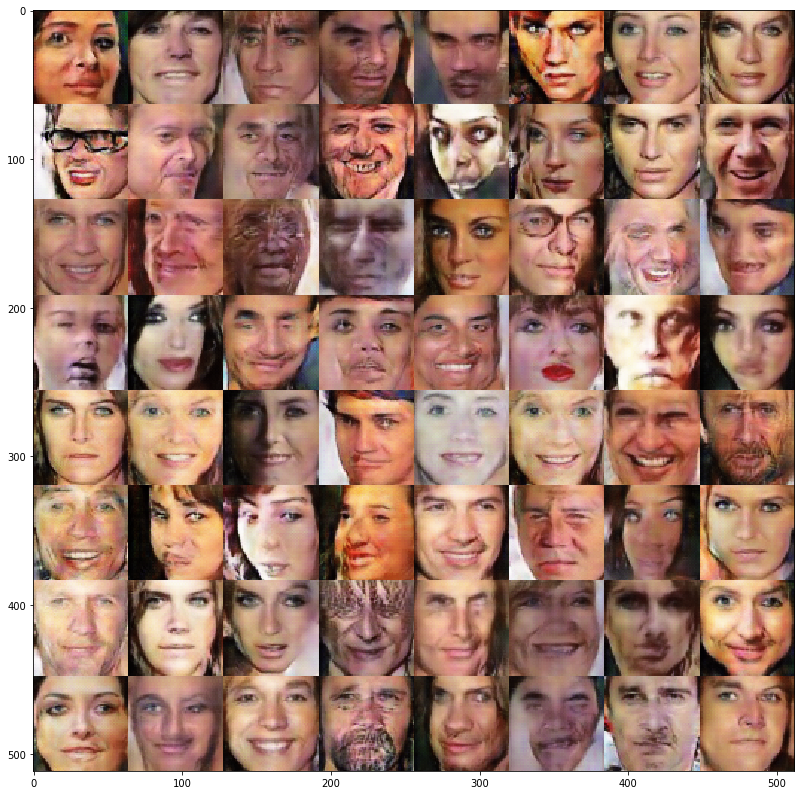

In [24]:
# visualize sample image
plt.figure(figsize=(14,14))
img = imread('sample_faces/train_24_2791.png').astype(int)
imshow(img)

## Face interpolation (1 point)

Let's interpolate between faces: generate two vectors $z_1$ and $z_2$ and get a batch of vectors of the form $\alpha\cdot z_1 + (1- \alpha)\cdot  z_2, \alpha \in [0,1].$ Generate faces on them and look at results. The generator displays pictures in the range from -1 to 1, so use the inverse transform function from the file utils.py.

In [58]:
z1 = np.random.uniform(-1, 1, [1, Z_DIM]).astype(np.float32)
z2 = np.random.uniform(-1, 1, [1, Z_DIM]).astype(np.float32)
alpha = np.random.rand(BATCH_SIZE,100)
batchz = (alpha*z1 + (1-alpha)*z2)
with tf.Session() as sess:
    load(sess, 'checkpoint/')
    samples = sess.run(G, feed_dict={z: batchz, is_training: False})
    save_images(samples, [int(BATCH_SIZE**(0.5)), int(BATCH_SIZE**(0.5))], \
                os.path.join('sample_faces/', 'samples.png'))

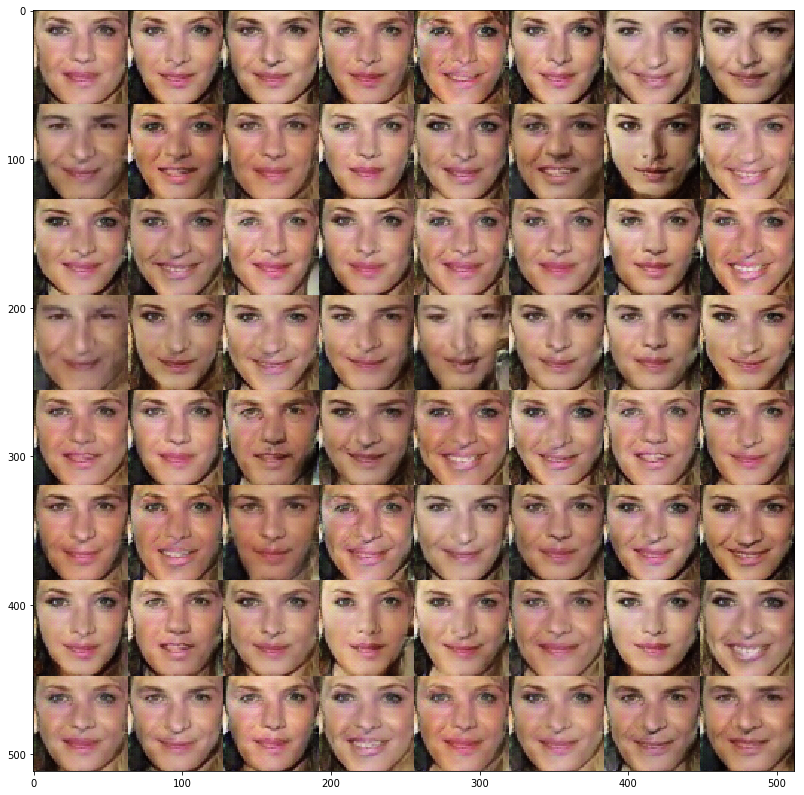

In [59]:
# visualize the samples images
plt.figure(figsize=(14,14))
img = imread('sample_faces/samples.png').astype(int)
imshow(img)

## Adding a smile (1 point + 1 point for good results)

Let's make face smiling. Find several vectors z, such that the generator generates smiling faces and not. Five vectors in every group should be enough (but the more, the better).

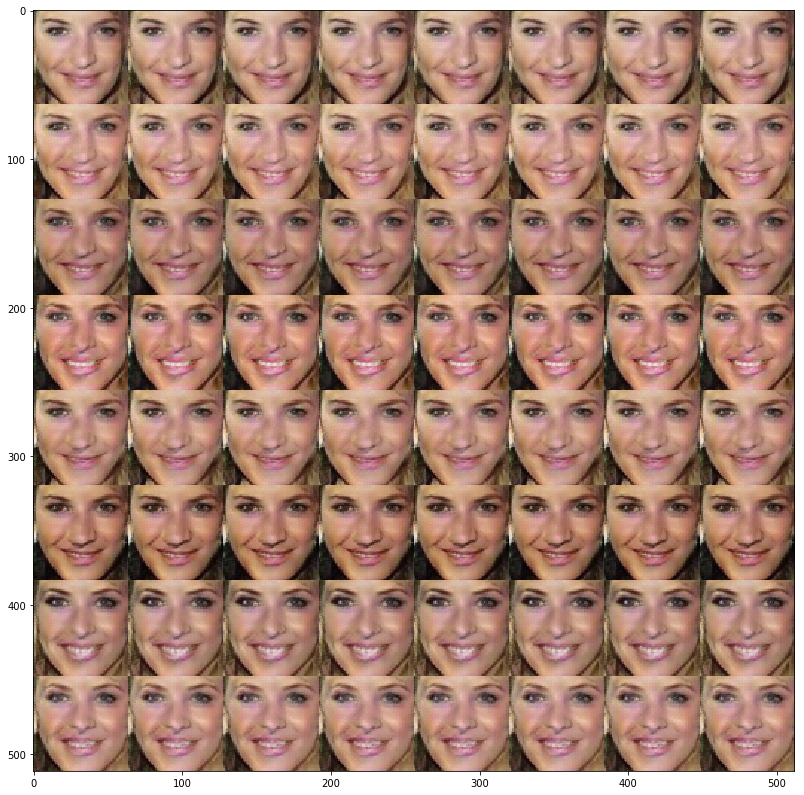

In [100]:
# smile faces
smile = []
smile.append(np.tile(batchz[6], (8, 1)))
smile.append(np.tile(batchz[15], (8, 1)))
smile.append(np.tile(batchz[17], (8, 1)))
smile.append(np.tile(batchz[23], (8, 1)))
smile.append(np.tile(batchz[26], (8, 1)))
smile.append(np.tile(batchz[47], (8, 1)))
smile.append(np.tile(batchz[55], (8, 1)))
smile.append(np.tile(batchz[59], (8, 1)))
smile_ = np.reshape(np.array(smile), (64, Z_DIM))
with tf.Session() as sess:
    load(sess, 'checkpoint/')
    _ = sess.run(G, feed_dict={z: smile_, is_training: False})
    save_images(_, [int(BATCH_SIZE**(0.5)), int(BATCH_SIZE**(0.5))], \
                os.path.join('sample_faces/', 'smile.png'))
# visualize the samples images
plt.figure(figsize=(14,14))
img = imread('sample_faces/smile.png').astype(int)
imshow(img)

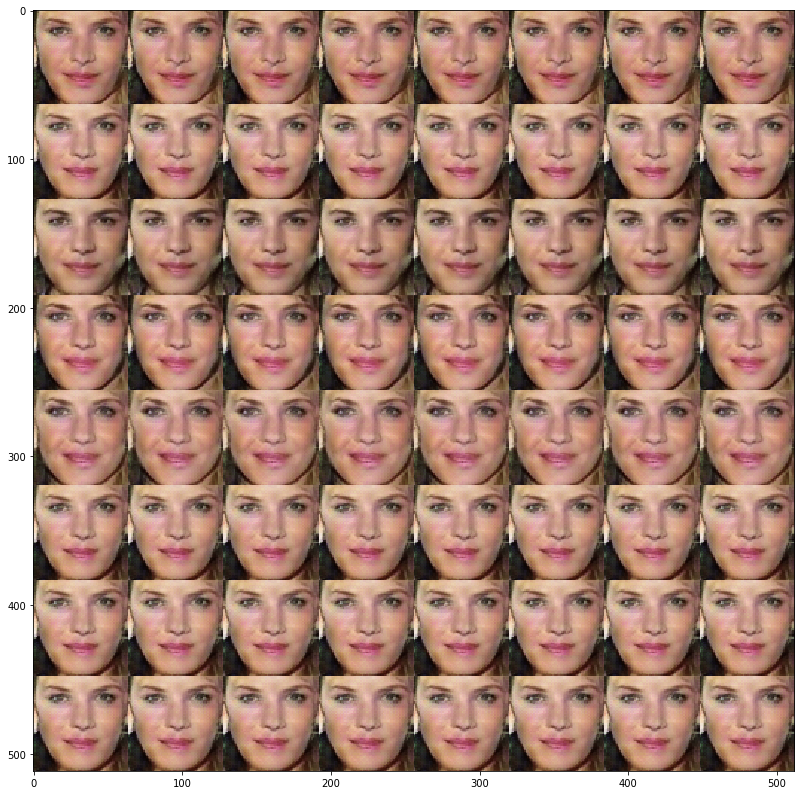

In [101]:
# non smile faces
non_smile = []
non_smile.append(np.tile(batchz[3], (8, 1)))
non_smile.append(np.tile(batchz[11], (8, 1)))
non_smile.append(np.tile(batchz[30], (8, 1)))
non_smile.append(np.tile(batchz[33], (8, 1)))
non_smile.append(np.tile(batchz[0], (8, 1)))
non_smile.append(np.tile(batchz[11], (8, 1)))
non_smile.append(np.tile(batchz[11], (8, 1)))
non_smile.append(np.tile(batchz[11], (8, 1)))
non_smile_ = np.reshape(np.array(non_smile), (64, Z_DIM))
with tf.Session() as sess:
    load(sess, 'checkpoint/')
    _ = sess.run(G, feed_dict={z: non_smile_, is_training: False})
    save_images(_, [int(BATCH_SIZE**(0.5)), int(BATCH_SIZE**(0.5))], \
                os.path.join('sample_faces/', 'non_smile.png'))
# visualize the samples images
plt.figure(figsize=(14,14))
img = imread('sample_faces/non_smile.png').astype(int)
imshow(img)

Calculate "smile vector" as mean of vectors z with generated smile on it minus mean of vectors z with generated not smile on it.

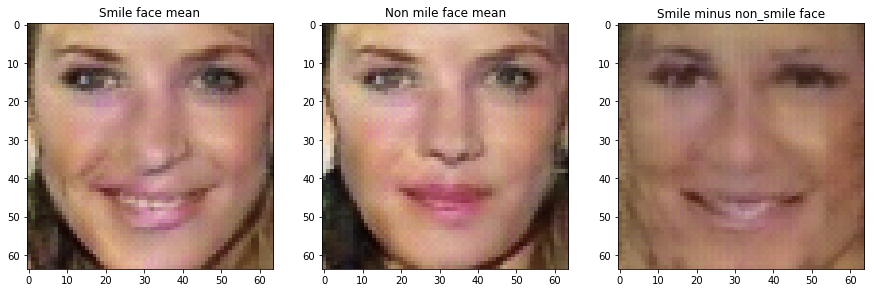

In [129]:
smile_mean = np.mean(np.array(smile), axis=0)[0]
non_smile_mean = np.mean(np.array(non_smile), axis=0)[0]
diff = smile_mean - non_smile_mean
with tf.Session() as sess:
    load(sess, 'checkpoint/')
    sm = sess.run(G, feed_dict={z: np.tile(smile_mean, (64, 1)), is_training: False})
    non_sm = sess.run(G, feed_dict={z: np.tile(non_smile_mean, (64, 1)), is_training: False})
    _= sess.run(G, feed_dict={z: np.tile(diff, (64, 1)), is_training: False})
plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
plt.subplot(131)
plt.title('Smile face mean')
imshow(inverse_transform(sm)[0])
plt.subplot(132)
plt.title('Non mile face mean')
imshow(inverse_transform(non_sm)[0])
plt.subplot(133)
plt.title('Smile minus non_smile face')
imshow(inverse_transform(_)[0])

Look at the result of applying the smile vector: compare the results of generation before and after the addition of the smile vector.

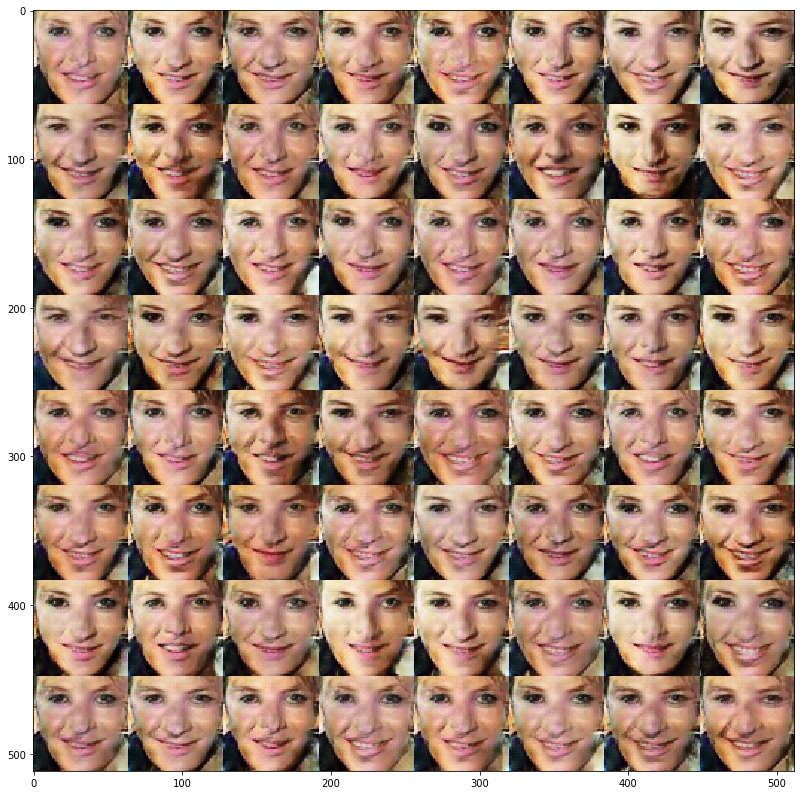

In [139]:
z_add_smile = batchz + smile_mean
with tf.Session() as sess:
    load(sess, 'checkpoint/')
    _ = sess.run(G, feed_dict={z: z_add_smile, is_training: False})
    save_images(_, [int(BATCH_SIZE**(0.5)), int(BATCH_SIZE**(0.5))], \
                os.path.join('sample_faces/', 'z_add_smile.png'))
plt.figure(figsize=(14,14))
img = imread('sample_faces/z_add_smile.png').astype(int)
imshow(img)

If faces looks really cool, add bonus 1 point to your score.